# Documentation for Hydra Multi-Asset Verification Test

## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



# Testcase in this notebook


This notebook documents the results of the following experiment:
- **Action 1**: One agent adds liquidity in XX
- **Action 2**: Another agent trades XX for XX.

which is a reslt of the following settings:

- exo_trade = ['test_q_for_r'] # agent 0
- exo_liq = ['test_add'] # agent 3
- exo_asset = ['alternating']
- exo_composite = ['alternating'] 

## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [89]:
# Dependences
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline



In [2]:
exo_starting_liquidity = ['stochastic']

############## INITIALIZE LIQUIDITY ####################
mu_i_set = 50000
sigma_i_set = 5000
mu_j_set = 50000
sigma_j_set = 5000

    
if exo_starting_liquidity == ['stochastic']:
    sigma_i = sigma_i_set
    mu_i = mu_i_set
    sigma_j = sigma_j_set
    mu_j = mu_j_set
else:
    sigma_i = 0
    mu_i = mu_i_set
    sigma_j = 0
    mu_j = mu_j_set
            

liquidity_list = [10000, 25000, 50000, 75000, 100000, 250000, 500000, 750000, 1000000, 2000000]
#liquidity_list = [10000, 20000]
sigma_ratio = 2
sigma_list = [x / sigma_ratio for x in liquidity_list]
liquidity_draw_ri = []
liquidity_draw_rj = []

for i in range(0, len(liquidity_list)):
    liquidity_draw_ri.append(math.ceil(np.random.lognormal(np.log(liquidity_list[i]), np.sqrt(np.log(sigma_list[i])))))
    liquidity_draw_rj.append(math.ceil(np.random.lognormal(np.log(liquidity_list[i]), np.sqrt(np.log(sigma_list[i])))))

asset_initial_values = {
    'i' : 
        {'R': 1000000,
        'Q': 20000,
        # 'S': 100000000 * 200000000},
        'S': 10000},

    'j' : 
        {'R': 1000000,
        'Q': 20000,
        # 'S': 100000000 * 200000000},
        'S': 10000},
}

Q = asset_initial_values['i']['Q'] + asset_initial_values['j']['Q']
Sq = Q
BTR = Sq / Q
C = asset_initial_values['i']['S'] * asset_initial_values['j']['S']**2 # squared for same as asset k

############## INITIALIZE LIQUIDITY ####################

# Run loop over liquidity values
rdf = {}
for i in range(0, len(liquidity_draw_ri)):
    rdf[i] = {}
    for j in range(0, len(liquidity_draw_rj)):
        print('i:',i,'j:',j)
        asset_initial_values['i']['R'] = liquidity_draw_ri[i]
        asset_initial_values['j']['R'] = liquidity_draw_rj[j]

        ######################### Initialize Shares in Omnipool Differently #############

        initial_values = {
            'UNI_Qi': asset_initial_values['i']['Q'],
            'UNI_Ri': asset_initial_values['i']['R'],
            'UNI_Si': asset_initial_values['i']['S'],
            'UNI_Qj': asset_initial_values['j']['Q'],
            'UNI_Rj': asset_initial_values['j']['R'],
            'UNI_Sj': asset_initial_values['j']['S'],
            'UNI_ij': asset_initial_values['i']['R'],
            'UNI_ji': asset_initial_values['j']['R'],
            'UNI_Sij': asset_initial_values['j']['R']*asset_initial_values['i']['R'],
            'Ri': asset_initial_values['i']['R'],
            # 'Si': 5*asset_initial_values['i']['R'],
            'Si': asset_initial_values['i']['S'],
            'Rj': asset_initial_values['j']['R'],
            # 'Sj': 5*asset_initial_values['j']['R'],
            'Sj': asset_initial_values['j']['S'],
            'Sq': asset_initial_values['i']['S'] + asset_initial_values['j']['S'],
            # 'Sq': 5*Q,
            'Q':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
            'H':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
        }

        # inject initial liquidity values into initialize_liquidity.py
        with open('model/initialize_liquidity.py', 'w') as file:
            file.write('initial_values = {}\n'.format(initial_values))
            file.write('C ={}'.format(C))
            
        # run each experiment in the liquidity set
        df = run.run()
        rdf[i].update({ j: run.postprocessing(df)})
        print("Set up rdf results for i,j = ",i,' ',j)

i: 0 j: 0

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1300
ri_sold  1300
timestep  2
asset_id  j
q_sold  1300
ri_sold  1300
here
not here
timestep  2
asset_id  i
q_sold  370
ri_sold  370
timestep  3
asset_id  i
q_sold  370
ri_sold  370
here
not here
timestep  3
asset_id  i
q_sold  1505
ri_sold  1505
timestep  4
asset_id  i
q_sold  1505
ri_sold  1505
here
not here
timestep  4
asset_id  i
q_sold  817
ri_sold  817
timestep  5


timestep  90
asset_id  j
q_sold  -187
ri_sold  -187
306396
timestep  91
asset_id  j
q_sold  -187
ri_sold  -187
here
not here
timestep  91
asset_id  j
q_sold  1681
ri_sold  1681
timestep  92
asset_id  j
q_sold  1681
ri_sold  1681
here
not here
timestep  92
asset_id  i
q_sold  1065
ri_sold  1065
timestep  93
asset_id  i
q_sold  1065
ri_sold  1065
here
not here
timestep  93
asset_id  i
q_sold  712
ri_sold  712
timestep  94
asset_id  i
q_sold  712
ri_sold  712
here
not here
timestep  94
asset_id  i
q_sold  216
ri_sold  216
timestep  95
asset_id  i
q_sold  216
ri_sold  216
here
not here
timestep  95
asset_id  i
q_sold  -533
ri_sold  -533
timestep  96
asset_id  i
q_sold  -533
ri_sold  -533
here
not here
timestep  96
asset_id  i
q_sold  855
ri_sold  855
timestep  97
asset_id  i
q_sold  855
ri_sold  855
here
not here
timestep  97
asset_id  j
q_sold  1166
ri_sold  1166
timestep  98
asset_id  j
q_sold  1166
ri_sold  1166
here
not here
timestep  98
asset_id  j
q_sold  990
ri_sold  990
timestep  9

here
not here
timestep  88
asset_id  j
q_sold  586
ri_sold  586
timestep  89
asset_id  j
q_sold  586
ri_sold  586
here
not here
timestep  89
asset_id  j
q_sold  782
ri_sold  782
timestep  90
asset_id  j
q_sold  782
ri_sold  782
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1157
ri_sold  1157
306396
timestep  91
asset_id  j
q_sold  1157
ri_sold  1157
here
not here
timestep  91
asset_id  i
q_sold  1169
ri_sold  1169
timestep  92
asset_id  i
q_sold  1169
ri_sold  1169
here
not here
timestep  92
asset_id  i
q_sold  667
ri_sold  667
timestep  93
asset_id  i
q_sold  667
ri_sold  667
here
not here
timestep  93
asset_id  j
q_sold  1519
ri_sold  1519
timestep  94
asset_id  j
q_sold  1519
ri_sold  1519
here
not here
timestep  94
asset_id  j
q_sold  2061
ri_sold  2061
timestep  95
asset_id  j
q_sold  2061
ri_sold  2061
here
not here
timestep  95
asset_id  i
q_sold  1305
ri_sold  1305
timestep  96
asset_id  i
q_sold  

ri_sold  1377
here
not here
timestep  83
asset_id  j
q_sold  1176
ri_sold  1176
timestep  84
asset_id  j
q_sold  1176
ri_sold  1176
here
not here
timestep  84
asset_id  i
q_sold  814
ri_sold  814
timestep  85
asset_id  i
q_sold  814
ri_sold  814
here
not here
timestep  85
asset_id  j
q_sold  1455
ri_sold  1455
timestep  86
asset_id  j
q_sold  1455
ri_sold  1455
here
not here
timestep  86
asset_id  i
q_sold  1532
ri_sold  1532
timestep  87
asset_id  i
q_sold  1532
ri_sold  1532
here
not here
timestep  87
asset_id  i
q_sold  804
ri_sold  804
timestep  88
asset_id  i
q_sold  804
ri_sold  804
here
not here
timestep  88
asset_id  j
q_sold  730
ri_sold  730
timestep  89
asset_id  j
q_sold  730
ri_sold  730
here
not here
timestep  89
asset_id  i
q_sold  1179
ri_sold  1179
timestep  90
asset_id  i
q_sold  1179
ri_sold  1179
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  757
ri_sold  757
306396
timestep  91
asset_id

timestep  91
asset_id  i
q_sold  296
ri_sold  296
here
not here
timestep  91
asset_id  i
q_sold  1423
ri_sold  1423
timestep  92
asset_id  i
q_sold  1423
ri_sold  1423
here
not here
timestep  92
asset_id  j
q_sold  972
ri_sold  972
timestep  93
asset_id  j
q_sold  972
ri_sold  972
here
not here
timestep  93
asset_id  i
q_sold  1308
ri_sold  1308
timestep  94
asset_id  i
q_sold  1308
ri_sold  1308
here
not here
timestep  94
asset_id  i
q_sold  652
ri_sold  652
timestep  95
asset_id  i
q_sold  652
ri_sold  652
here
not here
timestep  95
asset_id  j
q_sold  1179
ri_sold  1179
timestep  96
asset_id  j
q_sold  1179
ri_sold  1179
here
not here
timestep  96
asset_id  i
q_sold  1431
ri_sold  1431
timestep  97
asset_id  i
q_sold  1431
ri_sold  1431
here
not here
timestep  97
asset_id  i
q_sold  59
ri_sold  59
timestep  98
asset_id  i
q_sold  59
ri_sold  59
here
not here
timestep  98
asset_id  i
q_sold  1410
ri_sold  1410
timestep  99
asset_id  i
q_sold  1410
ri_sold  1410
here
not here
timestep

timestep  76
asset_id  j
q_sold  1006
ri_sold  1006
here
not here
timestep  76
asset_id  i
q_sold  1607
ri_sold  1607
timestep  77
asset_id  i
q_sold  1607
ri_sold  1607
here
not here
timestep  77
asset_id  j
q_sold  1187
ri_sold  1187
timestep  78
asset_id  j
q_sold  1187
ri_sold  1187
here
not here
timestep  78
asset_id  i
q_sold  720
ri_sold  720
timestep  79
asset_id  i
q_sold  720
ri_sold  720
here
not here
timestep  79
asset_id  i
q_sold  1155
ri_sold  1155
timestep  80
asset_id  i
q_sold  1155
ri_sold  1155
here
not here
timestep  80
asset_id  i
q_sold  137
ri_sold  137
timestep  81
asset_id  i
q_sold  137
ri_sold  137
here
not here
timestep  81
asset_id  j
q_sold  1402
ri_sold  1402
timestep  82
asset_id  j
q_sold  1402
ri_sold  1402
here
not here
timestep  82
asset_id  i
q_sold  632
ri_sold  632
timestep  83
asset_id  i
q_sold  632
ri_sold  632
here
not here
timestep  83
asset_id  i
q_sold  1215
ri_sold  1215
timestep  84
asset_id  i
q_sold  1215
ri_sold  1215
here
not here
ti

timestep  71
asset_id  j
q_sold  923
ri_sold  923
timestep  72
asset_id  j
q_sold  923
ri_sold  923
here
not here
timestep  72
asset_id  j
q_sold  755
ri_sold  755
timestep  73
asset_id  j
q_sold  755
ri_sold  755
here
not here
timestep  73
asset_id  j
q_sold  1099
ri_sold  1099
timestep  74
asset_id  j
q_sold  1099
ri_sold  1099
here
not here
timestep  74
asset_id  j
q_sold  168
ri_sold  168
timestep  75
asset_id  j
q_sold  168
ri_sold  168
here
not here
timestep  75
asset_id  i
q_sold  539
ri_sold  539
timestep  76
asset_id  i
q_sold  539
ri_sold  539
here
not here
timestep  76
asset_id  j
q_sold  930
ri_sold  930
timestep  77
asset_id  j
q_sold  930
ri_sold  930
here
not here
timestep  77
asset_id  i
q_sold  675
ri_sold  675
timestep  78
asset_id  i
q_sold  675
ri_sold  675
here
not here
timestep  78
asset_id  i
q_sold  1224
ri_sold  1224
timestep  79
asset_id  i
q_sold  1224
ri_sold  1224
here
not here
timestep  79
asset_id  i
q_sold  -268
ri_sold  -268
timestep  80
asset_id  i
q_s

timestep  60
asset_id  i
q_sold  1025
ri_sold  1025
timestep  61
asset_id  i
q_sold  1025
ri_sold  1025
here
not here
timestep  61
asset_id  j
q_sold  1224
ri_sold  1224
timestep  62
asset_id  j
q_sold  1224
ri_sold  1224
here
not here
timestep  62
asset_id  j
q_sold  1032
ri_sold  1032
timestep  63
asset_id  j
q_sold  1032
ri_sold  1032
here
not here
timestep  63
asset_id  j
q_sold  427
ri_sold  427
timestep  64
asset_id  j
q_sold  427
ri_sold  427
here
not here
timestep  64
asset_id  j
q_sold  -7
ri_sold  -7
timestep  65
asset_id  j
q_sold  -7
ri_sold  -7
here
not here
timestep  65
asset_id  j
q_sold  528
ri_sold  528
timestep  66
asset_id  j
q_sold  528
ri_sold  528
here
not here
timestep  66
asset_id  j
q_sold  1610
ri_sold  1610
timestep  67
asset_id  j
q_sold  1610
ri_sold  1610
here
not here
timestep  67
asset_id  i
q_sold  1748
ri_sold  1748
timestep  68
asset_id  i
q_sold  1748
ri_sold  1748
here
not here
timestep  68
asset_id  i
q_sold  2156
ri_sold  2156
timestep  69
asset_i

timestep  62
asset_id  i
q_sold  1430
ri_sold  1430
here
not here
timestep  62
asset_id  j
q_sold  1011
ri_sold  1011
timestep  63
asset_id  j
q_sold  1011
ri_sold  1011
here
not here
timestep  63
asset_id  i
q_sold  1746
ri_sold  1746
timestep  64
asset_id  i
q_sold  1746
ri_sold  1746
here
not here
timestep  64
asset_id  j
q_sold  1533
ri_sold  1533
timestep  65
asset_id  j
q_sold  1533
ri_sold  1533
here
not here
timestep  65
asset_id  i
q_sold  647
ri_sold  647
timestep  66
asset_id  i
q_sold  647
ri_sold  647
here
not here
timestep  66
asset_id  j
q_sold  832
ri_sold  832
timestep  67
asset_id  j
q_sold  832
ri_sold  832
here
not here
timestep  67
asset_id  i
q_sold  876
ri_sold  876
timestep  68
asset_id  i
q_sold  876
ri_sold  876
here
not here
timestep  68
asset_id  i
q_sold  1509
ri_sold  1509
timestep  69
asset_id  i
q_sold  1509
ri_sold  1509
here
not here
timestep  69
asset_id  i
q_sold  904
ri_sold  904
timestep  70
asset_id  i
q_sold  904
ri_sold  904
here
not here
timest

timestep  31
asset_id  i
q_sold  214
ri_sold  214
timestep  32
asset_id  i
q_sold  214
ri_sold  214
here
not here
timestep  32
asset_id  i
q_sold  662
ri_sold  662
timestep  33
asset_id  i
q_sold  662
ri_sold  662
here
not here
timestep  33
asset_id  j
q_sold  897
ri_sold  897
timestep  34
asset_id  j
q_sold  897
ri_sold  897
here
not here
timestep  34
asset_id  i
q_sold  539
ri_sold  539
timestep  35
asset_id  i
q_sold  539
ri_sold  539
here
not here
timestep  35
asset_id  j
q_sold  1550
ri_sold  1550
timestep  36
asset_id  j
q_sold  1550
ri_sold  1550
here
not here
timestep  36
asset_id  j
q_sold  1246
ri_sold  1246
timestep  37
asset_id  j
q_sold  1246
ri_sold  1246
here
not here
timestep  37
asset_id  i
q_sold  559
ri_sold  559
timestep  38
asset_id  i
q_sold  559
ri_sold  559
here
not here
timestep  38
asset_id  j
q_sold  1791
ri_sold  1791
timestep  39
asset_id  j
q_sold  1791
ri_sold  1791
here
not here
timestep  39
asset_id  i
q_sold  1874
ri_sold  1874
timestep  40
asset_id  i

q_sold  1535
ri_sold  1535
timestep  40
asset_id  j
q_sold  1535
ri_sold  1535
here
not here
timestep  40
asset_id  i
q_sold  1696
ri_sold  1696
timestep  41
asset_id  i
q_sold  1696
ri_sold  1696
here
not here
timestep  41
asset_id  j
q_sold  756
ri_sold  756
timestep  42
asset_id  j
q_sold  756
ri_sold  756
here
not here
timestep  42
asset_id  j
q_sold  327
ri_sold  327
timestep  43
asset_id  j
q_sold  327
ri_sold  327
here
not here
timestep  43
asset_id  j
q_sold  560
ri_sold  560
timestep  44
asset_id  j
q_sold  560
ri_sold  560
here
not here
timestep  44
asset_id  j
q_sold  1410
ri_sold  1410
timestep  45
asset_id  j
q_sold  1410
ri_sold  1410
here
not here
timestep  45
asset_id  j
q_sold  1641
ri_sold  1641
timestep  46
asset_id  j
q_sold  1641
ri_sold  1641
here
not here
timestep  46
asset_id  i
q_sold  863
ri_sold  863
timestep  47
asset_id  i
q_sold  863
ri_sold  863
here
not here
timestep  47
asset_id  i
q_sold  35
ri_sold  35
timestep  48
asset_id  i
q_sold  35
ri_sold  35
h

timestep  55
asset_id  j
q_sold  681
ri_sold  681
timestep  56
asset_id  j
q_sold  681
ri_sold  681
here
not here
timestep  56
asset_id  i
q_sold  322
ri_sold  322
timestep  57
asset_id  i
q_sold  322
ri_sold  322
here
not here
timestep  57
asset_id  i
q_sold  1144
ri_sold  1144
timestep  58
asset_id  i
q_sold  1144
ri_sold  1144
here
not here
timestep  58
asset_id  j
q_sold  1512
ri_sold  1512
timestep  59
asset_id  j
q_sold  1512
ri_sold  1512
here
not here
timestep  59
asset_id  j
q_sold  1529
ri_sold  1529
timestep  60
asset_id  j
q_sold  1529
ri_sold  1529
here
not here
timestep  60
asset_id  i
q_sold  329
ri_sold  329
timestep  61
asset_id  i
q_sold  329
ri_sold  329
here
not here
timestep  61
asset_id  j
q_sold  1031
ri_sold  1031
timestep  62
asset_id  j
q_sold  1031
ri_sold  1031
here
not here
timestep  62
asset_id  j
q_sold  175
ri_sold  175
timestep  63
asset_id  j
q_sold  175
ri_sold  175
here
not here
timestep  63
asset_id  i
q_sold  1153
ri_sold  1153
timestep  64
asset_i

timestep  60
asset_id  j
q_sold  497
ri_sold  497
here
not here
timestep  60
asset_id  j
q_sold  -288
ri_sold  -288
timestep  61
asset_id  j
q_sold  -288
ri_sold  -288
here
not here
timestep  61
asset_id  j
q_sold  1216
ri_sold  1216
timestep  62
asset_id  j
q_sold  1216
ri_sold  1216
here
not here
timestep  62
asset_id  j
q_sold  435
ri_sold  435
timestep  63
asset_id  j
q_sold  435
ri_sold  435
here
not here
timestep  63
asset_id  i
q_sold  924
ri_sold  924
timestep  64
asset_id  i
q_sold  924
ri_sold  924
here
not here
timestep  64
asset_id  j
q_sold  1345
ri_sold  1345
timestep  65
asset_id  j
q_sold  1345
ri_sold  1345
here
not here
timestep  65
asset_id  i
q_sold  910
ri_sold  910
timestep  66
asset_id  i
q_sold  910
ri_sold  910
here
not here
timestep  66
asset_id  j
q_sold  1825
ri_sold  1825
timestep  67
asset_id  j
q_sold  1825
ri_sold  1825
here
not here
timestep  67
asset_id  j
q_sold  93
ri_sold  93
timestep  68
asset_id  j
q_sold  93
ri_sold  93
here
not here
timestep  68

timestep  24
asset_id  i
q_sold  1052
ri_sold  1052
timestep  25
asset_id  i
q_sold  1052
ri_sold  1052
here
not here
timestep  25
asset_id  i
q_sold  38
ri_sold  38
timestep  26
asset_id  i
q_sold  38
ri_sold  38
here
not here
timestep  26
asset_id  i
q_sold  1640
ri_sold  1640
timestep  27
asset_id  i
q_sold  1640
ri_sold  1640
here
not here
timestep  27
asset_id  i
q_sold  864
ri_sold  864
timestep  28
asset_id  i
q_sold  864
ri_sold  864
here
not here
timestep  28
asset_id  i
q_sold  407
ri_sold  407
timestep  29
asset_id  i
q_sold  407
ri_sold  407
here
not here
timestep  29
asset_id  i
q_sold  1059
ri_sold  1059
timestep  30
asset_id  i
q_sold  1059
ri_sold  1059
here
not here
timestep  30
asset_id  j
q_sold  1284
ri_sold  1284
timestep  31
asset_id  j
q_sold  1284
ri_sold  1284
here
not here
timestep  31
asset_id  i
q_sold  511
ri_sold  511
timestep  32
asset_id  i
q_sold  511
ri_sold  511
here
not here
timestep  32
asset_id  i
q_sold  354
ri_sold  354
timestep  33
asset_id  i
q

timestep  6
asset_id  i
q_sold  534
ri_sold  534
timestep  7
asset_id  i
q_sold  534
ri_sold  534
here
not here
timestep  7
asset_id  j
q_sold  877
ri_sold  877
timestep  8
asset_id  j
q_sold  877
ri_sold  877
here
not here
timestep  8
asset_id  j
q_sold  535
ri_sold  535
timestep  9
asset_id  j
q_sold  535
ri_sold  535
here
not here
timestep  9
asset_id  i
q_sold  699
ri_sold  699
timestep  10
asset_id  i
q_sold  699
ri_sold  699
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  449
ri_sold  449
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120

timestep  96
asset_id  i
q_sold  1384
ri_sold  1384
here
not here
timestep  96
asset_id  j
q_sold  980
ri_sold  980
timestep  97
asset_id  j
q_sold  980
ri_sold  980
here
not here
timestep  97
asset_id  i
q_sold  -62
ri_sold  -62
timestep  98
asset_id  i
q_sold  -62
ri_sold  -62
here
not here
timestep  98
asset_id  i
q_sold  696
ri_sold  696
timestep  99
asset_id  i
q_sold  696
ri_sold  696
here
not here
timestep  99
asset_id  i
q_sold  1423
ri_sold  1423
timestep  100
asset_id  i
q_sold  1423
ri_sold  1423
here
not here
Total execution time: 1.04s
Set up rdf results for i,j =  0   6
i: 0 j: 7

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
Subse

timestep  71
asset_id  i
q_sold  1308
ri_sold  1308
timestep  72
asset_id  i
q_sold  1308
ri_sold  1308
here
not here
timestep  72
asset_id  j
q_sold  1406
ri_sold  1406
timestep  73
asset_id  j
q_sold  1406
ri_sold  1406
here
not here
timestep  73
asset_id  j
q_sold  643
ri_sold  643
timestep  74
asset_id  j
q_sold  643
ri_sold  643
here
not here
timestep  74
asset_id  j
q_sold  1148
ri_sold  1148
timestep  75
asset_id  j
q_sold  1148
ri_sold  1148
here
not here
timestep  75
asset_id  j
q_sold  992
ri_sold  992
timestep  76
asset_id  j
q_sold  992
ri_sold  992
here
not here
timestep  76
asset_id  i
q_sold  1577
ri_sold  1577
timestep  77
asset_id  i
q_sold  1577
ri_sold  1577
here
not here
timestep  77
asset_id  i
q_sold  839
ri_sold  839
timestep  78
asset_id  i
q_sold  839
ri_sold  839
here
not here
timestep  78
asset_id  j
q_sold  659
ri_sold  659
timestep  79
asset_id  j
q_sold  659
ri_sold  659
here
not here
timestep  79
asset_id  i
q_sold  983
ri_sold  983
timestep  80
asset_id 

ri_sold  1552
here
not here
timestep  83
asset_id  i
q_sold  825
ri_sold  825
timestep  84
asset_id  i
q_sold  825
ri_sold  825
here
not here
timestep  84
asset_id  j
q_sold  1146
ri_sold  1146
timestep  85
asset_id  j
q_sold  1146
ri_sold  1146
here
not here
timestep  85
asset_id  i
q_sold  1466
ri_sold  1466
timestep  86
asset_id  i
q_sold  1466
ri_sold  1466
here
not here
timestep  86
asset_id  i
q_sold  1262
ri_sold  1262
timestep  87
asset_id  i
q_sold  1262
ri_sold  1262
here
not here
timestep  87
asset_id  i
q_sold  1138
ri_sold  1138
timestep  88
asset_id  i
q_sold  1138
ri_sold  1138
here
not here
timestep  88
asset_id  i
q_sold  370
ri_sold  370
timestep  89
asset_id  i
q_sold  370
ri_sold  370
here
not here
timestep  89
asset_id  i
q_sold  1445
ri_sold  1445
timestep  90
asset_id  i
q_sold  1445
ri_sold  1445
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  952
ri_sold  952
306396
timestep  91
asse

timestep  55
asset_id  j
q_sold  1067
ri_sold  1067
timestep  56
asset_id  j
q_sold  1067
ri_sold  1067
here
not here
timestep  56
asset_id  i
q_sold  1043
ri_sold  1043
timestep  57
asset_id  i
q_sold  1043
ri_sold  1043
here
not here
timestep  57
asset_id  j
q_sold  194
ri_sold  194
timestep  58
asset_id  j
q_sold  194
ri_sold  194
here
not here
timestep  58
asset_id  j
q_sold  308
ri_sold  308
timestep  59
asset_id  j
q_sold  308
ri_sold  308
here
not here
timestep  59
asset_id  j
q_sold  1198
ri_sold  1198
timestep  60
asset_id  j
q_sold  1198
ri_sold  1198
here
not here
timestep  60
asset_id  j
q_sold  1200
ri_sold  1200
timestep  61
asset_id  j
q_sold  1200
ri_sold  1200
here
not here
timestep  61
asset_id  j
q_sold  16
ri_sold  16
timestep  62
asset_id  j
q_sold  16
ri_sold  16
here
not here
timestep  62
asset_id  j
q_sold  1733
ri_sold  1733
timestep  63
asset_id  j
q_sold  1733
ri_sold  1733
here
not here
timestep  63
asset_id  j
q_sold  1038
ri_sold  1038
timestep  64
asset_i

ri_sold  1141
timestep  57
asset_id  j
q_sold  1141
ri_sold  1141
here
not here
timestep  57
asset_id  j
q_sold  535
ri_sold  535
timestep  58
asset_id  j
q_sold  535
ri_sold  535
here
not here
timestep  58
asset_id  i
q_sold  -146
ri_sold  -146
timestep  59
asset_id  i
q_sold  -146
ri_sold  -146
here
not here
timestep  59
asset_id  i
q_sold  1489
ri_sold  1489
timestep  60
asset_id  i
q_sold  1489
ri_sold  1489
here
not here
timestep  60
asset_id  i
q_sold  1712
ri_sold  1712
timestep  61
asset_id  i
q_sold  1712
ri_sold  1712
here
not here
timestep  61
asset_id  i
q_sold  811
ri_sold  811
timestep  62
asset_id  i
q_sold  811
ri_sold  811
here
not here
timestep  62
asset_id  i
q_sold  676
ri_sold  676
timestep  63
asset_id  i
q_sold  676
ri_sold  676
here
not here
timestep  63
asset_id  j
q_sold  1136
ri_sold  1136
timestep  64
asset_id  j
q_sold  1136
ri_sold  1136
here
not here
timestep  64
asset_id  j
q_sold  285
ri_sold  285
timestep  65
asset_id  j
q_sold  285
ri_sold  285
here
n

timestep  70
asset_id  i
q_sold  244
ri_sold  244
here
not here
timestep  70
asset_id  j
q_sold  947
ri_sold  947
timestep  71
asset_id  j
q_sold  947
ri_sold  947
here
not here
timestep  71
asset_id  j
q_sold  1166
ri_sold  1166
timestep  72
asset_id  j
q_sold  1166
ri_sold  1166
here
not here
timestep  72
asset_id  i
q_sold  905
ri_sold  905
timestep  73
asset_id  i
q_sold  905
ri_sold  905
here
not here
timestep  73
asset_id  i
q_sold  748
ri_sold  748
timestep  74
asset_id  i
q_sold  748
ri_sold  748
here
not here
timestep  74
asset_id  j
q_sold  769
ri_sold  769
timestep  75
asset_id  j
q_sold  769
ri_sold  769
here
not here
timestep  75
asset_id  i
q_sold  849
ri_sold  849
timestep  76
asset_id  i
q_sold  849
ri_sold  849
here
not here
timestep  76
asset_id  j
q_sold  1649
ri_sold  1649
timestep  77
asset_id  j
q_sold  1649
ri_sold  1649
here
not here
timestep  77
asset_id  j
q_sold  1540
ri_sold  1540
timestep  78
asset_id  j
q_sold  1540
ri_sold  1540
here
not here
timestep  78

timestep  36
asset_id  i
q_sold  1508
ri_sold  1508
timestep  37
asset_id  i
q_sold  1508
ri_sold  1508
here
not here
timestep  37
asset_id  i
q_sold  1540
ri_sold  1540
timestep  38
asset_id  i
q_sold  1540
ri_sold  1540
here
not here
timestep  38
asset_id  i
q_sold  1120
ri_sold  1120
timestep  39
asset_id  i
q_sold  1120
ri_sold  1120
here
not here
timestep  39
asset_id  j
q_sold  1235
ri_sold  1235
timestep  40
asset_id  j
q_sold  1235
ri_sold  1235
here
not here
timestep  40
asset_id  i
q_sold  940
ri_sold  940
timestep  41
asset_id  i
q_sold  940
ri_sold  940
here
not here
timestep  41
asset_id  j
q_sold  823
ri_sold  823
timestep  42
asset_id  j
q_sold  823
ri_sold  823
here
not here
timestep  42
asset_id  j
q_sold  1055
ri_sold  1055
timestep  43
asset_id  j
q_sold  1055
ri_sold  1055
here
not here
timestep  43
asset_id  i
q_sold  1134
ri_sold  1134
timestep  44
asset_id  i
q_sold  1134
ri_sold  1134
here
not here
timestep  44
asset_id  i
q_sold  883
ri_sold  883
timestep  45
a

timestep  18
asset_id  i
q_sold  882
ri_sold  882
timestep  19
asset_id  i
q_sold  882
ri_sold  882
here
not here
timestep  19
asset_id  i
q_sold  1658
ri_sold  1658
timestep  20
asset_id  i
q_sold  1658
ri_sold  1658
here
not here
timestep  20
asset_id  i
q_sold  659
ri_sold  659
timestep  21
asset_id  i
q_sold  659
ri_sold  659
here
not here
timestep  21
asset_id  i
q_sold  1114
ri_sold  1114
timestep  22
asset_id  i
q_sold  1114
ri_sold  1114
here
not here
timestep  22
asset_id  j
q_sold  955
ri_sold  955
timestep  23
asset_id  j
q_sold  955
ri_sold  955
here
not here
timestep  23
asset_id  i
q_sold  1459
ri_sold  1459
timestep  24
asset_id  i
q_sold  1459
ri_sold  1459
here
not here
timestep  24
asset_id  j
q_sold  1329
ri_sold  1329
timestep  25
asset_id  j
q_sold  1329
ri_sold  1329
here
not here
timestep  25
asset_id  j
q_sold  1559
ri_sold  1559
timestep  26
asset_id  j
q_sold  1559
ri_sold  1559
here
not here
timestep  26
asset_id  i
q_sold  1645
ri_sold  1645
timestep  27
ass

timestep  17
asset_id  j
q_sold  1562
ri_sold  1562
timestep  18
asset_id  j
q_sold  1562
ri_sold  1562
here
not here
timestep  18
asset_id  i
q_sold  1276
ri_sold  1276
timestep  19
asset_id  i
q_sold  1276
ri_sold  1276
here
not here
timestep  19
asset_id  j
q_sold  1481
ri_sold  1481
timestep  20
asset_id  j
q_sold  1481
ri_sold  1481
here
not here
timestep  20
asset_id  j
q_sold  727
ri_sold  727
timestep  21
asset_id  j
q_sold  727
ri_sold  727
here
not here
timestep  21
asset_id  j
q_sold  1427
ri_sold  1427
timestep  22
asset_id  j
q_sold  1427
ri_sold  1427
here
not here
timestep  22
asset_id  i
q_sold  902
ri_sold  902
timestep  23
asset_id  i
q_sold  902
ri_sold  902
here
not here
timestep  23
asset_id  j
q_sold  1497
ri_sold  1497
timestep  24
asset_id  j
q_sold  1497
ri_sold  1497
here
not here
timestep  24
asset_id  j
q_sold  570
ri_sold  570
timestep  25
asset_id  j
q_sold  570
ri_sold  570
here
not here
timestep  25
asset_id  i
q_sold  401
ri_sold  401
timestep  26
asset

Total execution time: 0.92s
Set up rdf results for i,j =  1   0
i: 1 j: 1

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  337
ri_sold  337
timestep  2
asset_id  j
q_sold  337
ri_sold  337
here
not here
timestep  2
asset_id  i
q_sold  684
ri_sold  684
timestep  3
asset_id  i
q_sold  684
ri_sold  684
here
not here
timestep  3
asset_id  j
q_sold  639
ri_sold  639
timestep  4
asset_id  j
q_sold  639
ri_sold  639
here
not here
times

here
not here
timestep  97
asset_id  j
q_sold  839
ri_sold  839
timestep  98
asset_id  j
q_sold  839
ri_sold  839
here
not here
timestep  98
asset_id  j
q_sold  1743
ri_sold  1743
timestep  99
asset_id  j
q_sold  1743
ri_sold  1743
here
not here
timestep  99
asset_id  j
q_sold  423
ri_sold  423
timestep  100
asset_id  j
q_sold  423
ri_sold  423
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  880
ri_sold  880
timestep  2
asset_id  j
q_sold  880
ri_sold  880
here
not here
timestep  2
asset_id  i
q_sold  1268
ri_sold  1268
timestep  3
asset_id  i
q_sold  1268
ri_sold  1268
here
not here
timestep  3
asset_id  i
q_sold  178
ri_sold  178
timestep  4
asset_id  i
q_sold  178
ri_sold  178
here
not here
timestep  4
asset_id  j
q_sold  1293
ri_sold  1293
timestep  5
asset_id  j
q_sold  1293
ri_sold  1293
here
not here
timestep  5
asset_id  i
q_sold  468
ri_sold  468
timestep  6
asset_id  i
q_

timestep  62
asset_id  j
q_sold  952
ri_sold  952
timestep  63
asset_id  j
q_sold  952
ri_sold  952
here
not here
timestep  63
asset_id  i
q_sold  1243
ri_sold  1243
timestep  64
asset_id  i
q_sold  1243
ri_sold  1243
here
not here
timestep  64
asset_id  j
q_sold  1336
ri_sold  1336
timestep  65
asset_id  j
q_sold  1336
ri_sold  1336
here
not here
timestep  65
asset_id  j
q_sold  1361
ri_sold  1361
timestep  66
asset_id  j
q_sold  1361
ri_sold  1361
here
not here
timestep  66
asset_id  j
q_sold  1340
ri_sold  1340
timestep  67
asset_id  j
q_sold  1340
ri_sold  1340
here
not here
timestep  67
asset_id  j
q_sold  140
ri_sold  140
timestep  68
asset_id  j
q_sold  140
ri_sold  140
here
not here
timestep  68
asset_id  i
q_sold  18
ri_sold  18
timestep  69
asset_id  i
q_sold  18
ri_sold  18
here
not here
timestep  69
asset_id  i
q_sold  1286
ri_sold  1286
timestep  70
asset_id  i
q_sold  1286
ri_sold  1286
here
not here
timestep  70
asset_id  j
q_sold  905
ri_sold  905
timestep  71
asset_id 

timestep  55
asset_id  j
q_sold  503
ri_sold  503
timestep  56
asset_id  j
q_sold  503
ri_sold  503
here
not here
timestep  56
asset_id  i
q_sold  947
ri_sold  947
timestep  57
asset_id  i
q_sold  947
ri_sold  947
here
not here
timestep  57
asset_id  i
q_sold  619
ri_sold  619
timestep  58
asset_id  i
q_sold  619
ri_sold  619
here
not here
timestep  58
asset_id  i
q_sold  769
ri_sold  769
timestep  59
asset_id  i
q_sold  769
ri_sold  769
here
not here
timestep  59
asset_id  i
q_sold  1245
ri_sold  1245
timestep  60
asset_id  i
q_sold  1245
ri_sold  1245
here
not here
timestep  60
asset_id  i
q_sold  319
ri_sold  319
timestep  61
asset_id  i
q_sold  319
ri_sold  319
here
not here
timestep  61
asset_id  j
q_sold  991
ri_sold  991
timestep  62
asset_id  j
q_sold  991
ri_sold  991
here
not here
timestep  62
asset_id  j
q_sold  797
ri_sold  797
timestep  63
asset_id  j
q_sold  797
ri_sold  797
here
not here
timestep  63
asset_id  j
q_sold  1237
ri_sold  1237
timestep  64
asset_id  j
q_sold 

timestep  55
asset_id  j
q_sold  891
ri_sold  891
timestep  56
asset_id  j
q_sold  891
ri_sold  891
here
not here
timestep  56
asset_id  i
q_sold  915
ri_sold  915
timestep  57
asset_id  i
q_sold  915
ri_sold  915
here
not here
timestep  57
asset_id  i
q_sold  446
ri_sold  446
timestep  58
asset_id  i
q_sold  446
ri_sold  446
here
not here
timestep  58
asset_id  i
q_sold  1225
ri_sold  1225
timestep  59
asset_id  i
q_sold  1225
ri_sold  1225
here
not here
timestep  59
asset_id  j
q_sold  1440
ri_sold  1440
timestep  60
asset_id  j
q_sold  1440
ri_sold  1440
here
not here
timestep  60
asset_id  i
q_sold  405
ri_sold  405
timestep  61
asset_id  i
q_sold  405
ri_sold  405
here
not here
timestep  61
asset_id  i
q_sold  782
ri_sold  782
timestep  62
asset_id  i
q_sold  782
ri_sold  782
here
not here
timestep  62
asset_id  j
q_sold  954
ri_sold  954
timestep  63
asset_id  j
q_sold  954
ri_sold  954
here
not here
timestep  63
asset_id  j
q_sold  957
ri_sold  957
timestep  64
asset_id  j
q_sol

timestep  23
asset_id  i
q_sold  1359
ri_sold  1359
timestep  24
asset_id  i
q_sold  1359
ri_sold  1359
here
not here
timestep  24
asset_id  j
q_sold  1050
ri_sold  1050
timestep  25
asset_id  j
q_sold  1050
ri_sold  1050
here
not here
timestep  25
asset_id  j
q_sold  1136
ri_sold  1136
timestep  26
asset_id  j
q_sold  1136
ri_sold  1136
here
not here
timestep  26
asset_id  i
q_sold  625
ri_sold  625
timestep  27
asset_id  i
q_sold  625
ri_sold  625
here
not here
timestep  27
asset_id  i
q_sold  859
ri_sold  859
timestep  28
asset_id  i
q_sold  859
ri_sold  859
here
not here
timestep  28
asset_id  i
q_sold  537
ri_sold  537
timestep  29
asset_id  i
q_sold  537
ri_sold  537
here
not here
timestep  29
asset_id  j
q_sold  587
ri_sold  587
timestep  30
asset_id  j
q_sold  587
ri_sold  587
here
not here
timestep  30
asset_id  j
q_sold  1643
ri_sold  1643
timestep  31
asset_id  j
q_sold  1643
ri_sold  1643
here
not here
timestep  31
asset_id  j
q_sold  1994
ri_sold  1994
timestep  32
asset_i

here
not here
timestep  34
asset_id  i
q_sold  337
ri_sold  337
timestep  35
asset_id  i
q_sold  337
ri_sold  337
here
not here
timestep  35
asset_id  i
q_sold  2155
ri_sold  2155
timestep  36
asset_id  i
q_sold  2155
ri_sold  2155
here
not here
timestep  36
asset_id  j
q_sold  1665
ri_sold  1665
timestep  37
asset_id  j
q_sold  1665
ri_sold  1665
here
not here
timestep  37
asset_id  i
q_sold  371
ri_sold  371
timestep  38
asset_id  i
q_sold  371
ri_sold  371
here
not here
timestep  38
asset_id  j
q_sold  827
ri_sold  827
timestep  39
asset_id  j
q_sold  827
ri_sold  827
here
not here
timestep  39
asset_id  i
q_sold  914
ri_sold  914
timestep  40
asset_id  i
q_sold  914
ri_sold  914
here
not here
timestep  40
asset_id  j
q_sold  1193
ri_sold  1193
timestep  41
asset_id  j
q_sold  1193
ri_sold  1193
here
not here
timestep  41
asset_id  j
q_sold  621
ri_sold  621
timestep  42
asset_id  j
q_sold  621
ri_sold  621
here
not here
timestep  42
asset_id  j
q_sold  1856
ri_sold  1856
timestep  

timestep  7
asset_id  j
q_sold  1655
ri_sold  1655
timestep  8
asset_id  j
q_sold  1655
ri_sold  1655
here
not here
timestep  8
asset_id  i
q_sold  494
ri_sold  494
timestep  9
asset_id  i
q_sold  494
ri_sold  494
here
not here
timestep  9
asset_id  j
q_sold  1548
ri_sold  1548
timestep  10
asset_id  j
q_sold  1548
ri_sold  1548
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  1251
ri_sold  1251
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   


here
not here
timestep  73
asset_id  i
q_sold  1122
ri_sold  1122
timestep  74
asset_id  i
q_sold  1122
ri_sold  1122
here
not here
timestep  74
asset_id  i
q_sold  828
ri_sold  828
timestep  75
asset_id  i
q_sold  828
ri_sold  828
here
not here
timestep  75
asset_id  j
q_sold  1123
ri_sold  1123
timestep  76
asset_id  j
q_sold  1123
ri_sold  1123
here
not here
timestep  76
asset_id  j
q_sold  948
ri_sold  948
timestep  77
asset_id  j
q_sold  948
ri_sold  948
here
not here
timestep  77
asset_id  i
q_sold  1727
ri_sold  1727
timestep  78
asset_id  i
q_sold  1727
ri_sold  1727
here
not here
timestep  78
asset_id  j
q_sold  769
ri_sold  769
timestep  79
asset_id  j
q_sold  769
ri_sold  769
here
not here
timestep  79
asset_id  i
q_sold  1296
ri_sold  1296
timestep  80
asset_id  i
q_sold  1296
ri_sold  1296
here
not here
timestep  80
asset_id  j
q_sold  1446
ri_sold  1446
timestep  81
asset_id  j
q_sold  1446
ri_sold  1446
here
not here
timestep  81
asset_id  i
q_sold  343
ri_sold  343
time

timestep  55
asset_id  i
q_sold  1122
ri_sold  1122
timestep  56
asset_id  i
q_sold  1122
ri_sold  1122
here
not here
timestep  56
asset_id  i
q_sold  243
ri_sold  243
timestep  57
asset_id  i
q_sold  243
ri_sold  243
here
not here
timestep  57
asset_id  j
q_sold  1349
ri_sold  1349
timestep  58
asset_id  j
q_sold  1349
ri_sold  1349
here
not here
timestep  58
asset_id  i
q_sold  1606
ri_sold  1606
timestep  59
asset_id  i
q_sold  1606
ri_sold  1606
here
not here
timestep  59
asset_id  i
q_sold  453
ri_sold  453
timestep  60
asset_id  i
q_sold  453
ri_sold  453
here
not here
timestep  60
asset_id  i
q_sold  1587
ri_sold  1587
timestep  61
asset_id  i
q_sold  1587
ri_sold  1587
here
not here
timestep  61
asset_id  i
q_sold  1295
ri_sold  1295
timestep  62
asset_id  i
q_sold  1295
ri_sold  1295
here
not here
timestep  62
asset_id  i
q_sold  658
ri_sold  658
timestep  63
asset_id  i
q_sold  658
ri_sold  658
here
not here
timestep  63
asset_id  j
q_sold  710
ri_sold  710
timestep  64
asset

timestep  55
asset_id  i
q_sold  318
ri_sold  318
timestep  56
asset_id  i
q_sold  318
ri_sold  318
here
not here
timestep  56
asset_id  j
q_sold  1128
ri_sold  1128
timestep  57
asset_id  j
q_sold  1128
ri_sold  1128
here
not here
timestep  57
asset_id  i
q_sold  1278
ri_sold  1278
timestep  58
asset_id  i
q_sold  1278
ri_sold  1278
here
not here
timestep  58
asset_id  j
q_sold  965
ri_sold  965
timestep  59
asset_id  j
q_sold  965
ri_sold  965
here
not here
timestep  59
asset_id  j
q_sold  1654
ri_sold  1654
timestep  60
asset_id  j
q_sold  1654
ri_sold  1654
here
not here
timestep  60
asset_id  i
q_sold  654
ri_sold  654
timestep  61
asset_id  i
q_sold  654
ri_sold  654
here
not here
timestep  61
asset_id  i
q_sold  351
ri_sold  351
timestep  62
asset_id  i
q_sold  351
ri_sold  351
here
not here
timestep  62
asset_id  i
q_sold  1395
ri_sold  1395
timestep  63
asset_id  i
q_sold  1395
ri_sold  1395
here
not here
timestep  63
asset_id  i
q_sold  1102
ri_sold  1102
timestep  64
asset_i

timestep  70
asset_id  i
q_sold  1426
ri_sold  1426
timestep  71
asset_id  i
q_sold  1426
ri_sold  1426
here
not here
timestep  71
asset_id  i
q_sold  2293
ri_sold  2293
timestep  72
asset_id  i
q_sold  2293
ri_sold  2293
here
not here
timestep  72
asset_id  i
q_sold  811
ri_sold  811
timestep  73
asset_id  i
q_sold  811
ri_sold  811
here
not here
timestep  73
asset_id  j
q_sold  1508
ri_sold  1508
timestep  74
asset_id  j
q_sold  1508
ri_sold  1508
here
not here
timestep  74
asset_id  i
q_sold  1289
ri_sold  1289
timestep  75
asset_id  i
q_sold  1289
ri_sold  1289
here
not here
timestep  75
asset_id  i
q_sold  605
ri_sold  605
timestep  76
asset_id  i
q_sold  605
ri_sold  605
here
not here
timestep  76
asset_id  i
q_sold  1489
ri_sold  1489
timestep  77
asset_id  i
q_sold  1489
ri_sold  1489
here
not here
timestep  77
asset_id  j
q_sold  940
ri_sold  940
timestep  78
asset_id  j
q_sold  940
ri_sold  940
here
not here
timestep  78
asset_id  i
q_sold  339
ri_sold  339
timestep  79
asset

timestep  49
asset_id  j
q_sold  1085
ri_sold  1085
timestep  50
asset_id  j
q_sold  1085
ri_sold  1085
here
not here
timestep  50
asset_id  j
q_sold  687
ri_sold  687
timestep  51
asset_id  j
q_sold  687
ri_sold  687
here
not here
timestep  51
asset_id  i
q_sold  657
ri_sold  657
timestep  52
asset_id  i
q_sold  657
ri_sold  657
here
not here
timestep  52
asset_id  i
q_sold  975
ri_sold  975
timestep  53
asset_id  i
q_sold  975
ri_sold  975
here
not here
timestep  53
asset_id  j
q_sold  1874
ri_sold  1874
timestep  54
asset_id  j
q_sold  1874
ri_sold  1874
here
not here
timestep  54
asset_id  i
q_sold  1169
ri_sold  1169
timestep  55
asset_id  i
q_sold  1169
ri_sold  1169
here
not here
timestep  55
asset_id  i
q_sold  1042
ri_sold  1042
timestep  56
asset_id  i
q_sold  1042
ri_sold  1042
here
not here
timestep  56
asset_id  i
q_sold  389
ri_sold  389
timestep  57
asset_id  i
q_sold  389
ri_sold  389
here
not here
timestep  57
asset_id  i
q_sold  1198
ri_sold  1198
timestep  58
asset_i

timestep  34
asset_id  i
q_sold  1045
ri_sold  1045
timestep  35
asset_id  i
q_sold  1045
ri_sold  1045
here
not here
timestep  35
asset_id  i
q_sold  1412
ri_sold  1412
timestep  36
asset_id  i
q_sold  1412
ri_sold  1412
here
not here
timestep  36
asset_id  i
q_sold  1964
ri_sold  1964
timestep  37
asset_id  i
q_sold  1964
ri_sold  1964
here
not here
timestep  37
asset_id  i
q_sold  1479
ri_sold  1479
timestep  38
asset_id  i
q_sold  1479
ri_sold  1479
here
not here
timestep  38
asset_id  j
q_sold  389
ri_sold  389
timestep  39
asset_id  j
q_sold  389
ri_sold  389
here
not here
timestep  39
asset_id  j
q_sold  1654
ri_sold  1654
timestep  40
asset_id  j
q_sold  1654
ri_sold  1654
here
not here
timestep  40
asset_id  i
q_sold  1622
ri_sold  1622
timestep  41
asset_id  i
q_sold  1622
ri_sold  1622
here
not here
timestep  41
asset_id  j
q_sold  276
ri_sold  276
timestep  42
asset_id  j
q_sold  276
ri_sold  276
here
not here
timestep  42
asset_id  i
q_sold  871
ri_sold  871
timestep  43
a

timestep  21
asset_id  j
q_sold  1241
ri_sold  1241
timestep  22
asset_id  j
q_sold  1241
ri_sold  1241
here
not here
timestep  22
asset_id  j
q_sold  1622
ri_sold  1622
timestep  23
asset_id  j
q_sold  1622
ri_sold  1622
here
not here
timestep  23
asset_id  i
q_sold  1670
ri_sold  1670
timestep  24
asset_id  i
q_sold  1670
ri_sold  1670
here
not here
timestep  24
asset_id  j
q_sold  208
ri_sold  208
timestep  25
asset_id  j
q_sold  208
ri_sold  208
here
not here
timestep  25
asset_id  j
q_sold  314
ri_sold  314
timestep  26
asset_id  j
q_sold  314
ri_sold  314
here
not here
timestep  26
asset_id  j
q_sold  1342
ri_sold  1342
timestep  27
asset_id  j
q_sold  1342
ri_sold  1342
here
not here
timestep  27
asset_id  i
q_sold  1131
ri_sold  1131
timestep  28
asset_id  i
q_sold  1131
ri_sold  1131
here
not here
timestep  28
asset_id  j
q_sold  989
ri_sold  989
timestep  29
asset_id  j
q_sold  989
ri_sold  989
here
not here
timestep  29
asset_id  i
q_sold  -160
ri_sold  -160
timestep  30
ass

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1682
ri_sold  1682
timestep  2
asset_id  j
q_sold  1682
ri_sold  1682
here
not here
timestep  2
asset_id  i
q_sold  956
ri_sold  956
timestep  3
asset_id  i
q_sold  956
ri_sold  956
here
not here
timestep  3
asset_id  i
q_sold  421
ri_sold  421
timestep  4
asset_id  i
q_sold  421
ri_sold  421
here
not here
timestep  4
asset_id  i
q_sold  1145
ri_sold  1145
timestep  5
asset_id  i
q_sold  1145
ri_sold  1145
here
not here
timestep  5
asset_id  j
q_sold  355
ri_sold  355
timestep  6
asset_id  j
q_sold  355
ri_sold  355
here
not here
timestep  6
asset_id  i
q_sold  1259
ri_sold  1259
timestep  7
asset_id  i
q_sold  1259
ri_sold  1259
here
not here
timestep  7
asset_id  j
q_sold  1142
ri_sold  1142
timestep  8
asset_id  j
q_sold  1142
ri_sold  1142
here
not here
timestep  8
asset_id  j
q_sold  1768
ri_sold  1768
timestep  9
asset_id  j
q_sold  1768
ri_s

Set up rdf results for i,j =  1   7
i: 1 j: 8

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  748
ri_sold  748
timestep  2
asset_id  i
q_sold  748
ri_sold  748
here
not here
timestep  2
asset_id  i
q_sold  163
ri_sold  163
timestep  3
asset_id  i
q_sold  163
ri_sold  163
here
not here
timestep  3
asset_id  i
q_sold  1296
ri_sold  1296
timestep  4
asset_id  i
q_sold  1296
ri_sold  1296
here
not here
timestep  4
asset_id  j
q_sol

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  -4
ri_sold  -4
timestep  2
asset_id  i
q_sold  -4
ri_sold  -4
here
not here
timestep  2
asset_id  i
q_sold  1124
ri_sold  1124
timestep  3
asset_id  i
q_sold  1124
ri_sold  1124
here
not here
timestep  3
asset_id  j
q_sold  1298
ri_sold  1298
timestep  4
asset_id  j
q_sold  1298
ri_sold  1298
here
not here
timestep  4
asset_id  i
q_sold  1205
ri_sold  1205
timestep  5
asset_id  i
q_sold  1205
ri_sold  1205
here
not here
timestep  5
asset_id  i
q_sold  778
ri_sold  778
timestep  6
asset_id  i
q_sold  778
ri_sold  778
here
not here
timestep  6
asset_id  j
q_sold  369
ri_sold  369
timestep  7
asset_id  j
q_sold  369
ri_sold  369
here
not here
timestep  7
asset_id  i
q_sold  1045
ri_sold  1045
timestep  8
asset_id  i
q_sold  1045
ri_sold  1045
here
not here
timestep  8
asset_id  j
q_sold  1312
ri_sold  1312
timestep  9
asset_id  j
q_sold  1312
ri_sold 

Set up rdf results for i,j =  1   8
i: 1 j: 9

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1651
ri_sold  1651
timestep  2
asset_id  i
q_sold  1651
ri_sold  1651
here
not here
timestep  2
asset_id  i
q_sold  1457
ri_sold  1457
timestep  3
asset_id  i
q_sold  1457
ri_sold  1457
here
not here
timestep  3
asset_id  i
q_sold  1039
ri_sold  1039
timestep  4
asset_id  i
q_sold  1039
ri_sold  1039
here
not here
timestep  4
asset_id 

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
timestep  11
asset_id  j
q_sold  1042
ri_sold  1042
here
not here
timestep  11
asset_id  i
q_sold  204
ri_sold  204
timestep  12
asset_id  i
q_sold  204
ri_sold  204
here
not here


Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  977
ri_sold  977
timestep  2
asset_id  j
q_sold  977
ri_sold  977
here
not here
timestep  2
asset_id  j
q_sold  242
ri_sold  242
timestep  3
asset_id  j
q_sold  242
ri_sold  242
here
not here
timestep  3
asset_id  i
q_sold  908
ri_sold  908
timestep  4
asset_id  i
q_sold  908
ri_sold  908
here
not here
timestep  4
asset_id  i
q_sold  615
ri_sold  615
timestep  5
asset_id  i
q_sold  615
ri_sold  615
here
not here
timestep  5
asset_id  i
q_sold  1557
ri_sold  1557
timestep  6
asset_id  i
q_sold  1557
ri_sold  1557
here
not here
timestep  6
asset_id  j
q_sold  1295
ri_sold  1295
timestep  7
asset_id  j
q_sold  1295
ri_sold  1295
here
not here
timestep  7
asset_id  i
q_sold  1673
ri_sold  1673
timestep  8
asset_id  i


asset_id  i
q_sold  1162
ri_sold  1162
here
not here
timestep  82
asset_id  j
q_sold  370
ri_sold  370
timestep  83
asset_id  j
q_sold  370
ri_sold  370
here
not here
timestep  83
asset_id  i
q_sold  1442
ri_sold  1442
timestep  84
asset_id  i
q_sold  1442
ri_sold  1442
here
not here
timestep  84
asset_id  j
q_sold  579
ri_sold  579
timestep  85
asset_id  j
q_sold  579
ri_sold  579
here
not here
timestep  85
asset_id  i
q_sold  541
ri_sold  541
timestep  86
asset_id  i
q_sold  541
ri_sold  541
here
not here
timestep  86
asset_id  i
q_sold  -273
ri_sold  -273
timestep  87
asset_id  i
q_sold  -273
ri_sold  -273
here
not here
timestep  87
asset_id  j
q_sold  1153
ri_sold  1153
timestep  88
asset_id  j
q_sold  1153
ri_sold  1153
here
not here
timestep  88
asset_id  j
q_sold  438
ri_sold  438
timestep  89
asset_id  j
q_sold  438
ri_sold  438
here
not here
timestep  89
asset_id  j
q_sold  2020
ri_sold  2020
timestep  90
asset_id  j
q_sold  2020
ri_sold  2020
306396
Timestep-------------=  90

ri_sold  1246
here
not here
timestep  83
asset_id  j
q_sold  1268
ri_sold  1268
timestep  84
asset_id  j
q_sold  1268
ri_sold  1268
here
not here
timestep  84
asset_id  j
q_sold  585
ri_sold  585
timestep  85
asset_id  j
q_sold  585
ri_sold  585
here
not here
timestep  85
asset_id  j
q_sold  61
ri_sold  61
timestep  86
asset_id  j
q_sold  61
ri_sold  61
here
not here
timestep  86
asset_id  j
q_sold  1272
ri_sold  1272
timestep  87
asset_id  j
q_sold  1272
ri_sold  1272
here
not here
timestep  87
asset_id  i
q_sold  1142
ri_sold  1142
timestep  88
asset_id  i
q_sold  1142
ri_sold  1142
here
not here
timestep  88
asset_id  i
q_sold  2194
ri_sold  2194
timestep  89
asset_id  i
q_sold  2194
ri_sold  2194
here
not here
timestep  89
asset_id  i
q_sold  1363
ri_sold  1363
timestep  90
asset_id  i
q_sold  1363
ri_sold  1363
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  2109
ri_sold  2109
306396
timestep  91
asset_

ri_sold  1210
timestep  60
asset_id  i
q_sold  1210
ri_sold  1210
here
not here
timestep  60
asset_id  j
q_sold  981
ri_sold  981
timestep  61
asset_id  j
q_sold  981
ri_sold  981
here
not here
timestep  61
asset_id  j
q_sold  -32
ri_sold  -32
timestep  62
asset_id  j
q_sold  -32
ri_sold  -32
here
not here
timestep  62
asset_id  j
q_sold  1422
ri_sold  1422
timestep  63
asset_id  j
q_sold  1422
ri_sold  1422
here
not here
timestep  63
asset_id  j
q_sold  837
ri_sold  837
timestep  64
asset_id  j
q_sold  837
ri_sold  837
here
not here
timestep  64
asset_id  i
q_sold  513
ri_sold  513
timestep  65
asset_id  i
q_sold  513
ri_sold  513
here
not here
timestep  65
asset_id  i
q_sold  191
ri_sold  191
timestep  66
asset_id  i
q_sold  191
ri_sold  191
here
not here
timestep  66
asset_id  i
q_sold  695
ri_sold  695
timestep  67
asset_id  i
q_sold  695
ri_sold  695
here
not here
timestep  67
asset_id  i
q_sold  331
ri_sold  331
timestep  68
asset_id  i
q_sold  331
ri_sold  331
here
not here
time

here
not here
timestep  57
asset_id  i
q_sold  1304
ri_sold  1304
timestep  58
asset_id  i
q_sold  1304
ri_sold  1304
here
not here
timestep  58
asset_id  j
q_sold  1158
ri_sold  1158
timestep  59
asset_id  j
q_sold  1158
ri_sold  1158
here
not here
timestep  59
asset_id  i
q_sold  1169
ri_sold  1169
timestep  60
asset_id  i
q_sold  1169
ri_sold  1169
here
not here
timestep  60
asset_id  i
q_sold  1090
ri_sold  1090
timestep  61
asset_id  i
q_sold  1090
ri_sold  1090
here
not here
timestep  61
asset_id  j
q_sold  1625
ri_sold  1625
timestep  62
asset_id  j
q_sold  1625
ri_sold  1625
here
not here
timestep  62
asset_id  i
q_sold  186
ri_sold  186
timestep  63
asset_id  i
q_sold  186
ri_sold  186
here
not here
timestep  63
asset_id  j
q_sold  380
ri_sold  380
timestep  64
asset_id  j
q_sold  380
ri_sold  380
here
not here
timestep  64
asset_id  i
q_sold  1593
ri_sold  1593
timestep  65
asset_id  i
q_sold  1593
ri_sold  1593
here
not here
timestep  65
asset_id  j
q_sold  74
ri_sold  74
ti

timestep  24
asset_id  i
q_sold  1545
ri_sold  1545
timestep  25
asset_id  i
q_sold  1545
ri_sold  1545
here
not here
timestep  25
asset_id  j
q_sold  1393
ri_sold  1393
timestep  26
asset_id  j
q_sold  1393
ri_sold  1393
here
not here
timestep  26
asset_id  j
q_sold  1082
ri_sold  1082
timestep  27
asset_id  j
q_sold  1082
ri_sold  1082
here
not here
timestep  27
asset_id  i
q_sold  1180
ri_sold  1180
timestep  28
asset_id  i
q_sold  1180
ri_sold  1180
here
not here
timestep  28
asset_id  j
q_sold  1082
ri_sold  1082
timestep  29
asset_id  j
q_sold  1082
ri_sold  1082
here
not here
timestep  29
asset_id  j
q_sold  949
ri_sold  949
timestep  30
asset_id  j
q_sold  949
ri_sold  949
here
not here
timestep  30
asset_id  i
q_sold  1192
ri_sold  1192
timestep  31
asset_id  i
q_sold  1192
ri_sold  1192
here
not here
timestep  31
asset_id  j
q_sold  1267
ri_sold  1267
timestep  32
asset_id  j
q_sold  1267
ri_sold  1267
here
not here
timestep  32
asset_id  j
q_sold  831
ri_sold  831
timestep  

ri_sold  376
here
not here
timestep  42
asset_id  j
q_sold  1646
ri_sold  1646
timestep  43
asset_id  j
q_sold  1646
ri_sold  1646
here
not here
timestep  43
asset_id  j
q_sold  725
ri_sold  725
timestep  44
asset_id  j
q_sold  725
ri_sold  725
here
not here
timestep  44
asset_id  j
q_sold  1004
ri_sold  1004
timestep  45
asset_id  j
q_sold  1004
ri_sold  1004
here
not here
timestep  45
asset_id  j
q_sold  1978
ri_sold  1978
timestep  46
asset_id  j
q_sold  1978
ri_sold  1978
here
not here
timestep  46
asset_id  j
q_sold  212
ri_sold  212
timestep  47
asset_id  j
q_sold  212
ri_sold  212
here
not here
timestep  47
asset_id  i
q_sold  880
ri_sold  880
timestep  48
asset_id  i
q_sold  880
ri_sold  880
here
not here
timestep  48
asset_id  j
q_sold  1465
ri_sold  1465
timestep  49
asset_id  j
q_sold  1465
ri_sold  1465
here
not here
timestep  49
asset_id  i
q_sold  1239
ri_sold  1239
timestep  50
asset_id  i
q_sold  1239
ri_sold  1239
here
not here
timestep  50
asset_id  j
q_sold  1729
ri_

timestep  55
asset_id  j
q_sold  208
ri_sold  208
timestep  56
asset_id  j
q_sold  208
ri_sold  208
here
not here
timestep  56
asset_id  i
q_sold  715
ri_sold  715
timestep  57
asset_id  i
q_sold  715
ri_sold  715
here
not here
timestep  57
asset_id  j
q_sold  712
ri_sold  712
timestep  58
asset_id  j
q_sold  712
ri_sold  712
here
not here
timestep  58
asset_id  j
q_sold  1301
ri_sold  1301
timestep  59
asset_id  j
q_sold  1301
ri_sold  1301
here
not here
timestep  59
asset_id  j
q_sold  2004
ri_sold  2004
timestep  60
asset_id  j
q_sold  2004
ri_sold  2004
here
not here
timestep  60
asset_id  j
q_sold  1538
ri_sold  1538
timestep  61
asset_id  j
q_sold  1538
ri_sold  1538
here
not here
timestep  61
asset_id  j
q_sold  468
ri_sold  468
timestep  62
asset_id  j
q_sold  468
ri_sold  468
here
not here
timestep  62
asset_id  j
q_sold  1170
ri_sold  1170
timestep  63
asset_id  j
q_sold  1170
ri_sold  1170
here
not here
timestep  63
asset_id  j
q_sold  357
ri_sold  357
timestep  64
asset_id 

timestep  32
asset_id  j
q_sold  1056
ri_sold  1056
here
not here
timestep  32
asset_id  i
q_sold  1622
ri_sold  1622
timestep  33
asset_id  i
q_sold  1622
ri_sold  1622
here
not here
timestep  33
asset_id  i
q_sold  1359
ri_sold  1359
timestep  34
asset_id  i
q_sold  1359
ri_sold  1359
here
not here
timestep  34
asset_id  j
q_sold  1625
ri_sold  1625
timestep  35
asset_id  j
q_sold  1625
ri_sold  1625
here
not here
timestep  35
asset_id  j
q_sold  1276
ri_sold  1276
timestep  36
asset_id  j
q_sold  1276
ri_sold  1276
here
not here
timestep  36
asset_id  j
q_sold  479
ri_sold  479
timestep  37
asset_id  j
q_sold  479
ri_sold  479
here
not here
timestep  37
asset_id  j
q_sold  560
ri_sold  560
timestep  38
asset_id  j
q_sold  560
ri_sold  560
here
not here
timestep  38
asset_id  j
q_sold  1129
ri_sold  1129
timestep  39
asset_id  j
q_sold  1129
ri_sold  1129
here
not here
timestep  39
asset_id  i
q_sold  1637
ri_sold  1637
timestep  40
asset_id  i
q_sold  1637
ri_sold  1637
here
not her

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1368
ri_sold  1368
timestep  2
asset_id  i
q_sold  1368
ri_sold  1368
here
not here
timestep  2
asset_id  j
q_sold  1442
ri_sold  1442
timestep  3
asset_id  j
q_sold  1442
ri_sold  1442
here
not here
timestep  3
asset_id  i
q_sold  405
ri_sold  405
timestep  4
asset_id  i
q_sold  405
ri_sold  405
here
not here
timestep  4
asset_id  j
q_sold  1004
ri_sold  1004
timestep  5
asset_id  j
q_sold  1004
ri_sold  1004
here
not here
timestep  5
asset_id  i
q_sold  2016
ri_sold  2016
timestep  6
asset_id  i
q_sold  2016
ri_sold  2016
here
not here
timestep  6
asset_id  i
q_sold  1575
ri_sold  1575
timestep  7
asset_id  i
q_sold  1575
ri_sold  1575
here
not here
timestep  7
asset_id  i
q_sold  1240
ri_sold  1240
timestep  8
asset_id  i
q_sold  1240
ri_sold  1240
here
not here
timestep  8
asset_id  i
q_sold  1831
ri_sold  1831
timestep  9
asset_id  i
q_sold  1

timestep  91
asset_id  j
q_sold  1274
ri_sold  1274
timestep  92
asset_id  j
q_sold  1274
ri_sold  1274
here
not here
timestep  92
asset_id  j
q_sold  1275
ri_sold  1275
timestep  93
asset_id  j
q_sold  1275
ri_sold  1275
here
not here
timestep  93
asset_id  j
q_sold  1665
ri_sold  1665
timestep  94
asset_id  j
q_sold  1665
ri_sold  1665
here
not here
timestep  94
asset_id  i
q_sold  1043
ri_sold  1043
timestep  95
asset_id  i
q_sold  1043
ri_sold  1043
here
not here
timestep  95
asset_id  i
q_sold  1095
ri_sold  1095
timestep  96
asset_id  i
q_sold  1095
ri_sold  1095
here
not here
timestep  96
asset_id  j
q_sold  560
ri_sold  560
timestep  97
asset_id  j
q_sold  560
ri_sold  560
here
not here
timestep  97
asset_id  j
q_sold  904
ri_sold  904
timestep  98
asset_id  j
q_sold  904
ri_sold  904
here
not here
timestep  98
asset_id  j
q_sold  793
ri_sold  793
timestep  99
asset_id  j
q_sold  793
ri_sold  793
here
not here
timestep  99
asset_id  j
q_sold  832
ri_sold  832
timestep  100
asse

here
not here
timestep  88
asset_id  j
q_sold  133
ri_sold  133
timestep  89
asset_id  j
q_sold  133
ri_sold  133
here
not here
timestep  89
asset_id  j
q_sold  928
ri_sold  928
timestep  90
asset_id  j
q_sold  928
ri_sold  928
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1095
ri_sold  1095
306396
timestep  91
asset_id  i
q_sold  1095
ri_sold  1095
here
not here
timestep  91
asset_id  j
q_sold  588
ri_sold  588
timestep  92
asset_id  j
q_sold  588
ri_sold  588
here
not here
timestep  92
asset_id  j
q_sold  1633
ri_sold  1633
timestep  93
asset_id  j
q_sold  1633
ri_sold  1633
here
not here
timestep  93
asset_id  i
q_sold  462
ri_sold  462
timestep  94
asset_id  i
q_sold  462
ri_sold  462
here
not here
timestep  94
asset_id  i
q_sold  1240
ri_sold  1240
timestep  95
asset_id  i
q_sold  1240
ri_sold  1240
here
not here
timestep  95
asset_id  i
q_sold  1339
ri_sold  1339
timestep  96
asset_id  i
q_sold  1339

q_sold  1533
ri_sold  1533
here
not here
timestep  85
asset_id  j
q_sold  481
ri_sold  481
timestep  86
asset_id  j
q_sold  481
ri_sold  481
here
not here
timestep  86
asset_id  i
q_sold  1278
ri_sold  1278
timestep  87
asset_id  i
q_sold  1278
ri_sold  1278
here
not here
timestep  87
asset_id  j
q_sold  660
ri_sold  660
timestep  88
asset_id  j
q_sold  660
ri_sold  660
here
not here
timestep  88
asset_id  j
q_sold  620
ri_sold  620
timestep  89
asset_id  j
q_sold  620
ri_sold  620
here
not here
timestep  89
asset_id  j
q_sold  1863
ri_sold  1863
timestep  90
asset_id  j
q_sold  1863
ri_sold  1863
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1539
ri_sold  1539
306396
timestep  91
asset_id  j
q_sold  1539
ri_sold  1539
here
not here
timestep  91
asset_id  j
q_sold  643
ri_sold  643
timestep  92
asset_id  j
q_sold  643
ri_sold  643
here
not here
timestep  92
asset_id  i
q_sold  906
ri_sold  906
timestep  93

not here
timestep  78
asset_id  i
q_sold  434
ri_sold  434
timestep  79
asset_id  i
q_sold  434
ri_sold  434
here
not here
timestep  79
asset_id  i
q_sold  809
ri_sold  809
timestep  80
asset_id  i
q_sold  809
ri_sold  809
here
not here
timestep  80
asset_id  j
q_sold  1205
ri_sold  1205
timestep  81
asset_id  j
q_sold  1205
ri_sold  1205
here
not here
timestep  81
asset_id  j
q_sold  1007
ri_sold  1007
timestep  82
asset_id  j
q_sold  1007
ri_sold  1007
here
not here
timestep  82
asset_id  j
q_sold  1548
ri_sold  1548
timestep  83
asset_id  j
q_sold  1548
ri_sold  1548
here
not here
timestep  83
asset_id  i
q_sold  808
ri_sold  808
timestep  84
asset_id  i
q_sold  808
ri_sold  808
here
not here
timestep  84
asset_id  j
q_sold  543
ri_sold  543
timestep  85
asset_id  j
q_sold  543
ri_sold  543
here
not here
timestep  85
asset_id  j
q_sold  1188
ri_sold  1188
timestep  86
asset_id  j
q_sold  1188
ri_sold  1188
here
not here
timestep  86
asset_id  i
q_sold  582
ri_sold  582
timestep  87


timestep  47
asset_id  i
q_sold  531
ri_sold  531
timestep  48
asset_id  i
q_sold  531
ri_sold  531
here
not here
timestep  48
asset_id  i
q_sold  1185
ri_sold  1185
timestep  49
asset_id  i
q_sold  1185
ri_sold  1185
here
not here
timestep  49
asset_id  j
q_sold  2097
ri_sold  2097
timestep  50
asset_id  j
q_sold  2097
ri_sold  2097
here
not here
timestep  50
asset_id  i
q_sold  1098
ri_sold  1098
timestep  51
asset_id  i
q_sold  1098
ri_sold  1098
here
not here
timestep  51
asset_id  i
q_sold  1395
ri_sold  1395
timestep  52
asset_id  i
q_sold  1395
ri_sold  1395
here
not here
timestep  52
asset_id  j
q_sold  716
ri_sold  716
timestep  53
asset_id  j
q_sold  716
ri_sold  716
here
not here
timestep  53
asset_id  i
q_sold  1419
ri_sold  1419
timestep  54
asset_id  i
q_sold  1419
ri_sold  1419
here
not here
timestep  54
asset_id  i
q_sold  551
ri_sold  551
timestep  55
asset_id  i
q_sold  551
ri_sold  551
here
not here
timestep  55
asset_id  i
q_sold  2114
ri_sold  2114
timestep  56
ass

timestep  45
asset_id  j
q_sold  916
ri_sold  916
timestep  46
asset_id  j
q_sold  916
ri_sold  916
here
not here
timestep  46
asset_id  j
q_sold  712
ri_sold  712
timestep  47
asset_id  j
q_sold  712
ri_sold  712
here
not here
timestep  47
asset_id  j
q_sold  2012
ri_sold  2012
timestep  48
asset_id  j
q_sold  2012
ri_sold  2012
here
not here
timestep  48
asset_id  j
q_sold  633
ri_sold  633
timestep  49
asset_id  j
q_sold  633
ri_sold  633
here
not here
timestep  49
asset_id  j
q_sold  2058
ri_sold  2058
timestep  50
asset_id  j
q_sold  2058
ri_sold  2058
here
not here
timestep  50
asset_id  j
q_sold  1087
ri_sold  1087
timestep  51
asset_id  j
q_sold  1087
ri_sold  1087
here
not here
timestep  51
asset_id  i
q_sold  838
ri_sold  838
timestep  52
asset_id  i
q_sold  838
ri_sold  838
here
not here
timestep  52
asset_id  i
q_sold  461
ri_sold  461
timestep  53
asset_id  i
q_sold  461
ri_sold  461
here
not here
timestep  53
asset_id  i
q_sold  1008
ri_sold  1008
timestep  54
asset_id  i

here
not here
timestep  51
asset_id  j
q_sold  977
ri_sold  977
timestep  52
asset_id  j
q_sold  977
ri_sold  977
here
not here
timestep  52
asset_id  j
q_sold  1312
ri_sold  1312
timestep  53
asset_id  j
q_sold  1312
ri_sold  1312
here
not here
timestep  53
asset_id  i
q_sold  1044
ri_sold  1044
timestep  54
asset_id  i
q_sold  1044
ri_sold  1044
here
not here
timestep  54
asset_id  i
q_sold  1403
ri_sold  1403
timestep  55
asset_id  i
q_sold  1403
ri_sold  1403
here
not here
timestep  55
asset_id  i
q_sold  1375
ri_sold  1375
timestep  56
asset_id  i
q_sold  1375
ri_sold  1375
here
not here
timestep  56
asset_id  j
q_sold  1063
ri_sold  1063
timestep  57
asset_id  j
q_sold  1063
ri_sold  1063
here
not here
timestep  57
asset_id  j
q_sold  646
ri_sold  646
timestep  58
asset_id  j
q_sold  646
ri_sold  646
here
not here
timestep  58
asset_id  j
q_sold  2033
ri_sold  2033
timestep  59
asset_id  j
q_sold  2033
ri_sold  2033
here
not here
timestep  59
asset_id  j
q_sold  1635
ri_sold  163

here
not here
timestep  41
asset_id  i
q_sold  460
ri_sold  460
timestep  42
asset_id  i
q_sold  460
ri_sold  460
here
not here
timestep  42
asset_id  j
q_sold  1817
ri_sold  1817
timestep  43
asset_id  j
q_sold  1817
ri_sold  1817
here
not here
timestep  43
asset_id  j
q_sold  1248
ri_sold  1248
timestep  44
asset_id  j
q_sold  1248
ri_sold  1248
here
not here
timestep  44
asset_id  i
q_sold  1717
ri_sold  1717
timestep  45
asset_id  i
q_sold  1717
ri_sold  1717
here
not here
timestep  45
asset_id  j
q_sold  420
ri_sold  420
timestep  46
asset_id  j
q_sold  420
ri_sold  420
here
not here
timestep  46
asset_id  j
q_sold  563
ri_sold  563
timestep  47
asset_id  j
q_sold  563
ri_sold  563
here
not here
timestep  47
asset_id  j
q_sold  1391
ri_sold  1391
timestep  48
asset_id  j
q_sold  1391
ri_sold  1391
here
not here
timestep  48
asset_id  i
q_sold  1139
ri_sold  1139
timestep  49
asset_id  i
q_sold  1139
ri_sold  1139
here
not here
timestep  49
asset_id  j
q_sold  1005
ri_sold  1005
ti

timestep  52
asset_id  j
q_sold  426
ri_sold  426
timestep  53
asset_id  j
q_sold  426
ri_sold  426
here
not here
timestep  53
asset_id  j
q_sold  1315
ri_sold  1315
timestep  54
asset_id  j
q_sold  1315
ri_sold  1315
here
not here
timestep  54
asset_id  i
q_sold  1267
ri_sold  1267
timestep  55
asset_id  i
q_sold  1267
ri_sold  1267
here
not here
timestep  55
asset_id  j
q_sold  1429
ri_sold  1429
timestep  56
asset_id  j
q_sold  1429
ri_sold  1429
here
not here
timestep  56
asset_id  j
q_sold  1292
ri_sold  1292
timestep  57
asset_id  j
q_sold  1292
ri_sold  1292
here
not here
timestep  57
asset_id  j
q_sold  933
ri_sold  933
timestep  58
asset_id  j
q_sold  933
ri_sold  933
here
not here
timestep  58
asset_id  j
q_sold  772
ri_sold  772
timestep  59
asset_id  j
q_sold  772
ri_sold  772
here
not here
timestep  59
asset_id  i
q_sold  1419
ri_sold  1419
timestep  60
asset_id  i
q_sold  1419
ri_sold  1419
here
not here
timestep  60
asset_id  j
q_sold  577
ri_sold  577
timestep  61
asset

q_sold  1709
ri_sold  1709
timestep  37
asset_id  j
q_sold  1709
ri_sold  1709
here
not here
timestep  37
asset_id  i
q_sold  1317
ri_sold  1317
timestep  38
asset_id  i
q_sold  1317
ri_sold  1317
here
not here
timestep  38
asset_id  i
q_sold  619
ri_sold  619
timestep  39
asset_id  i
q_sold  619
ri_sold  619
here
not here
timestep  39
asset_id  j
q_sold  985
ri_sold  985
timestep  40
asset_id  j
q_sold  985
ri_sold  985
here
not here
timestep  40
asset_id  i
q_sold  316
ri_sold  316
timestep  41
asset_id  i
q_sold  316
ri_sold  316
here
not here
timestep  41
asset_id  j
q_sold  86
ri_sold  86
timestep  42
asset_id  j
q_sold  86
ri_sold  86
here
not here
timestep  42
asset_id  i
q_sold  1583
ri_sold  1583
timestep  43
asset_id  i
q_sold  1583
ri_sold  1583
here
not here
timestep  43
asset_id  j
q_sold  1091
ri_sold  1091
timestep  44
asset_id  j
q_sold  1091
ri_sold  1091
here
not here
timestep  44
asset_id  j
q_sold  995
ri_sold  995
timestep  45
asset_id  j
q_sold  995
ri_sold  995
h

timestep  8
asset_id  j
q_sold  -692
ri_sold  -692
here
not here
timestep  8
asset_id  j
q_sold  1294
ri_sold  1294
timestep  9
asset_id  j
q_sold  1294
ri_sold  1294
here
not here
timestep  9
asset_id  j
q_sold  219
ri_sold  219
timestep  10
asset_id  j
q_sold  219
ri_sold  219
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  988
ri_sold  988
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   

timestep  10
asset_id  i
q_sold  1123
ri_sold  1123
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  22
ri_sold  22
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000

Set up rdf results for i,j =  2   9
i: 3 j: 0

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1580
ri_sold  1580
timestep  2
asset_id  j
q_sold  1580
ri_sold  1580
here
not here
timestep  2
asset_id  i
q_sold  464
ri_sold  464
timestep  3
asset_id  i
q_sold  464
ri_sold  464
here
not here
timestep  3
asset_id  i
q_sold  733
ri_sold  733
timestep  4
asset_id  i
q_sold  733
ri_sold  733
here
not here
timestep  4
asset_id  i
q_sol

ri_sold  1759
here
not here
timestep  83
asset_id  j
q_sold  480
ri_sold  480
timestep  84
asset_id  j
q_sold  480
ri_sold  480
here
not here
timestep  84
asset_id  i
q_sold  934
ri_sold  934
timestep  85
asset_id  i
q_sold  934
ri_sold  934
here
not here
timestep  85
asset_id  i
q_sold  875
ri_sold  875
timestep  86
asset_id  i
q_sold  875
ri_sold  875
here
not here
timestep  86
asset_id  j
q_sold  912
ri_sold  912
timestep  87
asset_id  j
q_sold  912
ri_sold  912
here
not here
timestep  87
asset_id  i
q_sold  641
ri_sold  641
timestep  88
asset_id  i
q_sold  641
ri_sold  641
here
not here
timestep  88
asset_id  j
q_sold  1366
ri_sold  1366
timestep  89
asset_id  j
q_sold  1366
ri_sold  1366
here
not here
timestep  89
asset_id  j
q_sold  815
ri_sold  815
timestep  90
asset_id  j
q_sold  815
ri_sold  815
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  442
ri_sold  442
306396
timestep  91
asset_id  i
q_sold  

here
not here
timestep  85
asset_id  j
q_sold  1398
ri_sold  1398
timestep  86
asset_id  j
q_sold  1398
ri_sold  1398
here
not here
timestep  86
asset_id  i
q_sold  518
ri_sold  518
timestep  87
asset_id  i
q_sold  518
ri_sold  518
here
not here
timestep  87
asset_id  i
q_sold  222
ri_sold  222
timestep  88
asset_id  i
q_sold  222
ri_sold  222
here
not here
timestep  88
asset_id  j
q_sold  1422
ri_sold  1422
timestep  89
asset_id  j
q_sold  1422
ri_sold  1422
here
not here
timestep  89
asset_id  j
q_sold  1815
ri_sold  1815
timestep  90
asset_id  j
q_sold  1815
ri_sold  1815
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  684
ri_sold  684
306396
timestep  91
asset_id  j
q_sold  684
ri_sold  684
here
not here
timestep  91
asset_id  j
q_sold  996
ri_sold  996
timestep  92
asset_id  j
q_sold  996
ri_sold  996
here
not here
timestep  92
asset_id  j
q_sold  787
ri_sold  787
timestep  93
asset_id  j
q_sold  787
ri

timestep  64
asset_id  i
q_sold  558
ri_sold  558
here
not here
timestep  64
asset_id  j
q_sold  875
ri_sold  875
timestep  65
asset_id  j
q_sold  875
ri_sold  875
here
not here
timestep  65
asset_id  i
q_sold  1224
ri_sold  1224
timestep  66
asset_id  i
q_sold  1224
ri_sold  1224
here
not here
timestep  66
asset_id  j
q_sold  1228
ri_sold  1228
timestep  67
asset_id  j
q_sold  1228
ri_sold  1228
here
not here
timestep  67
asset_id  j
q_sold  1125
ri_sold  1125
timestep  68
asset_id  j
q_sold  1125
ri_sold  1125
here
not here
timestep  68
asset_id  j
q_sold  1416
ri_sold  1416
timestep  69
asset_id  j
q_sold  1416
ri_sold  1416
here
not here
timestep  69
asset_id  i
q_sold  1756
ri_sold  1756
timestep  70
asset_id  i
q_sold  1756
ri_sold  1756
here
not here
timestep  70
asset_id  j
q_sold  1173
ri_sold  1173
timestep  71
asset_id  j
q_sold  1173
ri_sold  1173
here
not here
timestep  71
asset_id  j
q_sold  463
ri_sold  463
timestep  72
asset_id  j
q_sold  463
ri_sold  463
here
not here


timestep  52
asset_id  j
q_sold  259
ri_sold  259
timestep  53
asset_id  j
q_sold  259
ri_sold  259
here
not here
timestep  53
asset_id  j
q_sold  165
ri_sold  165
timestep  54
asset_id  j
q_sold  165
ri_sold  165
here
not here
timestep  54
asset_id  i
q_sold  805
ri_sold  805
timestep  55
asset_id  i
q_sold  805
ri_sold  805
here
not here
timestep  55
asset_id  i
q_sold  748
ri_sold  748
timestep  56
asset_id  i
q_sold  748
ri_sold  748
here
not here
timestep  56
asset_id  j
q_sold  1316
ri_sold  1316
timestep  57
asset_id  j
q_sold  1316
ri_sold  1316
here
not here
timestep  57
asset_id  j
q_sold  1949
ri_sold  1949
timestep  58
asset_id  j
q_sold  1949
ri_sold  1949
here
not here
timestep  58
asset_id  j
q_sold  939
ri_sold  939
timestep  59
asset_id  j
q_sold  939
ri_sold  939
here
not here
timestep  59
asset_id  j
q_sold  1941
ri_sold  1941
timestep  60
asset_id  j
q_sold  1941
ri_sold  1941
here
not here
timestep  60
asset_id  i
q_sold  606
ri_sold  606
timestep  61
asset_id  i
q

timestep  46
asset_id  j
q_sold  1183
ri_sold  1183
timestep  47
asset_id  j
q_sold  1183
ri_sold  1183
here
not here
timestep  47
asset_id  i
q_sold  167
ri_sold  167
timestep  48
asset_id  i
q_sold  167
ri_sold  167
here
not here
timestep  48
asset_id  j
q_sold  364
ri_sold  364
timestep  49
asset_id  j
q_sold  364
ri_sold  364
here
not here
timestep  49
asset_id  i
q_sold  160
ri_sold  160
timestep  50
asset_id  i
q_sold  160
ri_sold  160
here
not here
timestep  50
asset_id  i
q_sold  767
ri_sold  767
timestep  51
asset_id  i
q_sold  767
ri_sold  767
here
not here
timestep  51
asset_id  j
q_sold  1396
ri_sold  1396
timestep  52
asset_id  j
q_sold  1396
ri_sold  1396
here
not here
timestep  52
asset_id  j
q_sold  1493
ri_sold  1493
timestep  53
asset_id  j
q_sold  1493
ri_sold  1493
here
not here
timestep  53
asset_id  i
q_sold  1176
ri_sold  1176
timestep  54
asset_id  i
q_sold  1176
ri_sold  1176
here
not here
timestep  54
asset_id  i
q_sold  493
ri_sold  493
timestep  55
asset_id 

timestep  60
asset_id  j
q_sold  2012
ri_sold  2012
here
not here
timestep  60
asset_id  j
q_sold  1238
ri_sold  1238
timestep  61
asset_id  j
q_sold  1238
ri_sold  1238
here
not here
timestep  61
asset_id  i
q_sold  1008
ri_sold  1008
timestep  62
asset_id  i
q_sold  1008
ri_sold  1008
here
not here
timestep  62
asset_id  i
q_sold  1113
ri_sold  1113
timestep  63
asset_id  i
q_sold  1113
ri_sold  1113
here
not here
timestep  63
asset_id  i
q_sold  750
ri_sold  750
timestep  64
asset_id  i
q_sold  750
ri_sold  750
here
not here
timestep  64
asset_id  i
q_sold  683
ri_sold  683
timestep  65
asset_id  i
q_sold  683
ri_sold  683
here
not here
timestep  65
asset_id  j
q_sold  1081
ri_sold  1081
timestep  66
asset_id  j
q_sold  1081
ri_sold  1081
here
not here
timestep  66
asset_id  j
q_sold  1720
ri_sold  1720
timestep  67
asset_id  j
q_sold  1720
ri_sold  1720
here
not here
timestep  67
asset_id  i
q_sold  1116
ri_sold  1116
timestep  68
asset_id  i
q_sold  1116
ri_sold  1116
here
not her

ri_sold  1176
here
not here
timestep  36
asset_id  i
q_sold  577
ri_sold  577
timestep  37
asset_id  i
q_sold  577
ri_sold  577
here
not here
timestep  37
asset_id  i
q_sold  945
ri_sold  945
timestep  38
asset_id  i
q_sold  945
ri_sold  945
here
not here
timestep  38
asset_id  j
q_sold  885
ri_sold  885
timestep  39
asset_id  j
q_sold  885
ri_sold  885
here
not here
timestep  39
asset_id  j
q_sold  1417
ri_sold  1417
timestep  40
asset_id  j
q_sold  1417
ri_sold  1417
here
not here
timestep  40
asset_id  i
q_sold  1378
ri_sold  1378
timestep  41
asset_id  i
q_sold  1378
ri_sold  1378
here
not here
timestep  41
asset_id  i
q_sold  877
ri_sold  877
timestep  42
asset_id  i
q_sold  877
ri_sold  877
here
not here
timestep  42
asset_id  i
q_sold  574
ri_sold  574
timestep  43
asset_id  i
q_sold  574
ri_sold  574
here
not here
timestep  43
asset_id  i
q_sold  1175
ri_sold  1175
timestep  44
asset_id  i
q_sold  1175
ri_sold  1175
here
not here
timestep  44
asset_id  i
q_sold  1520
ri_sold  1

timestep  55
asset_id  j
q_sold  1501
ri_sold  1501
timestep  56
asset_id  j
q_sold  1501
ri_sold  1501
here
not here
timestep  56
asset_id  i
q_sold  109
ri_sold  109
timestep  57
asset_id  i
q_sold  109
ri_sold  109
here
not here
timestep  57
asset_id  i
q_sold  398
ri_sold  398
timestep  58
asset_id  i
q_sold  398
ri_sold  398
here
not here
timestep  58
asset_id  j
q_sold  1149
ri_sold  1149
timestep  59
asset_id  j
q_sold  1149
ri_sold  1149
here
not here
timestep  59
asset_id  i
q_sold  1622
ri_sold  1622
timestep  60
asset_id  i
q_sold  1622
ri_sold  1622
here
not here
timestep  60
asset_id  j
q_sold  958
ri_sold  958
timestep  61
asset_id  j
q_sold  958
ri_sold  958
here
not here
timestep  61
asset_id  j
q_sold  743
ri_sold  743
timestep  62
asset_id  j
q_sold  743
ri_sold  743
here
not here
timestep  62
asset_id  i
q_sold  457
ri_sold  457
timestep  63
asset_id  i
q_sold  457
ri_sold  457
here
not here
timestep  63
asset_id  j
q_sold  937
ri_sold  937
timestep  64
asset_id  j
q

timestep  53
asset_id  j
q_sold  1626
ri_sold  1626
timestep  54
asset_id  j
q_sold  1626
ri_sold  1626
here
not here
timestep  54
asset_id  j
q_sold  1686
ri_sold  1686
timestep  55
asset_id  j
q_sold  1686
ri_sold  1686
here
not here
timestep  55
asset_id  i
q_sold  430
ri_sold  430
timestep  56
asset_id  i
q_sold  430
ri_sold  430
here
not here
timestep  56
asset_id  i
q_sold  761
ri_sold  761
timestep  57
asset_id  i
q_sold  761
ri_sold  761
here
not here
timestep  57
asset_id  j
q_sold  683
ri_sold  683
timestep  58
asset_id  j
q_sold  683
ri_sold  683
here
not here
timestep  58
asset_id  j
q_sold  444
ri_sold  444
timestep  59
asset_id  j
q_sold  444
ri_sold  444
here
not here
timestep  59
asset_id  j
q_sold  1277
ri_sold  1277
timestep  60
asset_id  j
q_sold  1277
ri_sold  1277
here
not here
timestep  60
asset_id  i
q_sold  406
ri_sold  406
timestep  61
asset_id  i
q_sold  406
ri_sold  406
here
not here
timestep  61
asset_id  j
q_sold  510
ri_sold  510
timestep  62
asset_id  j
q

here
not here
timestep  41
asset_id  i
q_sold  571
ri_sold  571
timestep  42
asset_id  i
q_sold  571
ri_sold  571
here
not here
timestep  42
asset_id  j
q_sold  1947
ri_sold  1947
timestep  43
asset_id  j
q_sold  1947
ri_sold  1947
here
not here
timestep  43
asset_id  j
q_sold  -173
ri_sold  -173
timestep  44
asset_id  j
q_sold  -173
ri_sold  -173
here
not here
timestep  44
asset_id  i
q_sold  1173
ri_sold  1173
timestep  45
asset_id  i
q_sold  1173
ri_sold  1173
here
not here
timestep  45
asset_id  j
q_sold  903
ri_sold  903
timestep  46
asset_id  j
q_sold  903
ri_sold  903
here
not here
timestep  46
asset_id  j
q_sold  1248
ri_sold  1248
timestep  47
asset_id  j
q_sold  1248
ri_sold  1248
here
not here
timestep  47
asset_id  j
q_sold  985
ri_sold  985
timestep  48
asset_id  j
q_sold  985
ri_sold  985
here
not here
timestep  48
asset_id  i
q_sold  704
ri_sold  704
timestep  49
asset_id  i
q_sold  704
ri_sold  704
here
not here
timestep  49
asset_id  i
q_sold  1295
ri_sold  1295
timest

7  160000  
timestep  11
asset_id  i
q_sold  677
ri_sold  677
here
not here
timestep  11
asset_id  i
q_sold  708
ri_sold  708
timestep  12
asset_id  i
q_sold  708
ri_sold  708
here
not here
timestep  12
asset_id  i
q_sold  1008
ri_sold  1008
timestep  13
asset_id  i
q_sold  1008
ri_sold  1008
here
not here
timestep  13
asset_id  i
q_sold  231
ri_sold  231
timestep  14
asset_id  i
q_sold  231
ri_sold  231
here
not here
timestep  14
asset_id  i
q_sold  1504
ri_sold  1504
timestep  15
asset_id  i
q_sold  1504
ri_sold  1504
here
not here
timestep  15
asset_id  j
q_sold  1728
ri_sold  1728
timestep  16
asset_id  j
q_sold  1728
ri_sold  1728
here
not here
timestep  16
asset_id  j
q_sold  730
ri_sold  730
timestep  17
asset_id  j
q_sold  730
ri_sold  730
here
not here
timestep  17
asset_id  j
q_sold  1148
ri_sold  1148
timestep  18
asset_id  j
q_sold  1148
ri_sold  1148
here
not here
timestep  18
asset_id  i
q_sold  892
ri_sold  892
timestep  19
asset_id  i
q_sold  892
ri_sold  892
here
not h

timestep  27
asset_id  j
q_sold  143
ri_sold  143
here
not here
timestep  27
asset_id  j
q_sold  1357
ri_sold  1357
timestep  28
asset_id  j
q_sold  1357
ri_sold  1357
here
not here
timestep  28
asset_id  j
q_sold  906
ri_sold  906
timestep  29
asset_id  j
q_sold  906
ri_sold  906
here
not here
timestep  29
asset_id  j
q_sold  1068
ri_sold  1068
timestep  30
asset_id  j
q_sold  1068
ri_sold  1068
here
not here
timestep  30
asset_id  j
q_sold  565
ri_sold  565
timestep  31
asset_id  j
q_sold  565
ri_sold  565
here
not here
timestep  31
asset_id  j
q_sold  1494
ri_sold  1494
timestep  32
asset_id  j
q_sold  1494
ri_sold  1494
here
not here
timestep  32
asset_id  i
q_sold  2082
ri_sold  2082
timestep  33
asset_id  i
q_sold  2082
ri_sold  2082
here
not here
timestep  33
asset_id  i
q_sold  722
ri_sold  722
timestep  34
asset_id  i
q_sold  722
ri_sold  722
here
not here
timestep  34
asset_id  j
q_sold  1814
ri_sold  1814
timestep  35
asset_id  j
q_sold  1814
ri_sold  1814
here
not here
time

q_sold  1508
ri_sold  1508
here
not here
timestep  9
asset_id  j
q_sold  660
ri_sold  660
timestep  10
asset_id  j
q_sold  660
ri_sold  660
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  608
ri_sold  608
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  1700

timestep  81
asset_id  j
q_sold  684
ri_sold  684
timestep  82
asset_id  j
q_sold  684
ri_sold  684
here
not here
timestep  82
asset_id  j
q_sold  1559
ri_sold  1559
timestep  83
asset_id  j
q_sold  1559
ri_sold  1559
here
not here
timestep  83
asset_id  i
q_sold  1172
ri_sold  1172
timestep  84
asset_id  i
q_sold  1172
ri_sold  1172
here
not here
timestep  84
asset_id  j
q_sold  835
ri_sold  835
timestep  85
asset_id  j
q_sold  835
ri_sold  835
here
not here
timestep  85
asset_id  j
q_sold  611
ri_sold  611
timestep  86
asset_id  j
q_sold  611
ri_sold  611
here
not here
timestep  86
asset_id  j
q_sold  1281
ri_sold  1281
timestep  87
asset_id  j
q_sold  1281
ri_sold  1281
here
not here
timestep  87
asset_id  i
q_sold  630
ri_sold  630
timestep  88
asset_id  i
q_sold  630
ri_sold  630
here
not here
timestep  88
asset_id  j
q_sold  569
ri_sold  569
timestep  89
asset_id  j
q_sold  569
ri_sold  569
here
not here
timestep  89
asset_id  i
q_sold  878
ri_sold  878
timestep  90
asset_id  i
q

timestep  79
asset_id  j
q_sold  1376
ri_sold  1376
here
not here
timestep  79
asset_id  i
q_sold  419
ri_sold  419
timestep  80
asset_id  i
q_sold  419
ri_sold  419
here
not here
timestep  80
asset_id  j
q_sold  985
ri_sold  985
timestep  81
asset_id  j
q_sold  985
ri_sold  985
here
not here
timestep  81
asset_id  i
q_sold  1569
ri_sold  1569
timestep  82
asset_id  i
q_sold  1569
ri_sold  1569
here
not here
timestep  82
asset_id  i
q_sold  617
ri_sold  617
timestep  83
asset_id  i
q_sold  617
ri_sold  617
here
not here
timestep  83
asset_id  i
q_sold  2341
ri_sold  2341
timestep  84
asset_id  i
q_sold  2341
ri_sold  2341
here
not here
timestep  84
asset_id  j
q_sold  377
ri_sold  377
timestep  85
asset_id  j
q_sold  377
ri_sold  377
here
not here
timestep  85
asset_id  i
q_sold  1106
ri_sold  1106
timestep  86
asset_id  i
q_sold  1106
ri_sold  1106
here
not here
timestep  86
asset_id  i
q_sold  285
ri_sold  285
timestep  87
asset_id  i
q_sold  285
ri_sold  285
here
not here
timestep  

q_sold  1008
ri_sold  1008
timestep  73
asset_id  j
q_sold  1008
ri_sold  1008
here
not here
timestep  73
asset_id  j
q_sold  855
ri_sold  855
timestep  74
asset_id  j
q_sold  855
ri_sold  855
here
not here
timestep  74
asset_id  j
q_sold  982
ri_sold  982
timestep  75
asset_id  j
q_sold  982
ri_sold  982
here
not here
timestep  75
asset_id  j
q_sold  619
ri_sold  619
timestep  76
asset_id  j
q_sold  619
ri_sold  619
here
not here
timestep  76
asset_id  j
q_sold  948
ri_sold  948
timestep  77
asset_id  j
q_sold  948
ri_sold  948
here
not here
timestep  77
asset_id  i
q_sold  657
ri_sold  657
timestep  78
asset_id  i
q_sold  657
ri_sold  657
here
not here
timestep  78
asset_id  i
q_sold  1498
ri_sold  1498
timestep  79
asset_id  i
q_sold  1498
ri_sold  1498
here
not here
timestep  79
asset_id  j
q_sold  1349
ri_sold  1349
timestep  80
asset_id  j
q_sold  1349
ri_sold  1349
here
not here
timestep  80
asset_id  i
q_sold  1094
ri_sold  1094
timestep  81
asset_id  i
q_sold  1094
ri_sold  10

ri_sold  1096
here
not here
timestep  83
asset_id  j
q_sold  1507
ri_sold  1507
timestep  84
asset_id  j
q_sold  1507
ri_sold  1507
here
not here
timestep  84
asset_id  j
q_sold  1046
ri_sold  1046
timestep  85
asset_id  j
q_sold  1046
ri_sold  1046
here
not here
timestep  85
asset_id  i
q_sold  2158
ri_sold  2158
timestep  86
asset_id  i
q_sold  2158
ri_sold  2158
here
not here
timestep  86
asset_id  i
q_sold  750
ri_sold  750
timestep  87
asset_id  i
q_sold  750
ri_sold  750
here
not here
timestep  87
asset_id  i
q_sold  1385
ri_sold  1385
timestep  88
asset_id  i
q_sold  1385
ri_sold  1385
here
not here
timestep  88
asset_id  j
q_sold  1532
ri_sold  1532
timestep  89
asset_id  j
q_sold  1532
ri_sold  1532
here
not here
timestep  89
asset_id  i
q_sold  1728
ri_sold  1728
timestep  90
asset_id  i
q_sold  1728
ri_sold  1728
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  380
ri_sold  380
306396
timestep  91


timestep  40
asset_id  i
q_sold  1798
ri_sold  1798
timestep  41
asset_id  i
q_sold  1798
ri_sold  1798
here
not here
timestep  41
asset_id  j
q_sold  1442
ri_sold  1442
timestep  42
asset_id  j
q_sold  1442
ri_sold  1442
here
not here
timestep  42
asset_id  i
q_sold  1210
ri_sold  1210
timestep  43
asset_id  i
q_sold  1210
ri_sold  1210
here
not here
timestep  43
asset_id  j
q_sold  543
ri_sold  543
timestep  44
asset_id  j
q_sold  543
ri_sold  543
here
not here
timestep  44
asset_id  i
q_sold  544
ri_sold  544
timestep  45
asset_id  i
q_sold  544
ri_sold  544
here
not here
timestep  45
asset_id  j
q_sold  1855
ri_sold  1855
timestep  46
asset_id  j
q_sold  1855
ri_sold  1855
here
not here
timestep  46
asset_id  i
q_sold  1821
ri_sold  1821
timestep  47
asset_id  i
q_sold  1821
ri_sold  1821
here
not here
timestep  47
asset_id  j
q_sold  731
ri_sold  731
timestep  48
asset_id  j
q_sold  731
ri_sold  731
here
not here
timestep  48
asset_id  i
q_sold  439
ri_sold  439
timestep  49
asset

timestep  55
asset_id  i
q_sold  1131
ri_sold  1131
timestep  56
asset_id  i
q_sold  1131
ri_sold  1131
here
not here
timestep  56
asset_id  j
q_sold  556
ri_sold  556
timestep  57
asset_id  j
q_sold  556
ri_sold  556
here
not here
timestep  57
asset_id  j
q_sold  642
ri_sold  642
timestep  58
asset_id  j
q_sold  642
ri_sold  642
here
not here
timestep  58
asset_id  i
q_sold  761
ri_sold  761
timestep  59
asset_id  i
q_sold  761
ri_sold  761
here
not here
timestep  59
asset_id  j
q_sold  1200
ri_sold  1200
timestep  60
asset_id  j
q_sold  1200
ri_sold  1200
here
not here
timestep  60
asset_id  i
q_sold  168
ri_sold  168
timestep  61
asset_id  i
q_sold  168
ri_sold  168
here
not here
timestep  61
asset_id  j
q_sold  956
ri_sold  956
timestep  62
asset_id  j
q_sold  956
ri_sold  956
here
not here
timestep  62
asset_id  i
q_sold  -188
ri_sold  -188
timestep  63
asset_id  i
q_sold  -188
ri_sold  -188
here
not here
timestep  63
asset_id  j
q_sold  1531
ri_sold  1531
timestep  64
asset_id  j

timestep  55
asset_id  j
q_sold  668
ri_sold  668
timestep  56
asset_id  j
q_sold  668
ri_sold  668
here
not here
timestep  56
asset_id  j
q_sold  1085
ri_sold  1085
timestep  57
asset_id  j
q_sold  1085
ri_sold  1085
here
not here
timestep  57
asset_id  i
q_sold  888
ri_sold  888
timestep  58
asset_id  i
q_sold  888
ri_sold  888
here
not here
timestep  58
asset_id  i
q_sold  352
ri_sold  352
timestep  59
asset_id  i
q_sold  352
ri_sold  352
here
not here
timestep  59
asset_id  j
q_sold  525
ri_sold  525
timestep  60
asset_id  j
q_sold  525
ri_sold  525
here
not here
timestep  60
asset_id  i
q_sold  1245
ri_sold  1245
timestep  61
asset_id  i
q_sold  1245
ri_sold  1245
here
not here
timestep  61
asset_id  i
q_sold  1705
ri_sold  1705
timestep  62
asset_id  i
q_sold  1705
ri_sold  1705
here
not here
timestep  62
asset_id  i
q_sold  1382
ri_sold  1382
timestep  63
asset_id  i
q_sold  1382
ri_sold  1382
here
not here
timestep  63
asset_id  i
q_sold  249
ri_sold  249
timestep  64
asset_id 

ri_sold  265
here
not here
timestep  83
asset_id  j
q_sold  1667
ri_sold  1667
timestep  84
asset_id  j
q_sold  1667
ri_sold  1667
here
not here
timestep  84
asset_id  j
q_sold  144
ri_sold  144
timestep  85
asset_id  j
q_sold  144
ri_sold  144
here
not here
timestep  85
asset_id  j
q_sold  1467
ri_sold  1467
timestep  86
asset_id  j
q_sold  1467
ri_sold  1467
here
not here
timestep  86
asset_id  j
q_sold  709
ri_sold  709
timestep  87
asset_id  j
q_sold  709
ri_sold  709
here
not here
timestep  87
asset_id  j
q_sold  1367
ri_sold  1367
timestep  88
asset_id  j
q_sold  1367
ri_sold  1367
here
not here
timestep  88
asset_id  j
q_sold  565
ri_sold  565
timestep  89
asset_id  j
q_sold  565
ri_sold  565
here
not here
timestep  89
asset_id  j
q_sold  841
ri_sold  841
timestep  90
asset_id  j
q_sold  841
ri_sold  841
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1069
ri_sold  1069
306396
timestep  91
asset_id  j

asset_id  j
q_sold  1000
ri_sold  1000
timestep  63
asset_id  j
q_sold  1000
ri_sold  1000
here
not here
timestep  63
asset_id  i
q_sold  687
ri_sold  687
timestep  64
asset_id  i
q_sold  687
ri_sold  687
here
not here
timestep  64
asset_id  j
q_sold  914
ri_sold  914
timestep  65
asset_id  j
q_sold  914
ri_sold  914
here
not here
timestep  65
asset_id  j
q_sold  1293
ri_sold  1293
timestep  66
asset_id  j
q_sold  1293
ri_sold  1293
here
not here
timestep  66
asset_id  j
q_sold  1467
ri_sold  1467
timestep  67
asset_id  j
q_sold  1467
ri_sold  1467
here
not here
timestep  67
asset_id  j
q_sold  1134
ri_sold  1134
timestep  68
asset_id  j
q_sold  1134
ri_sold  1134
here
not here
timestep  68
asset_id  j
q_sold  214
ri_sold  214
timestep  69
asset_id  j
q_sold  214
ri_sold  214
here
not here
timestep  69
asset_id  i
q_sold  422
ri_sold  422
timestep  70
asset_id  i
q_sold  422
ri_sold  422
here
not here
timestep  70
asset_id  i
q_sold  903
ri_sold  903
timestep  71
asset_id  i
q_sold  90

not here
timestep  60
asset_id  j
q_sold  1294
ri_sold  1294
timestep  61
asset_id  j
q_sold  1294
ri_sold  1294
here
not here
timestep  61
asset_id  i
q_sold  495
ri_sold  495
timestep  62
asset_id  i
q_sold  495
ri_sold  495
here
not here
timestep  62
asset_id  i
q_sold  -96
ri_sold  -96
timestep  63
asset_id  i
q_sold  -96
ri_sold  -96
here
not here
timestep  63
asset_id  i
q_sold  892
ri_sold  892
timestep  64
asset_id  i
q_sold  892
ri_sold  892
here
not here
timestep  64
asset_id  i
q_sold  421
ri_sold  421
timestep  65
asset_id  i
q_sold  421
ri_sold  421
here
not here
timestep  65
asset_id  i
q_sold  1447
ri_sold  1447
timestep  66
asset_id  i
q_sold  1447
ri_sold  1447
here
not here
timestep  66
asset_id  i
q_sold  465
ri_sold  465
timestep  67
asset_id  i
q_sold  465
ri_sold  465
here
not here
timestep  67
asset_id  j
q_sold  574
ri_sold  574
timestep  68
asset_id  j
q_sold  574
ri_sold  574
here
not here
timestep  68
asset_id  i
q_sold  1003
ri_sold  1003
timestep  69
asset_

timestep  50
asset_id  j
q_sold  1083
ri_sold  1083
timestep  51
asset_id  j
q_sold  1083
ri_sold  1083
here
not here
timestep  51
asset_id  j
q_sold  1499
ri_sold  1499
timestep  52
asset_id  j
q_sold  1499
ri_sold  1499
here
not here
timestep  52
asset_id  j
q_sold  338
ri_sold  338
timestep  53
asset_id  j
q_sold  338
ri_sold  338
here
not here
timestep  53
asset_id  j
q_sold  1157
ri_sold  1157
timestep  54
asset_id  j
q_sold  1157
ri_sold  1157
here
not here
timestep  54
asset_id  j
q_sold  424
ri_sold  424
timestep  55
asset_id  j
q_sold  424
ri_sold  424
here
not here
timestep  55
asset_id  j
q_sold  900
ri_sold  900
timestep  56
asset_id  j
q_sold  900
ri_sold  900
here
not here
timestep  56
asset_id  j
q_sold  1816
ri_sold  1816
timestep  57
asset_id  j
q_sold  1816
ri_sold  1816
here
not here
timestep  57
asset_id  j
q_sold  998
ri_sold  998
timestep  58
asset_id  j
q_sold  998
ri_sold  998
here
not here
timestep  58
asset_id  i
q_sold  1026
ri_sold  1026
timestep  59
asset_i

here
not here
timestep  17
asset_id  j
q_sold  253
ri_sold  253
timestep  18
asset_id  j
q_sold  253
ri_sold  253
here
not here
timestep  18
asset_id  j
q_sold  1308
ri_sold  1308
timestep  19
asset_id  j
q_sold  1308
ri_sold  1308
here
not here
timestep  19
asset_id  j
q_sold  536
ri_sold  536
timestep  20
asset_id  j
q_sold  536
ri_sold  536
here
not here
timestep  20
asset_id  j
q_sold  1014
ri_sold  1014
timestep  21
asset_id  j
q_sold  1014
ri_sold  1014
here
not here
timestep  21
asset_id  j
q_sold  120
ri_sold  120
timestep  22
asset_id  j
q_sold  120
ri_sold  120
here
not here
timestep  22
asset_id  i
q_sold  465
ri_sold  465
timestep  23
asset_id  i
q_sold  465
ri_sold  465
here
not here
timestep  23
asset_id  i
q_sold  1128
ri_sold  1128
timestep  24
asset_id  i
q_sold  1128
ri_sold  1128
here
not here
timestep  24
asset_id  j
q_sold  -11
ri_sold  -11
timestep  25
asset_id  j
q_sold  -11
ri_sold  -11
here
not here
timestep  25
asset_id  i
q_sold  1678
ri_sold  1678
timestep  

timestep  90
asset_id  i
q_sold  2057
ri_sold  2057
306396
timestep  91
asset_id  i
q_sold  2057
ri_sold  2057
here
not here
timestep  91
asset_id  j
q_sold  1214
ri_sold  1214
timestep  92
asset_id  j
q_sold  1214
ri_sold  1214
here
not here
timestep  92
asset_id  i
q_sold  806
ri_sold  806
timestep  93
asset_id  i
q_sold  806
ri_sold  806
here
not here
timestep  93
asset_id  j
q_sold  812
ri_sold  812
timestep  94
asset_id  j
q_sold  812
ri_sold  812
here
not here
timestep  94
asset_id  i
q_sold  1046
ri_sold  1046
timestep  95
asset_id  i
q_sold  1046
ri_sold  1046
here
not here
timestep  95
asset_id  j
q_sold  1461
ri_sold  1461
timestep  96
asset_id  j
q_sold  1461
ri_sold  1461
here
not here
timestep  96
asset_id  i
q_sold  551
ri_sold  551
timestep  97
asset_id  i
q_sold  551
ri_sold  551
here
not here
timestep  97
asset_id  i
q_sold  1433
ri_sold  1433
timestep  98
asset_id  i
q_sold  1433
ri_sold  1433
here
not here
timestep  98
asset_id  j
q_sold  -30
ri_sold  -30
timestep  9

here
not here
timestep  70
asset_id  i
q_sold  355
ri_sold  355
timestep  71
asset_id  i
q_sold  355
ri_sold  355
here
not here
timestep  71
asset_id  j
q_sold  857
ri_sold  857
timestep  72
asset_id  j
q_sold  857
ri_sold  857
here
not here
timestep  72
asset_id  j
q_sold  903
ri_sold  903
timestep  73
asset_id  j
q_sold  903
ri_sold  903
here
not here
timestep  73
asset_id  j
q_sold  1325
ri_sold  1325
timestep  74
asset_id  j
q_sold  1325
ri_sold  1325
here
not here
timestep  74
asset_id  i
q_sold  350
ri_sold  350
timestep  75
asset_id  i
q_sold  350
ri_sold  350
here
not here
timestep  75
asset_id  i
q_sold  1138
ri_sold  1138
timestep  76
asset_id  i
q_sold  1138
ri_sold  1138
here
not here
timestep  76
asset_id  j
q_sold  662
ri_sold  662
timestep  77
asset_id  j
q_sold  662
ri_sold  662
here
not here
timestep  77
asset_id  i
q_sold  620
ri_sold  620
timestep  78
asset_id  i
q_sold  620
ri_sold  620
here
not here
timestep  78
asset_id  i
q_sold  818
ri_sold  818
timestep  79
ass

timestep  60
asset_id  j
q_sold  729
ri_sold  729
timestep  61
asset_id  j
q_sold  729
ri_sold  729
here
not here
timestep  61
asset_id  i
q_sold  1051
ri_sold  1051
timestep  62
asset_id  i
q_sold  1051
ri_sold  1051
here
not here
timestep  62
asset_id  i
q_sold  897
ri_sold  897
timestep  63
asset_id  i
q_sold  897
ri_sold  897
here
not here
timestep  63
asset_id  i
q_sold  852
ri_sold  852
timestep  64
asset_id  i
q_sold  852
ri_sold  852
here
not here
timestep  64
asset_id  j
q_sold  1665
ri_sold  1665
timestep  65
asset_id  j
q_sold  1665
ri_sold  1665
here
not here
timestep  65
asset_id  i
q_sold  884
ri_sold  884
timestep  66
asset_id  i
q_sold  884
ri_sold  884
here
not here
timestep  66
asset_id  j
q_sold  2596
ri_sold  2596
timestep  67
asset_id  j
q_sold  2596
ri_sold  2596
here
not here
timestep  67
asset_id  i
q_sold  1437
ri_sold  1437
timestep  68
asset_id  i
q_sold  1437
ri_sold  1437
here
not here
timestep  68
asset_id  j
q_sold  -447
ri_sold  -447
timestep  69
asset_i

timestep  48
asset_id  i
q_sold  -62
ri_sold  -62
here
not here
timestep  48
asset_id  j
q_sold  1400
ri_sold  1400
timestep  49
asset_id  j
q_sold  1400
ri_sold  1400
here
not here
timestep  49
asset_id  i
q_sold  633
ri_sold  633
timestep  50
asset_id  i
q_sold  633
ri_sold  633
here
not here
timestep  50
asset_id  i
q_sold  -32
ri_sold  -32
timestep  51
asset_id  i
q_sold  -32
ri_sold  -32
here
not here
timestep  51
asset_id  i
q_sold  985
ri_sold  985
timestep  52
asset_id  i
q_sold  985
ri_sold  985
here
not here
timestep  52
asset_id  i
q_sold  689
ri_sold  689
timestep  53
asset_id  i
q_sold  689
ri_sold  689
here
not here
timestep  53
asset_id  i
q_sold  917
ri_sold  917
timestep  54
asset_id  i
q_sold  917
ri_sold  917
here
not here
timestep  54
asset_id  j
q_sold  985
ri_sold  985
timestep  55
asset_id  j
q_sold  985
ri_sold  985
here
not here
timestep  55
asset_id  j
q_sold  459
ri_sold  459
timestep  56
asset_id  j
q_sold  459
ri_sold  459
here
not here
timestep  56
asset_i

q_sold  1549
ri_sold  1549
here
not here
timestep  61
asset_id  j
q_sold  964
ri_sold  964
timestep  62
asset_id  j
q_sold  964
ri_sold  964
here
not here
timestep  62
asset_id  i
q_sold  1640
ri_sold  1640
timestep  63
asset_id  i
q_sold  1640
ri_sold  1640
here
not here
timestep  63
asset_id  i
q_sold  507
ri_sold  507
timestep  64
asset_id  i
q_sold  507
ri_sold  507
here
not here
timestep  64
asset_id  j
q_sold  857
ri_sold  857
timestep  65
asset_id  j
q_sold  857
ri_sold  857
here
not here
timestep  65
asset_id  j
q_sold  -145
ri_sold  -145
timestep  66
asset_id  j
q_sold  -145
ri_sold  -145
here
not here
timestep  66
asset_id  j
q_sold  596
ri_sold  596
timestep  67
asset_id  j
q_sold  596
ri_sold  596
here
not here
timestep  67
asset_id  j
q_sold  1576
ri_sold  1576
timestep  68
asset_id  j
q_sold  1576
ri_sold  1576
here
not here
timestep  68
asset_id  i
q_sold  794
ri_sold  794
timestep  69
asset_id  i
q_sold  794
ri_sold  794
here
not here
timestep  69
asset_id  i
q_sold  17

timestep  53
asset_id  j
q_sold  623
ri_sold  623
timestep  54
asset_id  j
q_sold  623
ri_sold  623
here
not here
timestep  54
asset_id  j
q_sold  360
ri_sold  360
timestep  55
asset_id  j
q_sold  360
ri_sold  360
here
not here
timestep  55
asset_id  i
q_sold  552
ri_sold  552
timestep  56
asset_id  i
q_sold  552
ri_sold  552
here
not here
timestep  56
asset_id  j
q_sold  1374
ri_sold  1374
timestep  57
asset_id  j
q_sold  1374
ri_sold  1374
here
not here
timestep  57
asset_id  i
q_sold  564
ri_sold  564
timestep  58
asset_id  i
q_sold  564
ri_sold  564
here
not here
timestep  58
asset_id  j
q_sold  -209
ri_sold  -209
timestep  59
asset_id  j
q_sold  -209
ri_sold  -209
here
not here
timestep  59
asset_id  i
q_sold  1533
ri_sold  1533
timestep  60
asset_id  i
q_sold  1533
ri_sold  1533
here
not here
timestep  60
asset_id  i
q_sold  1504
ri_sold  1504
timestep  61
asset_id  i
q_sold  1504
ri_sold  1504
here
not here
timestep  61
asset_id  i
q_sold  1628
ri_sold  1628
timestep  62
asset_i

asset_id  i
q_sold  970
ri_sold  970
here
not here
timestep  59
asset_id  i
q_sold  682
ri_sold  682
timestep  60
asset_id  i
q_sold  682
ri_sold  682
here
not here
timestep  60
asset_id  i
q_sold  1575
ri_sold  1575
timestep  61
asset_id  i
q_sold  1575
ri_sold  1575
here
not here
timestep  61
asset_id  j
q_sold  554
ri_sold  554
timestep  62
asset_id  j
q_sold  554
ri_sold  554
here
not here
timestep  62
asset_id  j
q_sold  515
ri_sold  515
timestep  63
asset_id  j
q_sold  515
ri_sold  515
here
not here
timestep  63
asset_id  i
q_sold  1126
ri_sold  1126
timestep  64
asset_id  i
q_sold  1126
ri_sold  1126
here
not here
timestep  64
asset_id  j
q_sold  901
ri_sold  901
timestep  65
asset_id  j
q_sold  901
ri_sold  901
here
not here
timestep  65
asset_id  j
q_sold  689
ri_sold  689
timestep  66
asset_id  j
q_sold  689
ri_sold  689
here
not here
timestep  66
asset_id  i
q_sold  2353
ri_sold  2353
timestep  67
asset_id  i
q_sold  2353
ri_sold  2353
here
not here
timestep  67
asset_id  i


q_sold  1368
ri_sold  1368
timestep  45
asset_id  i
q_sold  1368
ri_sold  1368
here
not here
timestep  45
asset_id  i
q_sold  1127
ri_sold  1127
timestep  46
asset_id  i
q_sold  1127
ri_sold  1127
here
not here
timestep  46
asset_id  i
q_sold  376
ri_sold  376
timestep  47
asset_id  i
q_sold  376
ri_sold  376
here
not here
timestep  47
asset_id  j
q_sold  1857
ri_sold  1857
timestep  48
asset_id  j
q_sold  1857
ri_sold  1857
here
not here
timestep  48
asset_id  i
q_sold  995
ri_sold  995
timestep  49
asset_id  i
q_sold  995
ri_sold  995
here
not here
timestep  49
asset_id  i
q_sold  1210
ri_sold  1210
timestep  50
asset_id  i
q_sold  1210
ri_sold  1210
here
not here
timestep  50
asset_id  j
q_sold  1152
ri_sold  1152
timestep  51
asset_id  j
q_sold  1152
ri_sold  1152
here
not here
timestep  51
asset_id  i
q_sold  1106
ri_sold  1106
timestep  52
asset_id  i
q_sold  1106
ri_sold  1106
here
not here
timestep  52
asset_id  i
q_sold  470
ri_sold  470
timestep  53
asset_id  i
q_sold  470
ri

timestep  26
asset_id  i
q_sold  1729
ri_sold  1729
timestep  27
asset_id  i
q_sold  1729
ri_sold  1729
here
not here
timestep  27
asset_id  j
q_sold  1736
ri_sold  1736
timestep  28
asset_id  j
q_sold  1736
ri_sold  1736
here
not here
timestep  28
asset_id  i
q_sold  869
ri_sold  869
timestep  29
asset_id  i
q_sold  869
ri_sold  869
here
not here
timestep  29
asset_id  i
q_sold  1209
ri_sold  1209
timestep  30
asset_id  i
q_sold  1209
ri_sold  1209
here
not here
timestep  30
asset_id  j
q_sold  1394
ri_sold  1394
timestep  31
asset_id  j
q_sold  1394
ri_sold  1394
here
not here
timestep  31
asset_id  j
q_sold  1038
ri_sold  1038
timestep  32
asset_id  j
q_sold  1038
ri_sold  1038
here
not here
timestep  32
asset_id  j
q_sold  870
ri_sold  870
timestep  33
asset_id  j
q_sold  870
ri_sold  870
here
not here
timestep  33
asset_id  j
q_sold  1443
ri_sold  1443
timestep  34
asset_id  j
q_sold  1443
ri_sold  1443
here
not here
timestep  34
asset_id  j
q_sold  1116
ri_sold  1116
timestep  35

timestep  98
asset_id  j
q_sold  1085
ri_sold  1085
timestep  99
asset_id  j
q_sold  1085
ri_sold  1085
here
not here
timestep  99
asset_id  j
q_sold  1273
ri_sold  1273
timestep  100
asset_id  j
q_sold  1273
ri_sold  1273
here
not here
Total execution time: 0.91s
Set up rdf results for i,j =  4   5
i: 4 j: 6

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1093
ri_sold  1093
timestep  2
asset_id  i
q_sold  1093
ri_sold  1093
he

here
not here
timestep  80
asset_id  j
q_sold  941
ri_sold  941
timestep  81
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  81
asset_id  i
q_sold  658
ri_sold  658
timestep  82
asset_id  i
q_sold  658
ri_sold  658
here
not here
timestep  82
asset_id  i
q_sold  992
ri_sold  992
timestep  83
asset_id  i
q_sold  992
ri_sold  992
here
not here
timestep  83
asset_id  i
q_sold  447
ri_sold  447
timestep  84
asset_id  i
q_sold  447
ri_sold  447
here
not here
timestep  84
asset_id  i
q_sold  508
ri_sold  508
timestep  85
asset_id  i
q_sold  508
ri_sold  508
here
not here
timestep  85
asset_id  j
q_sold  1484
ri_sold  1484
timestep  86
asset_id  j
q_sold  1484
ri_sold  1484
here
not here
timestep  86
asset_id  i
q_sold  436
ri_sold  436
timestep  87
asset_id  i
q_sold  436
ri_sold  436
here
not here
timestep  87
asset_id  j
q_sold  1157
ri_sold  1157
timestep  88
asset_id  j
q_sold  1157
ri_sold  1157
here
not here
timestep  88
asset_id  j
q_sold  1289
ri_sold  1289
timestep  89
a

timestep  83
asset_id  j
q_sold  902
ri_sold  902
here
not here
timestep  83
asset_id  j
q_sold  1110
ri_sold  1110
timestep  84
asset_id  j
q_sold  1110
ri_sold  1110
here
not here
timestep  84
asset_id  i
q_sold  1866
ri_sold  1866
timestep  85
asset_id  i
q_sold  1866
ri_sold  1866
here
not here
timestep  85
asset_id  j
q_sold  1021
ri_sold  1021
timestep  86
asset_id  j
q_sold  1021
ri_sold  1021
here
not here
timestep  86
asset_id  i
q_sold  1343
ri_sold  1343
timestep  87
asset_id  i
q_sold  1343
ri_sold  1343
here
not here
timestep  87
asset_id  i
q_sold  1042
ri_sold  1042
timestep  88
asset_id  i
q_sold  1042
ri_sold  1042
here
not here
timestep  88
asset_id  i
q_sold  1155
ri_sold  1155
timestep  89
asset_id  i
q_sold  1155
ri_sold  1155
here
not here
timestep  89
asset_id  j
q_sold  1191
ri_sold  1191
timestep  90
asset_id  j
q_sold  1191
ri_sold  1191
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sol

here
not here
timestep  68
asset_id  j
q_sold  928
ri_sold  928
timestep  69
asset_id  j
q_sold  928
ri_sold  928
here
not here
timestep  69
asset_id  j
q_sold  1787
ri_sold  1787
timestep  70
asset_id  j
q_sold  1787
ri_sold  1787
here
not here
timestep  70
asset_id  j
q_sold  1309
ri_sold  1309
timestep  71
asset_id  j
q_sold  1309
ri_sold  1309
here
not here
timestep  71
asset_id  j
q_sold  839
ri_sold  839
timestep  72
asset_id  j
q_sold  839
ri_sold  839
here
not here
timestep  72
asset_id  i
q_sold  439
ri_sold  439
timestep  73
asset_id  i
q_sold  439
ri_sold  439
here
not here
timestep  73
asset_id  j
q_sold  1375
ri_sold  1375
timestep  74
asset_id  j
q_sold  1375
ri_sold  1375
here
not here
timestep  74
asset_id  j
q_sold  1232
ri_sold  1232
timestep  75
asset_id  j
q_sold  1232
ri_sold  1232
here
not here
timestep  75
asset_id  j
q_sold  1069
ri_sold  1069
timestep  76
asset_id  j
q_sold  1069
ri_sold  1069
here
not here
timestep  76
asset_id  i
q_sold  599
ri_sold  599
time

timestep  81
asset_id  j
q_sold  1800
ri_sold  1800
timestep  82
asset_id  j
q_sold  1800
ri_sold  1800
here
not here
timestep  82
asset_id  j
q_sold  1127
ri_sold  1127
timestep  83
asset_id  j
q_sold  1127
ri_sold  1127
here
not here
timestep  83
asset_id  j
q_sold  796
ri_sold  796
timestep  84
asset_id  j
q_sold  796
ri_sold  796
here
not here
timestep  84
asset_id  j
q_sold  1054
ri_sold  1054
timestep  85
asset_id  j
q_sold  1054
ri_sold  1054
here
not here
timestep  85
asset_id  j
q_sold  965
ri_sold  965
timestep  86
asset_id  j
q_sold  965
ri_sold  965
here
not here
timestep  86
asset_id  i
q_sold  1191
ri_sold  1191
timestep  87
asset_id  i
q_sold  1191
ri_sold  1191
here
not here
timestep  87
asset_id  i
q_sold  1352
ri_sold  1352
timestep  88
asset_id  i
q_sold  1352
ri_sold  1352
here
not here
timestep  88
asset_id  j
q_sold  1369
ri_sold  1369
timestep  89
asset_id  j
q_sold  1369
ri_sold  1369
here
not here
timestep  89
asset_id  i
q_sold  1315
ri_sold  1315
timestep  90

here
not here
timestep  61
asset_id  j
q_sold  801
ri_sold  801
timestep  62
asset_id  j
q_sold  801
ri_sold  801
here
not here
timestep  62
asset_id  i
q_sold  1289
ri_sold  1289
timestep  63
asset_id  i
q_sold  1289
ri_sold  1289
here
not here
timestep  63
asset_id  j
q_sold  744
ri_sold  744
timestep  64
asset_id  j
q_sold  744
ri_sold  744
here
not here
timestep  64
asset_id  j
q_sold  596
ri_sold  596
timestep  65
asset_id  j
q_sold  596
ri_sold  596
here
not here
timestep  65
asset_id  i
q_sold  204
ri_sold  204
timestep  66
asset_id  i
q_sold  204
ri_sold  204
here
not here
timestep  66
asset_id  j
q_sold  730
ri_sold  730
timestep  67
asset_id  j
q_sold  730
ri_sold  730
here
not here
timestep  67
asset_id  i
q_sold  881
ri_sold  881
timestep  68
asset_id  i
q_sold  881
ri_sold  881
here
not here
timestep  68
asset_id  j
q_sold  1374
ri_sold  1374
timestep  69
asset_id  j
q_sold  1374
ri_sold  1374
here
not here
timestep  69
asset_id  i
q_sold  1312
ri_sold  1312
timestep  70
a

timestep  78
asset_id  j
q_sold  1137
ri_sold  1137
timestep  79
asset_id  j
q_sold  1137
ri_sold  1137
here
not here
timestep  79
asset_id  j
q_sold  1566
ri_sold  1566
timestep  80
asset_id  j
q_sold  1566
ri_sold  1566
here
not here
timestep  80
asset_id  j
q_sold  597
ri_sold  597
timestep  81
asset_id  j
q_sold  597
ri_sold  597
here
not here
timestep  81
asset_id  j
q_sold  656
ri_sold  656
timestep  82
asset_id  j
q_sold  656
ri_sold  656
here
not here
timestep  82
asset_id  j
q_sold  438
ri_sold  438
timestep  83
asset_id  j
q_sold  438
ri_sold  438
here
not here
timestep  83
asset_id  i
q_sold  1205
ri_sold  1205
timestep  84
asset_id  i
q_sold  1205
ri_sold  1205
here
not here
timestep  84
asset_id  i
q_sold  1182
ri_sold  1182
timestep  85
asset_id  i
q_sold  1182
ri_sold  1182
here
not here
timestep  85
asset_id  i
q_sold  492
ri_sold  492
timestep  86
asset_id  i
q_sold  492
ri_sold  492
here
not here
timestep  86
asset_id  i
q_sold  701
ri_sold  701
timestep  87
asset_id 

timestep  57
asset_id  i
q_sold  -43
ri_sold  -43
timestep  58
asset_id  i
q_sold  -43
ri_sold  -43
here
not here
timestep  58
asset_id  i
q_sold  1161
ri_sold  1161
timestep  59
asset_id  i
q_sold  1161
ri_sold  1161
here
not here
timestep  59
asset_id  i
q_sold  1870
ri_sold  1870
timestep  60
asset_id  i
q_sold  1870
ri_sold  1870
here
not here
timestep  60
asset_id  i
q_sold  1571
ri_sold  1571
timestep  61
asset_id  i
q_sold  1571
ri_sold  1571
here
not here
timestep  61
asset_id  j
q_sold  2152
ri_sold  2152
timestep  62
asset_id  j
q_sold  2152
ri_sold  2152
here
not here
timestep  62
asset_id  j
q_sold  1856
ri_sold  1856
timestep  63
asset_id  j
q_sold  1856
ri_sold  1856
here
not here
timestep  63
asset_id  i
q_sold  1681
ri_sold  1681
timestep  64
asset_id  i
q_sold  1681
ri_sold  1681
here
not here
timestep  64
asset_id  j
q_sold  745
ri_sold  745
timestep  65
asset_id  j
q_sold  745
ri_sold  745
here
not here
timestep  65
asset_id  j
q_sold  987
ri_sold  987
timestep  66
a

q_sold  274
ri_sold  274
here
not here
timestep  48
asset_id  i
q_sold  34
ri_sold  34
timestep  49
asset_id  i
q_sold  34
ri_sold  34
here
not here
timestep  49
asset_id  i
q_sold  429
ri_sold  429
timestep  50
asset_id  i
q_sold  429
ri_sold  429
here
not here
timestep  50
asset_id  j
q_sold  390
ri_sold  390
timestep  51
asset_id  j
q_sold  390
ri_sold  390
here
not here
timestep  51
asset_id  i
q_sold  1631
ri_sold  1631
timestep  52
asset_id  i
q_sold  1631
ri_sold  1631
here
not here
timestep  52
asset_id  j
q_sold  1199
ri_sold  1199
timestep  53
asset_id  j
q_sold  1199
ri_sold  1199
here
not here
timestep  53
asset_id  j
q_sold  797
ri_sold  797
timestep  54
asset_id  j
q_sold  797
ri_sold  797
here
not here
timestep  54
asset_id  i
q_sold  1696
ri_sold  1696
timestep  55
asset_id  i
q_sold  1696
ri_sold  1696
here
not here
timestep  55
asset_id  i
q_sold  976
ri_sold  976
timestep  56
asset_id  i
q_sold  976
ri_sold  976
here
not here
timestep  56
asset_id  i
q_sold  1930
ri_

timestep  16
asset_id  i
q_sold  1647
ri_sold  1647
here
not here
timestep  16
asset_id  j
q_sold  1228
ri_sold  1228
timestep  17
asset_id  j
q_sold  1228
ri_sold  1228
here
not here
timestep  17
asset_id  j
q_sold  1370
ri_sold  1370
timestep  18
asset_id  j
q_sold  1370
ri_sold  1370
here
not here
timestep  18
asset_id  i
q_sold  524
ri_sold  524
timestep  19
asset_id  i
q_sold  524
ri_sold  524
here
not here
timestep  19
asset_id  j
q_sold  -29
ri_sold  -29
timestep  20
asset_id  j
q_sold  -29
ri_sold  -29
here
not here
timestep  20
asset_id  j
q_sold  2285
ri_sold  2285
timestep  21
asset_id  j
q_sold  2285
ri_sold  2285
here
not here
timestep  21
asset_id  j
q_sold  1694
ri_sold  1694
timestep  22
asset_id  j
q_sold  1694
ri_sold  1694
here
not here
timestep  22
asset_id  j
q_sold  754
ri_sold  754
timestep  23
asset_id  j
q_sold  754
ri_sold  754
here
not here
timestep  23
asset_id  i
q_sold  1054
ri_sold  1054
timestep  24
asset_id  i
q_sold  1054
ri_sold  1054
here
not here
ti

timestep  35
asset_id  i
q_sold  1196
ri_sold  1196
timestep  36
asset_id  i
q_sold  1196
ri_sold  1196
here
not here
timestep  36
asset_id  j
q_sold  1564
ri_sold  1564
timestep  37
asset_id  j
q_sold  1564
ri_sold  1564
here
not here
timestep  37
asset_id  i
q_sold  378
ri_sold  378
timestep  38
asset_id  i
q_sold  378
ri_sold  378
here
not here
timestep  38
asset_id  i
q_sold  1669
ri_sold  1669
timestep  39
asset_id  i
q_sold  1669
ri_sold  1669
here
not here
timestep  39
asset_id  i
q_sold  940
ri_sold  940
timestep  40
asset_id  i
q_sold  940
ri_sold  940
here
not here
timestep  40
asset_id  j
q_sold  1118
ri_sold  1118
timestep  41
asset_id  j
q_sold  1118
ri_sold  1118
here
not here
timestep  41
asset_id  i
q_sold  571
ri_sold  571
timestep  42
asset_id  i
q_sold  571
ri_sold  571
here
not here
timestep  42
asset_id  i
q_sold  1130
ri_sold  1130
timestep  43
asset_id  i
q_sold  1130
ri_sold  1130
here
not here
timestep  43
asset_id  j
q_sold  430
ri_sold  430
timestep  44
asset

here
not here
timestep  20
asset_id  j
q_sold  1903
ri_sold  1903
timestep  21
asset_id  j
q_sold  1903
ri_sold  1903
here
not here
timestep  21
asset_id  i
q_sold  1238
ri_sold  1238
timestep  22
asset_id  i
q_sold  1238
ri_sold  1238
here
not here
timestep  22
asset_id  i
q_sold  1542
ri_sold  1542
timestep  23
asset_id  i
q_sold  1542
ri_sold  1542
here
not here
timestep  23
asset_id  j
q_sold  646
ri_sold  646
timestep  24
asset_id  j
q_sold  646
ri_sold  646
here
not here
timestep  24
asset_id  j
q_sold  2110
ri_sold  2110
timestep  25
asset_id  j
q_sold  2110
ri_sold  2110
here
not here
timestep  25
asset_id  i
q_sold  1805
ri_sold  1805
timestep  26
asset_id  i
q_sold  1805
ri_sold  1805
here
not here
timestep  26
asset_id  i
q_sold  1158
ri_sold  1158
timestep  27
asset_id  i
q_sold  1158
ri_sold  1158
here
not here
timestep  27
asset_id  j
q_sold  439
ri_sold  439
timestep  28
asset_id  j
q_sold  439
ri_sold  439
here
not here
timestep  28
asset_id  j
q_sold  2255
ri_sold  225

q_sold  1266
ri_sold  1266
timestep  29
asset_id  j
q_sold  1266
ri_sold  1266
here
not here
timestep  29
asset_id  i
q_sold  424
ri_sold  424
timestep  30
asset_id  i
q_sold  424
ri_sold  424
here
not here
timestep  30
asset_id  i
q_sold  870
ri_sold  870
timestep  31
asset_id  i
q_sold  870
ri_sold  870
here
not here
timestep  31
asset_id  j
q_sold  337
ri_sold  337
timestep  32
asset_id  j
q_sold  337
ri_sold  337
here
not here
timestep  32
asset_id  i
q_sold  161
ri_sold  161
timestep  33
asset_id  i
q_sold  161
ri_sold  161
here
not here
timestep  33
asset_id  j
q_sold  1320
ri_sold  1320
timestep  34
asset_id  j
q_sold  1320
ri_sold  1320
here
not here
timestep  34
asset_id  i
q_sold  1589
ri_sold  1589
timestep  35
asset_id  i
q_sold  1589
ri_sold  1589
here
not here
timestep  35
asset_id  i
q_sold  1115
ri_sold  1115
timestep  36
asset_id  i
q_sold  1115
ri_sold  1115
here
not here
timestep  36
asset_id  j
q_sold  524
ri_sold  524
timestep  37
asset_id  j
q_sold  524
ri_sold  5

timestep  35
asset_id  i
q_sold  1310
ri_sold  1310
here
not here
timestep  35
asset_id  i
q_sold  1204
ri_sold  1204
timestep  36
asset_id  i
q_sold  1204
ri_sold  1204
here
not here
timestep  36
asset_id  j
q_sold  1180
ri_sold  1180
timestep  37
asset_id  j
q_sold  1180
ri_sold  1180
here
not here
timestep  37
asset_id  j
q_sold  1335
ri_sold  1335
timestep  38
asset_id  j
q_sold  1335
ri_sold  1335
here
not here
timestep  38
asset_id  i
q_sold  964
ri_sold  964
timestep  39
asset_id  i
q_sold  964
ri_sold  964
here
not here
timestep  39
asset_id  i
q_sold  1941
ri_sold  1941
timestep  40
asset_id  i
q_sold  1941
ri_sold  1941
here
not here
timestep  40
asset_id  i
q_sold  1005
ri_sold  1005
timestep  41
asset_id  i
q_sold  1005
ri_sold  1005
here
not here
timestep  41
asset_id  j
q_sold  1508
ri_sold  1508
timestep  42
asset_id  j
q_sold  1508
ri_sold  1508
here
not here
timestep  42
asset_id  j
q_sold  491
ri_sold  491
timestep  43
asset_id  j
q_sold  491
ri_sold  491
here
not her

timestep  48
asset_id  i
q_sold  1371
ri_sold  1371
timestep  49
asset_id  i
q_sold  1371
ri_sold  1371
here
not here
timestep  49
asset_id  j
q_sold  900
ri_sold  900
timestep  50
asset_id  j
q_sold  900
ri_sold  900
here
not here
timestep  50
asset_id  i
q_sold  1059
ri_sold  1059
timestep  51
asset_id  i
q_sold  1059
ri_sold  1059
here
not here
timestep  51
asset_id  i
q_sold  1671
ri_sold  1671
timestep  52
asset_id  i
q_sold  1671
ri_sold  1671
here
not here
timestep  52
asset_id  j
q_sold  843
ri_sold  843
timestep  53
asset_id  j
q_sold  843
ri_sold  843
here
not here
timestep  53
asset_id  i
q_sold  509
ri_sold  509
timestep  54
asset_id  i
q_sold  509
ri_sold  509
here
not here
timestep  54
asset_id  i
q_sold  1209
ri_sold  1209
timestep  55
asset_id  i
q_sold  1209
ri_sold  1209
here
not here
timestep  55
asset_id  j
q_sold  588
ri_sold  588
timestep  56
asset_id  j
q_sold  588
ri_sold  588
here
not here
timestep  56
asset_id  i
q_sold  333
ri_sold  333
timestep  57
asset_id 

timestep  48
asset_id  j
q_sold  757
ri_sold  757
timestep  49
asset_id  j
q_sold  757
ri_sold  757
here
not here
timestep  49
asset_id  i
q_sold  777
ri_sold  777
timestep  50
asset_id  i
q_sold  777
ri_sold  777
here
not here
timestep  50
asset_id  i
q_sold  1010
ri_sold  1010
timestep  51
asset_id  i
q_sold  1010
ri_sold  1010
here
not here
timestep  51
asset_id  j
q_sold  826
ri_sold  826
timestep  52
asset_id  j
q_sold  826
ri_sold  826
here
not here
timestep  52
asset_id  i
q_sold  1834
ri_sold  1834
timestep  53
asset_id  i
q_sold  1834
ri_sold  1834
here
not here
timestep  53
asset_id  i
q_sold  1008
ri_sold  1008
timestep  54
asset_id  i
q_sold  1008
ri_sold  1008
here
not here
timestep  54
asset_id  i
q_sold  905
ri_sold  905
timestep  55
asset_id  i
q_sold  905
ri_sold  905
here
not here
timestep  55
asset_id  j
q_sold  1944
ri_sold  1944
timestep  56
asset_id  j
q_sold  1944
ri_sold  1944
here
not here
timestep  56
asset_id  j
q_sold  1454
ri_sold  1454
timestep  57
asset_i

timestep  42
asset_id  i
q_sold  840
ri_sold  840
timestep  43
asset_id  i
q_sold  840
ri_sold  840
here
not here
timestep  43
asset_id  j
q_sold  1102
ri_sold  1102
timestep  44
asset_id  j
q_sold  1102
ri_sold  1102
here
not here
timestep  44
asset_id  i
q_sold  844
ri_sold  844
timestep  45
asset_id  i
q_sold  844
ri_sold  844
here
not here
timestep  45
asset_id  i
q_sold  316
ri_sold  316
timestep  46
asset_id  i
q_sold  316
ri_sold  316
here
not here
timestep  46
asset_id  j
q_sold  1096
ri_sold  1096
timestep  47
asset_id  j
q_sold  1096
ri_sold  1096
here
not here
timestep  47
asset_id  j
q_sold  1107
ri_sold  1107
timestep  48
asset_id  j
q_sold  1107
ri_sold  1107
here
not here
timestep  48
asset_id  i
q_sold  57
ri_sold  57
timestep  49
asset_id  i
q_sold  57
ri_sold  57
here
not here
timestep  49
asset_id  i
q_sold  1273
ri_sold  1273
timestep  50
asset_id  i
q_sold  1273
ri_sold  1273
here
not here
timestep  50
asset_id  j
q_sold  967
ri_sold  967
timestep  51
asset_id  j
q

timestep  46
asset_id  i
q_sold  1005
ri_sold  1005
timestep  47
asset_id  i
q_sold  1005
ri_sold  1005
here
not here
timestep  47
asset_id  j
q_sold  1739
ri_sold  1739
timestep  48
asset_id  j
q_sold  1739
ri_sold  1739
here
not here
timestep  48
asset_id  i
q_sold  143
ri_sold  143
timestep  49
asset_id  i
q_sold  143
ri_sold  143
here
not here
timestep  49
asset_id  j
q_sold  962
ri_sold  962
timestep  50
asset_id  j
q_sold  962
ri_sold  962
here
not here
timestep  50
asset_id  j
q_sold  1336
ri_sold  1336
timestep  51
asset_id  j
q_sold  1336
ri_sold  1336
here
not here
timestep  51
asset_id  i
q_sold  1130
ri_sold  1130
timestep  52
asset_id  i
q_sold  1130
ri_sold  1130
here
not here
timestep  52
asset_id  i
q_sold  1591
ri_sold  1591
timestep  53
asset_id  i
q_sold  1591
ri_sold  1591
here
not here
timestep  53
asset_id  j
q_sold  1291
ri_sold  1291
timestep  54
asset_id  j
q_sold  1291
ri_sold  1291
here
not here
timestep  54
asset_id  j
q_sold  983
ri_sold  983
timestep  55
a

timestep  67
asset_id  i
q_sold  1496
ri_sold  1496
here
not here
timestep  67
asset_id  j
q_sold  531
ri_sold  531
timestep  68
asset_id  j
q_sold  531
ri_sold  531
here
not here
timestep  68
asset_id  i
q_sold  576
ri_sold  576
timestep  69
asset_id  i
q_sold  576
ri_sold  576
here
not here
timestep  69
asset_id  i
q_sold  1084
ri_sold  1084
timestep  70
asset_id  i
q_sold  1084
ri_sold  1084
here
not here
timestep  70
asset_id  i
q_sold  1078
ri_sold  1078
timestep  71
asset_id  i
q_sold  1078
ri_sold  1078
here
not here
timestep  71
asset_id  j
q_sold  962
ri_sold  962
timestep  72
asset_id  j
q_sold  962
ri_sold  962
here
not here
timestep  72
asset_id  j
q_sold  899
ri_sold  899
timestep  73
asset_id  j
q_sold  899
ri_sold  899
here
not here
timestep  73
asset_id  j
q_sold  1918
ri_sold  1918
timestep  74
asset_id  j
q_sold  1918
ri_sold  1918
here
not here
timestep  74
asset_id  j
q_sold  1403
ri_sold  1403
timestep  75
asset_id  j
q_sold  1403
ri_sold  1403
here
not here
timest

timestep  51
asset_id  i
q_sold  1434
ri_sold  1434
here
not here
timestep  51
asset_id  i
q_sold  899
ri_sold  899
timestep  52
asset_id  i
q_sold  899
ri_sold  899
here
not here
timestep  52
asset_id  j
q_sold  1623
ri_sold  1623
timestep  53
asset_id  j
q_sold  1623
ri_sold  1623
here
not here
timestep  53
asset_id  i
q_sold  1322
ri_sold  1322
timestep  54
asset_id  i
q_sold  1322
ri_sold  1322
here
not here
timestep  54
asset_id  j
q_sold  975
ri_sold  975
timestep  55
asset_id  j
q_sold  975
ri_sold  975
here
not here
timestep  55
asset_id  j
q_sold  1095
ri_sold  1095
timestep  56
asset_id  j
q_sold  1095
ri_sold  1095
here
not here
timestep  56
asset_id  j
q_sold  607
ri_sold  607
timestep  57
asset_id  j
q_sold  607
ri_sold  607
here
not here
timestep  57
asset_id  j
q_sold  1669
ri_sold  1669
timestep  58
asset_id  j
q_sold  1669
ri_sold  1669
here
not here
timestep  58
asset_id  i
q_sold  601
ri_sold  601
timestep  59
asset_id  i
q_sold  601
ri_sold  601
here
not here
timest

ri_sold  307
timestep  58
asset_id  i
q_sold  307
ri_sold  307
here
not here
timestep  58
asset_id  i
q_sold  395
ri_sold  395
timestep  59
asset_id  i
q_sold  395
ri_sold  395
here
not here
timestep  59
asset_id  i
q_sold  965
ri_sold  965
timestep  60
asset_id  i
q_sold  965
ri_sold  965
here
not here
timestep  60
asset_id  i
q_sold  989
ri_sold  989
timestep  61
asset_id  i
q_sold  989
ri_sold  989
here
not here
timestep  61
asset_id  j
q_sold  878
ri_sold  878
timestep  62
asset_id  j
q_sold  878
ri_sold  878
here
not here
timestep  62
asset_id  i
q_sold  685
ri_sold  685
timestep  63
asset_id  i
q_sold  685
ri_sold  685
here
not here
timestep  63
asset_id  i
q_sold  333
ri_sold  333
timestep  64
asset_id  i
q_sold  333
ri_sold  333
here
not here
timestep  64
asset_id  j
q_sold  1359
ri_sold  1359
timestep  65
asset_id  j
q_sold  1359
ri_sold  1359
here
not here
timestep  65
asset_id  i
q_sold  2160
ri_sold  2160
timestep  66
asset_id  i
q_sold  2160
ri_sold  2160
here
not here
tim

timestep  49
asset_id  i
q_sold  454
ri_sold  454
timestep  50
asset_id  i
q_sold  454
ri_sold  454
here
not here
timestep  50
asset_id  j
q_sold  1590
ri_sold  1590
timestep  51
asset_id  j
q_sold  1590
ri_sold  1590
here
not here
timestep  51
asset_id  i
q_sold  1139
ri_sold  1139
timestep  52
asset_id  i
q_sold  1139
ri_sold  1139
here
not here
timestep  52
asset_id  j
q_sold  1178
ri_sold  1178
timestep  53
asset_id  j
q_sold  1178
ri_sold  1178
here
not here
timestep  53
asset_id  i
q_sold  1791
ri_sold  1791
timestep  54
asset_id  i
q_sold  1791
ri_sold  1791
here
not here
timestep  54
asset_id  j
q_sold  894
ri_sold  894
timestep  55
asset_id  j
q_sold  894
ri_sold  894
here
not here
timestep  55
asset_id  j
q_sold  858
ri_sold  858
timestep  56
asset_id  j
q_sold  858
ri_sold  858
here
not here
timestep  56
asset_id  j
q_sold  1430
ri_sold  1430
timestep  57
asset_id  j
q_sold  1430
ri_sold  1430
here
not here
timestep  57
asset_id  j
q_sold  1209
ri_sold  1209
timestep  58
ass

timestep  55
asset_id  i
q_sold  1017
ri_sold  1017
timestep  56
asset_id  i
q_sold  1017
ri_sold  1017
here
not here
timestep  56
asset_id  i
q_sold  785
ri_sold  785
timestep  57
asset_id  i
q_sold  785
ri_sold  785
here
not here
timestep  57
asset_id  i
q_sold  543
ri_sold  543
timestep  58
asset_id  i
q_sold  543
ri_sold  543
here
not here
timestep  58
asset_id  j
q_sold  877
ri_sold  877
timestep  59
asset_id  j
q_sold  877
ri_sold  877
here
not here
timestep  59
asset_id  i
q_sold  866
ri_sold  866
timestep  60
asset_id  i
q_sold  866
ri_sold  866
here
not here
timestep  60
asset_id  i
q_sold  635
ri_sold  635
timestep  61
asset_id  i
q_sold  635
ri_sold  635
here
not here
timestep  61
asset_id  i
q_sold  1357
ri_sold  1357
timestep  62
asset_id  i
q_sold  1357
ri_sold  1357
here
not here
timestep  62
asset_id  i
q_sold  1600
ri_sold  1600
timestep  63
asset_id  i
q_sold  1600
ri_sold  1600
here
not here
timestep  63
asset_id  i
q_sold  1709
ri_sold  1709
timestep  64
asset_id  i

timestep  55
asset_id  j
q_sold  595
ri_sold  595
timestep  56
asset_id  j
q_sold  595
ri_sold  595
here
not here
timestep  56
asset_id  j
q_sold  1259
ri_sold  1259
timestep  57
asset_id  j
q_sold  1259
ri_sold  1259
here
not here
timestep  57
asset_id  i
q_sold  385
ri_sold  385
timestep  58
asset_id  i
q_sold  385
ri_sold  385
here
not here
timestep  58
asset_id  j
q_sold  1027
ri_sold  1027
timestep  59
asset_id  j
q_sold  1027
ri_sold  1027
here
not here
timestep  59
asset_id  j
q_sold  833
ri_sold  833
timestep  60
asset_id  j
q_sold  833
ri_sold  833
here
not here
timestep  60
asset_id  j
q_sold  545
ri_sold  545
timestep  61
asset_id  j
q_sold  545
ri_sold  545
here
not here
timestep  61
asset_id  j
q_sold  1095
ri_sold  1095
timestep  62
asset_id  j
q_sold  1095
ri_sold  1095
here
not here
timestep  62
asset_id  j
q_sold  620
ri_sold  620
timestep  63
asset_id  j
q_sold  620
ri_sold  620
here
not here
timestep  63
asset_id  j
q_sold  1022
ri_sold  1022
timestep  64
asset_id  j

q_sold  1208
ri_sold  1208
timestep  72
asset_id  j
q_sold  1208
ri_sold  1208
here
not here
timestep  72
asset_id  j
q_sold  1466
ri_sold  1466
timestep  73
asset_id  j
q_sold  1466
ri_sold  1466
here
not here
timestep  73
asset_id  j
q_sold  610
ri_sold  610
timestep  74
asset_id  j
q_sold  610
ri_sold  610
here
not here
timestep  74
asset_id  i
q_sold  1181
ri_sold  1181
timestep  75
asset_id  i
q_sold  1181
ri_sold  1181
here
not here
timestep  75
asset_id  i
q_sold  672
ri_sold  672
timestep  76
asset_id  i
q_sold  672
ri_sold  672
here
not here
timestep  76
asset_id  j
q_sold  1259
ri_sold  1259
timestep  77
asset_id  j
q_sold  1259
ri_sold  1259
here
not here
timestep  77
asset_id  j
q_sold  1323
ri_sold  1323
timestep  78
asset_id  j
q_sold  1323
ri_sold  1323
here
not here
timestep  78
asset_id  j
q_sold  360
ri_sold  360
timestep  79
asset_id  j
q_sold  360
ri_sold  360
here
not here
timestep  79
asset_id  j
q_sold  954
ri_sold  954
timestep  80
asset_id  j
q_sold  954
ri_sol

timestep  59
asset_id  i
q_sold  1216
ri_sold  1216
timestep  60
asset_id  i
q_sold  1216
ri_sold  1216
here
not here
timestep  60
asset_id  i
q_sold  1475
ri_sold  1475
timestep  61
asset_id  i
q_sold  1475
ri_sold  1475
here
not here
timestep  61
asset_id  i
q_sold  1183
ri_sold  1183
timestep  62
asset_id  i
q_sold  1183
ri_sold  1183
here
not here
timestep  62
asset_id  i
q_sold  913
ri_sold  913
timestep  63
asset_id  i
q_sold  913
ri_sold  913
here
not here
timestep  63
asset_id  j
q_sold  107
ri_sold  107
timestep  64
asset_id  j
q_sold  107
ri_sold  107
here
not here
timestep  64
asset_id  j
q_sold  1773
ri_sold  1773
timestep  65
asset_id  j
q_sold  1773
ri_sold  1773
here
not here
timestep  65
asset_id  j
q_sold  337
ri_sold  337
timestep  66
asset_id  j
q_sold  337
ri_sold  337
here
not here
timestep  66
asset_id  j
q_sold  617
ri_sold  617
timestep  67
asset_id  j
q_sold  617
ri_sold  617
here
not here
timestep  67
asset_id  j
q_sold  900
ri_sold  900
timestep  68
asset_id 

asset_id  i
q_sold  1415
ri_sold  1415
timestep  75
asset_id  i
q_sold  1415
ri_sold  1415
here
not here
timestep  75
asset_id  i
q_sold  618
ri_sold  618
timestep  76
asset_id  i
q_sold  618
ri_sold  618
here
not here
timestep  76
asset_id  i
q_sold  1905
ri_sold  1905
timestep  77
asset_id  i
q_sold  1905
ri_sold  1905
here
not here
timestep  77
asset_id  i
q_sold  1840
ri_sold  1840
timestep  78
asset_id  i
q_sold  1840
ri_sold  1840
here
not here
timestep  78
asset_id  j
q_sold  357
ri_sold  357
timestep  79
asset_id  j
q_sold  357
ri_sold  357
here
not here
timestep  79
asset_id  j
q_sold  492
ri_sold  492
timestep  80
asset_id  j
q_sold  492
ri_sold  492
here
not here
timestep  80
asset_id  i
q_sold  1507
ri_sold  1507
timestep  81
asset_id  i
q_sold  1507
ri_sold  1507
here
not here
timestep  81
asset_id  i
q_sold  411
ri_sold  411
timestep  82
asset_id  i
q_sold  411
ri_sold  411
here
not here
timestep  82
asset_id  i
q_sold  939
ri_sold  939
timestep  83
asset_id  i
q_sold  93

timestep  67
asset_id  i
q_sold  1161
ri_sold  1161
timestep  68
asset_id  i
q_sold  1161
ri_sold  1161
here
not here
timestep  68
asset_id  i
q_sold  1079
ri_sold  1079
timestep  69
asset_id  i
q_sold  1079
ri_sold  1079
here
not here
timestep  69
asset_id  i
q_sold  511
ri_sold  511
timestep  70
asset_id  i
q_sold  511
ri_sold  511
here
not here
timestep  70
asset_id  j
q_sold  666
ri_sold  666
timestep  71
asset_id  j
q_sold  666
ri_sold  666
here
not here
timestep  71
asset_id  j
q_sold  1353
ri_sold  1353
timestep  72
asset_id  j
q_sold  1353
ri_sold  1353
here
not here
timestep  72
asset_id  j
q_sold  654
ri_sold  654
timestep  73
asset_id  j
q_sold  654
ri_sold  654
here
not here
timestep  73
asset_id  j
q_sold  463
ri_sold  463
timestep  74
asset_id  j
q_sold  463
ri_sold  463
here
not here
timestep  74
asset_id  j
q_sold  1668
ri_sold  1668
timestep  75
asset_id  j
q_sold  1668
ri_sold  1668
here
not here
timestep  75
asset_id  i
q_sold  1417
ri_sold  1417
timestep  76
asset_i

ri_sold  1033
here
not here
timestep  83
asset_id  i
q_sold  1570
ri_sold  1570
timestep  84
asset_id  i
q_sold  1570
ri_sold  1570
here
not here
timestep  84
asset_id  i
q_sold  900
ri_sold  900
timestep  85
asset_id  i
q_sold  900
ri_sold  900
here
not here
timestep  85
asset_id  i
q_sold  468
ri_sold  468
timestep  86
asset_id  i
q_sold  468
ri_sold  468
here
not here
timestep  86
asset_id  j
q_sold  1317
ri_sold  1317
timestep  87
asset_id  j
q_sold  1317
ri_sold  1317
here
not here
timestep  87
asset_id  j
q_sold  1025
ri_sold  1025
timestep  88
asset_id  j
q_sold  1025
ri_sold  1025
here
not here
timestep  88
asset_id  i
q_sold  1922
ri_sold  1922
timestep  89
asset_id  i
q_sold  1922
ri_sold  1922
here
not here
timestep  89
asset_id  j
q_sold  902
ri_sold  902
timestep  90
asset_id  j
q_sold  902
ri_sold  902
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1682
ri_sold  1682
306396
timestep  91
asset_

timestep  60
asset_id  j
q_sold  1257
ri_sold  1257
here
not here
timestep  60
asset_id  i
q_sold  1134
ri_sold  1134
timestep  61
asset_id  i
q_sold  1134
ri_sold  1134
here
not here
timestep  61
asset_id  j
q_sold  1178
ri_sold  1178
timestep  62
asset_id  j
q_sold  1178
ri_sold  1178
here
not here
timestep  62
asset_id  j
q_sold  1446
ri_sold  1446
timestep  63
asset_id  j
q_sold  1446
ri_sold  1446
here
not here
timestep  63
asset_id  i
q_sold  1818
ri_sold  1818
timestep  64
asset_id  i
q_sold  1818
ri_sold  1818
here
not here
timestep  64
asset_id  j
q_sold  1110
ri_sold  1110
timestep  65
asset_id  j
q_sold  1110
ri_sold  1110
here
not here
timestep  65
asset_id  i
q_sold  657
ri_sold  657
timestep  66
asset_id  i
q_sold  657
ri_sold  657
here
not here
timestep  66
asset_id  i
q_sold  1312
ri_sold  1312
timestep  67
asset_id  i
q_sold  1312
ri_sold  1312
here
not here
timestep  67
asset_id  i
q_sold  684
ri_sold  684
timestep  68
asset_id  i
q_sold  684
ri_sold  684
here
not her

timestep  69
asset_id  j
q_sold  462
ri_sold  462
timestep  70
asset_id  j
q_sold  462
ri_sold  462
here
not here
timestep  70
asset_id  j
q_sold  641
ri_sold  641
timestep  71
asset_id  j
q_sold  641
ri_sold  641
here
not here
timestep  71
asset_id  i
q_sold  932
ri_sold  932
timestep  72
asset_id  i
q_sold  932
ri_sold  932
here
not here
timestep  72
asset_id  j
q_sold  627
ri_sold  627
timestep  73
asset_id  j
q_sold  627
ri_sold  627
here
not here
timestep  73
asset_id  j
q_sold  256
ri_sold  256
timestep  74
asset_id  j
q_sold  256
ri_sold  256
here
not here
timestep  74
asset_id  i
q_sold  295
ri_sold  295
timestep  75
asset_id  i
q_sold  295
ri_sold  295
here
not here
timestep  75
asset_id  j
q_sold  2330
ri_sold  2330
timestep  76
asset_id  j
q_sold  2330
ri_sold  2330
here
not here
timestep  76
asset_id  j
q_sold  902
ri_sold  902
timestep  77
asset_id  j
q_sold  902
ri_sold  902
here
not here
timestep  77
asset_id  j
q_sold  1433
ri_sold  1433
timestep  78
asset_id  j
q_sold 

timestep  55
asset_id  j
q_sold  1289
ri_sold  1289
timestep  56
asset_id  j
q_sold  1289
ri_sold  1289
here
not here
timestep  56
asset_id  j
q_sold  1731
ri_sold  1731
timestep  57
asset_id  j
q_sold  1731
ri_sold  1731
here
not here
timestep  57
asset_id  j
q_sold  857
ri_sold  857
timestep  58
asset_id  j
q_sold  857
ri_sold  857
here
not here
timestep  58
asset_id  j
q_sold  604
ri_sold  604
timestep  59
asset_id  j
q_sold  604
ri_sold  604
here
not here
timestep  59
asset_id  i
q_sold  1632
ri_sold  1632
timestep  60
asset_id  i
q_sold  1632
ri_sold  1632
here
not here
timestep  60
asset_id  i
q_sold  782
ri_sold  782
timestep  61
asset_id  i
q_sold  782
ri_sold  782
here
not here
timestep  61
asset_id  i
q_sold  1518
ri_sold  1518
timestep  62
asset_id  i
q_sold  1518
ri_sold  1518
here
not here
timestep  62
asset_id  i
q_sold  1328
ri_sold  1328
timestep  63
asset_id  i
q_sold  1328
ri_sold  1328
here
not here
timestep  63
asset_id  i
q_sold  895
ri_sold  895
timestep  64
asset

here
not here
timestep  70
asset_id  j
q_sold  299
ri_sold  299
timestep  71
asset_id  j
q_sold  299
ri_sold  299
here
not here
timestep  71
asset_id  i
q_sold  1243
ri_sold  1243
timestep  72
asset_id  i
q_sold  1243
ri_sold  1243
here
not here
timestep  72
asset_id  j
q_sold  1873
ri_sold  1873
timestep  73
asset_id  j
q_sold  1873
ri_sold  1873
here
not here
timestep  73
asset_id  i
q_sold  1711
ri_sold  1711
timestep  74
asset_id  i
q_sold  1711
ri_sold  1711
here
not here
timestep  74
asset_id  i
q_sold  1599
ri_sold  1599
timestep  75
asset_id  i
q_sold  1599
ri_sold  1599
here
not here
timestep  75
asset_id  j
q_sold  2231
ri_sold  2231
timestep  76
asset_id  j
q_sold  2231
ri_sold  2231
here
not here
timestep  76
asset_id  i
q_sold  1027
ri_sold  1027
timestep  77
asset_id  i
q_sold  1027
ri_sold  1027
here
not here
timestep  77
asset_id  j
q_sold  1658
ri_sold  1658
timestep  78
asset_id  j
q_sold  1658
ri_sold  1658
here
not here
timestep  78
asset_id  i
q_sold  576
ri_sold  

timestep  55
asset_id  i
q_sold  1366
ri_sold  1366
timestep  56
asset_id  i
q_sold  1366
ri_sold  1366
here
not here
timestep  56
asset_id  j
q_sold  777
ri_sold  777
timestep  57
asset_id  j
q_sold  777
ri_sold  777
here
not here
timestep  57
asset_id  j
q_sold  1240
ri_sold  1240
timestep  58
asset_id  j
q_sold  1240
ri_sold  1240
here
not here
timestep  58
asset_id  i
q_sold  1611
ri_sold  1611
timestep  59
asset_id  i
q_sold  1611
ri_sold  1611
here
not here
timestep  59
asset_id  i
q_sold  322
ri_sold  322
timestep  60
asset_id  i
q_sold  322
ri_sold  322
here
not here
timestep  60
asset_id  j
q_sold  1552
ri_sold  1552
timestep  61
asset_id  j
q_sold  1552
ri_sold  1552
here
not here
timestep  61
asset_id  j
q_sold  1055
ri_sold  1055
timestep  62
asset_id  j
q_sold  1055
ri_sold  1055
here
not here
timestep  62
asset_id  i
q_sold  555
ri_sold  555
timestep  63
asset_id  i
q_sold  555
ri_sold  555
here
not here
timestep  63
asset_id  i
q_sold  989
ri_sold  989
timestep  64
asset

not here
timestep  67
asset_id  j
q_sold  176
ri_sold  176
timestep  68
asset_id  j
q_sold  176
ri_sold  176
here
not here
timestep  68
asset_id  j
q_sold  1058
ri_sold  1058
timestep  69
asset_id  j
q_sold  1058
ri_sold  1058
here
not here
timestep  69
asset_id  i
q_sold  1098
ri_sold  1098
timestep  70
asset_id  i
q_sold  1098
ri_sold  1098
here
not here
timestep  70
asset_id  j
q_sold  775
ri_sold  775
timestep  71
asset_id  j
q_sold  775
ri_sold  775
here
not here
timestep  71
asset_id  j
q_sold  419
ri_sold  419
timestep  72
asset_id  j
q_sold  419
ri_sold  419
here
not here
timestep  72
asset_id  j
q_sold  690
ri_sold  690
timestep  73
asset_id  j
q_sold  690
ri_sold  690
here
not here
timestep  73
asset_id  j
q_sold  152
ri_sold  152
timestep  74
asset_id  j
q_sold  152
ri_sold  152
here
not here
timestep  74
asset_id  i
q_sold  1187
ri_sold  1187
timestep  75
asset_id  i
q_sold  1187
ri_sold  1187
here
not here
timestep  75
asset_id  i
q_sold  1229
ri_sold  1229
timestep  76
as

timestep  55
asset_id  i
q_sold  1474
ri_sold  1474
timestep  56
asset_id  i
q_sold  1474
ri_sold  1474
here
not here
timestep  56
asset_id  i
q_sold  1745
ri_sold  1745
timestep  57
asset_id  i
q_sold  1745
ri_sold  1745
here
not here
timestep  57
asset_id  i
q_sold  1406
ri_sold  1406
timestep  58
asset_id  i
q_sold  1406
ri_sold  1406
here
not here
timestep  58
asset_id  j
q_sold  1315
ri_sold  1315
timestep  59
asset_id  j
q_sold  1315
ri_sold  1315
here
not here
timestep  59
asset_id  i
q_sold  1455
ri_sold  1455
timestep  60
asset_id  i
q_sold  1455
ri_sold  1455
here
not here
timestep  60
asset_id  j
q_sold  926
ri_sold  926
timestep  61
asset_id  j
q_sold  926
ri_sold  926
here
not here
timestep  61
asset_id  i
q_sold  1220
ri_sold  1220
timestep  62
asset_id  i
q_sold  1220
ri_sold  1220
here
not here
timestep  62
asset_id  i
q_sold  437
ri_sold  437
timestep  63
asset_id  i
q_sold  437
ri_sold  437
here
not here
timestep  63
asset_id  i
q_sold  1222
ri_sold  1222
timestep  64

timestep  71
asset_id  i
q_sold  1363
ri_sold  1363
timestep  72
asset_id  i
q_sold  1363
ri_sold  1363
here
not here
timestep  72
asset_id  i
q_sold  1379
ri_sold  1379
timestep  73
asset_id  i
q_sold  1379
ri_sold  1379
here
not here
timestep  73
asset_id  i
q_sold  1072
ri_sold  1072
timestep  74
asset_id  i
q_sold  1072
ri_sold  1072
here
not here
timestep  74
asset_id  j
q_sold  645
ri_sold  645
timestep  75
asset_id  j
q_sold  645
ri_sold  645
here
not here
timestep  75
asset_id  i
q_sold  1788
ri_sold  1788
timestep  76
asset_id  i
q_sold  1788
ri_sold  1788
here
not here
timestep  76
asset_id  j
q_sold  1039
ri_sold  1039
timestep  77
asset_id  j
q_sold  1039
ri_sold  1039
here
not here
timestep  77
asset_id  j
q_sold  699
ri_sold  699
timestep  78
asset_id  j
q_sold  699
ri_sold  699
here
not here
timestep  78
asset_id  j
q_sold  896
ri_sold  896
timestep  79
asset_id  j
q_sold  896
ri_sold  896
here
not here
timestep  79
asset_id  i
q_sold  529
ri_sold  529
timestep  80
asset

timestep  58
asset_id  j
q_sold  1100
ri_sold  1100
here
not here
timestep  58
asset_id  j
q_sold  1229
ri_sold  1229
timestep  59
asset_id  j
q_sold  1229
ri_sold  1229
here
not here
timestep  59
asset_id  i
q_sold  898
ri_sold  898
timestep  60
asset_id  i
q_sold  898
ri_sold  898
here
not here
timestep  60
asset_id  i
q_sold  485
ri_sold  485
timestep  61
asset_id  i
q_sold  485
ri_sold  485
here
not here
timestep  61
asset_id  j
q_sold  1233
ri_sold  1233
timestep  62
asset_id  j
q_sold  1233
ri_sold  1233
here
not here
timestep  62
asset_id  j
q_sold  120
ri_sold  120
timestep  63
asset_id  j
q_sold  120
ri_sold  120
here
not here
timestep  63
asset_id  j
q_sold  509
ri_sold  509
timestep  64
asset_id  j
q_sold  509
ri_sold  509
here
not here
timestep  64
asset_id  i
q_sold  1164
ri_sold  1164
timestep  65
asset_id  i
q_sold  1164
ri_sold  1164
here
not here
timestep  65
asset_id  j
q_sold  655
ri_sold  655
timestep  66
asset_id  j
q_sold  655
ri_sold  655
here
not here
timestep  

timestep  60
asset_id  i
q_sold  1217
ri_sold  1217
here
not here
timestep  60
asset_id  i
q_sold  1004
ri_sold  1004
timestep  61
asset_id  i
q_sold  1004
ri_sold  1004
here
not here
timestep  61
asset_id  i
q_sold  1183
ri_sold  1183
timestep  62
asset_id  i
q_sold  1183
ri_sold  1183
here
not here
timestep  62
asset_id  j
q_sold  1170
ri_sold  1170
timestep  63
asset_id  j
q_sold  1170
ri_sold  1170
here
not here
timestep  63
asset_id  j
q_sold  944
ri_sold  944
timestep  64
asset_id  j
q_sold  944
ri_sold  944
here
not here
timestep  64
asset_id  j
q_sold  514
ri_sold  514
timestep  65
asset_id  j
q_sold  514
ri_sold  514
here
not here
timestep  65
asset_id  i
q_sold  1304
ri_sold  1304
timestep  66
asset_id  i
q_sold  1304
ri_sold  1304
here
not here
timestep  66
asset_id  i
q_sold  1540
ri_sold  1540
timestep  67
asset_id  i
q_sold  1540
ri_sold  1540
here
not here
timestep  67
asset_id  i
q_sold  650
ri_sold  650
timestep  68
asset_id  i
q_sold  650
ri_sold  650
here
not here
ti

timestep  55
asset_id  i
q_sold  1738
ri_sold  1738
timestep  56
asset_id  i
q_sold  1738
ri_sold  1738
here
not here
timestep  56
asset_id  i
q_sold  1118
ri_sold  1118
timestep  57
asset_id  i
q_sold  1118
ri_sold  1118
here
not here
timestep  57
asset_id  j
q_sold  265
ri_sold  265
timestep  58
asset_id  j
q_sold  265
ri_sold  265
here
not here
timestep  58
asset_id  i
q_sold  1893
ri_sold  1893
timestep  59
asset_id  i
q_sold  1893
ri_sold  1893
here
not here
timestep  59
asset_id  j
q_sold  1662
ri_sold  1662
timestep  60
asset_id  j
q_sold  1662
ri_sold  1662
here
not here
timestep  60
asset_id  i
q_sold  1044
ri_sold  1044
timestep  61
asset_id  i
q_sold  1044
ri_sold  1044
here
not here
timestep  61
asset_id  i
q_sold  772
ri_sold  772
timestep  62
asset_id  i
q_sold  772
ri_sold  772
here
not here
timestep  62
asset_id  j
q_sold  1634
ri_sold  1634
timestep  63
asset_id  j
q_sold  1634
ri_sold  1634
here
not here
timestep  63
asset_id  i
q_sold  794
ri_sold  794
timestep  64
a

timestep  70
asset_id  j
q_sold  1299
ri_sold  1299
timestep  71
asset_id  j
q_sold  1299
ri_sold  1299
here
not here
timestep  71
asset_id  j
q_sold  626
ri_sold  626
timestep  72
asset_id  j
q_sold  626
ri_sold  626
here
not here
timestep  72
asset_id  j
q_sold  1710
ri_sold  1710
timestep  73
asset_id  j
q_sold  1710
ri_sold  1710
here
not here
timestep  73
asset_id  i
q_sold  1075
ri_sold  1075
timestep  74
asset_id  i
q_sold  1075
ri_sold  1075
here
not here
timestep  74
asset_id  j
q_sold  1372
ri_sold  1372
timestep  75
asset_id  j
q_sold  1372
ri_sold  1372
here
not here
timestep  75
asset_id  i
q_sold  1833
ri_sold  1833
timestep  76
asset_id  i
q_sold  1833
ri_sold  1833
here
not here
timestep  76
asset_id  j
q_sold  1290
ri_sold  1290
timestep  77
asset_id  j
q_sold  1290
ri_sold  1290
here
not here
timestep  77
asset_id  j
q_sold  479
ri_sold  479
timestep  78
asset_id  j
q_sold  479
ri_sold  479
here
not here
timestep  78
asset_id  i
q_sold  705
ri_sold  705
timestep  79
a

timestep  55
asset_id  j
q_sold  1047
ri_sold  1047
timestep  56
asset_id  j
q_sold  1047
ri_sold  1047
here
not here
timestep  56
asset_id  i
q_sold  920
ri_sold  920
timestep  57
asset_id  i
q_sold  920
ri_sold  920
here
not here
timestep  57
asset_id  i
q_sold  822
ri_sold  822
timestep  58
asset_id  i
q_sold  822
ri_sold  822
here
not here
timestep  58
asset_id  i
q_sold  1130
ri_sold  1130
timestep  59
asset_id  i
q_sold  1130
ri_sold  1130
here
not here
timestep  59
asset_id  i
q_sold  -234
ri_sold  -234
timestep  60
asset_id  i
q_sold  -234
ri_sold  -234
here
not here
timestep  60
asset_id  i
q_sold  789
ri_sold  789
timestep  61
asset_id  i
q_sold  789
ri_sold  789
here
not here
timestep  61
asset_id  j
q_sold  2017
ri_sold  2017
timestep  62
asset_id  j
q_sold  2017
ri_sold  2017
here
not here
timestep  62
asset_id  j
q_sold  688
ri_sold  688
timestep  63
asset_id  j
q_sold  688
ri_sold  688
here
not here
timestep  63
asset_id  j
q_sold  797
ri_sold  797
timestep  64
asset_id 

timestep  64
asset_id  j
q_sold  1560
ri_sold  1560
here
not here
timestep  64
asset_id  i
q_sold  1046
ri_sold  1046
timestep  65
asset_id  i
q_sold  1046
ri_sold  1046
here
not here
timestep  65
asset_id  j
q_sold  1940
ri_sold  1940
timestep  66
asset_id  j
q_sold  1940
ri_sold  1940
here
not here
timestep  66
asset_id  j
q_sold  655
ri_sold  655
timestep  67
asset_id  j
q_sold  655
ri_sold  655
here
not here
timestep  67
asset_id  i
q_sold  1165
ri_sold  1165
timestep  68
asset_id  i
q_sold  1165
ri_sold  1165
here
not here
timestep  68
asset_id  j
q_sold  479
ri_sold  479
timestep  69
asset_id  j
q_sold  479
ri_sold  479
here
not here
timestep  69
asset_id  j
q_sold  1114
ri_sold  1114
timestep  70
asset_id  j
q_sold  1114
ri_sold  1114
here
not here
timestep  70
asset_id  j
q_sold  759
ri_sold  759
timestep  71
asset_id  j
q_sold  759
ri_sold  759
here
not here
timestep  71
asset_id  i
q_sold  266
ri_sold  266
timestep  72
asset_id  i
q_sold  266
ri_sold  266
here
not here
timest

timestep  55
asset_id  j
q_sold  848
ri_sold  848
timestep  56
asset_id  j
q_sold  848
ri_sold  848
here
not here
timestep  56
asset_id  i
q_sold  1620
ri_sold  1620
timestep  57
asset_id  i
q_sold  1620
ri_sold  1620
here
not here
timestep  57
asset_id  i
q_sold  876
ri_sold  876
timestep  58
asset_id  i
q_sold  876
ri_sold  876
here
not here
timestep  58
asset_id  j
q_sold  495
ri_sold  495
timestep  59
asset_id  j
q_sold  495
ri_sold  495
here
not here
timestep  59
asset_id  i
q_sold  1085
ri_sold  1085
timestep  60
asset_id  i
q_sold  1085
ri_sold  1085
here
not here
timestep  60
asset_id  j
q_sold  302
ri_sold  302
timestep  61
asset_id  j
q_sold  302
ri_sold  302
here
not here
timestep  61
asset_id  i
q_sold  1556
ri_sold  1556
timestep  62
asset_id  i
q_sold  1556
ri_sold  1556
here
not here
timestep  62
asset_id  j
q_sold  854
ri_sold  854
timestep  63
asset_id  j
q_sold  854
ri_sold  854
here
not here
timestep  63
asset_id  j
q_sold  593
ri_sold  593
timestep  64
asset_id  j
q

here
not here
timestep  44
asset_id  j
q_sold  864
ri_sold  864
timestep  45
asset_id  j
q_sold  864
ri_sold  864
here
not here
timestep  45
asset_id  j
q_sold  1530
ri_sold  1530
timestep  46
asset_id  j
q_sold  1530
ri_sold  1530
here
not here
timestep  46
asset_id  i
q_sold  1588
ri_sold  1588
timestep  47
asset_id  i
q_sold  1588
ri_sold  1588
here
not here
timestep  47
asset_id  j
q_sold  797
ri_sold  797
timestep  48
asset_id  j
q_sold  797
ri_sold  797
here
not here
timestep  48
asset_id  i
q_sold  1393
ri_sold  1393
timestep  49
asset_id  i
q_sold  1393
ri_sold  1393
here
not here
timestep  49
asset_id  j
q_sold  1355
ri_sold  1355
timestep  50
asset_id  j
q_sold  1355
ri_sold  1355
here
not here
timestep  50
asset_id  j
q_sold  2157
ri_sold  2157
timestep  51
asset_id  j
q_sold  2157
ri_sold  2157
here
not here
timestep  51
asset_id  i
q_sold  215
ri_sold  215
timestep  52
asset_id  i
q_sold  215
ri_sold  215
here
not here
timestep  52
asset_id  i
q_sold  928
ri_sold  928
time

timestep  16
asset_id  j
q_sold  1627
ri_sold  1627
timestep  17
asset_id  j
q_sold  1627
ri_sold  1627
here
not here
timestep  17
asset_id  i
q_sold  75
ri_sold  75
timestep  18
asset_id  i
q_sold  75
ri_sold  75
here
not here
timestep  18
asset_id  i
q_sold  1437
ri_sold  1437
timestep  19
asset_id  i
q_sold  1437
ri_sold  1437
here
not here
timestep  19
asset_id  i
q_sold  181
ri_sold  181
timestep  20
asset_id  i
q_sold  181
ri_sold  181
here
not here
timestep  20
asset_id  i
q_sold  876
ri_sold  876
timestep  21
asset_id  i
q_sold  876
ri_sold  876
here
not here
timestep  21
asset_id  j
q_sold  950
ri_sold  950
timestep  22
asset_id  j
q_sold  950
ri_sold  950
here
not here
timestep  22
asset_id  i
q_sold  945
ri_sold  945
timestep  23
asset_id  i
q_sold  945
ri_sold  945
here
not here
timestep  23
asset_id  i
q_sold  887
ri_sold  887
timestep  24
asset_id  i
q_sold  887
ri_sold  887
here
not here
timestep  24
asset_id  i
q_sold  1408
ri_sold  1408
timestep  25
asset_id  i
q_sold 

here
not here
timestep  29
asset_id  i
q_sold  884
ri_sold  884
timestep  30
asset_id  i
q_sold  884
ri_sold  884
here
not here
timestep  30
asset_id  j
q_sold  417
ri_sold  417
timestep  31
asset_id  j
q_sold  417
ri_sold  417
here
not here
timestep  31
asset_id  i
q_sold  976
ri_sold  976
timestep  32
asset_id  i
q_sold  976
ri_sold  976
here
not here
timestep  32
asset_id  i
q_sold  1980
ri_sold  1980
timestep  33
asset_id  i
q_sold  1980
ri_sold  1980
here
not here
timestep  33
asset_id  j
q_sold  482
ri_sold  482
timestep  34
asset_id  j
q_sold  482
ri_sold  482
here
not here
timestep  34
asset_id  i
q_sold  804
ri_sold  804
timestep  35
asset_id  i
q_sold  804
ri_sold  804
here
not here
timestep  35
asset_id  j
q_sold  1365
ri_sold  1365
timestep  36
asset_id  j
q_sold  1365
ri_sold  1365
here
not here
timestep  36
asset_id  j
q_sold  981
ri_sold  981
timestep  37
asset_id  j
q_sold  981
ri_sold  981
here
not here
timestep  37
asset_id  i
q_sold  975
ri_sold  975
timestep  38
ass

7  160000  
timestep  11
asset_id  i
q_sold  1258
ri_sold  1258
here
not here
timestep  11
asset_id  j
q_sold  1063
ri_sold  1063
timestep  12
asset_id  j
q_sold  1063
ri_sold  1063
here
not here
timestep  12
asset_id  i
q_sold  1167
ri_sold  1167
timestep  13
asset_id  i
q_sold  1167
ri_sold  1167
here
not here
timestep  13
asset_id  i
q_sold  1680
ri_sold  1680
timestep  14
asset_id  i
q_sold  1680
ri_sold  1680
here
not here
timestep  14
asset_id  j
q_sold  516
ri_sold  516
timestep  15
asset_id  j
q_sold  516
ri_sold  516
here
not here
timestep  15
asset_id  i
q_sold  679
ri_sold  679
timestep  16
asset_id  i
q_sold  679
ri_sold  679
here
not here
timestep  16
asset_id  j
q_sold  746
ri_sold  746
timestep  17
asset_id  j
q_sold  746
ri_sold  746
here
not here
timestep  17
asset_id  j
q_sold  1624
ri_sold  1624
timestep  18
asset_id  j
q_sold  1624
ri_sold  1624
here
not here
timestep  18
asset_id  i
q_sold  1415
ri_sold  1415
timestep  19
asset_id  i
q_sold  1415
ri_sold  1415
here

here
not here
timestep  81
asset_id  i
q_sold  1418
ri_sold  1418
timestep  82
asset_id  i
q_sold  1418
ri_sold  1418
here
not here
timestep  82
asset_id  i
q_sold  732
ri_sold  732
timestep  83
asset_id  i
q_sold  732
ri_sold  732
here
not here
timestep  83
asset_id  i
q_sold  1117
ri_sold  1117
timestep  84
asset_id  i
q_sold  1117
ri_sold  1117
here
not here
timestep  84
asset_id  j
q_sold  41
ri_sold  41
timestep  85
asset_id  j
q_sold  41
ri_sold  41
here
not here
timestep  85
asset_id  i
q_sold  1029
ri_sold  1029
timestep  86
asset_id  i
q_sold  1029
ri_sold  1029
here
not here
timestep  86
asset_id  j
q_sold  1917
ri_sold  1917
timestep  87
asset_id  j
q_sold  1917
ri_sold  1917
here
not here
timestep  87
asset_id  i
q_sold  589
ri_sold  589
timestep  88
asset_id  i
q_sold  589
ri_sold  589
here
not here
timestep  88
asset_id  i
q_sold  719
ri_sold  719
timestep  89
asset_id  i
q_sold  719
ri_sold  719
here
not here
timestep  89
asset_id  j
q_sold  1050
ri_sold  1050
timestep  

Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1522
ri_sold  1522
306396
timestep  91
asset_id  i
q_sold  1522
ri_sold  1522
here
not here
timestep  91
asset_id  i
q_sold  1211
ri_sold  1211
timestep  92
asset_id  i
q_sold  1211
ri_sold  1211
here
not here
timestep  92
asset_id  j
q_sold  982
ri_sold  982
timestep  93
asset_id  j
q_sold  982
ri_sold  982
here
not here
timestep  93
asset_id  i
q_sold  852
ri_sold  852
timestep  94
asset_id  i
q_sold  852
ri_sold  852
here
not here
timestep  94
asset_id  j
q_sold  433
ri_sold  433
timestep  95
asset_id  j
q_sold  433
ri_sold  433
here
not here
timestep  95
asset_id  j
q_sold  1148
ri_sold  1148
timestep  96
asset_id  j
q_sold  1148
ri_sold  1148
here
not here
timestep  96
asset_id  i
q_sold  1431
ri_sold  1431
timestep  97
asset_id  i
q_sold  1431
ri_sold  1431
here
not here
timestep  97
asset_id  i
q_sold  549
ri_sold  549
timestep  98
asset_id  i
q_sold  549
ri_so

timestep  83
asset_id  j
q_sold  766
ri_sold  766
here
not here
timestep  83
asset_id  j
q_sold  1443
ri_sold  1443
timestep  84
asset_id  j
q_sold  1443
ri_sold  1443
here
not here
timestep  84
asset_id  i
q_sold  1249
ri_sold  1249
timestep  85
asset_id  i
q_sold  1249
ri_sold  1249
here
not here
timestep  85
asset_id  j
q_sold  985
ri_sold  985
timestep  86
asset_id  j
q_sold  985
ri_sold  985
here
not here
timestep  86
asset_id  j
q_sold  480
ri_sold  480
timestep  87
asset_id  j
q_sold  480
ri_sold  480
here
not here
timestep  87
asset_id  i
q_sold  971
ri_sold  971
timestep  88
asset_id  i
q_sold  971
ri_sold  971
here
not here
timestep  88
asset_id  j
q_sold  447
ri_sold  447
timestep  89
asset_id  j
q_sold  447
ri_sold  447
here
not here
timestep  89
asset_id  i
q_sold  546
ri_sold  546
timestep  90
asset_id  i
q_sold  546
ri_sold  546
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1206
ri_sold  120

ri_sold  2018
here
not here
timestep  83
asset_id  j
q_sold  781
ri_sold  781
timestep  84
asset_id  j
q_sold  781
ri_sold  781
here
not here
timestep  84
asset_id  i
q_sold  266
ri_sold  266
timestep  85
asset_id  i
q_sold  266
ri_sold  266
here
not here
timestep  85
asset_id  i
q_sold  808
ri_sold  808
timestep  86
asset_id  i
q_sold  808
ri_sold  808
here
not here
timestep  86
asset_id  j
q_sold  821
ri_sold  821
timestep  87
asset_id  j
q_sold  821
ri_sold  821
here
not here
timestep  87
asset_id  i
q_sold  538
ri_sold  538
timestep  88
asset_id  i
q_sold  538
ri_sold  538
here
not here
timestep  88
asset_id  i
q_sold  560
ri_sold  560
timestep  89
asset_id  i
q_sold  560
ri_sold  560
here
not here
timestep  89
asset_id  i
q_sold  19
ri_sold  19
timestep  90
asset_id  i
q_sold  19
ri_sold  19
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1545
ri_sold  1545
306396
timestep  91
asset_id  i
q_sold  1545
r

timestep  71
asset_id  j
q_sold  928
ri_sold  928
timestep  72
asset_id  j
q_sold  928
ri_sold  928
here
not here
timestep  72
asset_id  j
q_sold  779
ri_sold  779
timestep  73
asset_id  j
q_sold  779
ri_sold  779
here
not here
timestep  73
asset_id  i
q_sold  369
ri_sold  369
timestep  74
asset_id  i
q_sold  369
ri_sold  369
here
not here
timestep  74
asset_id  i
q_sold  1803
ri_sold  1803
timestep  75
asset_id  i
q_sold  1803
ri_sold  1803
here
not here
timestep  75
asset_id  j
q_sold  369
ri_sold  369
timestep  76
asset_id  j
q_sold  369
ri_sold  369
here
not here
timestep  76
asset_id  j
q_sold  1343
ri_sold  1343
timestep  77
asset_id  j
q_sold  1343
ri_sold  1343
here
not here
timestep  77
asset_id  i
q_sold  1441
ri_sold  1441
timestep  78
asset_id  i
q_sold  1441
ri_sold  1441
here
not here
timestep  78
asset_id  j
q_sold  1305
ri_sold  1305
timestep  79
asset_id  j
q_sold  1305
ri_sold  1305
here
not here
timestep  79
asset_id  j
q_sold  1272
ri_sold  1272
timestep  80
asset_i

ri_sold  564
here
not here
timestep  83
asset_id  j
q_sold  1561
ri_sold  1561
timestep  84
asset_id  j
q_sold  1561
ri_sold  1561
here
not here
timestep  84
asset_id  i
q_sold  1869
ri_sold  1869
timestep  85
asset_id  i
q_sold  1869
ri_sold  1869
here
not here
timestep  85
asset_id  i
q_sold  287
ri_sold  287
timestep  86
asset_id  i
q_sold  287
ri_sold  287
here
not here
timestep  86
asset_id  i
q_sold  1393
ri_sold  1393
timestep  87
asset_id  i
q_sold  1393
ri_sold  1393
here
not here
timestep  87
asset_id  i
q_sold  1987
ri_sold  1987
timestep  88
asset_id  i
q_sold  1987
ri_sold  1987
here
not here
timestep  88
asset_id  i
q_sold  655
ri_sold  655
timestep  89
asset_id  i
q_sold  655
ri_sold  655
here
not here
timestep  89
asset_id  j
q_sold  343
ri_sold  343
timestep  90
asset_id  j
q_sold  343
ri_sold  343
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1400
ri_sold  1400
306396
timestep  91
asset_i

timestep  70
asset_id  j
q_sold  1107
ri_sold  1107
timestep  71
asset_id  j
q_sold  1107
ri_sold  1107
here
not here
timestep  71
asset_id  j
q_sold  1077
ri_sold  1077
timestep  72
asset_id  j
q_sold  1077
ri_sold  1077
here
not here
timestep  72
asset_id  i
q_sold  516
ri_sold  516
timestep  73
asset_id  i
q_sold  516
ri_sold  516
here
not here
timestep  73
asset_id  i
q_sold  958
ri_sold  958
timestep  74
asset_id  i
q_sold  958
ri_sold  958
here
not here
timestep  74
asset_id  i
q_sold  802
ri_sold  802
timestep  75
asset_id  i
q_sold  802
ri_sold  802
here
not here
timestep  75
asset_id  j
q_sold  513
ri_sold  513
timestep  76
asset_id  j
q_sold  513
ri_sold  513
here
not here
timestep  76
asset_id  i
q_sold  1194
ri_sold  1194
timestep  77
asset_id  i
q_sold  1194
ri_sold  1194
here
not here
timestep  77
asset_id  j
q_sold  657
ri_sold  657
timestep  78
asset_id  j
q_sold  657
ri_sold  657
here
not here
timestep  78
asset_id  j
q_sold  882
ri_sold  882
timestep  79
asset_id  j
q

timestep  74
asset_id  j
q_sold  805
ri_sold  805
timestep  75
asset_id  j
q_sold  805
ri_sold  805
here
not here
timestep  75
asset_id  j
q_sold  1739
ri_sold  1739
timestep  76
asset_id  j
q_sold  1739
ri_sold  1739
here
not here
timestep  76
asset_id  i
q_sold  1757
ri_sold  1757
timestep  77
asset_id  i
q_sold  1757
ri_sold  1757
here
not here
timestep  77
asset_id  i
q_sold  1060
ri_sold  1060
timestep  78
asset_id  i
q_sold  1060
ri_sold  1060
here
not here
timestep  78
asset_id  j
q_sold  567
ri_sold  567
timestep  79
asset_id  j
q_sold  567
ri_sold  567
here
not here
timestep  79
asset_id  j
q_sold  1381
ri_sold  1381
timestep  80
asset_id  j
q_sold  1381
ri_sold  1381
here
not here
timestep  80
asset_id  i
q_sold  587
ri_sold  587
timestep  81
asset_id  i
q_sold  587
ri_sold  587
here
not here
timestep  81
asset_id  i
q_sold  1128
ri_sold  1128
timestep  82
asset_id  i
q_sold  1128
ri_sold  1128
here
not here
timestep  82
asset_id  j
q_sold  816
ri_sold  816
timestep  83
asset

timestep  64
asset_id  i
q_sold  858
ri_sold  858
timestep  65
asset_id  i
q_sold  858
ri_sold  858
here
not here
timestep  65
asset_id  i
q_sold  1126
ri_sold  1126
timestep  66
asset_id  i
q_sold  1126
ri_sold  1126
here
not here
timestep  66
asset_id  j
q_sold  938
ri_sold  938
timestep  67
asset_id  j
q_sold  938
ri_sold  938
here
not here
timestep  67
asset_id  j
q_sold  816
ri_sold  816
timestep  68
asset_id  j
q_sold  816
ri_sold  816
here
not here
timestep  68
asset_id  j
q_sold  1024
ri_sold  1024
timestep  69
asset_id  j
q_sold  1024
ri_sold  1024
here
not here
timestep  69
asset_id  i
q_sold  664
ri_sold  664
timestep  70
asset_id  i
q_sold  664
ri_sold  664
here
not here
timestep  70
asset_id  j
q_sold  305
ri_sold  305
timestep  71
asset_id  j
q_sold  305
ri_sold  305
here
not here
timestep  71
asset_id  i
q_sold  752
ri_sold  752
timestep  72
asset_id  i
q_sold  752
ri_sold  752
here
not here
timestep  72
asset_id  i
q_sold  1697
ri_sold  1697
timestep  73
asset_id  i
q_s

timestep  62
asset_id  i
q_sold  977
ri_sold  977
timestep  63
asset_id  i
q_sold  977
ri_sold  977
here
not here
timestep  63
asset_id  i
q_sold  502
ri_sold  502
timestep  64
asset_id  i
q_sold  502
ri_sold  502
here
not here
timestep  64
asset_id  j
q_sold  1064
ri_sold  1064
timestep  65
asset_id  j
q_sold  1064
ri_sold  1064
here
not here
timestep  65
asset_id  j
q_sold  1441
ri_sold  1441
timestep  66
asset_id  j
q_sold  1441
ri_sold  1441
here
not here
timestep  66
asset_id  j
q_sold  567
ri_sold  567
timestep  67
asset_id  j
q_sold  567
ri_sold  567
here
not here
timestep  67
asset_id  i
q_sold  1983
ri_sold  1983
timestep  68
asset_id  i
q_sold  1983
ri_sold  1983
here
not here
timestep  68
asset_id  i
q_sold  1203
ri_sold  1203
timestep  69
asset_id  i
q_sold  1203
ri_sold  1203
here
not here
timestep  69
asset_id  j
q_sold  684
ri_sold  684
timestep  70
asset_id  j
q_sold  684
ri_sold  684
here
not here
timestep  70
asset_id  i
q_sold  579
ri_sold  579
timestep  71
asset_id 

ri_sold  1737
timestep  54
asset_id  i
q_sold  1737
ri_sold  1737
here
not here
timestep  54
asset_id  i
q_sold  1065
ri_sold  1065
timestep  55
asset_id  i
q_sold  1065
ri_sold  1065
here
not here
timestep  55
asset_id  j
q_sold  653
ri_sold  653
timestep  56
asset_id  j
q_sold  653
ri_sold  653
here
not here
timestep  56
asset_id  j
q_sold  716
ri_sold  716
timestep  57
asset_id  j
q_sold  716
ri_sold  716
here
not here
timestep  57
asset_id  j
q_sold  1598
ri_sold  1598
timestep  58
asset_id  j
q_sold  1598
ri_sold  1598
here
not here
timestep  58
asset_id  j
q_sold  1226
ri_sold  1226
timestep  59
asset_id  j
q_sold  1226
ri_sold  1226
here
not here
timestep  59
asset_id  i
q_sold  1179
ri_sold  1179
timestep  60
asset_id  i
q_sold  1179
ri_sold  1179
here
not here
timestep  60
asset_id  j
q_sold  604
ri_sold  604
timestep  61
asset_id  j
q_sold  604
ri_sold  604
here
not here
timestep  61
asset_id  j
q_sold  911
ri_sold  911
timestep  62
asset_id  j
q_sold  911
ri_sold  911
here
n

timestep  27
asset_id  i
q_sold  1281
ri_sold  1281
here
not here
timestep  27
asset_id  j
q_sold  761
ri_sold  761
timestep  28
asset_id  j
q_sold  761
ri_sold  761
here
not here
timestep  28
asset_id  j
q_sold  1500
ri_sold  1500
timestep  29
asset_id  j
q_sold  1500
ri_sold  1500
here
not here
timestep  29
asset_id  i
q_sold  672
ri_sold  672
timestep  30
asset_id  i
q_sold  672
ri_sold  672
here
not here
timestep  30
asset_id  j
q_sold  1191
ri_sold  1191
timestep  31
asset_id  j
q_sold  1191
ri_sold  1191
here
not here
timestep  31
asset_id  j
q_sold  317
ri_sold  317
timestep  32
asset_id  j
q_sold  317
ri_sold  317
here
not here
timestep  32
asset_id  i
q_sold  1378
ri_sold  1378
timestep  33
asset_id  i
q_sold  1378
ri_sold  1378
here
not here
timestep  33
asset_id  j
q_sold  1487
ri_sold  1487
timestep  34
asset_id  j
q_sold  1487
ri_sold  1487
here
not here
timestep  34
asset_id  i
q_sold  127
ri_sold  127
timestep  35
asset_id  i
q_sold  127
ri_sold  127
here
not here
timest

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  476
ri_sold  476
timestep  2
asset_id  j
q_sold  476
ri_sold  476
here
not here
timestep  2
asset_id  j
q_sold  1204
ri_sold  1204
timestep  3
asset_id  j
q_sold  1204
ri_sold  1204
here
not here
timestep  3
asset_id  j
q_sold  1832
ri_sold  1832
timestep  4
asset_id  j
q_sold  1832
ri_sold  1832
here
not here
timestep  4
asset_id  j
q_sold  597
ri_sold  597
timestep  5
asset_id  j
q_sold  597
ri_sold  597
here
not here
timestep  5
asset_id  j
q_sold  1126
ri_sold  1126
timestep  6
asset_id  j
q_sold  1126
ri_sold  1126
here
not here
timestep  6
asset_id  j
q_sold  561
ri_sold  561
timestep  7
asset_id  j
q_sold  561
ri_sold  561
here
not here
timestep  7
asset_id  i
q_sold  1364
ri_sold  1364
timestep  8
asset_id

7  160000  
timestep  11
asset_id  i
q_sold  662
ri_sold  662
here
not here
timestep  11
asset_id  i
q_sold  261
ri_sold  261
timestep  12
asset_id  i
q_sold  261
ri_sold  261
here
not here
timestep  12
asset_id  j
q_sold  885
ri_sold  885
timestep  13
asset_id  j
q_sold  885
ri_sold  885
here
not here
timestep  13
asset_id  j
q_sold  565
ri_sold  565
timestep  14
asset_id  j
q_sold  565
ri_sold  565
here
not here
timestep  14
asset_id  i
q_sold  1261
ri_sold  1261
timestep  15
asset_id  i
q_sold  1261
ri_sold  1261
here
not here
timestep  15
asset_id  j
q_sold  1694
ri_sold  1694
timestep  16
asset_id  j
q_sold  1694
ri_sold  1694
here
not here
timestep  16
asset_id  i
q_sold  1080
ri_sold  1080
timestep  17
asset_id  i
q_sold  1080
ri_sold  1080
here
not here
timestep  17
asset_id  j
q_sold  568
ri_sold  568
timestep  18
asset_id  j
q_sold  568
ri_sold  568
here
not here
timestep  18
asset_id  j
q_sold  852
ri_sold  852
timestep  19
asset_id  j
q_sold  852
ri_sold  852
here
not here


timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1609
ri_sold  1609
timestep  2
asset_id  j
q_sold  1609
ri_sold  1609
here
not here
timestep  2
asset_id  i
q_sold  441
ri_sold  441
timestep  3
asset_id  i
q_sold  441
ri_sold  441
here
not here
timestep  3
asset_id  i
q_sold  1530
ri_sold  1530
timestep  4
asset_id  i
q_sold  1530
ri_sold  1530
here
not here
timestep  4
asset_id  i
q_sold  97
ri_sold  97
timestep  5
asset_id  i
q_sold  97
ri_sold  97
here
not here
timestep  5
asset_id  i
q_sold  654
ri_sold  654
timestep  6
asset_id  i
q_sold  654
ri_sold  654
here
not here
timestep  6
asset_id  i
q_sold  1173
ri_sold  1173
timestep  7
asset_id  i
q_sold  1173
ri_sold  1173
here
not here
timestep  7
asset_id  i
q_sold  1134
ri_sold  1134
timestep  8
asset_id  i
q_sold  1134
ri_sold  1134
here
not here
timestep  8
asset_id  i
q_sold  460
ri_sold  460
timestep  9
asset_id  i
q_sold  460
ri_sold  46

timestep  71
asset_id  j
q_sold  1029
ri_sold  1029
timestep  72
asset_id  j
q_sold  1029
ri_sold  1029
here
not here
timestep  72
asset_id  i
q_sold  494
ri_sold  494
timestep  73
asset_id  i
q_sold  494
ri_sold  494
here
not here
timestep  73
asset_id  j
q_sold  1034
ri_sold  1034
timestep  74
asset_id  j
q_sold  1034
ri_sold  1034
here
not here
timestep  74
asset_id  j
q_sold  1006
ri_sold  1006
timestep  75
asset_id  j
q_sold  1006
ri_sold  1006
here
not here
timestep  75
asset_id  i
q_sold  762
ri_sold  762
timestep  76
asset_id  i
q_sold  762
ri_sold  762
here
not here
timestep  76
asset_id  j
q_sold  2250
ri_sold  2250
timestep  77
asset_id  j
q_sold  2250
ri_sold  2250
here
not here
timestep  77
asset_id  i
q_sold  170
ri_sold  170
timestep  78
asset_id  i
q_sold  170
ri_sold  170
here
not here
timestep  78
asset_id  i
q_sold  742
ri_sold  742
timestep  79
asset_id  i
q_sold  742
ri_sold  742
here
not here
timestep  79
asset_id  i
q_sold  578
ri_sold  578
timestep  80
asset_id 

timestep  92
asset_id  j
q_sold  1885
ri_sold  1885
here
not here
timestep  92
asset_id  i
q_sold  845
ri_sold  845
timestep  93
asset_id  i
q_sold  845
ri_sold  845
here
not here
timestep  93
asset_id  j
q_sold  1363
ri_sold  1363
timestep  94
asset_id  j
q_sold  1363
ri_sold  1363
here
not here
timestep  94
asset_id  j
q_sold  1386
ri_sold  1386
timestep  95
asset_id  j
q_sold  1386
ri_sold  1386
here
not here
timestep  95
asset_id  i
q_sold  234
ri_sold  234
timestep  96
asset_id  i
q_sold  234
ri_sold  234
here
not here
timestep  96
asset_id  j
q_sold  674
ri_sold  674
timestep  97
asset_id  j
q_sold  674
ri_sold  674
here
not here
timestep  97
asset_id  i
q_sold  554
ri_sold  554
timestep  98
asset_id  i
q_sold  554
ri_sold  554
here
not here
timestep  98
asset_id  i
q_sold  2090
ri_sold  2090
timestep  99
asset_id  i
q_sold  2090
ri_sold  2090
here
not here
timestep  99
asset_id  j
q_sold  983
ri_sold  983
timestep  100
asset_id  j
q_sold  983
ri_sold  983
here
not here
Total exe

timestep  94
asset_id  i
q_sold  1295
ri_sold  1295
timestep  95
asset_id  i
q_sold  1295
ri_sold  1295
here
not here
timestep  95
asset_id  j
q_sold  774
ri_sold  774
timestep  96
asset_id  j
q_sold  774
ri_sold  774
here
not here
timestep  96
asset_id  j
q_sold  750
ri_sold  750
timestep  97
asset_id  j
q_sold  750
ri_sold  750
here
not here
timestep  97
asset_id  i
q_sold  1600
ri_sold  1600
timestep  98
asset_id  i
q_sold  1600
ri_sold  1600
here
not here
timestep  98
asset_id  i
q_sold  274
ri_sold  274
timestep  99
asset_id  i
q_sold  274
ri_sold  274
here
not here
timestep  99
asset_id  i
q_sold  623
ri_sold  623
timestep  100
asset_id  i
q_sold  623
ri_sold  623
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1171
ri_sold  1171
timestep  2
asset_id  j
q_sold  1171
ri_sold  1171
here
not here
timestep  2
asset_id  j
q_sold  2028
ri_sold  2028
timestep  3
asset_id  j
q_sold  

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1365
ri_sold  1365
timestep  2
asset_id  j
q_sold  1365
ri_sold  1365
here
not here
timestep  2
asset_id  i
q_sold  825
ri_sold  825
timestep  3
asset_id  i
q_sold  825
ri_sold  825
here
not here
timestep  3
asset_id  j
q_sold  941
ri_sold  941
timestep  4
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  4
asset_id  i
q_sold  1447
ri_sold  1447
timestep  5
asset_id  i
q_sold  1447
ri_sold  1447
here
not here
timestep  5
asset_id  j
q_sold  838
ri_sold  838
timestep  6
asset_id  j
q_sold  838
ri_sold  838
here
not here
timestep  6
asset_id  i
q_sold  1990
ri_sold  1990
timestep  7
asset_id  i
q_sold  1990
ri_sold  1990
here
not here
timestep  7
asset_id  i
q_sold  1302
ri_sold  1302
timestep  8
asset_id  i
q_sold  1302
ri_sold  1302
here
not here
timestep  8
asset_id  i
q_sold  136
ri_sold  136
timestep  9
asset_id  i
q_sold  136
ri_sold

timestep  69
asset_id  j
q_sold  1272
ri_sold  1272
timestep  70
asset_id  j
q_sold  1272
ri_sold  1272
here
not here
timestep  70
asset_id  j
q_sold  808
ri_sold  808
timestep  71
asset_id  j
q_sold  808
ri_sold  808
here
not here
timestep  71
asset_id  j
q_sold  899
ri_sold  899
timestep  72
asset_id  j
q_sold  899
ri_sold  899
here
not here
timestep  72
asset_id  i
q_sold  1195
ri_sold  1195
timestep  73
asset_id  i
q_sold  1195
ri_sold  1195
here
not here
timestep  73
asset_id  i
q_sold  913
ri_sold  913
timestep  74
asset_id  i
q_sold  913
ri_sold  913
here
not here
timestep  74
asset_id  j
q_sold  1121
ri_sold  1121
timestep  75
asset_id  j
q_sold  1121
ri_sold  1121
here
not here
timestep  75
asset_id  i
q_sold  1267
ri_sold  1267
timestep  76
asset_id  i
q_sold  1267
ri_sold  1267
here
not here
timestep  76
asset_id  j
q_sold  1024
ri_sold  1024
timestep  77
asset_id  j
q_sold  1024
ri_sold  1024
here
not here
timestep  77
asset_id  i
q_sold  1306
ri_sold  1306
timestep  78
ass

timestep  90
asset_id  i
q_sold  677
ri_sold  677
306396
timestep  91
asset_id  i
q_sold  677
ri_sold  677
here
not here
timestep  91
asset_id  j
q_sold  506
ri_sold  506
timestep  92
asset_id  j
q_sold  506
ri_sold  506
here
not here
timestep  92
asset_id  i
q_sold  1866
ri_sold  1866
timestep  93
asset_id  i
q_sold  1866
ri_sold  1866
here
not here
timestep  93
asset_id  j
q_sold  1169
ri_sold  1169
timestep  94
asset_id  j
q_sold  1169
ri_sold  1169
here
not here
timestep  94
asset_id  i
q_sold  1609
ri_sold  1609
timestep  95
asset_id  i
q_sold  1609
ri_sold  1609
here
not here
timestep  95
asset_id  j
q_sold  187
ri_sold  187
timestep  96
asset_id  j
q_sold  187
ri_sold  187
here
not here
timestep  96
asset_id  j
q_sold  788
ri_sold  788
timestep  97
asset_id  j
q_sold  788
ri_sold  788
here
not here
timestep  97
asset_id  j
q_sold  1981
ri_sold  1981
timestep  98
asset_id  j
q_sold  1981
ri_sold  1981
here
not here
timestep  98
asset_id  i
q_sold  722
ri_sold  722
timestep  99
as

ri_sold  241
here
not here
timestep  81
asset_id  j
q_sold  442
ri_sold  442
timestep  82
asset_id  j
q_sold  442
ri_sold  442
here
not here
timestep  82
asset_id  i
q_sold  604
ri_sold  604
timestep  83
asset_id  i
q_sold  604
ri_sold  604
here
not here
timestep  83
asset_id  i
q_sold  1129
ri_sold  1129
timestep  84
asset_id  i
q_sold  1129
ri_sold  1129
here
not here
timestep  84
asset_id  j
q_sold  618
ri_sold  618
timestep  85
asset_id  j
q_sold  618
ri_sold  618
here
not here
timestep  85
asset_id  j
q_sold  196
ri_sold  196
timestep  86
asset_id  j
q_sold  196
ri_sold  196
here
not here
timestep  86
asset_id  i
q_sold  1699
ri_sold  1699
timestep  87
asset_id  i
q_sold  1699
ri_sold  1699
here
not here
timestep  87
asset_id  j
q_sold  1170
ri_sold  1170
timestep  88
asset_id  j
q_sold  1170
ri_sold  1170
here
not here
timestep  88
asset_id  i
q_sold  1374
ri_sold  1374
timestep  89
asset_id  i
q_sold  1374
ri_sold  1374
here
not here
timestep  89
asset_id  i
q_sold  1032
ri_sold

timestep  43
asset_id  i
q_sold  230
ri_sold  230
timestep  44
asset_id  i
q_sold  230
ri_sold  230
here
not here
timestep  44
asset_id  i
q_sold  436
ri_sold  436
timestep  45
asset_id  i
q_sold  436
ri_sold  436
here
not here
timestep  45
asset_id  i
q_sold  476
ri_sold  476
timestep  46
asset_id  i
q_sold  476
ri_sold  476
here
not here
timestep  46
asset_id  j
q_sold  985
ri_sold  985
timestep  47
asset_id  j
q_sold  985
ri_sold  985
here
not here
timestep  47
asset_id  i
q_sold  473
ri_sold  473
timestep  48
asset_id  i
q_sold  473
ri_sold  473
here
not here
timestep  48
asset_id  j
q_sold  1373
ri_sold  1373
timestep  49
asset_id  j
q_sold  1373
ri_sold  1373
here
not here
timestep  49
asset_id  j
q_sold  1071
ri_sold  1071
timestep  50
asset_id  j
q_sold  1071
ri_sold  1071
here
not here
timestep  50
asset_id  i
q_sold  935
ri_sold  935
timestep  51
asset_id  i
q_sold  935
ri_sold  935
here
not here
timestep  51
asset_id  i
q_sold  958
ri_sold  958
timestep  52
asset_id  i
q_sol

timestep  55
asset_id  i
q_sold  807
ri_sold  807
timestep  56
asset_id  i
q_sold  807
ri_sold  807
here
not here
timestep  56
asset_id  i
q_sold  1651
ri_sold  1651
timestep  57
asset_id  i
q_sold  1651
ri_sold  1651
here
not here
timestep  57
asset_id  i
q_sold  1180
ri_sold  1180
timestep  58
asset_id  i
q_sold  1180
ri_sold  1180
here
not here
timestep  58
asset_id  i
q_sold  1296
ri_sold  1296
timestep  59
asset_id  i
q_sold  1296
ri_sold  1296
here
not here
timestep  59
asset_id  j
q_sold  1494
ri_sold  1494
timestep  60
asset_id  j
q_sold  1494
ri_sold  1494
here
not here
timestep  60
asset_id  i
q_sold  1337
ri_sold  1337
timestep  61
asset_id  i
q_sold  1337
ri_sold  1337
here
not here
timestep  61
asset_id  i
q_sold  1500
ri_sold  1500
timestep  62
asset_id  i
q_sold  1500
ri_sold  1500
here
not here
timestep  62
asset_id  j
q_sold  160
ri_sold  160
timestep  63
asset_id  j
q_sold  160
ri_sold  160
here
not here
timestep  63
asset_id  i
q_sold  2012
ri_sold  2012
timestep  64

here
not here
timestep  24
asset_id  j
q_sold  1411
ri_sold  1411
timestep  25
asset_id  j
q_sold  1411
ri_sold  1411
here
not here
timestep  25
asset_id  j
q_sold  1377
ri_sold  1377
timestep  26
asset_id  j
q_sold  1377
ri_sold  1377
here
not here
timestep  26
asset_id  i
q_sold  1521
ri_sold  1521
timestep  27
asset_id  i
q_sold  1521
ri_sold  1521
here
not here
timestep  27
asset_id  i
q_sold  1035
ri_sold  1035
timestep  28
asset_id  i
q_sold  1035
ri_sold  1035
here
not here
timestep  28
asset_id  j
q_sold  1453
ri_sold  1453
timestep  29
asset_id  j
q_sold  1453
ri_sold  1453
here
not here
timestep  29
asset_id  j
q_sold  518
ri_sold  518
timestep  30
asset_id  j
q_sold  518
ri_sold  518
here
not here
timestep  30
asset_id  i
q_sold  812
ri_sold  812
timestep  31
asset_id  i
q_sold  812
ri_sold  812
here
not here
timestep  31
asset_id  i
q_sold  840
ri_sold  840
timestep  32
asset_id  i
q_sold  840
ri_sold  840
here
not here
timestep  32
asset_id  i
q_sold  517
ri_sold  517
time

timestep  16
asset_id  i
q_sold  1122
ri_sold  1122
timestep  17
asset_id  i
q_sold  1122
ri_sold  1122
here
not here
timestep  17
asset_id  j
q_sold  1529
ri_sold  1529
timestep  18
asset_id  j
q_sold  1529
ri_sold  1529
here
not here
timestep  18
asset_id  j
q_sold  896
ri_sold  896
timestep  19
asset_id  j
q_sold  896
ri_sold  896
here
not here
timestep  19
asset_id  i
q_sold  321
ri_sold  321
timestep  20
asset_id  i
q_sold  321
ri_sold  321
here
not here
timestep  20
asset_id  i
q_sold  522
ri_sold  522
timestep  21
asset_id  i
q_sold  522
ri_sold  522
here
not here
timestep  21
asset_id  j
q_sold  1180
ri_sold  1180
timestep  22
asset_id  j
q_sold  1180
ri_sold  1180
here
not here
timestep  22
asset_id  i
q_sold  402
ri_sold  402
timestep  23
asset_id  i
q_sold  402
ri_sold  402
here
not here
timestep  23
asset_id  i
q_sold  688
ri_sold  688
timestep  24
asset_id  i
q_sold  688
ri_sold  688
here
not here
timestep  24
asset_id  j
q_sold  812
ri_sold  812
timestep  25
asset_id  j
q

timestep  87
asset_id  i
q_sold  1126
ri_sold  1126
timestep  88
asset_id  i
q_sold  1126
ri_sold  1126
here
not here
timestep  88
asset_id  i
q_sold  1559
ri_sold  1559
timestep  89
asset_id  i
q_sold  1559
ri_sold  1559
here
not here
timestep  89
asset_id  i
q_sold  675
ri_sold  675
timestep  90
asset_id  i
q_sold  675
ri_sold  675
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  638
ri_sold  638
306396
timestep  91
asset_id  i
q_sold  638
ri_sold  638
here
not here
timestep  91
asset_id  j
q_sold  1472
ri_sold  1472
timestep  92
asset_id  j
q_sold  1472
ri_sold  1472
here
not here
timestep  92
asset_id  i
q_sold  1208
ri_sold  1208
timestep  93
asset_id  i
q_sold  1208
ri_sold  1208
here
not here
timestep  93
asset_id  i
q_sold  1503
ri_sold  1503
timestep  94
asset_id  i
q_sold  1503
ri_sold  1503
here
not here
timestep  94
asset_id  j
q_sold  869
ri_sold  869
timestep  95
asset_id  j
q_sold  869
ri_sold 

timestep  55
asset_id  i
q_sold  1178
ri_sold  1178
timestep  56
asset_id  i
q_sold  1178
ri_sold  1178
here
not here
timestep  56
asset_id  j
q_sold  1531
ri_sold  1531
timestep  57
asset_id  j
q_sold  1531
ri_sold  1531
here
not here
timestep  57
asset_id  i
q_sold  1245
ri_sold  1245
timestep  58
asset_id  i
q_sold  1245
ri_sold  1245
here
not here
timestep  58
asset_id  j
q_sold  973
ri_sold  973
timestep  59
asset_id  j
q_sold  973
ri_sold  973
here
not here
timestep  59
asset_id  j
q_sold  1494
ri_sold  1494
timestep  60
asset_id  j
q_sold  1494
ri_sold  1494
here
not here
timestep  60
asset_id  i
q_sold  1128
ri_sold  1128
timestep  61
asset_id  i
q_sold  1128
ri_sold  1128
here
not here
timestep  61
asset_id  j
q_sold  657
ri_sold  657
timestep  62
asset_id  j
q_sold  657
ri_sold  657
here
not here
timestep  62
asset_id  i
q_sold  1364
ri_sold  1364
timestep  63
asset_id  i
q_sold  1364
ri_sold  1364
here
not here
timestep  63
asset_id  j
q_sold  1471
ri_sold  1471
timestep  64

timestep  63
asset_id  j
q_sold  729
ri_sold  729
here
not here
timestep  63
asset_id  j
q_sold  464
ri_sold  464
timestep  64
asset_id  j
q_sold  464
ri_sold  464
here
not here
timestep  64
asset_id  i
q_sold  896
ri_sold  896
timestep  65
asset_id  i
q_sold  896
ri_sold  896
here
not here
timestep  65
asset_id  i
q_sold  1144
ri_sold  1144
timestep  66
asset_id  i
q_sold  1144
ri_sold  1144
here
not here
timestep  66
asset_id  i
q_sold  1613
ri_sold  1613
timestep  67
asset_id  i
q_sold  1613
ri_sold  1613
here
not here
timestep  67
asset_id  j
q_sold  438
ri_sold  438
timestep  68
asset_id  j
q_sold  438
ri_sold  438
here
not here
timestep  68
asset_id  i
q_sold  383
ri_sold  383
timestep  69
asset_id  i
q_sold  383
ri_sold  383
here
not here
timestep  69
asset_id  j
q_sold  2151
ri_sold  2151
timestep  70
asset_id  j
q_sold  2151
ri_sold  2151
here
not here
timestep  70
asset_id  i
q_sold  1277
ri_sold  1277
timestep  71
asset_id  i
q_sold  1277
ri_sold  1277
here
not here
timestep

timestep  69
asset_id  j
q_sold  945
ri_sold  945
timestep  70
asset_id  j
q_sold  945
ri_sold  945
here
not here
timestep  70
asset_id  j
q_sold  500
ri_sold  500
timestep  71
asset_id  j
q_sold  500
ri_sold  500
here
not here
timestep  71
asset_id  j
q_sold  717
ri_sold  717
timestep  72
asset_id  j
q_sold  717
ri_sold  717
here
not here
timestep  72
asset_id  j
q_sold  662
ri_sold  662
timestep  73
asset_id  j
q_sold  662
ri_sold  662
here
not here
timestep  73
asset_id  j
q_sold  1396
ri_sold  1396
timestep  74
asset_id  j
q_sold  1396
ri_sold  1396
here
not here
timestep  74
asset_id  j
q_sold  329
ri_sold  329
timestep  75
asset_id  j
q_sold  329
ri_sold  329
here
not here
timestep  75
asset_id  i
q_sold  857
ri_sold  857
timestep  76
asset_id  i
q_sold  857
ri_sold  857
here
not here
timestep  76
asset_id  j
q_sold  386
ri_sold  386
timestep  77
asset_id  j
q_sold  386
ri_sold  386
here
not here
timestep  77
asset_id  j
q_sold  1473
ri_sold  1473
timestep  78
asset_id  j
q_sold 

timestep  66
asset_id  i
q_sold  797
ri_sold  797
timestep  67
asset_id  i
q_sold  797
ri_sold  797
here
not here
timestep  67
asset_id  i
q_sold  773
ri_sold  773
timestep  68
asset_id  i
q_sold  773
ri_sold  773
here
not here
timestep  68
asset_id  i
q_sold  251
ri_sold  251
timestep  69
asset_id  i
q_sold  251
ri_sold  251
here
not here
timestep  69
asset_id  i
q_sold  2162
ri_sold  2162
timestep  70
asset_id  i
q_sold  2162
ri_sold  2162
here
not here
timestep  70
asset_id  j
q_sold  1386
ri_sold  1386
timestep  71
asset_id  j
q_sold  1386
ri_sold  1386
here
not here
timestep  71
asset_id  j
q_sold  799
ri_sold  799
timestep  72
asset_id  j
q_sold  799
ri_sold  799
here
not here
timestep  72
asset_id  i
q_sold  1203
ri_sold  1203
timestep  73
asset_id  i
q_sold  1203
ri_sold  1203
here
not here
timestep  73
asset_id  i
q_sold  1164
ri_sold  1164
timestep  74
asset_id  i
q_sold  1164
ri_sold  1164
here
not here
timestep  74
asset_id  j
q_sold  1179
ri_sold  1179
timestep  75
asset_i

here
not here
timestep  59
asset_id  j
q_sold  1069
ri_sold  1069
timestep  60
asset_id  j
q_sold  1069
ri_sold  1069
here
not here
timestep  60
asset_id  i
q_sold  265
ri_sold  265
timestep  61
asset_id  i
q_sold  265
ri_sold  265
here
not here
timestep  61
asset_id  j
q_sold  966
ri_sold  966
timestep  62
asset_id  j
q_sold  966
ri_sold  966
here
not here
timestep  62
asset_id  j
q_sold  342
ri_sold  342
timestep  63
asset_id  j
q_sold  342
ri_sold  342
here
not here
timestep  63
asset_id  j
q_sold  1078
ri_sold  1078
timestep  64
asset_id  j
q_sold  1078
ri_sold  1078
here
not here
timestep  64
asset_id  i
q_sold  1363
ri_sold  1363
timestep  65
asset_id  i
q_sold  1363
ri_sold  1363
here
not here
timestep  65
asset_id  i
q_sold  1660
ri_sold  1660
timestep  66
asset_id  i
q_sold  1660
ri_sold  1660
here
not here
timestep  66
asset_id  i
q_sold  2027
ri_sold  2027
timestep  67
asset_id  i
q_sold  2027
ri_sold  2027
here
not here
timestep  67
asset_id  i
q_sold  1394
ri_sold  1394
ti

timestep  55
asset_id  i
q_sold  1370
ri_sold  1370
timestep  56
asset_id  i
q_sold  1370
ri_sold  1370
here
not here
timestep  56
asset_id  j
q_sold  1479
ri_sold  1479
timestep  57
asset_id  j
q_sold  1479
ri_sold  1479
here
not here
timestep  57
asset_id  j
q_sold  597
ri_sold  597
timestep  58
asset_id  j
q_sold  597
ri_sold  597
here
not here
timestep  58
asset_id  i
q_sold  1020
ri_sold  1020
timestep  59
asset_id  i
q_sold  1020
ri_sold  1020
here
not here
timestep  59
asset_id  j
q_sold  1237
ri_sold  1237
timestep  60
asset_id  j
q_sold  1237
ri_sold  1237
here
not here
timestep  60
asset_id  i
q_sold  1245
ri_sold  1245
timestep  61
asset_id  i
q_sold  1245
ri_sold  1245
here
not here
timestep  61
asset_id  j
q_sold  1717
ri_sold  1717
timestep  62
asset_id  j
q_sold  1717
ri_sold  1717
here
not here
timestep  62
asset_id  j
q_sold  961
ri_sold  961
timestep  63
asset_id  j
q_sold  961
ri_sold  961
here
not here
timestep  63
asset_id  i
q_sold  465
ri_sold  465
timestep  64
a

here
not here
timestep  46
asset_id  j
q_sold  904
ri_sold  904
timestep  47
asset_id  j
q_sold  904
ri_sold  904
here
not here
timestep  47
asset_id  i
q_sold  1524
ri_sold  1524
timestep  48
asset_id  i
q_sold  1524
ri_sold  1524
here
not here
timestep  48
asset_id  j
q_sold  825
ri_sold  825
timestep  49
asset_id  j
q_sold  825
ri_sold  825
here
not here
timestep  49
asset_id  j
q_sold  521
ri_sold  521
timestep  50
asset_id  j
q_sold  521
ri_sold  521
here
not here
timestep  50
asset_id  j
q_sold  1003
ri_sold  1003
timestep  51
asset_id  j
q_sold  1003
ri_sold  1003
here
not here
timestep  51
asset_id  j
q_sold  1614
ri_sold  1614
timestep  52
asset_id  j
q_sold  1614
ri_sold  1614
here
not here
timestep  52
asset_id  j
q_sold  -279
ri_sold  -279
timestep  53
asset_id  j
q_sold  -279
ri_sold  -279
here
not here
timestep  53
asset_id  j
q_sold  1058
ri_sold  1058
timestep  54
asset_id  j
q_sold  1058
ri_sold  1058
here
not here
timestep  54
asset_id  j
q_sold  603
ri_sold  603
time

timestep  12
asset_id  i
q_sold  385
ri_sold  385
timestep  13
asset_id  i
q_sold  385
ri_sold  385
here
not here
timestep  13
asset_id  j
q_sold  897
ri_sold  897
timestep  14
asset_id  j
q_sold  897
ri_sold  897
here
not here
timestep  14
asset_id  i
q_sold  1030
ri_sold  1030
timestep  15
asset_id  i
q_sold  1030
ri_sold  1030
here
not here
timestep  15
asset_id  i
q_sold  1657
ri_sold  1657
timestep  16
asset_id  i
q_sold  1657
ri_sold  1657
here
not here
timestep  16
asset_id  j
q_sold  683
ri_sold  683
timestep  17
asset_id  j
q_sold  683
ri_sold  683
here
not here
timestep  17
asset_id  i
q_sold  1423
ri_sold  1423
timestep  18
asset_id  i
q_sold  1423
ri_sold  1423
here
not here
timestep  18
asset_id  j
q_sold  357
ri_sold  357
timestep  19
asset_id  j
q_sold  357
ri_sold  357
here
not here
timestep  19
asset_id  i
q_sold  1294
ri_sold  1294
timestep  20
asset_id  i
q_sold  1294
ri_sold  1294
here
not here
timestep  20
asset_id  j
q_sold  197
ri_sold  197
timestep  21
asset_id 

7  160000  
timestep  11
asset_id  j
q_sold  1847
ri_sold  1847
here
not here
timestep  11
asset_id  i
q_sold  674
ri_sold  674
timestep  12
asset_id  i
q_sold  674
ri_sold  674
here
not here
timestep  12
asset_id  j
q_sold  1288
ri_sold  1288
timestep  13
asset_id  j
q_sold  1288
ri_sold  1288
here
not here
timestep  13
asset_id  i
q_sold  1529
ri_sold  1529
timestep  14
asset_id  i
q_sold  1529
ri_sold  1529
here
not here
timestep  14
asset_id  j
q_sold  852
ri_sold  852
timestep  15
asset_id  j
q_sold  852
ri_sold  852
here
not here
timestep  15
asset_id  j
q_sold  1051
ri_sold  1051
timestep  16
asset_id  j
q_sold  1051
ri_sold  1051
here
not here
timestep  16
asset_id  j
q_sold  523
ri_sold  523
timestep  17
asset_id  j
q_sold  523
ri_sold  523
here
not here
timestep  17
asset_id  j
q_sold  694
ri_sold  694
timestep  18
asset_id  j
q_sold  694
ri_sold  694
here
not here
timestep  18
asset_id  j
q_sold  787
ri_sold  787
timestep  19
asset_id  j
q_sold  787
ri_sold  787
here
not her

Set up rdf results for i,j =  8   5
i: 8 j: 6

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1018
ri_sold  1018
timestep  2
asset_id  i
q_sold  1018
ri_sold  1018
here
not here
timestep  2
asset_id  i
q_sold  1900
ri_sold  1900
timestep  3
asset_id  i
q_sold  1900
ri_sold  1900
here
not here
timestep  3
asset_id  j
q_sold  645
ri_sold  645
timestep  4
asset_id  j
q_sold  645
ri_sold  645
here
not here
timestep  4
asset_id  j
q

timestep  78
asset_id  i
q_sold  992
ri_sold  992
timestep  79
asset_id  i
q_sold  992
ri_sold  992
here
not here
timestep  79
asset_id  j
q_sold  1351
ri_sold  1351
timestep  80
asset_id  j
q_sold  1351
ri_sold  1351
here
not here
timestep  80
asset_id  i
q_sold  426
ri_sold  426
timestep  81
asset_id  i
q_sold  426
ri_sold  426
here
not here
timestep  81
asset_id  j
q_sold  760
ri_sold  760
timestep  82
asset_id  j
q_sold  760
ri_sold  760
here
not here
timestep  82
asset_id  i
q_sold  1042
ri_sold  1042
timestep  83
asset_id  i
q_sold  1042
ri_sold  1042
here
not here
timestep  83
asset_id  i
q_sold  888
ri_sold  888
timestep  84
asset_id  i
q_sold  888
ri_sold  888
here
not here
timestep  84
asset_id  j
q_sold  736
ri_sold  736
timestep  85
asset_id  j
q_sold  736
ri_sold  736
here
not here
timestep  85
asset_id  j
q_sold  749
ri_sold  749
timestep  86
asset_id  j
q_sold  749
ri_sold  749
here
not here
timestep  86
asset_id  j
q_sold  428
ri_sold  428
timestep  87
asset_id  j
q_sol

here
not here
timestep  60
asset_id  i
q_sold  778
ri_sold  778
timestep  61
asset_id  i
q_sold  778
ri_sold  778
here
not here
timestep  61
asset_id  j
q_sold  1093
ri_sold  1093
timestep  62
asset_id  j
q_sold  1093
ri_sold  1093
here
not here
timestep  62
asset_id  j
q_sold  658
ri_sold  658
timestep  63
asset_id  j
q_sold  658
ri_sold  658
here
not here
timestep  63
asset_id  j
q_sold  1328
ri_sold  1328
timestep  64
asset_id  j
q_sold  1328
ri_sold  1328
here
not here
timestep  64
asset_id  j
q_sold  1153
ri_sold  1153
timestep  65
asset_id  j
q_sold  1153
ri_sold  1153
here
not here
timestep  65
asset_id  i
q_sold  -83
ri_sold  -83
timestep  66
asset_id  i
q_sold  -83
ri_sold  -83
here
not here
timestep  66
asset_id  j
q_sold  1956
ri_sold  1956
timestep  67
asset_id  j
q_sold  1956
ri_sold  1956
here
not here
timestep  67
asset_id  i
q_sold  1354
ri_sold  1354
timestep  68
asset_id  i
q_sold  1354
ri_sold  1354
here
not here
timestep  68
asset_id  j
q_sold  1446
ri_sold  1446
ti

timestep  42
asset_id  j
q_sold  1093
ri_sold  1093
timestep  43
asset_id  j
q_sold  1093
ri_sold  1093
here
not here
timestep  43
asset_id  j
q_sold  2151
ri_sold  2151
timestep  44
asset_id  j
q_sold  2151
ri_sold  2151
here
not here
timestep  44
asset_id  j
q_sold  145
ri_sold  145
timestep  45
asset_id  j
q_sold  145
ri_sold  145
here
not here
timestep  45
asset_id  j
q_sold  1488
ri_sold  1488
timestep  46
asset_id  j
q_sold  1488
ri_sold  1488
here
not here
timestep  46
asset_id  j
q_sold  655
ri_sold  655
timestep  47
asset_id  j
q_sold  655
ri_sold  655
here
not here
timestep  47
asset_id  j
q_sold  1151
ri_sold  1151
timestep  48
asset_id  j
q_sold  1151
ri_sold  1151
here
not here
timestep  48
asset_id  i
q_sold  342
ri_sold  342
timestep  49
asset_id  i
q_sold  342
ri_sold  342
here
not here
timestep  49
asset_id  i
q_sold  786
ri_sold  786
timestep  50
asset_id  i
q_sold  786
ri_sold  786
here
not here
timestep  50
asset_id  i
q_sold  984
ri_sold  984
timestep  51
asset_id 

timestep  55
asset_id  j
q_sold  1379
ri_sold  1379
timestep  56
asset_id  j
q_sold  1379
ri_sold  1379
here
not here
timestep  56
asset_id  j
q_sold  1637
ri_sold  1637
timestep  57
asset_id  j
q_sold  1637
ri_sold  1637
here
not here
timestep  57
asset_id  j
q_sold  737
ri_sold  737
timestep  58
asset_id  j
q_sold  737
ri_sold  737
here
not here
timestep  58
asset_id  j
q_sold  1027
ri_sold  1027
timestep  59
asset_id  j
q_sold  1027
ri_sold  1027
here
not here
timestep  59
asset_id  i
q_sold  1380
ri_sold  1380
timestep  60
asset_id  i
q_sold  1380
ri_sold  1380
here
not here
timestep  60
asset_id  j
q_sold  650
ri_sold  650
timestep  61
asset_id  j
q_sold  650
ri_sold  650
here
not here
timestep  61
asset_id  i
q_sold  1473
ri_sold  1473
timestep  62
asset_id  i
q_sold  1473
ri_sold  1473
here
not here
timestep  62
asset_id  j
q_sold  525
ri_sold  525
timestep  63
asset_id  j
q_sold  525
ri_sold  525
here
not here
timestep  63
asset_id  i
q_sold  465
ri_sold  465
timestep  64
asset

timestep  55
asset_id  j
q_sold  1355
ri_sold  1355
timestep  56
asset_id  j
q_sold  1355
ri_sold  1355
here
not here
timestep  56
asset_id  j
q_sold  436
ri_sold  436
timestep  57
asset_id  j
q_sold  436
ri_sold  436
here
not here
timestep  57
asset_id  i
q_sold  1110
ri_sold  1110
timestep  58
asset_id  i
q_sold  1110
ri_sold  1110
here
not here
timestep  58
asset_id  i
q_sold  1334
ri_sold  1334
timestep  59
asset_id  i
q_sold  1334
ri_sold  1334
here
not here
timestep  59
asset_id  i
q_sold  1126
ri_sold  1126
timestep  60
asset_id  i
q_sold  1126
ri_sold  1126
here
not here
timestep  60
asset_id  i
q_sold  796
ri_sold  796
timestep  61
asset_id  i
q_sold  796
ri_sold  796
here
not here
timestep  61
asset_id  i
q_sold  1432
ri_sold  1432
timestep  62
asset_id  i
q_sold  1432
ri_sold  1432
here
not here
timestep  62
asset_id  i
q_sold  1496
ri_sold  1496
timestep  63
asset_id  i
q_sold  1496
ri_sold  1496
here
not here
timestep  63
asset_id  i
q_sold  1161
ri_sold  1161
timestep  64

timestep  21
asset_id  j
q_sold  839
ri_sold  839
timestep  22
asset_id  j
q_sold  839
ri_sold  839
here
not here
timestep  22
asset_id  j
q_sold  1352
ri_sold  1352
timestep  23
asset_id  j
q_sold  1352
ri_sold  1352
here
not here
timestep  23
asset_id  i
q_sold  1187
ri_sold  1187
timestep  24
asset_id  i
q_sold  1187
ri_sold  1187
here
not here
timestep  24
asset_id  j
q_sold  1639
ri_sold  1639
timestep  25
asset_id  j
q_sold  1639
ri_sold  1639
here
not here
timestep  25
asset_id  j
q_sold  1070
ri_sold  1070
timestep  26
asset_id  j
q_sold  1070
ri_sold  1070
here
not here
timestep  26
asset_id  i
q_sold  1021
ri_sold  1021
timestep  27
asset_id  i
q_sold  1021
ri_sold  1021
here
not here
timestep  27
asset_id  i
q_sold  1008
ri_sold  1008
timestep  28
asset_id  i
q_sold  1008
ri_sold  1008
here
not here
timestep  28
asset_id  j
q_sold  1651
ri_sold  1651
timestep  29
asset_id  j
q_sold  1651
ri_sold  1651
here
not here
timestep  29
asset_id  i
q_sold  940
ri_sold  940
timestep  

addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  691
ri_sold  691
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  

here
not here
timestep  15
asset_id  j
q_sold  56
ri_sold  56
timestep  16
asset_id  j
q_sold  56
ri_sold  56
here
not here
timestep  16
asset_id  i
q_sold  755
ri_sold  755
timestep  17
asset_id  i
q_sold  755
ri_sold  755
here
not here
timestep  17
asset_id  j
q_sold  1374
ri_sold  1374
timestep  18
asset_id  j
q_sold  1374
ri_sold  1374
here
not here
timestep  18
asset_id  j
q_sold  1453
ri_sold  1453
timestep  19
asset_id  j
q_sold  1453
ri_sold  1453
here
not here
timestep  19
asset_id  i
q_sold  994
ri_sold  994
timestep  20
asset_id  i
q_sold  994
ri_sold  994
here
not here
timestep  20
asset_id  j
q_sold  1106
ri_sold  1106
timestep  21
asset_id  j
q_sold  1106
ri_sold  1106
here
not here
timestep  21
asset_id  i
q_sold  1069
ri_sold  1069
timestep  22
asset_id  i
q_sold  1069
ri_sold  1069
here
not here
timestep  22
asset_id  i
q_sold  1477
ri_sold  1477
timestep  23
asset_id  i
q_sold  1477
ri_sold  1477
here
not here
timestep  23
asset_id  j
q_sold  1197
ri_sold  1197
timest

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  842
ri_sold  842
timestep  2
asset_id  j
q_sold  842
ri_sold  842
here
not here
timestep  2
asset_id  j
q_sold  1922
ri_sold  1922
timestep  3
asset_id  j
q_sold  1922
ri_sold  1922
here
not here
timestep  3
asset_id  j
q_sold  1209
ri_sold  1209
timestep  4
asset_id  j
q_sold  1209
ri_sold  1209
here
not here
timestep  4
asset_id  i
q_sold  1153
ri_sold  1153
timestep  5
asset_id  i
q_sold  1153
ri_sold  1153
here
not here
timestep  5
asset_id  i
q_sold  725
ri_sold  725
timestep  6
asset_id  i
q_sold  725
ri_sold  725
here
not here
timestep  6
asset_id  i
q_sold  1059
ri_sold  1059
timestep  7
asset_id  i
q_sold  1059
ri_sold  1059
here
not here
timestep  7
asset_id  i
q_sold  1049
ri_sold  1049
timestep  8
asset_id  i
q_sold  1049
ri_sold  1049
here
not here
timestep  8
asset_id  i
q_sold  21
ri_sold  21
timestep  9
asset_id  i
q_sold  21
ri_sol

timestep  74
asset_id  i
q_sold  687
ri_sold  687
timestep  75
asset_id  i
q_sold  687
ri_sold  687
here
not here
timestep  75
asset_id  j
q_sold  733
ri_sold  733
timestep  76
asset_id  j
q_sold  733
ri_sold  733
here
not here
timestep  76
asset_id  i
q_sold  674
ri_sold  674
timestep  77
asset_id  i
q_sold  674
ri_sold  674
here
not here
timestep  77
asset_id  i
q_sold  1595
ri_sold  1595
timestep  78
asset_id  i
q_sold  1595
ri_sold  1595
here
not here
timestep  78
asset_id  i
q_sold  970
ri_sold  970
timestep  79
asset_id  i
q_sold  970
ri_sold  970
here
not here
timestep  79
asset_id  j
q_sold  847
ri_sold  847
timestep  80
asset_id  j
q_sold  847
ri_sold  847
here
not here
timestep  80
asset_id  j
q_sold  641
ri_sold  641
timestep  81
asset_id  j
q_sold  641
ri_sold  641
here
not here
timestep  81
asset_id  i
q_sold  193
ri_sold  193
timestep  82
asset_id  i
q_sold  193
ri_sold  193
here
not here
timestep  82
asset_id  j
q_sold  538
ri_sold  538
timestep  83
asset_id  j
q_sold  5

timestep  42
asset_id  i
q_sold  755
ri_sold  755
timestep  43
asset_id  i
q_sold  755
ri_sold  755
here
not here
timestep  43
asset_id  i
q_sold  -152
ri_sold  -152
timestep  44
asset_id  i
q_sold  -152
ri_sold  -152
here
not here
timestep  44
asset_id  j
q_sold  1055
ri_sold  1055
timestep  45
asset_id  j
q_sold  1055
ri_sold  1055
here
not here
timestep  45
asset_id  j
q_sold  1261
ri_sold  1261
timestep  46
asset_id  j
q_sold  1261
ri_sold  1261
here
not here
timestep  46
asset_id  j
q_sold  882
ri_sold  882
timestep  47
asset_id  j
q_sold  882
ri_sold  882
here
not here
timestep  47
asset_id  j
q_sold  1348
ri_sold  1348
timestep  48
asset_id  j
q_sold  1348
ri_sold  1348
here
not here
timestep  48
asset_id  j
q_sold  2060
ri_sold  2060
timestep  49
asset_id  j
q_sold  2060
ri_sold  2060
here
not here
timestep  49
asset_id  j
q_sold  144
ri_sold  144
timestep  50
asset_id  j
q_sold  144
ri_sold  144
here
not here
timestep  50
asset_id  i
q_sold  2115
ri_sold  2115
timestep  51
ass

here
not here
timestep  37
asset_id  j
q_sold  994
ri_sold  994
timestep  38
asset_id  j
q_sold  994
ri_sold  994
here
not here
timestep  38
asset_id  j
q_sold  1204
ri_sold  1204
timestep  39
asset_id  j
q_sold  1204
ri_sold  1204
here
not here
timestep  39
asset_id  i
q_sold  411
ri_sold  411
timestep  40
asset_id  i
q_sold  411
ri_sold  411
here
not here
timestep  40
asset_id  i
q_sold  1098
ri_sold  1098
timestep  41
asset_id  i
q_sold  1098
ri_sold  1098
here
not here
timestep  41
asset_id  j
q_sold  1148
ri_sold  1148
timestep  42
asset_id  j
q_sold  1148
ri_sold  1148
here
not here
timestep  42
asset_id  i
q_sold  1138
ri_sold  1138
timestep  43
asset_id  i
q_sold  1138
ri_sold  1138
here
not here
timestep  43
asset_id  i
q_sold  678
ri_sold  678
timestep  44
asset_id  i
q_sold  678
ri_sold  678
here
not here
timestep  44
asset_id  i
q_sold  1367
ri_sold  1367
timestep  45
asset_id  i
q_sold  1367
ri_sold  1367
here
not here
timestep  45
asset_id  j
q_sold  2365
ri_sold  2365
ti

timestep  63
asset_id  i
q_sold  1130
ri_sold  1130
here
not here
timestep  63
asset_id  i
q_sold  525
ri_sold  525
timestep  64
asset_id  i
q_sold  525
ri_sold  525
here
not here
timestep  64
asset_id  j
q_sold  854
ri_sold  854
timestep  65
asset_id  j
q_sold  854
ri_sold  854
here
not here
timestep  65
asset_id  j
q_sold  1886
ri_sold  1886
timestep  66
asset_id  j
q_sold  1886
ri_sold  1886
here
not here
timestep  66
asset_id  i
q_sold  670
ri_sold  670
timestep  67
asset_id  i
q_sold  670
ri_sold  670
here
not here
timestep  67
asset_id  i
q_sold  957
ri_sold  957
timestep  68
asset_id  i
q_sold  957
ri_sold  957
here
not here
timestep  68
asset_id  i
q_sold  1330
ri_sold  1330
timestep  69
asset_id  i
q_sold  1330
ri_sold  1330
here
not here
timestep  69
asset_id  j
q_sold  1244
ri_sold  1244
timestep  70
asset_id  j
q_sold  1244
ri_sold  1244
here
not here
timestep  70
asset_id  j
q_sold  1705
ri_sold  1705
timestep  71
asset_id  j
q_sold  1705
ri_sold  1705
here
not here
timest

here
not here
timestep  63
asset_id  i
q_sold  1256
ri_sold  1256
timestep  64
asset_id  i
q_sold  1256
ri_sold  1256
here
not here
timestep  64
asset_id  i
q_sold  1842
ri_sold  1842
timestep  65
asset_id  i
q_sold  1842
ri_sold  1842
here
not here
timestep  65
asset_id  i
q_sold  920
ri_sold  920
timestep  66
asset_id  i
q_sold  920
ri_sold  920
here
not here
timestep  66
asset_id  j
q_sold  2257
ri_sold  2257
timestep  67
asset_id  j
q_sold  2257
ri_sold  2257
here
not here
timestep  67
asset_id  i
q_sold  1387
ri_sold  1387
timestep  68
asset_id  i
q_sold  1387
ri_sold  1387
here
not here
timestep  68
asset_id  i
q_sold  682
ri_sold  682
timestep  69
asset_id  i
q_sold  682
ri_sold  682
here
not here
timestep  69
asset_id  j
q_sold  1721
ri_sold  1721
timestep  70
asset_id  j
q_sold  1721
ri_sold  1721
here
not here
timestep  70
asset_id  j
q_sold  622
ri_sold  622
timestep  71
asset_id  j
q_sold  622
ri_sold  622
here
not here
timestep  71
asset_id  i
q_sold  1490
ri_sold  1490
ti

q_sold  1148
ri_sold  1148
here
not here
timestep  66
asset_id  i
q_sold  970
ri_sold  970
timestep  67
asset_id  i
q_sold  970
ri_sold  970
here
not here
timestep  67
asset_id  j
q_sold  941
ri_sold  941
timestep  68
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  68
asset_id  i
q_sold  629
ri_sold  629
timestep  69
asset_id  i
q_sold  629
ri_sold  629
here
not here
timestep  69
asset_id  i
q_sold  1417
ri_sold  1417
timestep  70
asset_id  i
q_sold  1417
ri_sold  1417
here
not here
timestep  70
asset_id  i
q_sold  737
ri_sold  737
timestep  71
asset_id  i
q_sold  737
ri_sold  737
here
not here
timestep  71
asset_id  i
q_sold  462
ri_sold  462
timestep  72
asset_id  i
q_sold  462
ri_sold  462
here
not here
timestep  72
asset_id  j
q_sold  349
ri_sold  349
timestep  73
asset_id  j
q_sold  349
ri_sold  349
here
not here
timestep  73
asset_id  j
q_sold  947
ri_sold  947
timestep  74
asset_id  j
q_sold  947
ri_sold  947
here
not here
timestep  74
asset_id  i
q_sold  1530
ri_so

timestep  55
asset_id  j
q_sold  606
ri_sold  606
timestep  56
asset_id  j
q_sold  606
ri_sold  606
here
not here
timestep  56
asset_id  i
q_sold  -189
ri_sold  -189
timestep  57
asset_id  i
q_sold  -189
ri_sold  -189
here
not here
timestep  57
asset_id  j
q_sold  943
ri_sold  943
timestep  58
asset_id  j
q_sold  943
ri_sold  943
here
not here
timestep  58
asset_id  i
q_sold  1219
ri_sold  1219
timestep  59
asset_id  i
q_sold  1219
ri_sold  1219
here
not here
timestep  59
asset_id  i
q_sold  948
ri_sold  948
timestep  60
asset_id  i
q_sold  948
ri_sold  948
here
not here
timestep  60
asset_id  j
q_sold  551
ri_sold  551
timestep  61
asset_id  j
q_sold  551
ri_sold  551
here
not here
timestep  61
asset_id  j
q_sold  1078
ri_sold  1078
timestep  62
asset_id  j
q_sold  1078
ri_sold  1078
here
not here
timestep  62
asset_id  j
q_sold  1143
ri_sold  1143
timestep  63
asset_id  j
q_sold  1143
ri_sold  1143
here
not here
timestep  63
asset_id  i
q_sold  1857
ri_sold  1857
timestep  64
asset_i

timestep  22
asset_id  j
q_sold  1416
ri_sold  1416
timestep  23
asset_id  j
q_sold  1416
ri_sold  1416
here
not here
timestep  23
asset_id  j
q_sold  1406
ri_sold  1406
timestep  24
asset_id  j
q_sold  1406
ri_sold  1406
here
not here
timestep  24
asset_id  i
q_sold  974
ri_sold  974
timestep  25
asset_id  i
q_sold  974
ri_sold  974
here
not here
timestep  25
asset_id  j
q_sold  1398
ri_sold  1398
timestep  26
asset_id  j
q_sold  1398
ri_sold  1398
here
not here
timestep  26
asset_id  j
q_sold  936
ri_sold  936
timestep  27
asset_id  j
q_sold  936
ri_sold  936
here
not here
timestep  27
asset_id  j
q_sold  1211
ri_sold  1211
timestep  28
asset_id  j
q_sold  1211
ri_sold  1211
here
not here
timestep  28
asset_id  i
q_sold  671
ri_sold  671
timestep  29
asset_id  i
q_sold  671
ri_sold  671
here
not here
timestep  29
asset_id  j
q_sold  2265
ri_sold  2265
timestep  30
asset_id  j
q_sold  2265
ri_sold  2265
here
not here
timestep  30
asset_id  i
q_sold  623
ri_sold  623
timestep  31
asset

timestep  10
asset_id  j
q_sold  1503
ri_sold  1503
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
timestep  11
asset_id  j
q_sold  1503
ri_sold  1503
here
not here
timestep  11
asset_id  j
q_sold  1065
ri_sold  1065
timestep  

timestep  75
asset_id  j
q_sold  1654
ri_sold  1654
timestep  76
asset_id  j
q_sold  1654
ri_sold  1654
here
not here
timestep  76
asset_id  j
q_sold  136
ri_sold  136
timestep  77
asset_id  j
q_sold  136
ri_sold  136
here
not here
timestep  77
asset_id  i
q_sold  1162
ri_sold  1162
timestep  78
asset_id  i
q_sold  1162
ri_sold  1162
here
not here
timestep  78
asset_id  j
q_sold  1234
ri_sold  1234
timestep  79
asset_id  j
q_sold  1234
ri_sold  1234
here
not here
timestep  79
asset_id  j
q_sold  968
ri_sold  968
timestep  80
asset_id  j
q_sold  968
ri_sold  968
here
not here
timestep  80
asset_id  j
q_sold  910
ri_sold  910
timestep  81
asset_id  j
q_sold  910
ri_sold  910
here
not here
timestep  81
asset_id  i
q_sold  469
ri_sold  469
timestep  82
asset_id  i
q_sold  469
ri_sold  469
here
not here
timestep  82
asset_id  i
q_sold  846
ri_sold  846
timestep  83
asset_id  i
q_sold  846
ri_sold  846
here
not here
timestep  83
asset_id  i
q_sold  738
ri_sold  738
timestep  84
asset_id  i
q

Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  784
ri_sold  784
306396
timestep  91
asset_id  j
q_sold  784
ri_sold  784
here
not here
timestep  91
asset_id  j
q_sold  740
ri_sold  740
timestep  92
asset_id  j
q_sold  740
ri_sold  740
here
not here
timestep  92
asset_id  i
q_sold  668
ri_sold  668
timestep  93
asset_id  i
q_sold  668
ri_sold  668
here
not here
timestep  93
asset_id  i
q_sold  1237
ri_sold  1237
timestep  94
asset_id  i
q_sold  1237
ri_sold  1237
here
not here
timestep  94
asset_id  i
q_sold  602
ri_sold  602
timestep  95
asset_id  i
q_sold  602
ri_sold  602
here
not here
timestep  95
asset_id  i
q_sold  988
ri_sold  988
timestep  96
asset_id  i
q_sold  988
ri_sold  988
here
not here
timestep  96
asset_id  j
q_sold  2039
ri_sold  2039
timestep  97
asset_id  j
q_sold  2039
ri_sold  2039
here
not here
timestep  97
asset_id  j
q_sold  -18
ri_sold  -18
timestep  98
asset_id  j
q_sold  -18
ri_sold  -18


timestep  81
asset_id  i
q_sold  1541
ri_sold  1541
timestep  82
asset_id  i
q_sold  1541
ri_sold  1541
here
not here
timestep  82
asset_id  i
q_sold  1095
ri_sold  1095
timestep  83
asset_id  i
q_sold  1095
ri_sold  1095
here
not here
timestep  83
asset_id  j
q_sold  1126
ri_sold  1126
timestep  84
asset_id  j
q_sold  1126
ri_sold  1126
here
not here
timestep  84
asset_id  i
q_sold  1397
ri_sold  1397
timestep  85
asset_id  i
q_sold  1397
ri_sold  1397
here
not here
timestep  85
asset_id  i
q_sold  1223
ri_sold  1223
timestep  86
asset_id  i
q_sold  1223
ri_sold  1223
here
not here
timestep  86
asset_id  i
q_sold  756
ri_sold  756
timestep  87
asset_id  i
q_sold  756
ri_sold  756
here
not here
timestep  87
asset_id  i
q_sold  -112
ri_sold  -112
timestep  88
asset_id  i
q_sold  -112
ri_sold  -112
here
not here
timestep  88
asset_id  j
q_sold  1409
ri_sold  1409
timestep  89
asset_id  j
q_sold  1409
ri_sold  1409
here
not here
timestep  89
asset_id  i
q_sold  357
ri_sold  357
timestep  

ri_sold  924
here
not here
timestep  83
asset_id  j
q_sold  1531
ri_sold  1531
timestep  84
asset_id  j
q_sold  1531
ri_sold  1531
here
not here
timestep  84
asset_id  j
q_sold  660
ri_sold  660
timestep  85
asset_id  j
q_sold  660
ri_sold  660
here
not here
timestep  85
asset_id  i
q_sold  1038
ri_sold  1038
timestep  86
asset_id  i
q_sold  1038
ri_sold  1038
here
not here
timestep  86
asset_id  j
q_sold  1975
ri_sold  1975
timestep  87
asset_id  j
q_sold  1975
ri_sold  1975
here
not here
timestep  87
asset_id  j
q_sold  2332
ri_sold  2332
timestep  88
asset_id  j
q_sold  2332
ri_sold  2332
here
not here
timestep  88
asset_id  j
q_sold  770
ri_sold  770
timestep  89
asset_id  j
q_sold  770
ri_sold  770
here
not here
timestep  89
asset_id  j
q_sold  498
ri_sold  498
timestep  90
asset_id  j
q_sold  498
ri_sold  498
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  484
ri_sold  484
306396
timestep  91
asset_id 

asset_id  i
q_sold  963
ri_sold  963
here
not here
timestep  67
asset_id  i
q_sold  999
ri_sold  999
timestep  68
asset_id  i
q_sold  999
ri_sold  999
here
not here
timestep  68
asset_id  i
q_sold  1424
ri_sold  1424
timestep  69
asset_id  i
q_sold  1424
ri_sold  1424
here
not here
timestep  69
asset_id  j
q_sold  863
ri_sold  863
timestep  70
asset_id  j
q_sold  863
ri_sold  863
here
not here
timestep  70
asset_id  j
q_sold  413
ri_sold  413
timestep  71
asset_id  j
q_sold  413
ri_sold  413
here
not here
timestep  71
asset_id  i
q_sold  290
ri_sold  290
timestep  72
asset_id  i
q_sold  290
ri_sold  290
here
not here
timestep  72
asset_id  i
q_sold  1300
ri_sold  1300
timestep  73
asset_id  i
q_sold  1300
ri_sold  1300
here
not here
timestep  73
asset_id  j
q_sold  1428
ri_sold  1428
timestep  74
asset_id  j
q_sold  1428
ri_sold  1428
here
not here
timestep  74
asset_id  i
q_sold  895
ri_sold  895
timestep  75
asset_id  i
q_sold  895
ri_sold  895
here
not here
timestep  75
asset_id  i


timestep  60
asset_id  j
q_sold  1387
ri_sold  1387
timestep  61
asset_id  j
q_sold  1387
ri_sold  1387
here
not here
timestep  61
asset_id  i
q_sold  1218
ri_sold  1218
timestep  62
asset_id  i
q_sold  1218
ri_sold  1218
here
not here
timestep  62
asset_id  i
q_sold  1651
ri_sold  1651
timestep  63
asset_id  i
q_sold  1651
ri_sold  1651
here
not here
timestep  63
asset_id  i
q_sold  450
ri_sold  450
timestep  64
asset_id  i
q_sold  450
ri_sold  450
here
not here
timestep  64
asset_id  i
q_sold  1136
ri_sold  1136
timestep  65
asset_id  i
q_sold  1136
ri_sold  1136
here
not here
timestep  65
asset_id  j
q_sold  1315
ri_sold  1315
timestep  66
asset_id  j
q_sold  1315
ri_sold  1315
here
not here
timestep  66
asset_id  j
q_sold  975
ri_sold  975
timestep  67
asset_id  j
q_sold  975
ri_sold  975
here
not here
timestep  67
asset_id  i
q_sold  1036
ri_sold  1036
timestep  68
asset_id  i
q_sold  1036
ri_sold  1036
here
not here
timestep  68
asset_id  i
q_sold  1186
ri_sold  1186
timestep  69

timestep  61
asset_id  j
q_sold  1626
ri_sold  1626
timestep  62
asset_id  j
q_sold  1626
ri_sold  1626
here
not here
timestep  62
asset_id  j
q_sold  1148
ri_sold  1148
timestep  63
asset_id  j
q_sold  1148
ri_sold  1148
here
not here
timestep  63
asset_id  i
q_sold  1058
ri_sold  1058
timestep  64
asset_id  i
q_sold  1058
ri_sold  1058
here
not here
timestep  64
asset_id  j
q_sold  1163
ri_sold  1163
timestep  65
asset_id  j
q_sold  1163
ri_sold  1163
here
not here
timestep  65
asset_id  i
q_sold  909
ri_sold  909
timestep  66
asset_id  i
q_sold  909
ri_sold  909
here
not here
timestep  66
asset_id  j
q_sold  -34
ri_sold  -34
timestep  67
asset_id  j
q_sold  -34
ri_sold  -34
here
not here
timestep  67
asset_id  i
q_sold  936
ri_sold  936
timestep  68
asset_id  i
q_sold  936
ri_sold  936
here
not here
timestep  68
asset_id  j
q_sold  -16
ri_sold  -16
timestep  69
asset_id  j
q_sold  -16
ri_sold  -16
here
not here
timestep  69
asset_id  j
q_sold  547
ri_sold  547
timestep  70
asset_id 

timestep  60
asset_id  j
q_sold  1780
ri_sold  1780
timestep  61
asset_id  j
q_sold  1780
ri_sold  1780
here
not here
timestep  61
asset_id  j
q_sold  1189
ri_sold  1189
timestep  62
asset_id  j
q_sold  1189
ri_sold  1189
here
not here
timestep  62
asset_id  i
q_sold  -175
ri_sold  -175
timestep  63
asset_id  i
q_sold  -175
ri_sold  -175
here
not here
timestep  63
asset_id  j
q_sold  1176
ri_sold  1176
timestep  64
asset_id  j
q_sold  1176
ri_sold  1176
here
not here
timestep  64
asset_id  i
q_sold  222
ri_sold  222
timestep  65
asset_id  i
q_sold  222
ri_sold  222
here
not here
timestep  65
asset_id  j
q_sold  1487
ri_sold  1487
timestep  66
asset_id  j
q_sold  1487
ri_sold  1487
here
not here
timestep  66
asset_id  j
q_sold  863
ri_sold  863
timestep  67
asset_id  j
q_sold  863
ri_sold  863
here
not here
timestep  67
asset_id  j
q_sold  1216
ri_sold  1216
timestep  68
asset_id  j
q_sold  1216
ri_sold  1216
here
not here
timestep  68
asset_id  j
q_sold  784
ri_sold  784
timestep  69
a

timestep  55
asset_id  i
q_sold  2036
ri_sold  2036
timestep  56
asset_id  i
q_sold  2036
ri_sold  2036
here
not here
timestep  56
asset_id  j
q_sold  1113
ri_sold  1113
timestep  57
asset_id  j
q_sold  1113
ri_sold  1113
here
not here
timestep  57
asset_id  j
q_sold  1124
ri_sold  1124
timestep  58
asset_id  j
q_sold  1124
ri_sold  1124
here
not here
timestep  58
asset_id  i
q_sold  1433
ri_sold  1433
timestep  59
asset_id  i
q_sold  1433
ri_sold  1433
here
not here
timestep  59
asset_id  i
q_sold  1371
ri_sold  1371
timestep  60
asset_id  i
q_sold  1371
ri_sold  1371
here
not here
timestep  60
asset_id  i
q_sold  875
ri_sold  875
timestep  61
asset_id  i
q_sold  875
ri_sold  875
here
not here
timestep  61
asset_id  j
q_sold  1026
ri_sold  1026
timestep  62
asset_id  j
q_sold  1026
ri_sold  1026
here
not here
timestep  62
asset_id  i
q_sold  886
ri_sold  886
timestep  63
asset_id  i
q_sold  886
ri_sold  886
here
not here
timestep  63
asset_id  j
q_sold  1367
ri_sold  1367
timestep  64

here
not here
timestep  20
asset_id  i
q_sold  713
ri_sold  713
timestep  21
asset_id  i
q_sold  713
ri_sold  713
here
not here
timestep  21
asset_id  j
q_sold  259
ri_sold  259
timestep  22
asset_id  j
q_sold  259
ri_sold  259
here
not here
timestep  22
asset_id  j
q_sold  1936
ri_sold  1936
timestep  23
asset_id  j
q_sold  1936
ri_sold  1936
here
not here
timestep  23
asset_id  i
q_sold  469
ri_sold  469
timestep  24
asset_id  i
q_sold  469
ri_sold  469
here
not here
timestep  24
asset_id  j
q_sold  751
ri_sold  751
timestep  25
asset_id  j
q_sold  751
ri_sold  751
here
not here
timestep  25
asset_id  j
q_sold  1239
ri_sold  1239
timestep  26
asset_id  j
q_sold  1239
ri_sold  1239
here
not here
timestep  26
asset_id  j
q_sold  1096
ri_sold  1096
timestep  27
asset_id  j
q_sold  1096
ri_sold  1096
here
not here
timestep  27
asset_id  j
q_sold  1170
ri_sold  1170
timestep  28
asset_id  j
q_sold  1170
ri_sold  1170
here
not here
timestep  28
asset_id  j
q_sold  634
ri_sold  634
timestep

Total execution time: 0.84s
Set up rdf results for i,j =  9   8
i: 9 j: 9

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  992
ri_sold  992
timestep  2
asset_id  j
q_sold  992
ri_sold  992
here
not here
timestep  2
asset_id  j
q_sold  1068
ri_sold  1068
timestep  3
asset_id  j
q_sold  1068
ri_sold  1068
here
not here
timestep  3
asset_id  i
q_sold  1278
ri_sold  1278
timestep  4
asset_id  i
q_sold  1278
ri_sold  1278
here
not he

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  -43
ri_sold  -43
timestep  2
asset_id  j
q_sold  -43
ri_sold  -43
here
not here
timestep  2
asset_id  j
q_sold  153
ri_sold  153
timestep  3
asset_id  j
q_sold  153
ri_sold  153
here
not here
timestep  3
asset_id  i
q_sold  973
ri_sold  973
timestep  4
asset_id  i
q_sold  973
ri_sold  973
here
not here
timestep  4
asset_id  j
q_sold  480
ri_sold  480
timestep  5
asset_id  j
q_sold  480
ri_sold  480
here
not here
timestep  5
asset_id  i
q_sold  687
ri_sold  687
timestep  6
asset_id  i
q_sold  687
ri_sold  687
here
not here
timestep  6
asset_id  i
q_sold  442
ri_sold  442
timestep  7
asset_id  i
q_sold  442
ri_sold  442
here
not here
timestep  7
asset_id  j
q_sold  768
ri_sold  768
timestep  8
asset_id  j
q_sold  768
ri_sold  768
here
not here
timestep  8
asset_id  i
q_sold  555
ri_sold  555
timestep  9
asset_id  i
q_sold  555
ri_sold  555
here
not h

timestep  66
asset_id  i
q_sold  1379
ri_sold  1379
here
not here
timestep  66
asset_id  i
q_sold  1496
ri_sold  1496
timestep  67
asset_id  i
q_sold  1496
ri_sold  1496
here
not here
timestep  67
asset_id  i
q_sold  880
ri_sold  880
timestep  68
asset_id  i
q_sold  880
ri_sold  880
here
not here
timestep  68
asset_id  j
q_sold  729
ri_sold  729
timestep  69
asset_id  j
q_sold  729
ri_sold  729
here
not here
timestep  69
asset_id  i
q_sold  1702
ri_sold  1702
timestep  70
asset_id  i
q_sold  1702
ri_sold  1702
here
not here
timestep  70
asset_id  j
q_sold  1560
ri_sold  1560
timestep  71
asset_id  j
q_sold  1560
ri_sold  1560
here
not here
timestep  71
asset_id  j
q_sold  993
ri_sold  993
timestep  72
asset_id  j
q_sold  993
ri_sold  993
here
not here
timestep  72
asset_id  i
q_sold  1320
ri_sold  1320
timestep  73
asset_id  i
q_sold  1320
ri_sold  1320
here
not here
timestep  73
asset_id  i
q_sold  1536
ri_sold  1536
timestep  74
asset_id  i
q_sold  1536
ri_sold  1536
here
not here
ti

In [90]:
exo_starting_liquidity = ['stochastic']

############## INITIALIZE LIQUIDITY ####################
mu_i_set = 50000
sigma_i_set = 5000
mu_j_set = 50000
sigma_j_set = 5000

    
if exo_starting_liquidity == ['stochastic']:
    sigma_i = sigma_i_set
    mu_i = mu_i_set
    sigma_j = sigma_j_set
    mu_j = mu_j_set
else:
    sigma_i = 0
    mu_i = mu_i_set
    sigma_j = 0
    mu_j = mu_j_set
            
for k in range(0, 2):
    liquidity_list = [10000, 25000, 50000, 75000, 100000, 250000, 500000, 750000, 1000000, 2000000]
    #liquidity_list = [10000, 20000]
    if k == 0:
        sigma_ratio = 2
    else:
        sigma_ratio = 50
        
    sigma_list = [x / sigma_ratio for x in liquidity_list]
    liquidity_draw_ri = []
    liquidity_draw_rj = []

    for i in range(0, len(liquidity_list)):
        liquidity_draw_ri.append(math.ceil(np.random.lognormal(np.log(liquidity_list[i]), np.sqrt(np.log(sigma_list[i])))))
        liquidity_draw_rj.append(math.ceil(np.random.lognormal(np.log(liquidity_list[i]), np.sqrt(np.log(sigma_list[i])))))

    asset_initial_values = {
        'i' : 
            {'R': 1000000,
            'Q': 20000,
            # 'S': 100000000 * 200000000},
            'S': 10000},

        'j' : 
            {'R': 1000000,
            'Q': 20000,
            # 'S': 100000000 * 200000000},
            'S': 10000},
    }

    Q = asset_initial_values['i']['Q'] + asset_initial_values['j']['Q']
    Sq = Q
    BTR = Sq / Q
    C = asset_initial_values['i']['S'] * asset_initial_values['j']['S']**2 # squared for same as asset k

    ############## INITIALIZE LIQUIDITY ####################

    # Run loop over liquidity values
    #rdf = {}
    rdf[k] = {}
    for i in range(0, len(liquidity_draw_ri)):
        rdf[k][i] = {}
        for j in range(0, len(liquidity_draw_rj)):
            print('i:',i,'j:',j, 'k:',k, 'sigma:',sigma_ratio)
            asset_initial_values['i']['R'] = liquidity_draw_ri[i]
            asset_initial_values['j']['R'] = liquidity_draw_rj[j]

            ######################### Initialize Shares in Omnipool Differently #############

            initial_values = {
                'UNI_Qi': asset_initial_values['i']['Q'],
                'UNI_Ri': asset_initial_values['i']['R'],
                'UNI_Si': asset_initial_values['i']['S'],
                'UNI_Qj': asset_initial_values['j']['Q'],
                'UNI_Rj': asset_initial_values['j']['R'],
                'UNI_Sj': asset_initial_values['j']['S'],
                'UNI_ij': asset_initial_values['i']['R'],
                'UNI_ji': asset_initial_values['j']['R'],
                'UNI_Sij': asset_initial_values['j']['R']*asset_initial_values['i']['R'],
                'Ri': asset_initial_values['i']['R'],
                # 'Si': 5*asset_initial_values['i']['R'],
                'Si': asset_initial_values['i']['S'],
                'Rj': asset_initial_values['j']['R'],
                # 'Sj': 5*asset_initial_values['j']['R'],
                'Sj': asset_initial_values['j']['S'],
                'Sq': asset_initial_values['i']['S'] + asset_initial_values['j']['S'],
                # 'Sq': 5*Q,
                'Q':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
                'H':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
            }

            # inject initial liquidity values into initialize_liquidity.py
            with open('model/initialize_liquidity.py', 'w') as file:
                file.write('initial_values = {}\n'.format(initial_values))
                file.write('C ={}'.format(C))
            
            # run each experiment in the liquidity set
            df = run.run()
            rdf[k][i].update({ j: run.postprocessing(df)})
            print("Set up rdf results for i,j,k = ",i,' ',j,' ',k, ' ', sigma_ratio)

i: 0 j: 0 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1106
ri_sold  1106
timestep  2
asset_id  j
q_sold  1106
ri_sold  1106
here
not here
timestep  2
asset_id  i
q_sold  1209
ri_sold  1209
timestep  3
asset_id  i
q_sold  1209
ri_sold  1209
here
not here
timestep  3
asset_id  i
q_sold  1867
ri_sold  1867
timestep  4
asset_id  i
q_sold  1867
ri_sold  1867
here
not here
timestep  4
asset_id  i
q_sold  889
ri_sold

ri_sold  1239
here
not here
timestep  83
asset_id  j
q_sold  1391
ri_sold  1391
timestep  84
asset_id  j
q_sold  1391
ri_sold  1391
here
not here
timestep  84
asset_id  i
q_sold  188
ri_sold  188
timestep  85
asset_id  i
q_sold  188
ri_sold  188
here
not here
timestep  85
asset_id  i
q_sold  1009
ri_sold  1009
timestep  86
asset_id  i
q_sold  1009
ri_sold  1009
here
not here
timestep  86
asset_id  i
q_sold  1068
ri_sold  1068
timestep  87
asset_id  i
q_sold  1068
ri_sold  1068
here
not here
timestep  87
asset_id  j
q_sold  -603
ri_sold  -603
timestep  88
asset_id  j
q_sold  -603
ri_sold  -603
here
not here
timestep  88
asset_id  i
q_sold  973
ri_sold  973
timestep  89
asset_id  i
q_sold  973
ri_sold  973
here
not here
timestep  89
asset_id  i
q_sold  1661
ri_sold  1661
timestep  90
asset_id  i
q_sold  1661
ri_sold  1661
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1334
ri_sold  1334
306396
timestep  91
as

ri_sold  2061
here
not here
timestep  83
asset_id  j
q_sold  1662
ri_sold  1662
timestep  84
asset_id  j
q_sold  1662
ri_sold  1662
here
not here
timestep  84
asset_id  j
q_sold  871
ri_sold  871
timestep  85
asset_id  j
q_sold  871
ri_sold  871
here
not here
timestep  85
asset_id  j
q_sold  91
ri_sold  91
timestep  86
asset_id  j
q_sold  91
ri_sold  91
here
not here
timestep  86
asset_id  i
q_sold  1699
ri_sold  1699
timestep  87
asset_id  i
q_sold  1699
ri_sold  1699
here
not here
timestep  87
asset_id  i
q_sold  1372
ri_sold  1372
timestep  88
asset_id  i
q_sold  1372
ri_sold  1372
here
not here
timestep  88
asset_id  j
q_sold  654
ri_sold  654
timestep  89
asset_id  j
q_sold  654
ri_sold  654
here
not here
timestep  89
asset_id  i
q_sold  913
ri_sold  913
timestep  90
asset_id  i
q_sold  913
ri_sold  913
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1086
ri_sold  1086
306396
timestep  91
asset_id  i
q_

ri_sold  489
timestep  58
asset_id  j
q_sold  489
ri_sold  489
here
not here
timestep  58
asset_id  j
q_sold  657
ri_sold  657
timestep  59
asset_id  j
q_sold  657
ri_sold  657
here
not here
timestep  59
asset_id  i
q_sold  1871
ri_sold  1871
timestep  60
asset_id  i
q_sold  1871
ri_sold  1871
here
not here
timestep  60
asset_id  i
q_sold  1524
ri_sold  1524
timestep  61
asset_id  i
q_sold  1524
ri_sold  1524
here
not here
timestep  61
asset_id  j
q_sold  902
ri_sold  902
timestep  62
asset_id  j
q_sold  902
ri_sold  902
here
not here
timestep  62
asset_id  j
q_sold  915
ri_sold  915
timestep  63
asset_id  j
q_sold  915
ri_sold  915
here
not here
timestep  63
asset_id  i
q_sold  803
ri_sold  803
timestep  64
asset_id  i
q_sold  803
ri_sold  803
here
not here
timestep  64
asset_id  i
q_sold  733
ri_sold  733
timestep  65
asset_id  i
q_sold  733
ri_sold  733
here
not here
timestep  65
asset_id  j
q_sold  440
ri_sold  440
timestep  66
asset_id  j
q_sold  440
ri_sold  440
here
not here
tim

here
not here
timestep  70
asset_id  j
q_sold  1006
ri_sold  1006
timestep  71
asset_id  j
q_sold  1006
ri_sold  1006
here
not here
timestep  71
asset_id  i
q_sold  985
ri_sold  985
timestep  72
asset_id  i
q_sold  985
ri_sold  985
here
not here
timestep  72
asset_id  j
q_sold  1212
ri_sold  1212
timestep  73
asset_id  j
q_sold  1212
ri_sold  1212
here
not here
timestep  73
asset_id  j
q_sold  541
ri_sold  541
timestep  74
asset_id  j
q_sold  541
ri_sold  541
here
not here
timestep  74
asset_id  j
q_sold  1306
ri_sold  1306
timestep  75
asset_id  j
q_sold  1306
ri_sold  1306
here
not here
timestep  75
asset_id  i
q_sold  1309
ri_sold  1309
timestep  76
asset_id  i
q_sold  1309
ri_sold  1309
here
not here
timestep  76
asset_id  j
q_sold  730
ri_sold  730
timestep  77
asset_id  j
q_sold  730
ri_sold  730
here
not here
timestep  77
asset_id  i
q_sold  1211
ri_sold  1211
timestep  78
asset_id  i
q_sold  1211
ri_sold  1211
here
not here
timestep  78
asset_id  i
q_sold  1327
ri_sold  1327
ti

timestep  55
asset_id  i
q_sold  1181
ri_sold  1181
timestep  56
asset_id  i
q_sold  1181
ri_sold  1181
here
not here
timestep  56
asset_id  j
q_sold  1296
ri_sold  1296
timestep  57
asset_id  j
q_sold  1296
ri_sold  1296
here
not here
timestep  57
asset_id  i
q_sold  414
ri_sold  414
timestep  58
asset_id  i
q_sold  414
ri_sold  414
here
not here
timestep  58
asset_id  j
q_sold  969
ri_sold  969
timestep  59
asset_id  j
q_sold  969
ri_sold  969
here
not here
timestep  59
asset_id  j
q_sold  1157
ri_sold  1157
timestep  60
asset_id  j
q_sold  1157
ri_sold  1157
here
not here
timestep  60
asset_id  j
q_sold  1094
ri_sold  1094
timestep  61
asset_id  j
q_sold  1094
ri_sold  1094
here
not here
timestep  61
asset_id  i
q_sold  1408
ri_sold  1408
timestep  62
asset_id  i
q_sold  1408
ri_sold  1408
here
not here
timestep  62
asset_id  i
q_sold  646
ri_sold  646
timestep  63
asset_id  i
q_sold  646
ri_sold  646
here
not here
timestep  63
asset_id  i
q_sold  501
ri_sold  501
timestep  64
asset

timestep  55
asset_id  i
q_sold  589
ri_sold  589
timestep  56
asset_id  i
q_sold  589
ri_sold  589
here
not here
timestep  56
asset_id  j
q_sold  1394
ri_sold  1394
timestep  57
asset_id  j
q_sold  1394
ri_sold  1394
here
not here
timestep  57
asset_id  j
q_sold  802
ri_sold  802
timestep  58
asset_id  j
q_sold  802
ri_sold  802
here
not here
timestep  58
asset_id  j
q_sold  712
ri_sold  712
timestep  59
asset_id  j
q_sold  712
ri_sold  712
here
not here
timestep  59
asset_id  j
q_sold  679
ri_sold  679
timestep  60
asset_id  j
q_sold  679
ri_sold  679
here
not here
timestep  60
asset_id  j
q_sold  1274
ri_sold  1274
timestep  61
asset_id  j
q_sold  1274
ri_sold  1274
here
not here
timestep  61
asset_id  i
q_sold  794
ri_sold  794
timestep  62
asset_id  i
q_sold  794
ri_sold  794
here
not here
timestep  62
asset_id  j
q_sold  1953
ri_sold  1953
timestep  63
asset_id  j
q_sold  1953
ri_sold  1953
here
not here
timestep  63
asset_id  j
q_sold  1079
ri_sold  1079
timestep  64
asset_id  j

asset_id  j
q_sold  56
ri_sold  56
timestep  49
asset_id  j
q_sold  56
ri_sold  56
here
not here
timestep  49
asset_id  i
q_sold  319
ri_sold  319
timestep  50
asset_id  i
q_sold  319
ri_sold  319
here
not here
timestep  50
asset_id  i
q_sold  785
ri_sold  785
timestep  51
asset_id  i
q_sold  785
ri_sold  785
here
not here
timestep  51
asset_id  j
q_sold  401
ri_sold  401
timestep  52
asset_id  j
q_sold  401
ri_sold  401
here
not here
timestep  52
asset_id  j
q_sold  2074
ri_sold  2074
timestep  53
asset_id  j
q_sold  2074
ri_sold  2074
here
not here
timestep  53
asset_id  i
q_sold  2037
ri_sold  2037
timestep  54
asset_id  i
q_sold  2037
ri_sold  2037
here
not here
timestep  54
asset_id  j
q_sold  1217
ri_sold  1217
timestep  55
asset_id  j
q_sold  1217
ri_sold  1217
here
not here
timestep  55
asset_id  i
q_sold  1703
ri_sold  1703
timestep  56
asset_id  i
q_sold  1703
ri_sold  1703
here
not here
timestep  56
asset_id  j
q_sold  1039
ri_sold  1039
timestep  57
asset_id  j
q_sold  1039

timestep  55
asset_id  i
q_sold  234
ri_sold  234
timestep  56
asset_id  i
q_sold  234
ri_sold  234
here
not here
timestep  56
asset_id  i
q_sold  1023
ri_sold  1023
timestep  57
asset_id  i
q_sold  1023
ri_sold  1023
here
not here
timestep  57
asset_id  j
q_sold  1301
ri_sold  1301
timestep  58
asset_id  j
q_sold  1301
ri_sold  1301
here
not here
timestep  58
asset_id  j
q_sold  1226
ri_sold  1226
timestep  59
asset_id  j
q_sold  1226
ri_sold  1226
here
not here
timestep  59
asset_id  j
q_sold  1518
ri_sold  1518
timestep  60
asset_id  j
q_sold  1518
ri_sold  1518
here
not here
timestep  60
asset_id  j
q_sold  1312
ri_sold  1312
timestep  61
asset_id  j
q_sold  1312
ri_sold  1312
here
not here
timestep  61
asset_id  i
q_sold  672
ri_sold  672
timestep  62
asset_id  i
q_sold  672
ri_sold  672
here
not here
timestep  62
asset_id  i
q_sold  2071
ri_sold  2071
timestep  63
asset_id  i
q_sold  2071
ri_sold  2071
here
not here
timestep  63
asset_id  j
q_sold  1574
ri_sold  1574
timestep  64

here
not here
timestep  17
asset_id  i
q_sold  1274
ri_sold  1274
timestep  18
asset_id  i
q_sold  1274
ri_sold  1274
here
not here
timestep  18
asset_id  j
q_sold  498
ri_sold  498
timestep  19
asset_id  j
q_sold  498
ri_sold  498
here
not here
timestep  19
asset_id  j
q_sold  120
ri_sold  120
timestep  20
asset_id  j
q_sold  120
ri_sold  120
here
not here
timestep  20
asset_id  j
q_sold  869
ri_sold  869
timestep  21
asset_id  j
q_sold  869
ri_sold  869
here
not here
timestep  21
asset_id  j
q_sold  2268
ri_sold  2268
timestep  22
asset_id  j
q_sold  2268
ri_sold  2268
here
not here
timestep  22
asset_id  i
q_sold  377
ri_sold  377
timestep  23
asset_id  i
q_sold  377
ri_sold  377
here
not here
timestep  23
asset_id  i
q_sold  300
ri_sold  300
timestep  24
asset_id  i
q_sold  300
ri_sold  300
here
not here
timestep  24
asset_id  i
q_sold  1521
ri_sold  1521
timestep  25
asset_id  i
q_sold  1521
ri_sold  1521
here
not here
timestep  25
asset_id  i
q_sold  590
ri_sold  590
timestep  26

timestep  29
asset_id  i
q_sold  1305
ri_sold  1305
timestep  30
asset_id  i
q_sold  1305
ri_sold  1305
here
not here
timestep  30
asset_id  j
q_sold  1215
ri_sold  1215
timestep  31
asset_id  j
q_sold  1215
ri_sold  1215
here
not here
timestep  31
asset_id  j
q_sold  1602
ri_sold  1602
timestep  32
asset_id  j
q_sold  1602
ri_sold  1602
here
not here
timestep  32
asset_id  j
q_sold  798
ri_sold  798
timestep  33
asset_id  j
q_sold  798
ri_sold  798
here
not here
timestep  33
asset_id  i
q_sold  1096
ri_sold  1096
timestep  34
asset_id  i
q_sold  1096
ri_sold  1096
here
not here
timestep  34
asset_id  i
q_sold  1662
ri_sold  1662
timestep  35
asset_id  i
q_sold  1662
ri_sold  1662
here
not here
timestep  35
asset_id  i
q_sold  1110
ri_sold  1110
timestep  36
asset_id  i
q_sold  1110
ri_sold  1110
here
not here
timestep  36
asset_id  i
q_sold  687
ri_sold  687
timestep  37
asset_id  i
q_sold  687
ri_sold  687
here
not here
timestep  37
asset_id  j
q_sold  424
ri_sold  424
timestep  38
a

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  655
ri_sold  655
timestep  2
asset_id  j
q_sold  655
ri_sold  655
here
not here
timestep  2
asset_id  j
q_sold  975
ri_sold  975
timestep  3
asset_id  j
q_sold  975
ri_sold  975
here
not here
timestep  3
asset_id  i
q_sold  1041
ri_sold  1041
timestep  4
asset_id  i
q_sold  1041
ri_sold  1041
here
not here
timestep  4
asset_id  i
q_sold  1345
ri_sold  1345
timestep  5
asset_id  i
q_sold  1345
ri_sold  1345
here
not here
timestep  5
asset_id  j
q_sold  437
ri_sold  437
timestep  6
asset_id  j
q_sold  437
ri_sold  437
here
not here
timestep  6
asset_id  i
q_sold  625
ri_sold  625
timestep  7
asset_id  i
q_sold  625
ri_sold  625
here
not here
timestep  7
asset_id  j
q_sold  1296
ri_sold  1296
timestep  8
asset_id  j
q_sold  1296
ri_sold  1296
here
not here
timestep  8
asset_id  i
q_sold  610
ri_sold  610
timestep  9
asset_id  i
q_sold  610
ri_sold  61

timestep  6
asset_id  i
q_sold  699
ri_sold  699
timestep  7
asset_id  i
q_sold  699
ri_sold  699
here
not here
timestep  7
asset_id  j
q_sold  1288
ri_sold  1288
timestep  8
asset_id  j
q_sold  1288
ri_sold  1288
here
not here
timestep  8
asset_id  i
q_sold  1466
ri_sold  1466
timestep  9
asset_id  i
q_sold  1466
ri_sold  1466
here
not here
timestep  9
asset_id  j
q_sold  1075
ri_sold  1075
timestep  10
asset_id  j
q_sold  1075
ri_sold  1075
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  692
ri_sold  692
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  15000


                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1371
ri_sold  1371
timestep  2
asset_id  i
q_sold  1371
ri_sold  1371
here
not here
timestep  2
asset_id  j
q_sold  388
ri_sold  388
timestep  3
asset_id  j
q_sold  388
ri_sold  388
here
not here
timestep  3
asset_id  j
q_sold  821
ri_sold  821
timestep  4
asset_id  j
q_sold  821
ri_sold  821
here
not here
timestep  4
asset_id  j
q_sold  985
ri_sold  985
timestep  5
asset_id  j
q_

here
not here
timestep  88
asset_id  j
q_sold  301
ri_sold  301
timestep  89
asset_id  j
q_sold  301
ri_sold  301
here
not here
timestep  89
asset_id  j
q_sold  1675
ri_sold  1675
timestep  90
asset_id  j
q_sold  1675
ri_sold  1675
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  908
ri_sold  908
306396
timestep  91
asset_id  i
q_sold  908
ri_sold  908
here
not here
timestep  91
asset_id  j
q_sold  804
ri_sold  804
timestep  92
asset_id  j
q_sold  804
ri_sold  804
here
not here
timestep  92
asset_id  j
q_sold  1546
ri_sold  1546
timestep  93
asset_id  j
q_sold  1546
ri_sold  1546
here
not here
timestep  93
asset_id  i
q_sold  1621
ri_sold  1621
timestep  94
asset_id  i
q_sold  1621
ri_sold  1621
here
not here
timestep  94
asset_id  i
q_sold  772
ri_sold  772
timestep  95
asset_id  i
q_sold  772
ri_sold  772
here
not here
timestep  95
asset_id  j
q_sold  624
ri_sold  624
timestep  96
asset_id  j
q_sold  624
ri

timestep  91
asset_id  i
q_sold  1541
ri_sold  1541
timestep  92
asset_id  i
q_sold  1541
ri_sold  1541
here
not here
timestep  92
asset_id  j
q_sold  857
ri_sold  857
timestep  93
asset_id  j
q_sold  857
ri_sold  857
here
not here
timestep  93
asset_id  i
q_sold  1111
ri_sold  1111
timestep  94
asset_id  i
q_sold  1111
ri_sold  1111
here
not here
timestep  94
asset_id  i
q_sold  945
ri_sold  945
timestep  95
asset_id  i
q_sold  945
ri_sold  945
here
not here
timestep  95
asset_id  j
q_sold  1187
ri_sold  1187
timestep  96
asset_id  j
q_sold  1187
ri_sold  1187
here
not here
timestep  96
asset_id  j
q_sold  1410
ri_sold  1410
timestep  97
asset_id  j
q_sold  1410
ri_sold  1410
here
not here
timestep  97
asset_id  i
q_sold  1511
ri_sold  1511
timestep  98
asset_id  i
q_sold  1511
ri_sold  1511
here
not here
timestep  98
asset_id  i
q_sold  1561
ri_sold  1561
timestep  99
asset_id  i
q_sold  1561
ri_sold  1561
here
not here
timestep  99
asset_id  i
q_sold  951
ri_sold  951
timestep  100


q_sold  -130
ri_sold  -130
here
not here
timestep  69
asset_id  i
q_sold  563
ri_sold  563
timestep  70
asset_id  i
q_sold  563
ri_sold  563
here
not here
timestep  70
asset_id  i
q_sold  565
ri_sold  565
timestep  71
asset_id  i
q_sold  565
ri_sold  565
here
not here
timestep  71
asset_id  j
q_sold  1271
ri_sold  1271
timestep  72
asset_id  j
q_sold  1271
ri_sold  1271
here
not here
timestep  72
asset_id  i
q_sold  564
ri_sold  564
timestep  73
asset_id  i
q_sold  564
ri_sold  564
here
not here
timestep  73
asset_id  i
q_sold  918
ri_sold  918
timestep  74
asset_id  i
q_sold  918
ri_sold  918
here
not here
timestep  74
asset_id  i
q_sold  1304
ri_sold  1304
timestep  75
asset_id  i
q_sold  1304
ri_sold  1304
here
not here
timestep  75
asset_id  i
q_sold  1066
ri_sold  1066
timestep  76
asset_id  i
q_sold  1066
ri_sold  1066
here
not here
timestep  76
asset_id  i
q_sold  907
ri_sold  907
timestep  77
asset_id  i
q_sold  907
ri_sold  907
here
not here
timestep  77
asset_id  j
q_sold  16

here
not here
timestep  78
asset_id  i
q_sold  1207
ri_sold  1207
timestep  79
asset_id  i
q_sold  1207
ri_sold  1207
here
not here
timestep  79
asset_id  i
q_sold  1186
ri_sold  1186
timestep  80
asset_id  i
q_sold  1186
ri_sold  1186
here
not here
timestep  80
asset_id  i
q_sold  1933
ri_sold  1933
timestep  81
asset_id  i
q_sold  1933
ri_sold  1933
here
not here
timestep  81
asset_id  i
q_sold  1539
ri_sold  1539
timestep  82
asset_id  i
q_sold  1539
ri_sold  1539
here
not here
timestep  82
asset_id  j
q_sold  1517
ri_sold  1517
timestep  83
asset_id  j
q_sold  1517
ri_sold  1517
here
not here
timestep  83
asset_id  i
q_sold  665
ri_sold  665
timestep  84
asset_id  i
q_sold  665
ri_sold  665
here
not here
timestep  84
asset_id  j
q_sold  1266
ri_sold  1266
timestep  85
asset_id  j
q_sold  1266
ri_sold  1266
here
not here
timestep  85
asset_id  i
q_sold  1269
ri_sold  1269
timestep  86
asset_id  i
q_sold  1269
ri_sold  1269
here
not here
timestep  86
asset_id  i
q_sold  475
ri_sold  

timestep  55
asset_id  j
q_sold  1064
ri_sold  1064
timestep  56
asset_id  j
q_sold  1064
ri_sold  1064
here
not here
timestep  56
asset_id  j
q_sold  774
ri_sold  774
timestep  57
asset_id  j
q_sold  774
ri_sold  774
here
not here
timestep  57
asset_id  i
q_sold  410
ri_sold  410
timestep  58
asset_id  i
q_sold  410
ri_sold  410
here
not here
timestep  58
asset_id  j
q_sold  1129
ri_sold  1129
timestep  59
asset_id  j
q_sold  1129
ri_sold  1129
here
not here
timestep  59
asset_id  j
q_sold  1498
ri_sold  1498
timestep  60
asset_id  j
q_sold  1498
ri_sold  1498
here
not here
timestep  60
asset_id  j
q_sold  1527
ri_sold  1527
timestep  61
asset_id  j
q_sold  1527
ri_sold  1527
here
not here
timestep  61
asset_id  j
q_sold  685
ri_sold  685
timestep  62
asset_id  j
q_sold  685
ri_sold  685
here
not here
timestep  62
asset_id  i
q_sold  837
ri_sold  837
timestep  63
asset_id  i
q_sold  837
ri_sold  837
here
not here
timestep  63
asset_id  i
q_sold  1473
ri_sold  1473
timestep  64
asset_i

timestep  64
asset_id  i
q_sold  1073
ri_sold  1073
here
not here
timestep  64
asset_id  i
q_sold  99
ri_sold  99
timestep  65
asset_id  i
q_sold  99
ri_sold  99
here
not here
timestep  65
asset_id  j
q_sold  1494
ri_sold  1494
timestep  66
asset_id  j
q_sold  1494
ri_sold  1494
here
not here
timestep  66
asset_id  i
q_sold  1628
ri_sold  1628
timestep  67
asset_id  i
q_sold  1628
ri_sold  1628
here
not here
timestep  67
asset_id  i
q_sold  1032
ri_sold  1032
timestep  68
asset_id  i
q_sold  1032
ri_sold  1032
here
not here
timestep  68
asset_id  i
q_sold  1007
ri_sold  1007
timestep  69
asset_id  i
q_sold  1007
ri_sold  1007
here
not here
timestep  69
asset_id  j
q_sold  1443
ri_sold  1443
timestep  70
asset_id  j
q_sold  1443
ri_sold  1443
here
not here
timestep  70
asset_id  j
q_sold  1116
ri_sold  1116
timestep  71
asset_id  j
q_sold  1116
ri_sold  1116
here
not here
timestep  71
asset_id  i
q_sold  1480
ri_sold  1480
timestep  72
asset_id  i
q_sold  1480
ri_sold  1480
here
not her

timestep  40
asset_id  i
q_sold  456
ri_sold  456
timestep  41
asset_id  i
q_sold  456
ri_sold  456
here
not here
timestep  41
asset_id  i
q_sold  1474
ri_sold  1474
timestep  42
asset_id  i
q_sold  1474
ri_sold  1474
here
not here
timestep  42
asset_id  j
q_sold  593
ri_sold  593
timestep  43
asset_id  j
q_sold  593
ri_sold  593
here
not here
timestep  43
asset_id  j
q_sold  1374
ri_sold  1374
timestep  44
asset_id  j
q_sold  1374
ri_sold  1374
here
not here
timestep  44
asset_id  j
q_sold  1763
ri_sold  1763
timestep  45
asset_id  j
q_sold  1763
ri_sold  1763
here
not here
timestep  45
asset_id  j
q_sold  1625
ri_sold  1625
timestep  46
asset_id  j
q_sold  1625
ri_sold  1625
here
not here
timestep  46
asset_id  i
q_sold  680
ri_sold  680
timestep  47
asset_id  i
q_sold  680
ri_sold  680
here
not here
timestep  47
asset_id  j
q_sold  2065
ri_sold  2065
timestep  48
asset_id  j
q_sold  2065
ri_sold  2065
here
not here
timestep  48
asset_id  j
q_sold  957
ri_sold  957
timestep  49
asset

timestep  55
asset_id  j
q_sold  1205
ri_sold  1205
timestep  56
asset_id  j
q_sold  1205
ri_sold  1205
here
not here
timestep  56
asset_id  j
q_sold  1064
ri_sold  1064
timestep  57
asset_id  j
q_sold  1064
ri_sold  1064
here
not here
timestep  57
asset_id  i
q_sold  1175
ri_sold  1175
timestep  58
asset_id  i
q_sold  1175
ri_sold  1175
here
not here
timestep  58
asset_id  j
q_sold  803
ri_sold  803
timestep  59
asset_id  j
q_sold  803
ri_sold  803
here
not here
timestep  59
asset_id  i
q_sold  2351
ri_sold  2351
timestep  60
asset_id  i
q_sold  2351
ri_sold  2351
here
not here
timestep  60
asset_id  j
q_sold  1461
ri_sold  1461
timestep  61
asset_id  j
q_sold  1461
ri_sold  1461
here
not here
timestep  61
asset_id  i
q_sold  651
ri_sold  651
timestep  62
asset_id  i
q_sold  651
ri_sold  651
here
not here
timestep  62
asset_id  i
q_sold  1019
ri_sold  1019
timestep  63
asset_id  i
q_sold  1019
ri_sold  1019
here
not here
timestep  63
asset_id  j
q_sold  162
ri_sold  162
timestep  64
a

timestep  53
asset_id  j
q_sold  563
ri_sold  563
timestep  54
asset_id  j
q_sold  563
ri_sold  563
here
not here
timestep  54
asset_id  i
q_sold  1209
ri_sold  1209
timestep  55
asset_id  i
q_sold  1209
ri_sold  1209
here
not here
timestep  55
asset_id  j
q_sold  1344
ri_sold  1344
timestep  56
asset_id  j
q_sold  1344
ri_sold  1344
here
not here
timestep  56
asset_id  i
q_sold  1292
ri_sold  1292
timestep  57
asset_id  i
q_sold  1292
ri_sold  1292
here
not here
timestep  57
asset_id  j
q_sold  1349
ri_sold  1349
timestep  58
asset_id  j
q_sold  1349
ri_sold  1349
here
not here
timestep  58
asset_id  j
q_sold  251
ri_sold  251
timestep  59
asset_id  j
q_sold  251
ri_sold  251
here
not here
timestep  59
asset_id  j
q_sold  1516
ri_sold  1516
timestep  60
asset_id  j
q_sold  1516
ri_sold  1516
here
not here
timestep  60
asset_id  i
q_sold  690
ri_sold  690
timestep  61
asset_id  i
q_sold  690
ri_sold  690
here
not here
timestep  61
asset_id  i
q_sold  1219
ri_sold  1219
timestep  62
ass

asset_id  i
q_sold  133
ri_sold  133
timestep  41
asset_id  i
q_sold  133
ri_sold  133
here
not here
timestep  41
asset_id  j
q_sold  53
ri_sold  53
timestep  42
asset_id  j
q_sold  53
ri_sold  53
here
not here
timestep  42
asset_id  i
q_sold  191
ri_sold  191
timestep  43
asset_id  i
q_sold  191
ri_sold  191
here
not here
timestep  43
asset_id  i
q_sold  891
ri_sold  891
timestep  44
asset_id  i
q_sold  891
ri_sold  891
here
not here
timestep  44
asset_id  j
q_sold  926
ri_sold  926
timestep  45
asset_id  j
q_sold  926
ri_sold  926
here
not here
timestep  45
asset_id  i
q_sold  1165
ri_sold  1165
timestep  46
asset_id  i
q_sold  1165
ri_sold  1165
here
not here
timestep  46
asset_id  i
q_sold  1312
ri_sold  1312
timestep  47
asset_id  i
q_sold  1312
ri_sold  1312
here
not here
timestep  47
asset_id  i
q_sold  2391
ri_sold  2391
timestep  48
asset_id  i
q_sold  2391
ri_sold  2391
here
not here
timestep  48
asset_id  j
q_sold  1250
ri_sold  1250
timestep  49
asset_id  j
q_sold  1250
ri_

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1195
ri_sold  1195
timestep  2
asset_id  i
q_sold  1195
ri_sold  1195
here
not here
timestep  2
asset_id  i
q_sold  259
ri_sold  259
timestep  3
asset_id  i
q_sold  259
ri_sold  259
here
not here
timestep  3
asset_id  j
q_sold  849
ri_sold  849
timestep  4
asset_id  j
q_sold  849
ri_sold  849
here
not here
timestep  4
asset_id  i
q_sold  894
ri_sold  894
timestep  5
asset_id  i
q_sold  894
ri_sold  894
here
not here
timestep  5
asset_id  i
q_sold  677
ri_sold  677
timestep  6
asset_id  i
q_sold  677
ri_sold  677
here
not here
timestep  6
asset_id  i
q_sold  1670
ri_sold  1670
timestep  7
asset_id  i
q_sold  1670
ri_sold  1670
here
not here
timestep  7
asset_id  i
q_sold  1165
ri_sold  1165
timestep  8
asset_id  i
q_sold  1165
ri_sold  1165
here
not here
timestep  8
asset_id  j
q_sold  1385
ri_sold  1385
timestep  9
asset_id  j
q_sold  1385
ri_sold 

Total execution time: 0.41s
Set up rdf results for i,j,k =  1   1   0   2
i: 1 j: 2 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  893
ri_sold  893
timestep  2
asset_id  j
q_sold  893
ri_sold  893
here
not here
timestep  2
asset_id  i
q_sold  548
ri_sold  548
timestep  3
asset_id  i
q_sold  548
ri_sold  548
here
not here
timestep  3
asset_id  j
q_sold  145
ri_sold  145
timestep  4
asset_id  j
q_sold  145
ri_sold 

q_sold  1210
ri_sold  1210
here
not here
timestep  75
asset_id  i
q_sold  1079
ri_sold  1079
timestep  76
asset_id  i
q_sold  1079
ri_sold  1079
here
not here
timestep  76
asset_id  i
q_sold  2204
ri_sold  2204
timestep  77
asset_id  i
q_sold  2204
ri_sold  2204
here
not here
timestep  77
asset_id  i
q_sold  133
ri_sold  133
timestep  78
asset_id  i
q_sold  133
ri_sold  133
here
not here
timestep  78
asset_id  i
q_sold  754
ri_sold  754
timestep  79
asset_id  i
q_sold  754
ri_sold  754
here
not here
timestep  79
asset_id  j
q_sold  769
ri_sold  769
timestep  80
asset_id  j
q_sold  769
ri_sold  769
here
not here
timestep  80
asset_id  i
q_sold  970
ri_sold  970
timestep  81
asset_id  i
q_sold  970
ri_sold  970
here
not here
timestep  81
asset_id  i
q_sold  1087
ri_sold  1087
timestep  82
asset_id  i
q_sold  1087
ri_sold  1087
here
not here
timestep  82
asset_id  j
q_sold  960
ri_sold  960
timestep  83
asset_id  j
q_sold  960
ri_sold  960
here
not here
timestep  83
asset_id  j
q_sold  88

ri_sold  753
here
not here
timestep  83
asset_id  i
q_sold  846
ri_sold  846
timestep  84
asset_id  i
q_sold  846
ri_sold  846
here
not here
timestep  84
asset_id  i
q_sold  1748
ri_sold  1748
timestep  85
asset_id  i
q_sold  1748
ri_sold  1748
here
not here
timestep  85
asset_id  j
q_sold  1616
ri_sold  1616
timestep  86
asset_id  j
q_sold  1616
ri_sold  1616
here
not here
timestep  86
asset_id  j
q_sold  1370
ri_sold  1370
timestep  87
asset_id  j
q_sold  1370
ri_sold  1370
here
not here
timestep  87
asset_id  j
q_sold  1408
ri_sold  1408
timestep  88
asset_id  j
q_sold  1408
ri_sold  1408
here
not here
timestep  88
asset_id  i
q_sold  689
ri_sold  689
timestep  89
asset_id  i
q_sold  689
ri_sold  689
here
not here
timestep  89
asset_id  j
q_sold  369
ri_sold  369
timestep  90
asset_id  j
q_sold  369
ri_sold  369
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1448
ri_sold  1448
306396
timestep  91
asset_i

timestep  55
asset_id  j
q_sold  1575
ri_sold  1575
timestep  56
asset_id  j
q_sold  1575
ri_sold  1575
here
not here
timestep  56
asset_id  i
q_sold  1353
ri_sold  1353
timestep  57
asset_id  i
q_sold  1353
ri_sold  1353
here
not here
timestep  57
asset_id  j
q_sold  476
ri_sold  476
timestep  58
asset_id  j
q_sold  476
ri_sold  476
here
not here
timestep  58
asset_id  j
q_sold  1869
ri_sold  1869
timestep  59
asset_id  j
q_sold  1869
ri_sold  1869
here
not here
timestep  59
asset_id  i
q_sold  957
ri_sold  957
timestep  60
asset_id  i
q_sold  957
ri_sold  957
here
not here
timestep  60
asset_id  j
q_sold  1377
ri_sold  1377
timestep  61
asset_id  j
q_sold  1377
ri_sold  1377
here
not here
timestep  61
asset_id  i
q_sold  1730
ri_sold  1730
timestep  62
asset_id  i
q_sold  1730
ri_sold  1730
here
not here
timestep  62
asset_id  i
q_sold  523
ri_sold  523
timestep  63
asset_id  i
q_sold  523
ri_sold  523
here
not here
timestep  63
asset_id  j
q_sold  1157
ri_sold  1157
timestep  64
ass

timestep  55
asset_id  i
q_sold  494
ri_sold  494
timestep  56
asset_id  i
q_sold  494
ri_sold  494
here
not here
timestep  56
asset_id  j
q_sold  1494
ri_sold  1494
timestep  57
asset_id  j
q_sold  1494
ri_sold  1494
here
not here
timestep  57
asset_id  i
q_sold  1072
ri_sold  1072
timestep  58
asset_id  i
q_sold  1072
ri_sold  1072
here
not here
timestep  58
asset_id  j
q_sold  2407
ri_sold  2407
timestep  59
asset_id  j
q_sold  2407
ri_sold  2407
here
not here
timestep  59
asset_id  i
q_sold  264
ri_sold  264
timestep  60
asset_id  i
q_sold  264
ri_sold  264
here
not here
timestep  60
asset_id  i
q_sold  21
ri_sold  21
timestep  61
asset_id  i
q_sold  21
ri_sold  21
here
not here
timestep  61
asset_id  j
q_sold  794
ri_sold  794
timestep  62
asset_id  j
q_sold  794
ri_sold  794
here
not here
timestep  62
asset_id  j
q_sold  1432
ri_sold  1432
timestep  63
asset_id  j
q_sold  1432
ri_sold  1432
here
not here
timestep  63
asset_id  i
q_sold  777
ri_sold  777
timestep  64
asset_id  i
q

here
not here
timestep  27
asset_id  i
q_sold  57
ri_sold  57
timestep  28
asset_id  i
q_sold  57
ri_sold  57
here
not here
timestep  28
asset_id  i
q_sold  1346
ri_sold  1346
timestep  29
asset_id  i
q_sold  1346
ri_sold  1346
here
not here
timestep  29
asset_id  j
q_sold  1683
ri_sold  1683
timestep  30
asset_id  j
q_sold  1683
ri_sold  1683
here
not here
timestep  30
asset_id  i
q_sold  702
ri_sold  702
timestep  31
asset_id  i
q_sold  702
ri_sold  702
here
not here
timestep  31
asset_id  i
q_sold  807
ri_sold  807
timestep  32
asset_id  i
q_sold  807
ri_sold  807
here
not here
timestep  32
asset_id  i
q_sold  488
ri_sold  488
timestep  33
asset_id  i
q_sold  488
ri_sold  488
here
not here
timestep  33
asset_id  i
q_sold  259
ri_sold  259
timestep  34
asset_id  i
q_sold  259
ri_sold  259
here
not here
timestep  34
asset_id  j
q_sold  1077
ri_sold  1077
timestep  35
asset_id  j
q_sold  1077
ri_sold  1077
here
not here
timestep  35
asset_id  i
q_sold  -40
ri_sold  -40
timestep  36
ass

timestep  44
asset_id  j
q_sold  1247
ri_sold  1247
here
not here
timestep  44
asset_id  j
q_sold  964
ri_sold  964
timestep  45
asset_id  j
q_sold  964
ri_sold  964
here
not here
timestep  45
asset_id  j
q_sold  980
ri_sold  980
timestep  46
asset_id  j
q_sold  980
ri_sold  980
here
not here
timestep  46
asset_id  i
q_sold  921
ri_sold  921
timestep  47
asset_id  i
q_sold  921
ri_sold  921
here
not here
timestep  47
asset_id  i
q_sold  1099
ri_sold  1099
timestep  48
asset_id  i
q_sold  1099
ri_sold  1099
here
not here
timestep  48
asset_id  i
q_sold  1835
ri_sold  1835
timestep  49
asset_id  i
q_sold  1835
ri_sold  1835
here
not here
timestep  49
asset_id  j
q_sold  -106
ri_sold  -106
timestep  50
asset_id  j
q_sold  -106
ri_sold  -106
here
not here
timestep  50
asset_id  i
q_sold  1269
ri_sold  1269
timestep  51
asset_id  i
q_sold  1269
ri_sold  1269
here
not here
timestep  51
asset_id  i
q_sold  1163
ri_sold  1163
timestep  52
asset_id  i
q_sold  1163
ri_sold  1163
here
not here
ti

q_sold  1710
ri_sold  1710
timestep  7
asset_id  j
q_sold  1710
ri_sold  1710
here
not here
timestep  7
asset_id  j
q_sold  1101
ri_sold  1101
timestep  8
asset_id  j
q_sold  1101
ri_sold  1101
here
not here
timestep  8
asset_id  i
q_sold  1263
ri_sold  1263
timestep  9
asset_id  i
q_sold  1263
ri_sold  1263
here
not here
timestep  9
asset_id  i
q_sold  1510
ri_sold  1510
timestep  10
asset_id  i
q_sold  1510
ri_sold  1510
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  1427
ri_sold  1427
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  1

Total execution time: 0.42s
Set up rdf results for i,j,k =  1   5   0   2
i: 1 j: 6 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  978
ri_sold  978
timestep  2
asset_id  i
q_sold  978
ri_sold  978
here
not here
timestep  2
asset_id  i
q_sold  1082
ri_sold  1082
timestep  3
asset_id  i
q_sold  1082
ri_sold  1082
here
not here
timestep  3
asset_id  i
q_sold  681
ri_sold  681
timestep  4
asset_id  i
q_sold  681
ri_s

timestep  81
asset_id  j
q_sold  1190
ri_sold  1190
timestep  82
asset_id  j
q_sold  1190
ri_sold  1190
here
not here
timestep  82
asset_id  i
q_sold  1353
ri_sold  1353
timestep  83
asset_id  i
q_sold  1353
ri_sold  1353
here
not here
timestep  83
asset_id  i
q_sold  1305
ri_sold  1305
timestep  84
asset_id  i
q_sold  1305
ri_sold  1305
here
not here
timestep  84
asset_id  i
q_sold  822
ri_sold  822
timestep  85
asset_id  i
q_sold  822
ri_sold  822
here
not here
timestep  85
asset_id  i
q_sold  778
ri_sold  778
timestep  86
asset_id  i
q_sold  778
ri_sold  778
here
not here
timestep  86
asset_id  i
q_sold  392
ri_sold  392
timestep  87
asset_id  i
q_sold  392
ri_sold  392
here
not here
timestep  87
asset_id  i
q_sold  1045
ri_sold  1045
timestep  88
asset_id  i
q_sold  1045
ri_sold  1045
here
not here
timestep  88
asset_id  j
q_sold  1354
ri_sold  1354
timestep  89
asset_id  j
q_sold  1354
ri_sold  1354
here
not here
timestep  89
asset_id  j
q_sold  1332
ri_sold  1332
timestep  90
ass

here
not here
timestep  81
asset_id  j
q_sold  690
ri_sold  690
timestep  82
asset_id  j
q_sold  690
ri_sold  690
here
not here
timestep  82
asset_id  i
q_sold  760
ri_sold  760
timestep  83
asset_id  i
q_sold  760
ri_sold  760
here
not here
timestep  83
asset_id  j
q_sold  975
ri_sold  975
timestep  84
asset_id  j
q_sold  975
ri_sold  975
here
not here
timestep  84
asset_id  i
q_sold  420
ri_sold  420
timestep  85
asset_id  i
q_sold  420
ri_sold  420
here
not here
timestep  85
asset_id  j
q_sold  243
ri_sold  243
timestep  86
asset_id  j
q_sold  243
ri_sold  243
here
not here
timestep  86
asset_id  j
q_sold  589
ri_sold  589
timestep  87
asset_id  j
q_sold  589
ri_sold  589
here
not here
timestep  87
asset_id  i
q_sold  358
ri_sold  358
timestep  88
asset_id  i
q_sold  358
ri_sold  358
here
not here
timestep  88
asset_id  i
q_sold  1186
ri_sold  1186
timestep  89
asset_id  i
q_sold  1186
ri_sold  1186
here
not here
timestep  89
asset_id  j
q_sold  1271
ri_sold  1271
timestep  90
asset

timestep  44
asset_id  j
q_sold  1489
ri_sold  1489
timestep  45
asset_id  j
q_sold  1489
ri_sold  1489
here
not here
timestep  45
asset_id  i
q_sold  1687
ri_sold  1687
timestep  46
asset_id  i
q_sold  1687
ri_sold  1687
here
not here
timestep  46
asset_id  j
q_sold  1804
ri_sold  1804
timestep  47
asset_id  j
q_sold  1804
ri_sold  1804
here
not here
timestep  47
asset_id  j
q_sold  778
ri_sold  778
timestep  48
asset_id  j
q_sold  778
ri_sold  778
here
not here
timestep  48
asset_id  j
q_sold  702
ri_sold  702
timestep  49
asset_id  j
q_sold  702
ri_sold  702
here
not here
timestep  49
asset_id  j
q_sold  902
ri_sold  902
timestep  50
asset_id  j
q_sold  902
ri_sold  902
here
not here
timestep  50
asset_id  j
q_sold  650
ri_sold  650
timestep  51
asset_id  j
q_sold  650
ri_sold  650
here
not here
timestep  51
asset_id  j
q_sold  193
ri_sold  193
timestep  52
asset_id  j
q_sold  193
ri_sold  193
here
not here
timestep  52
asset_id  i
q_sold  -200
ri_sold  -200
timestep  53
asset_id  i

ri_sold  1636
timestep  44
asset_id  i
q_sold  1636
ri_sold  1636
here
not here
timestep  44
asset_id  j
q_sold  482
ri_sold  482
timestep  45
asset_id  j
q_sold  482
ri_sold  482
here
not here
timestep  45
asset_id  i
q_sold  138
ri_sold  138
timestep  46
asset_id  i
q_sold  138
ri_sold  138
here
not here
timestep  46
asset_id  i
q_sold  1008
ri_sold  1008
timestep  47
asset_id  i
q_sold  1008
ri_sold  1008
here
not here
timestep  47
asset_id  j
q_sold  158
ri_sold  158
timestep  48
asset_id  j
q_sold  158
ri_sold  158
here
not here
timestep  48
asset_id  j
q_sold  976
ri_sold  976
timestep  49
asset_id  j
q_sold  976
ri_sold  976
here
not here
timestep  49
asset_id  i
q_sold  966
ri_sold  966
timestep  50
asset_id  i
q_sold  966
ri_sold  966
here
not here
timestep  50
asset_id  i
q_sold  1218
ri_sold  1218
timestep  51
asset_id  i
q_sold  1218
ri_sold  1218
here
not here
timestep  51
asset_id  i
q_sold  743
ri_sold  743
timestep  52
asset_id  i
q_sold  743
ri_sold  743
here
not here


timestep  11
asset_id  j
q_sold  1429
ri_sold  1429
timestep  12
asset_id  j
q_sold  1429
ri_sold  1429
here
not here
timestep  12
asset_id  j
q_sold  938
ri_sold  938
timestep  13
asset_id  j
q_sold  938
ri_sold  938
here
not here
timestep  13
asset_id  i
q_sold  76
ri_sold  76
timestep  14
asset_id  i
q_sold  76
ri_sold  76
here
not here
timestep  14
asset_id  i
q_sold  265
ri_sold  265
timestep  15
asset_id  i
q_sold  265
ri_sold  265
here
not here
timestep  15
asset_id  j
q_sold  986
ri_sold  986
timestep  16
asset_id  j
q_sold  986
ri_sold  986
here
not here
timestep  16
asset_id  j
q_sold  1120
ri_sold  1120
timestep  17
asset_id  j
q_sold  1120
ri_sold  1120
here
not here
timestep  17
asset_id  i
q_sold  1661
ri_sold  1661
timestep  18
asset_id  i
q_sold  1661
ri_sold  1661
here
not here
timestep  18
asset_id  i
q_sold  1979
ri_sold  1979
timestep  19
asset_id  i
q_sold  1979
ri_sold  1979
here
not here
timestep  19
asset_id  i
q_sold  456
ri_sold  456
timestep  20
asset_id  i
q

here
not here
timestep  17
asset_id  j
q_sold  553
ri_sold  553
timestep  18
asset_id  j
q_sold  553
ri_sold  553
here
not here
timestep  18
asset_id  i
q_sold  497
ri_sold  497
timestep  19
asset_id  i
q_sold  497
ri_sold  497
here
not here
timestep  19
asset_id  i
q_sold  759
ri_sold  759
timestep  20
asset_id  i
q_sold  759
ri_sold  759
here
not here
timestep  20
asset_id  j
q_sold  1436
ri_sold  1436
timestep  21
asset_id  j
q_sold  1436
ri_sold  1436
here
not here
timestep  21
asset_id  j
q_sold  646
ri_sold  646
timestep  22
asset_id  j
q_sold  646
ri_sold  646
here
not here
timestep  22
asset_id  j
q_sold  880
ri_sold  880
timestep  23
asset_id  j
q_sold  880
ri_sold  880
here
not here
timestep  23
asset_id  j
q_sold  1012
ri_sold  1012
timestep  24
asset_id  j
q_sold  1012
ri_sold  1012
here
not here
timestep  24
asset_id  i
q_sold  753
ri_sold  753
timestep  25
asset_id  i
q_sold  753
ri_sold  753
here
not here
timestep  25
asset_id  j
q_sold  1265
ri_sold  1265
timestep  26
a

Total execution time: 0.44s
Set up rdf results for i,j,k =  1   8   0   2
i: 1 j: 9 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1392
ri_sold  1392
timestep  2
asset_id  i
q_sold  1392
ri_sold  1392
here
not here
timestep  2
asset_id  j
q_sold  1786
ri_sold  1786
timestep  3
asset_id  j
q_sold  1786
ri_sold  1786
here
not here
timestep  3
asset_id  j
q_sold  758
ri_sold  758
timestep  4
asset_id  j
q_sold  758


ri_sold  1093
here
not here
timestep  83
asset_id  j
q_sold  1472
ri_sold  1472
timestep  84
asset_id  j
q_sold  1472
ri_sold  1472
here
not here
timestep  84
asset_id  i
q_sold  312
ri_sold  312
timestep  85
asset_id  i
q_sold  312
ri_sold  312
here
not here
timestep  85
asset_id  j
q_sold  1088
ri_sold  1088
timestep  86
asset_id  j
q_sold  1088
ri_sold  1088
here
not here
timestep  86
asset_id  i
q_sold  1278
ri_sold  1278
timestep  87
asset_id  i
q_sold  1278
ri_sold  1278
here
not here
timestep  87
asset_id  j
q_sold  1301
ri_sold  1301
timestep  88
asset_id  j
q_sold  1301
ri_sold  1301
here
not here
timestep  88
asset_id  i
q_sold  572
ri_sold  572
timestep  89
asset_id  i
q_sold  572
ri_sold  572
here
not here
timestep  89
asset_id  j
q_sold  663
ri_sold  663
timestep  90
asset_id  j
q_sold  663
ri_sold  663
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1033
ri_sold  1033
306396
timestep  91
asset_

ri_sold  1411
here
not here
timestep  83
asset_id  i
q_sold  832
ri_sold  832
timestep  84
asset_id  i
q_sold  832
ri_sold  832
here
not here
timestep  84
asset_id  i
q_sold  70
ri_sold  70
timestep  85
asset_id  i
q_sold  70
ri_sold  70
here
not here
timestep  85
asset_id  i
q_sold  1305
ri_sold  1305
timestep  86
asset_id  i
q_sold  1305
ri_sold  1305
here
not here
timestep  86
asset_id  j
q_sold  648
ri_sold  648
timestep  87
asset_id  j
q_sold  648
ri_sold  648
here
not here
timestep  87
asset_id  j
q_sold  1040
ri_sold  1040
timestep  88
asset_id  j
q_sold  1040
ri_sold  1040
here
not here
timestep  88
asset_id  i
q_sold  1378
ri_sold  1378
timestep  89
asset_id  i
q_sold  1378
ri_sold  1378
here
not here
timestep  89
asset_id  i
q_sold  1795
ri_sold  1795
timestep  90
asset_id  i
q_sold  1795
ri_sold  1795
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1751
ri_sold  1751
306396
timestep  91
asset_id  

timestep  55
asset_id  j
q_sold  1246
ri_sold  1246
timestep  56
asset_id  j
q_sold  1246
ri_sold  1246
here
not here
timestep  56
asset_id  j
q_sold  1387
ri_sold  1387
timestep  57
asset_id  j
q_sold  1387
ri_sold  1387
here
not here
timestep  57
asset_id  j
q_sold  949
ri_sold  949
timestep  58
asset_id  j
q_sold  949
ri_sold  949
here
not here
timestep  58
asset_id  j
q_sold  977
ri_sold  977
timestep  59
asset_id  j
q_sold  977
ri_sold  977
here
not here
timestep  59
asset_id  j
q_sold  1781
ri_sold  1781
timestep  60
asset_id  j
q_sold  1781
ri_sold  1781
here
not here
timestep  60
asset_id  j
q_sold  1068
ri_sold  1068
timestep  61
asset_id  j
q_sold  1068
ri_sold  1068
here
not here
timestep  61
asset_id  i
q_sold  766
ri_sold  766
timestep  62
asset_id  i
q_sold  766
ri_sold  766
here
not here
timestep  62
asset_id  i
q_sold  235
ri_sold  235
timestep  63
asset_id  i
q_sold  235
ri_sold  235
here
not here
timestep  63
asset_id  i
q_sold  562
ri_sold  562
timestep  64
asset_id 

timestep  61
asset_id  i
q_sold  1693
ri_sold  1693
here
not here
timestep  61
asset_id  j
q_sold  759
ri_sold  759
timestep  62
asset_id  j
q_sold  759
ri_sold  759
here
not here
timestep  62
asset_id  i
q_sold  1042
ri_sold  1042
timestep  63
asset_id  i
q_sold  1042
ri_sold  1042
here
not here
timestep  63
asset_id  i
q_sold  577
ri_sold  577
timestep  64
asset_id  i
q_sold  577
ri_sold  577
here
not here
timestep  64
asset_id  i
q_sold  919
ri_sold  919
timestep  65
asset_id  i
q_sold  919
ri_sold  919
here
not here
timestep  65
asset_id  j
q_sold  208
ri_sold  208
timestep  66
asset_id  j
q_sold  208
ri_sold  208
here
not here
timestep  66
asset_id  i
q_sold  948
ri_sold  948
timestep  67
asset_id  i
q_sold  948
ri_sold  948
here
not here
timestep  67
asset_id  j
q_sold  294
ri_sold  294
timestep  68
asset_id  j
q_sold  294
ri_sold  294
here
not here
timestep  68
asset_id  j
q_sold  749
ri_sold  749
timestep  69
asset_id  j
q_sold  749
ri_sold  749
here
not here
timestep  69
asset

timestep  47
asset_id  i
q_sold  763
ri_sold  763
timestep  48
asset_id  i
q_sold  763
ri_sold  763
here
not here
timestep  48
asset_id  i
q_sold  1451
ri_sold  1451
timestep  49
asset_id  i
q_sold  1451
ri_sold  1451
here
not here
timestep  49
asset_id  i
q_sold  1223
ri_sold  1223
timestep  50
asset_id  i
q_sold  1223
ri_sold  1223
here
not here
timestep  50
asset_id  j
q_sold  851
ri_sold  851
timestep  51
asset_id  j
q_sold  851
ri_sold  851
here
not here
timestep  51
asset_id  j
q_sold  228
ri_sold  228
timestep  52
asset_id  j
q_sold  228
ri_sold  228
here
not here
timestep  52
asset_id  i
q_sold  510
ri_sold  510
timestep  53
asset_id  i
q_sold  510
ri_sold  510
here
not here
timestep  53
asset_id  j
q_sold  698
ri_sold  698
timestep  54
asset_id  j
q_sold  698
ri_sold  698
here
not here
timestep  54
asset_id  i
q_sold  1599
ri_sold  1599
timestep  55
asset_id  i
q_sold  1599
ri_sold  1599
here
not here
timestep  55
asset_id  i
q_sold  1368
ri_sold  1368
timestep  56
asset_id  i

timestep  49
asset_id  j
q_sold  1088
ri_sold  1088
timestep  50
asset_id  j
q_sold  1088
ri_sold  1088
here
not here
timestep  50
asset_id  j
q_sold  2286
ri_sold  2286
timestep  51
asset_id  j
q_sold  2286
ri_sold  2286
here
not here
timestep  51
asset_id  j
q_sold  1173
ri_sold  1173
timestep  52
asset_id  j
q_sold  1173
ri_sold  1173
here
not here
timestep  52
asset_id  i
q_sold  146
ri_sold  146
timestep  53
asset_id  i
q_sold  146
ri_sold  146
here
not here
timestep  53
asset_id  j
q_sold  951
ri_sold  951
timestep  54
asset_id  j
q_sold  951
ri_sold  951
here
not here
timestep  54
asset_id  i
q_sold  1398
ri_sold  1398
timestep  55
asset_id  i
q_sold  1398
ri_sold  1398
here
not here
timestep  55
asset_id  i
q_sold  352
ri_sold  352
timestep  56
asset_id  i
q_sold  352
ri_sold  352
here
not here
timestep  56
asset_id  i
q_sold  1457
ri_sold  1457
timestep  57
asset_id  i
q_sold  1457
ri_sold  1457
here
not here
timestep  57
asset_id  i
q_sold  450
ri_sold  450
timestep  58
asset

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  817
ri_sold  817
timestep  2
asset_id  j
q_sold  817
ri_sold  817
here
not here
timestep  2
asset_id  i
q_sold  704
ri_sold  704
timestep  3
asset_id  i
q_sold  704
ri_sold  704
here
not here
timestep  3
asset_id  j
q_sold  18
ri_sold  18
timestep  4
asset_id  j
q_sold  18
ri_sold  18
here
not here
timestep  4
asset_id  i
q_sold  567
ri_sold  567
timestep  5
asset_id  i
q_sold  567
ri_sold  567
here
not here
timestep  5
asset_id  j
q_sold  100
ri_sold  100
timestep  6
asset_id  j
q_sold  100
ri_sold  100
here
not here
timestep  6
asset_id  i
q_sold  1428
ri_sold  1428
timestep  7
asset_id  i
q_sold  1428
ri_sold  1428
here
not here
timestep  7
asset_id  j
q_sold  1083
ri_sold  1083
timestep  8
asset_id  j
q_sold  1083
ri_sold  1083
here
not here
timestep  8
asset_id  j
q_sold  272
ri_sold  272
timestep  9
asset_id  j
q_sold  272
ri_sold  272
here
n

Total execution time: 0.43s
Set up rdf results for i,j,k =  2   2   0   2
i: 2 j: 3 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1026
ri_sold  1026
timestep  2
asset_id  i
q_sold  1026
ri_sold  1026
here
not here
timestep  2
asset_id  j
q_sold  1186
ri_sold  1186
timestep  3
asset_id  j
q_sold  1186
ri_sold  1186
here
not here
timestep  3
asset_id  i
q_sold  632
ri_sold  632
timestep  4
asset_id  i
q_sold  632


ri_sold  971
here
not here
timestep  83
asset_id  j
q_sold  1470
ri_sold  1470
timestep  84
asset_id  j
q_sold  1470
ri_sold  1470
here
not here
timestep  84
asset_id  i
q_sold  693
ri_sold  693
timestep  85
asset_id  i
q_sold  693
ri_sold  693
here
not here
timestep  85
asset_id  i
q_sold  1468
ri_sold  1468
timestep  86
asset_id  i
q_sold  1468
ri_sold  1468
here
not here
timestep  86
asset_id  j
q_sold  685
ri_sold  685
timestep  87
asset_id  j
q_sold  685
ri_sold  685
here
not here
timestep  87
asset_id  j
q_sold  1142
ri_sold  1142
timestep  88
asset_id  j
q_sold  1142
ri_sold  1142
here
not here
timestep  88
asset_id  i
q_sold  1422
ri_sold  1422
timestep  89
asset_id  i
q_sold  1422
ri_sold  1422
here
not here
timestep  89
asset_id  j
q_sold  496
ri_sold  496
timestep  90
asset_id  j
q_sold  496
ri_sold  496
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1401
ri_sold  1401
306396
timestep  91
asset_i

q_sold  1119
ri_sold  1119
timestep  59
asset_id  i
q_sold  1119
ri_sold  1119
here
not here
timestep  59
asset_id  j
q_sold  1581
ri_sold  1581
timestep  60
asset_id  j
q_sold  1581
ri_sold  1581
here
not here
timestep  60
asset_id  j
q_sold  1717
ri_sold  1717
timestep  61
asset_id  j
q_sold  1717
ri_sold  1717
here
not here
timestep  61
asset_id  j
q_sold  522
ri_sold  522
timestep  62
asset_id  j
q_sold  522
ri_sold  522
here
not here
timestep  62
asset_id  j
q_sold  1529
ri_sold  1529
timestep  63
asset_id  j
q_sold  1529
ri_sold  1529
here
not here
timestep  63
asset_id  i
q_sold  1039
ri_sold  1039
timestep  64
asset_id  i
q_sold  1039
ri_sold  1039
here
not here
timestep  64
asset_id  j
q_sold  1943
ri_sold  1943
timestep  65
asset_id  j
q_sold  1943
ri_sold  1943
here
not here
timestep  65
asset_id  i
q_sold  1726
ri_sold  1726
timestep  66
asset_id  i
q_sold  1726
ri_sold  1726
here
not here
timestep  66
asset_id  j
q_sold  816
ri_sold  816
timestep  67
asset_id  j
q_sold  81

timestep  24
asset_id  j
q_sold  608
ri_sold  608
timestep  25
asset_id  j
q_sold  608
ri_sold  608
here
not here
timestep  25
asset_id  i
q_sold  1441
ri_sold  1441
timestep  26
asset_id  i
q_sold  1441
ri_sold  1441
here
not here
timestep  26
asset_id  j
q_sold  518
ri_sold  518
timestep  27
asset_id  j
q_sold  518
ri_sold  518
here
not here
timestep  27
asset_id  i
q_sold  687
ri_sold  687
timestep  28
asset_id  i
q_sold  687
ri_sold  687
here
not here
timestep  28
asset_id  i
q_sold  885
ri_sold  885
timestep  29
asset_id  i
q_sold  885
ri_sold  885
here
not here
timestep  29
asset_id  j
q_sold  754
ri_sold  754
timestep  30
asset_id  j
q_sold  754
ri_sold  754
here
not here
timestep  30
asset_id  i
q_sold  462
ri_sold  462
timestep  31
asset_id  i
q_sold  462
ri_sold  462
here
not here
timestep  31
asset_id  i
q_sold  324
ri_sold  324
timestep  32
asset_id  i
q_sold  324
ri_sold  324
here
not here
timestep  32
asset_id  i
q_sold  1679
ri_sold  1679
timestep  33
asset_id  i
q_sold 

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1431
ri_sold  1431
timestep  2
asset_id  j
q_sold  1431
ri_sold  1431
here
not here
timestep  2
asset_id  j
q_sold  1749
ri_sold  1749
timestep  3
asset_id  j
q_sold  1749
ri_sold  1749
here
not here
timestep  3
asset_id  j
q_sold  1097
ri_sold  1097
timestep  4
asset_id  j
q_sold  1097
ri_sold  1097
here
not here
timestep  4
asset_id  i
q_sold  392
ri_sold  392
timestep  5
asset_id  i
q_sold  392
ri_sold  392
here
not here
timestep  5
asset_id  j
q_sold  1838
ri_sold  1838
timestep  6
asset_id  j
q_sold  1838
ri_sold  1838
here
not here
timestep  6
asset_id  j
q_sold  1636
ri_sold  1636
timestep  7
asset_id  j
q_sold  1636
ri_sold  1636
here
not here
timestep  7
asset_id  i
q_sold  961
ri_sold  961
timestep  8
asset_id  i
q_sold  961
ri_sold  961
here
not here
timestep  8
asset_id  j
q_sold  325
ri_sold  325
timestep  9
asset_id  j
q_sold  325
ri_

ri_sold  1230
timestep  97
asset_id  i
q_sold  1230
ri_sold  1230
here
not here
timestep  97
asset_id  j
q_sold  -5
ri_sold  -5
timestep  98
asset_id  j
q_sold  -5
ri_sold  -5
here
not here
timestep  98
asset_id  j
q_sold  1129
ri_sold  1129
timestep  99
asset_id  j
q_sold  1129
ri_sold  1129
here
not here
timestep  99
asset_id  j
q_sold  1395
ri_sold  1395
timestep  100
asset_id  j
q_sold  1395
ri_sold  1395
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1034
ri_sold  1034
timestep  2
asset_id  i
q_sold  1034
ri_sold  1034
here
not here
timestep  2
asset_id  i
q_sold  1991
ri_sold  1991
timestep  3
asset_id  i
q_sold  1991
ri_sold  1991
here
not here
timestep  3
asset_id  j
q_sold  199
ri_sold  199
timestep  4
asset_id  j
q_sold  199
ri_sold  199
here
not here
timestep  4
asset_id  j
q_sold  -137
ri_sold  -137
timestep  5
asset_id  j
q_sold  -137
ri_sold  -137
here
not here
times

here
not here
timestep  87
asset_id  i
q_sold  1603
ri_sold  1603
timestep  88
asset_id  i
q_sold  1603
ri_sold  1603
here
not here
timestep  88
asset_id  i
q_sold  517
ri_sold  517
timestep  89
asset_id  i
q_sold  517
ri_sold  517
here
not here
timestep  89
asset_id  j
q_sold  1239
ri_sold  1239
timestep  90
asset_id  j
q_sold  1239
ri_sold  1239
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  798
ri_sold  798
306396
timestep  91
asset_id  i
q_sold  798
ri_sold  798
here
not here
timestep  91
asset_id  j
q_sold  854
ri_sold  854
timestep  92
asset_id  j
q_sold  854
ri_sold  854
here
not here
timestep  92
asset_id  j
q_sold  222
ri_sold  222
timestep  93
asset_id  j
q_sold  222
ri_sold  222
here
not here
timestep  93
asset_id  i
q_sold  -123
ri_sold  -123
timestep  94
asset_id  i
q_sold  -123
ri_sold  -123
here
not here
timestep  94
asset_id  i
q_sold  912
ri_sold  912
timestep  95
asset_id  i
q_sold  912
ri

timestep  55
asset_id  j
q_sold  1056
ri_sold  1056
timestep  56
asset_id  j
q_sold  1056
ri_sold  1056
here
not here
timestep  56
asset_id  i
q_sold  1970
ri_sold  1970
timestep  57
asset_id  i
q_sold  1970
ri_sold  1970
here
not here
timestep  57
asset_id  i
q_sold  1076
ri_sold  1076
timestep  58
asset_id  i
q_sold  1076
ri_sold  1076
here
not here
timestep  58
asset_id  j
q_sold  1076
ri_sold  1076
timestep  59
asset_id  j
q_sold  1076
ri_sold  1076
here
not here
timestep  59
asset_id  j
q_sold  1738
ri_sold  1738
timestep  60
asset_id  j
q_sold  1738
ri_sold  1738
here
not here
timestep  60
asset_id  i
q_sold  1259
ri_sold  1259
timestep  61
asset_id  i
q_sold  1259
ri_sold  1259
here
not here
timestep  61
asset_id  j
q_sold  535
ri_sold  535
timestep  62
asset_id  j
q_sold  535
ri_sold  535
here
not here
timestep  62
asset_id  j
q_sold  1604
ri_sold  1604
timestep  63
asset_id  j
q_sold  1604
ri_sold  1604
here
not here
timestep  63
asset_id  j
q_sold  1836
ri_sold  1836
timestep

timestep  47
asset_id  j
q_sold  538
ri_sold  538
here
not here
timestep  47
asset_id  j
q_sold  1172
ri_sold  1172
timestep  48
asset_id  j
q_sold  1172
ri_sold  1172
here
not here
timestep  48
asset_id  i
q_sold  384
ri_sold  384
timestep  49
asset_id  i
q_sold  384
ri_sold  384
here
not here
timestep  49
asset_id  i
q_sold  974
ri_sold  974
timestep  50
asset_id  i
q_sold  974
ri_sold  974
here
not here
timestep  50
asset_id  i
q_sold  878
ri_sold  878
timestep  51
asset_id  i
q_sold  878
ri_sold  878
here
not here
timestep  51
asset_id  j
q_sold  276
ri_sold  276
timestep  52
asset_id  j
q_sold  276
ri_sold  276
here
not here
timestep  52
asset_id  j
q_sold  1021
ri_sold  1021
timestep  53
asset_id  j
q_sold  1021
ri_sold  1021
here
not here
timestep  53
asset_id  i
q_sold  500
ri_sold  500
timestep  54
asset_id  i
q_sold  500
ri_sold  500
here
not here
timestep  54
asset_id  i
q_sold  966
ri_sold  966
timestep  55
asset_id  i
q_sold  966
ri_sold  966
here
not here
timestep  55
ass

timestep  92
asset_id  i
q_sold  1544
ri_sold  1544
here
not here
timestep  92
asset_id  i
q_sold  -251
ri_sold  -251
timestep  93
asset_id  i
q_sold  -251
ri_sold  -251
here
not here
timestep  93
asset_id  i
q_sold  1349
ri_sold  1349
timestep  94
asset_id  i
q_sold  1349
ri_sold  1349
here
not here
timestep  94
asset_id  j
q_sold  438
ri_sold  438
timestep  95
asset_id  j
q_sold  438
ri_sold  438
here
not here
timestep  95
asset_id  i
q_sold  1451
ri_sold  1451
timestep  96
asset_id  i
q_sold  1451
ri_sold  1451
here
not here
timestep  96
asset_id  j
q_sold  636
ri_sold  636
timestep  97
asset_id  j
q_sold  636
ri_sold  636
here
not here
timestep  97
asset_id  i
q_sold  340
ri_sold  340
timestep  98
asset_id  i
q_sold  340
ri_sold  340
here
not here
timestep  98
asset_id  i
q_sold  826
ri_sold  826
timestep  99
asset_id  i
q_sold  826
ri_sold  826
here
not here
timestep  99
asset_id  i
q_sold  727
ri_sold  727
timestep  100
asset_id  i
q_sold  727
ri_sold  727
here
not here
timestep 

q_sold  174
ri_sold  174
timestep  94
asset_id  i
q_sold  174
ri_sold  174
here
not here
timestep  94
asset_id  j
q_sold  806
ri_sold  806
timestep  95
asset_id  j
q_sold  806
ri_sold  806
here
not here
timestep  95
asset_id  j
q_sold  840
ri_sold  840
timestep  96
asset_id  j
q_sold  840
ri_sold  840
here
not here
timestep  96
asset_id  j
q_sold  832
ri_sold  832
timestep  97
asset_id  j
q_sold  832
ri_sold  832
here
not here
timestep  97
asset_id  i
q_sold  995
ri_sold  995
timestep  98
asset_id  i
q_sold  995
ri_sold  995
here
not here
timestep  98
asset_id  j
q_sold  493
ri_sold  493
timestep  99
asset_id  j
q_sold  493
ri_sold  493
here
not here
timestep  99
asset_id  j
q_sold  282
ri_sold  282
timestep  100
asset_id  j
q_sold  282
ri_sold  282
here
not here
Total execution time: 3.01s
Set up rdf results for i,j,k =  2   7   0   2
i: 2 j: 8 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ 

timestep  62
asset_id  i
q_sold  1122
ri_sold  1122
timestep  63
asset_id  i
q_sold  1122
ri_sold  1122
here
not here
timestep  63
asset_id  j
q_sold  1579
ri_sold  1579
timestep  64
asset_id  j
q_sold  1579
ri_sold  1579
here
not here
timestep  64
asset_id  i
q_sold  1045
ri_sold  1045
timestep  65
asset_id  i
q_sold  1045
ri_sold  1045
here
not here
timestep  65
asset_id  i
q_sold  975
ri_sold  975
timestep  66
asset_id  i
q_sold  975
ri_sold  975
here
not here
timestep  66
asset_id  j
q_sold  743
ri_sold  743
timestep  67
asset_id  j
q_sold  743
ri_sold  743
here
not here
timestep  67
asset_id  j
q_sold  788
ri_sold  788
timestep  68
asset_id  j
q_sold  788
ri_sold  788
here
not here
timestep  68
asset_id  j
q_sold  1626
ri_sold  1626
timestep  69
asset_id  j
q_sold  1626
ri_sold  1626
here
not here
timestep  69
asset_id  i
q_sold  793
ri_sold  793
timestep  70
asset_id  i
q_sold  793
ri_sold  793
here
not here
timestep  70
asset_id  i
q_sold  -544
ri_sold  -544
timestep  71
asset_i

timestep  55
asset_id  i
q_sold  916
ri_sold  916
timestep  56
asset_id  i
q_sold  916
ri_sold  916
here
not here
timestep  56
asset_id  j
q_sold  1203
ri_sold  1203
timestep  57
asset_id  j
q_sold  1203
ri_sold  1203
here
not here
timestep  57
asset_id  i
q_sold  1122
ri_sold  1122
timestep  58
asset_id  i
q_sold  1122
ri_sold  1122
here
not here
timestep  58
asset_id  j
q_sold  285
ri_sold  285
timestep  59
asset_id  j
q_sold  285
ri_sold  285
here
not here
timestep  59
asset_id  i
q_sold  1608
ri_sold  1608
timestep  60
asset_id  i
q_sold  1608
ri_sold  1608
here
not here
timestep  60
asset_id  j
q_sold  1777
ri_sold  1777
timestep  61
asset_id  j
q_sold  1777
ri_sold  1777
here
not here
timestep  61
asset_id  j
q_sold  -382
ri_sold  -382
timestep  62
asset_id  j
q_sold  -382
ri_sold  -382
here
not here
timestep  62
asset_id  i
q_sold  1229
ri_sold  1229
timestep  63
asset_id  i
q_sold  1229
ri_sold  1229
here
not here
timestep  63
asset_id  j
q_sold  1200
ri_sold  1200
timestep  64

timestep  24
asset_id  i
q_sold  434
ri_sold  434
timestep  25
asset_id  i
q_sold  434
ri_sold  434
here
not here
timestep  25
asset_id  j
q_sold  659
ri_sold  659
timestep  26
asset_id  j
q_sold  659
ri_sold  659
here
not here
timestep  26
asset_id  i
q_sold  822
ri_sold  822
timestep  27
asset_id  i
q_sold  822
ri_sold  822
here
not here
timestep  27
asset_id  i
q_sold  1474
ri_sold  1474
timestep  28
asset_id  i
q_sold  1474
ri_sold  1474
here
not here
timestep  28
asset_id  j
q_sold  904
ri_sold  904
timestep  29
asset_id  j
q_sold  904
ri_sold  904
here
not here
timestep  29
asset_id  j
q_sold  471
ri_sold  471
timestep  30
asset_id  j
q_sold  471
ri_sold  471
here
not here
timestep  30
asset_id  i
q_sold  1518
ri_sold  1518
timestep  31
asset_id  i
q_sold  1518
ri_sold  1518
here
not here
timestep  31
asset_id  i
q_sold  1277
ri_sold  1277
timestep  32
asset_id  i
q_sold  1277
ri_sold  1277
here
not here
timestep  32
asset_id  i
q_sold  838
ri_sold  838
timestep  33
asset_id  i
q

timestep  2
asset_id  j
q_sold  352
ri_sold  352
timestep  3
asset_id  j
q_sold  352
ri_sold  352
here
not here
timestep  3
asset_id  j
q_sold  1197
ri_sold  1197
timestep  4
asset_id  j
q_sold  1197
ri_sold  1197
here
not here
timestep  4
asset_id  i
q_sold  853
ri_sold  853
timestep  5
asset_id  i
q_sold  853
ri_sold  853
here
not here
timestep  5
asset_id  i
q_sold  1572
ri_sold  1572
timestep  6
asset_id  i
q_sold  1572
ri_sold  1572
here
not here
timestep  6
asset_id  j
q_sold  479
ri_sold  479
timestep  7
asset_id  j
q_sold  479
ri_sold  479
here
not here
timestep  7
asset_id  i
q_sold  381
ri_sold  381
timestep  8
asset_id  i
q_sold  381
ri_sold  381
here
not here
timestep  8
asset_id  j
q_sold  1773
ri_sold  1773
timestep  9
asset_id  j
q_sold  1773
ri_sold  1773
here
not here
timestep  9
asset_id  i
q_sold  925
ri_sold  925
timestep  10
asset_id  i
q_sold  925
ri_sold  925
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
de

Total execution time: 0.45s
Set up rdf results for i,j,k =  2   9   0   2
i: 3 j: 0 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  395
ri_sold  395
timestep  2
asset_id  i
q_sold  395
ri_sold  395
here
not here
timestep  2
asset_id  i
q_sold  1017
ri_sold  1017
timestep  3
asset_id  i
q_sold  1017
ri_sold  1017
here
not here
timestep  3
asset_id  i
q_sold  714
ri_sold  714
timestep  4
asset_id  i
q_sold  714
ri_s

ri_sold  733
here
not here
timestep  83
asset_id  j
q_sold  225
ri_sold  225
timestep  84
asset_id  j
q_sold  225
ri_sold  225
here
not here
timestep  84
asset_id  j
q_sold  413
ri_sold  413
timestep  85
asset_id  j
q_sold  413
ri_sold  413
here
not here
timestep  85
asset_id  j
q_sold  1227
ri_sold  1227
timestep  86
asset_id  j
q_sold  1227
ri_sold  1227
here
not here
timestep  86
asset_id  j
q_sold  428
ri_sold  428
timestep  87
asset_id  j
q_sold  428
ri_sold  428
here
not here
timestep  87
asset_id  j
q_sold  992
ri_sold  992
timestep  88
asset_id  j
q_sold  992
ri_sold  992
here
not here
timestep  88
asset_id  j
q_sold  1134
ri_sold  1134
timestep  89
asset_id  j
q_sold  1134
ri_sold  1134
here
not here
timestep  89
asset_id  j
q_sold  872
ri_sold  872
timestep  90
asset_id  j
q_sold  872
ri_sold  872
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  469
ri_sold  469
306396
timestep  91
asset_id  i
q_sol

ri_sold  908
here
not here
timestep  83
asset_id  j
q_sold  1056
ri_sold  1056
timestep  84
asset_id  j
q_sold  1056
ri_sold  1056
here
not here
timestep  84
asset_id  j
q_sold  389
ri_sold  389
timestep  85
asset_id  j
q_sold  389
ri_sold  389
here
not here
timestep  85
asset_id  j
q_sold  977
ri_sold  977
timestep  86
asset_id  j
q_sold  977
ri_sold  977
here
not here
timestep  86
asset_id  j
q_sold  821
ri_sold  821
timestep  87
asset_id  j
q_sold  821
ri_sold  821
here
not here
timestep  87
asset_id  j
q_sold  1537
ri_sold  1537
timestep  88
asset_id  j
q_sold  1537
ri_sold  1537
here
not here
timestep  88
asset_id  j
q_sold  1379
ri_sold  1379
timestep  89
asset_id  j
q_sold  1379
ri_sold  1379
here
not here
timestep  89
asset_id  i
q_sold  463
ri_sold  463
timestep  90
asset_id  i
q_sold  463
ri_sold  463
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  324
ri_sold  324
306396
timestep  91
asset_id  j
q

timestep  55
asset_id  j
q_sold  1529
ri_sold  1529
timestep  56
asset_id  j
q_sold  1529
ri_sold  1529
here
not here
timestep  56
asset_id  j
q_sold  1543
ri_sold  1543
timestep  57
asset_id  j
q_sold  1543
ri_sold  1543
here
not here
timestep  57
asset_id  i
q_sold  1264
ri_sold  1264
timestep  58
asset_id  i
q_sold  1264
ri_sold  1264
here
not here
timestep  58
asset_id  i
q_sold  182
ri_sold  182
timestep  59
asset_id  i
q_sold  182
ri_sold  182
here
not here
timestep  59
asset_id  j
q_sold  802
ri_sold  802
timestep  60
asset_id  j
q_sold  802
ri_sold  802
here
not here
timestep  60
asset_id  i
q_sold  833
ri_sold  833
timestep  61
asset_id  i
q_sold  833
ri_sold  833
here
not here
timestep  61
asset_id  i
q_sold  935
ri_sold  935
timestep  62
asset_id  i
q_sold  935
ri_sold  935
here
not here
timestep  62
asset_id  i
q_sold  1193
ri_sold  1193
timestep  63
asset_id  i
q_sold  1193
ri_sold  1193
here
not here
timestep  63
asset_id  i
q_sold  662
ri_sold  662
timestep  64
asset_id 

timestep  55
asset_id  j
q_sold  1512
ri_sold  1512
timestep  56
asset_id  j
q_sold  1512
ri_sold  1512
here
not here
timestep  56
asset_id  i
q_sold  1642
ri_sold  1642
timestep  57
asset_id  i
q_sold  1642
ri_sold  1642
here
not here
timestep  57
asset_id  i
q_sold  2121
ri_sold  2121
timestep  58
asset_id  i
q_sold  2121
ri_sold  2121
here
not here
timestep  58
asset_id  i
q_sold  1112
ri_sold  1112
timestep  59
asset_id  i
q_sold  1112
ri_sold  1112
here
not here
timestep  59
asset_id  i
q_sold  1825
ri_sold  1825
timestep  60
asset_id  i
q_sold  1825
ri_sold  1825
here
not here
timestep  60
asset_id  i
q_sold  1331
ri_sold  1331
timestep  61
asset_id  i
q_sold  1331
ri_sold  1331
here
not here
timestep  61
asset_id  i
q_sold  1333
ri_sold  1333
timestep  62
asset_id  i
q_sold  1333
ri_sold  1333
here
not here
timestep  62
asset_id  j
q_sold  993
ri_sold  993
timestep  63
asset_id  j
q_sold  993
ri_sold  993
here
not here
timestep  63
asset_id  i
q_sold  622
ri_sold  622
timestep  

timestep  52
asset_id  j
q_sold  743
ri_sold  743
timestep  53
asset_id  j
q_sold  743
ri_sold  743
here
not here
timestep  53
asset_id  i
q_sold  424
ri_sold  424
timestep  54
asset_id  i
q_sold  424
ri_sold  424
here
not here
timestep  54
asset_id  j
q_sold  1143
ri_sold  1143
timestep  55
asset_id  j
q_sold  1143
ri_sold  1143
here
not here
timestep  55
asset_id  i
q_sold  307
ri_sold  307
timestep  56
asset_id  i
q_sold  307
ri_sold  307
here
not here
timestep  56
asset_id  i
q_sold  473
ri_sold  473
timestep  57
asset_id  i
q_sold  473
ri_sold  473
here
not here
timestep  57
asset_id  j
q_sold  680
ri_sold  680
timestep  58
asset_id  j
q_sold  680
ri_sold  680
here
not here
timestep  58
asset_id  i
q_sold  908
ri_sold  908
timestep  59
asset_id  i
q_sold  908
ri_sold  908
here
not here
timestep  59
asset_id  j
q_sold  427
ri_sold  427
timestep  60
asset_id  j
q_sold  427
ri_sold  427
here
not here
timestep  60
asset_id  j
q_sold  757
ri_sold  757
timestep  61
asset_id  j
q_sold  7

timestep  53
asset_id  j
q_sold  751
ri_sold  751
timestep  54
asset_id  j
q_sold  751
ri_sold  751
here
not here
timestep  54
asset_id  i
q_sold  1080
ri_sold  1080
timestep  55
asset_id  i
q_sold  1080
ri_sold  1080
here
not here
timestep  55
asset_id  i
q_sold  -81
ri_sold  -81
timestep  56
asset_id  i
q_sold  -81
ri_sold  -81
here
not here
timestep  56
asset_id  i
q_sold  1441
ri_sold  1441
timestep  57
asset_id  i
q_sold  1441
ri_sold  1441
here
not here
timestep  57
asset_id  j
q_sold  285
ri_sold  285
timestep  58
asset_id  j
q_sold  285
ri_sold  285
here
not here
timestep  58
asset_id  i
q_sold  523
ri_sold  523
timestep  59
asset_id  i
q_sold  523
ri_sold  523
here
not here
timestep  59
asset_id  j
q_sold  1773
ri_sold  1773
timestep  60
asset_id  j
q_sold  1773
ri_sold  1773
here
not here
timestep  60
asset_id  i
q_sold  1094
ri_sold  1094
timestep  61
asset_id  i
q_sold  1094
ri_sold  1094
here
not here
timestep  61
asset_id  j
q_sold  1694
ri_sold  1694
timestep  62
asset_i

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1356
ri_sold  1356
timestep  2
asset_id  i
q_sold  1356
ri_sold  1356
here
not here
timestep  2
asset_id  j
q_sold  1090
ri_sold  1090
timestep  3
asset_id  j
q_sold  1090
ri_sold  1090
here
not here
timestep  3
asset_id  i
q_sold  1209
ri_sold  1209
timestep  4
asset_id  i
q_sold  1209
ri_sold  1209
here
not here
timestep  4
asset_id  j
q_sold  1602
ri_sold  1602
timestep  5
asset_id  j
q_sold  1602
ri_sold  1602
here
not here
timestep  5
asset_id  i
q_sold  423
ri_sold  423
timestep  6
asset_id  i
q_sold  423
ri_sold  423
here
not here
timestep  6
asset_id  i
q_sold  837
ri_sold  837
timestep  7
asset_id  i
q_sold  837
ri_sold  837
here
not here
timestep  7
asset_id  i
q_sold  347
ri_sold  347
timestep  8
asset_id  i
q_sold  347
ri_sold  347
here
not here
timestep  8
asset_id  j
q_sold  321
ri_sold  321
timestep  9
asset_id  j
q_sold  321
ri_sold

Total execution time: 0.42s
Set up rdf results for i,j,k =  3   3   0   2
i: 3 j: 4 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  863
ri_sold  863
timestep  2
asset_id  i
q_sold  863
ri_sold  863
here
not here
timestep  2
asset_id  j
q_sold  1395
ri_sold  1395
timestep  3
asset_id  j
q_sold  1395
ri_sold  1395
here
not here
timestep  3
asset_id  j
q_sold  844
ri_sold  844
timestep  4
asset_id  j
q_sold  844
ri_s

timestep  85
asset_id  i
q_sold  512
ri_sold  512
timestep  86
asset_id  i
q_sold  512
ri_sold  512
here
not here
timestep  86
asset_id  i
q_sold  1318
ri_sold  1318
timestep  87
asset_id  i
q_sold  1318
ri_sold  1318
here
not here
timestep  87
asset_id  j
q_sold  -51
ri_sold  -51
timestep  88
asset_id  j
q_sold  -51
ri_sold  -51
here
not here
timestep  88
asset_id  i
q_sold  258
ri_sold  258
timestep  89
asset_id  i
q_sold  258
ri_sold  258
here
not here
timestep  89
asset_id  j
q_sold  795
ri_sold  795
timestep  90
asset_id  j
q_sold  795
ri_sold  795
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1212
ri_sold  1212
306396
timestep  91
asset_id  j
q_sold  1212
ri_sold  1212
here
not here
timestep  91
asset_id  i
q_sold  96
ri_sold  96
timestep  92
asset_id  i
q_sold  96
ri_sold  96
here
not here
timestep  92
asset_id  j
q_sold  -449
ri_sold  -449
timestep  93
asset_id  j
q_sold  -449
ri_sold  -449
here
no

ri_sold  1810
here
not here
timestep  83
asset_id  j
q_sold  1177
ri_sold  1177
timestep  84
asset_id  j
q_sold  1177
ri_sold  1177
here
not here
timestep  84
asset_id  i
q_sold  728
ri_sold  728
timestep  85
asset_id  i
q_sold  728
ri_sold  728
here
not here
timestep  85
asset_id  i
q_sold  1405
ri_sold  1405
timestep  86
asset_id  i
q_sold  1405
ri_sold  1405
here
not here
timestep  86
asset_id  i
q_sold  196
ri_sold  196
timestep  87
asset_id  i
q_sold  196
ri_sold  196
here
not here
timestep  87
asset_id  i
q_sold  1680
ri_sold  1680
timestep  88
asset_id  i
q_sold  1680
ri_sold  1680
here
not here
timestep  88
asset_id  i
q_sold  741
ri_sold  741
timestep  89
asset_id  i
q_sold  741
ri_sold  741
here
not here
timestep  89
asset_id  i
q_sold  989
ri_sold  989
timestep  90
asset_id  i
q_sold  989
ri_sold  989
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  903
ri_sold  903
306396
timestep  91
asset_id  j


here
not here
timestep  59
asset_id  i
q_sold  232
ri_sold  232
timestep  60
asset_id  i
q_sold  232
ri_sold  232
here
not here
timestep  60
asset_id  i
q_sold  1930
ri_sold  1930
timestep  61
asset_id  i
q_sold  1930
ri_sold  1930
here
not here
timestep  61
asset_id  i
q_sold  1501
ri_sold  1501
timestep  62
asset_id  i
q_sold  1501
ri_sold  1501
here
not here
timestep  62
asset_id  i
q_sold  1448
ri_sold  1448
timestep  63
asset_id  i
q_sold  1448
ri_sold  1448
here
not here
timestep  63
asset_id  j
q_sold  2166
ri_sold  2166
timestep  64
asset_id  j
q_sold  2166
ri_sold  2166
here
not here
timestep  64
asset_id  i
q_sold  2084
ri_sold  2084
timestep  65
asset_id  i
q_sold  2084
ri_sold  2084
here
not here
timestep  65
asset_id  i
q_sold  578
ri_sold  578
timestep  66
asset_id  i
q_sold  578
ri_sold  578
here
not here
timestep  66
asset_id  j
q_sold  2125
ri_sold  2125
timestep  67
asset_id  j
q_sold  2125
ri_sold  2125
here
not here
timestep  67
asset_id  j
q_sold  1465
ri_sold  146

timestep  71
asset_id  j
q_sold  1572
ri_sold  1572
here
not here
timestep  71
asset_id  i
q_sold  1292
ri_sold  1292
timestep  72
asset_id  i
q_sold  1292
ri_sold  1292
here
not here
timestep  72
asset_id  j
q_sold  1172
ri_sold  1172
timestep  73
asset_id  j
q_sold  1172
ri_sold  1172
here
not here
timestep  73
asset_id  j
q_sold  706
ri_sold  706
timestep  74
asset_id  j
q_sold  706
ri_sold  706
here
not here
timestep  74
asset_id  i
q_sold  1264
ri_sold  1264
timestep  75
asset_id  i
q_sold  1264
ri_sold  1264
here
not here
timestep  75
asset_id  i
q_sold  985
ri_sold  985
timestep  76
asset_id  i
q_sold  985
ri_sold  985
here
not here
timestep  76
asset_id  i
q_sold  -91
ri_sold  -91
timestep  77
asset_id  i
q_sold  -91
ri_sold  -91
here
not here
timestep  77
asset_id  i
q_sold  555
ri_sold  555
timestep  78
asset_id  i
q_sold  555
ri_sold  555
here
not here
timestep  78
asset_id  j
q_sold  1135
ri_sold  1135
timestep  79
asset_id  j
q_sold  1135
ri_sold  1135
here
not here
timest

here
not here
timestep  39
asset_id  j
q_sold  1535
ri_sold  1535
timestep  40
asset_id  j
q_sold  1535
ri_sold  1535
here
not here
timestep  40
asset_id  j
q_sold  479
ri_sold  479
timestep  41
asset_id  j
q_sold  479
ri_sold  479
here
not here
timestep  41
asset_id  j
q_sold  753
ri_sold  753
timestep  42
asset_id  j
q_sold  753
ri_sold  753
here
not here
timestep  42
asset_id  i
q_sold  985
ri_sold  985
timestep  43
asset_id  i
q_sold  985
ri_sold  985
here
not here
timestep  43
asset_id  j
q_sold  678
ri_sold  678
timestep  44
asset_id  j
q_sold  678
ri_sold  678
here
not here
timestep  44
asset_id  j
q_sold  1117
ri_sold  1117
timestep  45
asset_id  j
q_sold  1117
ri_sold  1117
here
not here
timestep  45
asset_id  i
q_sold  727
ri_sold  727
timestep  46
asset_id  i
q_sold  727
ri_sold  727
here
not here
timestep  46
asset_id  j
q_sold  931
ri_sold  931
timestep  47
asset_id  j
q_sold  931
ri_sold  931
here
not here
timestep  47
asset_id  j
q_sold  948
ri_sold  948
timestep  48
ass

timestep  55
asset_id  i
q_sold  679
ri_sold  679
timestep  56
asset_id  i
q_sold  679
ri_sold  679
here
not here
timestep  56
asset_id  i
q_sold  1611
ri_sold  1611
timestep  57
asset_id  i
q_sold  1611
ri_sold  1611
here
not here
timestep  57
asset_id  j
q_sold  1286
ri_sold  1286
timestep  58
asset_id  j
q_sold  1286
ri_sold  1286
here
not here
timestep  58
asset_id  i
q_sold  263
ri_sold  263
timestep  59
asset_id  i
q_sold  263
ri_sold  263
here
not here
timestep  59
asset_id  i
q_sold  1762
ri_sold  1762
timestep  60
asset_id  i
q_sold  1762
ri_sold  1762
here
not here
timestep  60
asset_id  j
q_sold  941
ri_sold  941
timestep  61
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  61
asset_id  j
q_sold  805
ri_sold  805
timestep  62
asset_id  j
q_sold  805
ri_sold  805
here
not here
timestep  62
asset_id  j
q_sold  1264
ri_sold  1264
timestep  63
asset_id  j
q_sold  1264
ri_sold  1264
here
not here
timestep  63
asset_id  i
q_sold  1520
ri_sold  1520
timestep  64
asset_i

asset_id  j
q_sold  117
ri_sold  117
timestep  22
asset_id  j
q_sold  117
ri_sold  117
here
not here
timestep  22
asset_id  i
q_sold  400
ri_sold  400
timestep  23
asset_id  i
q_sold  400
ri_sold  400
here
not here
timestep  23
asset_id  i
q_sold  2304
ri_sold  2304
timestep  24
asset_id  i
q_sold  2304
ri_sold  2304
here
not here
timestep  24
asset_id  i
q_sold  701
ri_sold  701
timestep  25
asset_id  i
q_sold  701
ri_sold  701
here
not here
timestep  25
asset_id  i
q_sold  1262
ri_sold  1262
timestep  26
asset_id  i
q_sold  1262
ri_sold  1262
here
not here
timestep  26
asset_id  i
q_sold  -47
ri_sold  -47
timestep  27
asset_id  i
q_sold  -47
ri_sold  -47
here
not here
timestep  27
asset_id  j
q_sold  690
ri_sold  690
timestep  28
asset_id  j
q_sold  690
ri_sold  690
here
not here
timestep  28
asset_id  i
q_sold  492
ri_sold  492
timestep  29
asset_id  i
q_sold  492
ri_sold  492
here
not here
timestep  29
asset_id  i
q_sold  1110
ri_sold  1110
timestep  30
asset_id  i
q_sold  1110
ri_

timestep  53
asset_id  j
q_sold  1027
ri_sold  1027
here
not here
timestep  53
asset_id  j
q_sold  529
ri_sold  529
timestep  54
asset_id  j
q_sold  529
ri_sold  529
here
not here
timestep  54
asset_id  i
q_sold  1107
ri_sold  1107
timestep  55
asset_id  i
q_sold  1107
ri_sold  1107
here
not here
timestep  55
asset_id  i
q_sold  325
ri_sold  325
timestep  56
asset_id  i
q_sold  325
ri_sold  325
here
not here
timestep  56
asset_id  i
q_sold  946
ri_sold  946
timestep  57
asset_id  i
q_sold  946
ri_sold  946
here
not here
timestep  57
asset_id  i
q_sold  1294
ri_sold  1294
timestep  58
asset_id  i
q_sold  1294
ri_sold  1294
here
not here
timestep  58
asset_id  i
q_sold  1248
ri_sold  1248
timestep  59
asset_id  i
q_sold  1248
ri_sold  1248
here
not here
timestep  59
asset_id  i
q_sold  1253
ri_sold  1253
timestep  60
asset_id  i
q_sold  1253
ri_sold  1253
here
not here
timestep  60
asset_id  i
q_sold  1168
ri_sold  1168
timestep  61
asset_id  i
q_sold  1168
ri_sold  1168
here
not here
ti

q_sold  1105
ri_sold  1105
here
not here
timestep  84
asset_id  i
q_sold  135
ri_sold  135
timestep  85
asset_id  i
q_sold  135
ri_sold  135
here
not here
timestep  85
asset_id  i
q_sold  537
ri_sold  537
timestep  86
asset_id  i
q_sold  537
ri_sold  537
here
not here
timestep  86
asset_id  j
q_sold  966
ri_sold  966
timestep  87
asset_id  j
q_sold  966
ri_sold  966
here
not here
timestep  87
asset_id  i
q_sold  1031
ri_sold  1031
timestep  88
asset_id  i
q_sold  1031
ri_sold  1031
here
not here
timestep  88
asset_id  i
q_sold  675
ri_sold  675
timestep  89
asset_id  i
q_sold  675
ri_sold  675
here
not here
timestep  89
asset_id  i
q_sold  1268
ri_sold  1268
timestep  90
asset_id  i
q_sold  1268
ri_sold  1268
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  -142
ri_sold  -142
306396
timestep  91
asset_id  i
q_sold  -142
ri_sold  -142
here
not here
timestep  91
asset_id  j
q_sold  1851
ri_sold  1851
timestep  

ri_sold  973
here
not here
timestep  83
asset_id  j
q_sold  925
ri_sold  925
timestep  84
asset_id  j
q_sold  925
ri_sold  925
here
not here
timestep  84
asset_id  j
q_sold  1064
ri_sold  1064
timestep  85
asset_id  j
q_sold  1064
ri_sold  1064
here
not here
timestep  85
asset_id  i
q_sold  967
ri_sold  967
timestep  86
asset_id  i
q_sold  967
ri_sold  967
here
not here
timestep  86
asset_id  i
q_sold  529
ri_sold  529
timestep  87
asset_id  i
q_sold  529
ri_sold  529
here
not here
timestep  87
asset_id  j
q_sold  1718
ri_sold  1718
timestep  88
asset_id  j
q_sold  1718
ri_sold  1718
here
not here
timestep  88
asset_id  i
q_sold  595
ri_sold  595
timestep  89
asset_id  i
q_sold  595
ri_sold  595
here
not here
timestep  89
asset_id  i
q_sold  1436
ri_sold  1436
timestep  90
asset_id  i
q_sold  1436
ri_sold  1436
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1016
ri_sold  1016
306396
timestep  91
asset_id  j

timestep  55
asset_id  i
q_sold  865
ri_sold  865
timestep  56
asset_id  i
q_sold  865
ri_sold  865
here
not here
timestep  56
asset_id  j
q_sold  794
ri_sold  794
timestep  57
asset_id  j
q_sold  794
ri_sold  794
here
not here
timestep  57
asset_id  i
q_sold  1174
ri_sold  1174
timestep  58
asset_id  i
q_sold  1174
ri_sold  1174
here
not here
timestep  58
asset_id  i
q_sold  954
ri_sold  954
timestep  59
asset_id  i
q_sold  954
ri_sold  954
here
not here
timestep  59
asset_id  j
q_sold  535
ri_sold  535
timestep  60
asset_id  j
q_sold  535
ri_sold  535
here
not here
timestep  60
asset_id  j
q_sold  1661
ri_sold  1661
timestep  61
asset_id  j
q_sold  1661
ri_sold  1661
here
not here
timestep  61
asset_id  j
q_sold  317
ri_sold  317
timestep  62
asset_id  j
q_sold  317
ri_sold  317
here
not here
timestep  62
asset_id  j
q_sold  1781
ri_sold  1781
timestep  63
asset_id  j
q_sold  1781
ri_sold  1781
here
not here
timestep  63
asset_id  j
q_sold  1063
ri_sold  1063
timestep  64
asset_id  j

timestep  55
asset_id  j
q_sold  792
ri_sold  792
timestep  56
asset_id  j
q_sold  792
ri_sold  792
here
not here
timestep  56
asset_id  j
q_sold  -485
ri_sold  -485
timestep  57
asset_id  j
q_sold  -485
ri_sold  -485
here
not here
timestep  57
asset_id  i
q_sold  856
ri_sold  856
timestep  58
asset_id  i
q_sold  856
ri_sold  856
here
not here
timestep  58
asset_id  i
q_sold  1433
ri_sold  1433
timestep  59
asset_id  i
q_sold  1433
ri_sold  1433
here
not here
timestep  59
asset_id  i
q_sold  1607
ri_sold  1607
timestep  60
asset_id  i
q_sold  1607
ri_sold  1607
here
not here
timestep  60
asset_id  j
q_sold  824
ri_sold  824
timestep  61
asset_id  j
q_sold  824
ri_sold  824
here
not here
timestep  61
asset_id  j
q_sold  941
ri_sold  941
timestep  62
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  62
asset_id  j
q_sold  1588
ri_sold  1588
timestep  63
asset_id  j
q_sold  1588
ri_sold  1588
here
not here
timestep  63
asset_id  i
q_sold  -21
ri_sold  -21
timestep  64
asset_id 

timestep  25
asset_id  i
q_sold  -6
ri_sold  -6
timestep  26
asset_id  i
q_sold  -6
ri_sold  -6
here
not here
timestep  26
asset_id  j
q_sold  670
ri_sold  670
timestep  27
asset_id  j
q_sold  670
ri_sold  670
here
not here
timestep  27
asset_id  i
q_sold  1027
ri_sold  1027
timestep  28
asset_id  i
q_sold  1027
ri_sold  1027
here
not here
timestep  28
asset_id  j
q_sold  1000
ri_sold  1000
timestep  29
asset_id  j
q_sold  1000
ri_sold  1000
here
not here
timestep  29
asset_id  j
q_sold  1043
ri_sold  1043
timestep  30
asset_id  j
q_sold  1043
ri_sold  1043
here
not here
timestep  30
asset_id  j
q_sold  949
ri_sold  949
timestep  31
asset_id  j
q_sold  949
ri_sold  949
here
not here
timestep  31
asset_id  j
q_sold  1128
ri_sold  1128
timestep  32
asset_id  j
q_sold  1128
ri_sold  1128
here
not here
timestep  32
asset_id  j
q_sold  1038
ri_sold  1038
timestep  33
asset_id  j
q_sold  1038
ri_sold  1038
here
not here
timestep  33
asset_id  i
q_sold  1861
ri_sold  1861
timestep  34
asset_i

here
not here
timestep  22
asset_id  j
q_sold  624
ri_sold  624
timestep  23
asset_id  j
q_sold  624
ri_sold  624
here
not here
timestep  23
asset_id  j
q_sold  736
ri_sold  736
timestep  24
asset_id  j
q_sold  736
ri_sold  736
here
not here
timestep  24
asset_id  j
q_sold  971
ri_sold  971
timestep  25
asset_id  j
q_sold  971
ri_sold  971
here
not here
timestep  25
asset_id  i
q_sold  733
ri_sold  733
timestep  26
asset_id  i
q_sold  733
ri_sold  733
here
not here
timestep  26
asset_id  j
q_sold  687
ri_sold  687
timestep  27
asset_id  j
q_sold  687
ri_sold  687
here
not here
timestep  27
asset_id  j
q_sold  585
ri_sold  585
timestep  28
asset_id  j
q_sold  585
ri_sold  585
here
not here
timestep  28
asset_id  i
q_sold  43
ri_sold  43
timestep  29
asset_id  i
q_sold  43
ri_sold  43
here
not here
timestep  29
asset_id  i
q_sold  891
ri_sold  891
timestep  30
asset_id  i
q_sold  891
ri_sold  891
here
not here
timestep  30
asset_id  j
q_sold  729
ri_sold  729
timestep  31
asset_id  j
q_s

Set up rdf results for i,j,k =  4   0   0   2
i: 4 j: 1 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  391
ri_sold  391
timestep  2
asset_id  i
q_sold  391
ri_sold  391
here
not here
timestep  2
asset_id  j
q_sold  1809
ri_sold  1809
timestep  3
asset_id  j
q_sold  1809
ri_sold  1809
here
not here
timestep  3
asset_id  i
q_sold  1061
ri_sold  1061
timestep  4
asset_id  i
q_sold  1061
ri_sold  1061
here
not here
t

here
not here
timestep  87
asset_id  j
q_sold  1110
ri_sold  1110
timestep  88
asset_id  j
q_sold  1110
ri_sold  1110
here
not here
timestep  88
asset_id  j
q_sold  973
ri_sold  973
timestep  89
asset_id  j
q_sold  973
ri_sold  973
here
not here
timestep  89
asset_id  i
q_sold  -179
ri_sold  -179
timestep  90
asset_id  i
q_sold  -179
ri_sold  -179
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1189
ri_sold  1189
306396
timestep  91
asset_id  j
q_sold  1189
ri_sold  1189
here
not here
timestep  91
asset_id  i
q_sold  415
ri_sold  415
timestep  92
asset_id  i
q_sold  415
ri_sold  415
here
not here
timestep  92
asset_id  i
q_sold  787
ri_sold  787
timestep  93
asset_id  i
q_sold  787
ri_sold  787
here
not here
timestep  93
asset_id  i
q_sold  227
ri_sold  227
timestep  94
asset_id  i
q_sold  227
ri_sold  227
here
not here
timestep  94
asset_id  j
q_sold  747
ri_sold  747
timestep  95
asset_id  j
q_sold  747
ri

timestep  95
asset_id  i
q_sold  926
ri_sold  926
here
not here
timestep  95
asset_id  j
q_sold  589
ri_sold  589
timestep  96
asset_id  j
q_sold  589
ri_sold  589
here
not here
timestep  96
asset_id  i
q_sold  1086
ri_sold  1086
timestep  97
asset_id  i
q_sold  1086
ri_sold  1086
here
not here
timestep  97
asset_id  j
q_sold  676
ri_sold  676
timestep  98
asset_id  j
q_sold  676
ri_sold  676
here
not here
timestep  98
asset_id  i
q_sold  1332
ri_sold  1332
timestep  99
asset_id  i
q_sold  1332
ri_sold  1332
here
not here
timestep  99
asset_id  i
q_sold  1287
ri_sold  1287
timestep  100
asset_id  i
q_sold  1287
ri_sold  1287
here
not here
Total execution time: 0.40s
Set up rdf results for i,j,k =  4   1   0   2
i: 4 j: 2 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Di

timestep  68
asset_id  i
q_sold  1714
ri_sold  1714
here
not here
timestep  68
asset_id  j
q_sold  1237
ri_sold  1237
timestep  69
asset_id  j
q_sold  1237
ri_sold  1237
here
not here
timestep  69
asset_id  i
q_sold  1646
ri_sold  1646
timestep  70
asset_id  i
q_sold  1646
ri_sold  1646
here
not here
timestep  70
asset_id  j
q_sold  1065
ri_sold  1065
timestep  71
asset_id  j
q_sold  1065
ri_sold  1065
here
not here
timestep  71
asset_id  j
q_sold  919
ri_sold  919
timestep  72
asset_id  j
q_sold  919
ri_sold  919
here
not here
timestep  72
asset_id  j
q_sold  341
ri_sold  341
timestep  73
asset_id  j
q_sold  341
ri_sold  341
here
not here
timestep  73
asset_id  i
q_sold  417
ri_sold  417
timestep  74
asset_id  i
q_sold  417
ri_sold  417
here
not here
timestep  74
asset_id  j
q_sold  808
ri_sold  808
timestep  75
asset_id  j
q_sold  808
ri_sold  808
here
not here
timestep  75
asset_id  i
q_sold  1539
ri_sold  1539
timestep  76
asset_id  i
q_sold  1539
ri_sold  1539
here
not here
timest

timestep  70
asset_id  i
q_sold  910
ri_sold  910
timestep  71
asset_id  i
q_sold  910
ri_sold  910
here
not here
timestep  71
asset_id  j
q_sold  945
ri_sold  945
timestep  72
asset_id  j
q_sold  945
ri_sold  945
here
not here
timestep  72
asset_id  i
q_sold  1905
ri_sold  1905
timestep  73
asset_id  i
q_sold  1905
ri_sold  1905
here
not here
timestep  73
asset_id  j
q_sold  620
ri_sold  620
timestep  74
asset_id  j
q_sold  620
ri_sold  620
here
not here
timestep  74
asset_id  j
q_sold  1211
ri_sold  1211
timestep  75
asset_id  j
q_sold  1211
ri_sold  1211
here
not here
timestep  75
asset_id  i
q_sold  282
ri_sold  282
timestep  76
asset_id  i
q_sold  282
ri_sold  282
here
not here
timestep  76
asset_id  j
q_sold  1445
ri_sold  1445
timestep  77
asset_id  j
q_sold  1445
ri_sold  1445
here
not here
timestep  77
asset_id  j
q_sold  1409
ri_sold  1409
timestep  78
asset_id  j
q_sold  1409
ri_sold  1409
here
not here
timestep  78
asset_id  i
q_sold  2129
ri_sold  2129
timestep  79
asset_i

timestep  49
asset_id  i
q_sold  628
ri_sold  628
here
not here
timestep  49
asset_id  j
q_sold  1115
ri_sold  1115
timestep  50
asset_id  j
q_sold  1115
ri_sold  1115
here
not here
timestep  50
asset_id  j
q_sold  993
ri_sold  993
timestep  51
asset_id  j
q_sold  993
ri_sold  993
here
not here
timestep  51
asset_id  i
q_sold  742
ri_sold  742
timestep  52
asset_id  i
q_sold  742
ri_sold  742
here
not here
timestep  52
asset_id  j
q_sold  280
ri_sold  280
timestep  53
asset_id  j
q_sold  280
ri_sold  280
here
not here
timestep  53
asset_id  i
q_sold  1352
ri_sold  1352
timestep  54
asset_id  i
q_sold  1352
ri_sold  1352
here
not here
timestep  54
asset_id  i
q_sold  693
ri_sold  693
timestep  55
asset_id  i
q_sold  693
ri_sold  693
here
not here
timestep  55
asset_id  i
q_sold  1321
ri_sold  1321
timestep  56
asset_id  i
q_sold  1321
ri_sold  1321
here
not here
timestep  56
asset_id  j
q_sold  420
ri_sold  420
timestep  57
asset_id  j
q_sold  420
ri_sold  420
here
not here
timestep  57

timestep  55
asset_id  j
q_sold  1207
ri_sold  1207
timestep  56
asset_id  j
q_sold  1207
ri_sold  1207
here
not here
timestep  56
asset_id  j
q_sold  1997
ri_sold  1997
timestep  57
asset_id  j
q_sold  1997
ri_sold  1997
here
not here
timestep  57
asset_id  j
q_sold  618
ri_sold  618
timestep  58
asset_id  j
q_sold  618
ri_sold  618
here
not here
timestep  58
asset_id  j
q_sold  1784
ri_sold  1784
timestep  59
asset_id  j
q_sold  1784
ri_sold  1784
here
not here
timestep  59
asset_id  j
q_sold  536
ri_sold  536
timestep  60
asset_id  j
q_sold  536
ri_sold  536
here
not here
timestep  60
asset_id  i
q_sold  753
ri_sold  753
timestep  61
asset_id  i
q_sold  753
ri_sold  753
here
not here
timestep  61
asset_id  j
q_sold  1492
ri_sold  1492
timestep  62
asset_id  j
q_sold  1492
ri_sold  1492
here
not here
timestep  62
asset_id  i
q_sold  716
ri_sold  716
timestep  63
asset_id  i
q_sold  716
ri_sold  716
here
not here
timestep  63
asset_id  i
q_sold  720
ri_sold  720
timestep  64
asset_id 

timestep  31
asset_id  i
q_sold  112
ri_sold  112
timestep  32
asset_id  i
q_sold  112
ri_sold  112
here
not here
timestep  32
asset_id  i
q_sold  1183
ri_sold  1183
timestep  33
asset_id  i
q_sold  1183
ri_sold  1183
here
not here
timestep  33
asset_id  j
q_sold  1775
ri_sold  1775
timestep  34
asset_id  j
q_sold  1775
ri_sold  1775
here
not here
timestep  34
asset_id  i
q_sold  -15
ri_sold  -15
timestep  35
asset_id  i
q_sold  -15
ri_sold  -15
here
not here
timestep  35
asset_id  j
q_sold  1406
ri_sold  1406
timestep  36
asset_id  j
q_sold  1406
ri_sold  1406
here
not here
timestep  36
asset_id  j
q_sold  543
ri_sold  543
timestep  37
asset_id  j
q_sold  543
ri_sold  543
here
not here
timestep  37
asset_id  i
q_sold  880
ri_sold  880
timestep  38
asset_id  i
q_sold  880
ri_sold  880
here
not here
timestep  38
asset_id  j
q_sold  1546
ri_sold  1546
timestep  39
asset_id  j
q_sold  1546
ri_sold  1546
here
not here
timestep  39
asset_id  i
q_sold  1312
ri_sold  1312
timestep  40
asset_i

timestep  33
asset_id  i
q_sold  797
ri_sold  797
timestep  34
asset_id  i
q_sold  797
ri_sold  797
here
not here
timestep  34
asset_id  i
q_sold  1934
ri_sold  1934
timestep  35
asset_id  i
q_sold  1934
ri_sold  1934
here
not here
timestep  35
asset_id  j
q_sold  1264
ri_sold  1264
timestep  36
asset_id  j
q_sold  1264
ri_sold  1264
here
not here
timestep  36
asset_id  i
q_sold  974
ri_sold  974
timestep  37
asset_id  i
q_sold  974
ri_sold  974
here
not here
timestep  37
asset_id  j
q_sold  1110
ri_sold  1110
timestep  38
asset_id  j
q_sold  1110
ri_sold  1110
here
not here
timestep  38
asset_id  i
q_sold  1533
ri_sold  1533
timestep  39
asset_id  i
q_sold  1533
ri_sold  1533
here
not here
timestep  39
asset_id  j
q_sold  856
ri_sold  856
timestep  40
asset_id  j
q_sold  856
ri_sold  856
here
not here
timestep  40
asset_id  j
q_sold  1255
ri_sold  1255
timestep  41
asset_id  j
q_sold  1255
ri_sold  1255
here
not here
timestep  41
asset_id  i
q_sold  354
ri_sold  354
timestep  42
asset

timestep  6
asset_id  j
q_sold  657
ri_sold  657
timestep  7
asset_id  j
q_sold  657
ri_sold  657
here
not here
timestep  7
asset_id  i
q_sold  611
ri_sold  611
timestep  8
asset_id  i
q_sold  611
ri_sold  611
here
not here
timestep  8
asset_id  j
q_sold  1958
ri_sold  1958
timestep  9
asset_id  j
q_sold  1958
ri_sold  1958
here
not here
timestep  9
asset_id  i
q_sold  998
ri_sold  998
timestep  10
asset_id  i
q_sold  998
ri_sold  998
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  999
ri_sold  999
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0  

timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  842
ri_sold  842
timestep  2
asset_id  j
q_sold  842
ri_sold  842
here
not here
timestep  2
asset_id  i
q_sold  1155
ri_sold  1155
timestep  3
asset_id  i
q_sold  1155
ri_sold  1155
here
not here
timestep  3
asset_id  i
q_sold  1174
ri_sold  1174
timestep  4
asset_id  i
q_sold  1174
ri_sold  1174
here
not here
timestep  4
asset_id  i
q_sold  1247
ri_sold  1247
timestep  5
asset_id  i
q_sold  1247
ri_sold  1247
here
not here
timestep  5
asset_id  i
q_sold  786
ri_sold  786
timestep  6
asset_id  i
q_sold  786
ri_sold  786
here
not here
timestep  6
asset_id  j
q_sold  1012
ri_sold  1012
timestep  7
asset_id  j
q_sold  1012
ri_sold  1012
here
not here
timestep  7
asset_id  j
q_sold  1283
ri_sold  1283
timestep  8
asset_id  j
q_sold  1283
ri_sold  1283
here
not here
timestep  8
asset_id  i
q_sold  1201
ri_sold  1201
timestep  9
asset_id  i
q_sold  1201
ri_sold  1201
here
not here
timestep  9
asset_i

Set up rdf results for i,j,k =  4   5   0   2
i: 4 j: 6 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1439
ri_sold  1439
timestep  2
asset_id  i
q_sold  1439
ri_sold  1439
here
not here
timestep  2
asset_id  j
q_sold  576
ri_sold  576
timestep  3
asset_id  j
q_sold  576
ri_sold  576
here
not here
timestep  3
asset_id  i
q_sold  927
ri_sold  927
timestep  4
asset_id  i
q_sold  927
ri_sold  927
here
not here
times

here
not here
timestep  81
asset_id  i
q_sold  691
ri_sold  691
timestep  82
asset_id  i
q_sold  691
ri_sold  691
here
not here
timestep  82
asset_id  i
q_sold  852
ri_sold  852
timestep  83
asset_id  i
q_sold  852
ri_sold  852
here
not here
timestep  83
asset_id  i
q_sold  485
ri_sold  485
timestep  84
asset_id  i
q_sold  485
ri_sold  485
here
not here
timestep  84
asset_id  i
q_sold  755
ri_sold  755
timestep  85
asset_id  i
q_sold  755
ri_sold  755
here
not here
timestep  85
asset_id  j
q_sold  1386
ri_sold  1386
timestep  86
asset_id  j
q_sold  1386
ri_sold  1386
here
not here
timestep  86
asset_id  j
q_sold  682
ri_sold  682
timestep  87
asset_id  j
q_sold  682
ri_sold  682
here
not here
timestep  87
asset_id  j
q_sold  1433
ri_sold  1433
timestep  88
asset_id  j
q_sold  1433
ri_sold  1433
here
not here
timestep  88
asset_id  i
q_sold  1899
ri_sold  1899
timestep  89
asset_id  i
q_sold  1899
ri_sold  1899
here
not here
timestep  89
asset_id  i
q_sold  453
ri_sold  453
timestep  90

ri_sold  642
here
not here
timestep  83
asset_id  i
q_sold  1107
ri_sold  1107
timestep  84
asset_id  i
q_sold  1107
ri_sold  1107
here
not here
timestep  84
asset_id  i
q_sold  597
ri_sold  597
timestep  85
asset_id  i
q_sold  597
ri_sold  597
here
not here
timestep  85
asset_id  j
q_sold  877
ri_sold  877
timestep  86
asset_id  j
q_sold  877
ri_sold  877
here
not here
timestep  86
asset_id  i
q_sold  1312
ri_sold  1312
timestep  87
asset_id  i
q_sold  1312
ri_sold  1312
here
not here
timestep  87
asset_id  i
q_sold  890
ri_sold  890
timestep  88
asset_id  i
q_sold  890
ri_sold  890
here
not here
timestep  88
asset_id  i
q_sold  1152
ri_sold  1152
timestep  89
asset_id  i
q_sold  1152
ri_sold  1152
here
not here
timestep  89
asset_id  j
q_sold  1441
ri_sold  1441
timestep  90
asset_id  j
q_sold  1441
ri_sold  1441
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1046
ri_sold  1046
306396
timestep  91
asset_i

timestep  55
asset_id  j
q_sold  1059
ri_sold  1059
timestep  56
asset_id  j
q_sold  1059
ri_sold  1059
here
not here
timestep  56
asset_id  j
q_sold  787
ri_sold  787
timestep  57
asset_id  j
q_sold  787
ri_sold  787
here
not here
timestep  57
asset_id  j
q_sold  981
ri_sold  981
timestep  58
asset_id  j
q_sold  981
ri_sold  981
here
not here
timestep  58
asset_id  j
q_sold  1293
ri_sold  1293
timestep  59
asset_id  j
q_sold  1293
ri_sold  1293
here
not here
timestep  59
asset_id  i
q_sold  1996
ri_sold  1996
timestep  60
asset_id  i
q_sold  1996
ri_sold  1996
here
not here
timestep  60
asset_id  i
q_sold  638
ri_sold  638
timestep  61
asset_id  i
q_sold  638
ri_sold  638
here
not here
timestep  61
asset_id  j
q_sold  1257
ri_sold  1257
timestep  62
asset_id  j
q_sold  1257
ri_sold  1257
here
not here
timestep  62
asset_id  i
q_sold  2245
ri_sold  2245
timestep  63
asset_id  i
q_sold  2245
ri_sold  2245
here
not here
timestep  63
asset_id  i
q_sold  1242
ri_sold  1242
timestep  64
ass

timestep  55
asset_id  j
q_sold  831
ri_sold  831
timestep  56
asset_id  j
q_sold  831
ri_sold  831
here
not here
timestep  56
asset_id  i
q_sold  337
ri_sold  337
timestep  57
asset_id  i
q_sold  337
ri_sold  337
here
not here
timestep  57
asset_id  i
q_sold  1353
ri_sold  1353
timestep  58
asset_id  i
q_sold  1353
ri_sold  1353
here
not here
timestep  58
asset_id  i
q_sold  1327
ri_sold  1327
timestep  59
asset_id  i
q_sold  1327
ri_sold  1327
here
not here
timestep  59
asset_id  j
q_sold  1686
ri_sold  1686
timestep  60
asset_id  j
q_sold  1686
ri_sold  1686
here
not here
timestep  60
asset_id  j
q_sold  741
ri_sold  741
timestep  61
asset_id  j
q_sold  741
ri_sold  741
here
not here
timestep  61
asset_id  i
q_sold  342
ri_sold  342
timestep  62
asset_id  i
q_sold  342
ri_sold  342
here
not here
timestep  62
asset_id  i
q_sold  1575
ri_sold  1575
timestep  63
asset_id  i
q_sold  1575
ri_sold  1575
here
not here
timestep  63
asset_id  i
q_sold  1096
ri_sold  1096
timestep  64
asset_i

timestep  27
asset_id  i
q_sold  1611
ri_sold  1611
timestep  28
asset_id  i
q_sold  1611
ri_sold  1611
here
not here
timestep  28
asset_id  i
q_sold  1823
ri_sold  1823
timestep  29
asset_id  i
q_sold  1823
ri_sold  1823
here
not here
timestep  29
asset_id  j
q_sold  1096
ri_sold  1096
timestep  30
asset_id  j
q_sold  1096
ri_sold  1096
here
not here
timestep  30
asset_id  i
q_sold  107
ri_sold  107
timestep  31
asset_id  i
q_sold  107
ri_sold  107
here
not here
timestep  31
asset_id  j
q_sold  921
ri_sold  921
timestep  32
asset_id  j
q_sold  921
ri_sold  921
here
not here
timestep  32
asset_id  i
q_sold  1519
ri_sold  1519
timestep  33
asset_id  i
q_sold  1519
ri_sold  1519
here
not here
timestep  33
asset_id  j
q_sold  1307
ri_sold  1307
timestep  34
asset_id  j
q_sold  1307
ri_sold  1307
here
not here
timestep  34
asset_id  j
q_sold  1356
ri_sold  1356
timestep  35
asset_id  j
q_sold  1356
ri_sold  1356
here
not here
timestep  35
asset_id  i
q_sold  395
ri_sold  395
timestep  36
a

timestep  15
asset_id  i
q_sold  883
ri_sold  883
here
not here
timestep  15
asset_id  j
q_sold  546
ri_sold  546
timestep  16
asset_id  j
q_sold  546
ri_sold  546
here
not here
timestep  16
asset_id  j
q_sold  377
ri_sold  377
timestep  17
asset_id  j
q_sold  377
ri_sold  377
here
not here
timestep  17
asset_id  j
q_sold  657
ri_sold  657
timestep  18
asset_id  j
q_sold  657
ri_sold  657
here
not here
timestep  18
asset_id  j
q_sold  804
ri_sold  804
timestep  19
asset_id  j
q_sold  804
ri_sold  804
here
not here
timestep  19
asset_id  i
q_sold  123
ri_sold  123
timestep  20
asset_id  i
q_sold  123
ri_sold  123
here
not here
timestep  20
asset_id  j
q_sold  941
ri_sold  941
timestep  21
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  21
asset_id  j
q_sold  1731
ri_sold  1731
timestep  22
asset_id  j
q_sold  1731
ri_sold  1731
here
not here
timestep  22
asset_id  i
q_sold  857
ri_sold  857
timestep  23
asset_id  i
q_sold  857
ri_sold  857
here
not here
timestep  23
asset_i

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  698
ri_sold  698
timestep  2
asset_id  j
q_sold  698
ri_sold  698
here
not here
timestep  2
asset_id  i
q_sold  726
ri_sold  726
timestep  3
asset_id  i
q_sold  726
ri_sold  726
here
not here
timestep  3
asset_id  i
q_sold  1537
ri_sold  1537
timestep  4
asset_id  i
q_sold  1537
ri_sold  1537
here
not here
timestep  4
asset_id  i
q_sold  1385
ri_sold  1385
timestep  5
asset_id  i
q_sold  1385
ri_sold  1385
here
not here
timestep  5
asset_id  j
q_sold  1177
ri_sold  1177
timestep  6
asset_id  j
q_sold  1177
ri_sold  1177
here
not here
timestep  6
asset_id  i
q_sold  863
ri_sold  863
timestep  7
asset_id  i
q_sold  863
ri_sold  863
here
not here
timestep  7
asset_id  j
q_sold  1079
ri_sold  1079
timestep  8
asset_id

timestep  95
asset_id  i
q_sold  1353
ri_sold  1353
timestep  96
asset_id  i
q_sold  1353
ri_sold  1353
here
not here
timestep  96
asset_id  i
q_sold  1126
ri_sold  1126
timestep  97
asset_id  i
q_sold  1126
ri_sold  1126
here
not here
timestep  97
asset_id  i
q_sold  734
ri_sold  734
timestep  98
asset_id  i
q_sold  734
ri_sold  734
here
not here
timestep  98
asset_id  i
q_sold  654
ri_sold  654
timestep  99
asset_id  i
q_sold  654
ri_sold  654
here
not here
timestep  99
asset_id  j
q_sold  1408
ri_sold  1408
timestep  100
asset_id  j
q_sold  1408
ri_sold  1408
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1464
ri_sold  1464
timestep  2
asset_id  j
q_sold  1464
ri_sold  1464
here
not here
timestep  2
asset_id  j
q_sold  1703
ri_sold  1703
timestep  3
asset_id  j
q_sold  1703
ri_sold  1703
here
not here
timestep  3
asset_id  j
q_sold  -131
ri_sold  -131
timestep  4
asset_id  j
q_

timestep  93
asset_id  j
q_sold  1148
ri_sold  1148
timestep  94
asset_id  j
q_sold  1148
ri_sold  1148
here
not here
timestep  94
asset_id  j
q_sold  520
ri_sold  520
timestep  95
asset_id  j
q_sold  520
ri_sold  520
here
not here
timestep  95
asset_id  j
q_sold  1294
ri_sold  1294
timestep  96
asset_id  j
q_sold  1294
ri_sold  1294
here
not here
timestep  96
asset_id  i
q_sold  1062
ri_sold  1062
timestep  97
asset_id  i
q_sold  1062
ri_sold  1062
here
not here
timestep  97
asset_id  j
q_sold  1273
ri_sold  1273
timestep  98
asset_id  j
q_sold  1273
ri_sold  1273
here
not here
timestep  98
asset_id  i
q_sold  1336
ri_sold  1336
timestep  99
asset_id  i
q_sold  1336
ri_sold  1336
here
not here
timestep  99
asset_id  j
q_sold  682
ri_sold  682
timestep  100
asset_id  j
q_sold  682
ri_sold  682
here
not here
Total execution time: 0.41s
Set up rdf results for i,j,k =  4   9   0   2
i: 5 j: 0 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / __

timestep  66
asset_id  i
q_sold  -26
ri_sold  -26
here
not here
timestep  66
asset_id  j
q_sold  582
ri_sold  582
timestep  67
asset_id  j
q_sold  582
ri_sold  582
here
not here
timestep  67
asset_id  j
q_sold  459
ri_sold  459
timestep  68
asset_id  j
q_sold  459
ri_sold  459
here
not here
timestep  68
asset_id  j
q_sold  344
ri_sold  344
timestep  69
asset_id  j
q_sold  344
ri_sold  344
here
not here
timestep  69
asset_id  j
q_sold  2003
ri_sold  2003
timestep  70
asset_id  j
q_sold  2003
ri_sold  2003
here
not here
timestep  70
asset_id  i
q_sold  1024
ri_sold  1024
timestep  71
asset_id  i
q_sold  1024
ri_sold  1024
here
not here
timestep  71
asset_id  j
q_sold  1386
ri_sold  1386
timestep  72
asset_id  j
q_sold  1386
ri_sold  1386
here
not here
timestep  72
asset_id  j
q_sold  1154
ri_sold  1154
timestep  73
asset_id  j
q_sold  1154
ri_sold  1154
here
not here
timestep  73
asset_id  j
q_sold  2310
ri_sold  2310
timestep  74
asset_id  j
q_sold  2310
ri_sold  2310
here
not here
time

timestep  64
asset_id  j
q_sold  499
ri_sold  499
timestep  65
asset_id  j
q_sold  499
ri_sold  499
here
not here
timestep  65
asset_id  j
q_sold  706
ri_sold  706
timestep  66
asset_id  j
q_sold  706
ri_sold  706
here
not here
timestep  66
asset_id  i
q_sold  470
ri_sold  470
timestep  67
asset_id  i
q_sold  470
ri_sold  470
here
not here
timestep  67
asset_id  j
q_sold  1591
ri_sold  1591
timestep  68
asset_id  j
q_sold  1591
ri_sold  1591
here
not here
timestep  68
asset_id  j
q_sold  1651
ri_sold  1651
timestep  69
asset_id  j
q_sold  1651
ri_sold  1651
here
not here
timestep  69
asset_id  i
q_sold  749
ri_sold  749
timestep  70
asset_id  i
q_sold  749
ri_sold  749
here
not here
timestep  70
asset_id  j
q_sold  1531
ri_sold  1531
timestep  71
asset_id  j
q_sold  1531
ri_sold  1531
here
not here
timestep  71
asset_id  i
q_sold  88
ri_sold  88
timestep  72
asset_id  i
q_sold  88
ri_sold  88
here
not here
timestep  72
asset_id  i
q_sold  279
ri_sold  279
timestep  73
asset_id  i
q_sol

timestep  42
asset_id  j
q_sold  1636
ri_sold  1636
timestep  43
asset_id  j
q_sold  1636
ri_sold  1636
here
not here
timestep  43
asset_id  j
q_sold  784
ri_sold  784
timestep  44
asset_id  j
q_sold  784
ri_sold  784
here
not here
timestep  44
asset_id  j
q_sold  1134
ri_sold  1134
timestep  45
asset_id  j
q_sold  1134
ri_sold  1134
here
not here
timestep  45
asset_id  j
q_sold  1528
ri_sold  1528
timestep  46
asset_id  j
q_sold  1528
ri_sold  1528
here
not here
timestep  46
asset_id  j
q_sold  167
ri_sold  167
timestep  47
asset_id  j
q_sold  167
ri_sold  167
here
not here
timestep  47
asset_id  j
q_sold  1144
ri_sold  1144
timestep  48
asset_id  j
q_sold  1144
ri_sold  1144
here
not here
timestep  48
asset_id  j
q_sold  966
ri_sold  966
timestep  49
asset_id  j
q_sold  966
ri_sold  966
here
not here
timestep  49
asset_id  j
q_sold  1033
ri_sold  1033
timestep  50
asset_id  j
q_sold  1033
ri_sold  1033
here
not here
timestep  50
asset_id  i
q_sold  1001
ri_sold  1001
timestep  51
ass

timestep  37
asset_id  i
q_sold  1345
ri_sold  1345
timestep  38
asset_id  i
q_sold  1345
ri_sold  1345
here
not here
timestep  38
asset_id  i
q_sold  988
ri_sold  988
timestep  39
asset_id  i
q_sold  988
ri_sold  988
here
not here
timestep  39
asset_id  i
q_sold  435
ri_sold  435
timestep  40
asset_id  i
q_sold  435
ri_sold  435
here
not here
timestep  40
asset_id  i
q_sold  1238
ri_sold  1238
timestep  41
asset_id  i
q_sold  1238
ri_sold  1238
here
not here
timestep  41
asset_id  i
q_sold  741
ri_sold  741
timestep  42
asset_id  i
q_sold  741
ri_sold  741
here
not here
timestep  42
asset_id  j
q_sold  499
ri_sold  499
timestep  43
asset_id  j
q_sold  499
ri_sold  499
here
not here
timestep  43
asset_id  i
q_sold  1384
ri_sold  1384
timestep  44
asset_id  i
q_sold  1384
ri_sold  1384
here
not here
timestep  44
asset_id  j
q_sold  691
ri_sold  691
timestep  45
asset_id  j
q_sold  691
ri_sold  691
here
not here
timestep  45
asset_id  i
q_sold  1356
ri_sold  1356
timestep  46
asset_id  i

Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  425
ri_sold  425
306396
timestep  91
asset_id  j
q_sold  425
ri_sold  425
here
not here
timestep  91
asset_id  j
q_sold  681
ri_sold  681
timestep  92
asset_id  j
q_sold  681
ri_sold  681
here
not here
timestep  92
asset_id  j
q_sold  199
ri_sold  199
timestep  93
asset_id  j
q_sold  199
ri_sold  199
here
not here
timestep  93
asset_id  i
q_sold  611
ri_sold  611
timestep  94
asset_id  i
q_sold  611
ri_sold  611
here
not here
timestep  94
asset_id  i
q_sold  1216
ri_sold  1216
timestep  95
asset_id  i
q_sold  1216
ri_sold  1216
here
not here
timestep  95
asset_id  i
q_sold  486
ri_sold  486
timestep  96
asset_id  i
q_sold  486
ri_sold  486
here
not here
timestep  96
asset_id  j
q_sold  -129
ri_sold  -129
timestep  97
asset_id  j
q_sold  -129
ri_sold  -129
here
not here
timestep  97
asset_id  i
q_sold  867
ri_sold  867
timestep  98
asset_id  i
q_sold  867
ri_sold  867


timestep  98
asset_id  i
q_sold  1086
ri_sold  1086
timestep  99
asset_id  i
q_sold  1086
ri_sold  1086
here
not here
timestep  99
asset_id  j
q_sold  425
ri_sold  425
timestep  100
asset_id  j
q_sold  425
ri_sold  425
here
not here
Total execution time: 0.42s
Set up rdf results for i,j,k =  5   2   0   2
i: 5 j: 3 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  904
ri_sold  904
timestep  2
asset_id  i
q_sold  904

timestep  61
asset_id  j
q_sold  1113
ri_sold  1113
timestep  62
asset_id  j
q_sold  1113
ri_sold  1113
here
not here
timestep  62
asset_id  i
q_sold  1139
ri_sold  1139
timestep  63
asset_id  i
q_sold  1139
ri_sold  1139
here
not here
timestep  63
asset_id  i
q_sold  879
ri_sold  879
timestep  64
asset_id  i
q_sold  879
ri_sold  879
here
not here
timestep  64
asset_id  j
q_sold  1286
ri_sold  1286
timestep  65
asset_id  j
q_sold  1286
ri_sold  1286
here
not here
timestep  65
asset_id  j
q_sold  1619
ri_sold  1619
timestep  66
asset_id  j
q_sold  1619
ri_sold  1619
here
not here
timestep  66
asset_id  i
q_sold  949
ri_sold  949
timestep  67
asset_id  i
q_sold  949
ri_sold  949
here
not here
timestep  67
asset_id  i
q_sold  685
ri_sold  685
timestep  68
asset_id  i
q_sold  685
ri_sold  685
here
not here
timestep  68
asset_id  i
q_sold  530
ri_sold  530
timestep  69
asset_id  i
q_sold  530
ri_sold  530
here
not here
timestep  69
asset_id  i
q_sold  1518
ri_sold  1518
timestep  70
asset_i

here
not here
timestep  45
asset_id  j
q_sold  1716
ri_sold  1716
timestep  46
asset_id  j
q_sold  1716
ri_sold  1716
here
not here
timestep  46
asset_id  j
q_sold  1162
ri_sold  1162
timestep  47
asset_id  j
q_sold  1162
ri_sold  1162
here
not here
timestep  47
asset_id  i
q_sold  312
ri_sold  312
timestep  48
asset_id  i
q_sold  312
ri_sold  312
here
not here
timestep  48
asset_id  i
q_sold  125
ri_sold  125
timestep  49
asset_id  i
q_sold  125
ri_sold  125
here
not here
timestep  49
asset_id  i
q_sold  1434
ri_sold  1434
timestep  50
asset_id  i
q_sold  1434
ri_sold  1434
here
not here
timestep  50
asset_id  i
q_sold  954
ri_sold  954
timestep  51
asset_id  i
q_sold  954
ri_sold  954
here
not here
timestep  51
asset_id  j
q_sold  1101
ri_sold  1101
timestep  52
asset_id  j
q_sold  1101
ri_sold  1101
here
not here
timestep  52
asset_id  j
q_sold  1044
ri_sold  1044
timestep  53
asset_id  j
q_sold  1044
ri_sold  1044
here
not here
timestep  53
asset_id  i
q_sold  526
ri_sold  526
time

here
not here
timestep  99
asset_id  i
q_sold  470
ri_sold  470
timestep  100
asset_id  i
q_sold  470
ri_sold  470
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  369
ri_sold  369
timestep  2
asset_id  i
q_sold  369
ri_sold  369
here
not here
timestep  2
asset_id  j
q_sold  1195
ri_sold  1195
timestep  3
asset_id  j
q_sold  1195
ri_sold  1195
here
not here
timestep  3
asset_id  i
q_sold  1008
ri_sold  1008
timestep  4
asset_id  i
q_sold  1008
ri_sold  1008
here
not here
timestep  4
asset_id  i
q_sold  1139
ri_sold  1139
timestep  5
asset_id  i
q_sold  1139
ri_sold  1139
here
not here
timestep  5
asset_id  j
q_sold  193
ri_sold  193
timestep  6
asset_id  j
q_sold  193
ri_sold  193
here
not here
timestep  6
asset_id  i
q_sold  1420
ri_sold  1420
timestep  7
asset_id  i
q_sold  1420
ri_sold  1420
here
not here
timestep  7
asset_id  j
q_sold  1195
ri_sold  1195
timestep  8
asset_id  j


timestep  97
asset_id  i
q_sold  24
ri_sold  24
timestep  98
asset_id  i
q_sold  24
ri_sold  24
here
not here
timestep  98
asset_id  j
q_sold  1091
ri_sold  1091
timestep  99
asset_id  j
q_sold  1091
ri_sold  1091
here
not here
timestep  99
asset_id  j
q_sold  853
ri_sold  853
timestep  100
asset_id  j
q_sold  853
ri_sold  853
here
not here
Total execution time: 0.42s
Set up rdf results for i,j,k =  5   4   0   2
i: 5 j: 5 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10


timestep  55
asset_id  i
q_sold  1457
ri_sold  1457
timestep  56
asset_id  i
q_sold  1457
ri_sold  1457
here
not here
timestep  56
asset_id  j
q_sold  1053
ri_sold  1053
timestep  57
asset_id  j
q_sold  1053
ri_sold  1053
here
not here
timestep  57
asset_id  i
q_sold  182
ri_sold  182
timestep  58
asset_id  i
q_sold  182
ri_sold  182
here
not here
timestep  58
asset_id  j
q_sold  175
ri_sold  175
timestep  59
asset_id  j
q_sold  175
ri_sold  175
here
not here
timestep  59
asset_id  j
q_sold  1051
ri_sold  1051
timestep  60
asset_id  j
q_sold  1051
ri_sold  1051
here
not here
timestep  60
asset_id  i
q_sold  1566
ri_sold  1566
timestep  61
asset_id  i
q_sold  1566
ri_sold  1566
here
not here
timestep  61
asset_id  i
q_sold  2030
ri_sold  2030
timestep  62
asset_id  i
q_sold  2030
ri_sold  2030
here
not here
timestep  62
asset_id  i
q_sold  1273
ri_sold  1273
timestep  63
asset_id  i
q_sold  1273
ri_sold  1273
here
not here
timestep  63
asset_id  i
q_sold  1195
ri_sold  1195
timestep  64

timestep  55
asset_id  j
q_sold  1141
ri_sold  1141
timestep  56
asset_id  j
q_sold  1141
ri_sold  1141
here
not here
timestep  56
asset_id  j
q_sold  -224
ri_sold  -224
timestep  57
asset_id  j
q_sold  -224
ri_sold  -224
here
not here
timestep  57
asset_id  i
q_sold  872
ri_sold  872
timestep  58
asset_id  i
q_sold  872
ri_sold  872
here
not here
timestep  58
asset_id  j
q_sold  1226
ri_sold  1226
timestep  59
asset_id  j
q_sold  1226
ri_sold  1226
here
not here
timestep  59
asset_id  j
q_sold  1712
ri_sold  1712
timestep  60
asset_id  j
q_sold  1712
ri_sold  1712
here
not here
timestep  60
asset_id  i
q_sold  1307
ri_sold  1307
timestep  61
asset_id  i
q_sold  1307
ri_sold  1307
here
not here
timestep  61
asset_id  i
q_sold  679
ri_sold  679
timestep  62
asset_id  i
q_sold  679
ri_sold  679
here
not here
timestep  62
asset_id  i
q_sold  677
ri_sold  677
timestep  63
asset_id  i
q_sold  677
ri_sold  677
here
not here
timestep  63
asset_id  i
q_sold  1145
ri_sold  1145
timestep  64
ass

here
not here
timestep  19
asset_id  j
q_sold  1163
ri_sold  1163
timestep  20
asset_id  j
q_sold  1163
ri_sold  1163
here
not here
timestep  20
asset_id  i
q_sold  803
ri_sold  803
timestep  21
asset_id  i
q_sold  803
ri_sold  803
here
not here
timestep  21
asset_id  i
q_sold  1046
ri_sold  1046
timestep  22
asset_id  i
q_sold  1046
ri_sold  1046
here
not here
timestep  22
asset_id  j
q_sold  682
ri_sold  682
timestep  23
asset_id  j
q_sold  682
ri_sold  682
here
not here
timestep  23
asset_id  j
q_sold  667
ri_sold  667
timestep  24
asset_id  j
q_sold  667
ri_sold  667
here
not here
timestep  24
asset_id  j
q_sold  1101
ri_sold  1101
timestep  25
asset_id  j
q_sold  1101
ri_sold  1101
here
not here
timestep  25
asset_id  j
q_sold  90
ri_sold  90
timestep  26
asset_id  j
q_sold  90
ri_sold  90
here
not here
timestep  26
asset_id  j
q_sold  419
ri_sold  419
timestep  27
asset_id  j
q_sold  419
ri_sold  419
here
not here
timestep  27
asset_id  j
q_sold  814
ri_sold  814
timestep  28
ass

timestep  59
asset_id  j
q_sold  1171
ri_sold  1171
timestep  60
asset_id  j
q_sold  1171
ri_sold  1171
here
not here
timestep  60
asset_id  j
q_sold  941
ri_sold  941
timestep  61
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  61
asset_id  j
q_sold  258
ri_sold  258
timestep  62
asset_id  j
q_sold  258
ri_sold  258
here
not here
timestep  62
asset_id  j
q_sold  429
ri_sold  429
timestep  63
asset_id  j
q_sold  429
ri_sold  429
here
not here
timestep  63
asset_id  i
q_sold  1131
ri_sold  1131
timestep  64
asset_id  i
q_sold  1131
ri_sold  1131
here
not here
timestep  64
asset_id  j
q_sold  1088
ri_sold  1088
timestep  65
asset_id  j
q_sold  1088
ri_sold  1088
here
not here
timestep  65
asset_id  i
q_sold  1132
ri_sold  1132
timestep  66
asset_id  i
q_sold  1132
ri_sold  1132
here
not here
timestep  66
asset_id  j
q_sold  1273
ri_sold  1273
timestep  67
asset_id  j
q_sold  1273
ri_sold  1273
here
not here
timestep  67
asset_id  i
q_sold  805
ri_sold  805
timestep  68
asset

timestep  32
asset_id  i
q_sold  509
ri_sold  509
here
not here
timestep  32
asset_id  i
q_sold  500
ri_sold  500
timestep  33
asset_id  i
q_sold  500
ri_sold  500
here
not here
timestep  33
asset_id  j
q_sold  -222
ri_sold  -222
timestep  34
asset_id  j
q_sold  -222
ri_sold  -222
here
not here
timestep  34
asset_id  j
q_sold  -261
ri_sold  -261
timestep  35
asset_id  j
q_sold  -261
ri_sold  -261
here
not here
timestep  35
asset_id  j
q_sold  730
ri_sold  730
timestep  36
asset_id  j
q_sold  730
ri_sold  730
here
not here
timestep  36
asset_id  j
q_sold  871
ri_sold  871
timestep  37
asset_id  j
q_sold  871
ri_sold  871
here
not here
timestep  37
asset_id  i
q_sold  1449
ri_sold  1449
timestep  38
asset_id  i
q_sold  1449
ri_sold  1449
here
not here
timestep  38
asset_id  j
q_sold  914
ri_sold  914
timestep  39
asset_id  j
q_sold  914
ri_sold  914
here
not here
timestep  39
asset_id  i
q_sold  1693
ri_sold  1693
timestep  40
asset_id  i
q_sold  1693
ri_sold  1693
here
not here
timestep

addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  619
ri_sold  619
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  

Set up rdf results for i,j,k =  5   7   0   2
i: 5 j: 8 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1085
ri_sold  1085
timestep  2
asset_id  i
q_sold  1085
ri_sold  1085
here
not here
timestep  2
asset_id  j
q_sold  831
ri_sold  831
timestep  3
asset_id  j
q_sold  831
ri_sold  831
here
not here
timestep  3
asset_id  j
q_sold  1018
ri_sold  1018
timestep  4
asset_id  j
q_sold  1018
ri_sold  1018
here
not here
t

ri_sold  1183
here
not here
timestep  64
asset_id  j
q_sold  1154
ri_sold  1154
timestep  65
asset_id  j
q_sold  1154
ri_sold  1154
here
not here
timestep  65
asset_id  i
q_sold  627
ri_sold  627
timestep  66
asset_id  i
q_sold  627
ri_sold  627
here
not here
timestep  66
asset_id  j
q_sold  1139
ri_sold  1139
timestep  67
asset_id  j
q_sold  1139
ri_sold  1139
here
not here
timestep  67
asset_id  i
q_sold  996
ri_sold  996
timestep  68
asset_id  i
q_sold  996
ri_sold  996
here
not here
timestep  68
asset_id  j
q_sold  1176
ri_sold  1176
timestep  69
asset_id  j
q_sold  1176
ri_sold  1176
here
not here
timestep  69
asset_id  i
q_sold  1082
ri_sold  1082
timestep  70
asset_id  i
q_sold  1082
ri_sold  1082
here
not here
timestep  70
asset_id  j
q_sold  1713
ri_sold  1713
timestep  71
asset_id  j
q_sold  1713
ri_sold  1713
here
not here
timestep  71
asset_id  i
q_sold  708
ri_sold  708
timestep  72
asset_id  i
q_sold  708
ri_sold  708
here
not here
timestep  72
asset_id  j
q_sold  1559
ri

timestep  55
asset_id  j
q_sold  -363
ri_sold  -363
timestep  56
asset_id  j
q_sold  -363
ri_sold  -363
here
not here
timestep  56
asset_id  j
q_sold  1250
ri_sold  1250
timestep  57
asset_id  j
q_sold  1250
ri_sold  1250
here
not here
timestep  57
asset_id  i
q_sold  1646
ri_sold  1646
timestep  58
asset_id  i
q_sold  1646
ri_sold  1646
here
not here
timestep  58
asset_id  i
q_sold  2304
ri_sold  2304
timestep  59
asset_id  i
q_sold  2304
ri_sold  2304
here
not here
timestep  59
asset_id  j
q_sold  1469
ri_sold  1469
timestep  60
asset_id  j
q_sold  1469
ri_sold  1469
here
not here
timestep  60
asset_id  j
q_sold  1519
ri_sold  1519
timestep  61
asset_id  j
q_sold  1519
ri_sold  1519
here
not here
timestep  61
asset_id  j
q_sold  1081
ri_sold  1081
timestep  62
asset_id  j
q_sold  1081
ri_sold  1081
here
not here
timestep  62
asset_id  i
q_sold  538
ri_sold  538
timestep  63
asset_id  i
q_sold  538
ri_sold  538
here
not here
timestep  63
asset_id  i
q_sold  999
ri_sold  999
timestep  

addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  635
ri_sold  635
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  

Total execution time: 0.44s
Set up rdf results for i,j,k =  5   9   0   2
i: 6 j: 0 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1563
ri_sold  1563
timestep  2
asset_id  i
q_sold  1563
ri_sold  1563
here
not here
timestep  2
asset_id  j
q_sold  81
ri_sold  81
timestep  3
asset_id  j
q_sold  81
ri_sold  81
here
not here
timestep  3
asset_id  i
q_sold  256
ri_sold  256
timestep  4
asset_id  i
q_sold  256
ri_sold 

timestep  25
asset_id  i
q_sold  1187
ri_sold  1187
timestep  26
asset_id  i
q_sold  1187
ri_sold  1187
here
not here
timestep  26
asset_id  i
q_sold  868
ri_sold  868
timestep  27
asset_id  i
q_sold  868
ri_sold  868
here
not here
timestep  27
asset_id  j
q_sold  557
ri_sold  557
timestep  28
asset_id  j
q_sold  557
ri_sold  557
here
not here
timestep  28
asset_id  j
q_sold  1638
ri_sold  1638
timestep  29
asset_id  j
q_sold  1638
ri_sold  1638
here
not here
timestep  29
asset_id  i
q_sold  308
ri_sold  308
timestep  30
asset_id  i
q_sold  308
ri_sold  308
here
not here
timestep  30
asset_id  i
q_sold  1365
ri_sold  1365
timestep  31
asset_id  i
q_sold  1365
ri_sold  1365
here
not here
timestep  31
asset_id  j
q_sold  482
ri_sold  482
timestep  32
asset_id  j
q_sold  482
ri_sold  482
here
not here
timestep  32
asset_id  j
q_sold  1317
ri_sold  1317
timestep  33
asset_id  j
q_sold  1317
ri_sold  1317
here
not here
timestep  33
asset_id  i
q_sold  1583
ri_sold  1583
timestep  34
asset_i

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  72
ri_sold  72
timestep  2
asset_id  j
q_sold  72
ri_sold  72
here
not here
timestep  2
asset_id  j
q_sold  1082
ri_sold  1082
timestep  3
asset_id  j
q_sold  1082
ri_sold  1082
here
not here
timestep  3
asset_id  j
q_sold  549
ri_sold  549
timestep  4
asset_id  j
q_sold  549
ri_sold  549
here
not here
timestep  4
asset_id  j
q_sold  884
ri_sold  884
timestep  5
asset_id  j
q_sold  884
ri_sold  884
here
not here
timestep  5
asset_id  i
q_sold  1342
ri_sold  1342
timestep  6
asset_id  i
q_sold  1342
ri_sold  1342
here
not here
timestep  6
asset_id  j
q_sold  1833
ri_sold  1833
timestep  7
asset_id  j
q_sold  1833
ri_sold  1833
here
not here
timestep  7
asset_id  i
q_sold  359
ri_sold  359
timestep  8
asset_id  i
q_

here
not here
timestep  77
asset_id  i
q_sold  555
ri_sold  555
timestep  78
asset_id  i
q_sold  555
ri_sold  555
here
not here
timestep  78
asset_id  j
q_sold  1613
ri_sold  1613
timestep  79
asset_id  j
q_sold  1613
ri_sold  1613
here
not here
timestep  79
asset_id  i
q_sold  688
ri_sold  688
timestep  80
asset_id  i
q_sold  688
ri_sold  688
here
not here
timestep  80
asset_id  i
q_sold  1152
ri_sold  1152
timestep  81
asset_id  i
q_sold  1152
ri_sold  1152
here
not here
timestep  81
asset_id  j
q_sold  1752
ri_sold  1752
timestep  82
asset_id  j
q_sold  1752
ri_sold  1752
here
not here
timestep  82
asset_id  j
q_sold  716
ri_sold  716
timestep  83
asset_id  j
q_sold  716
ri_sold  716
here
not here
timestep  83
asset_id  j
q_sold  379
ri_sold  379
timestep  84
asset_id  j
q_sold  379
ri_sold  379
here
not here
timestep  84
asset_id  i
q_sold  -9
ri_sold  -9
timestep  85
asset_id  i
q_sold  -9
ri_sold  -9
here
not here
timestep  85
asset_id  j
q_sold  249
ri_sold  249
timestep  86
ass

timestep  42
asset_id  i
q_sold  670
ri_sold  670
timestep  43
asset_id  i
q_sold  670
ri_sold  670
here
not here
timestep  43
asset_id  j
q_sold  699
ri_sold  699
timestep  44
asset_id  j
q_sold  699
ri_sold  699
here
not here
timestep  44
asset_id  i
q_sold  1496
ri_sold  1496
timestep  45
asset_id  i
q_sold  1496
ri_sold  1496
here
not here
timestep  45
asset_id  i
q_sold  1005
ri_sold  1005
timestep  46
asset_id  i
q_sold  1005
ri_sold  1005
here
not here
timestep  46
asset_id  j
q_sold  1195
ri_sold  1195
timestep  47
asset_id  j
q_sold  1195
ri_sold  1195
here
not here
timestep  47
asset_id  i
q_sold  502
ri_sold  502
timestep  48
asset_id  i
q_sold  502
ri_sold  502
here
not here
timestep  48
asset_id  i
q_sold  1081
ri_sold  1081
timestep  49
asset_id  i
q_sold  1081
ri_sold  1081
here
not here
timestep  49
asset_id  j
q_sold  1753
ri_sold  1753
timestep  50
asset_id  j
q_sold  1753
ri_sold  1753
here
not here
timestep  50
asset_id  j
q_sold  1387
ri_sold  1387
timestep  51
ass

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  867
ri_sold  867
timestep  2
asset_id  j
q_sold  867
ri_sold  867
here
not here
timestep  2
asset_id  j
q_sold  1671
ri_sold  1671
timestep  3
asset_id  j
q_sold  1671
ri_sold  1671
here
not here
timestep  3
asset_id  j
q_sold  729
ri_sold  729
timestep  4
asset_id  j
q_sold  729
ri_sold  729
here
not here
timestep  4
asset_id  i
q_sold  804
ri_sold  804
timestep  5
asset_id  i
q_sold  804
ri_sold  804
here
not here
timestep  5
asset_id  i
q_sold  814
ri_sold  814
timestep  6
asset_id  i
q_sold  814
ri_sold  814
here
not here
timestep  6
asset_id  i
q_sold  1297
ri_sold  1297
timestep  7
asset_id  i
q_sold  1297
ri_sold  1297
here
not here
timestep  7
asset_id  j
q_sold  1178
ri_sold  1178
timestep  8
asset_id  j
q_sold  1178
ri_sold  1178
here
not here
timestep  8
asset_id  j
q_sold  866
ri_sold  866
timestep  9
asset_id  j
q_sold  866
ri_sold  86

timestep  91
asset_id  j
q_sold  966
ri_sold  966
here
not here
timestep  91
asset_id  i
q_sold  668
ri_sold  668
timestep  92
asset_id  i
q_sold  668
ri_sold  668
here
not here
timestep  92
asset_id  j
q_sold  1539
ri_sold  1539
timestep  93
asset_id  j
q_sold  1539
ri_sold  1539
here
not here
timestep  93
asset_id  j
q_sold  982
ri_sold  982
timestep  94
asset_id  j
q_sold  982
ri_sold  982
here
not here
timestep  94
asset_id  i
q_sold  828
ri_sold  828
timestep  95
asset_id  i
q_sold  828
ri_sold  828
here
not here
timestep  95
asset_id  j
q_sold  500
ri_sold  500
timestep  96
asset_id  j
q_sold  500
ri_sold  500
here
not here
timestep  96
asset_id  i
q_sold  921
ri_sold  921
timestep  97
asset_id  i
q_sold  921
ri_sold  921
here
not here
timestep  97
asset_id  i
q_sold  1309
ri_sold  1309
timestep  98
asset_id  i
q_sold  1309
ri_sold  1309
here
not here
timestep  98
asset_id  i
q_sold  2195
ri_sold  2195
timestep  99
asset_id  i
q_sold  2195
ri_sold  2195
here
not here
timestep  99

timestep  54
asset_id  i
q_sold  1573
ri_sold  1573
timestep  55
asset_id  i
q_sold  1573
ri_sold  1573
here
not here
timestep  55
asset_id  i
q_sold  1142
ri_sold  1142
timestep  56
asset_id  i
q_sold  1142
ri_sold  1142
here
not here
timestep  56
asset_id  i
q_sold  1664
ri_sold  1664
timestep  57
asset_id  i
q_sold  1664
ri_sold  1664
here
not here
timestep  57
asset_id  i
q_sold  1147
ri_sold  1147
timestep  58
asset_id  i
q_sold  1147
ri_sold  1147
here
not here
timestep  58
asset_id  j
q_sold  599
ri_sold  599
timestep  59
asset_id  j
q_sold  599
ri_sold  599
here
not here
timestep  59
asset_id  i
q_sold  511
ri_sold  511
timestep  60
asset_id  i
q_sold  511
ri_sold  511
here
not here
timestep  60
asset_id  j
q_sold  668
ri_sold  668
timestep  61
asset_id  j
q_sold  668
ri_sold  668
here
not here
timestep  61
asset_id  j
q_sold  446
ri_sold  446
timestep  62
asset_id  j
q_sold  446
ri_sold  446
here
not here
timestep  62
asset_id  i
q_sold  948
ri_sold  948
timestep  63
asset_id 

timestep  55
asset_id  i
q_sold  1061
ri_sold  1061
timestep  56
asset_id  i
q_sold  1061
ri_sold  1061
here
not here
timestep  56
asset_id  i
q_sold  1309
ri_sold  1309
timestep  57
asset_id  i
q_sold  1309
ri_sold  1309
here
not here
timestep  57
asset_id  j
q_sold  1305
ri_sold  1305
timestep  58
asset_id  j
q_sold  1305
ri_sold  1305
here
not here
timestep  58
asset_id  j
q_sold  550
ri_sold  550
timestep  59
asset_id  j
q_sold  550
ri_sold  550
here
not here
timestep  59
asset_id  i
q_sold  763
ri_sold  763
timestep  60
asset_id  i
q_sold  763
ri_sold  763
here
not here
timestep  60
asset_id  j
q_sold  273
ri_sold  273
timestep  61
asset_id  j
q_sold  273
ri_sold  273
here
not here
timestep  61
asset_id  i
q_sold  1226
ri_sold  1226
timestep  62
asset_id  i
q_sold  1226
ri_sold  1226
here
not here
timestep  62
asset_id  j
q_sold  1252
ri_sold  1252
timestep  63
asset_id  j
q_sold  1252
ri_sold  1252
here
not here
timestep  63
asset_id  i
q_sold  777
ri_sold  777
timestep  64
asset

timestep  29
asset_id  i
q_sold  1205
ri_sold  1205
here
not here
timestep  29
asset_id  j
q_sold  1668
ri_sold  1668
timestep  30
asset_id  j
q_sold  1668
ri_sold  1668
here
not here
timestep  30
asset_id  i
q_sold  1247
ri_sold  1247
timestep  31
asset_id  i
q_sold  1247
ri_sold  1247
here
not here
timestep  31
asset_id  j
q_sold  1488
ri_sold  1488
timestep  32
asset_id  j
q_sold  1488
ri_sold  1488
here
not here
timestep  32
asset_id  i
q_sold  664
ri_sold  664
timestep  33
asset_id  i
q_sold  664
ri_sold  664
here
not here
timestep  33
asset_id  j
q_sold  1090
ri_sold  1090
timestep  34
asset_id  j
q_sold  1090
ri_sold  1090
here
not here
timestep  34
asset_id  j
q_sold  930
ri_sold  930
timestep  35
asset_id  j
q_sold  930
ri_sold  930
here
not here
timestep  35
asset_id  j
q_sold  -33
ri_sold  -33
timestep  36
asset_id  j
q_sold  -33
ri_sold  -33
here
not here
timestep  36
asset_id  j
q_sold  4
ri_sold  4
timestep  37
asset_id  j
q_sold  4
ri_sold  4
here
not here
timestep  37
a

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1038
ri_sold  1038
timestep  2
asset_id  j
q_sold  1038
ri_sold  1038
here
not here
timestep  2
asset_id  j
q_sold  2095
ri_sold  2095
timestep  3
asset_id  j
q_sold  2095
ri_sold  2095
here
not here
timestep  3
asset_id  j
q_sold  501
ri_sold  501
timestep  4
asset_id  j
q_sold  501
ri_sold  501
here
not here
timestep  4
asset_id  j
q_sold  780
ri_sold  780
timestep  5
asset_id  j
q_sold  780
ri_sold  780
here
not here
timestep  5
asset_id  j
q_sold  698
ri_sold  698
timestep  6
asset_id  j
q_sold  698
ri_sold  698
here
not here
timestep  6
asset_id  i
q_sold  1799
ri_sold  1799
timestep  7
asset_id  i
q_sold  1799
ri_sold  1799
here
not here
timestep  7
asset_id  j
q_sold  1560
ri_sold  1560
timestep  8
asset_id  j
q_sold  1560
ri_sold  1560
here
not here
timestep  8
asset_id  i
q_sold  622
ri_sold  622
timestep  9
asset_id  i
q_sold  622
ri_sold

q_sold  1434
ri_sold  1434
here
not here
timestep  84
asset_id  j
q_sold  1420
ri_sold  1420
timestep  85
asset_id  j
q_sold  1420
ri_sold  1420
here
not here
timestep  85
asset_id  i
q_sold  1134
ri_sold  1134
timestep  86
asset_id  i
q_sold  1134
ri_sold  1134
here
not here
timestep  86
asset_id  i
q_sold  1412
ri_sold  1412
timestep  87
asset_id  i
q_sold  1412
ri_sold  1412
here
not here
timestep  87
asset_id  i
q_sold  1043
ri_sold  1043
timestep  88
asset_id  i
q_sold  1043
ri_sold  1043
here
not here
timestep  88
asset_id  j
q_sold  1640
ri_sold  1640
timestep  89
asset_id  j
q_sold  1640
ri_sold  1640
here
not here
timestep  89
asset_id  j
q_sold  1978
ri_sold  1978
timestep  90
asset_id  j
q_sold  1978
ri_sold  1978
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  601
ri_sold  601
306396
timestep  91
asset_id  i
q_sold  601
ri_sold  601
here
not here
timestep  91
asset_id  i
q_sold  1744
ri_sold  174

timestep  55
asset_id  i
q_sold  797
ri_sold  797
timestep  56
asset_id  i
q_sold  797
ri_sold  797
here
not here
timestep  56
asset_id  i
q_sold  425
ri_sold  425
timestep  57
asset_id  i
q_sold  425
ri_sold  425
here
not here
timestep  57
asset_id  i
q_sold  1754
ri_sold  1754
timestep  58
asset_id  i
q_sold  1754
ri_sold  1754
here
not here
timestep  58
asset_id  j
q_sold  1695
ri_sold  1695
timestep  59
asset_id  j
q_sold  1695
ri_sold  1695
here
not here
timestep  59
asset_id  i
q_sold  867
ri_sold  867
timestep  60
asset_id  i
q_sold  867
ri_sold  867
here
not here
timestep  60
asset_id  i
q_sold  1792
ri_sold  1792
timestep  61
asset_id  i
q_sold  1792
ri_sold  1792
here
not here
timestep  61
asset_id  j
q_sold  263
ri_sold  263
timestep  62
asset_id  j
q_sold  263
ri_sold  263
here
not here
timestep  62
asset_id  j
q_sold  825
ri_sold  825
timestep  63
asset_id  j
q_sold  825
ri_sold  825
here
not here
timestep  63
asset_id  j
q_sold  1148
ri_sold  1148
timestep  64
asset_id  j

timestep  55
asset_id  j
q_sold  432
ri_sold  432
timestep  56
asset_id  j
q_sold  432
ri_sold  432
here
not here
timestep  56
asset_id  j
q_sold  956
ri_sold  956
timestep  57
asset_id  j
q_sold  956
ri_sold  956
here
not here
timestep  57
asset_id  j
q_sold  1457
ri_sold  1457
timestep  58
asset_id  j
q_sold  1457
ri_sold  1457
here
not here
timestep  58
asset_id  i
q_sold  1289
ri_sold  1289
timestep  59
asset_id  i
q_sold  1289
ri_sold  1289
here
not here
timestep  59
asset_id  j
q_sold  1553
ri_sold  1553
timestep  60
asset_id  j
q_sold  1553
ri_sold  1553
here
not here
timestep  60
asset_id  i
q_sold  1052
ri_sold  1052
timestep  61
asset_id  i
q_sold  1052
ri_sold  1052
here
not here
timestep  61
asset_id  i
q_sold  1146
ri_sold  1146
timestep  62
asset_id  i
q_sold  1146
ri_sold  1146
here
not here
timestep  62
asset_id  j
q_sold  1965
ri_sold  1965
timestep  63
asset_id  j
q_sold  1965
ri_sold  1965
here
not here
timestep  63
asset_id  i
q_sold  1176
ri_sold  1176
timestep  64

timestep  4
asset_id  i
q_sold  447
ri_sold  447
timestep  5
asset_id  i
q_sold  447
ri_sold  447
here
not here
timestep  5
asset_id  j
q_sold  746
ri_sold  746
timestep  6
asset_id  j
q_sold  746
ri_sold  746
here
not here
timestep  6
asset_id  i
q_sold  1379
ri_sold  1379
timestep  7
asset_id  i
q_sold  1379
ri_sold  1379
here
not here
timestep  7
asset_id  i
q_sold  1735
ri_sold  1735
timestep  8
asset_id  i
q_sold  1735
ri_sold  1735
here
not here
timestep  8
asset_id  j
q_sold  1116
ri_sold  1116
timestep  9
asset_id  j
q_sold  1116
ri_sold  1116
here
not here
timestep  9
asset_id  j
q_sold  298
ri_sold  298
timestep  10
asset_id  j
q_sold  298
ri_sold  298
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  63
ri_sold  63
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000

Set up rdf results for i,j,k =  6   6   0   2
i: 6 j: 7 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1039
ri_sold  1039
timestep  2
asset_id  j
q_sold  1039
ri_sold  1039
here
not here
timestep  2
asset_id  i
q_sold  1115
ri_sold  1115
timestep  3
asset_id  i
q_sold  1115
ri_sold  1115
here
not here
timestep  3
asset_id  j
q_sold  953
ri_sold  953
timestep  4
asset_id  j
q_sold  953
ri_sold  953
here
not here
t

timestep  96
asset_id  j
q_sold  1364
ri_sold  1364
here
not here
timestep  96
asset_id  i
q_sold  696
ri_sold  696
timestep  97
asset_id  i
q_sold  696
ri_sold  696
here
not here
timestep  97
asset_id  j
q_sold  1297
ri_sold  1297
timestep  98
asset_id  j
q_sold  1297
ri_sold  1297
here
not here
timestep  98
asset_id  i
q_sold  909
ri_sold  909
timestep  99
asset_id  i
q_sold  909
ri_sold  909
here
not here
timestep  99
asset_id  i
q_sold  1082
ri_sold  1082
timestep  100
asset_id  i
q_sold  1082
ri_sold  1082
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1217
ri_sold  1217
timestep  2
asset_id  j
q_sold  1217
ri_sold  1217
here
not here
timestep  2
asset_id  j
q_sold  1320
ri_sold  1320
timestep  3
asset_id  j
q_sold  1320
ri_sold  1320
here
not here
timestep  3
asset_id  j
q_sold  1407
ri_sold  1407
timestep  4
asset_id  j
q_sold  1407
ri_sold  1407
here
not here
timestep  4
a

timestep  96
asset_id  j
q_sold  813
ri_sold  813
timestep  97
asset_id  j
q_sold  813
ri_sold  813
here
not here
timestep  97
asset_id  j
q_sold  1641
ri_sold  1641
timestep  98
asset_id  j
q_sold  1641
ri_sold  1641
here
not here
timestep  98
asset_id  i
q_sold  287
ri_sold  287
timestep  99
asset_id  i
q_sold  287
ri_sold  287
here
not here
timestep  99
asset_id  j
q_sold  1754
ri_sold  1754
timestep  100
asset_id  j
q_sold  1754
ri_sold  1754
here
not here
Total execution time: 0.38s
Set up rdf results for i,j,k =  6   7   0   2
i: 6 j: 8 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs 

q_sold  783
ri_sold  783
timestep  19
asset_id  j
q_sold  783
ri_sold  783
here
not here
timestep  19
asset_id  j
q_sold  848
ri_sold  848
timestep  20
asset_id  j
q_sold  848
ri_sold  848
here
not here
timestep  20
asset_id  j
q_sold  966
ri_sold  966
timestep  21
asset_id  j
q_sold  966
ri_sold  966
here
not here
timestep  21
asset_id  j
q_sold  1635
ri_sold  1635
timestep  22
asset_id  j
q_sold  1635
ri_sold  1635
here
not here
timestep  22
asset_id  i
q_sold  881
ri_sold  881
timestep  23
asset_id  i
q_sold  881
ri_sold  881
here
not here
timestep  23
asset_id  i
q_sold  999
ri_sold  999
timestep  24
asset_id  i
q_sold  999
ri_sold  999
here
not here
timestep  24
asset_id  j
q_sold  188
ri_sold  188
timestep  25
asset_id  j
q_sold  188
ri_sold  188
here
not here
timestep  25
asset_id  i
q_sold  1189
ri_sold  1189
timestep  26
asset_id  i
q_sold  1189
ri_sold  1189
here
not here
timestep  26
asset_id  j
q_sold  1364
ri_sold  1364
timestep  27
asset_id  j
q_sold  1364
ri_sold  1364
h

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  391
ri_sold  391
timestep  2
asset_id  j
q_sold  391
ri_sold  391
here
not here
timestep  2
asset_id  i
q_sold  1019
ri_sold  1019
timestep  3
asset_id  i
q_sold  1019
ri_sold  1019
here
not here
timestep  3
asset_id  j
q_sold  475
ri_sold  475
timestep  4
asset_id  j
q_sold  475
ri_sold  475
here
not here
timestep  4
asset_id  i
q_sold  1520
ri_sold  1520
timestep  5
asset_id  i
q_sold  1520
ri_sold  1520
here
not here
timestep  5
asset_id  i
q_sold  643
ri_sold  643
timestep  6
asset_id  i
q_sold  643
ri_sold  643
here
not here
timestep  6
asset_id  j
q_sold  867
ri_sold  867
timestep  7
asset_id  j
q_sold  867
ri_sold  867
here
not here
timestep  7
asset_id  i
q_sold  770
ri_sold  770
timestep  8
asset_id  i
q_sold  770
ri_sold  770
here
not here
timestep  8
asset_id  i
q_sold  482
ri_sold  482
timestep  9
asset_id  i
q_sold  482
ri_sold  482
he

timestep  13
asset_id  i
q_sold  1282
ri_sold  1282
here
not here
timestep  13
asset_id  i
q_sold  1332
ri_sold  1332
timestep  14
asset_id  i
q_sold  1332
ri_sold  1332
here
not here
timestep  14
asset_id  j
q_sold  1803
ri_sold  1803
timestep  15
asset_id  j
q_sold  1803
ri_sold  1803
here
not here
timestep  15
asset_id  j
q_sold  456
ri_sold  456
timestep  16
asset_id  j
q_sold  456
ri_sold  456
here
not here
timestep  16
asset_id  j
q_sold  1221
ri_sold  1221
timestep  17
asset_id  j
q_sold  1221
ri_sold  1221
here
not here
timestep  17
asset_id  j
q_sold  1880
ri_sold  1880
timestep  18
asset_id  j
q_sold  1880
ri_sold  1880
here
not here
timestep  18
asset_id  i
q_sold  1103
ri_sold  1103
timestep  19
asset_id  i
q_sold  1103
ri_sold  1103
here
not here
timestep  19
asset_id  j
q_sold  455
ri_sold  455
timestep  20
asset_id  j
q_sold  455
ri_sold  455
here
not here
timestep  20
asset_id  i
q_sold  292
ri_sold  292
timestep  21
asset_id  i
q_sold  292
ri_sold  292
here
not here
ti

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  911
ri_sold  911
timestep  2
asset_id  j
q_sold  911
ri_sold  911
here
not here
timestep  2
asset_id  i
q_sold  935
ri_sold  935
timestep  3
asset_id  i
q_sold  935
ri_sold  935
here
not here
timestep  3
asset_id  i
q_sold  523
ri_sold  523
timestep  4
asset_id  i
q_sold  523
ri_sold  523
here
not here
timestep  4
asset_id  i
q_sold  1215
ri_sold  1215
timestep  5
asset_id  i
q_sold  1215
ri_sold  1215
here
not here
timestep  5
asset_id  i
q_sold  391
ri_sold  391
timestep  6
asset_id  i
q_sold  391
ri_sold  391
here
not here
timestep  6
asset_id  j
q_sold  1109
ri_sold  1109
timestep  7
asset_id  j
q_sold  1109
ri_sold  1109
here
not here
timestep  7
asset_id  i
q_sold  1917
ri_sold  1917
timestep  8
asset_id  i


timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1161
ri_sold  1161
timestep  2
asset_id  i
q_sold  1161
ri_sold  1161
here
not here
timestep  2
asset_id  i
q_sold  506
ri_sold  506
timestep  3
asset_id  i
q_sold  506
ri_sold  506
here
not here
timestep  3
asset_id  i
q_sold  1054
ri_sold  1054
timestep  4
asset_id  i
q_sold  1054
ri_sold  1054
here
not here
timestep  4
asset_id  j
q_sold  1243
ri_sold  1243
timestep  5
asset_id  j
q_sold  1243
ri_sold  1243
here
not here
timestep  5
asset_id  i
q_sold  21
ri_sold  21
timestep  6
asset_id  i
q_sold  21
ri_sold  21
here
not here
timestep  6
asset_id  j
q_sold  910
ri_sold  910
timestep  7
asset_id  j
q_sold  910
ri_sold  910
here
not here
timestep  7
asset_id  j
q_sold  268
ri_sold  268
timestep  8
asset_id  j
q_sold  268
ri_sold  268
here
not here
timestep  8
asset_id  j
q_sold  667
ri_sold  667
timestep  9
asset_id  j
q_sold  667
ri_sold  667
he

Set up rdf results for i,j,k =  7   0   0   2
i: 7 j: 1 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  368
ri_sold  368
timestep  2
asset_id  j
q_sold  368
ri_sold  368
here
not here
timestep  2
asset_id  j
q_sold  717
ri_sold  717
timestep  3
asset_id  j
q_sold  717
ri_sold  717
here
not here
timestep  3
asset_id  j
q_sold  873
ri_sold  873
timestep  4
asset_id  j
q_sold  873
ri_sold  873
here
not here
timestep 

here
not here
timestep  95
asset_id  i
q_sold  923
ri_sold  923
timestep  96
asset_id  i
q_sold  923
ri_sold  923
here
not here
timestep  96
asset_id  i
q_sold  1681
ri_sold  1681
timestep  97
asset_id  i
q_sold  1681
ri_sold  1681
here
not here
timestep  97
asset_id  j
q_sold  1024
ri_sold  1024
timestep  98
asset_id  j
q_sold  1024
ri_sold  1024
here
not here
timestep  98
asset_id  j
q_sold  1038
ri_sold  1038
timestep  99
asset_id  j
q_sold  1038
ri_sold  1038
here
not here
timestep  99
asset_id  i
q_sold  717
ri_sold  717
timestep  100
asset_id  i
q_sold  717
ri_sold  717
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1698
ri_sold  1698
timestep  2
asset_id  j
q_sold  1698
ri_sold  1698
here
not here
timestep  2
asset_id  j
q_sold  1656
ri_sold  1656
timestep  3
asset_id  j
q_sold  1656
ri_sold  1656
here
not here
timestep  3
asset_id  j
q_sold  1009
ri_sold  1009
timestep  4


Total execution time: 0.39s
Set up rdf results for i,j,k =  7   1   0   2
i: 7 j: 2 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  431
ri_sold  431
timestep  2
asset_id  j
q_sold  431
ri_sold  431
here
not here
timestep  2
asset_id  i
q_sold  262
ri_sold  262
timestep  3
asset_id  i
q_sold  262
ri_sold  262
here
not here
timestep  3
asset_id  j
q_sold  813
ri_sold  813
timestep  4
asset_id  j
q_sold  813
ri_sold 

ri_sold  1583
here
not here
timestep  83
asset_id  j
q_sold  658
ri_sold  658
timestep  84
asset_id  j
q_sold  658
ri_sold  658
here
not here
timestep  84
asset_id  i
q_sold  1500
ri_sold  1500
timestep  85
asset_id  i
q_sold  1500
ri_sold  1500
here
not here
timestep  85
asset_id  i
q_sold  675
ri_sold  675
timestep  86
asset_id  i
q_sold  675
ri_sold  675
here
not here
timestep  86
asset_id  j
q_sold  1341
ri_sold  1341
timestep  87
asset_id  j
q_sold  1341
ri_sold  1341
here
not here
timestep  87
asset_id  i
q_sold  919
ri_sold  919
timestep  88
asset_id  i
q_sold  919
ri_sold  919
here
not here
timestep  88
asset_id  i
q_sold  982
ri_sold  982
timestep  89
asset_id  i
q_sold  982
ri_sold  982
here
not here
timestep  89
asset_id  j
q_sold  1489
ri_sold  1489
timestep  90
asset_id  j
q_sold  1489
ri_sold  1489
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1337
ri_sold  1337
306396
timestep  91
asset_id  

ri_sold  1333
here
not here
timestep  83
asset_id  j
q_sold  1228
ri_sold  1228
timestep  84
asset_id  j
q_sold  1228
ri_sold  1228
here
not here
timestep  84
asset_id  j
q_sold  974
ri_sold  974
timestep  85
asset_id  j
q_sold  974
ri_sold  974
here
not here
timestep  85
asset_id  i
q_sold  726
ri_sold  726
timestep  86
asset_id  i
q_sold  726
ri_sold  726
here
not here
timestep  86
asset_id  i
q_sold  603
ri_sold  603
timestep  87
asset_id  i
q_sold  603
ri_sold  603
here
not here
timestep  87
asset_id  i
q_sold  992
ri_sold  992
timestep  88
asset_id  i
q_sold  992
ri_sold  992
here
not here
timestep  88
asset_id  j
q_sold  1102
ri_sold  1102
timestep  89
asset_id  j
q_sold  1102
ri_sold  1102
here
not here
timestep  89
asset_id  j
q_sold  1859
ri_sold  1859
timestep  90
asset_id  j
q_sold  1859
ri_sold  1859
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  2383
ri_sold  2383
306396
timestep  91
asset_id  

timestep  55
asset_id  j
q_sold  1240
ri_sold  1240
timestep  56
asset_id  j
q_sold  1240
ri_sold  1240
here
not here
timestep  56
asset_id  i
q_sold  1238
ri_sold  1238
timestep  57
asset_id  i
q_sold  1238
ri_sold  1238
here
not here
timestep  57
asset_id  j
q_sold  424
ri_sold  424
timestep  58
asset_id  j
q_sold  424
ri_sold  424
here
not here
timestep  58
asset_id  i
q_sold  808
ri_sold  808
timestep  59
asset_id  i
q_sold  808
ri_sold  808
here
not here
timestep  59
asset_id  j
q_sold  1275
ri_sold  1275
timestep  60
asset_id  j
q_sold  1275
ri_sold  1275
here
not here
timestep  60
asset_id  j
q_sold  487
ri_sold  487
timestep  61
asset_id  j
q_sold  487
ri_sold  487
here
not here
timestep  61
asset_id  i
q_sold  698
ri_sold  698
timestep  62
asset_id  i
q_sold  698
ri_sold  698
here
not here
timestep  62
asset_id  j
q_sold  1383
ri_sold  1383
timestep  63
asset_id  j
q_sold  1383
ri_sold  1383
here
not here
timestep  63
asset_id  i
q_sold  1405
ri_sold  1405
timestep  64
asset_i

timestep  61
asset_id  i
q_sold  830
ri_sold  830
here
not here
timestep  61
asset_id  j
q_sold  1158
ri_sold  1158
timestep  62
asset_id  j
q_sold  1158
ri_sold  1158
here
not here
timestep  62
asset_id  j
q_sold  1898
ri_sold  1898
timestep  63
asset_id  j
q_sold  1898
ri_sold  1898
here
not here
timestep  63
asset_id  i
q_sold  1057
ri_sold  1057
timestep  64
asset_id  i
q_sold  1057
ri_sold  1057
here
not here
timestep  64
asset_id  i
q_sold  1607
ri_sold  1607
timestep  65
asset_id  i
q_sold  1607
ri_sold  1607
here
not here
timestep  65
asset_id  j
q_sold  728
ri_sold  728
timestep  66
asset_id  j
q_sold  728
ri_sold  728
here
not here
timestep  66
asset_id  i
q_sold  990
ri_sold  990
timestep  67
asset_id  i
q_sold  990
ri_sold  990
here
not here
timestep  67
asset_id  j
q_sold  723
ri_sold  723
timestep  68
asset_id  j
q_sold  723
ri_sold  723
here
not here
timestep  68
asset_id  j
q_sold  424
ri_sold  424
timestep  69
asset_id  j
q_sold  424
ri_sold  424
here
not here
timestep

timestep  55
asset_id  j
q_sold  1065
ri_sold  1065
timestep  56
asset_id  j
q_sold  1065
ri_sold  1065
here
not here
timestep  56
asset_id  j
q_sold  1125
ri_sold  1125
timestep  57
asset_id  j
q_sold  1125
ri_sold  1125
here
not here
timestep  57
asset_id  i
q_sold  1160
ri_sold  1160
timestep  58
asset_id  i
q_sold  1160
ri_sold  1160
here
not here
timestep  58
asset_id  j
q_sold  696
ri_sold  696
timestep  59
asset_id  j
q_sold  696
ri_sold  696
here
not here
timestep  59
asset_id  i
q_sold  1309
ri_sold  1309
timestep  60
asset_id  i
q_sold  1309
ri_sold  1309
here
not here
timestep  60
asset_id  i
q_sold  1279
ri_sold  1279
timestep  61
asset_id  i
q_sold  1279
ri_sold  1279
here
not here
timestep  61
asset_id  i
q_sold  531
ri_sold  531
timestep  62
asset_id  i
q_sold  531
ri_sold  531
here
not here
timestep  62
asset_id  j
q_sold  1587
ri_sold  1587
timestep  63
asset_id  j
q_sold  1587
ri_sold  1587
here
not here
timestep  63
asset_id  i
q_sold  1582
ri_sold  1582
timestep  64

timestep  55
asset_id  i
q_sold  787
ri_sold  787
timestep  56
asset_id  i
q_sold  787
ri_sold  787
here
not here
timestep  56
asset_id  i
q_sold  1146
ri_sold  1146
timestep  57
asset_id  i
q_sold  1146
ri_sold  1146
here
not here
timestep  57
asset_id  i
q_sold  542
ri_sold  542
timestep  58
asset_id  i
q_sold  542
ri_sold  542
here
not here
timestep  58
asset_id  i
q_sold  1446
ri_sold  1446
timestep  59
asset_id  i
q_sold  1446
ri_sold  1446
here
not here
timestep  59
asset_id  j
q_sold  538
ri_sold  538
timestep  60
asset_id  j
q_sold  538
ri_sold  538
here
not here
timestep  60
asset_id  i
q_sold  718
ri_sold  718
timestep  61
asset_id  i
q_sold  718
ri_sold  718
here
not here
timestep  61
asset_id  i
q_sold  577
ri_sold  577
timestep  62
asset_id  i
q_sold  577
ri_sold  577
here
not here
timestep  62
asset_id  i
q_sold  869
ri_sold  869
timestep  63
asset_id  i
q_sold  869
ri_sold  869
here
not here
timestep  63
asset_id  j
q_sold  919
ri_sold  919
timestep  64
asset_id  j
q_sol

here
not here
timestep  51
asset_id  j
q_sold  1511
ri_sold  1511
timestep  52
asset_id  j
q_sold  1511
ri_sold  1511
here
not here
timestep  52
asset_id  j
q_sold  896
ri_sold  896
timestep  53
asset_id  j
q_sold  896
ri_sold  896
here
not here
timestep  53
asset_id  j
q_sold  935
ri_sold  935
timestep  54
asset_id  j
q_sold  935
ri_sold  935
here
not here
timestep  54
asset_id  j
q_sold  1072
ri_sold  1072
timestep  55
asset_id  j
q_sold  1072
ri_sold  1072
here
not here
timestep  55
asset_id  j
q_sold  404
ri_sold  404
timestep  56
asset_id  j
q_sold  404
ri_sold  404
here
not here
timestep  56
asset_id  i
q_sold  740
ri_sold  740
timestep  57
asset_id  i
q_sold  740
ri_sold  740
here
not here
timestep  57
asset_id  j
q_sold  504
ri_sold  504
timestep  58
asset_id  j
q_sold  504
ri_sold  504
here
not here
timestep  58
asset_id  j
q_sold  1016
ri_sold  1016
timestep  59
asset_id  j
q_sold  1016
ri_sold  1016
here
not here
timestep  59
asset_id  j
q_sold  1440
ri_sold  1440
timestep  

timestep  55
asset_id  j
q_sold  960
ri_sold  960
timestep  56
asset_id  j
q_sold  960
ri_sold  960
here
not here
timestep  56
asset_id  j
q_sold  1415
ri_sold  1415
timestep  57
asset_id  j
q_sold  1415
ri_sold  1415
here
not here
timestep  57
asset_id  i
q_sold  353
ri_sold  353
timestep  58
asset_id  i
q_sold  353
ri_sold  353
here
not here
timestep  58
asset_id  j
q_sold  394
ri_sold  394
timestep  59
asset_id  j
q_sold  394
ri_sold  394
here
not here
timestep  59
asset_id  i
q_sold  988
ri_sold  988
timestep  60
asset_id  i
q_sold  988
ri_sold  988
here
not here
timestep  60
asset_id  j
q_sold  1374
ri_sold  1374
timestep  61
asset_id  j
q_sold  1374
ri_sold  1374
here
not here
timestep  61
asset_id  i
q_sold  981
ri_sold  981
timestep  62
asset_id  i
q_sold  981
ri_sold  981
here
not here
timestep  62
asset_id  j
q_sold  1301
ri_sold  1301
timestep  63
asset_id  j
q_sold  1301
ri_sold  1301
here
not here
timestep  63
asset_id  j
q_sold  697
ri_sold  697
timestep  64
asset_id  j
q

timestep  42
asset_id  j
q_sold  615
ri_sold  615
here
not here
timestep  42
asset_id  i
q_sold  1321
ri_sold  1321
timestep  43
asset_id  i
q_sold  1321
ri_sold  1321
here
not here
timestep  43
asset_id  i
q_sold  1202
ri_sold  1202
timestep  44
asset_id  i
q_sold  1202
ri_sold  1202
here
not here
timestep  44
asset_id  i
q_sold  759
ri_sold  759
timestep  45
asset_id  i
q_sold  759
ri_sold  759
here
not here
timestep  45
asset_id  j
q_sold  1540
ri_sold  1540
timestep  46
asset_id  j
q_sold  1540
ri_sold  1540
here
not here
timestep  46
asset_id  i
q_sold  678
ri_sold  678
timestep  47
asset_id  i
q_sold  678
ri_sold  678
here
not here
timestep  47
asset_id  j
q_sold  1593
ri_sold  1593
timestep  48
asset_id  j
q_sold  1593
ri_sold  1593
here
not here
timestep  48
asset_id  i
q_sold  1094
ri_sold  1094
timestep  49
asset_id  i
q_sold  1094
ri_sold  1094
here
not here
timestep  49
asset_id  j
q_sold  1198
ri_sold  1198
timestep  50
asset_id  j
q_sold  1198
ri_sold  1198
here
not here


ri_sold  530
here
not here
timestep  45
asset_id  j
q_sold  1107
ri_sold  1107
timestep  46
asset_id  j
q_sold  1107
ri_sold  1107
here
not here
timestep  46
asset_id  j
q_sold  839
ri_sold  839
timestep  47
asset_id  j
q_sold  839
ri_sold  839
here
not here
timestep  47
asset_id  i
q_sold  1992
ri_sold  1992
timestep  48
asset_id  i
q_sold  1992
ri_sold  1992
here
not here
timestep  48
asset_id  j
q_sold  1625
ri_sold  1625
timestep  49
asset_id  j
q_sold  1625
ri_sold  1625
here
not here
timestep  49
asset_id  i
q_sold  1273
ri_sold  1273
timestep  50
asset_id  i
q_sold  1273
ri_sold  1273
here
not here
timestep  50
asset_id  i
q_sold  790
ri_sold  790
timestep  51
asset_id  i
q_sold  790
ri_sold  790
here
not here
timestep  51
asset_id  i
q_sold  798
ri_sold  798
timestep  52
asset_id  i
q_sold  798
ri_sold  798
here
not here
timestep  52
asset_id  j
q_sold  383
ri_sold  383
timestep  53
asset_id  j
q_sold  383
ri_sold  383
here
not here
timestep  53
asset_id  i
q_sold  787
ri_sold 

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
timestep  11
asset_id  i
q_sold  -5
ri_sold  -5
here
not here
timestep  11
asset_id  j
q_sold  898
ri_sold  898
timestep  12
asset_id  j
q_sold  898
ri_sold  898
here
not here
time

timestep  17
asset_id  j
q_sold  1289
ri_sold  1289
timestep  18
asset_id  j
q_sold  1289
ri_sold  1289
here
not here
timestep  18
asset_id  i
q_sold  1602
ri_sold  1602
timestep  19
asset_id  i
q_sold  1602
ri_sold  1602
here
not here
timestep  19
asset_id  j
q_sold  490
ri_sold  490
timestep  20
asset_id  j
q_sold  490
ri_sold  490
here
not here
timestep  20
asset_id  j
q_sold  149
ri_sold  149
timestep  21
asset_id  j
q_sold  149
ri_sold  149
here
not here
timestep  21
asset_id  j
q_sold  935
ri_sold  935
timestep  22
asset_id  j
q_sold  935
ri_sold  935
here
not here
timestep  22
asset_id  j
q_sold  1167
ri_sold  1167
timestep  23
asset_id  j
q_sold  1167
ri_sold  1167
here
not here
timestep  23
asset_id  j
q_sold  1281
ri_sold  1281
timestep  24
asset_id  j
q_sold  1281
ri_sold  1281
here
not here
timestep  24
asset_id  i
q_sold  835
ri_sold  835
timestep  25
asset_id  i
q_sold  835
ri_sold  835
here
not here
timestep  25
asset_id  j
q_sold  110
ri_sold  110
timestep  26
asset_id 

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1121
ri_sold  1121
timestep  2
asset_id  j
q_sold  1121
ri_sold  1121
here
not here
timestep  2
asset_id  j
q_sold  276
ri_sold  276
timestep  3
asset_id  j
q_sold  276
ri_sold  276
here
not here
timestep  3
asset_id  j
q_sold  695
ri_sold  695
timestep  4
asset_id  j
q_sold  695
ri_sold  695
here
not here
timestep  4
asset_id  i
q_sold  1288
ri_sold  1288
timestep  5
asset_id  i
q_sold  1288
ri_sold  1288
here
not here
timestep  5
asset_id  j
q_sold  861
ri_sold  861
timestep  6
asset_id  j
q_sold  861
ri_sold  861
here
not here
timestep  6
asset_id  j
q_sold  644
ri_sold  644
timestep  7
asset_id  j
q_sold  644
ri_sold  644
here
not here
timestep  7
asset_id  j
q_sold  632
ri_sold  632
timestep  8
asset_id  j
q_sold  632
ri_sold  632
here
not here
timestep  8
asset_id  i
q_sold  320
ri_sold  320
timestep  9
asset_id  i
q_sold  320
ri_sold  320
he

addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  800
ri_sold  800
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1711
ri_sold  1711
timestep  2
asset_id  j
q_sold  1711
ri_sold  1711
here
not here
timestep  2
asset_id  j
q_sold  734
ri_sold  734
timestep  3
asset_id  j
q_sold  734
ri_sold  734
here
not here
timestep  3
asset_id  i
q_sold  1857
ri_sold  1857
timestep  4
asset_id  i
q_sold  1857
ri_sold  1857
here
not here
timestep  4
asset_id  j
q_sold  1546
ri_sold  1546
timestep  5
asset_id  j
q_sold  1546
ri_sold  1546
here
not here
timestep  5
asset_id  j
q_sold  1028
ri_sold  1028
timestep  6
asset_id  j
q_sold  1028
ri_sold  1028
here
not here
timestep  6
asset_id  i
q_sold  694
ri_sold  694
timestep  7
asset_id  i
q_sold  694
ri_sold  694
here
not here
timestep  7
asset_id  j
q_sold  1599
ri_sold  1599
timestep  8
asse

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1175
ri_sold  1175
timestep  2
asset_id  j
q_sold  1175
ri_sold  1175
here
not here
timestep  2
asset_id  i
q_sold  882
ri_sold  882
timestep  3
asset_id  i
q_sold  882
ri_sold  882
here
not here
timestep  3
asset_id  i
q_sold  1579
ri_sold  1579
timestep  4
asset_id  i
q_sold  1579
ri_sold  1579
here
not here
timestep  4
asset_id  j
q_sold  1385
ri_sold  1385
timestep  5
asset_id  j
q_sold  1385
ri_sold  1385
here
not here
timestep  5
asset_id  i
q_sold  230
ri_sold  230
timestep  6
asset_id  i
q_sold  230
ri_sold  230
here
not here
timestep  6
asset_id  i
q_sold  -101
ri_sold  -101
timestep  7
asset_id  i
q_sold  -101
ri_sold  -101
here
not here
timestep  7
asset_id  j
q_sold  549
ri_sold  549
timestep  8
asset_id  j
q_sold  549
ri_sold  549
here
not here
timestep  8
asset_id  j
q_sold  1974
ri_sold  1974
timestep  9
asset_id  j
q_sold  1974
ri_s


                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1966
ri_sold  1966
timestep  2
asset_id  i
q_sold  1966
ri_sold  1966
here
not here
timestep  2
asset_id  i
q_sold  1341
ri_sold  1341
timestep  3
asset_id  i
q_sold  1341
ri_sold  1341
here
not here
timestep  3
asset_id  i
q_sold  541
ri_sold  541
timestep  4
asset_id  i
q_sold  541
ri_sold  541
here
not here
timestep  4
asset_id  j
q_sold  789
ri_sold  789
timestep  5
asset_id  

ri_sold  587
here
not here
timestep  83
asset_id  i
q_sold  1268
ri_sold  1268
timestep  84
asset_id  i
q_sold  1268
ri_sold  1268
here
not here
timestep  84
asset_id  i
q_sold  562
ri_sold  562
timestep  85
asset_id  i
q_sold  562
ri_sold  562
here
not here
timestep  85
asset_id  j
q_sold  1587
ri_sold  1587
timestep  86
asset_id  j
q_sold  1587
ri_sold  1587
here
not here
timestep  86
asset_id  i
q_sold  921
ri_sold  921
timestep  87
asset_id  i
q_sold  921
ri_sold  921
here
not here
timestep  87
asset_id  i
q_sold  335
ri_sold  335
timestep  88
asset_id  i
q_sold  335
ri_sold  335
here
not here
timestep  88
asset_id  i
q_sold  496
ri_sold  496
timestep  89
asset_id  i
q_sold  496
ri_sold  496
here
not here
timestep  89
asset_id  j
q_sold  1630
ri_sold  1630
timestep  90
asset_id  j
q_sold  1630
ri_sold  1630
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  952
ri_sold  952
306396
timestep  91
asset_id  j
q

timestep  94
asset_id  i
q_sold  881
ri_sold  881
timestep  95
asset_id  i
q_sold  881
ri_sold  881
here
not here
timestep  95
asset_id  j
q_sold  1913
ri_sold  1913
timestep  96
asset_id  j
q_sold  1913
ri_sold  1913
here
not here
timestep  96
asset_id  j
q_sold  1517
ri_sold  1517
timestep  97
asset_id  j
q_sold  1517
ri_sold  1517
here
not here
timestep  97
asset_id  i
q_sold  1905
ri_sold  1905
timestep  98
asset_id  i
q_sold  1905
ri_sold  1905
here
not here
timestep  98
asset_id  j
q_sold  917
ri_sold  917
timestep  99
asset_id  j
q_sold  917
ri_sold  917
here
not here
timestep  99
asset_id  i
q_sold  823
ri_sold  823
timestep  100
asset_id  i
q_sold  823
ri_sold  823
here
not here
Total execution time: 0.40s
Set up rdf results for i,j,k =  8   0   0   2
i: 8 j: 1 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Ex

timestep  76
asset_id  j
q_sold  1279
ri_sold  1279
timestep  77
asset_id  j
q_sold  1279
ri_sold  1279
here
not here
timestep  77
asset_id  i
q_sold  1839
ri_sold  1839
timestep  78
asset_id  i
q_sold  1839
ri_sold  1839
here
not here
timestep  78
asset_id  j
q_sold  606
ri_sold  606
timestep  79
asset_id  j
q_sold  606
ri_sold  606
here
not here
timestep  79
asset_id  i
q_sold  944
ri_sold  944
timestep  80
asset_id  i
q_sold  944
ri_sold  944
here
not here
timestep  80
asset_id  j
q_sold  885
ri_sold  885
timestep  81
asset_id  j
q_sold  885
ri_sold  885
here
not here
timestep  81
asset_id  j
q_sold  1079
ri_sold  1079
timestep  82
asset_id  j
q_sold  1079
ri_sold  1079
here
not here
timestep  82
asset_id  i
q_sold  1691
ri_sold  1691
timestep  83
asset_id  i
q_sold  1691
ri_sold  1691
here
not here
timestep  83
asset_id  i
q_sold  1074
ri_sold  1074
timestep  84
asset_id  i
q_sold  1074
ri_sold  1074
here
not here
timestep  84
asset_id  i
q_sold  1183
ri_sold  1183
timestep  85
ass

ri_sold  751
here
not here
timestep  83
asset_id  j
q_sold  990
ri_sold  990
timestep  84
asset_id  j
q_sold  990
ri_sold  990
here
not here
timestep  84
asset_id  j
q_sold  1547
ri_sold  1547
timestep  85
asset_id  j
q_sold  1547
ri_sold  1547
here
not here
timestep  85
asset_id  i
q_sold  869
ri_sold  869
timestep  86
asset_id  i
q_sold  869
ri_sold  869
here
not here
timestep  86
asset_id  i
q_sold  1067
ri_sold  1067
timestep  87
asset_id  i
q_sold  1067
ri_sold  1067
here
not here
timestep  87
asset_id  j
q_sold  1334
ri_sold  1334
timestep  88
asset_id  j
q_sold  1334
ri_sold  1334
here
not here
timestep  88
asset_id  i
q_sold  815
ri_sold  815
timestep  89
asset_id  i
q_sold  815
ri_sold  815
here
not here
timestep  89
asset_id  j
q_sold  1332
ri_sold  1332
timestep  90
asset_id  j
q_sold  1332
ri_sold  1332
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  145
ri_sold  145
306396
timestep  91
asset_id 

timestep  59
asset_id  j
q_sold  1302
ri_sold  1302
timestep  60
asset_id  j
q_sold  1302
ri_sold  1302
here
not here
timestep  60
asset_id  j
q_sold  829
ri_sold  829
timestep  61
asset_id  j
q_sold  829
ri_sold  829
here
not here
timestep  61
asset_id  i
q_sold  703
ri_sold  703
timestep  62
asset_id  i
q_sold  703
ri_sold  703
here
not here
timestep  62
asset_id  j
q_sold  813
ri_sold  813
timestep  63
asset_id  j
q_sold  813
ri_sold  813
here
not here
timestep  63
asset_id  j
q_sold  1098
ri_sold  1098
timestep  64
asset_id  j
q_sold  1098
ri_sold  1098
here
not here
timestep  64
asset_id  i
q_sold  955
ri_sold  955
timestep  65
asset_id  i
q_sold  955
ri_sold  955
here
not here
timestep  65
asset_id  j
q_sold  1620
ri_sold  1620
timestep  66
asset_id  j
q_sold  1620
ri_sold  1620
here
not here
timestep  66
asset_id  i
q_sold  1713
ri_sold  1713
timestep  67
asset_id  i
q_sold  1713
ri_sold  1713
here
not here
timestep  67
asset_id  i
q_sold  655
ri_sold  655
timestep  68
asset_id 

timestep  72
asset_id  j
q_sold  725
ri_sold  725
timestep  73
asset_id  j
q_sold  725
ri_sold  725
here
not here
timestep  73
asset_id  i
q_sold  1572
ri_sold  1572
timestep  74
asset_id  i
q_sold  1572
ri_sold  1572
here
not here
timestep  74
asset_id  j
q_sold  1264
ri_sold  1264
timestep  75
asset_id  j
q_sold  1264
ri_sold  1264
here
not here
timestep  75
asset_id  i
q_sold  768
ri_sold  768
timestep  76
asset_id  i
q_sold  768
ri_sold  768
here
not here
timestep  76
asset_id  j
q_sold  921
ri_sold  921
timestep  77
asset_id  j
q_sold  921
ri_sold  921
here
not here
timestep  77
asset_id  i
q_sold  1319
ri_sold  1319
timestep  78
asset_id  i
q_sold  1319
ri_sold  1319
here
not here
timestep  78
asset_id  i
q_sold  773
ri_sold  773
timestep  79
asset_id  i
q_sold  773
ri_sold  773
here
not here
timestep  79
asset_id  j
q_sold  1002
ri_sold  1002
timestep  80
asset_id  j
q_sold  1002
ri_sold  1002
here
not here
timestep  80
asset_id  i
q_sold  1363
ri_sold  1363
timestep  81
asset_i

7  160000  
timestep  11
asset_id  i
q_sold  1036
ri_sold  1036
here
not here
timestep  11
asset_id  i
q_sold  821
ri_sold  821
timestep  12
asset_id  i
q_sold  821
ri_sold  821
here
not here
timestep  12
asset_id  j
q_sold  1390
ri_sold  1390
timestep  13
asset_id  j
q_sold  1390
ri_sold  1390
here
not here
timestep  13
asset_id  i
q_sold  635
ri_sold  635
timestep  14
asset_id  i
q_sold  635
ri_sold  635
here
not here
timestep  14
asset_id  i
q_sold  1139
ri_sold  1139
timestep  15
asset_id  i
q_sold  1139
ri_sold  1139
here
not here
timestep  15
asset_id  i
q_sold  1459
ri_sold  1459
timestep  16
asset_id  i
q_sold  1459
ri_sold  1459
here
not here
timestep  16
asset_id  j
q_sold  288
ri_sold  288
timestep  17
asset_id  j
q_sold  288
ri_sold  288
here
not here
timestep  17
asset_id  j
q_sold  840
ri_sold  840
timestep  18
asset_id  j
q_sold  840
ri_sold  840
here
not here
timestep  18
asset_id  j
q_sold  1552
ri_sold  1552
timestep  19
asset_id  j
q_sold  1552
ri_sold  1552
here
not

here
not here
timestep  89
asset_id  j
q_sold  2412
ri_sold  2412
timestep  90
asset_id  j
q_sold  2412
ri_sold  2412
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  262
ri_sold  262
306396
timestep  91
asset_id  i
q_sold  262
ri_sold  262
here
not here
timestep  91
asset_id  j
q_sold  1893
ri_sold  1893
timestep  92
asset_id  j
q_sold  1893
ri_sold  1893
here
not here
timestep  92
asset_id  j
q_sold  908
ri_sold  908
timestep  93
asset_id  j
q_sold  908
ri_sold  908
here
not here
timestep  93
asset_id  j
q_sold  1392
ri_sold  1392
timestep  94
asset_id  j
q_sold  1392
ri_sold  1392
here
not here
timestep  94
asset_id  j
q_sold  1266
ri_sold  1266
timestep  95
asset_id  j
q_sold  1266
ri_sold  1266
here
not here
timestep  95
asset_id  j
q_sold  1731
ri_sold  1731
timestep  96
asset_id  j
q_sold  1731
ri_sold  1731
here
not here
timestep  96
asset_id  j
q_sold  821
ri_sold  821
timestep  97
asset_id  j
q_sold

timestep  55
asset_id  j
q_sold  -58
ri_sold  -58
timestep  56
asset_id  j
q_sold  -58
ri_sold  -58
here
not here
timestep  56
asset_id  j
q_sold  745
ri_sold  745
timestep  57
asset_id  j
q_sold  745
ri_sold  745
here
not here
timestep  57
asset_id  j
q_sold  2401
ri_sold  2401
timestep  58
asset_id  j
q_sold  2401
ri_sold  2401
here
not here
timestep  58
asset_id  j
q_sold  549
ri_sold  549
timestep  59
asset_id  j
q_sold  549
ri_sold  549
here
not here
timestep  59
asset_id  j
q_sold  803
ri_sold  803
timestep  60
asset_id  j
q_sold  803
ri_sold  803
here
not here
timestep  60
asset_id  i
q_sold  1716
ri_sold  1716
timestep  61
asset_id  i
q_sold  1716
ri_sold  1716
here
not here
timestep  61
asset_id  i
q_sold  1507
ri_sold  1507
timestep  62
asset_id  i
q_sold  1507
ri_sold  1507
here
not here
timestep  62
asset_id  j
q_sold  861
ri_sold  861
timestep  63
asset_id  j
q_sold  861
ri_sold  861
here
not here
timestep  63
asset_id  i
q_sold  295
ri_sold  295
timestep  64
asset_id  i
q

timestep  55
asset_id  j
q_sold  1406
ri_sold  1406
timestep  56
asset_id  j
q_sold  1406
ri_sold  1406
here
not here
timestep  56
asset_id  i
q_sold  587
ri_sold  587
timestep  57
asset_id  i
q_sold  587
ri_sold  587
here
not here
timestep  57
asset_id  i
q_sold  414
ri_sold  414
timestep  58
asset_id  i
q_sold  414
ri_sold  414
here
not here
timestep  58
asset_id  j
q_sold  1494
ri_sold  1494
timestep  59
asset_id  j
q_sold  1494
ri_sold  1494
here
not here
timestep  59
asset_id  i
q_sold  1790
ri_sold  1790
timestep  60
asset_id  i
q_sold  1790
ri_sold  1790
here
not here
timestep  60
asset_id  j
q_sold  1319
ri_sold  1319
timestep  61
asset_id  j
q_sold  1319
ri_sold  1319
here
not here
timestep  61
asset_id  i
q_sold  1583
ri_sold  1583
timestep  62
asset_id  i
q_sold  1583
ri_sold  1583
here
not here
timestep  62
asset_id  i
q_sold  859
ri_sold  859
timestep  63
asset_id  i
q_sold  859
ri_sold  859
here
not here
timestep  63
asset_id  j
q_sold  1390
ri_sold  1390
timestep  64
ass

ri_sold  1105
timestep  32
asset_id  j
q_sold  1105
ri_sold  1105
here
not here
timestep  32
asset_id  i
q_sold  1087
ri_sold  1087
timestep  33
asset_id  i
q_sold  1087
ri_sold  1087
here
not here
timestep  33
asset_id  j
q_sold  665
ri_sold  665
timestep  34
asset_id  j
q_sold  665
ri_sold  665
here
not here
timestep  34
asset_id  j
q_sold  1923
ri_sold  1923
timestep  35
asset_id  j
q_sold  1923
ri_sold  1923
here
not here
timestep  35
asset_id  j
q_sold  707
ri_sold  707
timestep  36
asset_id  j
q_sold  707
ri_sold  707
here
not here
timestep  36
asset_id  i
q_sold  1659
ri_sold  1659
timestep  37
asset_id  i
q_sold  1659
ri_sold  1659
here
not here
timestep  37
asset_id  j
q_sold  1804
ri_sold  1804
timestep  38
asset_id  j
q_sold  1804
ri_sold  1804
here
not here
timestep  38
asset_id  j
q_sold  828
ri_sold  828
timestep  39
asset_id  j
q_sold  828
ri_sold  828
here
not here
timestep  39
asset_id  i
q_sold  995
ri_sold  995
timestep  40
asset_id  i
q_sold  995
ri_sold  995
here
n

timestep  23
asset_id  j
q_sold  1551
ri_sold  1551
here
not here
timestep  23
asset_id  j
q_sold  1119
ri_sold  1119
timestep  24
asset_id  j
q_sold  1119
ri_sold  1119
here
not here
timestep  24
asset_id  i
q_sold  687
ri_sold  687
timestep  25
asset_id  i
q_sold  687
ri_sold  687
here
not here
timestep  25
asset_id  j
q_sold  1633
ri_sold  1633
timestep  26
asset_id  j
q_sold  1633
ri_sold  1633
here
not here
timestep  26
asset_id  j
q_sold  1602
ri_sold  1602
timestep  27
asset_id  j
q_sold  1602
ri_sold  1602
here
not here
timestep  27
asset_id  j
q_sold  455
ri_sold  455
timestep  28
asset_id  j
q_sold  455
ri_sold  455
here
not here
timestep  28
asset_id  j
q_sold  1260
ri_sold  1260
timestep  29
asset_id  j
q_sold  1260
ri_sold  1260
here
not here
timestep  29
asset_id  j
q_sold  674
ri_sold  674
timestep  30
asset_id  j
q_sold  674
ri_sold  674
here
not here
timestep  30
asset_id  i
q_sold  244
ri_sold  244
timestep  31
asset_id  i
q_sold  244
ri_sold  244
here
not here
timest

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  859
ri_sold  859
timestep  2
asset_id  j
q_sold  859
ri_sold  859
here
not here
timestep  2
asset_id  i
q_sold  1175
ri_sold  1175
timestep  3
asset_id  i
q_sold  1175
ri_sold  1175
here
not here
timestep  3
asset_id  j
q_sold  540
ri_sold  540
timestep  4
asset_id  j
q_sold  540
ri_sold  540
here
not here
timestep  4
asset_id  i
q_sold  1537
ri_sold  1537
timestep  5
asset_id  i
q_sold  1537
ri_sold  1537
here
not here
timestep  5
asset_id  j
q_sold  821
ri_sold  821
timestep  6
asset_id  j
q_sold  821
ri_sold  821
here
not here
timestep  6
asset_id  j
q_sold  492
ri_sold  492
timestep  7
asset_id  j
q_sold  492
ri_sold  492
here
not here
timestep  7
asset_id  i
q_sold  669
ri_sold  669
timestep  8
asset_id  i
q_sold  669
ri_sold  669
here
not here
timestep  8
asset_id  i
q_sold  917
ri_sold  917
timestep  9
asset_id  i
q_sold  917
ri_sold  917
he

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1510
ri_sold  1510
timestep  2
asset_id  j
q_sold  1510
ri_sold  1510
here
not here
timestep  2
asset_id  i
q_sold  1619
ri_sold  1619
timestep  3
asset_id  i
q_sold  1619
ri_sold  1619
here
not here
timestep  3
asset_id  i
q_sold  1941
ri_sold  1941
timestep  4
asset_id  i
q_sold  1941
ri_sold  1941
here
not here
timestep  4
asset_id  i
q_sold  1272
ri_sold  1272
timestep  5
asset_id  i
q_sold  1272
ri_sold  1272
here
not here
timestep  5
asset_id  j
q_sold  1822
ri_sold  1822
timestep  6
asset_id  j
q_sold  1822
ri_sold  1822
here
not here
timestep  6
asset_id  j
q_sold  1356
ri_sold  1356
timestep  7
asset_id  j
q_sold  1356
ri_sold  1356
here
not here
timestep  7
asset_id  j
q_sold  1564
ri_sold  1564
timestep  8
asset_id  j
q_sold  1564
ri_sold  1564
here
not here
timestep  8
asset_id  j
q_sold  912
ri_sold  912
timestep  9
asset_id  j
q_sold 

Total execution time: 0.40s
Set up rdf results for i,j,k =  8   6   0   2
i: 8 j: 7 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1476
ri_sold  1476
timestep  2
asset_id  j
q_sold  1476
ri_sold  1476
here
not here
timestep  2
asset_id  j
q_sold  1237
ri_sold  1237
timestep  3
asset_id  j
q_sold  1237
ri_sold  1237
here
not here
timestep  3
asset_id  i
q_sold  1483
ri_sold  1483
timestep  4
asset_id  i
q_sold  14

ri_sold  1476
here
not here
timestep  83
asset_id  j
q_sold  1362
ri_sold  1362
timestep  84
asset_id  j
q_sold  1362
ri_sold  1362
here
not here
timestep  84
asset_id  j
q_sold  399
ri_sold  399
timestep  85
asset_id  j
q_sold  399
ri_sold  399
here
not here
timestep  85
asset_id  j
q_sold  1100
ri_sold  1100
timestep  86
asset_id  j
q_sold  1100
ri_sold  1100
here
not here
timestep  86
asset_id  j
q_sold  835
ri_sold  835
timestep  87
asset_id  j
q_sold  835
ri_sold  835
here
not here
timestep  87
asset_id  i
q_sold  969
ri_sold  969
timestep  88
asset_id  i
q_sold  969
ri_sold  969
here
not here
timestep  88
asset_id  j
q_sold  1592
ri_sold  1592
timestep  89
asset_id  j
q_sold  1592
ri_sold  1592
here
not here
timestep  89
asset_id  j
q_sold  534
ri_sold  534
timestep  90
asset_id  j
q_sold  534
ri_sold  534
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1070
ri_sold  1070
306396
timestep  91
asset_id  

here
not here
timestep  92
asset_id  j
q_sold  830
ri_sold  830
timestep  93
asset_id  j
q_sold  830
ri_sold  830
here
not here
timestep  93
asset_id  j
q_sold  1621
ri_sold  1621
timestep  94
asset_id  j
q_sold  1621
ri_sold  1621
here
not here
timestep  94
asset_id  i
q_sold  430
ri_sold  430
timestep  95
asset_id  i
q_sold  430
ri_sold  430
here
not here
timestep  95
asset_id  i
q_sold  375
ri_sold  375
timestep  96
asset_id  i
q_sold  375
ri_sold  375
here
not here
timestep  96
asset_id  i
q_sold  328
ri_sold  328
timestep  97
asset_id  i
q_sold  328
ri_sold  328
here
not here
timestep  97
asset_id  j
q_sold  1191
ri_sold  1191
timestep  98
asset_id  j
q_sold  1191
ri_sold  1191
here
not here
timestep  98
asset_id  j
q_sold  843
ri_sold  843
timestep  99
asset_id  j
q_sold  843
ri_sold  843
here
not here
timestep  99
asset_id  i
q_sold  1377
ri_sold  1377
timestep  100
asset_id  i
q_sold  1377
ri_sold  1377
here
not here
Total execution time: 0.38s
Set up rdf results for i,j,k =  8

ri_sold  1638
here
not here
timestep  83
asset_id  i
q_sold  580
ri_sold  580
timestep  84
asset_id  i
q_sold  580
ri_sold  580
here
not here
timestep  84
asset_id  j
q_sold  1068
ri_sold  1068
timestep  85
asset_id  j
q_sold  1068
ri_sold  1068
here
not here
timestep  85
asset_id  i
q_sold  1231
ri_sold  1231
timestep  86
asset_id  i
q_sold  1231
ri_sold  1231
here
not here
timestep  86
asset_id  j
q_sold  1191
ri_sold  1191
timestep  87
asset_id  j
q_sold  1191
ri_sold  1191
here
not here
timestep  87
asset_id  i
q_sold  993
ri_sold  993
timestep  88
asset_id  i
q_sold  993
ri_sold  993
here
not here
timestep  88
asset_id  j
q_sold  1052
ri_sold  1052
timestep  89
asset_id  j
q_sold  1052
ri_sold  1052
here
not here
timestep  89
asset_id  j
q_sold  916
ri_sold  916
timestep  90
asset_id  j
q_sold  916
ri_sold  916
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1102
ri_sold  1102
306396
timestep  91
asset_

ri_sold  1194
here
not here
timestep  83
asset_id  i
q_sold  1211
ri_sold  1211
timestep  84
asset_id  i
q_sold  1211
ri_sold  1211
here
not here
timestep  84
asset_id  j
q_sold  1098
ri_sold  1098
timestep  85
asset_id  j
q_sold  1098
ri_sold  1098
here
not here
timestep  85
asset_id  i
q_sold  556
ri_sold  556
timestep  86
asset_id  i
q_sold  556
ri_sold  556
here
not here
timestep  86
asset_id  i
q_sold  853
ri_sold  853
timestep  87
asset_id  i
q_sold  853
ri_sold  853
here
not here
timestep  87
asset_id  j
q_sold  1174
ri_sold  1174
timestep  88
asset_id  j
q_sold  1174
ri_sold  1174
here
not here
timestep  88
asset_id  i
q_sold  1415
ri_sold  1415
timestep  89
asset_id  i
q_sold  1415
ri_sold  1415
here
not here
timestep  89
asset_id  i
q_sold  911
ri_sold  911
timestep  90
asset_id  i
q_sold  911
ri_sold  911
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1500
ri_sold  1500
306396
timestep  91
asset_

timestep  63
asset_id  i
q_sold  885
ri_sold  885
here
not here
timestep  63
asset_id  i
q_sold  692
ri_sold  692
timestep  64
asset_id  i
q_sold  692
ri_sold  692
here
not here
timestep  64
asset_id  i
q_sold  1048
ri_sold  1048
timestep  65
asset_id  i
q_sold  1048
ri_sold  1048
here
not here
timestep  65
asset_id  j
q_sold  828
ri_sold  828
timestep  66
asset_id  j
q_sold  828
ri_sold  828
here
not here
timestep  66
asset_id  j
q_sold  1083
ri_sold  1083
timestep  67
asset_id  j
q_sold  1083
ri_sold  1083
here
not here
timestep  67
asset_id  i
q_sold  972
ri_sold  972
timestep  68
asset_id  i
q_sold  972
ri_sold  972
here
not here
timestep  68
asset_id  j
q_sold  181
ri_sold  181
timestep  69
asset_id  j
q_sold  181
ri_sold  181
here
not here
timestep  69
asset_id  i
q_sold  709
ri_sold  709
timestep  70
asset_id  i
q_sold  709
ri_sold  709
here
not here
timestep  70
asset_id  i
q_sold  1041
ri_sold  1041
timestep  71
asset_id  i
q_sold  1041
ri_sold  1041
here
not here
timestep  71

timestep  73
asset_id  j
q_sold  1650
ri_sold  1650
timestep  74
asset_id  j
q_sold  1650
ri_sold  1650
here
not here
timestep  74
asset_id  i
q_sold  262
ri_sold  262
timestep  75
asset_id  i
q_sold  262
ri_sold  262
here
not here
timestep  75
asset_id  j
q_sold  455
ri_sold  455
timestep  76
asset_id  j
q_sold  455
ri_sold  455
here
not here
timestep  76
asset_id  i
q_sold  1174
ri_sold  1174
timestep  77
asset_id  i
q_sold  1174
ri_sold  1174
here
not here
timestep  77
asset_id  j
q_sold  1262
ri_sold  1262
timestep  78
asset_id  j
q_sold  1262
ri_sold  1262
here
not here
timestep  78
asset_id  j
q_sold  459
ri_sold  459
timestep  79
asset_id  j
q_sold  459
ri_sold  459
here
not here
timestep  79
asset_id  i
q_sold  852
ri_sold  852
timestep  80
asset_id  i
q_sold  852
ri_sold  852
here
not here
timestep  80
asset_id  i
q_sold  851
ri_sold  851
timestep  81
asset_id  i
q_sold  851
ri_sold  851
here
not here
timestep  81
asset_id  j
q_sold  708
ri_sold  708
timestep  82
asset_id  j
q

timestep  38
asset_id  j
q_sold  691
ri_sold  691
timestep  39
asset_id  j
q_sold  691
ri_sold  691
here
not here
timestep  39
asset_id  j
q_sold  2345
ri_sold  2345
timestep  40
asset_id  j
q_sold  2345
ri_sold  2345
here
not here
timestep  40
asset_id  j
q_sold  470
ri_sold  470
timestep  41
asset_id  j
q_sold  470
ri_sold  470
here
not here
timestep  41
asset_id  j
q_sold  1417
ri_sold  1417
timestep  42
asset_id  j
q_sold  1417
ri_sold  1417
here
not here
timestep  42
asset_id  j
q_sold  1529
ri_sold  1529
timestep  43
asset_id  j
q_sold  1529
ri_sold  1529
here
not here
timestep  43
asset_id  i
q_sold  919
ri_sold  919
timestep  44
asset_id  i
q_sold  919
ri_sold  919
here
not here
timestep  44
asset_id  j
q_sold  805
ri_sold  805
timestep  45
asset_id  j
q_sold  805
ri_sold  805
here
not here
timestep  45
asset_id  i
q_sold  524
ri_sold  524
timestep  46
asset_id  i
q_sold  524
ri_sold  524
here
not here
timestep  46
asset_id  j
q_sold  745
ri_sold  745
timestep  47
asset_id  j
q

asset_id  i
q_sold  2109
ri_sold  2109
timestep  48
asset_id  i
q_sold  2109
ri_sold  2109
here
not here
timestep  48
asset_id  i
q_sold  1251
ri_sold  1251
timestep  49
asset_id  i
q_sold  1251
ri_sold  1251
here
not here
timestep  49
asset_id  i
q_sold  1233
ri_sold  1233
timestep  50
asset_id  i
q_sold  1233
ri_sold  1233
here
not here
timestep  50
asset_id  i
q_sold  888
ri_sold  888
timestep  51
asset_id  i
q_sold  888
ri_sold  888
here
not here
timestep  51
asset_id  j
q_sold  910
ri_sold  910
timestep  52
asset_id  j
q_sold  910
ri_sold  910
here
not here
timestep  52
asset_id  j
q_sold  -159
ri_sold  -159
timestep  53
asset_id  j
q_sold  -159
ri_sold  -159
here
not here
timestep  53
asset_id  i
q_sold  891
ri_sold  891
timestep  54
asset_id  i
q_sold  891
ri_sold  891
here
not here
timestep  54
asset_id  i
q_sold  1198
ri_sold  1198
timestep  55
asset_id  i
q_sold  1198
ri_sold  1198
here
not here
timestep  55
asset_id  j
q_sold  1512
ri_sold  1512
timestep  56
asset_id  j
q_so

here
not here
timestep  18
asset_id  j
q_sold  713
ri_sold  713
timestep  19
asset_id  j
q_sold  713
ri_sold  713
here
not here
timestep  19
asset_id  i
q_sold  381
ri_sold  381
timestep  20
asset_id  i
q_sold  381
ri_sold  381
here
not here
timestep  20
asset_id  j
q_sold  652
ri_sold  652
timestep  21
asset_id  j
q_sold  652
ri_sold  652
here
not here
timestep  21
asset_id  i
q_sold  1255
ri_sold  1255
timestep  22
asset_id  i
q_sold  1255
ri_sold  1255
here
not here
timestep  22
asset_id  i
q_sold  195
ri_sold  195
timestep  23
asset_id  i
q_sold  195
ri_sold  195
here
not here
timestep  23
asset_id  j
q_sold  1648
ri_sold  1648
timestep  24
asset_id  j
q_sold  1648
ri_sold  1648
here
not here
timestep  24
asset_id  j
q_sold  1754
ri_sold  1754
timestep  25
asset_id  j
q_sold  1754
ri_sold  1754
here
not here
timestep  25
asset_id  i
q_sold  1100
ri_sold  1100
timestep  26
asset_id  i
q_sold  1100
ri_sold  1100
here
not here
timestep  26
asset_id  i
q_sold  935
ri_sold  935
timestep

timestep  19
asset_id  j
q_sold  316
ri_sold  316
timestep  20
asset_id  j
q_sold  316
ri_sold  316
here
not here
timestep  20
asset_id  j
q_sold  778
ri_sold  778
timestep  21
asset_id  j
q_sold  778
ri_sold  778
here
not here
timestep  21
asset_id  i
q_sold  2034
ri_sold  2034
timestep  22
asset_id  i
q_sold  2034
ri_sold  2034
here
not here
timestep  22
asset_id  i
q_sold  1404
ri_sold  1404
timestep  23
asset_id  i
q_sold  1404
ri_sold  1404
here
not here
timestep  23
asset_id  j
q_sold  820
ri_sold  820
timestep  24
asset_id  j
q_sold  820
ri_sold  820
here
not here
timestep  24
asset_id  i
q_sold  435
ri_sold  435
timestep  25
asset_id  i
q_sold  435
ri_sold  435
here
not here
timestep  25
asset_id  j
q_sold  95
ri_sold  95
timestep  26
asset_id  j
q_sold  95
ri_sold  95
here
not here
timestep  26
asset_id  j
q_sold  1184
ri_sold  1184
timestep  27
asset_id  j
q_sold  1184
ri_sold  1184
here
not here
timestep  27
asset_id  j
q_sold  1679
ri_sold  1679
timestep  28
asset_id  j
q_s

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1231
ri_sold  1231
timestep  2
asset_id  i
q_sold  1231
ri_sold  1231
here
not here
timestep  2
asset_id  i
q_sold  920
ri_sold  920
timestep  3
asset_id  i
q_sold  920
ri_sold  920
here
not here
timestep  3
asset_id  j
q_sold  357
ri_sold  357
timestep  4
asset_id  j
q_sold  357
ri_sold  357
here
not here
timestep  4
asset_id  i
q_sold  1518
ri_sold  1518
timestep  5
asset_id  i
q_sold  1518
ri_sold  1518
here
not here
timestep  5
asset_id  j
q_sold  969
ri_sold  969
timestep  6
asset_id  j
q_sold  969
ri_sold  969
here
not here
timestep  6
asset_id  j
q_sold  826
ri_sold  826
timestep  7
asset_id  j
q_sold  826
ri_sold  826
here
not here
timestep  7
asset_id  i
q_sold  1287
ri_sold  1287
timestep  8
asset_id  i
q_sold  1287
ri_sold  1287
here
not here
timestep  8
asset_id  i
q_sold  1042
ri_sold  1042
timestep  9
asset_id  i
q_sold  1042
ri_sold 

ri_sold  1304
timestep  8
asset_id  j
q_sold  1304
ri_sold  1304
here
not here
timestep  8
asset_id  j
q_sold  1495
ri_sold  1495
timestep  9
asset_id  j
q_sold  1495
ri_sold  1495
here
not here
timestep  9
asset_id  j
q_sold  959
ri_sold  959
timestep  10
asset_id  j
q_sold  959
ri_sold  959
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  1405
ri_sold  1405
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1588
ri_sold  1588
timestep  2
asset_id  i
q_sold  1588
ri_sold  1588
here
not here
timestep  2
asset_id  i
q_sold  445
ri_sold  445
timestep  3
asset_id  i
q_sold  445
ri_sold  445
here
not here
timestep  3
asset_id  i
q_sold  1241
ri_sold  1241
timestep  4
asset_id  i
q_sold  1241
ri_sold  1241
here
not here
timestep  4
asset_id  j
q_sold  717
ri_sold  717
timestep  5
asset_id  j
q_sold  717
ri_sold  717
here
not here
timestep  5
asset_id  i
q_sold  429
ri_sold  429
timestep  6
asset_id  i
q_sold  429
ri_sold  429
here
not here
timestep  6
asset_id  j
q_sold  1035
ri_sold  1035
timestep  7
asset_id  j
q_sold  1035
ri_sold  1035
here
not here
timestep  7
asset_id  j
q_sold  1313
ri_sold  1313
timestep  8
asset_id

timestep  91
asset_id  j
q_sold  1096
ri_sold  1096
here
not here
timestep  91
asset_id  i
q_sold  915
ri_sold  915
timestep  92
asset_id  i
q_sold  915
ri_sold  915
here
not here
timestep  92
asset_id  i
q_sold  1136
ri_sold  1136
timestep  93
asset_id  i
q_sold  1136
ri_sold  1136
here
not here
timestep  93
asset_id  j
q_sold  770
ri_sold  770
timestep  94
asset_id  j
q_sold  770
ri_sold  770
here
not here
timestep  94
asset_id  i
q_sold  711
ri_sold  711
timestep  95
asset_id  i
q_sold  711
ri_sold  711
here
not here
timestep  95
asset_id  j
q_sold  612
ri_sold  612
timestep  96
asset_id  j
q_sold  612
ri_sold  612
here
not here
timestep  96
asset_id  i
q_sold  502
ri_sold  502
timestep  97
asset_id  i
q_sold  502
ri_sold  502
here
not here
timestep  97
asset_id  i
q_sold  748
ri_sold  748
timestep  98
asset_id  i
q_sold  748
ri_sold  748
here
not here
timestep  98
asset_id  i
q_sold  1064
ri_sold  1064
timestep  99
asset_id  i
q_sold  1064
ri_sold  1064
here
not here
timestep  99
a

timestep  87
asset_id  j
q_sold  1189
ri_sold  1189
timestep  88
asset_id  j
q_sold  1189
ri_sold  1189
here
not here
timestep  88
asset_id  i
q_sold  1219
ri_sold  1219
timestep  89
asset_id  i
q_sold  1219
ri_sold  1219
here
not here
timestep  89
asset_id  j
q_sold  940
ri_sold  940
timestep  90
asset_id  j
q_sold  940
ri_sold  940
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  -37
ri_sold  -37
306396
timestep  91
asset_id  j
q_sold  -37
ri_sold  -37
here
not here
timestep  91
asset_id  i
q_sold  227
ri_sold  227
timestep  92
asset_id  i
q_sold  227
ri_sold  227
here
not here
timestep  92
asset_id  j
q_sold  1776
ri_sold  1776
timestep  93
asset_id  j
q_sold  1776
ri_sold  1776
here
not here
timestep  93
asset_id  j
q_sold  1037
ri_sold  1037
timestep  94
asset_id  j
q_sold  1037
ri_sold  1037
here
not here
timestep  94
asset_id  j
q_sold  872
ri_sold  872
timestep  95
asset_id  j
q_sold  872
ri_sold  872

here
not here
timestep  69
asset_id  i
q_sold  993
ri_sold  993
timestep  70
asset_id  i
q_sold  993
ri_sold  993
here
not here
timestep  70
asset_id  i
q_sold  1025
ri_sold  1025
timestep  71
asset_id  i
q_sold  1025
ri_sold  1025
here
not here
timestep  71
asset_id  i
q_sold  1033
ri_sold  1033
timestep  72
asset_id  i
q_sold  1033
ri_sold  1033
here
not here
timestep  72
asset_id  i
q_sold  1272
ri_sold  1272
timestep  73
asset_id  i
q_sold  1272
ri_sold  1272
here
not here
timestep  73
asset_id  j
q_sold  924
ri_sold  924
timestep  74
asset_id  j
q_sold  924
ri_sold  924
here
not here
timestep  74
asset_id  j
q_sold  1196
ri_sold  1196
timestep  75
asset_id  j
q_sold  1196
ri_sold  1196
here
not here
timestep  75
asset_id  i
q_sold  359
ri_sold  359
timestep  76
asset_id  i
q_sold  359
ri_sold  359
here
not here
timestep  76
asset_id  j
q_sold  269
ri_sold  269
timestep  77
asset_id  j
q_sold  269
ri_sold  269
here
not here
timestep  77
asset_id  j
q_sold  414
ri_sold  414
timestep

here
not here
timestep  69
asset_id  j
q_sold  1564
ri_sold  1564
timestep  70
asset_id  j
q_sold  1564
ri_sold  1564
here
not here
timestep  70
asset_id  j
q_sold  1261
ri_sold  1261
timestep  71
asset_id  j
q_sold  1261
ri_sold  1261
here
not here
timestep  71
asset_id  j
q_sold  1116
ri_sold  1116
timestep  72
asset_id  j
q_sold  1116
ri_sold  1116
here
not here
timestep  72
asset_id  i
q_sold  861
ri_sold  861
timestep  73
asset_id  i
q_sold  861
ri_sold  861
here
not here
timestep  73
asset_id  j
q_sold  577
ri_sold  577
timestep  74
asset_id  j
q_sold  577
ri_sold  577
here
not here
timestep  74
asset_id  j
q_sold  991
ri_sold  991
timestep  75
asset_id  j
q_sold  991
ri_sold  991
here
not here
timestep  75
asset_id  j
q_sold  459
ri_sold  459
timestep  76
asset_id  j
q_sold  459
ri_sold  459
here
not here
timestep  76
asset_id  j
q_sold  823
ri_sold  823
timestep  77
asset_id  j
q_sold  823
ri_sold  823
here
not here
timestep  77
asset_id  j
q_sold  926
ri_sold  926
timestep  78

timestep  51
asset_id  j
q_sold  760
ri_sold  760
timestep  52
asset_id  j
q_sold  760
ri_sold  760
here
not here
timestep  52
asset_id  j
q_sold  731
ri_sold  731
timestep  53
asset_id  j
q_sold  731
ri_sold  731
here
not here
timestep  53
asset_id  j
q_sold  937
ri_sold  937
timestep  54
asset_id  j
q_sold  937
ri_sold  937
here
not here
timestep  54
asset_id  i
q_sold  450
ri_sold  450
timestep  55
asset_id  i
q_sold  450
ri_sold  450
here
not here
timestep  55
asset_id  i
q_sold  -1
ri_sold  -1
timestep  56
asset_id  i
q_sold  -1
ri_sold  -1
here
not here
timestep  56
asset_id  j
q_sold  1252
ri_sold  1252
timestep  57
asset_id  j
q_sold  1252
ri_sold  1252
here
not here
timestep  57
asset_id  i
q_sold  495
ri_sold  495
timestep  58
asset_id  i
q_sold  495
ri_sold  495
here
not here
timestep  58
asset_id  i
q_sold  2323
ri_sold  2323
timestep  59
asset_id  i
q_sold  2323
ri_sold  2323
here
not here
timestep  59
asset_id  i
q_sold  258
ri_sold  258
timestep  60
asset_id  i
q_sold  2

timestep  55
asset_id  j
q_sold  823
ri_sold  823
timestep  56
asset_id  j
q_sold  823
ri_sold  823
here
not here
timestep  56
asset_id  i
q_sold  449
ri_sold  449
timestep  57
asset_id  i
q_sold  449
ri_sold  449
here
not here
timestep  57
asset_id  i
q_sold  215
ri_sold  215
timestep  58
asset_id  i
q_sold  215
ri_sold  215
here
not here
timestep  58
asset_id  i
q_sold  1189
ri_sold  1189
timestep  59
asset_id  i
q_sold  1189
ri_sold  1189
here
not here
timestep  59
asset_id  i
q_sold  623
ri_sold  623
timestep  60
asset_id  i
q_sold  623
ri_sold  623
here
not here
timestep  60
asset_id  i
q_sold  1303
ri_sold  1303
timestep  61
asset_id  i
q_sold  1303
ri_sold  1303
here
not here
timestep  61
asset_id  i
q_sold  1619
ri_sold  1619
timestep  62
asset_id  i
q_sold  1619
ri_sold  1619
here
not here
timestep  62
asset_id  i
q_sold  1233
ri_sold  1233
timestep  63
asset_id  i
q_sold  1233
ri_sold  1233
here
not here
timestep  63
asset_id  j
q_sold  -356
ri_sold  -356
timestep  64
asset_i

ri_sold  1123
here
not here
timestep  39
asset_id  i
q_sold  391
ri_sold  391
timestep  40
asset_id  i
q_sold  391
ri_sold  391
here
not here
timestep  40
asset_id  i
q_sold  1469
ri_sold  1469
timestep  41
asset_id  i
q_sold  1469
ri_sold  1469
here
not here
timestep  41
asset_id  i
q_sold  1135
ri_sold  1135
timestep  42
asset_id  i
q_sold  1135
ri_sold  1135
here
not here
timestep  42
asset_id  i
q_sold  532
ri_sold  532
timestep  43
asset_id  i
q_sold  532
ri_sold  532
here
not here
timestep  43
asset_id  j
q_sold  1705
ri_sold  1705
timestep  44
asset_id  j
q_sold  1705
ri_sold  1705
here
not here
timestep  44
asset_id  j
q_sold  520
ri_sold  520
timestep  45
asset_id  j
q_sold  520
ri_sold  520
here
not here
timestep  45
asset_id  j
q_sold  1954
ri_sold  1954
timestep  46
asset_id  j
q_sold  1954
ri_sold  1954
here
not here
timestep  46
asset_id  j
q_sold  1095
ri_sold  1095
timestep  47
asset_id  j
q_sold  1095
ri_sold  1095
here
not here
timestep  47
asset_id  j
q_sold  1552
ri

timestep  50
asset_id  i
q_sold  1307
ri_sold  1307
timestep  51
asset_id  i
q_sold  1307
ri_sold  1307
here
not here
timestep  51
asset_id  j
q_sold  672
ri_sold  672
timestep  52
asset_id  j
q_sold  672
ri_sold  672
here
not here
timestep  52
asset_id  j
q_sold  393
ri_sold  393
timestep  53
asset_id  j
q_sold  393
ri_sold  393
here
not here
timestep  53
asset_id  j
q_sold  739
ri_sold  739
timestep  54
asset_id  j
q_sold  739
ri_sold  739
here
not here
timestep  54
asset_id  i
q_sold  927
ri_sold  927
timestep  55
asset_id  i
q_sold  927
ri_sold  927
here
not here
timestep  55
asset_id  i
q_sold  553
ri_sold  553
timestep  56
asset_id  i
q_sold  553
ri_sold  553
here
not here
timestep  56
asset_id  j
q_sold  479
ri_sold  479
timestep  57
asset_id  j
q_sold  479
ri_sold  479
here
not here
timestep  57
asset_id  j
q_sold  1129
ri_sold  1129
timestep  58
asset_id  j
q_sold  1129
ri_sold  1129
here
not here
timestep  58
asset_id  j
q_sold  1490
ri_sold  1490
timestep  59
asset_id  j
q_s

7  160000  
timestep  11
asset_id  i
q_sold  1118
ri_sold  1118
here
not here
timestep  11
asset_id  j
q_sold  657
ri_sold  657
timestep  12
asset_id  j
q_sold  657
ri_sold  657
here
not here
timestep  12
asset_id  i
q_sold  476
ri_sold  476
timestep  13
asset_id  i
q_sold  476
ri_sold  476
here
not here
timestep  13
asset_id  i
q_sold  1116
ri_sold  1116
timestep  14
asset_id  i
q_sold  1116
ri_sold  1116
here
not here
timestep  14
asset_id  j
q_sold  350
ri_sold  350
timestep  15
asset_id  j
q_sold  350
ri_sold  350
here
not here
timestep  15
asset_id  j
q_sold  464
ri_sold  464
timestep  16
asset_id  j
q_sold  464
ri_sold  464
here
not here
timestep  16
asset_id  i
q_sold  1400
ri_sold  1400
timestep  17
asset_id  i
q_sold  1400
ri_sold  1400
here
not here
timestep  17
asset_id  i
q_sold  870
ri_sold  870
timestep  18
asset_id  i
q_sold  870
ri_sold  870
here
not here
timestep  18
asset_id  j
q_sold  424
ri_sold  424
timestep  19
asset_id  j
q_sold  424
ri_sold  424
here
not here
ti

timestep  16
asset_id  j
q_sold  887
ri_sold  887
here
not here
timestep  16
asset_id  j
q_sold  810
ri_sold  810
timestep  17
asset_id  j
q_sold  810
ri_sold  810
here
not here
timestep  17
asset_id  i
q_sold  1156
ri_sold  1156
timestep  18
asset_id  i
q_sold  1156
ri_sold  1156
here
not here
timestep  18
asset_id  j
q_sold  1150
ri_sold  1150
timestep  19
asset_id  j
q_sold  1150
ri_sold  1150
here
not here
timestep  19
asset_id  i
q_sold  731
ri_sold  731
timestep  20
asset_id  i
q_sold  731
ri_sold  731
here
not here
timestep  20
asset_id  i
q_sold  907
ri_sold  907
timestep  21
asset_id  i
q_sold  907
ri_sold  907
here
not here
timestep  21
asset_id  j
q_sold  984
ri_sold  984
timestep  22
asset_id  j
q_sold  984
ri_sold  984
here
not here
timestep  22
asset_id  i
q_sold  1311
ri_sold  1311
timestep  23
asset_id  i
q_sold  1311
ri_sold  1311
here
not here
timestep  23
asset_id  j
q_sold  640
ri_sold  640
timestep  24
asset_id  j
q_sold  640
ri_sold  640
here
not here
timestep  24

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  542
ri_sold  542
timestep  2
asset_id  j
q_sold  542
ri_sold  542
here
not here
timestep  2
asset_id  j
q_sold  1081
ri_sold  1081
timestep  3
asset_id  j
q_sold  1081
ri_sold  1081
here
not here
timestep  3
asset_id  j
q_sold  507
ri_sold  507
timestep  4
asset_id  j
q_sold  507
ri_sold  507
here
not here
timestep  4
asset_id  i
q_sold  992
ri_sold  992
timestep  5
asset_id  i
q_sold  992
ri_sold  992
here
not here
timestep  5
asset_id  i
q_sold  826
ri_sold  826
timestep  6
asset_id  i
q_sold  826
ri_sold  826
here
not here
timestep  6
asset_id  i
q_sold  1385
ri_sold  1385
timestep  7
asset_id  i
q_sold  1385
ri_sold  1385
here
not here
timestep  7
asset_id  i
q_sold  402
ri_sold  402
timestep  8
asset_id  i
q_sold  402
ri_sold  402
here
not here
timestep  8
asset_id  i
q_sold  299
ri_sold  299
timestep  9
asset_id  i
q_sold  299
ri_sold  299
he

timestep  4
asset_id  j
q_sold  1765
ri_sold  1765
timestep  5
asset_id  j
q_sold  1765
ri_sold  1765
here
not here
timestep  5
asset_id  i
q_sold  1628
ri_sold  1628
timestep  6
asset_id  i
q_sold  1628
ri_sold  1628
here
not here
timestep  6
asset_id  i
q_sold  1284
ri_sold  1284
timestep  7
asset_id  i
q_sold  1284
ri_sold  1284
here
not here
timestep  7
asset_id  j
q_sold  435
ri_sold  435
timestep  8
asset_id  j
q_sold  435
ri_sold  435
here
not here
timestep  8
asset_id  i
q_sold  242
ri_sold  242
timestep  9
asset_id  i
q_sold  242
ri_sold  242
here
not here
timestep  9
asset_id  i
q_sold  586
ri_sold  586
timestep  10
asset_id  i
q_sold  586
ri_sold  586
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  526
ri_sold  526
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   1200

Set up rdf results for i,j,k =  9   8   0   2
i: 9 j: 9 k: 0 sigma: 2

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  962
ri_sold  962
timestep  2
asset_id  i
q_sold  962
ri_sold  962
here
not here
timestep  2
asset_id  j
q_sold  1208
ri_sold  1208
timestep  3
asset_id  j
q_sold  1208
ri_sold  1208
here
not here
timestep  3
asset_id  i
q_sold  851
ri_sold  851
timestep  4
asset_id  i
q_sold  851
ri_sold  851
here
not here
times

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  830
ri_sold  830
timestep  2
asset_id  i
q_sold  830
ri_sold  830
here
not here
timestep  2
asset_id  j
q_sold  754
ri_sold  754
timestep  3
asset_id  j
q_sold  754
ri_sold  754
here
not here
timestep  3
asset_id  j
q_sold  483
ri_sold  483
timestep  4
asset_id  j
q_sold  483
ri_sold  483
here
not here
timestep  4
asset_id  j
q_sold  1061
ri_sold  1061
timestep  5
asset_id  j
q_sold  1061
ri_sold  1061
here
not here
timestep  5
asset_id  i
q_sold  218
ri_sold  218
timestep  6
asset_id  i
q_sold  218
ri_sold  218
here
not here
timestep  6
asset_id  i
q_sold  1081
ri_sold  1081
timestep  7
asset_id  i
q_sold  1081
ri_sold  1081
here
not here
timestep  7
asset_id  j
q_sold  928
ri_sold  928
timestep  8
asset_id  j
q_sold  928
ri_sold  928
here
not here
timestep  8
asset_id  i
q_sold  260
ri_sold  260
timestep  9
asset_id  i
q_sold  260
ri_sold  260
he

Set up rdf results for i,j,k =  9   9   0   2
i: 0 j: 0 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1760
ri_sold  1760
timestep  2
asset_id  j
q_sold  1760
ri_sold  1760
here
not here
timestep  2
asset_id  j
q_sold  813
ri_sold  813
timestep  3
asset_id  j
q_sold  813
ri_sold  813
here
not here
timestep  3
asset_id  i
q_sold  1588
ri_sold  1588
timestep  4
asset_id  i
q_sold  1588
ri_sold  1588
here
not here


timestep  12
asset_id  i
q_sold  231
ri_sold  231
here
not here
timestep  12
asset_id  j
q_sold  964
ri_sold  964
timestep  13
asset_id  j
q_sold  964
ri_sold  964
here
not here
timestep  13
asset_id  i
q_sold  1052
ri_sold  1052
timestep  14
asset_id  i
q_sold  1052
ri_sold  1052
here
not here
timestep  14
asset_id  j
q_sold  1328
ri_sold  1328
timestep  15
asset_id  j
q_sold  1328
ri_sold  1328
here
not here
timestep  15
asset_id  i
q_sold  2278
ri_sold  2278
timestep  16
asset_id  i
q_sold  2278
ri_sold  2278
here
not here
timestep  16
asset_id  j
q_sold  226
ri_sold  226
timestep  17
asset_id  j
q_sold  226
ri_sold  226
here
not here
timestep  17
asset_id  i
q_sold  899
ri_sold  899
timestep  18
asset_id  i
q_sold  899
ri_sold  899
here
not here
timestep  18
asset_id  i
q_sold  1199
ri_sold  1199
timestep  19
asset_id  i
q_sold  1199
ri_sold  1199
here
not here
timestep  19
asset_id  i
q_sold  1041
ri_sold  1041
timestep  20
asset_id  i
q_sold  1041
ri_sold  1041
here
not here
time

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  575
ri_sold  575
timestep  2
asset_id  j
q_sold  575
ri_sold  575
here
not here
timestep  2
asset_id  i
q_sold  1302
ri_sold  1302
timestep  3
asset_id  i
q_sold  1302
ri_sold  1302
here
not here
timestep  3
asset_id  j
q_sold  872
ri_sold  872
timestep  4
asset_id  j
q_sold  872
ri_sold  872
here
not here
timestep  4
asset_id  j
q_sold  656
ri_sold  656
timestep  5
asset_id  j
q_sold  656
ri_sold  656
here
not here
timestep  5
asset_id  j
q_sold  1004
ri_sold  1004
timestep  6
asset_id  j
q_sold  1004
ri_sold  1004
here
not here
timestep  6
asset_id  j
q_sold  1743
ri_sold  1743
timestep  7
asset_id  j
q_sold  1743
ri_sold  1743
here
not here
timestep  7
asset_id  i
q_sold  1264
ri_sold  1264
timestep  8
asset_id

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1203
ri_sold  1203
timestep  2
asset_id  i
q_sold  1203
ri_sold  1203
here
not here
timestep  2
asset_id  j
q_sold  -314
ri_sold  -314
timestep  3
asset_id  j
q_sold  -314
ri_sold  -314
here
not here
timestep  3
asset_id  j
q_sold  1084
ri_sold  1084
timestep  4
asset_id  j
q_sold  1084
ri_sold  1084
here
not here
timestep  4
asset_id  i
q_sold  1324
ri_sold  1324
timestep  5
asset_id  i
q_sold  1324
ri_sold  1324
here
not here
timestep  5
asset_id  j
q_sold  727
ri_sold  727
timestep  6
asset_id  j
q_sold  727
ri_sold  727
here
not here
timestep  6
asset_id  j
q_sold  1078
ri_sold  1078
timestep  7
asset_id  j
q_sold  1078
ri_sold  1078
here
not here
timestep  7
asset_id  i
q_sold  579
ri_sold  579
timestep  8
asset_id  i
q_sold  579
ri_sold  579
here
not here
timestep  8
asset_id  i
q_sold  1782
ri_sold  1782
timestep  9
asset_id  i
q_sold  1782



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  209
ri_sold  209
timestep  2
asset_id  i
q_sold  209
ri_sold  209
here
not here
timestep  2
asset_id  j
q_sold  149
ri_sold  149
timestep  3
asset_id  j
q_sold  149
ri_sold  149
here
not here
timestep  3
asset_id  j
q_sold  656
ri_sold  656
timestep  4
asset_id  j
q_sold  656
ri_sold  656
here
not here
timestep  4
asset_id  i
q_sold  794
ri_sold  794
timestep  5
asset_id  i
q_sold

timestep  91
asset_id  i
q_sold  550
ri_sold  550
here
not here
timestep  91
asset_id  i
q_sold  873
ri_sold  873
timestep  92
asset_id  i
q_sold  873
ri_sold  873
here
not here
timestep  92
asset_id  i
q_sold  1225
ri_sold  1225
timestep  93
asset_id  i
q_sold  1225
ri_sold  1225
here
not here
timestep  93
asset_id  i
q_sold  1586
ri_sold  1586
timestep  94
asset_id  i
q_sold  1586
ri_sold  1586
here
not here
timestep  94
asset_id  j
q_sold  889
ri_sold  889
timestep  95
asset_id  j
q_sold  889
ri_sold  889
here
not here
timestep  95
asset_id  j
q_sold  458
ri_sold  458
timestep  96
asset_id  j
q_sold  458
ri_sold  458
here
not here
timestep  96
asset_id  i
q_sold  870
ri_sold  870
timestep  97
asset_id  i
q_sold  870
ri_sold  870
here
not here
timestep  97
asset_id  j
q_sold  103
ri_sold  103
timestep  98
asset_id  j
q_sold  103
ri_sold  103
here
not here
timestep  98
asset_id  j
q_sold  466
ri_sold  466
timestep  99
asset_id  j
q_sold  466
ri_sold  466
here
not here
timestep  99
ass

Total execution time: 0.39s
Set up rdf results for i,j,k =  0   2   1   50
i: 0 j: 3 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1211
ri_sold  1211
timestep  2
asset_id  j
q_sold  1211
ri_sold  1211
here
not here
timestep  2
asset_id  i
q_sold  1122
ri_sold  1122
timestep  3
asset_id  i
q_sold  1122
ri_sold  1122
here
not here
timestep  3
asset_id  j
q_sold  1473
ri_sold  1473
timestep  4
asset_id  j
q_sold  

ri_sold  688
here
not here
timestep  83
asset_id  j
q_sold  371
ri_sold  371
timestep  84
asset_id  j
q_sold  371
ri_sold  371
here
not here
timestep  84
asset_id  j
q_sold  1642
ri_sold  1642
timestep  85
asset_id  j
q_sold  1642
ri_sold  1642
here
not here
timestep  85
asset_id  j
q_sold  896
ri_sold  896
timestep  86
asset_id  j
q_sold  896
ri_sold  896
here
not here
timestep  86
asset_id  i
q_sold  1755
ri_sold  1755
timestep  87
asset_id  i
q_sold  1755
ri_sold  1755
here
not here
timestep  87
asset_id  i
q_sold  1442
ri_sold  1442
timestep  88
asset_id  i
q_sold  1442
ri_sold  1442
here
not here
timestep  88
asset_id  i
q_sold  1407
ri_sold  1407
timestep  89
asset_id  i
q_sold  1407
ri_sold  1407
here
not here
timestep  89
asset_id  j
q_sold  1218
ri_sold  1218
timestep  90
asset_id  j
q_sold  1218
ri_sold  1218
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  725
ri_sold  725
306396
timestep  91
asset

ri_sold  1498
here
not here
timestep  83
asset_id  i
q_sold  892
ri_sold  892
timestep  84
asset_id  i
q_sold  892
ri_sold  892
here
not here
timestep  84
asset_id  i
q_sold  462
ri_sold  462
timestep  85
asset_id  i
q_sold  462
ri_sold  462
here
not here
timestep  85
asset_id  j
q_sold  1012
ri_sold  1012
timestep  86
asset_id  j
q_sold  1012
ri_sold  1012
here
not here
timestep  86
asset_id  j
q_sold  1080
ri_sold  1080
timestep  87
asset_id  j
q_sold  1080
ri_sold  1080
here
not here
timestep  87
asset_id  i
q_sold  569
ri_sold  569
timestep  88
asset_id  i
q_sold  569
ri_sold  569
here
not here
timestep  88
asset_id  i
q_sold  1489
ri_sold  1489
timestep  89
asset_id  i
q_sold  1489
ri_sold  1489
here
not here
timestep  89
asset_id  i
q_sold  1748
ri_sold  1748
timestep  90
asset_id  i
q_sold  1748
ri_sold  1748
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  -114
ri_sold  -114
306396
timestep  91
asset_

timestep  55
asset_id  i
q_sold  1458
ri_sold  1458
timestep  56
asset_id  i
q_sold  1458
ri_sold  1458
here
not here
timestep  56
asset_id  j
q_sold  534
ri_sold  534
timestep  57
asset_id  j
q_sold  534
ri_sold  534
here
not here
timestep  57
asset_id  j
q_sold  1782
ri_sold  1782
timestep  58
asset_id  j
q_sold  1782
ri_sold  1782
here
not here
timestep  58
asset_id  j
q_sold  1532
ri_sold  1532
timestep  59
asset_id  j
q_sold  1532
ri_sold  1532
here
not here
timestep  59
asset_id  i
q_sold  674
ri_sold  674
timestep  60
asset_id  i
q_sold  674
ri_sold  674
here
not here
timestep  60
asset_id  j
q_sold  260
ri_sold  260
timestep  61
asset_id  j
q_sold  260
ri_sold  260
here
not here
timestep  61
asset_id  i
q_sold  743
ri_sold  743
timestep  62
asset_id  i
q_sold  743
ri_sold  743
here
not here
timestep  62
asset_id  i
q_sold  900
ri_sold  900
timestep  63
asset_id  i
q_sold  900
ri_sold  900
here
not here
timestep  63
asset_id  i
q_sold  1370
ri_sold  1370
timestep  64
asset_id  i

timestep  55
asset_id  i
q_sold  428
ri_sold  428
timestep  56
asset_id  i
q_sold  428
ri_sold  428
here
not here
timestep  56
asset_id  j
q_sold  643
ri_sold  643
timestep  57
asset_id  j
q_sold  643
ri_sold  643
here
not here
timestep  57
asset_id  i
q_sold  775
ri_sold  775
timestep  58
asset_id  i
q_sold  775
ri_sold  775
here
not here
timestep  58
asset_id  j
q_sold  1159
ri_sold  1159
timestep  59
asset_id  j
q_sold  1159
ri_sold  1159
here
not here
timestep  59
asset_id  i
q_sold  680
ri_sold  680
timestep  60
asset_id  i
q_sold  680
ri_sold  680
here
not here
timestep  60
asset_id  i
q_sold  1358
ri_sold  1358
timestep  61
asset_id  i
q_sold  1358
ri_sold  1358
here
not here
timestep  61
asset_id  j
q_sold  1784
ri_sold  1784
timestep  62
asset_id  j
q_sold  1784
ri_sold  1784
here
not here
timestep  62
asset_id  i
q_sold  902
ri_sold  902
timestep  63
asset_id  i
q_sold  902
ri_sold  902
here
not here
timestep  63
asset_id  i
q_sold  565
ri_sold  565
timestep  64
asset_id  i
q

here
not here
timestep  30
asset_id  j
q_sold  442
ri_sold  442
timestep  31
asset_id  j
q_sold  442
ri_sold  442
here
not here
timestep  31
asset_id  i
q_sold  1414
ri_sold  1414
timestep  32
asset_id  i
q_sold  1414
ri_sold  1414
here
not here
timestep  32
asset_id  j
q_sold  835
ri_sold  835
timestep  33
asset_id  j
q_sold  835
ri_sold  835
here
not here
timestep  33
asset_id  j
q_sold  276
ri_sold  276
timestep  34
asset_id  j
q_sold  276
ri_sold  276
here
not here
timestep  34
asset_id  i
q_sold  469
ri_sold  469
timestep  35
asset_id  i
q_sold  469
ri_sold  469
here
not here
timestep  35
asset_id  j
q_sold  638
ri_sold  638
timestep  36
asset_id  j
q_sold  638
ri_sold  638
here
not here
timestep  36
asset_id  j
q_sold  1417
ri_sold  1417
timestep  37
asset_id  j
q_sold  1417
ri_sold  1417
here
not here
timestep  37
asset_id  i
q_sold  967
ri_sold  967
timestep  38
asset_id  i
q_sold  967
ri_sold  967
here
not here
timestep  38
asset_id  j
q_sold  565
ri_sold  565
timestep  39
ass

here
not here
timestep  24
asset_id  j
q_sold  855
ri_sold  855
timestep  25
asset_id  j
q_sold  855
ri_sold  855
here
not here
timestep  25
asset_id  j
q_sold  694
ri_sold  694
timestep  26
asset_id  j
q_sold  694
ri_sold  694
here
not here
timestep  26
asset_id  j
q_sold  830
ri_sold  830
timestep  27
asset_id  j
q_sold  830
ri_sold  830
here
not here
timestep  27
asset_id  j
q_sold  168
ri_sold  168
timestep  28
asset_id  j
q_sold  168
ri_sold  168
here
not here
timestep  28
asset_id  i
q_sold  1620
ri_sold  1620
timestep  29
asset_id  i
q_sold  1620
ri_sold  1620
here
not here
timestep  29
asset_id  i
q_sold  342
ri_sold  342
timestep  30
asset_id  i
q_sold  342
ri_sold  342
here
not here
timestep  30
asset_id  i
q_sold  794
ri_sold  794
timestep  31
asset_id  i
q_sold  794
ri_sold  794
here
not here
timestep  31
asset_id  j
q_sold  1102
ri_sold  1102
timestep  32
asset_id  j
q_sold  1102
ri_sold  1102
here
not here
timestep  32
asset_id  j
q_sold  1245
ri_sold  1245
timestep  33
a

Set up rdf results for i,j,k =  0   5   1   50
i: 0 j: 6 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  285
ri_sold  285
timestep  2
asset_id  j
q_sold  285
ri_sold  285
here
not here
timestep  2
asset_id  j
q_sold  1121
ri_sold  1121
timestep  3
asset_id  j
q_sold  1121
ri_sold  1121
here
not here
timestep  3
asset_id  i
q_sold  467
ri_sold  467
timestep  4
asset_id  i
q_sold  467
ri_sold  467
here
not here
tim

delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  289
ri_sold  289
306396
timestep  91
asset_id  j
q_sold  289
ri_sold  289
here
not here
timestep  91
asset_id  i
q_sold  1429
ri_sold  1429
timestep  92
asset_id  i
q_sold  1429
ri_sold  1429
here
not here
timestep  92
asset_id  j
q_sold  1399
ri_sold  1399
timestep  93
asset_id  j
q_sold  1399
ri_sold  1399
here
not here
timestep  93
asset_id  i
q_sold  622
ri_sold  622
timestep  94
asset_id  i
q_sold  622
ri_sold  622
here
not here
timestep  94
asset_id  j
q_sold  1436
ri_sold  1436
timestep  95
asset_id  j
q_sold  1436
ri_sold  1436
here
not here
timestep  95
asset_id  j
q_sold  1395
ri_sold  1395
timestep  96
asset_id  j
q_sold  1395
ri_sold  1395
here
not here
timestep  96
asset_id  j
q_sold  772
ri_sold  772
timestep  97
asset_id  j
q_sold  772
ri_sold  772
here
not here
timestep  97
asset_id  j
q_sold  1413
ri_sold  1413
timestep  98
asset_id  j
q_sold  1413
ri_sold  1413
here
not here
t

ri_sold  1052
here
not here
timestep  83
asset_id  i
q_sold  262
ri_sold  262
timestep  84
asset_id  i
q_sold  262
ri_sold  262
here
not here
timestep  84
asset_id  j
q_sold  1425
ri_sold  1425
timestep  85
asset_id  j
q_sold  1425
ri_sold  1425
here
not here
timestep  85
asset_id  i
q_sold  1120
ri_sold  1120
timestep  86
asset_id  i
q_sold  1120
ri_sold  1120
here
not here
timestep  86
asset_id  j
q_sold  1343
ri_sold  1343
timestep  87
asset_id  j
q_sold  1343
ri_sold  1343
here
not here
timestep  87
asset_id  j
q_sold  1447
ri_sold  1447
timestep  88
asset_id  j
q_sold  1447
ri_sold  1447
here
not here
timestep  88
asset_id  i
q_sold  1691
ri_sold  1691
timestep  89
asset_id  i
q_sold  1691
ri_sold  1691
here
not here
timestep  89
asset_id  j
q_sold  1369
ri_sold  1369
timestep  90
asset_id  j
q_sold  1369
ri_sold  1369
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1297
ri_sold  1297
306396
timestep  9

timestep  55
asset_id  j
q_sold  554
ri_sold  554
timestep  56
asset_id  j
q_sold  554
ri_sold  554
here
not here
timestep  56
asset_id  j
q_sold  831
ri_sold  831
timestep  57
asset_id  j
q_sold  831
ri_sold  831
here
not here
timestep  57
asset_id  i
q_sold  865
ri_sold  865
timestep  58
asset_id  i
q_sold  865
ri_sold  865
here
not here
timestep  58
asset_id  i
q_sold  1409
ri_sold  1409
timestep  59
asset_id  i
q_sold  1409
ri_sold  1409
here
not here
timestep  59
asset_id  i
q_sold  1203
ri_sold  1203
timestep  60
asset_id  i
q_sold  1203
ri_sold  1203
here
not here
timestep  60
asset_id  j
q_sold  1270
ri_sold  1270
timestep  61
asset_id  j
q_sold  1270
ri_sold  1270
here
not here
timestep  61
asset_id  i
q_sold  1583
ri_sold  1583
timestep  62
asset_id  i
q_sold  1583
ri_sold  1583
here
not here
timestep  62
asset_id  i
q_sold  1110
ri_sold  1110
timestep  63
asset_id  i
q_sold  1110
ri_sold  1110
here
not here
timestep  63
asset_id  i
q_sold  146
ri_sold  146
timestep  64
asset

timestep  55
asset_id  j
q_sold  1031
ri_sold  1031
timestep  56
asset_id  j
q_sold  1031
ri_sold  1031
here
not here
timestep  56
asset_id  j
q_sold  962
ri_sold  962
timestep  57
asset_id  j
q_sold  962
ri_sold  962
here
not here
timestep  57
asset_id  j
q_sold  1089
ri_sold  1089
timestep  58
asset_id  j
q_sold  1089
ri_sold  1089
here
not here
timestep  58
asset_id  i
q_sold  878
ri_sold  878
timestep  59
asset_id  i
q_sold  878
ri_sold  878
here
not here
timestep  59
asset_id  j
q_sold  757
ri_sold  757
timestep  60
asset_id  j
q_sold  757
ri_sold  757
here
not here
timestep  60
asset_id  j
q_sold  -90
ri_sold  -90
timestep  61
asset_id  j
q_sold  -90
ri_sold  -90
here
not here
timestep  61
asset_id  i
q_sold  1051
ri_sold  1051
timestep  62
asset_id  i
q_sold  1051
ri_sold  1051
here
not here
timestep  62
asset_id  i
q_sold  707
ri_sold  707
timestep  63
asset_id  i
q_sold  707
ri_sold  707
here
not here
timestep  63
asset_id  j
q_sold  398
ri_sold  398
timestep  64
asset_id  j
q

here
not here
timestep  32
asset_id  i
q_sold  491
ri_sold  491
timestep  33
asset_id  i
q_sold  491
ri_sold  491
here
not here
timestep  33
asset_id  j
q_sold  1297
ri_sold  1297
timestep  34
asset_id  j
q_sold  1297
ri_sold  1297
here
not here
timestep  34
asset_id  j
q_sold  508
ri_sold  508
timestep  35
asset_id  j
q_sold  508
ri_sold  508
here
not here
timestep  35
asset_id  j
q_sold  499
ri_sold  499
timestep  36
asset_id  j
q_sold  499
ri_sold  499
here
not here
timestep  36
asset_id  j
q_sold  431
ri_sold  431
timestep  37
asset_id  j
q_sold  431
ri_sold  431
here
not here
timestep  37
asset_id  i
q_sold  956
ri_sold  956
timestep  38
asset_id  i
q_sold  956
ri_sold  956
here
not here
timestep  38
asset_id  i
q_sold  1188
ri_sold  1188
timestep  39
asset_id  i
q_sold  1188
ri_sold  1188
here
not here
timestep  39
asset_id  j
q_sold  248
ri_sold  248
timestep  40
asset_id  j
q_sold  248
ri_sold  248
here
not here
timestep  40
asset_id  j
q_sold  1340
ri_sold  1340
timestep  41
a

timestep  39
asset_id  i
q_sold  1340
ri_sold  1340
here
not here
timestep  39
asset_id  i
q_sold  1644
ri_sold  1644
timestep  40
asset_id  i
q_sold  1644
ri_sold  1644
here
not here
timestep  40
asset_id  i
q_sold  805
ri_sold  805
timestep  41
asset_id  i
q_sold  805
ri_sold  805
here
not here
timestep  41
asset_id  i
q_sold  978
ri_sold  978
timestep  42
asset_id  i
q_sold  978
ri_sold  978
here
not here
timestep  42
asset_id  j
q_sold  1527
ri_sold  1527
timestep  43
asset_id  j
q_sold  1527
ri_sold  1527
here
not here
timestep  43
asset_id  i
q_sold  1187
ri_sold  1187
timestep  44
asset_id  i
q_sold  1187
ri_sold  1187
here
not here
timestep  44
asset_id  j
q_sold  1262
ri_sold  1262
timestep  45
asset_id  j
q_sold  1262
ri_sold  1262
here
not here
timestep  45
asset_id  i
q_sold  760
ri_sold  760
timestep  46
asset_id  i
q_sold  760
ri_sold  760
here
not here
timestep  46
asset_id  j
q_sold  1906
ri_sold  1906
timestep  47
asset_id  j
q_sold  1906
ri_sold  1906
here
not here
ti

asset_id  i
q_sold  1645
ri_sold  1645
here
not here
timestep  8
asset_id  i
q_sold  646
ri_sold  646
timestep  9
asset_id  i
q_sold  646
ri_sold  646
here
not here
timestep  9
asset_id  i
q_sold  1073
ri_sold  1073
timestep  10
asset_id  i
q_sold  1073
ri_sold  1073
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  1697
ri_sold  1697
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  13

timestep  95
asset_id  i
q_sold  1081
ri_sold  1081
timestep  96
asset_id  i
q_sold  1081
ri_sold  1081
here
not here
timestep  96
asset_id  i
q_sold  1227
ri_sold  1227
timestep  97
asset_id  i
q_sold  1227
ri_sold  1227
here
not here
timestep  97
asset_id  i
q_sold  53
ri_sold  53
timestep  98
asset_id  i
q_sold  53
ri_sold  53
here
not here
timestep  98
asset_id  j
q_sold  988
ri_sold  988
timestep  99
asset_id  j
q_sold  988
ri_sold  988
here
not here
timestep  99
asset_id  j
q_sold  1179
ri_sold  1179
timestep  100
asset_id  j
q_sold  1179
ri_sold  1179
here
not here
Total execution time: 0.43s
Set up rdf results for i,j,k =  0   9   1   50
i: 1 j: 0 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) 

timestep  81
asset_id  i
q_sold  1194
ri_sold  1194
timestep  82
asset_id  i
q_sold  1194
ri_sold  1194
here
not here
timestep  82
asset_id  j
q_sold  573
ri_sold  573
timestep  83
asset_id  j
q_sold  573
ri_sold  573
here
not here
timestep  83
asset_id  j
q_sold  1256
ri_sold  1256
timestep  84
asset_id  j
q_sold  1256
ri_sold  1256
here
not here
timestep  84
asset_id  j
q_sold  1018
ri_sold  1018
timestep  85
asset_id  j
q_sold  1018
ri_sold  1018
here
not here
timestep  85
asset_id  i
q_sold  1397
ri_sold  1397
timestep  86
asset_id  i
q_sold  1397
ri_sold  1397
here
not here
timestep  86
asset_id  i
q_sold  753
ri_sold  753
timestep  87
asset_id  i
q_sold  753
ri_sold  753
here
not here
timestep  87
asset_id  i
q_sold  353
ri_sold  353
timestep  88
asset_id  i
q_sold  353
ri_sold  353
here
not here
timestep  88
asset_id  j
q_sold  824
ri_sold  824
timestep  89
asset_id  j
q_sold  824
ri_sold  824
here
not here
timestep  89
asset_id  j
q_sold  1305
ri_sold  1305
timestep  90
asset_i

timestep  55
asset_id  j
q_sold  877
ri_sold  877
here
not here
timestep  55
asset_id  j
q_sold  649
ri_sold  649
timestep  56
asset_id  j
q_sold  649
ri_sold  649
here
not here
timestep  56
asset_id  i
q_sold  2112
ri_sold  2112
timestep  57
asset_id  i
q_sold  2112
ri_sold  2112
here
not here
timestep  57
asset_id  i
q_sold  1396
ri_sold  1396
timestep  58
asset_id  i
q_sold  1396
ri_sold  1396
here
not here
timestep  58
asset_id  i
q_sold  1072
ri_sold  1072
timestep  59
asset_id  i
q_sold  1072
ri_sold  1072
here
not here
timestep  59
asset_id  j
q_sold  1691
ri_sold  1691
timestep  60
asset_id  j
q_sold  1691
ri_sold  1691
here
not here
timestep  60
asset_id  i
q_sold  1271
ri_sold  1271
timestep  61
asset_id  i
q_sold  1271
ri_sold  1271
here
not here
timestep  61
asset_id  i
q_sold  876
ri_sold  876
timestep  62
asset_id  i
q_sold  876
ri_sold  876
here
not here
timestep  62
asset_id  j
q_sold  971
ri_sold  971
timestep  63
asset_id  j
q_sold  971
ri_sold  971
here
not here
time

q_sold  1001
ri_sold  1001
here
not here
timestep  9
asset_id  i
q_sold  1512
ri_sold  1512
timestep  10
asset_id  i
q_sold  1512
ri_sold  1512
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  2394
ri_sold  2394
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  305
ri_sold  305
timestep  2
asset_id  i
q_sold  305
ri_sold  305
here
not here
timestep  2
asset_id  j
q_sold  56
ri_sold  56
timestep  3
asset_id  j
q_sold  56
ri_sold  56
here
not here
timestep  3
asset_id  i
q_sold  858
ri_sold  858
timestep  4
asset_id  i
q_sold  858
ri_sold  858
here
not here
timestep  4
asset_id  j
q_sold  1158
ri_sold  1158
timestep  5
asset_id  j
q_sold  1158
ri_sold  1158
here
not here
timestep  5
asset_id  i
q_sold  1304
ri_sold  1304
timestep  6
asset_id  i
q_sold  1304
ri_sold  1304
here
not here
timestep  6
asset_id  i
q_sold  157
ri_sold  157
timestep  7
asset_id  i
q_sold  157
ri_sold  157
here
not here
timestep  7
asset_id  j
q_sold  927
ri_sold  927
timestep  8
asset_id  j
q_sold

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1330
ri_sold  1330
timestep  2
asset_id  i
q_sold  1330
ri_sold  1330
here
not here
timestep  2
asset_id  j
q_sold  965
ri_sold  965
timestep  3
asset_id  j
q_sold  965
ri_sold  965
here
not here
timestep  3
asset_id  j
q_sold  1889
ri_sold  1889
timestep  4
asset_id  j
q_sold  1889
ri_sold  1889
here
not here
timestep  4
asset_id  i
q_sold  583
ri_sold  583
timestep  5
asset_id  i
q_sold  583
ri_sold  583
here
not here
timestep  5
asset_id  j
q_sold  938
ri_sold  938
timestep  6
asset_id  j
q_sold  938
ri_sold  938
here
not here
timestep  6
asset_id  i
q_sold  1215
ri_sold  1215
timestep  7
asset_id  i
q_sold  1215
ri_sold  1215
here
not here
timestep  7
asset_id  j
q_sold  1050
ri_sold  1050
timestep  8
asset_id  j
q_sold  1050
ri_sold  1050
here
not here
timestep  8
asset_id  i
q_sold  1702
ri_sold  1702
timestep  9
asset_id  i
q_sold  1702
ri_s

Total execution time: 0.39s
Set up rdf results for i,j,k =  1   2   1   50
i: 1 j: 3 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  842
ri_sold  842
timestep  2
asset_id  i
q_sold  842
ri_sold  842
here
not here
timestep  2
asset_id  j
q_sold  1216
ri_sold  1216
timestep  3
asset_id  j
q_sold  1216
ri_sold  1216
here
not here
timestep  3
asset_id  j
q_sold  1450
ri_sold  1450
timestep  4
asset_id  j
q_sold  1450

timestep  78
asset_id  i
q_sold  944
ri_sold  944
timestep  79
asset_id  i
q_sold  944
ri_sold  944
here
not here
timestep  79
asset_id  i
q_sold  1423
ri_sold  1423
timestep  80
asset_id  i
q_sold  1423
ri_sold  1423
here
not here
timestep  80
asset_id  i
q_sold  1468
ri_sold  1468
timestep  81
asset_id  i
q_sold  1468
ri_sold  1468
here
not here
timestep  81
asset_id  j
q_sold  1426
ri_sold  1426
timestep  82
asset_id  j
q_sold  1426
ri_sold  1426
here
not here
timestep  82
asset_id  i
q_sold  1057
ri_sold  1057
timestep  83
asset_id  i
q_sold  1057
ri_sold  1057
here
not here
timestep  83
asset_id  j
q_sold  1131
ri_sold  1131
timestep  84
asset_id  j
q_sold  1131
ri_sold  1131
here
not here
timestep  84
asset_id  j
q_sold  1592
ri_sold  1592
timestep  85
asset_id  j
q_sold  1592
ri_sold  1592
here
not here
timestep  85
asset_id  j
q_sold  585
ri_sold  585
timestep  86
asset_id  j
q_sold  585
ri_sold  585
here
not here
timestep  86
asset_id  j
q_sold  432
ri_sold  432
timestep  87
a

here
not here
timestep  69
asset_id  j
q_sold  1012
ri_sold  1012
timestep  70
asset_id  j
q_sold  1012
ri_sold  1012
here
not here
timestep  70
asset_id  i
q_sold  171
ri_sold  171
timestep  71
asset_id  i
q_sold  171
ri_sold  171
here
not here
timestep  71
asset_id  i
q_sold  978
ri_sold  978
timestep  72
asset_id  i
q_sold  978
ri_sold  978
here
not here
timestep  72
asset_id  i
q_sold  907
ri_sold  907
timestep  73
asset_id  i
q_sold  907
ri_sold  907
here
not here
timestep  73
asset_id  j
q_sold  266
ri_sold  266
timestep  74
asset_id  j
q_sold  266
ri_sold  266
here
not here
timestep  74
asset_id  i
q_sold  1159
ri_sold  1159
timestep  75
asset_id  i
q_sold  1159
ri_sold  1159
here
not here
timestep  75
asset_id  i
q_sold  1331
ri_sold  1331
timestep  76
asset_id  i
q_sold  1331
ri_sold  1331
here
not here
timestep  76
asset_id  j
q_sold  1477
ri_sold  1477
timestep  77
asset_id  j
q_sold  1477
ri_sold  1477
here
not here
timestep  77
asset_id  i
q_sold  636
ri_sold  636
timestep

timestep  53
asset_id  i
q_sold  -378
ri_sold  -378
timestep  54
asset_id  i
q_sold  -378
ri_sold  -378
here
not here
timestep  54
asset_id  j
q_sold  1018
ri_sold  1018
timestep  55
asset_id  j
q_sold  1018
ri_sold  1018
here
not here
timestep  55
asset_id  i
q_sold  581
ri_sold  581
timestep  56
asset_id  i
q_sold  581
ri_sold  581
here
not here
timestep  56
asset_id  j
q_sold  13
ri_sold  13
timestep  57
asset_id  j
q_sold  13
ri_sold  13
here
not here
timestep  57
asset_id  j
q_sold  1346
ri_sold  1346
timestep  58
asset_id  j
q_sold  1346
ri_sold  1346
here
not here
timestep  58
asset_id  j
q_sold  -432
ri_sold  -432
timestep  59
asset_id  j
q_sold  -432
ri_sold  -432
here
not here
timestep  59
asset_id  j
q_sold  768
ri_sold  768
timestep  60
asset_id  j
q_sold  768
ri_sold  768
here
not here
timestep  60
asset_id  j
q_sold  926
ri_sold  926
timestep  61
asset_id  j
q_sold  926
ri_sold  926
here
not here
timestep  61
asset_id  i
q_sold  731
ri_sold  731
timestep  62
asset_id  i
q

timestep  55
asset_id  i
q_sold  1343
ri_sold  1343
timestep  56
asset_id  i
q_sold  1343
ri_sold  1343
here
not here
timestep  56
asset_id  i
q_sold  877
ri_sold  877
timestep  57
asset_id  i
q_sold  877
ri_sold  877
here
not here
timestep  57
asset_id  i
q_sold  1055
ri_sold  1055
timestep  58
asset_id  i
q_sold  1055
ri_sold  1055
here
not here
timestep  58
asset_id  j
q_sold  1239
ri_sold  1239
timestep  59
asset_id  j
q_sold  1239
ri_sold  1239
here
not here
timestep  59
asset_id  i
q_sold  1614
ri_sold  1614
timestep  60
asset_id  i
q_sold  1614
ri_sold  1614
here
not here
timestep  60
asset_id  i
q_sold  1478
ri_sold  1478
timestep  61
asset_id  i
q_sold  1478
ri_sold  1478
here
not here
timestep  61
asset_id  i
q_sold  721
ri_sold  721
timestep  62
asset_id  i
q_sold  721
ri_sold  721
here
not here
timestep  62
asset_id  j
q_sold  1421
ri_sold  1421
timestep  63
asset_id  j
q_sold  1421
ri_sold  1421
here
not here
timestep  63
asset_id  j
q_sold  1578
ri_sold  1578
timestep  64

timestep  13
asset_id  i
q_sold  864
ri_sold  864
timestep  14
asset_id  i
q_sold  864
ri_sold  864
here
not here
timestep  14
asset_id  j
q_sold  801
ri_sold  801
timestep  15
asset_id  j
q_sold  801
ri_sold  801
here
not here
timestep  15
asset_id  i
q_sold  992
ri_sold  992
timestep  16
asset_id  i
q_sold  992
ri_sold  992
here
not here
timestep  16
asset_id  i
q_sold  515
ri_sold  515
timestep  17
asset_id  i
q_sold  515
ri_sold  515
here
not here
timestep  17
asset_id  j
q_sold  1095
ri_sold  1095
timestep  18
asset_id  j
q_sold  1095
ri_sold  1095
here
not here
timestep  18
asset_id  j
q_sold  1240
ri_sold  1240
timestep  19
asset_id  j
q_sold  1240
ri_sold  1240
here
not here
timestep  19
asset_id  i
q_sold  554
ri_sold  554
timestep  20
asset_id  i
q_sold  554
ri_sold  554
here
not here
timestep  20
asset_id  i
q_sold  109
ri_sold  109
timestep  21
asset_id  i
q_sold  109
ri_sold  109
here
not here
timestep  21
asset_id  j
q_sold  1104
ri_sold  1104
timestep  22
asset_id  j
q_s

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1743
ri_sold  1743
timestep  2
asset_id  j
q_sold  1743
ri_sold  1743
here
not here
timestep  2
asset_id  i
q_sold  585
ri_sold  585
timestep  3
asset_id  i
q_sold  585
ri_sold  585
here
not here
timestep  3
asset_id  i
q_sold  337
ri_sold  337
timestep  4
asset_id  i
q_sold  337
ri_sold  337
here
not here
timestep  4
asset_id  i
q_sold  1874
ri_sold  1874
timestep  5
asset_id  i
q_sold  1874
ri_sold  1874
here
not here
timestep  5
asset_id  i
q_sold  1066
ri_sold  1066
timestep  6
asset_id  i
q_sold  1066
ri_sold  1066
here
not here
timestep  6
asset_id  j
q_sold  871
ri_sold  871
timestep  7
asset_id  j
q_sold  871
ri_sold  871
here
not here
timestep  7
asset_id  j
q_sold  307
ri_sold  307
timestep  8
asset_id  j
q_sold  307
ri_sold  307
here
not here
timestep  8
asset_id  i
q_sold  682
ri_sold  682
timestep  9
asset_id  i
q_sold  682
ri_sold  68

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  244
ri_sold  244
timestep  2
asset_id  i
q_sold  244
ri_sold  244
here
not here
timestep  2
asset_id  i
q_sold  980
ri_sold  980
timestep  3
asset_id  i
q_sold  980
ri_sold  980
here
not here
timestep  3
asset_id  i
q_sold  941
ri_sold  941
timestep  4
asset_id  i
q_sold  941
ri_sold  941
here
not here
timestep  4
asset_id  i
q_sold  974
ri_sold  974
timestep  5
asset_id  i
q_sold  974
ri_sold  974
here
not here
timestep  5
asset_id  i
q_sold  1485
ri_sold  1485
timestep  6
asset_id  i
q_sold  1485
ri_sold  1485
here
not here
timestep  6
asset_id  i
q_sold  1033
ri_sold  1033
timestep  7
asset_id  i
q_sold  1033
ri_sold  1033
here
not here
timestep  7
asset_id  j
q_sold  426
ri_sold  426
timestep  8
asset_id  j
q_sold  426
ri_sold  426
here
not here
timestep  8
asset_id  j
q_sold  1059
ri_sold  1059
timestep  9
asset_id  j
q_sold  1059
ri_sold  105

Total execution time: 0.40s
Set up rdf results for i,j,k =  1   6   1   50
i: 1 j: 7 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  149
ri_sold  149
timestep  2
asset_id  i
q_sold  149
ri_sold  149
here
not here
timestep  2
asset_id  i
q_sold  1272
ri_sold  1272
timestep  3
asset_id  i
q_sold  1272
ri_sold  1272
here
not here
timestep  3
asset_id  i
q_sold  909
ri_sold  909
timestep  4
asset_id  i
q_sold  909
ri

timestep  95
asset_id  i
q_sold  1507
ri_sold  1507
timestep  96
asset_id  i
q_sold  1507
ri_sold  1507
here
not here
timestep  96
asset_id  j
q_sold  513
ri_sold  513
timestep  97
asset_id  j
q_sold  513
ri_sold  513
here
not here
timestep  97
asset_id  i
q_sold  972
ri_sold  972
timestep  98
asset_id  i
q_sold  972
ri_sold  972
here
not here
timestep  98
asset_id  j
q_sold  1322
ri_sold  1322
timestep  99
asset_id  j
q_sold  1322
ri_sold  1322
here
not here
timestep  99
asset_id  j
q_sold  850
ri_sold  850
timestep  100
asset_id  j
q_sold  850
ri_sold  850
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1438
ri_sold  1438
timestep  2
asset_id  j
q_sold  1438
ri_sold  1438
here
not here
timestep  2
asset_id  j
q_sold  1330
ri_sold  1330
timestep  3
asset_id  j
q_sold  1330
ri_sold  1330
here
not here
timestep  3
asset_id  i
q_sold  1279
ri_sold  1279
timestep  4
asset_id  i
q_sold

timestep  94
asset_id  j
q_sold  605
ri_sold  605
here
not here
timestep  94
asset_id  j
q_sold  450
ri_sold  450
timestep  95
asset_id  j
q_sold  450
ri_sold  450
here
not here
timestep  95
asset_id  j
q_sold  964
ri_sold  964
timestep  96
asset_id  j
q_sold  964
ri_sold  964
here
not here
timestep  96
asset_id  j
q_sold  1010
ri_sold  1010
timestep  97
asset_id  j
q_sold  1010
ri_sold  1010
here
not here
timestep  97
asset_id  j
q_sold  1410
ri_sold  1410
timestep  98
asset_id  j
q_sold  1410
ri_sold  1410
here
not here
timestep  98
asset_id  j
q_sold  1766
ri_sold  1766
timestep  99
asset_id  j
q_sold  1766
ri_sold  1766
here
not here
timestep  99
asset_id  j
q_sold  298
ri_sold  298
timestep  100
asset_id  j
q_sold  298
ri_sold  298
here
not here
Total execution time: 0.39s
Set up rdf results for i,j,k =  1   7   1   50
i: 1 j: 8 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /__

timestep  77
asset_id  i
q_sold  988
ri_sold  988
timestep  78
asset_id  i
q_sold  988
ri_sold  988
here
not here
timestep  78
asset_id  j
q_sold  1029
ri_sold  1029
timestep  79
asset_id  j
q_sold  1029
ri_sold  1029
here
not here
timestep  79
asset_id  i
q_sold  953
ri_sold  953
timestep  80
asset_id  i
q_sold  953
ri_sold  953
here
not here
timestep  80
asset_id  i
q_sold  956
ri_sold  956
timestep  81
asset_id  i
q_sold  956
ri_sold  956
here
not here
timestep  81
asset_id  i
q_sold  607
ri_sold  607
timestep  82
asset_id  i
q_sold  607
ri_sold  607
here
not here
timestep  82
asset_id  i
q_sold  1951
ri_sold  1951
timestep  83
asset_id  i
q_sold  1951
ri_sold  1951
here
not here
timestep  83
asset_id  i
q_sold  2030
ri_sold  2030
timestep  84
asset_id  i
q_sold  2030
ri_sold  2030
here
not here
timestep  84
asset_id  j
q_sold  1703
ri_sold  1703
timestep  85
asset_id  j
q_sold  1703
ri_sold  1703
here
not here
timestep  85
asset_id  i
q_sold  1235
ri_sold  1235
timestep  86
asset_i

timestep  77
asset_id  j
q_sold  553
ri_sold  553
here
not here
timestep  77
asset_id  i
q_sold  1240
ri_sold  1240
timestep  78
asset_id  i
q_sold  1240
ri_sold  1240
here
not here
timestep  78
asset_id  i
q_sold  1225
ri_sold  1225
timestep  79
asset_id  i
q_sold  1225
ri_sold  1225
here
not here
timestep  79
asset_id  j
q_sold  835
ri_sold  835
timestep  80
asset_id  j
q_sold  835
ri_sold  835
here
not here
timestep  80
asset_id  j
q_sold  925
ri_sold  925
timestep  81
asset_id  j
q_sold  925
ri_sold  925
here
not here
timestep  81
asset_id  i
q_sold  2062
ri_sold  2062
timestep  82
asset_id  i
q_sold  2062
ri_sold  2062
here
not here
timestep  82
asset_id  j
q_sold  528
ri_sold  528
timestep  83
asset_id  j
q_sold  528
ri_sold  528
here
not here
timestep  83
asset_id  i
q_sold  1501
ri_sold  1501
timestep  84
asset_id  i
q_sold  1501
ri_sold  1501
here
not here
timestep  84
asset_id  j
q_sold  1422
ri_sold  1422
timestep  85
asset_id  j
q_sold  1422
ri_sold  1422
here
not here
time

timestep  55
asset_id  j
q_sold  1031
ri_sold  1031
timestep  56
asset_id  j
q_sold  1031
ri_sold  1031
here
not here
timestep  56
asset_id  i
q_sold  1091
ri_sold  1091
timestep  57
asset_id  i
q_sold  1091
ri_sold  1091
here
not here
timestep  57
asset_id  i
q_sold  2522
ri_sold  2522
timestep  58
asset_id  i
q_sold  2522
ri_sold  2522
here
not here
timestep  58
asset_id  j
q_sold  1423
ri_sold  1423
timestep  59
asset_id  j
q_sold  1423
ri_sold  1423
here
not here
timestep  59
asset_id  j
q_sold  299
ri_sold  299
timestep  60
asset_id  j
q_sold  299
ri_sold  299
here
not here
timestep  60
asset_id  j
q_sold  1599
ri_sold  1599
timestep  61
asset_id  j
q_sold  1599
ri_sold  1599
here
not here
timestep  61
asset_id  i
q_sold  1031
ri_sold  1031
timestep  62
asset_id  i
q_sold  1031
ri_sold  1031
here
not here
timestep  62
asset_id  i
q_sold  1068
ri_sold  1068
timestep  63
asset_id  i
q_sold  1068
ri_sold  1068
here
not here
timestep  63
asset_id  j
q_sold  1413
ri_sold  1413
timestep

timestep  55
asset_id  j
q_sold  461
ri_sold  461
timestep  56
asset_id  j
q_sold  461
ri_sold  461
here
not here
timestep  56
asset_id  i
q_sold  2239
ri_sold  2239
timestep  57
asset_id  i
q_sold  2239
ri_sold  2239
here
not here
timestep  57
asset_id  j
q_sold  1770
ri_sold  1770
timestep  58
asset_id  j
q_sold  1770
ri_sold  1770
here
not here
timestep  58
asset_id  i
q_sold  1329
ri_sold  1329
timestep  59
asset_id  i
q_sold  1329
ri_sold  1329
here
not here
timestep  59
asset_id  i
q_sold  1832
ri_sold  1832
timestep  60
asset_id  i
q_sold  1832
ri_sold  1832
here
not here
timestep  60
asset_id  i
q_sold  963
ri_sold  963
timestep  61
asset_id  i
q_sold  963
ri_sold  963
here
not here
timestep  61
asset_id  j
q_sold  1033
ri_sold  1033
timestep  62
asset_id  j
q_sold  1033
ri_sold  1033
here
not here
timestep  62
asset_id  j
q_sold  666
ri_sold  666
timestep  63
asset_id  j
q_sold  666
ri_sold  666
here
not here
timestep  63
asset_id  i
q_sold  1622
ri_sold  1622
timestep  64
ass

ri_sold  1096
here
not here
timestep  19
asset_id  j
q_sold  889
ri_sold  889
timestep  20
asset_id  j
q_sold  889
ri_sold  889
here
not here
timestep  20
asset_id  i
q_sold  1581
ri_sold  1581
timestep  21
asset_id  i
q_sold  1581
ri_sold  1581
here
not here
timestep  21
asset_id  j
q_sold  662
ri_sold  662
timestep  22
asset_id  j
q_sold  662
ri_sold  662
here
not here
timestep  22
asset_id  j
q_sold  1298
ri_sold  1298
timestep  23
asset_id  j
q_sold  1298
ri_sold  1298
here
not here
timestep  23
asset_id  j
q_sold  989
ri_sold  989
timestep  24
asset_id  j
q_sold  989
ri_sold  989
here
not here
timestep  24
asset_id  i
q_sold  1123
ri_sold  1123
timestep  25
asset_id  i
q_sold  1123
ri_sold  1123
here
not here
timestep  25
asset_id  i
q_sold  436
ri_sold  436
timestep  26
asset_id  i
q_sold  436
ri_sold  436
here
not here
timestep  26
asset_id  j
q_sold  786
ri_sold  786
timestep  27
asset_id  j
q_sold  786
ri_sold  786
here
not here
timestep  27
asset_id  j
q_sold  1378
ri_sold  1

timestep  29
asset_id  i
q_sold  1741
ri_sold  1741
here
not here
timestep  29
asset_id  j
q_sold  817
ri_sold  817
timestep  30
asset_id  j
q_sold  817
ri_sold  817
here
not here
timestep  30
asset_id  i
q_sold  1053
ri_sold  1053
timestep  31
asset_id  i
q_sold  1053
ri_sold  1053
here
not here
timestep  31
asset_id  j
q_sold  1332
ri_sold  1332
timestep  32
asset_id  j
q_sold  1332
ri_sold  1332
here
not here
timestep  32
asset_id  i
q_sold  1340
ri_sold  1340
timestep  33
asset_id  i
q_sold  1340
ri_sold  1340
here
not here
timestep  33
asset_id  j
q_sold  1389
ri_sold  1389
timestep  34
asset_id  j
q_sold  1389
ri_sold  1389
here
not here
timestep  34
asset_id  i
q_sold  1254
ri_sold  1254
timestep  35
asset_id  i
q_sold  1254
ri_sold  1254
here
not here
timestep  35
asset_id  j
q_sold  242
ri_sold  242
timestep  36
asset_id  j
q_sold  242
ri_sold  242
here
not here
timestep  36
asset_id  i
q_sold  589
ri_sold  589
timestep  37
asset_id  i
q_sold  589
ri_sold  589
here
not here
ti

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  2267
ri_sold  2267
timestep  2
asset_id  j
q_sold  2267
ri_sold  2267
here
not here
timestep  2
asset_id  j
q_sold  1501
ri_sold  1501
timestep  3
asset_id  j
q_sold  1501
ri_sold  1501
here
not here
timestep  3
asset_id  j
q_sold  94
ri_sold  94
timestep  4
asset_id  j
q_sold  94
ri_sold  94
here
not here
timestep  4
asset_id  i
q_sold  1054
ri_sold  1054
timestep  5
asset_id  i
q_sold  1054
ri_sold  1054
here
not here
timestep  5
asset_id  j
q_sold  627
ri_sold  627
timestep  6
asset_id  j
q_sold  627
ri_sold  627
here
not here
timestep  6
asset_id  j
q_sold  480
ri_sold  480
timestep  7
asset_id  j
q_sold  480
ri_sold  480
here
not here
timestep  7
asset_id  j
q_sold  2017
ri_sold  2017
timestep  8
asset_id  j
q_sold  2017
ri_sold  2017
here
not here
timestep  8
asset_id  j
q_sold  431
ri_sold  431
timestep  9
asset_id  j
q_sold  431
ri_sold  43

timestep  8
asset_id  j
q_sold  636
ri_sold  636
timestep  9
asset_id  j
q_sold  636
ri_sold  636
here
not here
timestep  9
asset_id  i
q_sold  158
ri_sold  158
timestep  10
asset_id  i
q_sold  158
ri_sold  158
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  600
ri_sold  600
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  1500


                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  400
ri_sold  400
timestep  2
asset_id  j
q_sold  400
ri_sold  400
here
not here
timestep  2
asset_id  i
q_sold  1350
ri_sold  1350
timestep  3
asset_id  i
q_sold  1350
ri_sold  1350
here
not here
timestep  3
asset_id  i
q_sold  346
ri_sold  346
timestep  4
asset_id  i
q_sold  346
ri_sold  346
here
not here
timestep  4
asset_id  i
q_sold  1181
ri_sold  1181
timestep  5
asset_id  i


ri_sold  745
here
not here
timestep  83
asset_id  j
q_sold  883
ri_sold  883
timestep  84
asset_id  j
q_sold  883
ri_sold  883
here
not here
timestep  84
asset_id  j
q_sold  1053
ri_sold  1053
timestep  85
asset_id  j
q_sold  1053
ri_sold  1053
here
not here
timestep  85
asset_id  i
q_sold  705
ri_sold  705
timestep  86
asset_id  i
q_sold  705
ri_sold  705
here
not here
timestep  86
asset_id  j
q_sold  505
ri_sold  505
timestep  87
asset_id  j
q_sold  505
ri_sold  505
here
not here
timestep  87
asset_id  j
q_sold  1331
ri_sold  1331
timestep  88
asset_id  j
q_sold  1331
ri_sold  1331
here
not here
timestep  88
asset_id  i
q_sold  1259
ri_sold  1259
timestep  89
asset_id  i
q_sold  1259
ri_sold  1259
here
not here
timestep  89
asset_id  j
q_sold  1553
ri_sold  1553
timestep  90
asset_id  j
q_sold  1553
ri_sold  1553
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1250
ri_sold  1250
306396
timestep  91
asset_i

ri_sold  684
here
not here
timestep  83
asset_id  j
q_sold  909
ri_sold  909
timestep  84
asset_id  j
q_sold  909
ri_sold  909
here
not here
timestep  84
asset_id  i
q_sold  269
ri_sold  269
timestep  85
asset_id  i
q_sold  269
ri_sold  269
here
not here
timestep  85
asset_id  j
q_sold  1559
ri_sold  1559
timestep  86
asset_id  j
q_sold  1559
ri_sold  1559
here
not here
timestep  86
asset_id  j
q_sold  1210
ri_sold  1210
timestep  87
asset_id  j
q_sold  1210
ri_sold  1210
here
not here
timestep  87
asset_id  i
q_sold  1205
ri_sold  1205
timestep  88
asset_id  i
q_sold  1205
ri_sold  1205
here
not here
timestep  88
asset_id  i
q_sold  76
ri_sold  76
timestep  89
asset_id  i
q_sold  76
ri_sold  76
here
not here
timestep  89
asset_id  j
q_sold  953
ri_sold  953
timestep  90
asset_id  j
q_sold  953
ri_sold  953
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  408
ri_sold  408
306396
timestep  91
asset_id  j
q_sol

timestep  55
asset_id  j
q_sold  418
ri_sold  418
timestep  56
asset_id  j
q_sold  418
ri_sold  418
here
not here
timestep  56
asset_id  j
q_sold  834
ri_sold  834
timestep  57
asset_id  j
q_sold  834
ri_sold  834
here
not here
timestep  57
asset_id  j
q_sold  1571
ri_sold  1571
timestep  58
asset_id  j
q_sold  1571
ri_sold  1571
here
not here
timestep  58
asset_id  j
q_sold  1451
ri_sold  1451
timestep  59
asset_id  j
q_sold  1451
ri_sold  1451
here
not here
timestep  59
asset_id  j
q_sold  573
ri_sold  573
timestep  60
asset_id  j
q_sold  573
ri_sold  573
here
not here
timestep  60
asset_id  j
q_sold  1384
ri_sold  1384
timestep  61
asset_id  j
q_sold  1384
ri_sold  1384
here
not here
timestep  61
asset_id  i
q_sold  1014
ri_sold  1014
timestep  62
asset_id  i
q_sold  1014
ri_sold  1014
here
not here
timestep  62
asset_id  i
q_sold  1093
ri_sold  1093
timestep  63
asset_id  i
q_sold  1093
ri_sold  1093
here
not here
timestep  63
asset_id  i
q_sold  771
ri_sold  771
timestep  64
asset

timestep  55
asset_id  i
q_sold  1299
ri_sold  1299
timestep  56
asset_id  i
q_sold  1299
ri_sold  1299
here
not here
timestep  56
asset_id  i
q_sold  802
ri_sold  802
timestep  57
asset_id  i
q_sold  802
ri_sold  802
here
not here
timestep  57
asset_id  i
q_sold  1574
ri_sold  1574
timestep  58
asset_id  i
q_sold  1574
ri_sold  1574
here
not here
timestep  58
asset_id  j
q_sold  667
ri_sold  667
timestep  59
asset_id  j
q_sold  667
ri_sold  667
here
not here
timestep  59
asset_id  j
q_sold  623
ri_sold  623
timestep  60
asset_id  j
q_sold  623
ri_sold  623
here
not here
timestep  60
asset_id  j
q_sold  1242
ri_sold  1242
timestep  61
asset_id  j
q_sold  1242
ri_sold  1242
here
not here
timestep  61
asset_id  j
q_sold  1917
ri_sold  1917
timestep  62
asset_id  j
q_sold  1917
ri_sold  1917
here
not here
timestep  62
asset_id  j
q_sold  473
ri_sold  473
timestep  63
asset_id  j
q_sold  473
ri_sold  473
here
not here
timestep  63
asset_id  i
q_sold  1477
ri_sold  1477
timestep  64
asset_i

timestep  32
asset_id  j
q_sold  1487
ri_sold  1487
timestep  33
asset_id  j
q_sold  1487
ri_sold  1487
here
not here
timestep  33
asset_id  j
q_sold  1030
ri_sold  1030
timestep  34
asset_id  j
q_sold  1030
ri_sold  1030
here
not here
timestep  34
asset_id  j
q_sold  598
ri_sold  598
timestep  35
asset_id  j
q_sold  598
ri_sold  598
here
not here
timestep  35
asset_id  i
q_sold  1936
ri_sold  1936
timestep  36
asset_id  i
q_sold  1936
ri_sold  1936
here
not here
timestep  36
asset_id  i
q_sold  969
ri_sold  969
timestep  37
asset_id  i
q_sold  969
ri_sold  969
here
not here
timestep  37
asset_id  j
q_sold  1165
ri_sold  1165
timestep  38
asset_id  j
q_sold  1165
ri_sold  1165
here
not here
timestep  38
asset_id  j
q_sold  123
ri_sold  123
timestep  39
asset_id  j
q_sold  123
ri_sold  123
here
not here
timestep  39
asset_id  j
q_sold  1312
ri_sold  1312
timestep  40
asset_id  j
q_sold  1312
ri_sold  1312
here
not here
timestep  40
asset_id  i
q_sold  844
ri_sold  844
timestep  41
asset

q_sold  1653
ri_sold  1653
timestep  40
asset_id  j
q_sold  1653
ri_sold  1653
here
not here
timestep  40
asset_id  i
q_sold  1414
ri_sold  1414
timestep  41
asset_id  i
q_sold  1414
ri_sold  1414
here
not here
timestep  41
asset_id  j
q_sold  872
ri_sold  872
timestep  42
asset_id  j
q_sold  872
ri_sold  872
here
not here
timestep  42
asset_id  i
q_sold  1582
ri_sold  1582
timestep  43
asset_id  i
q_sold  1582
ri_sold  1582
here
not here
timestep  43
asset_id  i
q_sold  418
ri_sold  418
timestep  44
asset_id  i
q_sold  418
ri_sold  418
here
not here
timestep  44
asset_id  i
q_sold  1337
ri_sold  1337
timestep  45
asset_id  i
q_sold  1337
ri_sold  1337
here
not here
timestep  45
asset_id  j
q_sold  1909
ri_sold  1909
timestep  46
asset_id  j
q_sold  1909
ri_sold  1909
here
not here
timestep  46
asset_id  j
q_sold  708
ri_sold  708
timestep  47
asset_id  j
q_sold  708
ri_sold  708
here
not here
timestep  47
asset_id  i
q_sold  484
ri_sold  484
timestep  48
asset_id  i
q_sold  484
ri_sol

timestep  9
asset_id  i
q_sold  299
ri_sold  299
timestep  10
asset_id  i
q_sold  299
ri_sold  299
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  1251
ri_sold  1251
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  18000

here
not here
timestep  8
asset_id  i
q_sold  325
ri_sold  325
timestep  9
asset_id  i
q_sold  325
ri_sold  325
here
not here
timestep  9
asset_id  i
q_sold  1427
ri_sold  1427
timestep  10
asset_id  i
q_sold  1427
ri_sold  1427
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  784
ri_sold  784
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  14

Set up rdf results for i,j,k =  2   5   1   50
i: 2 j: 6 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  871
ri_sold  871
timestep  2
asset_id  i
q_sold  871
ri_sold  871
here
not here
timestep  2
asset_id  j
q_sold  2032
ri_sold  2032
timestep  3
asset_id  j
q_sold  2032
ri_sold  2032
here
not here
timestep  3
asset_id  i
q_sold  1458
ri_sold  1458
timestep  4
asset_id  i
q_sold  1458
ri_sold  1458
here
not here

timestep  95
asset_id  i
q_sold  690
ri_sold  690
here
not here
timestep  95
asset_id  i
q_sold  1010
ri_sold  1010
timestep  96
asset_id  i
q_sold  1010
ri_sold  1010
here
not here
timestep  96
asset_id  j
q_sold  1146
ri_sold  1146
timestep  97
asset_id  j
q_sold  1146
ri_sold  1146
here
not here
timestep  97
asset_id  i
q_sold  829
ri_sold  829
timestep  98
asset_id  i
q_sold  829
ri_sold  829
here
not here
timestep  98
asset_id  i
q_sold  1487
ri_sold  1487
timestep  99
asset_id  i
q_sold  1487
ri_sold  1487
here
not here
timestep  99
asset_id  j
q_sold  315
ri_sold  315
timestep  100
asset_id  j
q_sold  315
ri_sold  315
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  349
ri_sold  349
timestep  2
asset_id  i
q_sold  349
ri_sold  349
here
not here
timestep  2
asset_id  i
q_sold  1079
ri_sold  1079
timestep  3
asset_id  i
q_sold  1079
ri_sold  1079
here
not here
timestep  3
asset

here
not here
timestep  92
asset_id  i
q_sold  758
ri_sold  758
timestep  93
asset_id  i
q_sold  758
ri_sold  758
here
not here
timestep  93
asset_id  i
q_sold  701
ri_sold  701
timestep  94
asset_id  i
q_sold  701
ri_sold  701
here
not here
timestep  94
asset_id  i
q_sold  990
ri_sold  990
timestep  95
asset_id  i
q_sold  990
ri_sold  990
here
not here
timestep  95
asset_id  i
q_sold  251
ri_sold  251
timestep  96
asset_id  i
q_sold  251
ri_sold  251
here
not here
timestep  96
asset_id  i
q_sold  948
ri_sold  948
timestep  97
asset_id  i
q_sold  948
ri_sold  948
here
not here
timestep  97
asset_id  i
q_sold  1548
ri_sold  1548
timestep  98
asset_id  i
q_sold  1548
ri_sold  1548
here
not here
timestep  98
asset_id  j
q_sold  626
ri_sold  626
timestep  99
asset_id  j
q_sold  626
ri_sold  626
here
not here
timestep  99
asset_id  i
q_sold  561
ri_sold  561
timestep  100
asset_id  i
q_sold  561
ri_sold  561
here
not here
Total execution time: 0.40s
Set up rdf results for i,j,k =  2   6   1

asset_id  i
q_sold  1206
ri_sold  1206
here
not here
timestep  83
asset_id  j
q_sold  331
ri_sold  331
timestep  84
asset_id  j
q_sold  331
ri_sold  331
here
not here
timestep  84
asset_id  i
q_sold  520
ri_sold  520
timestep  85
asset_id  i
q_sold  520
ri_sold  520
here
not here
timestep  85
asset_id  j
q_sold  1142
ri_sold  1142
timestep  86
asset_id  j
q_sold  1142
ri_sold  1142
here
not here
timestep  86
asset_id  j
q_sold  375
ri_sold  375
timestep  87
asset_id  j
q_sold  375
ri_sold  375
here
not here
timestep  87
asset_id  j
q_sold  1276
ri_sold  1276
timestep  88
asset_id  j
q_sold  1276
ri_sold  1276
here
not here
timestep  88
asset_id  i
q_sold  827
ri_sold  827
timestep  89
asset_id  i
q_sold  827
ri_sold  827
here
not here
timestep  89
asset_id  j
q_sold  1007
ri_sold  1007
timestep  90
asset_id  j
q_sold  1007
ri_sold  1007
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  955
ri_sold  955
306396


timestep  81
asset_id  j
q_sold  718
ri_sold  718
here
not here
timestep  81
asset_id  j
q_sold  998
ri_sold  998
timestep  82
asset_id  j
q_sold  998
ri_sold  998
here
not here
timestep  82
asset_id  j
q_sold  267
ri_sold  267
timestep  83
asset_id  j
q_sold  267
ri_sold  267
here
not here
timestep  83
asset_id  j
q_sold  831
ri_sold  831
timestep  84
asset_id  j
q_sold  831
ri_sold  831
here
not here
timestep  84
asset_id  j
q_sold  438
ri_sold  438
timestep  85
asset_id  j
q_sold  438
ri_sold  438
here
not here
timestep  85
asset_id  j
q_sold  677
ri_sold  677
timestep  86
asset_id  j
q_sold  677
ri_sold  677
here
not here
timestep  86
asset_id  j
q_sold  536
ri_sold  536
timestep  87
asset_id  j
q_sold  536
ri_sold  536
here
not here
timestep  87
asset_id  j
q_sold  1235
ri_sold  1235
timestep  88
asset_id  j
q_sold  1235
ri_sold  1235
here
not here
timestep  88
asset_id  i
q_sold  1360
ri_sold  1360
timestep  89
asset_id  i
q_sold  1360
ri_sold  1360
here
not here
timestep  89
ass

timestep  53
asset_id  i
q_sold  1621
ri_sold  1621
timestep  54
asset_id  i
q_sold  1621
ri_sold  1621
here
not here
timestep  54
asset_id  i
q_sold  1048
ri_sold  1048
timestep  55
asset_id  i
q_sold  1048
ri_sold  1048
here
not here
timestep  55
asset_id  j
q_sold  1202
ri_sold  1202
timestep  56
asset_id  j
q_sold  1202
ri_sold  1202
here
not here
timestep  56
asset_id  i
q_sold  322
ri_sold  322
timestep  57
asset_id  i
q_sold  322
ri_sold  322
here
not here
timestep  57
asset_id  i
q_sold  984
ri_sold  984
timestep  58
asset_id  i
q_sold  984
ri_sold  984
here
not here
timestep  58
asset_id  i
q_sold  2059
ri_sold  2059
timestep  59
asset_id  i
q_sold  2059
ri_sold  2059
here
not here
timestep  59
asset_id  i
q_sold  1358
ri_sold  1358
timestep  60
asset_id  i
q_sold  1358
ri_sold  1358
here
not here
timestep  60
asset_id  j
q_sold  949
ri_sold  949
timestep  61
asset_id  j
q_sold  949
ri_sold  949
here
not here
timestep  61
asset_id  j
q_sold  782
ri_sold  782
timestep  62
asset

timestep  55
asset_id  i
q_sold  1820
ri_sold  1820
timestep  56
asset_id  i
q_sold  1820
ri_sold  1820
here
not here
timestep  56
asset_id  i
q_sold  1529
ri_sold  1529
timestep  57
asset_id  i
q_sold  1529
ri_sold  1529
here
not here
timestep  57
asset_id  j
q_sold  851
ri_sold  851
timestep  58
asset_id  j
q_sold  851
ri_sold  851
here
not here
timestep  58
asset_id  j
q_sold  540
ri_sold  540
timestep  59
asset_id  j
q_sold  540
ri_sold  540
here
not here
timestep  59
asset_id  i
q_sold  703
ri_sold  703
timestep  60
asset_id  i
q_sold  703
ri_sold  703
here
not here
timestep  60
asset_id  i
q_sold  658
ri_sold  658
timestep  61
asset_id  i
q_sold  658
ri_sold  658
here
not here
timestep  61
asset_id  j
q_sold  650
ri_sold  650
timestep  62
asset_id  j
q_sold  650
ri_sold  650
here
not here
timestep  62
asset_id  j
q_sold  526
ri_sold  526
timestep  63
asset_id  j
q_sold  526
ri_sold  526
here
not here
timestep  63
asset_id  i
q_sold  -45
ri_sold  -45
timestep  64
asset_id  i
q_sol

here
not here
timestep  19
asset_id  i
q_sold  1147
ri_sold  1147
timestep  20
asset_id  i
q_sold  1147
ri_sold  1147
here
not here
timestep  20
asset_id  j
q_sold  1723
ri_sold  1723
timestep  21
asset_id  j
q_sold  1723
ri_sold  1723
here
not here
timestep  21
asset_id  i
q_sold  626
ri_sold  626
timestep  22
asset_id  i
q_sold  626
ri_sold  626
here
not here
timestep  22
asset_id  i
q_sold  725
ri_sold  725
timestep  23
asset_id  i
q_sold  725
ri_sold  725
here
not here
timestep  23
asset_id  i
q_sold  628
ri_sold  628
timestep  24
asset_id  i
q_sold  628
ri_sold  628
here
not here
timestep  24
asset_id  j
q_sold  1020
ri_sold  1020
timestep  25
asset_id  j
q_sold  1020
ri_sold  1020
here
not here
timestep  25
asset_id  i
q_sold  1420
ri_sold  1420
timestep  26
asset_id  i
q_sold  1420
ri_sold  1420
here
not here
timestep  26
asset_id  j
q_sold  1053
ri_sold  1053
timestep  27
asset_id  j
q_sold  1053
ri_sold  1053
here
not here
timestep  27
asset_id  i
q_sold  792
ri_sold  792
time

here
not here
timestep  49
asset_id  i
q_sold  1075
ri_sold  1075
timestep  50
asset_id  i
q_sold  1075
ri_sold  1075
here
not here
timestep  50
asset_id  j
q_sold  297
ri_sold  297
timestep  51
asset_id  j
q_sold  297
ri_sold  297
here
not here
timestep  51
asset_id  j
q_sold  954
ri_sold  954
timestep  52
asset_id  j
q_sold  954
ri_sold  954
here
not here
timestep  52
asset_id  i
q_sold  851
ri_sold  851
timestep  53
asset_id  i
q_sold  851
ri_sold  851
here
not here
timestep  53
asset_id  i
q_sold  1123
ri_sold  1123
timestep  54
asset_id  i
q_sold  1123
ri_sold  1123
here
not here
timestep  54
asset_id  i
q_sold  782
ri_sold  782
timestep  55
asset_id  i
q_sold  782
ri_sold  782
here
not here
timestep  55
asset_id  i
q_sold  1335
ri_sold  1335
timestep  56
asset_id  i
q_sold  1335
ri_sold  1335
here
not here
timestep  56
asset_id  i
q_sold  1222
ri_sold  1222
timestep  57
asset_id  i
q_sold  1222
ri_sold  1222
here
not here
timestep  57
asset_id  j
q_sold  443
ri_sold  443
timestep

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1065
ri_sold  1065
timestep  2
asset_id  j
q_sold  1065
ri_sold  1065
here
not here
timestep  2
asset_id  i
q_sold  286
ri_sold  286
timestep  3
asset_id  i
q_sold  286
ri_sold  286
here
not here
timestep  3
asset_id  i
q_sold  1013
ri_sold  1013
timestep  4
asset_id  i
q_sold  1013
ri_sold  1013
here
not here
timestep  4
asset_id  j
q_sold  1507
ri_sold  1507
timestep  5
asset_id  j
q_sold  1507
ri_sold  1507
here
not here
timestep  5
asset_id  i
q_sold  657
ri_sold  657
timestep  6
asset_id  i
q_sold  657
ri_sold  657
here
not here
timestep  6
asset_id  j
q_sold  693
ri_sold  693
timestep  7
asset_id  j
q_sold  693
ri_sold  693
here
not here
timestep  7
asset_id  i
q_sold  644
ri_sold  644
timestep  8
asset_id  i
q_sold  644
ri_sold  644
here
not here
timestep  8
asset_id  i
q_sold  1657
ri_sold  1657
timestep  9
asset_id  i
q_sold  1657
ri_sold 

Total execution time: 0.42s
Set up rdf results for i,j,k =  3   0   1   50
i: 3 j: 1 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  268
ri_sold  268
timestep  2
asset_id  i
q_sold  268
ri_sold  268
here
not here
timestep  2
asset_id  j
q_sold  1499
ri_sold  1499
timestep  3
asset_id  j
q_sold  1499
ri_sold  1499
here
not here
timestep  3
asset_id  j
q_sold  -32
ri_sold  -32
timestep  4
asset_id  j
q_sold  -32
ri

ri_sold  1143
here
not here
timestep  83
asset_id  j
q_sold  1228
ri_sold  1228
timestep  84
asset_id  j
q_sold  1228
ri_sold  1228
here
not here
timestep  84
asset_id  i
q_sold  1340
ri_sold  1340
timestep  85
asset_id  i
q_sold  1340
ri_sold  1340
here
not here
timestep  85
asset_id  i
q_sold  1337
ri_sold  1337
timestep  86
asset_id  i
q_sold  1337
ri_sold  1337
here
not here
timestep  86
asset_id  j
q_sold  796
ri_sold  796
timestep  87
asset_id  j
q_sold  796
ri_sold  796
here
not here
timestep  87
asset_id  i
q_sold  867
ri_sold  867
timestep  88
asset_id  i
q_sold  867
ri_sold  867
here
not here
timestep  88
asset_id  i
q_sold  867
ri_sold  867
timestep  89
asset_id  i
q_sold  867
ri_sold  867
here
not here
timestep  89
asset_id  i
q_sold  887
ri_sold  887
timestep  90
asset_id  i
q_sold  887
ri_sold  887
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  835
ri_sold  835
306396
timestep  91
asset_id  i


ri_sold  -182
here
not here
timestep  83
asset_id  j
q_sold  1459
ri_sold  1459
timestep  84
asset_id  j
q_sold  1459
ri_sold  1459
here
not here
timestep  84
asset_id  i
q_sold  970
ri_sold  970
timestep  85
asset_id  i
q_sold  970
ri_sold  970
here
not here
timestep  85
asset_id  j
q_sold  1365
ri_sold  1365
timestep  86
asset_id  j
q_sold  1365
ri_sold  1365
here
not here
timestep  86
asset_id  i
q_sold  1528
ri_sold  1528
timestep  87
asset_id  i
q_sold  1528
ri_sold  1528
here
not here
timestep  87
asset_id  j
q_sold  1436
ri_sold  1436
timestep  88
asset_id  j
q_sold  1436
ri_sold  1436
here
not here
timestep  88
asset_id  i
q_sold  894
ri_sold  894
timestep  89
asset_id  i
q_sold  894
ri_sold  894
here
not here
timestep  89
asset_id  j
q_sold  171
ri_sold  171
timestep  90
asset_id  j
q_sold  171
ri_sold  171
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  995
ri_sold  995
306396
timestep  91
asset_id

here
not here
timestep  63
asset_id  i
q_sold  1026
ri_sold  1026
timestep  64
asset_id  i
q_sold  1026
ri_sold  1026
here
not here
timestep  64
asset_id  j
q_sold  1301
ri_sold  1301
timestep  65
asset_id  j
q_sold  1301
ri_sold  1301
here
not here
timestep  65
asset_id  j
q_sold  447
ri_sold  447
timestep  66
asset_id  j
q_sold  447
ri_sold  447
here
not here
timestep  66
asset_id  i
q_sold  1161
ri_sold  1161
timestep  67
asset_id  i
q_sold  1161
ri_sold  1161
here
not here
timestep  67
asset_id  j
q_sold  564
ri_sold  564
timestep  68
asset_id  j
q_sold  564
ri_sold  564
here
not here
timestep  68
asset_id  j
q_sold  1306
ri_sold  1306
timestep  69
asset_id  j
q_sold  1306
ri_sold  1306
here
not here
timestep  69
asset_id  j
q_sold  158
ri_sold  158
timestep  70
asset_id  j
q_sold  158
ri_sold  158
here
not here
timestep  70
asset_id  i
q_sold  1833
ri_sold  1833
timestep  71
asset_id  i
q_sold  1833
ri_sold  1833
here
not here
timestep  71
asset_id  j
q_sold  426
ri_sold  426
time

timestep  56
asset_id  i
q_sold  1306
ri_sold  1306
timestep  57
asset_id  i
q_sold  1306
ri_sold  1306
here
not here
timestep  57
asset_id  i
q_sold  1074
ri_sold  1074
timestep  58
asset_id  i
q_sold  1074
ri_sold  1074
here
not here
timestep  58
asset_id  j
q_sold  1391
ri_sold  1391
timestep  59
asset_id  j
q_sold  1391
ri_sold  1391
here
not here
timestep  59
asset_id  j
q_sold  943
ri_sold  943
timestep  60
asset_id  j
q_sold  943
ri_sold  943
here
not here
timestep  60
asset_id  j
q_sold  965
ri_sold  965
timestep  61
asset_id  j
q_sold  965
ri_sold  965
here
not here
timestep  61
asset_id  j
q_sold  1089
ri_sold  1089
timestep  62
asset_id  j
q_sold  1089
ri_sold  1089
here
not here
timestep  62
asset_id  j
q_sold  960
ri_sold  960
timestep  63
asset_id  j
q_sold  960
ri_sold  960
here
not here
timestep  63
asset_id  j
q_sold  612
ri_sold  612
timestep  64
asset_id  j
q_sold  612
ri_sold  612
here
not here
timestep  64
asset_id  j
q_sold  882
ri_sold  882
timestep  65
asset_id 

timestep  52
asset_id  j
q_sold  978
ri_sold  978
here
not here
timestep  52
asset_id  i
q_sold  870
ri_sold  870
timestep  53
asset_id  i
q_sold  870
ri_sold  870
here
not here
timestep  53
asset_id  i
q_sold  726
ri_sold  726
timestep  54
asset_id  i
q_sold  726
ri_sold  726
here
not here
timestep  54
asset_id  i
q_sold  518
ri_sold  518
timestep  55
asset_id  i
q_sold  518
ri_sold  518
here
not here
timestep  55
asset_id  i
q_sold  418
ri_sold  418
timestep  56
asset_id  i
q_sold  418
ri_sold  418
here
not here
timestep  56
asset_id  j
q_sold  997
ri_sold  997
timestep  57
asset_id  j
q_sold  997
ri_sold  997
here
not here
timestep  57
asset_id  j
q_sold  1251
ri_sold  1251
timestep  58
asset_id  j
q_sold  1251
ri_sold  1251
here
not here
timestep  58
asset_id  i
q_sold  714
ri_sold  714
timestep  59
asset_id  i
q_sold  714
ri_sold  714
here
not here
timestep  59
asset_id  j
q_sold  1463
ri_sold  1463
timestep  60
asset_id  j
q_sold  1463
ri_sold  1463
here
not here
timestep  60
ass

timestep  50
asset_id  j
q_sold  1802
ri_sold  1802
timestep  51
asset_id  j
q_sold  1802
ri_sold  1802
here
not here
timestep  51
asset_id  i
q_sold  1770
ri_sold  1770
timestep  52
asset_id  i
q_sold  1770
ri_sold  1770
here
not here
timestep  52
asset_id  i
q_sold  1454
ri_sold  1454
timestep  53
asset_id  i
q_sold  1454
ri_sold  1454
here
not here
timestep  53
asset_id  i
q_sold  1591
ri_sold  1591
timestep  54
asset_id  i
q_sold  1591
ri_sold  1591
here
not here
timestep  54
asset_id  j
q_sold  673
ri_sold  673
timestep  55
asset_id  j
q_sold  673
ri_sold  673
here
not here
timestep  55
asset_id  i
q_sold  1038
ri_sold  1038
timestep  56
asset_id  i
q_sold  1038
ri_sold  1038
here
not here
timestep  56
asset_id  i
q_sold  315
ri_sold  315
timestep  57
asset_id  i
q_sold  315
ri_sold  315
here
not here
timestep  57
asset_id  j
q_sold  1031
ri_sold  1031
timestep  58
asset_id  j
q_sold  1031
ri_sold  1031
here
not here
timestep  58
asset_id  j
q_sold  1001
ri_sold  1001
timestep  59

7  160000  
timestep  11
asset_id  j
q_sold  1049
ri_sold  1049
here
not here
timestep  11
asset_id  j
q_sold  -162
ri_sold  -162
timestep  12
asset_id  j
q_sold  -162
ri_sold  -162
here
not here
timestep  12
asset_id  j
q_sold  1374
ri_sold  1374
timestep  13
asset_id  j
q_sold  1374
ri_sold  1374
here
not here
timestep  13
asset_id  j
q_sold  856
ri_sold  856
timestep  14
asset_id  j
q_sold  856
ri_sold  856
here
not here
timestep  14
asset_id  j
q_sold  372
ri_sold  372
timestep  15
asset_id  j
q_sold  372
ri_sold  372
here
not here
timestep  15
asset_id  i
q_sold  826
ri_sold  826
timestep  16
asset_id  i
q_sold  826
ri_sold  826
here
not here
timestep  16
asset_id  i
q_sold  198
ri_sold  198
timestep  17
asset_id  i
q_sold  198
ri_sold  198
here
not here
timestep  17
asset_id  j
q_sold  1312
ri_sold  1312
timestep  18
asset_id  j
q_sold  1312
ri_sold  1312
here
not here
timestep  18
asset_id  j
q_sold  466
ri_sold  466
timestep  19
asset_id  j
q_sold  466
ri_sold  466
here
not her

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1159
ri_sold  1159
timestep  2
asset_id  j
q_sold  1159
ri_sold  1159
here
not here
timestep  2
asset_id  j
q_sold  905
ri_sold  905
timestep  3
asset_id  j
q_sold  905
ri_sold  905
here
not here
timestep  3
asset_id  j
q_sold  644
ri_sold  644
timestep  4
asset_id  j
q_sold  644
ri_sold  644
here
not here
timestep  4
asset_id  i
q_sold  -244
ri_sold  -244
timestep  5
asset_id  i
q_sold  -244
ri_sold  -244
here
not here
timestep  5
asset_id  j
q_sold  935
ri_sold  935
timestep  6
asset_id  j
q_sold  935
ri_sold  935
here
not here
timestep  6
asset_id  i
q_sold  1793
ri_sold  1793
timestep  7
asset_id  i
q_sold  1793
ri_sold  1793
here
not here
timestep  7
asset_id  j
q_sold  1165
ri_sold  1165
timestep  8
asset_id  j
q_sold  1165
ri_sold  1165
here
not here
timestep  8
asset_id  i
q_sold  1265
ri_sold  1265
timestep  9
asset_id  i
q_sold  1265
ri_s

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  67
ri_sold  67
timestep  2
asset_id  j
q_sold  67
ri_sold  67
here
not here
timestep  2
asset_id  j
q_sold  578
ri_sold  578
timestep  3
asset_id  j
q_sold  578
ri_sold  578
here
not here
timestep  3
asset_id  j
q_sold  1340
ri_sold  1340
timestep  4
asset_id  j
q_sold  1340
ri_sold  1340
here
not here
timestep  4
asset_id  j
q_sold  277
ri_sold  277
timestep  5
asset_id  j
q_sold  277
ri_sold  277
here
not here
timestep  5
asset_id  i
q_sold  559
ri_sold  559
timestep  6
asset_id  i
q_sold  559
ri_sold  559
here
not here
timestep  6
asset_id  j
q_sold  1060
ri_sold  1060
timestep  7
asset_id  j
q_sold  1060
ri_sold  1060
here
not here
timestep  7
asset_id  i
q_sold  1455
ri_sold  1455
timestep  8
asset_id  i
q_sold  1455
ri_sold  1455
here
not here
timestep  8
asset_id  j
q_sold  354
ri_sold  354
timestep  9
asset_id  j
q_sold  354
ri_sold  354
he

Set up rdf results for i,j,k =  3   5   1   50
i: 3 j: 6 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  610
ri_sold  610
timestep  2
asset_id  j
q_sold  610
ri_sold  610
here
not here
timestep  2
asset_id  j
q_sold  1242
ri_sold  1242
timestep  3
asset_id  j
q_sold  1242
ri_sold  1242
here
not here
timestep  3
asset_id  j
q_sold  1439
ri_sold  1439
timestep  4
asset_id  j
q_sold  1439
ri_sold  1439
here
not here

timestep  93
asset_id  j
q_sold  1123
ri_sold  1123
timestep  94
asset_id  j
q_sold  1123
ri_sold  1123
here
not here
timestep  94
asset_id  j
q_sold  502
ri_sold  502
timestep  95
asset_id  j
q_sold  502
ri_sold  502
here
not here
timestep  95
asset_id  i
q_sold  1399
ri_sold  1399
timestep  96
asset_id  i
q_sold  1399
ri_sold  1399
here
not here
timestep  96
asset_id  j
q_sold  887
ri_sold  887
timestep  97
asset_id  j
q_sold  887
ri_sold  887
here
not here
timestep  97
asset_id  i
q_sold  268
ri_sold  268
timestep  98
asset_id  i
q_sold  268
ri_sold  268
here
not here
timestep  98
asset_id  j
q_sold  1298
ri_sold  1298
timestep  99
asset_id  j
q_sold  1298
ri_sold  1298
here
not here
timestep  99
asset_id  j
q_sold  -28
ri_sold  -28
timestep  100
asset_id  j
q_sold  -28
ri_sold  -28
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  952
ri_sold  952
timestep  2
asset_id  i
q_sold  

timestep  93
asset_id  i
q_sold  852
ri_sold  852
timestep  94
asset_id  i
q_sold  852
ri_sold  852
here
not here
timestep  94
asset_id  i
q_sold  1333
ri_sold  1333
timestep  95
asset_id  i
q_sold  1333
ri_sold  1333
here
not here
timestep  95
asset_id  i
q_sold  656
ri_sold  656
timestep  96
asset_id  i
q_sold  656
ri_sold  656
here
not here
timestep  96
asset_id  j
q_sold  442
ri_sold  442
timestep  97
asset_id  j
q_sold  442
ri_sold  442
here
not here
timestep  97
asset_id  i
q_sold  999
ri_sold  999
timestep  98
asset_id  i
q_sold  999
ri_sold  999
here
not here
timestep  98
asset_id  j
q_sold  869
ri_sold  869
timestep  99
asset_id  j
q_sold  869
ri_sold  869
here
not here
timestep  99
asset_id  i
q_sold  1148
ri_sold  1148
timestep  100
asset_id  i
q_sold  1148
ri_sold  1148
here
not here
Total execution time: 0.38s
Set up rdf results for i,j,k =  3   6   1   50
i: 3 j: 7 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / _

timestep  75
asset_id  j
q_sold  979
ri_sold  979
timestep  76
asset_id  j
q_sold  979
ri_sold  979
here
not here
timestep  76
asset_id  j
q_sold  545
ri_sold  545
timestep  77
asset_id  j
q_sold  545
ri_sold  545
here
not here
timestep  77
asset_id  i
q_sold  1696
ri_sold  1696
timestep  78
asset_id  i
q_sold  1696
ri_sold  1696
here
not here
timestep  78
asset_id  j
q_sold  1568
ri_sold  1568
timestep  79
asset_id  j
q_sold  1568
ri_sold  1568
here
not here
timestep  79
asset_id  i
q_sold  1187
ri_sold  1187
timestep  80
asset_id  i
q_sold  1187
ri_sold  1187
here
not here
timestep  80
asset_id  j
q_sold  243
ri_sold  243
timestep  81
asset_id  j
q_sold  243
ri_sold  243
here
not here
timestep  81
asset_id  j
q_sold  608
ri_sold  608
timestep  82
asset_id  j
q_sold  608
ri_sold  608
here
not here
timestep  82
asset_id  j
q_sold  -247
ri_sold  -247
timestep  83
asset_id  j
q_sold  -247
ri_sold  -247
here
not here
timestep  83
asset_id  j
q_sold  559
ri_sold  559
timestep  84
asset_id 

timestep  78
asset_id  i
q_sold  1289
ri_sold  1289
timestep  79
asset_id  i
q_sold  1289
ri_sold  1289
here
not here
timestep  79
asset_id  j
q_sold  1259
ri_sold  1259
timestep  80
asset_id  j
q_sold  1259
ri_sold  1259
here
not here
timestep  80
asset_id  j
q_sold  2010
ri_sold  2010
timestep  81
asset_id  j
q_sold  2010
ri_sold  2010
here
not here
timestep  81
asset_id  j
q_sold  1251
ri_sold  1251
timestep  82
asset_id  j
q_sold  1251
ri_sold  1251
here
not here
timestep  82
asset_id  j
q_sold  452
ri_sold  452
timestep  83
asset_id  j
q_sold  452
ri_sold  452
here
not here
timestep  83
asset_id  i
q_sold  966
ri_sold  966
timestep  84
asset_id  i
q_sold  966
ri_sold  966
here
not here
timestep  84
asset_id  j
q_sold  845
ri_sold  845
timestep  85
asset_id  j
q_sold  845
ri_sold  845
here
not here
timestep  85
asset_id  i
q_sold  939
ri_sold  939
timestep  86
asset_id  i
q_sold  939
ri_sold  939
here
not here
timestep  86
asset_id  i
q_sold  1219
ri_sold  1219
timestep  87
asset_i

timestep  55
asset_id  j
q_sold  1875
ri_sold  1875
timestep  56
asset_id  j
q_sold  1875
ri_sold  1875
here
not here
timestep  56
asset_id  j
q_sold  1036
ri_sold  1036
timestep  57
asset_id  j
q_sold  1036
ri_sold  1036
here
not here
timestep  57
asset_id  i
q_sold  1155
ri_sold  1155
timestep  58
asset_id  i
q_sold  1155
ri_sold  1155
here
not here
timestep  58
asset_id  j
q_sold  274
ri_sold  274
timestep  59
asset_id  j
q_sold  274
ri_sold  274
here
not here
timestep  59
asset_id  i
q_sold  687
ri_sold  687
timestep  60
asset_id  i
q_sold  687
ri_sold  687
here
not here
timestep  60
asset_id  i
q_sold  998
ri_sold  998
timestep  61
asset_id  i
q_sold  998
ri_sold  998
here
not here
timestep  61
asset_id  j
q_sold  1554
ri_sold  1554
timestep  62
asset_id  j
q_sold  1554
ri_sold  1554
here
not here
timestep  62
asset_id  i
q_sold  -168
ri_sold  -168
timestep  63
asset_id  i
q_sold  -168
ri_sold  -168
here
not here
timestep  63
asset_id  i
q_sold  946
ri_sold  946
timestep  64
asset

timestep  55
asset_id  j
q_sold  955
ri_sold  955
timestep  56
asset_id  j
q_sold  955
ri_sold  955
here
not here
timestep  56
asset_id  i
q_sold  822
ri_sold  822
timestep  57
asset_id  i
q_sold  822
ri_sold  822
here
not here
timestep  57
asset_id  j
q_sold  1067
ri_sold  1067
timestep  58
asset_id  j
q_sold  1067
ri_sold  1067
here
not here
timestep  58
asset_id  i
q_sold  1531
ri_sold  1531
timestep  59
asset_id  i
q_sold  1531
ri_sold  1531
here
not here
timestep  59
asset_id  i
q_sold  655
ri_sold  655
timestep  60
asset_id  i
q_sold  655
ri_sold  655
here
not here
timestep  60
asset_id  i
q_sold  1397
ri_sold  1397
timestep  61
asset_id  i
q_sold  1397
ri_sold  1397
here
not here
timestep  61
asset_id  i
q_sold  1482
ri_sold  1482
timestep  62
asset_id  i
q_sold  1482
ri_sold  1482
here
not here
timestep  62
asset_id  j
q_sold  1378
ri_sold  1378
timestep  63
asset_id  j
q_sold  1378
ri_sold  1378
here
not here
timestep  63
asset_id  i
q_sold  705
ri_sold  705
timestep  64
asset

q_sold  1769
ri_sold  1769
timestep  37
asset_id  j
q_sold  1769
ri_sold  1769
here
not here
timestep  37
asset_id  i
q_sold  1221
ri_sold  1221
timestep  38
asset_id  i
q_sold  1221
ri_sold  1221
here
not here
timestep  38
asset_id  j
q_sold  1109
ri_sold  1109
timestep  39
asset_id  j
q_sold  1109
ri_sold  1109
here
not here
timestep  39
asset_id  i
q_sold  -91
ri_sold  -91
timestep  40
asset_id  i
q_sold  -91
ri_sold  -91
here
not here
timestep  40
asset_id  j
q_sold  596
ri_sold  596
timestep  41
asset_id  j
q_sold  596
ri_sold  596
here
not here
timestep  41
asset_id  j
q_sold  941
ri_sold  941
timestep  42
asset_id  j
q_sold  941
ri_sold  941
here
not here
timestep  42
asset_id  i
q_sold  1847
ri_sold  1847
timestep  43
asset_id  i
q_sold  1847
ri_sold  1847
here
not here
timestep  43
asset_id  j
q_sold  1238
ri_sold  1238
timestep  44
asset_id  j
q_sold  1238
ri_sold  1238
here
not here
timestep  44
asset_id  j
q_sold  1817
ri_sold  1817
timestep  45
asset_id  j
q_sold  1817
ri_

here
not here
timestep  41
asset_id  j
q_sold  1507
ri_sold  1507
timestep  42
asset_id  j
q_sold  1507
ri_sold  1507
here
not here
timestep  42
asset_id  i
q_sold  1631
ri_sold  1631
timestep  43
asset_id  i
q_sold  1631
ri_sold  1631
here
not here
timestep  43
asset_id  j
q_sold  377
ri_sold  377
timestep  44
asset_id  j
q_sold  377
ri_sold  377
here
not here
timestep  44
asset_id  i
q_sold  1446
ri_sold  1446
timestep  45
asset_id  i
q_sold  1446
ri_sold  1446
here
not here
timestep  45
asset_id  i
q_sold  1332
ri_sold  1332
timestep  46
asset_id  i
q_sold  1332
ri_sold  1332
here
not here
timestep  46
asset_id  i
q_sold  812
ri_sold  812
timestep  47
asset_id  i
q_sold  812
ri_sold  812
here
not here
timestep  47
asset_id  j
q_sold  1111
ri_sold  1111
timestep  48
asset_id  j
q_sold  1111
ri_sold  1111
here
not here
timestep  48
asset_id  i
q_sold  763
ri_sold  763
timestep  49
asset_id  i
q_sold  763
ri_sold  763
here
not here
timestep  49
asset_id  i
q_sold  610
ri_sold  610
time

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  229
ri_sold  229
timestep  2
asset_id  j
q_sold  229
ri_sold  229
here
not here
timestep  2
asset_id  i
q_sold  -300
ri_sold  -300
timestep  3
asset_id  i
q_sold  -300
ri_sold  -300
here
not here
timestep  3
asset_id  i
q_sold  739
ri_sold  739
timestep  4
asset_id  i
q_sold  739
ri_sold  739
here
not here
timestep  4
asset_id  i
q_sold  220
ri_sold  220
timestep  5
asset_id  i
q_sold  220
ri_sold  220
here
not here
timestep  5
asset_id  i
q_sold  1684
ri_sold  1684
timestep  6
asset_id  i
q_sold  1684
ri_sold  1684
here
not here
timestep  6
asset_id  i
q_sold  251
ri_sold  251
timestep  7
asset_id  i
q_sold  251
ri_sold  251
here
not here
timestep  7
asset_id  i
q_sold  984
ri_sold  984
timestep  8
asset_id  i
q_sold  984
ri_sold  984
here
not here
timestep  8
asset_id  j
q_sold  820
ri_sold  820
timestep  9
asset_id  j
q_sold  820
ri_sold  820
he

Total execution time: 0.41s
Set up rdf results for i,j,k =  4   0   1   50
i: 4 j: 1 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  927
ri_sold  927
timestep  2
asset_id  j
q_sold  927
ri_sold  927
here
not here
timestep  2
asset_id  i
q_sold  -254
ri_sold  -254
timestep  3
asset_id  i
q_sold  -254
ri_sold  -254
here
not here
timestep  3
asset_id  j
q_sold  724
ri_sold  724
timestep  4
asset_id  j
q_sold  724
ri

ri_sold  1566
here
not here
timestep  83
asset_id  j
q_sold  1649
ri_sold  1649
timestep  84
asset_id  j
q_sold  1649
ri_sold  1649
here
not here
timestep  84
asset_id  j
q_sold  1142
ri_sold  1142
timestep  85
asset_id  j
q_sold  1142
ri_sold  1142
here
not here
timestep  85
asset_id  j
q_sold  1428
ri_sold  1428
timestep  86
asset_id  j
q_sold  1428
ri_sold  1428
here
not here
timestep  86
asset_id  j
q_sold  970
ri_sold  970
timestep  87
asset_id  j
q_sold  970
ri_sold  970
here
not here
timestep  87
asset_id  j
q_sold  1260
ri_sold  1260
timestep  88
asset_id  j
q_sold  1260
ri_sold  1260
here
not here
timestep  88
asset_id  i
q_sold  481
ri_sold  481
timestep  89
asset_id  i
q_sold  481
ri_sold  481
here
not here
timestep  89
asset_id  j
q_sold  1048
ri_sold  1048
timestep  90
asset_id  j
q_sold  1048
ri_sold  1048
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  331
ri_sold  331
306396
timestep  91
asse

306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  453
ri_sold  453
306396
timestep  91
asset_id  j
q_sold  453
ri_sold  453
here
not here
timestep  91
asset_id  i
q_sold  1156
ri_sold  1156
timestep  92
asset_id  i
q_sold  1156
ri_sold  1156
here
not here
timestep  92
asset_id  i
q_sold  1139
ri_sold  1139
timestep  93
asset_id  i
q_sold  1139
ri_sold  1139
here
not here
timestep  93
asset_id  i
q_sold  905
ri_sold  905
timestep  94
asset_id  i
q_sold  905
ri_sold  905
here
not here
timestep  94
asset_id  i
q_sold  1009
ri_sold  1009
timestep  95
asset_id  i
q_sold  1009
ri_sold  1009
here
not here
timestep  95
asset_id  j
q_sold  830
ri_sold  830
timestep  96
asset_id  j
q_sold  830
ri_sold  830
here
not here
timestep  96
asset_id  i
q_sold  1480
ri_sold  1480
timestep  97
asset_id  i
q_sold  1480
ri_sold  1480
here
not here
timestep  97
asset_id  j
q_sold  1056
ri_sold  1056
timestep  98
asset_id  j
q_sold  

timestep  63
asset_id  i
q_sold  -94
ri_sold  -94
timestep  64
asset_id  i
q_sold  -94
ri_sold  -94
here
not here
timestep  64
asset_id  j
q_sold  484
ri_sold  484
timestep  65
asset_id  j
q_sold  484
ri_sold  484
here
not here
timestep  65
asset_id  j
q_sold  451
ri_sold  451
timestep  66
asset_id  j
q_sold  451
ri_sold  451
here
not here
timestep  66
asset_id  j
q_sold  1398
ri_sold  1398
timestep  67
asset_id  j
q_sold  1398
ri_sold  1398
here
not here
timestep  67
asset_id  j
q_sold  69
ri_sold  69
timestep  68
asset_id  j
q_sold  69
ri_sold  69
here
not here
timestep  68
asset_id  j
q_sold  1186
ri_sold  1186
timestep  69
asset_id  j
q_sold  1186
ri_sold  1186
here
not here
timestep  69
asset_id  j
q_sold  1137
ri_sold  1137
timestep  70
asset_id  j
q_sold  1137
ri_sold  1137
here
not here
timestep  70
asset_id  j
q_sold  771
ri_sold  771
timestep  71
asset_id  j
q_sold  771
ri_sold  771
here
not here
timestep  71
asset_id  i
q_sold  1077
ri_sold  1077
timestep  72
asset_id  i
q_s

timestep  74
asset_id  i
q_sold  1527
ri_sold  1527
timestep  75
asset_id  i
q_sold  1527
ri_sold  1527
here
not here
timestep  75
asset_id  j
q_sold  1779
ri_sold  1779
timestep  76
asset_id  j
q_sold  1779
ri_sold  1779
here
not here
timestep  76
asset_id  j
q_sold  1375
ri_sold  1375
timestep  77
asset_id  j
q_sold  1375
ri_sold  1375
here
not here
timestep  77
asset_id  i
q_sold  1564
ri_sold  1564
timestep  78
asset_id  i
q_sold  1564
ri_sold  1564
here
not here
timestep  78
asset_id  j
q_sold  988
ri_sold  988
timestep  79
asset_id  j
q_sold  988
ri_sold  988
here
not here
timestep  79
asset_id  i
q_sold  600
ri_sold  600
timestep  80
asset_id  i
q_sold  600
ri_sold  600
here
not here
timestep  80
asset_id  j
q_sold  867
ri_sold  867
timestep  81
asset_id  j
q_sold  867
ri_sold  867
here
not here
timestep  81
asset_id  i
q_sold  1366
ri_sold  1366
timestep  82
asset_id  i
q_sold  1366
ri_sold  1366
here
not here
timestep  82
asset_id  i
q_sold  1633
ri_sold  1633
timestep  83
ass

here
not here
timestep  53
asset_id  j
q_sold  687
ri_sold  687
timestep  54
asset_id  j
q_sold  687
ri_sold  687
here
not here
timestep  54
asset_id  i
q_sold  846
ri_sold  846
timestep  55
asset_id  i
q_sold  846
ri_sold  846
here
not here
timestep  55
asset_id  i
q_sold  1112
ri_sold  1112
timestep  56
asset_id  i
q_sold  1112
ri_sold  1112
here
not here
timestep  56
asset_id  i
q_sold  639
ri_sold  639
timestep  57
asset_id  i
q_sold  639
ri_sold  639
here
not here
timestep  57
asset_id  j
q_sold  625
ri_sold  625
timestep  58
asset_id  j
q_sold  625
ri_sold  625
here
not here
timestep  58
asset_id  j
q_sold  633
ri_sold  633
timestep  59
asset_id  j
q_sold  633
ri_sold  633
here
not here
timestep  59
asset_id  i
q_sold  310
ri_sold  310
timestep  60
asset_id  i
q_sold  310
ri_sold  310
here
not here
timestep  60
asset_id  i
q_sold  699
ri_sold  699
timestep  61
asset_id  i
q_sold  699
ri_sold  699
here
not here
timestep  61
asset_id  j
q_sold  656
ri_sold  656
timestep  62
asset_i

timestep  55
asset_id  j
q_sold  993
ri_sold  993
timestep  56
asset_id  j
q_sold  993
ri_sold  993
here
not here
timestep  56
asset_id  i
q_sold  -279
ri_sold  -279
timestep  57
asset_id  i
q_sold  -279
ri_sold  -279
here
not here
timestep  57
asset_id  i
q_sold  1325
ri_sold  1325
timestep  58
asset_id  i
q_sold  1325
ri_sold  1325
here
not here
timestep  58
asset_id  i
q_sold  1218
ri_sold  1218
timestep  59
asset_id  i
q_sold  1218
ri_sold  1218
here
not here
timestep  59
asset_id  i
q_sold  1743
ri_sold  1743
timestep  60
asset_id  i
q_sold  1743
ri_sold  1743
here
not here
timestep  60
asset_id  j
q_sold  1309
ri_sold  1309
timestep  61
asset_id  j
q_sold  1309
ri_sold  1309
here
not here
timestep  61
asset_id  i
q_sold  899
ri_sold  899
timestep  62
asset_id  i
q_sold  899
ri_sold  899
here
not here
timestep  62
asset_id  i
q_sold  616
ri_sold  616
timestep  63
asset_id  i
q_sold  616
ri_sold  616
here
not here
timestep  63
asset_id  j
q_sold  1114
ri_sold  1114
timestep  64
ass

timestep  37
asset_id  j
q_sold  1150
ri_sold  1150
here
not here
timestep  37
asset_id  i
q_sold  1367
ri_sold  1367
timestep  38
asset_id  i
q_sold  1367
ri_sold  1367
here
not here
timestep  38
asset_id  i
q_sold  1008
ri_sold  1008
timestep  39
asset_id  i
q_sold  1008
ri_sold  1008
here
not here
timestep  39
asset_id  i
q_sold  1904
ri_sold  1904
timestep  40
asset_id  i
q_sold  1904
ri_sold  1904
here
not here
timestep  40
asset_id  j
q_sold  1093
ri_sold  1093
timestep  41
asset_id  j
q_sold  1093
ri_sold  1093
here
not here
timestep  41
asset_id  i
q_sold  1846
ri_sold  1846
timestep  42
asset_id  i
q_sold  1846
ri_sold  1846
here
not here
timestep  42
asset_id  j
q_sold  1554
ri_sold  1554
timestep  43
asset_id  j
q_sold  1554
ri_sold  1554
here
not here
timestep  43
asset_id  j
q_sold  1104
ri_sold  1104
timestep  44
asset_id  j
q_sold  1104
ri_sold  1104
here
not here
timestep  44
asset_id  j
q_sold  1018
ri_sold  1018
timestep  45
asset_id  j
q_sold  1018
ri_sold  1018
here

timestep  44
asset_id  i
q_sold  307
ri_sold  307
here
not here
timestep  44
asset_id  j
q_sold  668
ri_sold  668
timestep  45
asset_id  j
q_sold  668
ri_sold  668
here
not here
timestep  45
asset_id  i
q_sold  1404
ri_sold  1404
timestep  46
asset_id  i
q_sold  1404
ri_sold  1404
here
not here
timestep  46
asset_id  j
q_sold  834
ri_sold  834
timestep  47
asset_id  j
q_sold  834
ri_sold  834
here
not here
timestep  47
asset_id  j
q_sold  401
ri_sold  401
timestep  48
asset_id  j
q_sold  401
ri_sold  401
here
not here
timestep  48
asset_id  i
q_sold  919
ri_sold  919
timestep  49
asset_id  i
q_sold  919
ri_sold  919
here
not here
timestep  49
asset_id  i
q_sold  585
ri_sold  585
timestep  50
asset_id  i
q_sold  585
ri_sold  585
here
not here
timestep  50
asset_id  j
q_sold  1078
ri_sold  1078
timestep  51
asset_id  j
q_sold  1078
ri_sold  1078
here
not here
timestep  51
asset_id  j
q_sold  1033
ri_sold  1033
timestep  52
asset_id  j
q_sold  1033
ri_sold  1033
here
not here
timestep  52

timestep  12
asset_id  i
q_sold  1915
ri_sold  1915
here
not here
timestep  12
asset_id  j
q_sold  675
ri_sold  675
timestep  13
asset_id  j
q_sold  675
ri_sold  675
here
not here
timestep  13
asset_id  i
q_sold  1444
ri_sold  1444
timestep  14
asset_id  i
q_sold  1444
ri_sold  1444
here
not here
timestep  14
asset_id  i
q_sold  1062
ri_sold  1062
timestep  15
asset_id  i
q_sold  1062
ri_sold  1062
here
not here
timestep  15
asset_id  j
q_sold  1517
ri_sold  1517
timestep  16
asset_id  j
q_sold  1517
ri_sold  1517
here
not here
timestep  16
asset_id  i
q_sold  1250
ri_sold  1250
timestep  17
asset_id  i
q_sold  1250
ri_sold  1250
here
not here
timestep  17
asset_id  i
q_sold  1612
ri_sold  1612
timestep  18
asset_id  i
q_sold  1612
ri_sold  1612
here
not here
timestep  18
asset_id  j
q_sold  2125
ri_sold  2125
timestep  19
asset_id  j
q_sold  2125
ri_sold  2125
here
not here
timestep  19
asset_id  i
q_sold  1389
ri_sold  1389
timestep  20
asset_id  i
q_sold  1389
ri_sold  1389
here
not

timestep  15
asset_id  i
q_sold  1510
ri_sold  1510
here
not here
timestep  15
asset_id  j
q_sold  1527
ri_sold  1527
timestep  16
asset_id  j
q_sold  1527
ri_sold  1527
here
not here
timestep  16
asset_id  j
q_sold  1888
ri_sold  1888
timestep  17
asset_id  j
q_sold  1888
ri_sold  1888
here
not here
timestep  17
asset_id  j
q_sold  898
ri_sold  898
timestep  18
asset_id  j
q_sold  898
ri_sold  898
here
not here
timestep  18
asset_id  i
q_sold  -561
ri_sold  -561
timestep  19
asset_id  i
q_sold  -561
ri_sold  -561
here
not here
timestep  19
asset_id  i
q_sold  927
ri_sold  927
timestep  20
asset_id  i
q_sold  927
ri_sold  927
here
not here
timestep  20
asset_id  i
q_sold  1255
ri_sold  1255
timestep  21
asset_id  i
q_sold  1255
ri_sold  1255
here
not here
timestep  21
asset_id  i
q_sold  458
ri_sold  458
timestep  22
asset_id  i
q_sold  458
ri_sold  458
here
not here
timestep  22
asset_id  j
q_sold  654
ri_sold  654
timestep  23
asset_id  j
q_sold  654
ri_sold  654
here
not here
timest

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  916
ri_sold  916
timestep  2
asset_id  i
q_sold  916
ri_sold  916
here
not here
timestep  2
asset_id  j
q_sold  237
ri_sold  237
timestep  3
asset_id  j
q_sold  237
ri_sold  237
here
not here
timestep  3
asset_id  i
q_sold  938
ri_sold  938
timestep  4
asset_id  i
q_sold  938
ri_sold  938
here
not here
timestep  4
asset_id  j
q_sold  1345
ri_sold  1345
timestep  5
asset_id  j
q_sold  1345
ri_sold  1345
here
not here
timestep  5
asset_id  i
q_sold  280
ri_sold  280
timestep  6
asset_id  i
q_sold  280
ri_sold  280
here
not here
timestep  6
asset_id  i
q_sold  275
ri_sold  275
timestep  7
asset_id  i
q_sold  275
ri_sold  275
here
not here
timestep  7
asset_id  j
q_sold  1575
ri_sold  1575
timestep  8
asset_id  j
q_sold  1575
ri_sold  1575
here
not here
timestep  8
asset_id  j
q_sold  1394
ri_sold  1394
timestep  9
asset_id  j
q_sold  1394
ri_sold  139

asset_id  j
q_sold  1187
ri_sold  1187
here
not here
timestep  9
asset_id  i
q_sold  1055
ri_sold  1055
timestep  10
asset_id  i
q_sold  1055
ri_sold  1055
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  1294
ri_sold  1294
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  11

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  -66
ri_sold  -66
timestep  2
asset_id  i
q_sold  -66
ri_sold  -66
here
not here
timestep  2
asset_id  j
q_sold  1792
ri_sold  1792
timestep  3
asset_id  j
q_sold  1792
ri_sold  1792
here
not here
timestep  3
asset_id  j
q_sold  1062
ri_sold  1062
timestep  4
asset_id  j
q_sold  1062
ri_sold  1062
here
not here
timestep  4
asset_id  i
q_sold  960
ri_sold  960
timestep  5
asset_id  i
q_sold  960
ri_sold  960
here
not here
timestep  5
asset_id  j
q_sold  1447
ri_sold  1447
timestep  6
asset_id  j
q_sold  1447
ri_sold  1447
here
not here
timestep  6
asset_id  j
q_sold  1371
ri_sold  1371
timestep  7
asset_id  j
q_sold  1371
ri_sold  1371
here
not here
timestep  7
asset_id  j
q_sold  1210
ri_sold  1210
timestep  8
asse

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  872
ri_sold  872
timestep  2
asset_id  i
q_sold  872
ri_sold  872
here
not here
timestep  2
asset_id  j
q_sold  98
ri_sold  98
timestep  3
asset_id  j
q_sold  98
ri_sold  98
here
not here
timestep  3
asset_id  i
q_sold  753
ri_sold  753
timestep  4
asset_id  i
q_sold  753
ri_sold  753
here
not here
timestep  4
asset_id  i
q_sold  192
ri_sold  192
timestep  5
asset_id  i
q_sold  192
ri_sold  192
here
not here
timestep  5
asset_id  i
q_sold  943
ri_sold  943
timestep  6
asset_id  i
q_sold  943
ri_sold  943
here
not here
timestep  6
asset_id  i
q_sold  1547
ri_sold  1547
timestep  7
asset_id  i
q_sold  1547
ri_sold  1547
here
not here
timestep  7
asset_id  i
q_sold  2014
ri_sold  2014
timestep  8
asset_id  i
q_sold  2014
ri_sold  2014
here
not here
timestep  8
asset_id  j
q_sold  1134
ri_sold  1134
timestep  9
asset_id  j
q_sold  1134
ri_sold  1134
he

Set up rdf results for i,j,k =  4   7   1   50
i: 4 j: 8 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  773
ri_sold  773
timestep  2
asset_id  i
q_sold  773
ri_sold  773
here
not here
timestep  2
asset_id  j
q_sold  -237
ri_sold  -237
timestep  3
asset_id  j
q_sold  -237
ri_sold  -237
here
not here
timestep  3
asset_id  i
q_sold  834
ri_sold  834
timestep  4
asset_id  i
q_sold  834
ri_sold  834
here
not here
tim

ri_sold  194
here
not here
timestep  83
asset_id  j
q_sold  1578
ri_sold  1578
timestep  84
asset_id  j
q_sold  1578
ri_sold  1578
here
not here
timestep  84
asset_id  j
q_sold  822
ri_sold  822
timestep  85
asset_id  j
q_sold  822
ri_sold  822
here
not here
timestep  85
asset_id  j
q_sold  893
ri_sold  893
timestep  86
asset_id  j
q_sold  893
ri_sold  893
here
not here
timestep  86
asset_id  j
q_sold  1040
ri_sold  1040
timestep  87
asset_id  j
q_sold  1040
ri_sold  1040
here
not here
timestep  87
asset_id  i
q_sold  559
ri_sold  559
timestep  88
asset_id  i
q_sold  559
ri_sold  559
here
not here
timestep  88
asset_id  j
q_sold  1306
ri_sold  1306
timestep  89
asset_id  j
q_sold  1306
ri_sold  1306
here
not here
timestep  89
asset_id  j
q_sold  1341
ri_sold  1341
timestep  90
asset_id  j
q_sold  1341
ri_sold  1341
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  127
ri_sold  127
306396
timestep  91
asset_id 

ri_sold  922
here
not here
timestep  83
asset_id  j
q_sold  1388
ri_sold  1388
timestep  84
asset_id  j
q_sold  1388
ri_sold  1388
here
not here
timestep  84
asset_id  j
q_sold  1470
ri_sold  1470
timestep  85
asset_id  j
q_sold  1470
ri_sold  1470
here
not here
timestep  85
asset_id  j
q_sold  900
ri_sold  900
timestep  86
asset_id  j
q_sold  900
ri_sold  900
here
not here
timestep  86
asset_id  j
q_sold  1204
ri_sold  1204
timestep  87
asset_id  j
q_sold  1204
ri_sold  1204
here
not here
timestep  87
asset_id  j
q_sold  1219
ri_sold  1219
timestep  88
asset_id  j
q_sold  1219
ri_sold  1219
here
not here
timestep  88
asset_id  i
q_sold  380
ri_sold  380
timestep  89
asset_id  i
q_sold  380
ri_sold  380
here
not here
timestep  89
asset_id  j
q_sold  654
ri_sold  654
timestep  90
asset_id  j
q_sold  654
ri_sold  654
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  620
ri_sold  620
306396
timestep  91
asset_id 

timestep  91
asset_id  i
q_sold  454
ri_sold  454
here
not here
timestep  91
asset_id  i
q_sold  1469
ri_sold  1469
timestep  92
asset_id  i
q_sold  1469
ri_sold  1469
here
not here
timestep  92
asset_id  j
q_sold  686
ri_sold  686
timestep  93
asset_id  j
q_sold  686
ri_sold  686
here
not here
timestep  93
asset_id  j
q_sold  57
ri_sold  57
timestep  94
asset_id  j
q_sold  57
ri_sold  57
here
not here
timestep  94
asset_id  j
q_sold  1414
ri_sold  1414
timestep  95
asset_id  j
q_sold  1414
ri_sold  1414
here
not here
timestep  95
asset_id  j
q_sold  164
ri_sold  164
timestep  96
asset_id  j
q_sold  164
ri_sold  164
here
not here
timestep  96
asset_id  i
q_sold  1465
ri_sold  1465
timestep  97
asset_id  i
q_sold  1465
ri_sold  1465
here
not here
timestep  97
asset_id  j
q_sold  1409
ri_sold  1409
timestep  98
asset_id  j
q_sold  1409
ri_sold  1409
here
not here
timestep  98
asset_id  j
q_sold  495
ri_sold  495
timestep  99
asset_id  j
q_sold  495
ri_sold  495
here
not here
timestep  99

timestep  97
asset_id  j
q_sold  2303
ri_sold  2303
timestep  98
asset_id  j
q_sold  2303
ri_sold  2303
here
not here
timestep  98
asset_id  i
q_sold  1360
ri_sold  1360
timestep  99
asset_id  i
q_sold  1360
ri_sold  1360
here
not here
timestep  99
asset_id  i
q_sold  1447
ri_sold  1447
timestep  100
asset_id  i
q_sold  1447
ri_sold  1447
here
not here
Total execution time: 2.79s
Set up rdf results for i,j,k =  4   9   1   50
i: 5 j: 0 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id 

ri_sold  351
here
not here
timestep  83
asset_id  j
q_sold  1473
ri_sold  1473
timestep  84
asset_id  j
q_sold  1473
ri_sold  1473
here
not here
timestep  84
asset_id  i
q_sold  821
ri_sold  821
timestep  85
asset_id  i
q_sold  821
ri_sold  821
here
not here
timestep  85
asset_id  j
q_sold  1105
ri_sold  1105
timestep  86
asset_id  j
q_sold  1105
ri_sold  1105
here
not here
timestep  86
asset_id  j
q_sold  1255
ri_sold  1255
timestep  87
asset_id  j
q_sold  1255
ri_sold  1255
here
not here
timestep  87
asset_id  j
q_sold  1353
ri_sold  1353
timestep  88
asset_id  j
q_sold  1353
ri_sold  1353
here
not here
timestep  88
asset_id  j
q_sold  1459
ri_sold  1459
timestep  89
asset_id  j
q_sold  1459
ri_sold  1459
here
not here
timestep  89
asset_id  j
q_sold  1222
ri_sold  1222
timestep  90
asset_id  j
q_sold  1222
ri_sold  1222
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  523
ri_sold  523
306396
timestep  91
a

here
not here
timestep  90
asset_id  i
q_sold  604
ri_sold  604
306396
timestep  91
asset_id  i
q_sold  604
ri_sold  604
here
not here
timestep  91
asset_id  i
q_sold  1739
ri_sold  1739
timestep  92
asset_id  i
q_sold  1739
ri_sold  1739
here
not here
timestep  92
asset_id  i
q_sold  973
ri_sold  973
timestep  93
asset_id  i
q_sold  973
ri_sold  973
here
not here
timestep  93
asset_id  i
q_sold  491
ri_sold  491
timestep  94
asset_id  i
q_sold  491
ri_sold  491
here
not here
timestep  94
asset_id  i
q_sold  641
ri_sold  641
timestep  95
asset_id  i
q_sold  641
ri_sold  641
here
not here
timestep  95
asset_id  j
q_sold  299
ri_sold  299
timestep  96
asset_id  j
q_sold  299
ri_sold  299
here
not here
timestep  96
asset_id  i
q_sold  296
ri_sold  296
timestep  97
asset_id  i
q_sold  296
ri_sold  296
here
not here
timestep  97
asset_id  j
q_sold  816
ri_sold  816
timestep  98
asset_id  j
q_sold  816
ri_sold  816
here
not here
timestep  98
asset_id  i
q_sold  529
ri_sold  529
timestep  99


here
not here
timestep  63
asset_id  i
q_sold  1792
ri_sold  1792
timestep  64
asset_id  i
q_sold  1792
ri_sold  1792
here
not here
timestep  64
asset_id  j
q_sold  705
ri_sold  705
timestep  65
asset_id  j
q_sold  705
ri_sold  705
here
not here
timestep  65
asset_id  j
q_sold  616
ri_sold  616
timestep  66
asset_id  j
q_sold  616
ri_sold  616
here
not here
timestep  66
asset_id  i
q_sold  545
ri_sold  545
timestep  67
asset_id  i
q_sold  545
ri_sold  545
here
not here
timestep  67
asset_id  j
q_sold  1227
ri_sold  1227
timestep  68
asset_id  j
q_sold  1227
ri_sold  1227
here
not here
timestep  68
asset_id  j
q_sold  1417
ri_sold  1417
timestep  69
asset_id  j
q_sold  1417
ri_sold  1417
here
not here
timestep  69
asset_id  j
q_sold  456
ri_sold  456
timestep  70
asset_id  j
q_sold  456
ri_sold  456
here
not here
timestep  70
asset_id  i
q_sold  1258
ri_sold  1258
timestep  71
asset_id  i
q_sold  1258
ri_sold  1258
here
not here
timestep  71
asset_id  j
q_sold  674
ri_sold  674
timestep

timestep  67
asset_id  i
q_sold  1697
ri_sold  1697
here
not here
timestep  67
asset_id  j
q_sold  1905
ri_sold  1905
timestep  68
asset_id  j
q_sold  1905
ri_sold  1905
here
not here
timestep  68
asset_id  i
q_sold  889
ri_sold  889
timestep  69
asset_id  i
q_sold  889
ri_sold  889
here
not here
timestep  69
asset_id  j
q_sold  1214
ri_sold  1214
timestep  70
asset_id  j
q_sold  1214
ri_sold  1214
here
not here
timestep  70
asset_id  i
q_sold  1451
ri_sold  1451
timestep  71
asset_id  i
q_sold  1451
ri_sold  1451
here
not here
timestep  71
asset_id  j
q_sold  374
ri_sold  374
timestep  72
asset_id  j
q_sold  374
ri_sold  374
here
not here
timestep  72
asset_id  j
q_sold  1202
ri_sold  1202
timestep  73
asset_id  j
q_sold  1202
ri_sold  1202
here
not here
timestep  73
asset_id  j
q_sold  1629
ri_sold  1629
timestep  74
asset_id  j
q_sold  1629
ri_sold  1629
here
not here
timestep  74
asset_id  j
q_sold  2066
ri_sold  2066
timestep  75
asset_id  j
q_sold  2066
ri_sold  2066
here
not her

timestep  55
asset_id  j
q_sold  1235
ri_sold  1235
timestep  56
asset_id  j
q_sold  1235
ri_sold  1235
here
not here
timestep  56
asset_id  j
q_sold  234
ri_sold  234
timestep  57
asset_id  j
q_sold  234
ri_sold  234
here
not here
timestep  57
asset_id  j
q_sold  701
ri_sold  701
timestep  58
asset_id  j
q_sold  701
ri_sold  701
here
not here
timestep  58
asset_id  j
q_sold  877
ri_sold  877
timestep  59
asset_id  j
q_sold  877
ri_sold  877
here
not here
timestep  59
asset_id  j
q_sold  1384
ri_sold  1384
timestep  60
asset_id  j
q_sold  1384
ri_sold  1384
here
not here
timestep  60
asset_id  i
q_sold  -42
ri_sold  -42
timestep  61
asset_id  i
q_sold  -42
ri_sold  -42
here
not here
timestep  61
asset_id  i
q_sold  952
ri_sold  952
timestep  62
asset_id  i
q_sold  952
ri_sold  952
here
not here
timestep  62
asset_id  i
q_sold  1803
ri_sold  1803
timestep  63
asset_id  i
q_sold  1803
ri_sold  1803
here
not here
timestep  63
asset_id  i
q_sold  938
ri_sold  938
timestep  64
asset_id  i
q

timestep  55
asset_id  i
q_sold  406
ri_sold  406
timestep  56
asset_id  i
q_sold  406
ri_sold  406
here
not here
timestep  56
asset_id  i
q_sold  551
ri_sold  551
timestep  57
asset_id  i
q_sold  551
ri_sold  551
here
not here
timestep  57
asset_id  i
q_sold  1673
ri_sold  1673
timestep  58
asset_id  i
q_sold  1673
ri_sold  1673
here
not here
timestep  58
asset_id  j
q_sold  887
ri_sold  887
timestep  59
asset_id  j
q_sold  887
ri_sold  887
here
not here
timestep  59
asset_id  j
q_sold  1231
ri_sold  1231
timestep  60
asset_id  j
q_sold  1231
ri_sold  1231
here
not here
timestep  60
asset_id  i
q_sold  817
ri_sold  817
timestep  61
asset_id  i
q_sold  817
ri_sold  817
here
not here
timestep  61
asset_id  i
q_sold  610
ri_sold  610
timestep  62
asset_id  i
q_sold  610
ri_sold  610
here
not here
timestep  62
asset_id  i
q_sold  739
ri_sold  739
timestep  63
asset_id  i
q_sold  739
ri_sold  739
here
not here
timestep  63
asset_id  j
q_sold  1525
ri_sold  1525
timestep  64
asset_id  j
q_s

here
not here
timestep  47
asset_id  i
q_sold  1604
ri_sold  1604
timestep  48
asset_id  i
q_sold  1604
ri_sold  1604
here
not here
timestep  48
asset_id  j
q_sold  1239
ri_sold  1239
timestep  49
asset_id  j
q_sold  1239
ri_sold  1239
here
not here
timestep  49
asset_id  j
q_sold  1772
ri_sold  1772
timestep  50
asset_id  j
q_sold  1772
ri_sold  1772
here
not here
timestep  50
asset_id  j
q_sold  1571
ri_sold  1571
timestep  51
asset_id  j
q_sold  1571
ri_sold  1571
here
not here
timestep  51
asset_id  j
q_sold  1284
ri_sold  1284
timestep  52
asset_id  j
q_sold  1284
ri_sold  1284
here
not here
timestep  52
asset_id  i
q_sold  770
ri_sold  770
timestep  53
asset_id  i
q_sold  770
ri_sold  770
here
not here
timestep  53
asset_id  i
q_sold  605
ri_sold  605
timestep  54
asset_id  i
q_sold  605
ri_sold  605
here
not here
timestep  54
asset_id  j
q_sold  1028
ri_sold  1028
timestep  55
asset_id  j
q_sold  1028
ri_sold  1028
here
not here
timestep  55
asset_id  i
q_sold  836
ri_sold  836


not here
timestep  48
asset_id  j
q_sold  821
ri_sold  821
timestep  49
asset_id  j
q_sold  821
ri_sold  821
here
not here
timestep  49
asset_id  i
q_sold  708
ri_sold  708
timestep  50
asset_id  i
q_sold  708
ri_sold  708
here
not here
timestep  50
asset_id  j
q_sold  1333
ri_sold  1333
timestep  51
asset_id  j
q_sold  1333
ri_sold  1333
here
not here
timestep  51
asset_id  i
q_sold  1348
ri_sold  1348
timestep  52
asset_id  i
q_sold  1348
ri_sold  1348
here
not here
timestep  52
asset_id  i
q_sold  275
ri_sold  275
timestep  53
asset_id  i
q_sold  275
ri_sold  275
here
not here
timestep  53
asset_id  i
q_sold  804
ri_sold  804
timestep  54
asset_id  i
q_sold  804
ri_sold  804
here
not here
timestep  54
asset_id  j
q_sold  2126
ri_sold  2126
timestep  55
asset_id  j
q_sold  2126
ri_sold  2126
here
not here
timestep  55
asset_id  j
q_sold  1472
ri_sold  1472
timestep  56
asset_id  j
q_sold  1472
ri_sold  1472
here
not here
timestep  56
asset_id  j
q_sold  410
ri_sold  410
timestep  57


7  160000  
timestep  11
asset_id  j
q_sold  1206
ri_sold  1206
here
not here
timestep  11
asset_id  j
q_sold  262
ri_sold  262
timestep  12
asset_id  j
q_sold  262
ri_sold  262
here
not here
timestep  12
asset_id  i
q_sold  1265
ri_sold  1265
timestep  13
asset_id  i
q_sold  1265
ri_sold  1265
here
not here
timestep  13
asset_id  i
q_sold  1332
ri_sold  1332
timestep  14
asset_id  i
q_sold  1332
ri_sold  1332
here
not here
timestep  14
asset_id  j
q_sold  839
ri_sold  839
timestep  15
asset_id  j
q_sold  839
ri_sold  839
here
not here
timestep  15
asset_id  i
q_sold  1240
ri_sold  1240
timestep  16
asset_id  i
q_sold  1240
ri_sold  1240
here
not here
timestep  16
asset_id  j
q_sold  756
ri_sold  756
timestep  17
asset_id  j
q_sold  756
ri_sold  756
here
not here
timestep  17
asset_id  i
q_sold  494
ri_sold  494
timestep  18
asset_id  i
q_sold  494
ri_sold  494
here
not here
timestep  18
asset_id  i
q_sold  781
ri_sold  781
timestep  19
asset_id  i
q_sold  781
ri_sold  781
here
not her

here
not here
timestep  17
asset_id  j
q_sold  395
ri_sold  395
timestep  18
asset_id  j
q_sold  395
ri_sold  395
here
not here
timestep  18
asset_id  j
q_sold  674
ri_sold  674
timestep  19
asset_id  j
q_sold  674
ri_sold  674
here
not here
timestep  19
asset_id  j
q_sold  829
ri_sold  829
timestep  20
asset_id  j
q_sold  829
ri_sold  829
here
not here
timestep  20
asset_id  j
q_sold  176
ri_sold  176
timestep  21
asset_id  j
q_sold  176
ri_sold  176
here
not here
timestep  21
asset_id  i
q_sold  972
ri_sold  972
timestep  22
asset_id  i
q_sold  972
ri_sold  972
here
not here
timestep  22
asset_id  i
q_sold  1754
ri_sold  1754
timestep  23
asset_id  i
q_sold  1754
ri_sold  1754
here
not here
timestep  23
asset_id  j
q_sold  894
ri_sold  894
timestep  24
asset_id  j
q_sold  894
ri_sold  894
here
not here
timestep  24
asset_id  i
q_sold  769
ri_sold  769
timestep  25
asset_id  i
q_sold  769
ri_sold  769
here
not here
timestep  25
asset_id  j
q_sold  301
ri_sold  301
timestep  26
asset_i

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1200
ri_sold  1200
timestep  2
asset_id  j
q_sold  1200
ri_sold  1200
here
not here
timestep  2
asset_id  j
q_sold  1223
ri_sold  1223
timestep  3
asset_id  j
q_sold  1223
ri_sold  1223
here
not here
timestep  3
asset_id  i
q_sold  1091
ri_sold  1091
timestep  4
asset_id  i
q_sold  1091
ri_sold  1091
here
not here
timestep  4
asset_id  i
q_sold  353
ri_sold  353
timestep  5
asset_id  i
q_sold  353
ri_sold  353
here
not here
timestep  5
asset_id  i
q_sold  1438
ri_sold  1438
timestep  6
asset_id  i
q_sold  1438
ri_sold  1438
here
not here
timestep  6
asset_id  i
q_sold  350
ri_sold  350
timestep  7
asset_id  i
q_sold  350
ri_sold  350
here
not here
timestep  7
asset_id  i
q_sold  1327
ri_sold  1327
timestep  8
asset_id  i
q_sold  1327
ri_sold  1327
here
not here
timestep  8
asset_id  j
q_sold  -158
ri_sold  -158
timestep  9
asset_id  j
q_sold  -158


addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  184
ri_sold  184
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1411
ri_sold  1411
timestep  2
asset_id  i
q_sold  1411
ri_sold  1411
here
not here
timestep  2
asset_id  j
q_sold  409
ri_sold  409
timestep  3
asset_id  j
q_sold  409
ri_sold  409
here
not here
timestep  3
asset_id  i
q_sold  685
ri_sold  685
timestep  4
asset_id  i
q_sold  685
ri_sold  685
here
not here
timestep  4
asset_id  j
q_sold  343
ri_sold  343
timestep  5
asset_id  j
q_sold  343
ri_sold  343
here
not here
timestep  5
asset_id  i
q_sold  262
ri_sold  262
timestep  6
asset_id  i
q_sold  262
ri_sold  262
here
not here
timestep  6
asset_id  i
q_sold  1488
ri_sold  1488
timestep  7
asset_id  i
q_sold  1488
ri_sold  1488
here
not here
timestep  7
asset_id  j
q_sold  702
ri_sold  702
timestep  8
asset_id  j
q_

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1553
ri_sold  1553
timestep  2
asset_id  i
q_sold  1553
ri_sold  1553
here
not here
timestep  2
asset_id  i
q_sold  261
ri_sold  261
timestep  3
asset_id  i
q_sold  261
ri_sold  261
here
not here
timestep  3
asset_id  i
q_sold  1403
ri_sold  1403
timestep  4
asset_id  i
q_sold  1403
ri_sold  1403
here
not here
timestep  4
asset_id  j
q_sold  62
ri_sold  62
timestep  5
asset_id  j
q_sold  62
ri_sold  62
here
not here
timestep  5
asset_id  j
q_sold  411
ri_sold  411
timestep  6
asset_id  j
q_sold  411
ri_sold  411
here
not here
timestep  6
asset_id  i
q_sold  1318
ri_sold  1318
timestep  7
asset_id  i
q_sold  1318
ri_sold  1318
here
not here
timestep  7
asset_id  i
q_sold  410
ri_sold  410
timestep  8
asset_id  i
q_sold  410
ri_sold  410
here
not here
timestep  8
asset_id  j
q_sold  1046
ri_sold  1046
timestep  9
asset_id  j
q_sold  1046
ri_sold  104

Set up rdf results for i,j,k =  5   6   1   50
i: 5 j: 7 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1478
ri_sold  1478
timestep  2
asset_id  i
q_sold  1478
ri_sold  1478
here
not here
timestep  2
asset_id  j
q_sold  917
ri_sold  917
timestep  3
asset_id  j
q_sold  917
ri_sold  917
here
not here
timestep  3
asset_id  j
q_sold  1737
ri_sold  1737
timestep  4
asset_id  j
q_sold  1737
ri_sold  1737
here
not here

timestep  96
asset_id  j
q_sold  801
ri_sold  801
here
not here
timestep  96
asset_id  j
q_sold  1757
ri_sold  1757
timestep  97
asset_id  j
q_sold  1757
ri_sold  1757
here
not here
timestep  97
asset_id  i
q_sold  1441
ri_sold  1441
timestep  98
asset_id  i
q_sold  1441
ri_sold  1441
here
not here
timestep  98
asset_id  j
q_sold  691
ri_sold  691
timestep  99
asset_id  j
q_sold  691
ri_sold  691
here
not here
timestep  99
asset_id  j
q_sold  1794
ri_sold  1794
timestep  100
asset_id  j
q_sold  1794
ri_sold  1794
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  955
ri_sold  955
timestep  2
asset_id  i
q_sold  955
ri_sold  955
here
not here
timestep  2
asset_id  j
q_sold  998
ri_sold  998
timestep  3
asset_id  j
q_sold  998
ri_sold  998
here
not here
timestep  3
asset_id  j
q_sold  576
ri_sold  576
timestep  4
asset_id  j
q_sold  576
ri_sold  576
here
not here
timestep  4
asset_id  j

Total execution time: 0.39s
Set up rdf results for i,j,k =  5   7   1   50
i: 5 j: 8 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1799
ri_sold  1799
timestep  2
asset_id  i
q_sold  1799
ri_sold  1799
here
not here
timestep  2
asset_id  j
q_sold  1711
ri_sold  1711
timestep  3
asset_id  j
q_sold  1711
ri_sold  1711
here
not here
timestep  3
asset_id  j
q_sold  1354
ri_sold  1354
timestep  4
asset_id  j
q_sold  

asset_id  j
q_sold  169
ri_sold  169
timestep  86
asset_id  j
q_sold  169
ri_sold  169
here
not here
timestep  86
asset_id  j
q_sold  901
ri_sold  901
timestep  87
asset_id  j
q_sold  901
ri_sold  901
here
not here
timestep  87
asset_id  i
q_sold  8
ri_sold  8
timestep  88
asset_id  i
q_sold  8
ri_sold  8
here
not here
timestep  88
asset_id  i
q_sold  846
ri_sold  846
timestep  89
asset_id  i
q_sold  846
ri_sold  846
here
not here
timestep  89
asset_id  j
q_sold  1570
ri_sold  1570
timestep  90
asset_id  j
q_sold  1570
ri_sold  1570
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  460
ri_sold  460
306396
timestep  91
asset_id  j
q_sold  460
ri_sold  460
here
not here
timestep  91
asset_id  i
q_sold  1157
ri_sold  1157
timestep  92
asset_id  i
q_sold  1157
ri_sold  1157
here
not here
timestep  92
asset_id  i
q_sold  1054
ri_sold  1054
timestep  93
asset_id  i
q_sold  1054
ri_sold  1054
here
not here
timestep  

Total execution time: 0.38s
Set up rdf results for i,j,k =  5   8   1   50
i: 5 j: 9 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1393
ri_sold  1393
timestep  2
asset_id  i
q_sold  1393
ri_sold  1393
here
not here
timestep  2
asset_id  j
q_sold  1518
ri_sold  1518
timestep  3
asset_id  j
q_sold  1518
ri_sold  1518
here
not here
timestep  3
asset_id  i
q_sold  1550
ri_sold  1550
timestep  4
asset_id  i
q_sold  

timestep  64
asset_id  i
q_sold  413
ri_sold  413
timestep  65
asset_id  i
q_sold  413
ri_sold  413
here
not here
timestep  65
asset_id  j
q_sold  1322
ri_sold  1322
timestep  66
asset_id  j
q_sold  1322
ri_sold  1322
here
not here
timestep  66
asset_id  j
q_sold  467
ri_sold  467
timestep  67
asset_id  j
q_sold  467
ri_sold  467
here
not here
timestep  67
asset_id  i
q_sold  195
ri_sold  195
timestep  68
asset_id  i
q_sold  195
ri_sold  195
here
not here
timestep  68
asset_id  i
q_sold  1972
ri_sold  1972
timestep  69
asset_id  i
q_sold  1972
ri_sold  1972
here
not here
timestep  69
asset_id  j
q_sold  371
ri_sold  371
timestep  70
asset_id  j
q_sold  371
ri_sold  371
here
not here
timestep  70
asset_id  j
q_sold  1468
ri_sold  1468
timestep  71
asset_id  j
q_sold  1468
ri_sold  1468
here
not here
timestep  71
asset_id  j
q_sold  724
ri_sold  724
timestep  72
asset_id  j
q_sold  724
ri_sold  724
here
not here
timestep  72
asset_id  i
q_sold  1560
ri_sold  1560
timestep  73
asset_id  i

here
not here
timestep  70
asset_id  j
q_sold  460
ri_sold  460
timestep  71
asset_id  j
q_sold  460
ri_sold  460
here
not here
timestep  71
asset_id  i
q_sold  1723
ri_sold  1723
timestep  72
asset_id  i
q_sold  1723
ri_sold  1723
here
not here
timestep  72
asset_id  j
q_sold  348
ri_sold  348
timestep  73
asset_id  j
q_sold  348
ri_sold  348
here
not here
timestep  73
asset_id  j
q_sold  751
ri_sold  751
timestep  74
asset_id  j
q_sold  751
ri_sold  751
here
not here
timestep  74
asset_id  j
q_sold  2063
ri_sold  2063
timestep  75
asset_id  j
q_sold  2063
ri_sold  2063
here
not here
timestep  75
asset_id  i
q_sold  1249
ri_sold  1249
timestep  76
asset_id  i
q_sold  1249
ri_sold  1249
here
not here
timestep  76
asset_id  j
q_sold  965
ri_sold  965
timestep  77
asset_id  j
q_sold  965
ri_sold  965
here
not here
timestep  77
asset_id  j
q_sold  1103
ri_sold  1103
timestep  78
asset_id  j
q_sold  1103
ri_sold  1103
here
not here
timestep  78
asset_id  j
q_sold  727
ri_sold  727
timestep

here
not here
timestep  51
asset_id  j
q_sold  893
ri_sold  893
timestep  52
asset_id  j
q_sold  893
ri_sold  893
here
not here
timestep  52
asset_id  j
q_sold  1648
ri_sold  1648
timestep  53
asset_id  j
q_sold  1648
ri_sold  1648
here
not here
timestep  53
asset_id  j
q_sold  1001
ri_sold  1001
timestep  54
asset_id  j
q_sold  1001
ri_sold  1001
here
not here
timestep  54
asset_id  j
q_sold  1033
ri_sold  1033
timestep  55
asset_id  j
q_sold  1033
ri_sold  1033
here
not here
timestep  55
asset_id  j
q_sold  1917
ri_sold  1917
timestep  56
asset_id  j
q_sold  1917
ri_sold  1917
here
not here
timestep  56
asset_id  j
q_sold  411
ri_sold  411
timestep  57
asset_id  j
q_sold  411
ri_sold  411
here
not here
timestep  57
asset_id  j
q_sold  86
ri_sold  86
timestep  58
asset_id  j
q_sold  86
ri_sold  86
here
not here
timestep  58
asset_id  j
q_sold  1163
ri_sold  1163
timestep  59
asset_id  j
q_sold  1163
ri_sold  1163
here
not here
timestep  59
asset_id  j
q_sold  925
ri_sold  925
timestep

timestep  44
asset_id  j
q_sold  1328
ri_sold  1328
timestep  45
asset_id  j
q_sold  1328
ri_sold  1328
here
not here
timestep  45
asset_id  i
q_sold  118
ri_sold  118
timestep  46
asset_id  i
q_sold  118
ri_sold  118
here
not here
timestep  46
asset_id  i
q_sold  1359
ri_sold  1359
timestep  47
asset_id  i
q_sold  1359
ri_sold  1359
here
not here
timestep  47
asset_id  i
q_sold  1437
ri_sold  1437
timestep  48
asset_id  i
q_sold  1437
ri_sold  1437
here
not here
timestep  48
asset_id  i
q_sold  872
ri_sold  872
timestep  49
asset_id  i
q_sold  872
ri_sold  872
here
not here
timestep  49
asset_id  i
q_sold  1183
ri_sold  1183
timestep  50
asset_id  i
q_sold  1183
ri_sold  1183
here
not here
timestep  50
asset_id  j
q_sold  838
ri_sold  838
timestep  51
asset_id  j
q_sold  838
ri_sold  838
here
not here
timestep  51
asset_id  j
q_sold  559
ri_sold  559
timestep  52
asset_id  j
q_sold  559
ri_sold  559
here
not here
timestep  52
asset_id  i
q_sold  975
ri_sold  975
timestep  53
asset_id 

addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  968
ri_sold  968
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  

7  160000  
timestep  11
asset_id  i
q_sold  240
ri_sold  240
here
not here
timestep  11
asset_id  i
q_sold  1618
ri_sold  1618
timestep  12
asset_id  i
q_sold  1618
ri_sold  1618
here
not here
timestep  12
asset_id  i
q_sold  308
ri_sold  308
timestep  13
asset_id  i
q_sold  308
ri_sold  308
here
not here
timestep  13
asset_id  i
q_sold  117
ri_sold  117
timestep  14
asset_id  i
q_sold  117
ri_sold  117
here
not here
timestep  14
asset_id  i
q_sold  1627
ri_sold  1627
timestep  15
asset_id  i
q_sold  1627
ri_sold  1627
here
not here
timestep  15
asset_id  j
q_sold  1245
ri_sold  1245
timestep  16
asset_id  j
q_sold  1245
ri_sold  1245
here
not here
timestep  16
asset_id  i
q_sold  1254
ri_sold  1254
timestep  17
asset_id  i
q_sold  1254
ri_sold  1254
here
not here
timestep  17
asset_id  j
q_sold  799
ri_sold  799
timestep  18
asset_id  j
q_sold  799
ri_sold  799
here
not here
timestep  18
asset_id  j
q_sold  784
ri_sold  784
timestep  19
asset_id  j
q_sold  784
ri_sold  784
here
not h

Set up rdf results for i,j,k =  6   1   1   50
i: 6 j: 2 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  792
ri_sold  792
timestep  2
asset_id  i
q_sold  792
ri_sold  792
here
not here
timestep  2
asset_id  j
q_sold  957
ri_sold  957
timestep  3
asset_id  j
q_sold  957
ri_sold  957
here
not here
timestep  3
asset_id  j
q_sold  886
ri_sold  886
timestep  4
asset_id  j
q_sold  886
ri_sold  886
here
not here
timeste

timestep  92
asset_id  j
q_sold  725
ri_sold  725
timestep  93
asset_id  j
q_sold  725
ri_sold  725
here
not here
timestep  93
asset_id  i
q_sold  1583
ri_sold  1583
timestep  94
asset_id  i
q_sold  1583
ri_sold  1583
here
not here
timestep  94
asset_id  i
q_sold  1471
ri_sold  1471
timestep  95
asset_id  i
q_sold  1471
ri_sold  1471
here
not here
timestep  95
asset_id  j
q_sold  1851
ri_sold  1851
timestep  96
asset_id  j
q_sold  1851
ri_sold  1851
here
not here
timestep  96
asset_id  i
q_sold  1766
ri_sold  1766
timestep  97
asset_id  i
q_sold  1766
ri_sold  1766
here
not here
timestep  97
asset_id  j
q_sold  1632
ri_sold  1632
timestep  98
asset_id  j
q_sold  1632
ri_sold  1632
here
not here
timestep  98
asset_id  j
q_sold  725
ri_sold  725
timestep  99
asset_id  j
q_sold  725
ri_sold  725
here
not here
timestep  99
asset_id  j
q_sold  258
ri_sold  258
timestep  100
asset_id  j
q_sold  258
ri_sold  258
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id

timestep  95
asset_id  j
q_sold  1156
ri_sold  1156
timestep  96
asset_id  j
q_sold  1156
ri_sold  1156
here
not here
timestep  96
asset_id  i
q_sold  867
ri_sold  867
timestep  97
asset_id  i
q_sold  867
ri_sold  867
here
not here
timestep  97
asset_id  j
q_sold  669
ri_sold  669
timestep  98
asset_id  j
q_sold  669
ri_sold  669
here
not here
timestep  98
asset_id  j
q_sold  918
ri_sold  918
timestep  99
asset_id  j
q_sold  918
ri_sold  918
here
not here
timestep  99
asset_id  j
q_sold  1460
ri_sold  1460
timestep  100
asset_id  j
q_sold  1460
ri_sold  1460
here
not here
Total execution time: 0.39s
Set up rdf results for i,j,k =  6   2   1   50
i: 6 j: 3 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) 

ri_sold  1432
here
not here
timestep  83
asset_id  j
q_sold  1128
ri_sold  1128
timestep  84
asset_id  j
q_sold  1128
ri_sold  1128
here
not here
timestep  84
asset_id  i
q_sold  1496
ri_sold  1496
timestep  85
asset_id  i
q_sold  1496
ri_sold  1496
here
not here
timestep  85
asset_id  i
q_sold  935
ri_sold  935
timestep  86
asset_id  i
q_sold  935
ri_sold  935
here
not here
timestep  86
asset_id  i
q_sold  2144
ri_sold  2144
timestep  87
asset_id  i
q_sold  2144
ri_sold  2144
here
not here
timestep  87
asset_id  i
q_sold  739
ri_sold  739
timestep  88
asset_id  i
q_sold  739
ri_sold  739
here
not here
timestep  88
asset_id  j
q_sold  357
ri_sold  357
timestep  89
asset_id  j
q_sold  357
ri_sold  357
here
not here
timestep  89
asset_id  j
q_sold  344
ri_sold  344
timestep  90
asset_id  j
q_sold  344
ri_sold  344
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  544
ri_sold  544
306396
timestep  91
asset_id  i


ri_sold  1485
here
not here
timestep  83
asset_id  i
q_sold  604
ri_sold  604
timestep  84
asset_id  i
q_sold  604
ri_sold  604
here
not here
timestep  84
asset_id  j
q_sold  749
ri_sold  749
timestep  85
asset_id  j
q_sold  749
ri_sold  749
here
not here
timestep  85
asset_id  i
q_sold  921
ri_sold  921
timestep  86
asset_id  i
q_sold  921
ri_sold  921
here
not here
timestep  86
asset_id  j
q_sold  216
ri_sold  216
timestep  87
asset_id  j
q_sold  216
ri_sold  216
here
not here
timestep  87
asset_id  j
q_sold  1290
ri_sold  1290
timestep  88
asset_id  j
q_sold  1290
ri_sold  1290
here
not here
timestep  88
asset_id  j
q_sold  1136
ri_sold  1136
timestep  89
asset_id  j
q_sold  1136
ri_sold  1136
here
not here
timestep  89
asset_id  i
q_sold  1415
ri_sold  1415
timestep  90
asset_id  i
q_sold  1415
ri_sold  1415
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  172
ri_sold  172
306396
timestep  91
asset_id  j


timestep  55
asset_id  j
q_sold  202
ri_sold  202
timestep  56
asset_id  j
q_sold  202
ri_sold  202
here
not here
timestep  56
asset_id  j
q_sold  974
ri_sold  974
timestep  57
asset_id  j
q_sold  974
ri_sold  974
here
not here
timestep  57
asset_id  i
q_sold  1682
ri_sold  1682
timestep  58
asset_id  i
q_sold  1682
ri_sold  1682
here
not here
timestep  58
asset_id  i
q_sold  1217
ri_sold  1217
timestep  59
asset_id  i
q_sold  1217
ri_sold  1217
here
not here
timestep  59
asset_id  i
q_sold  1406
ri_sold  1406
timestep  60
asset_id  i
q_sold  1406
ri_sold  1406
here
not here
timestep  60
asset_id  j
q_sold  1177
ri_sold  1177
timestep  61
asset_id  j
q_sold  1177
ri_sold  1177
here
not here
timestep  61
asset_id  j
q_sold  603
ri_sold  603
timestep  62
asset_id  j
q_sold  603
ri_sold  603
here
not here
timestep  62
asset_id  i
q_sold  903
ri_sold  903
timestep  63
asset_id  i
q_sold  903
ri_sold  903
here
not here
timestep  63
asset_id  i
q_sold  493
ri_sold  493
timestep  64
asset_id 

timestep  55
asset_id  j
q_sold  913
ri_sold  913
timestep  56
asset_id  j
q_sold  913
ri_sold  913
here
not here
timestep  56
asset_id  j
q_sold  1590
ri_sold  1590
timestep  57
asset_id  j
q_sold  1590
ri_sold  1590
here
not here
timestep  57
asset_id  j
q_sold  1772
ri_sold  1772
timestep  58
asset_id  j
q_sold  1772
ri_sold  1772
here
not here
timestep  58
asset_id  i
q_sold  836
ri_sold  836
timestep  59
asset_id  i
q_sold  836
ri_sold  836
here
not here
timestep  59
asset_id  i
q_sold  1230
ri_sold  1230
timestep  60
asset_id  i
q_sold  1230
ri_sold  1230
here
not here
timestep  60
asset_id  i
q_sold  1732
ri_sold  1732
timestep  61
asset_id  i
q_sold  1732
ri_sold  1732
here
not here
timestep  61
asset_id  j
q_sold  846
ri_sold  846
timestep  62
asset_id  j
q_sold  846
ri_sold  846
here
not here
timestep  62
asset_id  j
q_sold  1354
ri_sold  1354
timestep  63
asset_id  j
q_sold  1354
ri_sold  1354
here
not here
timestep  63
asset_id  j
q_sold  580
ri_sold  580
timestep  64
asset

timestep  44
asset_id  i
q_sold  1069
ri_sold  1069
here
not here
timestep  44
asset_id  i
q_sold  1162
ri_sold  1162
timestep  45
asset_id  i
q_sold  1162
ri_sold  1162
here
not here
timestep  45
asset_id  j
q_sold  788
ri_sold  788
timestep  46
asset_id  j
q_sold  788
ri_sold  788
here
not here
timestep  46
asset_id  i
q_sold  1755
ri_sold  1755
timestep  47
asset_id  i
q_sold  1755
ri_sold  1755
here
not here
timestep  47
asset_id  i
q_sold  957
ri_sold  957
timestep  48
asset_id  i
q_sold  957
ri_sold  957
here
not here
timestep  48
asset_id  j
q_sold  1991
ri_sold  1991
timestep  49
asset_id  j
q_sold  1991
ri_sold  1991
here
not here
timestep  49
asset_id  i
q_sold  862
ri_sold  862
timestep  50
asset_id  i
q_sold  862
ri_sold  862
here
not here
timestep  50
asset_id  j
q_sold  160
ri_sold  160
timestep  51
asset_id  j
q_sold  160
ri_sold  160
here
not here
timestep  51
asset_id  i
q_sold  1896
ri_sold  1896
timestep  52
asset_id  i
q_sold  1896
ri_sold  1896
here
not here
timest

here
not here
timestep  36
asset_id  i
q_sold  -7
ri_sold  -7
timestep  37
asset_id  i
q_sold  -7
ri_sold  -7
here
not here
timestep  37
asset_id  j
q_sold  991
ri_sold  991
timestep  38
asset_id  j
q_sold  991
ri_sold  991
here
not here
timestep  38
asset_id  i
q_sold  1003
ri_sold  1003
timestep  39
asset_id  i
q_sold  1003
ri_sold  1003
here
not here
timestep  39
asset_id  i
q_sold  1635
ri_sold  1635
timestep  40
asset_id  i
q_sold  1635
ri_sold  1635
here
not here
timestep  40
asset_id  i
q_sold  1452
ri_sold  1452
timestep  41
asset_id  i
q_sold  1452
ri_sold  1452
here
not here
timestep  41
asset_id  i
q_sold  2332
ri_sold  2332
timestep  42
asset_id  i
q_sold  2332
ri_sold  2332
here
not here
timestep  42
asset_id  j
q_sold  421
ri_sold  421
timestep  43
asset_id  j
q_sold  421
ri_sold  421
here
not here
timestep  43
asset_id  i
q_sold  583
ri_sold  583
timestep  44
asset_id  i
q_sold  583
ri_sold  583
here
not here
timestep  44
asset_id  i
q_sold  1595
ri_sold  1595
timestep  

timestep  5
asset_id  j
q_sold  1159
ri_sold  1159
here
not here
timestep  5
asset_id  i
q_sold  1025
ri_sold  1025
timestep  6
asset_id  i
q_sold  1025
ri_sold  1025
here
not here
timestep  6
asset_id  j
q_sold  973
ri_sold  973
timestep  7
asset_id  j
q_sold  973
ri_sold  973
here
not here
timestep  7
asset_id  i
q_sold  1327
ri_sold  1327
timestep  8
asset_id  i
q_sold  1327
ri_sold  1327
here
not here
timestep  8
asset_id  i
q_sold  690
ri_sold  690
timestep  9
asset_id  i
q_sold  690
ri_sold  690
here
not here
timestep  9
asset_id  j
q_sold  1409
ri_sold  1409
timestep  10
asset_id  j
q_sold  1409
ri_sold  1409
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  j
q_sold  -167
ri_sold  -167
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  

Set up rdf results for i,j,k =  6   6   1   50
i: 6 j: 7 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1198
ri_sold  1198
timestep  2
asset_id  i
q_sold  1198
ri_sold  1198
here
not here
timestep  2
asset_id  i
q_sold  1431
ri_sold  1431
timestep  3
asset_id  i
q_sold  1431
ri_sold  1431
here
not here
timestep  3
asset_id  j
q_sold  -828
ri_sold  -828
timestep  4
asset_id  j
q_sold  -828
ri_sold  -828
here
not 

here
not here
timestep  96
asset_id  i
q_sold  794
ri_sold  794
timestep  97
asset_id  i
q_sold  794
ri_sold  794
here
not here
timestep  97
asset_id  i
q_sold  1106
ri_sold  1106
timestep  98
asset_id  i
q_sold  1106
ri_sold  1106
here
not here
timestep  98
asset_id  j
q_sold  -788
ri_sold  -788
timestep  99
asset_id  j
q_sold  -788
ri_sold  -788
here
not here
timestep  99
asset_id  i
q_sold  1211
ri_sold  1211
timestep  100
asset_id  i
q_sold  1211
ri_sold  1211
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1619
ri_sold  1619
timestep  2
asset_id  i
q_sold  1619
ri_sold  1619
here
not here
timestep  2
asset_id  j
q_sold  531
ri_sold  531
timestep  3
asset_id  j
q_sold  531
ri_sold  531
here
not here
timestep  3
asset_id  i
q_sold  1220
ri_sold  1220
timestep  4
asset_id  i
q_sold  1220
ri_sold  1220
here
not here
timestep  4
asset_id  j
q_sold  435
ri_sold  435
timestep  5
asse

Total execution time: 0.39s
Set up rdf results for i,j,k =  6   7   1   50
i: 6 j: 8 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  671
ri_sold  671
timestep  2
asset_id  i
q_sold  671
ri_sold  671
here
not here
timestep  2
asset_id  i
q_sold  1092
ri_sold  1092
timestep  3
asset_id  i
q_sold  1092
ri_sold  1092
here
not here
timestep  3
asset_id  i
q_sold  791
ri_sold  791
timestep  4
asset_id  i
q_sold  791
ri

ri_sold  419
here
not here
timestep  83
asset_id  i
q_sold  1103
ri_sold  1103
timestep  84
asset_id  i
q_sold  1103
ri_sold  1103
here
not here
timestep  84
asset_id  j
q_sold  1204
ri_sold  1204
timestep  85
asset_id  j
q_sold  1204
ri_sold  1204
here
not here
timestep  85
asset_id  j
q_sold  694
ri_sold  694
timestep  86
asset_id  j
q_sold  694
ri_sold  694
here
not here
timestep  86
asset_id  j
q_sold  1491
ri_sold  1491
timestep  87
asset_id  j
q_sold  1491
ri_sold  1491
here
not here
timestep  87
asset_id  j
q_sold  627
ri_sold  627
timestep  88
asset_id  j
q_sold  627
ri_sold  627
here
not here
timestep  88
asset_id  i
q_sold  81
ri_sold  81
timestep  89
asset_id  i
q_sold  81
ri_sold  81
here
not here
timestep  89
asset_id  j
q_sold  1585
ri_sold  1585
timestep  90
asset_id  j
q_sold  1585
ri_sold  1585
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  714
ri_sold  714
306396
timestep  91
asset_id  j
q

here
not here
timestep  92
asset_id  i
q_sold  606
ri_sold  606
timestep  93
asset_id  i
q_sold  606
ri_sold  606
here
not here
timestep  93
asset_id  i
q_sold  1290
ri_sold  1290
timestep  94
asset_id  i
q_sold  1290
ri_sold  1290
here
not here
timestep  94
asset_id  j
q_sold  707
ri_sold  707
timestep  95
asset_id  j
q_sold  707
ri_sold  707
here
not here
timestep  95
asset_id  j
q_sold  1222
ri_sold  1222
timestep  96
asset_id  j
q_sold  1222
ri_sold  1222
here
not here
timestep  96
asset_id  i
q_sold  650
ri_sold  650
timestep  97
asset_id  i
q_sold  650
ri_sold  650
here
not here
timestep  97
asset_id  i
q_sold  1039
ri_sold  1039
timestep  98
asset_id  i
q_sold  1039
ri_sold  1039
here
not here
timestep  98
asset_id  i
q_sold  384
ri_sold  384
timestep  99
asset_id  i
q_sold  384
ri_sold  384
here
not here
timestep  99
asset_id  i
q_sold  444
ri_sold  444
timestep  100
asset_id  i
q_sold  444
ri_sold  444
here
not here
Total execution time: 0.39s
Set up rdf results for i,j,k =  6

timestep  62
asset_id  j
q_sold  1336
ri_sold  1336
timestep  63
asset_id  j
q_sold  1336
ri_sold  1336
here
not here
timestep  63
asset_id  j
q_sold  1499
ri_sold  1499
timestep  64
asset_id  j
q_sold  1499
ri_sold  1499
here
not here
timestep  64
asset_id  i
q_sold  863
ri_sold  863
timestep  65
asset_id  i
q_sold  863
ri_sold  863
here
not here
timestep  65
asset_id  i
q_sold  614
ri_sold  614
timestep  66
asset_id  i
q_sold  614
ri_sold  614
here
not here
timestep  66
asset_id  i
q_sold  854
ri_sold  854
timestep  67
asset_id  i
q_sold  854
ri_sold  854
here
not here
timestep  67
asset_id  j
q_sold  1578
ri_sold  1578
timestep  68
asset_id  j
q_sold  1578
ri_sold  1578
here
not here
timestep  68
asset_id  i
q_sold  143
ri_sold  143
timestep  69
asset_id  i
q_sold  143
ri_sold  143
here
not here
timestep  69
asset_id  i
q_sold  128
ri_sold  128
timestep  70
asset_id  i
q_sold  128
ri_sold  128
here
not here
timestep  70
asset_id  j
q_sold  903
ri_sold  903
timestep  71
asset_id  j
q

not here
timestep  66
asset_id  j
q_sold  525
ri_sold  525
timestep  67
asset_id  j
q_sold  525
ri_sold  525
here
not here
timestep  67
asset_id  j
q_sold  810
ri_sold  810
timestep  68
asset_id  j
q_sold  810
ri_sold  810
here
not here
timestep  68
asset_id  i
q_sold  1331
ri_sold  1331
timestep  69
asset_id  i
q_sold  1331
ri_sold  1331
here
not here
timestep  69
asset_id  j
q_sold  2389
ri_sold  2389
timestep  70
asset_id  j
q_sold  2389
ri_sold  2389
here
not here
timestep  70
asset_id  i
q_sold  983
ri_sold  983
timestep  71
asset_id  i
q_sold  983
ri_sold  983
here
not here
timestep  71
asset_id  j
q_sold  761
ri_sold  761
timestep  72
asset_id  j
q_sold  761
ri_sold  761
here
not here
timestep  72
asset_id  i
q_sold  92
ri_sold  92
timestep  73
asset_id  i
q_sold  92
ri_sold  92
here
not here
timestep  73
asset_id  i
q_sold  453
ri_sold  453
timestep  74
asset_id  i
q_sold  453
ri_sold  453
here
not here
timestep  74
asset_id  i
q_sold  736
ri_sold  736
timestep  75
asset_id  i


here
not here
timestep  52
asset_id  i
q_sold  855
ri_sold  855
timestep  53
asset_id  i
q_sold  855
ri_sold  855
here
not here
timestep  53
asset_id  i
q_sold  693
ri_sold  693
timestep  54
asset_id  i
q_sold  693
ri_sold  693
here
not here
timestep  54
asset_id  i
q_sold  1098
ri_sold  1098
timestep  55
asset_id  i
q_sold  1098
ri_sold  1098
here
not here
timestep  55
asset_id  j
q_sold  1397
ri_sold  1397
timestep  56
asset_id  j
q_sold  1397
ri_sold  1397
here
not here
timestep  56
asset_id  j
q_sold  671
ri_sold  671
timestep  57
asset_id  j
q_sold  671
ri_sold  671
here
not here
timestep  57
asset_id  i
q_sold  432
ri_sold  432
timestep  58
asset_id  i
q_sold  432
ri_sold  432
here
not here
timestep  58
asset_id  j
q_sold  832
ri_sold  832
timestep  59
asset_id  j
q_sold  832
ri_sold  832
here
not here
timestep  59
asset_id  i
q_sold  1030
ri_sold  1030
timestep  60
asset_id  i
q_sold  1030
ri_sold  1030
here
not here
timestep  60
asset_id  j
q_sold  229
ri_sold  229
timestep  61

timestep  46
asset_id  i
q_sold  1198
ri_sold  1198
timestep  47
asset_id  i
q_sold  1198
ri_sold  1198
here
not here
timestep  47
asset_id  i
q_sold  397
ri_sold  397
timestep  48
asset_id  i
q_sold  397
ri_sold  397
here
not here
timestep  48
asset_id  i
q_sold  331
ri_sold  331
timestep  49
asset_id  i
q_sold  331
ri_sold  331
here
not here
timestep  49
asset_id  i
q_sold  941
ri_sold  941
timestep  50
asset_id  i
q_sold  941
ri_sold  941
here
not here
timestep  50
asset_id  i
q_sold  1198
ri_sold  1198
timestep  51
asset_id  i
q_sold  1198
ri_sold  1198
here
not here
timestep  51
asset_id  j
q_sold  1167
ri_sold  1167
timestep  52
asset_id  j
q_sold  1167
ri_sold  1167
here
not here
timestep  52
asset_id  i
q_sold  528
ri_sold  528
timestep  53
asset_id  i
q_sold  528
ri_sold  528
here
not here
timestep  53
asset_id  j
q_sold  1083
ri_sold  1083
timestep  54
asset_id  j
q_sold  1083
ri_sold  1083
here
not here
timestep  54
asset_id  i
q_sold  287
ri_sold  287
timestep  55
asset_id 

timestep  4
asset_id  i
q_sold  1093
ri_sold  1093
here
not here
timestep  4
asset_id  i
q_sold  841
ri_sold  841
timestep  5
asset_id  i
q_sold  841
ri_sold  841
here
not here
timestep  5
asset_id  i
q_sold  471
ri_sold  471
timestep  6
asset_id  i
q_sold  471
ri_sold  471
here
not here
timestep  6
asset_id  i
q_sold  1089
ri_sold  1089
timestep  7
asset_id  i
q_sold  1089
ri_sold  1089
here
not here
timestep  7
asset_id  i
q_sold  415
ri_sold  415
timestep  8
asset_id  i
q_sold  415
ri_sold  415
here
not here
timestep  8
asset_id  j
q_sold  512
ri_sold  512
timestep  9
asset_id  j
q_sold  512
ri_sold  512
here
not here
timestep  9
asset_id  j
q_sold  1179
ri_sold  1179
timestep  10
asset_id  j
q_sold  1179
ri_sold  1179
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  1073
ri_sold  1073
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q

Total execution time: 0.41s
Set up rdf results for i,j,k =  7   1   1   50
i: 7 j: 2 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1142
ri_sold  1142
timestep  2
asset_id  j
q_sold  1142
ri_sold  1142
here
not here
timestep  2
asset_id  j
q_sold  636
ri_sold  636
timestep  3
asset_id  j
q_sold  636
ri_sold  636
here
not here
timestep  3
asset_id  j
q_sold  1426
ri_sold  1426
timestep  4
asset_id  j
q_sold  1426

timestep  86
asset_id  i
q_sold  795
ri_sold  795
timestep  87
asset_id  i
q_sold  795
ri_sold  795
here
not here
timestep  87
asset_id  i
q_sold  1582
ri_sold  1582
timestep  88
asset_id  i
q_sold  1582
ri_sold  1582
here
not here
timestep  88
asset_id  i
q_sold  1262
ri_sold  1262
timestep  89
asset_id  i
q_sold  1262
ri_sold  1262
here
not here
timestep  89
asset_id  j
q_sold  630
ri_sold  630
timestep  90
asset_id  j
q_sold  630
ri_sold  630
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  724
ri_sold  724
306396
timestep  91
asset_id  i
q_sold  724
ri_sold  724
here
not here
timestep  91
asset_id  j
q_sold  757
ri_sold  757
timestep  92
asset_id  j
q_sold  757
ri_sold  757
here
not here
timestep  92
asset_id  i
q_sold  1080
ri_sold  1080
timestep  93
asset_id  i
q_sold  1080
ri_sold  1080
here
not here
timestep  93
asset_id  i
q_sold  1320
ri_sold  1320
timestep  94
asset_id  i
q_sold  1320
ri_sold  1320

q_sold  499
ri_sold  499
here
not here
timestep  86
asset_id  j
q_sold  244
ri_sold  244
timestep  87
asset_id  j
q_sold  244
ri_sold  244
here
not here
timestep  87
asset_id  i
q_sold  452
ri_sold  452
timestep  88
asset_id  i
q_sold  452
ri_sold  452
here
not here
timestep  88
asset_id  j
q_sold  946
ri_sold  946
timestep  89
asset_id  j
q_sold  946
ri_sold  946
here
not here
timestep  89
asset_id  j
q_sold  1195
ri_sold  1195
timestep  90
asset_id  j
q_sold  1195
ri_sold  1195
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  918
ri_sold  918
306396
timestep  91
asset_id  j
q_sold  918
ri_sold  918
here
not here
timestep  91
asset_id  i
q_sold  1436
ri_sold  1436
timestep  92
asset_id  i
q_sold  1436
ri_sold  1436
here
not here
timestep  92
asset_id  i
q_sold  454
ri_sold  454
timestep  93
asset_id  i
q_sold  454
ri_sold  454
here
not here
timestep  93
asset_id  j
q_sold  1724
ri_sold  1724
timestep  94
ass

here
not here
timestep  72
asset_id  j
q_sold  674
ri_sold  674
timestep  73
asset_id  j
q_sold  674
ri_sold  674
here
not here
timestep  73
asset_id  i
q_sold  792
ri_sold  792
timestep  74
asset_id  i
q_sold  792
ri_sold  792
here
not here
timestep  74
asset_id  i
q_sold  548
ri_sold  548
timestep  75
asset_id  i
q_sold  548
ri_sold  548
here
not here
timestep  75
asset_id  i
q_sold  279
ri_sold  279
timestep  76
asset_id  i
q_sold  279
ri_sold  279
here
not here
timestep  76
asset_id  j
q_sold  737
ri_sold  737
timestep  77
asset_id  j
q_sold  737
ri_sold  737
here
not here
timestep  77
asset_id  j
q_sold  1233
ri_sold  1233
timestep  78
asset_id  j
q_sold  1233
ri_sold  1233
here
not here
timestep  78
asset_id  i
q_sold  897
ri_sold  897
timestep  79
asset_id  i
q_sold  897
ri_sold  897
here
not here
timestep  79
asset_id  j
q_sold  248
ri_sold  248
timestep  80
asset_id  j
q_sold  248
ri_sold  248
here
not here
timestep  80
asset_id  j
q_sold  1179
ri_sold  1179
timestep  81
asset

here
not here
timestep  71
asset_id  j
q_sold  1965
ri_sold  1965
timestep  72
asset_id  j
q_sold  1965
ri_sold  1965
here
not here
timestep  72
asset_id  j
q_sold  114
ri_sold  114
timestep  73
asset_id  j
q_sold  114
ri_sold  114
here
not here
timestep  73
asset_id  i
q_sold  1149
ri_sold  1149
timestep  74
asset_id  i
q_sold  1149
ri_sold  1149
here
not here
timestep  74
asset_id  i
q_sold  176
ri_sold  176
timestep  75
asset_id  i
q_sold  176
ri_sold  176
here
not here
timestep  75
asset_id  j
q_sold  725
ri_sold  725
timestep  76
asset_id  j
q_sold  725
ri_sold  725
here
not here
timestep  76
asset_id  i
q_sold  1369
ri_sold  1369
timestep  77
asset_id  i
q_sold  1369
ri_sold  1369
here
not here
timestep  77
asset_id  i
q_sold  -18
ri_sold  -18
timestep  78
asset_id  i
q_sold  -18
ri_sold  -18
here
not here
timestep  78
asset_id  j
q_sold  440
ri_sold  440
timestep  79
asset_id  j
q_sold  440
ri_sold  440
here
not here
timestep  79
asset_id  j
q_sold  298
ri_sold  298
timestep  80

timestep  53
asset_id  i
q_sold  94
ri_sold  94
timestep  54
asset_id  i
q_sold  94
ri_sold  94
here
not here
timestep  54
asset_id  j
q_sold  1201
ri_sold  1201
timestep  55
asset_id  j
q_sold  1201
ri_sold  1201
here
not here
timestep  55
asset_id  j
q_sold  998
ri_sold  998
timestep  56
asset_id  j
q_sold  998
ri_sold  998
here
not here
timestep  56
asset_id  i
q_sold  509
ri_sold  509
timestep  57
asset_id  i
q_sold  509
ri_sold  509
here
not here
timestep  57
asset_id  j
q_sold  842
ri_sold  842
timestep  58
asset_id  j
q_sold  842
ri_sold  842
here
not here
timestep  58
asset_id  j
q_sold  339
ri_sold  339
timestep  59
asset_id  j
q_sold  339
ri_sold  339
here
not here
timestep  59
asset_id  j
q_sold  1139
ri_sold  1139
timestep  60
asset_id  j
q_sold  1139
ri_sold  1139
here
not here
timestep  60
asset_id  j
q_sold  1604
ri_sold  1604
timestep  61
asset_id  j
q_sold  1604
ri_sold  1604
here
not here
timestep  61
asset_id  j
q_sold  317
ri_sold  317
timestep  62
asset_id  j
q_sol

timestep  55
asset_id  j
q_sold  1324
ri_sold  1324
timestep  56
asset_id  j
q_sold  1324
ri_sold  1324
here
not here
timestep  56
asset_id  i
q_sold  -321
ri_sold  -321
timestep  57
asset_id  i
q_sold  -321
ri_sold  -321
here
not here
timestep  57
asset_id  i
q_sold  -169
ri_sold  -169
timestep  58
asset_id  i
q_sold  -169
ri_sold  -169
here
not here
timestep  58
asset_id  i
q_sold  426
ri_sold  426
timestep  59
asset_id  i
q_sold  426
ri_sold  426
here
not here
timestep  59
asset_id  j
q_sold  786
ri_sold  786
timestep  60
asset_id  j
q_sold  786
ri_sold  786
here
not here
timestep  60
asset_id  i
q_sold  1241
ri_sold  1241
timestep  61
asset_id  i
q_sold  1241
ri_sold  1241
here
not here
timestep  61
asset_id  i
q_sold  647
ri_sold  647
timestep  62
asset_id  i
q_sold  647
ri_sold  647
here
not here
timestep  62
asset_id  j
q_sold  738
ri_sold  738
timestep  63
asset_id  j
q_sold  738
ri_sold  738
here
not here
timestep  63
asset_id  i
q_sold  911
ri_sold  911
timestep  64
asset_id 

timestep  47
asset_id  i
q_sold  1147
ri_sold  1147
here
not here
timestep  47
asset_id  i
q_sold  621
ri_sold  621
timestep  48
asset_id  i
q_sold  621
ri_sold  621
here
not here
timestep  48
asset_id  j
q_sold  1562
ri_sold  1562
timestep  49
asset_id  j
q_sold  1562
ri_sold  1562
here
not here
timestep  49
asset_id  i
q_sold  1457
ri_sold  1457
timestep  50
asset_id  i
q_sold  1457
ri_sold  1457
here
not here
timestep  50
asset_id  i
q_sold  690
ri_sold  690
timestep  51
asset_id  i
q_sold  690
ri_sold  690
here
not here
timestep  51
asset_id  j
q_sold  505
ri_sold  505
timestep  52
asset_id  j
q_sold  505
ri_sold  505
here
not here
timestep  52
asset_id  i
q_sold  1012
ri_sold  1012
timestep  53
asset_id  i
q_sold  1012
ri_sold  1012
here
not here
timestep  53
asset_id  i
q_sold  689
ri_sold  689
timestep  54
asset_id  i
q_sold  689
ri_sold  689
here
not here
timestep  54
asset_id  i
q_sold  1068
ri_sold  1068
timestep  55
asset_id  i
q_sold  1068
ri_sold  1068
here
not here
timest

timestep  50
asset_id  j
q_sold  506
ri_sold  506
timestep  51
asset_id  j
q_sold  506
ri_sold  506
here
not here
timestep  51
asset_id  i
q_sold  1134
ri_sold  1134
timestep  52
asset_id  i
q_sold  1134
ri_sold  1134
here
not here
timestep  52
asset_id  j
q_sold  1298
ri_sold  1298
timestep  53
asset_id  j
q_sold  1298
ri_sold  1298
here
not here
timestep  53
asset_id  i
q_sold  61
ri_sold  61
timestep  54
asset_id  i
q_sold  61
ri_sold  61
here
not here
timestep  54
asset_id  j
q_sold  866
ri_sold  866
timestep  55
asset_id  j
q_sold  866
ri_sold  866
here
not here
timestep  55
asset_id  i
q_sold  842
ri_sold  842
timestep  56
asset_id  i
q_sold  842
ri_sold  842
here
not here
timestep  56
asset_id  j
q_sold  611
ri_sold  611
timestep  57
asset_id  j
q_sold  611
ri_sold  611
here
not here
timestep  57
asset_id  i
q_sold  1691
ri_sold  1691
timestep  58
asset_id  i
q_sold  1691
ri_sold  1691
here
not here
timestep  58
asset_id  j
q_sold  1389
ri_sold  1389
timestep  59
asset_id  j
q_s

timestep  19
asset_id  j
q_sold  462
ri_sold  462
here
not here
timestep  19
asset_id  i
q_sold  425
ri_sold  425
timestep  20
asset_id  i
q_sold  425
ri_sold  425
here
not here
timestep  20
asset_id  j
q_sold  915
ri_sold  915
timestep  21
asset_id  j
q_sold  915
ri_sold  915
here
not here
timestep  21
asset_id  j
q_sold  15
ri_sold  15
timestep  22
asset_id  j
q_sold  15
ri_sold  15
here
not here
timestep  22
asset_id  j
q_sold  1030
ri_sold  1030
timestep  23
asset_id  j
q_sold  1030
ri_sold  1030
here
not here
timestep  23
asset_id  j
q_sold  1339
ri_sold  1339
timestep  24
asset_id  j
q_sold  1339
ri_sold  1339
here
not here
timestep  24
asset_id  j
q_sold  902
ri_sold  902
timestep  25
asset_id  j
q_sold  902
ri_sold  902
here
not here
timestep  25
asset_id  i
q_sold  638
ri_sold  638
timestep  26
asset_id  i
q_sold  638
ri_sold  638
here
not here
timestep  26
asset_id  i
q_sold  1267
ri_sold  1267
timestep  27
asset_id  i
q_sold  1267
ri_sold  1267
here
not here
timestep  27
ass

timestep  35
asset_id  i
q_sold  1173
ri_sold  1173
timestep  36
asset_id  i
q_sold  1173
ri_sold  1173
here
not here
timestep  36
asset_id  j
q_sold  1963
ri_sold  1963
timestep  37
asset_id  j
q_sold  1963
ri_sold  1963
here
not here
timestep  37
asset_id  i
q_sold  450
ri_sold  450
timestep  38
asset_id  i
q_sold  450
ri_sold  450
here
not here
timestep  38
asset_id  j
q_sold  343
ri_sold  343
timestep  39
asset_id  j
q_sold  343
ri_sold  343
here
not here
timestep  39
asset_id  i
q_sold  720
ri_sold  720
timestep  40
asset_id  i
q_sold  720
ri_sold  720
here
not here
timestep  40
asset_id  i
q_sold  516
ri_sold  516
timestep  41
asset_id  i
q_sold  516
ri_sold  516
here
not here
timestep  41
asset_id  j
q_sold  1572
ri_sold  1572
timestep  42
asset_id  j
q_sold  1572
ri_sold  1572
here
not here
timestep  42
asset_id  i
q_sold  1064
ri_sold  1064
timestep  43
asset_id  i
q_sold  1064
ri_sold  1064
here
not here
timestep  43
asset_id  j
q_sold  771
ri_sold  771
timestep  44
asset_id 

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  660
ri_sold  660
timestep  2
asset_id  j
q_sold  660
ri_sold  660
here
not here
timestep  2
asset_id  i
q_sold  746
ri_sold  746
timestep  3
asset_id  i
q_sold  746
ri_sold  746
here
not here
timestep  3
asset_id  j
q_sold  329
ri_sold  329
timestep  4
asset_id  j
q_sold  329
ri_sold  329
here
not here
timestep  4
asset_id  j
q_sold  646
ri_sold  646
timestep  5
asset_id  j
q_sold  646
ri_sold  646
here
not here
timestep  5
asset_id  i
q_sold  1911
ri_sold  1911
timestep  6
asset_id  i
q_sold  1911
ri_sold  1911
here
not here
timestep  6
asset_id  j
q_sold  1050
ri_sold  1050
timestep  7
asset_id  j
q_sold  1050
ri_sold  1050
here
not here
timestep  7
asset_id  j
q_sold  2026
ri_sold  2026
timestep  8
asset_id  j
q_sold  2026
ri_sold  2026
here
not here
timestep  8
asset_id  j
q_sold  234
ri_sold  234
timestep  9
asset_id  j
q_sold  234
ri_sold  23

timestep  7
asset_id  j
q_sold  1293
ri_sold  1293
timestep  8
asset_id  j
q_sold  1293
ri_sold  1293
here
not here
timestep  8
asset_id  i
q_sold  384
ri_sold  384
timestep  9
asset_id  i
q_sold  384
ri_sold  384
here
not here
timestep  9
asset_id  j
q_sold  1010
ri_sold  1010
timestep  10
asset_id  j
q_sold  1010
ri_sold  1010
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  1029
ri_sold  1029
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   


Set up rdf results for i,j,k =  7   7   1   50
i: 7 j: 8 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  871
ri_sold  871
timestep  2
asset_id  i
q_sold  871
ri_sold  871
here
not here
timestep  2
asset_id  j
q_sold  63
ri_sold  63
timestep  3
asset_id  j
q_sold  63
ri_sold  63
here
not here
timestep  3
asset_id  j
q_sold  1126
ri_sold  1126
timestep  4
asset_id  j
q_sold  1126
ri_sold  1126
here
not here
timeste

ri_sold  502
here
not here
timestep  83
asset_id  j
q_sold  1072
ri_sold  1072
timestep  84
asset_id  j
q_sold  1072
ri_sold  1072
here
not here
timestep  84
asset_id  i
q_sold  725
ri_sold  725
timestep  85
asset_id  i
q_sold  725
ri_sold  725
here
not here
timestep  85
asset_id  i
q_sold  392
ri_sold  392
timestep  86
asset_id  i
q_sold  392
ri_sold  392
here
not here
timestep  86
asset_id  i
q_sold  1035
ri_sold  1035
timestep  87
asset_id  i
q_sold  1035
ri_sold  1035
here
not here
timestep  87
asset_id  i
q_sold  682
ri_sold  682
timestep  88
asset_id  i
q_sold  682
ri_sold  682
here
not here
timestep  88
asset_id  i
q_sold  940
ri_sold  940
timestep  89
asset_id  i
q_sold  940
ri_sold  940
here
not here
timestep  89
asset_id  j
q_sold  1551
ri_sold  1551
timestep  90
asset_id  j
q_sold  1551
ri_sold  1551
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  -82
ri_sold  -82
306396
timestep  91
asset_id  i
q

ri_sold  1744
here
not here
timestep  83
asset_id  j
q_sold  1072
ri_sold  1072
timestep  84
asset_id  j
q_sold  1072
ri_sold  1072
here
not here
timestep  84
asset_id  i
q_sold  45
ri_sold  45
timestep  85
asset_id  i
q_sold  45
ri_sold  45
here
not here
timestep  85
asset_id  j
q_sold  331
ri_sold  331
timestep  86
asset_id  j
q_sold  331
ri_sold  331
here
not here
timestep  86
asset_id  i
q_sold  322
ri_sold  322
timestep  87
asset_id  i
q_sold  322
ri_sold  322
here
not here
timestep  87
asset_id  j
q_sold  445
ri_sold  445
timestep  88
asset_id  j
q_sold  445
ri_sold  445
here
not here
timestep  88
asset_id  i
q_sold  639
ri_sold  639
timestep  89
asset_id  i
q_sold  639
ri_sold  639
here
not here
timestep  89
asset_id  i
q_sold  523
ri_sold  523
timestep  90
asset_id  i
q_sold  523
ri_sold  523
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  280
ri_sold  280
306396
timestep  91
asset_id  i
q_sold  280


timestep  55
asset_id  j
q_sold  446
ri_sold  446
timestep  56
asset_id  j
q_sold  446
ri_sold  446
here
not here
timestep  56
asset_id  i
q_sold  56
ri_sold  56
timestep  57
asset_id  i
q_sold  56
ri_sold  56
here
not here
timestep  57
asset_id  i
q_sold  1658
ri_sold  1658
timestep  58
asset_id  i
q_sold  1658
ri_sold  1658
here
not here
timestep  58
asset_id  i
q_sold  670
ri_sold  670
timestep  59
asset_id  i
q_sold  670
ri_sold  670
here
not here
timestep  59
asset_id  i
q_sold  497
ri_sold  497
timestep  60
asset_id  i
q_sold  497
ri_sold  497
here
not here
timestep  60
asset_id  j
q_sold  1470
ri_sold  1470
timestep  61
asset_id  j
q_sold  1470
ri_sold  1470
here
not here
timestep  61
asset_id  j
q_sold  1663
ri_sold  1663
timestep  62
asset_id  j
q_sold  1663
ri_sold  1663
here
not here
timestep  62
asset_id  i
q_sold  1046
ri_sold  1046
timestep  63
asset_id  i
q_sold  1046
ri_sold  1046
here
not here
timestep  63
asset_id  i
q_sold  899
ri_sold  899
timestep  64
asset_id  i
q

timestep  55
asset_id  i
q_sold  1738
ri_sold  1738
timestep  56
asset_id  i
q_sold  1738
ri_sold  1738
here
not here
timestep  56
asset_id  i
q_sold  1795
ri_sold  1795
timestep  57
asset_id  i
q_sold  1795
ri_sold  1795
here
not here
timestep  57
asset_id  j
q_sold  1115
ri_sold  1115
timestep  58
asset_id  j
q_sold  1115
ri_sold  1115
here
not here
timestep  58
asset_id  i
q_sold  1593
ri_sold  1593
timestep  59
asset_id  i
q_sold  1593
ri_sold  1593
here
not here
timestep  59
asset_id  j
q_sold  641
ri_sold  641
timestep  60
asset_id  j
q_sold  641
ri_sold  641
here
not here
timestep  60
asset_id  i
q_sold  985
ri_sold  985
timestep  61
asset_id  i
q_sold  985
ri_sold  985
here
not here
timestep  61
asset_id  j
q_sold  706
ri_sold  706
timestep  62
asset_id  j
q_sold  706
ri_sold  706
here
not here
timestep  62
asset_id  j
q_sold  1330
ri_sold  1330
timestep  63
asset_id  j
q_sold  1330
ri_sold  1330
here
not here
timestep  63
asset_id  i
q_sold  956
ri_sold  956
timestep  64
asset

here
not here
timestep  51
asset_id  i
q_sold  129
ri_sold  129
timestep  52
asset_id  i
q_sold  129
ri_sold  129
here
not here
timestep  52
asset_id  i
q_sold  2046
ri_sold  2046
timestep  53
asset_id  i
q_sold  2046
ri_sold  2046
here
not here
timestep  53
asset_id  i
q_sold  626
ri_sold  626
timestep  54
asset_id  i
q_sold  626
ri_sold  626
here
not here
timestep  54
asset_id  j
q_sold  1783
ri_sold  1783
timestep  55
asset_id  j
q_sold  1783
ri_sold  1783
here
not here
timestep  55
asset_id  i
q_sold  553
ri_sold  553
timestep  56
asset_id  i
q_sold  553
ri_sold  553
here
not here
timestep  56
asset_id  j
q_sold  1026
ri_sold  1026
timestep  57
asset_id  j
q_sold  1026
ri_sold  1026
here
not here
timestep  57
asset_id  j
q_sold  295
ri_sold  295
timestep  58
asset_id  j
q_sold  295
ri_sold  295
here
not here
timestep  58
asset_id  i
q_sold  1337
ri_sold  1337
timestep  59
asset_id  i
q_sold  1337
ri_sold  1337
here
not here
timestep  59
asset_id  i
q_sold  1349
ri_sold  1349
timest

here
not here
timestep  43
asset_id  j
q_sold  1251
ri_sold  1251
timestep  44
asset_id  j
q_sold  1251
ri_sold  1251
here
not here
timestep  44
asset_id  i
q_sold  1215
ri_sold  1215
timestep  45
asset_id  i
q_sold  1215
ri_sold  1215
here
not here
timestep  45
asset_id  i
q_sold  359
ri_sold  359
timestep  46
asset_id  i
q_sold  359
ri_sold  359
here
not here
timestep  46
asset_id  j
q_sold  1554
ri_sold  1554
timestep  47
asset_id  j
q_sold  1554
ri_sold  1554
here
not here
timestep  47
asset_id  i
q_sold  533
ri_sold  533
timestep  48
asset_id  i
q_sold  533
ri_sold  533
here
not here
timestep  48
asset_id  i
q_sold  1850
ri_sold  1850
timestep  49
asset_id  i
q_sold  1850
ri_sold  1850
here
not here
timestep  49
asset_id  i
q_sold  1180
ri_sold  1180
timestep  50
asset_id  i
q_sold  1180
ri_sold  1180
here
not here
timestep  50
asset_id  j
q_sold  746
ri_sold  746
timestep  51
asset_id  j
q_sold  746
ri_sold  746
here
not here
timestep  51
asset_id  i
q_sold  391
ri_sold  391
time

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
timestep  11
asset_id  i
q_sold  1551
ri_sold  1551
here
not here
timestep  11
asset_id  j
q_sold  1261
ri_sold  1261
timestep  12
asset_id  j
q_sold  1261
ri_sold  1261
here
not h

here
not here
timestep  9
asset_id  i
q_sold  1586
ri_sold  1586
timestep  10
asset_id  i
q_sold  1586
ri_sold  1586
addliq - Sq delta Sq 156396.6218329684
addliq - Sq delta S 156396.6218329684
delta S 156396.6218329684
delta W 156396.6218329684
here
not here
timestep  10
asset_id  i
q_sold  764
ri_sold  764
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000 -172793  482793  306396    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   12000

Set up rdf results for i,j,k =  8   1   1   50
i: 8 j: 2 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1398
ri_sold  1398
timestep  2
asset_id  j
q_sold  1398
ri_sold  1398
here
not here
timestep  2
asset_id  i
q_sold  1235
ri_sold  1235
timestep  3
asset_id  i
q_sold  1235
ri_sold  1235
here
not here
timestep  3
asset_id  j
q_sold  1167
ri_sold  1167
timestep  4
asset_id  j
q_sold  1167
ri_sold  1167
here
not 

timestep  95
asset_id  i
q_sold  1745
ri_sold  1745
timestep  96
asset_id  i
q_sold  1745
ri_sold  1745
here
not here
timestep  96
asset_id  j
q_sold  942
ri_sold  942
timestep  97
asset_id  j
q_sold  942
ri_sold  942
here
not here
timestep  97
asset_id  j
q_sold  415
ri_sold  415
timestep  98
asset_id  j
q_sold  415
ri_sold  415
here
not here
timestep  98
asset_id  j
q_sold  818
ri_sold  818
timestep  99
asset_id  j
q_sold  818
ri_sold  818
here
not here
timestep  99
asset_id  j
q_sold  2041
ri_sold  2041
timestep  100
asset_id  j
q_sold  2041
ri_sold  2041
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  262
ri_sold  262
timestep  2
asset_id  j
q_sold  262
ri_sold  262
here
not here
timestep  2
asset_id  i
q_sold  716
ri_sold  716
timestep  3
asset_id  i
q_sold  716
ri_sold  716
here
not here
timestep  3
asset_id  i
q_sold  1749
ri_sold  1749
timestep  4
asset_id  i
q_sold  1749
r

ri_sold  1382
here
not here
timestep  83
asset_id  i
q_sold  1196
ri_sold  1196
timestep  84
asset_id  i
q_sold  1196
ri_sold  1196
here
not here
timestep  84
asset_id  j
q_sold  783
ri_sold  783
timestep  85
asset_id  j
q_sold  783
ri_sold  783
here
not here
timestep  85
asset_id  j
q_sold  1197
ri_sold  1197
timestep  86
asset_id  j
q_sold  1197
ri_sold  1197
here
not here
timestep  86
asset_id  i
q_sold  1498
ri_sold  1498
timestep  87
asset_id  i
q_sold  1498
ri_sold  1498
here
not here
timestep  87
asset_id  j
q_sold  838
ri_sold  838
timestep  88
asset_id  j
q_sold  838
ri_sold  838
here
not here
timestep  88
asset_id  j
q_sold  265
ri_sold  265
timestep  89
asset_id  j
q_sold  265
ri_sold  265
here
not here
timestep  89
asset_id  j
q_sold  495
ri_sold  495
timestep  90
asset_id  j
q_sold  495
ri_sold  495
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  995
ri_sold  995
306396
timestep  91
asset_id  i


timestep  66
asset_id  j
q_sold  647
ri_sold  647
timestep  67
asset_id  j
q_sold  647
ri_sold  647
here
not here
timestep  67
asset_id  j
q_sold  574
ri_sold  574
timestep  68
asset_id  j
q_sold  574
ri_sold  574
here
not here
timestep  68
asset_id  i
q_sold  72
ri_sold  72
timestep  69
asset_id  i
q_sold  72
ri_sold  72
here
not here
timestep  69
asset_id  j
q_sold  1381
ri_sold  1381
timestep  70
asset_id  j
q_sold  1381
ri_sold  1381
here
not here
timestep  70
asset_id  j
q_sold  1504
ri_sold  1504
timestep  71
asset_id  j
q_sold  1504
ri_sold  1504
here
not here
timestep  71
asset_id  j
q_sold  897
ri_sold  897
timestep  72
asset_id  j
q_sold  897
ri_sold  897
here
not here
timestep  72
asset_id  j
q_sold  1436
ri_sold  1436
timestep  73
asset_id  j
q_sold  1436
ri_sold  1436
here
not here
timestep  73
asset_id  j
q_sold  723
ri_sold  723
timestep  74
asset_id  j
q_sold  723
ri_sold  723
here
not here
timestep  74
asset_id  i
q_sold  442
ri_sold  442
timestep  75
asset_id  i
q_sol

timestep  66
asset_id  i
q_sold  1549
ri_sold  1549
here
not here
timestep  66
asset_id  i
q_sold  1126
ri_sold  1126
timestep  67
asset_id  i
q_sold  1126
ri_sold  1126
here
not here
timestep  67
asset_id  j
q_sold  282
ri_sold  282
timestep  68
asset_id  j
q_sold  282
ri_sold  282
here
not here
timestep  68
asset_id  i
q_sold  897
ri_sold  897
timestep  69
asset_id  i
q_sold  897
ri_sold  897
here
not here
timestep  69
asset_id  i
q_sold  1390
ri_sold  1390
timestep  70
asset_id  i
q_sold  1390
ri_sold  1390
here
not here
timestep  70
asset_id  j
q_sold  1750
ri_sold  1750
timestep  71
asset_id  j
q_sold  1750
ri_sold  1750
here
not here
timestep  71
asset_id  j
q_sold  -196
ri_sold  -196
timestep  72
asset_id  j
q_sold  -196
ri_sold  -196
here
not here
timestep  72
asset_id  j
q_sold  604
ri_sold  604
timestep  73
asset_id  j
q_sold  604
ri_sold  604
here
not here
timestep  73
asset_id  i
q_sold  259
ri_sold  259
timestep  74
asset_id  i
q_sold  259
ri_sold  259
here
not here
timest

here
not here
timestep  31
asset_id  j
q_sold  1186
ri_sold  1186
timestep  32
asset_id  j
q_sold  1186
ri_sold  1186
here
not here
timestep  32
asset_id  i
q_sold  1145
ri_sold  1145
timestep  33
asset_id  i
q_sold  1145
ri_sold  1145
here
not here
timestep  33
asset_id  j
q_sold  1303
ri_sold  1303
timestep  34
asset_id  j
q_sold  1303
ri_sold  1303
here
not here
timestep  34
asset_id  j
q_sold  1476
ri_sold  1476
timestep  35
asset_id  j
q_sold  1476
ri_sold  1476
here
not here
timestep  35
asset_id  j
q_sold  2133
ri_sold  2133
timestep  36
asset_id  j
q_sold  2133
ri_sold  2133
here
not here
timestep  36
asset_id  j
q_sold  1033
ri_sold  1033
timestep  37
asset_id  j
q_sold  1033
ri_sold  1033
here
not here
timestep  37
asset_id  j
q_sold  854
ri_sold  854
timestep  38
asset_id  j
q_sold  854
ri_sold  854
here
not here
timestep  38
asset_id  j
q_sold  1109
ri_sold  1109
timestep  39
asset_id  j
q_sold  1109
ri_sold  1109
here
not here
timestep  39
asset_id  j
q_sold  781
ri_sold  

timestep  49
asset_id  i
q_sold  465
ri_sold  465
here
not here
timestep  49
asset_id  j
q_sold  1370
ri_sold  1370
timestep  50
asset_id  j
q_sold  1370
ri_sold  1370
here
not here
timestep  50
asset_id  j
q_sold  1329
ri_sold  1329
timestep  51
asset_id  j
q_sold  1329
ri_sold  1329
here
not here
timestep  51
asset_id  i
q_sold  604
ri_sold  604
timestep  52
asset_id  i
q_sold  604
ri_sold  604
here
not here
timestep  52
asset_id  i
q_sold  984
ri_sold  984
timestep  53
asset_id  i
q_sold  984
ri_sold  984
here
not here
timestep  53
asset_id  j
q_sold  1221
ri_sold  1221
timestep  54
asset_id  j
q_sold  1221
ri_sold  1221
here
not here
timestep  54
asset_id  i
q_sold  786
ri_sold  786
timestep  55
asset_id  i
q_sold  786
ri_sold  786
here
not here
timestep  55
asset_id  j
q_sold  913
ri_sold  913
timestep  56
asset_id  j
q_sold  913
ri_sold  913
here
not here
timestep  56
asset_id  j
q_sold  686
ri_sold  686
timestep  57
asset_id  j
q_sold  686
ri_sold  686
here
not here
timestep  57

timestep  14
asset_id  i
q_sold  88
ri_sold  88
timestep  15
asset_id  i
q_sold  88
ri_sold  88
here
not here
timestep  15
asset_id  i
q_sold  624
ri_sold  624
timestep  16
asset_id  i
q_sold  624
ri_sold  624
here
not here
timestep  16
asset_id  j
q_sold  586
ri_sold  586
timestep  17
asset_id  j
q_sold  586
ri_sold  586
here
not here
timestep  17
asset_id  i
q_sold  1023
ri_sold  1023
timestep  18
asset_id  i
q_sold  1023
ri_sold  1023
here
not here
timestep  18
asset_id  j
q_sold  881
ri_sold  881
timestep  19
asset_id  j
q_sold  881
ri_sold  881
here
not here
timestep  19
asset_id  j
q_sold  803
ri_sold  803
timestep  20
asset_id  j
q_sold  803
ri_sold  803
here
not here
timestep  20
asset_id  i
q_sold  1435
ri_sold  1435
timestep  21
asset_id  i
q_sold  1435
ri_sold  1435
here
not here
timestep  21
asset_id  i
q_sold  893
ri_sold  893
timestep  22
asset_id  i
q_sold  893
ri_sold  893
here
not here
timestep  22
asset_id  j
q_sold  125
ri_sold  125
timestep  23
asset_id  j
q_sold  1

Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1623
ri_sold  1623
timestep  2
asset_id  i
q_sold  1623
ri_sold  1623
here
not here
timestep  2
asset_id  j
q_sold  1282
ri_sold  1282
timestep  3
asset_id  j
q_sold  1282
ri_sold  1282
here
not here
timestep  3
asset_id  i
q_sold  516
ri_sold  516
timestep  4
asset_id  i
q_sold  516
ri_sold  516
here
not here
timestep  4
asset_id  i
q_sold  1838
ri_sold  1838
timestep  5
asset_id  i
q_sold  1838
ri_sold  1838
here
not here
timestep  5
asset_id  i
q_sold  548
ri_sold  548
timestep  6
asset_id  i
q_sold  548
ri_sold  548
here
not here
timestep  6
asset_id  i
q_sold  1036
ri_sold  1036
timestep  7
asset_id  i
q_sold  1036
ri_sold  1036
here
not here
timestep  7
asset_id  i
q_sold  719
ri_sold  719
timestep  8
asset_

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  463
ri_sold  463
timestep  2
asset_id  j
q_sold  463
ri_sold  463
here
not here
timestep  2
asset_id  i
q_sold  742
ri_sold  742
timestep  3
asset_id  i
q_sold  742
ri_sold  742
here
not here
timestep  3
asset_id  j
q_sold  1169
ri_sold  1169
timestep  4
asset_id  j
q_sold  1169
ri_sold  1169
here
not here
timestep  4
asset_id  j
q_sold  1204
ri_sold  1204
timestep  5
asset_id  j
q_sold  1204
ri_sold  1204
here
not here
timestep  5
asset_id  i
q_sold  553
ri_sold  553
timestep  6
asset_id  i
q_sold  553
ri_sold  553
here
not here
timestep  6
asset_id  i
q_sold  595
ri_sold  595
timestep  7
asset_id  i
q_sold  595
ri_sold  595
here
not here
timestep  7
asset_id  j
q_sold  1329
ri_sold  1329
timestep  8
asset_id  j
q_sold  1329
ri_sold  1329
here
not here
timestep  8
asset_id  j
q_sold  1681
ri_sold  1681
timestep  9
asset_id  j
q_sold  1681
ri_sold 

Set up rdf results for i,j,k =  8   6   1   50
i: 8 j: 7 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1693
ri_sold  1693
timestep  2
asset_id  j
q_sold  1693
ri_sold  1693
here
not here
timestep  2
asset_id  j
q_sold  1265
ri_sold  1265
timestep  3
asset_id  j
q_sold  1265
ri_sold  1265
here
not here
timestep  3
asset_id  j
q_sold  811
ri_sold  811
timestep  4
asset_id  j
q_sold  811
ri_sold  811
here
not here

here
not here
timestep  96
asset_id  j
q_sold  423
ri_sold  423
timestep  97
asset_id  j
q_sold  423
ri_sold  423
here
not here
timestep  97
asset_id  j
q_sold  995
ri_sold  995
timestep  98
asset_id  j
q_sold  995
ri_sold  995
here
not here
timestep  98
asset_id  i
q_sold  1219
ri_sold  1219
timestep  99
asset_id  i
q_sold  1219
ri_sold  1219
here
not here
timestep  99
asset_id  j
q_sold  766
ri_sold  766
timestep  100
asset_id  j
q_sold  766
ri_sold  766
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  771
ri_sold  771
timestep  2
asset_id  i
q_sold  771
ri_sold  771
here
not here
timestep  2
asset_id  i
q_sold  1560
ri_sold  1560
timestep  3
asset_id  i
q_sold  1560
ri_sold  1560
here
not here
timestep  3
asset_id  i
q_sold  682
ri_sold  682
timestep  4
asset_id  i
q_sold  682
ri_sold  682
here
not here
timestep  4
asset_id  i
q_sold  2217
ri_sold  2217
timestep  5
asset_id  i
q_

Set up rdf results for i,j,k =  8   7   1   50
i: 8 j: 8 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  90
ri_sold  90
timestep  2
asset_id  j
q_sold  90
ri_sold  90
here
not here
timestep  2
asset_id  i
q_sold  485
ri_sold  485
timestep  3
asset_id  i
q_sold  485
ri_sold  485
here
not here
timestep  3
asset_id  j
q_sold  1532
ri_sold  1532
timestep  4
asset_id  j
q_sold  1532
ri_sold  1532
here
not here
timeste

ri_sold  1143
here
not here
timestep  83
asset_id  j
q_sold  0
ri_sold  0
timestep  84
asset_id  j
q_sold  0
ri_sold  0
here
not here
timestep  84
asset_id  j
q_sold  1230
ri_sold  1230
timestep  85
asset_id  j
q_sold  1230
ri_sold  1230
here
not here
timestep  85
asset_id  j
q_sold  436
ri_sold  436
timestep  86
asset_id  j
q_sold  436
ri_sold  436
here
not here
timestep  86
asset_id  j
q_sold  826
ri_sold  826
timestep  87
asset_id  j
q_sold  826
ri_sold  826
here
not here
timestep  87
asset_id  j
q_sold  510
ri_sold  510
timestep  88
asset_id  j
q_sold  510
ri_sold  510
here
not here
timestep  88
asset_id  i
q_sold  689
ri_sold  689
timestep  89
asset_id  i
q_sold  689
ri_sold  689
here
not here
timestep  89
asset_id  i
q_sold  933
ri_sold  933
timestep  90
asset_id  i
q_sold  933
ri_sold  933
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  982
ri_sold  982
306396
timestep  91
asset_id  j
q_sold  982
ri_s

ri_sold  1002
here
not here
timestep  83
asset_id  j
q_sold  1451
ri_sold  1451
timestep  84
asset_id  j
q_sold  1451
ri_sold  1451
here
not here
timestep  84
asset_id  j
q_sold  1591
ri_sold  1591
timestep  85
asset_id  j
q_sold  1591
ri_sold  1591
here
not here
timestep  85
asset_id  i
q_sold  818
ri_sold  818
timestep  86
asset_id  i
q_sold  818
ri_sold  818
here
not here
timestep  86
asset_id  i
q_sold  1393
ri_sold  1393
timestep  87
asset_id  i
q_sold  1393
ri_sold  1393
here
not here
timestep  87
asset_id  i
q_sold  1013
ri_sold  1013
timestep  88
asset_id  i
q_sold  1013
ri_sold  1013
here
not here
timestep  88
asset_id  i
q_sold  596
ri_sold  596
timestep  89
asset_id  i
q_sold  596
ri_sold  596
here
not here
timestep  89
asset_id  j
q_sold  1044
ri_sold  1044
timestep  90
asset_id  j
q_sold  1044
ri_sold  1044
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  820
ri_sold  820
306396
timestep  91
asse

here
not here
timestep  45
asset_id  i
q_sold  1708
ri_sold  1708
timestep  46
asset_id  i
q_sold  1708
ri_sold  1708
here
not here
timestep  46
asset_id  j
q_sold  1082
ri_sold  1082
timestep  47
asset_id  j
q_sold  1082
ri_sold  1082
here
not here
timestep  47
asset_id  j
q_sold  1373
ri_sold  1373
timestep  48
asset_id  j
q_sold  1373
ri_sold  1373
here
not here
timestep  48
asset_id  i
q_sold  1421
ri_sold  1421
timestep  49
asset_id  i
q_sold  1421
ri_sold  1421
here
not here
timestep  49
asset_id  j
q_sold  901
ri_sold  901
timestep  50
asset_id  j
q_sold  901
ri_sold  901
here
not here
timestep  50
asset_id  j
q_sold  1252
ri_sold  1252
timestep  51
asset_id  j
q_sold  1252
ri_sold  1252
here
not here
timestep  51
asset_id  i
q_sold  1233
ri_sold  1233
timestep  52
asset_id  i
q_sold  1233
ri_sold  1233
here
not here
timestep  52
asset_id  i
q_sold  477
ri_sold  477
timestep  53
asset_id  i
q_sold  477
ri_sold  477
here
not here
timestep  53
asset_id  j
q_sold  1733
ri_sold  173

Set up rdf results for i,j,k =  8   9   1   50
i: 9 j: 0 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1284
ri_sold  1284
timestep  2
asset_id  i
q_sold  1284
ri_sold  1284
here
not here
timestep  2
asset_id  i
q_sold  23
ri_sold  23
timestep  3
asset_id  i
q_sold  23
ri_sold  23
here
not here
timestep  3
asset_id  j
q_sold  1012
ri_sold  1012
timestep  4
asset_id  j
q_sold  1012
ri_sold  1012
here
not here
tim

here
not here
timestep  97
asset_id  i
q_sold  995
ri_sold  995
timestep  98
asset_id  i
q_sold  995
ri_sold  995
here
not here
timestep  98
asset_id  i
q_sold  1446
ri_sold  1446
timestep  99
asset_id  i
q_sold  1446
ri_sold  1446
here
not here
timestep  99
asset_id  i
q_sold  1159
ri_sold  1159
timestep  100
asset_id  i
q_sold  1159
ri_sold  1159
here
not here
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1575
ri_sold  1575
timestep  2
asset_id  i
q_sold  1575
ri_sold  1575
here
not here
timestep  2
asset_id  i
q_sold  1116
ri_sold  1116
timestep  3
asset_id  i
q_sold  1116
ri_sold  1116
here
not here
timestep  3
asset_id  i
q_sold  1208
ri_sold  1208
timestep  4
asset_id  i
q_sold  1208
ri_sold  1208
here
not here
timestep  4
asset_id  i
q_sold  98
ri_sold  98
timestep  5
asset_id  i
q_sold  98
ri_sold  98
here
not here
timestep  5
asset_id  j
q_sold  1709
ri_sold  1709
timestep  6
asset_id

Total execution time: 0.39s
Set up rdf results for i,j,k =  9   0   1   50
i: 9 j: 1 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]
Execution Mode: parallelized
timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  j
q_sold  1879
ri_sold  1879
timestep  2
asset_id  j
q_sold  1879
ri_sold  1879
here
not here
timestep  2
asset_id  i
q_sold  1778
ri_sold  1778
timestep  3
asset_id  i
q_sold  1778
ri_sold  1778
here
not here
timestep  3
asset_id  j
q_sold  1201
ri_sold  1201
timestep  4
asset_id  j
q_sold  

306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1442
ri_sold  1442
306396
timestep  91
asset_id  j
q_sold  1442
ri_sold  1442
here
not here
timestep  91
asset_id  i
q_sold  1103
ri_sold  1103
timestep  92
asset_id  i
q_sold  1103
ri_sold  1103
here
not here
timestep  92
asset_id  i
q_sold  1428
ri_sold  1428
timestep  93
asset_id  i
q_sold  1428
ri_sold  1428
here
not here
timestep  93
asset_id  j
q_sold  846
ri_sold  846
timestep  94
asset_id  j
q_sold  846
ri_sold  846
here
not here
timestep  94
asset_id  j
q_sold  994
ri_sold  994
timestep  95
asset_id  j
q_sold  994
ri_sold  994
here
not here
timestep  95
asset_id  j
q_sold  1157
ri_sold  1157
timestep  96
asset_id  j
q_sold  1157
ri_sold  1157
here
not here
timestep  96
asset_id  i
q_sold  1300
ri_sold  1300
timestep  97
asset_id  i
q_sold  1300
ri_sold  1300
here
not here
timestep  97
asset_id  i
q_sold  1903
ri_sold  1903
timestep  98
asset_id  i
q_so

timestep  89
asset_id  j
q_sold  1592
ri_sold  1592
here
not here
timestep  89
asset_id  i
q_sold  669
ri_sold  669
timestep  90
asset_id  i
q_sold  669
ri_sold  669
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  1588
ri_sold  1588
306396
timestep  91
asset_id  j
q_sold  1588
ri_sold  1588
here
not here
timestep  91
asset_id  j
q_sold  505
ri_sold  505
timestep  92
asset_id  j
q_sold  505
ri_sold  505
here
not here
timestep  92
asset_id  i
q_sold  805
ri_sold  805
timestep  93
asset_id  i
q_sold  805
ri_sold  805
here
not here
timestep  93
asset_id  j
q_sold  1526
ri_sold  1526
timestep  94
asset_id  j
q_sold  1526
ri_sold  1526
here
not here
timestep  94
asset_id  j
q_sold  1290
ri_sold  1290
timestep  95
asset_id  j
q_sold  1290
ri_sold  1290
here
not here
timestep  95
asset_id  i
q_sold  1986
ri_sold  1986
timestep  96
asset_id  i
q_sold  1986
ri_sold  1986
here
not here
timestep  96
asset_id  i
q_sold  

timestep  74
asset_id  i
q_sold  1280
ri_sold  1280
timestep  75
asset_id  i
q_sold  1280
ri_sold  1280
here
not here
timestep  75
asset_id  j
q_sold  1993
ri_sold  1993
timestep  76
asset_id  j
q_sold  1993
ri_sold  1993
here
not here
timestep  76
asset_id  j
q_sold  1193
ri_sold  1193
timestep  77
asset_id  j
q_sold  1193
ri_sold  1193
here
not here
timestep  77
asset_id  j
q_sold  696
ri_sold  696
timestep  78
asset_id  j
q_sold  696
ri_sold  696
here
not here
timestep  78
asset_id  i
q_sold  1325
ri_sold  1325
timestep  79
asset_id  i
q_sold  1325
ri_sold  1325
here
not here
timestep  79
asset_id  j
q_sold  -185
ri_sold  -185
timestep  80
asset_id  j
q_sold  -185
ri_sold  -185
here
not here
timestep  80
asset_id  i
q_sold  654
ri_sold  654
timestep  81
asset_id  i
q_sold  654
ri_sold  654
here
not here
timestep  81
asset_id  j
q_sold  961
ri_sold  961
timestep  82
asset_id  j
q_sold  961
ri_sold  961
here
not here
timestep  82
asset_id  i
q_sold  1405
ri_sold  1405
timestep  83
ass

ri_sold  743
here
not here
timestep  83
asset_id  j
q_sold  1335
ri_sold  1335
timestep  84
asset_id  j
q_sold  1335
ri_sold  1335
here
not here
timestep  84
asset_id  j
q_sold  1165
ri_sold  1165
timestep  85
asset_id  j
q_sold  1165
ri_sold  1165
here
not here
timestep  85
asset_id  i
q_sold  1309
ri_sold  1309
timestep  86
asset_id  i
q_sold  1309
ri_sold  1309
here
not here
timestep  86
asset_id  j
q_sold  1278
ri_sold  1278
timestep  87
asset_id  j
q_sold  1278
ri_sold  1278
here
not here
timestep  87
asset_id  j
q_sold  568
ri_sold  568
timestep  88
asset_id  j
q_sold  568
ri_sold  568
here
not here
timestep  88
asset_id  i
q_sold  1206
ri_sold  1206
timestep  89
asset_id  i
q_sold  1206
ri_sold  1206
here
not here
timestep  89
asset_id  i
q_sold  509
ri_sold  509
timestep  90
asset_id  i
q_sold  509
ri_sold  509
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  1268
ri_sold  1268
306396
timestep  91
ass

timestep  64
asset_id  j
q_sold  198
ri_sold  198
here
not here
timestep  64
asset_id  i
q_sold  2117
ri_sold  2117
timestep  65
asset_id  i
q_sold  2117
ri_sold  2117
here
not here
timestep  65
asset_id  j
q_sold  -106
ri_sold  -106
timestep  66
asset_id  j
q_sold  -106
ri_sold  -106
here
not here
timestep  66
asset_id  i
q_sold  1246
ri_sold  1246
timestep  67
asset_id  i
q_sold  1246
ri_sold  1246
here
not here
timestep  67
asset_id  i
q_sold  1651
ri_sold  1651
timestep  68
asset_id  i
q_sold  1651
ri_sold  1651
here
not here
timestep  68
asset_id  i
q_sold  1112
ri_sold  1112
timestep  69
asset_id  i
q_sold  1112
ri_sold  1112
here
not here
timestep  69
asset_id  i
q_sold  1125
ri_sold  1125
timestep  70
asset_id  i
q_sold  1125
ri_sold  1125
here
not here
timestep  70
asset_id  i
q_sold  1310
ri_sold  1310
timestep  71
asset_id  i
q_sold  1310
ri_sold  1310
here
not here
timestep  71
asset_id  i
q_sold  509
ri_sold  509
timestep  72
asset_id  i
q_sold  509
ri_sold  509
here
not h

timestep  77
asset_id  j
q_sold  764
ri_sold  764
timestep  78
asset_id  j
q_sold  764
ri_sold  764
here
not here
timestep  78
asset_id  i
q_sold  1709
ri_sold  1709
timestep  79
asset_id  i
q_sold  1709
ri_sold  1709
here
not here
timestep  79
asset_id  i
q_sold  787
ri_sold  787
timestep  80
asset_id  i
q_sold  787
ri_sold  787
here
not here
timestep  80
asset_id  i
q_sold  599
ri_sold  599
timestep  81
asset_id  i
q_sold  599
ri_sold  599
here
not here
timestep  81
asset_id  j
q_sold  1456
ri_sold  1456
timestep  82
asset_id  j
q_sold  1456
ri_sold  1456
here
not here
timestep  82
asset_id  i
q_sold  1926
ri_sold  1926
timestep  83
asset_id  i
q_sold  1926
ri_sold  1926
here
not here
timestep  83
asset_id  j
q_sold  1107
ri_sold  1107
timestep  84
asset_id  j
q_sold  1107
ri_sold  1107
here
not here
timestep  84
asset_id  i
q_sold  896
ri_sold  896
timestep  85
asset_id  i
q_sold  896
ri_sold  896
here
not here
timestep  85
asset_id  i
q_sold  958
ri_sold  958
timestep  86
asset_id 

timestep  55
asset_id  j
q_sold  1511
ri_sold  1511
timestep  56
asset_id  j
q_sold  1511
ri_sold  1511
here
not here
timestep  56
asset_id  j
q_sold  1617
ri_sold  1617
timestep  57
asset_id  j
q_sold  1617
ri_sold  1617
here
not here
timestep  57
asset_id  j
q_sold  1615
ri_sold  1615
timestep  58
asset_id  j
q_sold  1615
ri_sold  1615
here
not here
timestep  58
asset_id  i
q_sold  587
ri_sold  587
timestep  59
asset_id  i
q_sold  587
ri_sold  587
here
not here
timestep  59
asset_id  j
q_sold  900
ri_sold  900
timestep  60
asset_id  j
q_sold  900
ri_sold  900
here
not here
timestep  60
asset_id  i
q_sold  1038
ri_sold  1038
timestep  61
asset_id  i
q_sold  1038
ri_sold  1038
here
not here
timestep  61
asset_id  i
q_sold  1812
ri_sold  1812
timestep  62
asset_id  i
q_sold  1812
ri_sold  1812
here
not here
timestep  62
asset_id  i
q_sold  443
ri_sold  443
timestep  63
asset_id  i
q_sold  443
ri_sold  443
here
not here
timestep  63
asset_id  j
q_sold  610
ri_sold  610
timestep  64
asset

timestep  55
asset_id  i
q_sold  823
ri_sold  823
timestep  56
asset_id  i
q_sold  823
ri_sold  823
here
not here
timestep  56
asset_id  j
q_sold  891
ri_sold  891
timestep  57
asset_id  j
q_sold  891
ri_sold  891
here
not here
timestep  57
asset_id  i
q_sold  1344
ri_sold  1344
timestep  58
asset_id  i
q_sold  1344
ri_sold  1344
here
not here
timestep  58
asset_id  j
q_sold  783
ri_sold  783
timestep  59
asset_id  j
q_sold  783
ri_sold  783
here
not here
timestep  59
asset_id  i
q_sold  1016
ri_sold  1016
timestep  60
asset_id  i
q_sold  1016
ri_sold  1016
here
not here
timestep  60
asset_id  i
q_sold  1285
ri_sold  1285
timestep  61
asset_id  i
q_sold  1285
ri_sold  1285
here
not here
timestep  61
asset_id  j
q_sold  1239
ri_sold  1239
timestep  62
asset_id  j
q_sold  1239
ri_sold  1239
here
not here
timestep  62
asset_id  j
q_sold  1067
ri_sold  1067
timestep  63
asset_id  j
q_sold  1067
ri_sold  1067
here
not here
timestep  63
asset_id  i
q_sold  658
ri_sold  658
timestep  64
asset

timestep  21
asset_id  j
q_sold  1388
ri_sold  1388
timestep  22
asset_id  j
q_sold  1388
ri_sold  1388
here
not here
timestep  22
asset_id  j
q_sold  675
ri_sold  675
timestep  23
asset_id  j
q_sold  675
ri_sold  675
here
not here
timestep  23
asset_id  i
q_sold  323
ri_sold  323
timestep  24
asset_id  i
q_sold  323
ri_sold  323
here
not here
timestep  24
asset_id  i
q_sold  1345
ri_sold  1345
timestep  25
asset_id  i
q_sold  1345
ri_sold  1345
here
not here
timestep  25
asset_id  j
q_sold  1518
ri_sold  1518
timestep  26
asset_id  j
q_sold  1518
ri_sold  1518
here
not here
timestep  26
asset_id  i
q_sold  1623
ri_sold  1623
timestep  27
asset_id  i
q_sold  1623
ri_sold  1623
here
not here
timestep  27
asset_id  j
q_sold  865
ri_sold  865
timestep  28
asset_id  j
q_sold  865
ri_sold  865
here
not here
timestep  28
asset_id  i
q_sold  858
ri_sold  858
timestep  29
asset_id  i
q_sold  858
ri_sold  858
here
not here
timestep  29
asset_id  j
q_sold  241
ri_sold  241
timestep  30
asset_id 

ri_sold  1337
timestep  28
asset_id  j
q_sold  1337
ri_sold  1337
here
not here
timestep  28
asset_id  i
q_sold  151
ri_sold  151
timestep  29
asset_id  i
q_sold  151
ri_sold  151
here
not here
timestep  29
asset_id  j
q_sold  486
ri_sold  486
timestep  30
asset_id  j
q_sold  486
ri_sold  486
here
not here
timestep  30
asset_id  j
q_sold  1087
ri_sold  1087
timestep  31
asset_id  j
q_sold  1087
ri_sold  1087
here
not here
timestep  31
asset_id  i
q_sold  895
ri_sold  895
timestep  32
asset_id  i
q_sold  895
ri_sold  895
here
not here
timestep  32
asset_id  i
q_sold  283
ri_sold  283
timestep  33
asset_id  i
q_sold  283
ri_sold  283
here
not here
timestep  33
asset_id  j
q_sold  1575
ri_sold  1575
timestep  34
asset_id  j
q_sold  1575
ri_sold  1575
here
not here
timestep  34
asset_id  i
q_sold  771
ri_sold  771
timestep  35
asset_id  i
q_sold  771
ri_sold  771
here
not here
timestep  35
asset_id  j
q_sold  388
ri_sold  388
timestep  36
asset_id  j
q_sold  388
ri_sold  388
here
not here


timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  1652
ri_sold  1652
timestep  2
asset_id  i
q_sold  1652
ri_sold  1652
here
not here
timestep  2
asset_id  j
q_sold  769
ri_sold  769
timestep  3
asset_id  j
q_sold  769
ri_sold  769
here
not here
timestep  3
asset_id  i
q_sold  256
ri_sold  256
timestep  4
asset_id  i
q_sold  256
ri_sold  256
here
not here
timestep  4
asset_id  j
q_sold  1376
ri_sold  1376
timestep  5
asset_id  j
q_sold  1376
ri_sold  1376
here
not here
timestep  5
asset_id  j
q_sold  1063
ri_sold  1063
timestep  6
asset_id  j
q_sold  1063
ri_sold  1063
here
not here
timestep  6
asset_id  i
q_sold  1266
ri_sold  1266
timestep  7
asset_id  i
q_sold  1266
ri_sold  1266
here
not here
timestep  7
asset_id  i
q_sold  935
ri_sold  935
timestep  8
asset_id  i
q_sold  935
ri_sold  935
here
not here
timestep  8
asset_id  i
q_sold  785
ri_sold  785
timestep  9
asset_id  i
q_sold  785
ri_sold

timestep  0
asset_id  i
q_sold  10
ri_sold  10
timestep  1
asset_id  i
q_sold  10
ri_sold  10
here
not here
timestep  1
asset_id  i
q_sold  807
ri_sold  807
timestep  2
asset_id  i
q_sold  807
ri_sold  807
here
not here
timestep  2
asset_id  j
q_sold  780
ri_sold  780
timestep  3
asset_id  j
q_sold  780
ri_sold  780
here
not here
timestep  3
asset_id  i
q_sold  1270
ri_sold  1270
timestep  4
asset_id  i
q_sold  1270
ri_sold  1270
here
not here
timestep  4
asset_id  i
q_sold  335
ri_sold  335
timestep  5
asset_id  i
q_sold  335
ri_sold  335
here
not here
timestep  5
asset_id  i
q_sold  737
ri_sold  737
timestep  6
asset_id  i
q_sold  737
ri_sold  737
here
not here
timestep  6
asset_id  i
q_sold  1806
ri_sold  1806
timestep  7
asset_id  i
q_sold  1806
ri_sold  1806
here
not here
timestep  7
asset_id  j
q_sold  1238
ri_sold  1238
timestep  8
asset_id  j
q_sold  1238
ri_sold  1238
here
not here
timestep  8
asset_id  j
q_sold  1212
ri_sold  1212
timestep  9
asset_id  j
q_sold  1212
ri_sold 

timestep  96
asset_id  i
q_sold  1101
ri_sold  1101
timestep  97
asset_id  i
q_sold  1101
ri_sold  1101
here
not here
timestep  97
asset_id  i
q_sold  20
ri_sold  20
timestep  98
asset_id  i
q_sold  20
ri_sold  20
here
not here
timestep  98
asset_id  j
q_sold  29
ri_sold  29
timestep  99
asset_id  j
q_sold  29
ri_sold  29
here
not here
timestep  99
asset_id  j
q_sold  216
ri_sold  216
timestep  100
asset_id  j
q_sold  216
ri_sold  216
here
not here
Total execution time: 0.42s
Set up rdf results for i,j,k =  9   6   1   50
i: 9 j: 7 k: 1 sigma: 50

                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 2, 22)
Execution Method: local_simulations
SimIDs   : [0, 0]
SubsetIDs: [0, 1]
Ns       : [0, 1]
ExpIDs   : [0, 0]

ri_sold  643
here
not here
timestep  83
asset_id  j
q_sold  1677
ri_sold  1677
timestep  84
asset_id  j
q_sold  1677
ri_sold  1677
here
not here
timestep  84
asset_id  j
q_sold  705
ri_sold  705
timestep  85
asset_id  j
q_sold  705
ri_sold  705
here
not here
timestep  85
asset_id  i
q_sold  1304
ri_sold  1304
timestep  86
asset_id  i
q_sold  1304
ri_sold  1304
here
not here
timestep  86
asset_id  i
q_sold  820
ri_sold  820
timestep  87
asset_id  i
q_sold  820
ri_sold  820
here
not here
timestep  87
asset_id  j
q_sold  1078
ri_sold  1078
timestep  88
asset_id  j
q_sold  1078
ri_sold  1078
here
not here
timestep  88
asset_id  j
q_sold  1645
ri_sold  1645
timestep  89
asset_id  j
q_sold  1645
ri_sold  1645
here
not here
timestep  89
asset_id  i
q_sold  1315
ri_sold  1315
timestep  90
asset_id  i
q_sold  1315
ri_sold  1315
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  j
q_sold  506
ri_sold  506
306396
timestep  91
asset

ri_sold  1755
here
not here
timestep  83
asset_id  j
q_sold  -10
ri_sold  -10
timestep  84
asset_id  j
q_sold  -10
ri_sold  -10
here
not here
timestep  84
asset_id  i
q_sold  1429
ri_sold  1429
timestep  85
asset_id  i
q_sold  1429
ri_sold  1429
here
not here
timestep  85
asset_id  i
q_sold  1099
ri_sold  1099
timestep  86
asset_id  i
q_sold  1099
ri_sold  1099
here
not here
timestep  86
asset_id  i
q_sold  887
ri_sold  887
timestep  87
asset_id  i
q_sold  887
ri_sold  887
here
not here
timestep  87
asset_id  i
q_sold  382
ri_sold  382
timestep  88
asset_id  i
q_sold  382
ri_sold  382
here
not here
timestep  88
asset_id  i
q_sold  740
ri_sold  740
timestep  89
asset_id  i
q_sold  740
ri_sold  740
here
not here
timestep  89
asset_id  i
q_sold  2408
ri_sold  2408
timestep  90
asset_id  i
q_sold  2408
ri_sold  2408
306396
Timestep-------------=  90
delta_S remove 156396
delta_W remove 156396.0
here
not here
timestep  90
asset_id  i
q_sold  934
ri_sold  934
306396
timestep  91
asset_id  i


timestep  61
asset_id  i
q_sold  169
ri_sold  169
timestep  62
asset_id  i
q_sold  169
ri_sold  169
here
not here
timestep  62
asset_id  i
q_sold  653
ri_sold  653
timestep  63
asset_id  i
q_sold  653
ri_sold  653
here
not here
timestep  63
asset_id  j
q_sold  1684
ri_sold  1684
timestep  64
asset_id  j
q_sold  1684
ri_sold  1684
here
not here
timestep  64
asset_id  j
q_sold  971
ri_sold  971
timestep  65
asset_id  j
q_sold  971
ri_sold  971
here
not here
timestep  65
asset_id  i
q_sold  1674
ri_sold  1674
timestep  66
asset_id  i
q_sold  1674
ri_sold  1674
here
not here
timestep  66
asset_id  i
q_sold  1204
ri_sold  1204
timestep  67
asset_id  i
q_sold  1204
ri_sold  1204
here
not here
timestep  67
asset_id  j
q_sold  593
ri_sold  593
timestep  68
asset_id  j
q_sold  593
ri_sold  593
here
not here
timestep  68
asset_id  j
q_sold  1443
ri_sold  1443
timestep  69
asset_id  j
q_sold  1443
ri_sold  1443
here
not here
timestep  69
asset_id  j
q_sold  611
ri_sold  611
timestep  70
asset_id 

timestep  55
asset_id  j
q_sold  1157
ri_sold  1157
timestep  56
asset_id  j
q_sold  1157
ri_sold  1157
here
not here
timestep  56
asset_id  j
q_sold  119
ri_sold  119
timestep  57
asset_id  j
q_sold  119
ri_sold  119
here
not here
timestep  57
asset_id  i
q_sold  1605
ri_sold  1605
timestep  58
asset_id  i
q_sold  1605
ri_sold  1605
here
not here
timestep  58
asset_id  j
q_sold  599
ri_sold  599
timestep  59
asset_id  j
q_sold  599
ri_sold  599
here
not here
timestep  59
asset_id  j
q_sold  448
ri_sold  448
timestep  60
asset_id  j
q_sold  448
ri_sold  448
here
not here
timestep  60
asset_id  j
q_sold  590
ri_sold  590
timestep  61
asset_id  j
q_sold  590
ri_sold  590
here
not here
timestep  61
asset_id  i
q_sold  1156
ri_sold  1156
timestep  62
asset_id  i
q_sold  1156
ri_sold  1156
here
not here
timestep  62
asset_id  j
q_sold  538
ri_sold  538
timestep  63
asset_id  j
q_sold  538
ri_sold  538
here
not here
timestep  63
asset_id  i
q_sold  555
ri_sold  555
timestep  64
asset_id  i
q

timestep  55
asset_id  j
q_sold  -349
ri_sold  -349
timestep  56
asset_id  j
q_sold  -349
ri_sold  -349
here
not here
timestep  56
asset_id  j
q_sold  1987
ri_sold  1987
timestep  57
asset_id  j
q_sold  1987
ri_sold  1987
here
not here
timestep  57
asset_id  j
q_sold  1558
ri_sold  1558
timestep  58
asset_id  j
q_sold  1558
ri_sold  1558
here
not here
timestep  58
asset_id  i
q_sold  722
ri_sold  722
timestep  59
asset_id  i
q_sold  722
ri_sold  722
here
not here
timestep  59
asset_id  j
q_sold  317
ri_sold  317
timestep  60
asset_id  j
q_sold  317
ri_sold  317
here
not here
timestep  60
asset_id  i
q_sold  1188
ri_sold  1188
timestep  61
asset_id  i
q_sold  1188
ri_sold  1188
here
not here
timestep  61
asset_id  j
q_sold  997
ri_sold  997
timestep  62
asset_id  j
q_sold  997
ri_sold  997
here
not here
timestep  62
asset_id  j
q_sold  1923
ri_sold  1923
timestep  63
asset_id  j
q_sold  1923
ri_sold  1923
here
not here
timestep  63
asset_id  j
q_sold  636
ri_sold  636
timestep  64
asset

timestep  55
asset_id  i
q_sold  690
ri_sold  690
timestep  56
asset_id  i
q_sold  690
ri_sold  690
here
not here
timestep  56
asset_id  j
q_sold  557
ri_sold  557
timestep  57
asset_id  j
q_sold  557
ri_sold  557
here
not here
timestep  57
asset_id  j
q_sold  606
ri_sold  606
timestep  58
asset_id  j
q_sold  606
ri_sold  606
here
not here
timestep  58
asset_id  i
q_sold  729
ri_sold  729
timestep  59
asset_id  i
q_sold  729
ri_sold  729
here
not here
timestep  59
asset_id  j
q_sold  869
ri_sold  869
timestep  60
asset_id  j
q_sold  869
ri_sold  869
here
not here
timestep  60
asset_id  j
q_sold  1146
ri_sold  1146
timestep  61
asset_id  j
q_sold  1146
ri_sold  1146
here
not here
timestep  61
asset_id  j
q_sold  1199
ri_sold  1199
timestep  62
asset_id  j
q_sold  1199
ri_sold  1199
here
not here
timestep  62
asset_id  j
q_sold  226
ri_sold  226
timestep  63
asset_id  j
q_sold  226
ri_sold  226
here
not here
timestep  63
asset_id  i
q_sold  271
ri_sold  271
timestep  64
asset_id  i
q_sol

In [91]:
i,j,k, sigma_ratio

(9, 9, 1, 50)

In [92]:
rdf

{1: {0: {0:      UNI_Qi  UNI_Ri  UNI_Si  UNI_Qj  UNI_Rj  UNI_Sj  UNI_ij  UNI_ji   UNI_Sij  \
   4     20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   8     20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   12    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   16    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   20    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   ..      ...     ...     ...     ...     ...     ...     ...     ...       ...   
   785   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   789   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   793   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   797   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   801   20001    3198   10000   20000    3158   10000    3197    3

In [6]:
#rdf = {}
#rdf[k] = {}
#rdf[k][i] = {}
#rdf[k][i][j] = {}
#rdf

{1: {1: {1: {}}}}

## Interpretation of Results

### Creation of Results

Before moving to the interpretation and analysis we first create and prepare the results: sometimes just to see whether the experiment is running corectly and sometimes to see into the results for analysis

The following command lines creates views based on the simulation results.

- the `model_history`, counting for the i-th base asset, the risk asset and the shares of the risk asset respectively.
- the `uniswap_j`, counting for the j-th base asset, the risk asset and the shares of the risk asset respectively.,
- the `uniswap_ij` counting for the i-j asset, the risk asset and the shares of the risk asset respectively, and
- `hydra`, counting the base asset amount in the pool, the total base asset supply and the shares of the base asset respectively.



In [15]:
rdf

{1: {0: {0:      UNI_Qi  UNI_Ri  UNI_Si  UNI_Qj  UNI_Rj  UNI_Sj  UNI_ij  UNI_ji   UNI_Sij  \
   4     20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   8     20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   12    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   16    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   20    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   ..      ...     ...     ...     ...     ...     ...     ...     ...       ...   
   785   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   789   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   793   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   797   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   801   20001    3198   10000   20000    3158   10000    3197    3

In [93]:
import pickle
import time;
time = time.ctime(time.time())
filename = 'experiment' + '_block1_test_full' + '20210429' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(rdf, f)

In [9]:
time

'Wed Apr 28 04:32:32 2021'

In [10]:
#time2 = time.strftime("%s", time)
#time2

AttributeError: 'str' object has no attribute 'strftime'

In [17]:
pd.read_pickle ('C:/Users/paruc/Documents/Github/hydra/hydra_multi_class/experiment_block1_test_full20210429.pkl')

{1: {0: {0:      UNI_Qi  UNI_Ri  UNI_Si  UNI_Qj  UNI_Rj  UNI_Sj  UNI_ij  UNI_ji   UNI_Sij  \
   4     20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   8     20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   12    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   16    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   20    20000    3197   10000   20000    3158   10000    3197    3158  10096126   
   ..      ...     ...     ...     ...     ...     ...     ...     ...       ...   
   785   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   789   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   793   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   797   20001    3198   10000   20000    3158   10000    3197    3158  10096126   
   801   20001    3198   10000   20000    3158   10000    3197    3

In [94]:
test = pd.read_pickle ('C:/Users/paruc/Documents/Github/hydra/hydra_multi_class/experiment_block1_test_full20210429.pkl')

In [95]:
rdf = test

In [ ]:
import pandas as pd
rdf.to_csv("mydata.csv")

The rdf is structured as [k][i][j] where
- k = 0 or 1
- i from 0 to 9
- j from 0 to 9

In [96]:
len(rdf[1][1][1])

200

In [97]:
rdf = test[1][1][1]

In [98]:
len(rdf)

200

In [99]:
model_history = rdf[['UNI_Qi', 'UNI_Ri', 'UNI_Si']]
model_history.columns = ['model_UNI_Qi', 'model_UNI_Ri', 'model_UNI_Si']

uniswap_j = rdf[['UNI_Qj', 'UNI_Rj', 'UNI_Sj']]
uniswap_j.columns = ['UNI_Qj', 'UNI_Rj', 'UNI_Sj']

uniswap_ij = rdf[['UNI_ij', 'UNI_ji', 'UNI_Sij']]
uniswap_ij.columns = ['UNI_ij', 'UNI_ji', 'UNI_Sij']

hydra = rdf[['Q', 'H', 'Sq']]
hydra.columns = ['Hydra_Q', 'Hydra_H', 'Hydra_Sq']

In [ ]:
model_history = rdf[['UNI_Qi', 'UNI_Ri', 'UNI_Si']]
model_history.columns = ['model_UNI_Qi', 'model_UNI_Ri', 'model_UNI_Si']

uniswap_j = rdf[['UNI_Qj', 'UNI_Rj', 'UNI_Sj']]
uniswap_j.columns = ['UNI_Qj', 'UNI_Rj', 'UNI_Sj']

uniswap_ij = rdf[['UNI_ij', 'UNI_ji', 'UNI_Sij']]
uniswap_ij.columns = ['UNI_ij', 'UNI_ji', 'UNI_Sij']

hydra = rdf[['Q', 'H', 'Sq']]
hydra.columns = ['Hydra_Q', 'Hydra_H', 'Hydra_Sq']

### Risk assets in the Omnipool - the `pool` variable 

The `pool` variable is the risk-asset side of the Omnipool in the Hydra world.

For each asset in the Omnipool this variable tracks the following quantities:

- $R$ (asset quantity),
- $S$ (share quantity),
- $W$ (weight quantity = share quantity),
- $P$ (price) and 
- $dP$ (change in price).

To locate specific values in the `pool` dataframe 
- `first_valid_index()`
- `first_valid_index()*x`
- `last_valid_index()`

can be used for any integer value $x$.

In [100]:
rdf.pool.head()

4     <class 'model.parts.asset_utils.Asset'>: {'poo...
8     <class 'model.parts.asset_utils.Asset'>: {'poo...
12    <class 'model.parts.asset_utils.Asset'>: {'poo...
16    <class 'model.parts.asset_utils.Asset'>: {'poo...
20    <class 'model.parts.asset_utils.Asset'>: {'poo...
Name: pool, dtype: object

In [101]:
reserve_i = []
for i in rdf.pool.keys():
    reserve_i.append(rdf.pool[i].pool['i']['R'])
print(reserve_i)
len(set(reserve_i)) == 1

[3197, 3197, 3197, 3197, 3197, 3197, 3197, 3197, 3197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197.1987999999983, 3197, 3197, 3197, 3197, 3197, 3197, 3197, 3197, 3197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197, 53197,

False

In [31]:
print(rdf.pool[rdf.first_valid_index()])

<class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 3197, 'S': 10000, 'W': 10000, 'P': 6.255864873318736, 'dP': 0}, 'j': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025}, 'k': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025}}}


In [32]:
rdf.pool[rdf.first_valid_index()].pool

{'i': {'R': 3197, 'S': 10000, 'W': 10000, 'P': 6.255864873318736, 'dP': 0},
 'j': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025},
 'k': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025}}

In [33]:
rdf.pool[rdf.first_valid_index()*10].pool

{'i': {'R': 53197,
  'S': 166396.6218329684,
  'W': 166396.6218329684,
  'P': 6.255864873318736,
  'dP': 0},
 'j': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025},
 'k': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025}}

In [34]:
rdf.pool[rdf.last_valid_index()].pool

{'i': {'R': 3197.1987999999983,
  'S': 10000.621832968405,
  'W': 10000.621832968405,
  'P': 6.255864873318738,
  'dP': 0},
 'j': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025},
 'k': {'R': 3158, 'S': 10000, 'W': 10000, 'P': 6.333122229259025}}

### Representing results in table form

The simulation results and variable quantities can be shown in table form where

- `head(n)`
- `tail(n)`

can be used to target the $n$ specific entries.

##### The columns show:
##### for the uniswap universe
- `UNI_Qi`...the quantity of the i-th assets base
- `UNI_Ri`...the quantity of the i-th assets risk
- `UNI_Si`...the quantity of the i-th assets shares
- `UNI_Qj`...the quantity of the j-th assets base
- `UNI_Rj`...the quantity of the j-th assets risk
- `UNI_Sj`...the quantity of the j-th assets shares
- `uni_agents`...the definition of the actions of the uniswap agents
- `UNI_P_RQi`...the price of the i-th risk asset in terms of Q
- `UNI_P_RQj`...the price of the j-th risk asset in terms of Q

##### for the hydra universe
- `pool`...the definition of the pool variable
- `Q`...the quantity of the base asset in the hydra pool
- `H`...the total quantity of the base asset in the hydra system
- `Wq`...total quantity of weigths of the base asset
- `Sq`...total quantity of shares of the base asset
- `hydra_agents`...the definition of the actions of the hydra agents

##### simulation parameters
- `simulation`...simulation number
- `subset`...subset number
- `run`...run number
- `substep`...substep number
- `timestep`...timestep of simulation

Notice, that due to postprocessing of the simulation results this table always shows the forth substep of each timestep only.

In [35]:
rdf.head(5)

,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,uni_agents,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
4,20000,3197,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1099,0,0,1,4,1
8,20000,3197,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1597,0,0,1,4,2
12,20000,3197,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1622,0,0,1,4,3
16,20000,3197,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1151,0,0,1,4,4
20,20000,3197,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,524,0,0,1,4,5


In [36]:
rdf.tail()

,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,uni_agents,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
785,20001,3198,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.62,m r_i_out r_i_in h q_i s_i ...,1000062183296.84,i,714,0,1,1,4,96
789,20001,3198,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.62,m r_i_out r_i_in h q_i s_i ...,1000062183296.84,i,1400,0,1,1,4,97
793,20001,3198,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.62,m r_i_out r_i_in h q_i s_i ...,1000062183296.84,j,1834,0,1,1,4,98
797,20001,3198,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.62,m r_i_out r_i_in h q_i s_i ...,1000062183296.84,j,653,0,1,1,4,99
801,20001,3198,10000,20000,3158,10000,3197,3158,10096126,m r_i_out r_i_in h q_i s_i ...,...,20000.62,m r_i_out r_i_in h q_i s_i ...,1000062183296.84,j,1263,0,1,1,4,100


# The pools and global states

## Global State variables for the Uniswap world
## i - Q instance
### Quantities of i-th risk asset, the Q asset and the i-asset shares

The following command lines **create three plots** that show: (for the i-th asset)
- on the left: the quantity of base asset `model_UNI_Qi` 
- center: the quantity of risk asset `model_UNI_Ri` 
- on the right: the quantity of shares `model_UNI_Si`
over all simulation steps

To show other assets the suffix of these commands can be replaced by f.e. `Qj` instead of `Qi`

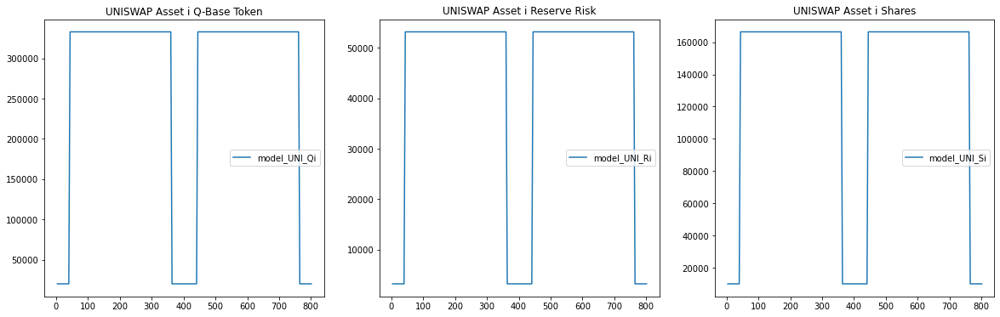

In [102]:
plt.figure(figsize=(20,6))
ax = plt.subplot(131)
model_history.astype(float).plot(ax=ax, y=['model_UNI_Qi'])
plt.title('UNISWAP Asset i Q-Base Token')

ax = plt.subplot(132)
model_history.astype(float).plot(ax=ax, y=['model_UNI_Ri'])
plt.title('UNISWAP Asset i Reserve Risk')

ax = plt.subplot(133)
model_history.astype(float).plot(ax=ax, y=['model_UNI_Si'])
plt.title('UNISWAP Asset i Shares')
plt.show()

### Prices of the i-th asset

The following command line creates a plot of the prices: (for the i-th asset)
- the swap price of the risk asset 
- the pool ratio price of the risk asset

Comparison of both plots shows the effects of fees.

For experiments where the price of the asset is affected - for example when it is traded - we expect this price either to rise or fall accordingly. For liquidity adds this price should remain unchanged.

To show other assets the suffix of these commands can be replaced by f.e. `Qj` instead of `Qi`

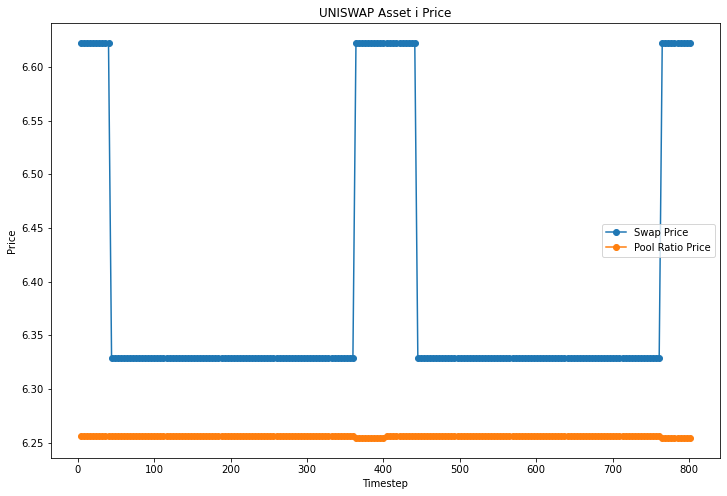

In [39]:
price_plot(rdf,'UNISWAP Asset i Price', 'UNI_P_RQi', 'UNI_Ri', 'UNI_Qi')

## j - Q instance
### Quantities of j-th risk asset, the Q asset and the j-asset shares


The following command lines create three plots that show: (for the j-th asset)
- on the left: the quantity of base asset `UNI_Qj` 
- center: the quantity of risk asset `UNI_Rj`
- on the right: the quantity of shares `UNI_Sj`

over the simulation steps

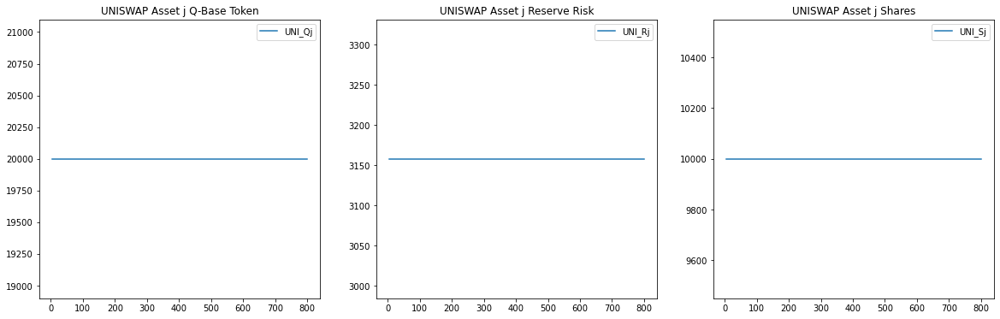

In [40]:
plt.figure(figsize=(20,6))
ax = plt.subplot(131)
uniswap_j.astype(float).plot(ax=ax, y=['UNI_Qj'])
plt.title('UNISWAP Asset j Q-Base Token')

ax = plt.subplot(132)
uniswap_j.astype(float).plot(ax=ax, y=['UNI_Rj'])
plt.title('UNISWAP Asset j Reserve Risk')

ax = plt.subplot(133)
uniswap_j.astype(float).plot(ax=ax, y=['UNI_Sj'])
plt.title('UNISWAP Asset j Shares')
plt.show()

### Prices of the j-th asset

The following command line creates a plot of the prices: (for the j-th asset)
- the swap price of the risk asset 
- the pool ratio price of the risk asset

Comparison of both plots shows the effects of fees.

For experiments where the price of the asset is affected - for example when it is traded - we expect this price either to rise or fall accordingly. For liquidity adds this price should remain unchanged.

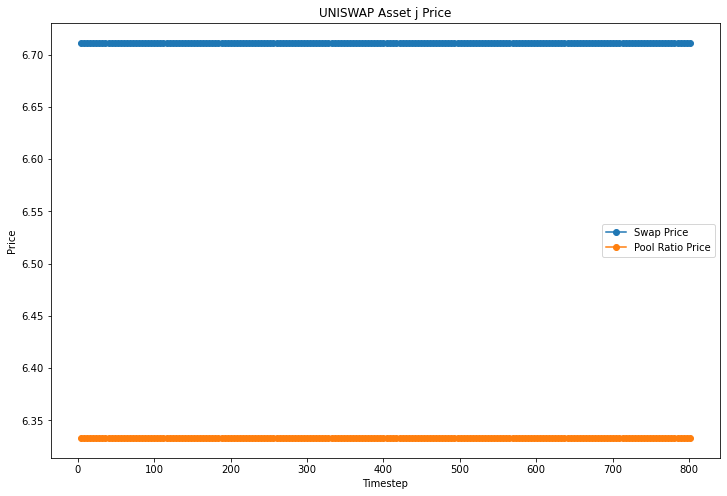

In [42]:
price_plot(rdf,'UNISWAP Asset j Price', 'UNI_P_RQj', 'UNI_Rj', 'UNI_Qj')

## i-j instance
### Quantities of i-th risk asset, the j-th risk asset and the i-j-asset shares


The following command lines create three plots that show: (for the j-th asset)
- on the left: the quantity of the i-th asset `UNI_ij` 
- center: the quantity of the j-th asset `UNI_ji`
- on the right: the quantity of i-j-shares `UNI_Sij`

over the simulation steps

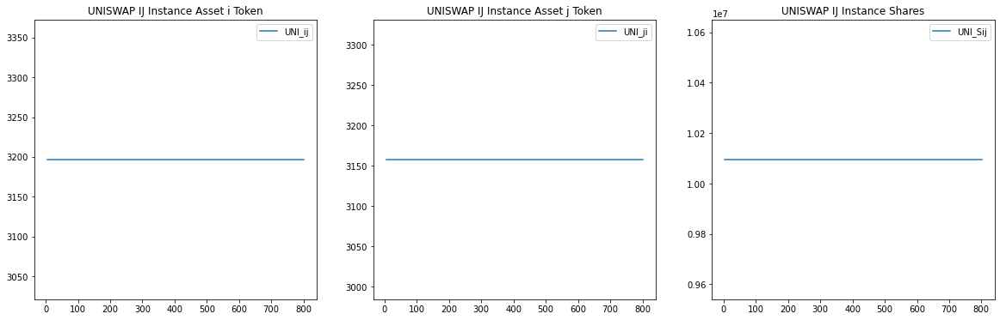

In [43]:
plt.figure(figsize=(20,6))
ax = plt.subplot(131)
uniswap_ij.astype(float).plot(ax=ax, y=['UNI_ij'])
plt.title('UNISWAP IJ Instance Asset i Token')

ax = plt.subplot(132)
uniswap_ij.astype(float).plot(ax=ax, y=['UNI_ji'])
plt.title('UNISWAP IJ Instance Asset j Token')

ax = plt.subplot(133)
uniswap_ij.astype(float).plot(ax=ax, y=['UNI_Sij'])
plt.title('UNISWAP IJ Instance Shares')
plt.show()

### Prices of the i-j asset swap

The following command line creates a plot of the swap prices
- the swap price of the risk asset 
- the pool ratio price of the risk asset

Comparison of both plots shows the effects of fees.

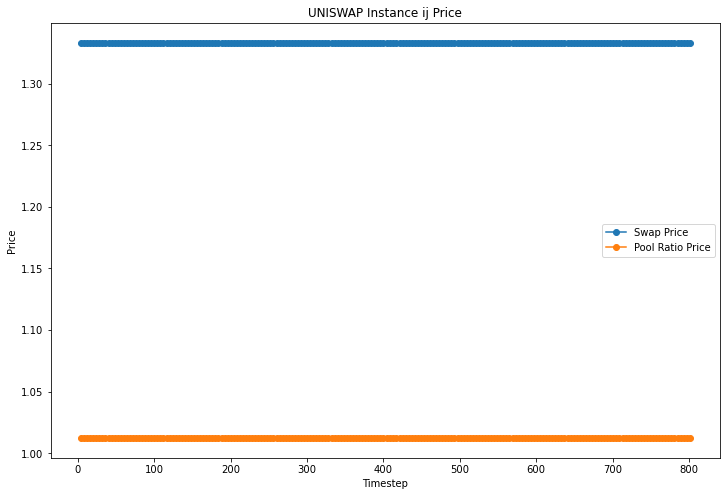

In [44]:
price_plot(rdf,'UNISWAP Instance ij Price', 'UNI_P_ij', 'UNI_ji','UNI_ij' )


## Global State Variables for Hydra instance

The Hydra system state can be described with the following global variables:

| Symbol | Name | Definition  | Domain |  | Unit | | 
| --------|------- | -------- | -------- | -------- | -------- |-------|
| $H$     | HDX Total Supply     | Supply is the total quantity of the native protocol token (HDX).|  ${\mathbb{R}_{++}}$| | HDX; an amount in real positive numbers
| $Q$     | Base Pool Liquidity     | Base Pool Liquidity is the total quantity of the base asset (HDX) inside Pool.|  ${\mathbb{R}_{+}}$| | HDX; a positive real number if a pool has at least one risk asset
| $\mathbf{\vec{R}}$ | Reserve Risk Assets     | An $n$-dimensional vector whose components are quantities of risk assets provided to the Liquidity Pool by liquidity providers.      |  $\mathbb{R}_{++}^{n}$ | | BTC, ETH, DOT,...; a vector of real positive numbers denoting quantities of each asset in the pool.
| $\mathbf{\vec{S}}$     | Asset Shares     | Asset Shares are non-normalized values of each risk asset in the pool which are minted and distributed to the liquidity providers at time of inception of their asset into the Liquidity Pool. |  $\mathbb{R}_{++}^{n}$ | | a vector of real positive numbers
| $S^Q$     | Base Pool Share     | The Pool value share of the base asset (HDX), i.e. claims on $Q$.|  $\mathbb{R}_{+}$ | | HDX; a real positive number if there exists at least one risk asset in the pool
| $\mathbf{\vec{W}}$     | Asset Weights     | Asset Weights are non-normalized values of each risk asset in the pool used in the Uniswap/Balancer mechanisms. |  $\mathbb{R}_{++}^{n}$ | | a vector of real positive numbers
| $W^Q$     | Base Pool Weight     | The non-normalized Pool value weight of the base asset (HDX).|  $\mathbb{R}_{+}$ | | a real positive number
| $\mathbf{{P}}$     | Price    | The Price is a (n+1)x(n+1) Matrix listing all spot prices for all risk assets present in the Liquidity pool. Its components $p_{i,j}$ are the prices of the i-th asset denoted in the j-th asset.| $\mathbb{R}_{++}^{n\times n}$ | | f.e: ETH/HDX; depending on the component $p_{ij}$ of the matrix the unit is currency$_i$ / currency$_j$ where for the above example $i$ is ETH and $j$ is HDX. |
| $\vec{p}^Q$     | Asset Base Price    | The Asset Base Price is a vector listing the spot prices of all risk assets in the pool in terms of the base asset HDX. | $\mathbb{R}^n_{++}$ | | A real number representing the rate of exchange between a risk asset and HDX, e.g. ETH/HDX. |


Notice that $H$, $Q$ and $S^Q$ represent the Base side of the Omnipool and are tracked separately in the Hydra World whereas the other variables representing the Risk side of the Omnipool are encoded in $\mathbf{\vec{R}}$ , $\mathbf{\vec{S}}$  are tracked by the `pool` variable

## Hydra World
### Base Asset side of the Omnipool
### Quantities of the base asset in the pool and in the system, and the base-shares

The following command lines create three plots that show: (for the base asset)
- on the left: the quantity of base asset in the pool `Hydra_Q` 
- center: the total quantity of base asset in the system `Hydra_H` 
- on the right: the quantity of base asset shares `Hydra_Sq`

over the simulation steps

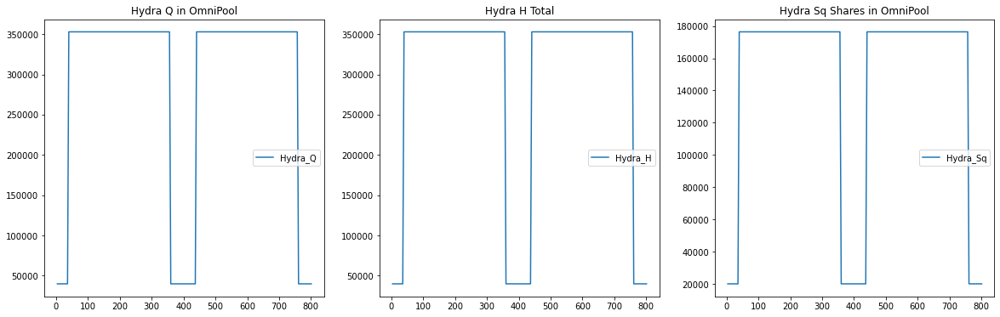

In [45]:
plt.figure(figsize=(20,6))
ax = plt.subplot(131)
hydra.astype(float).plot(ax=ax, y=['Hydra_Q'])
plt.title('Hydra Q in OmniPool')

ax = plt.subplot(132) 
hydra.astype(float).plot(ax=ax, y=['Hydra_H'])
plt.title('Hydra H Total')

ax = plt.subplot(133)
hydra.astype(float).plot(ax=ax, y=['Hydra_Sq'])
plt.title('Hydra Sq Shares in OmniPool')
plt.show()

## Hydra World
### Risk Asset side of the Omnipool
### Quantities of the i-th risk asset, i-Shares and the price for i

The following command line creates three plots for the Hydra Omnipool (for the i-th asset on the risk side)

- the asset index can be set individually to `i`, `j`, etc.


In [46]:
hydra_pool_plot(rdf,'Asset i Reserve and Shares', rdf.last_valid_index(),str('i'))

KeyError: 404

### Quantities of the j-th risk asset, j-Shares and the price for j

The following command line creates three plots for the Hydra Omnipool 

- the asset index can be set individually to `i`, `j`, etc.


In [47]:
hydra_pool_plot(rdf,'Asset j Reserve and Shares', rdf.last_valid_index(),str('j'))

KeyError: 404

### Quantities of the k-th risk asset, k-Shares and the price for k

The following command line creates three plots for the Hydra Omnipool 

- the asset index can be set individually to `i`, `j`, etc.

In [ ]:
hydra_pool_plot(rdf,'Asset k Reserve and Shares', rdf.last_valid_index(),str('k'))

### Price comparison for assets on the risk side of the Omnipool

The following command lines create a plots for the Hydra Omnipool prices:
- Asset Base Prices
- Share to Reserve Ratio Base Prices
- Relative Asset Prices `i` to `j`
- Relative Asset Prices `i` to `k`
- Relative Asset Prices `j` to `k`

    

In [48]:
hydra_pool_price_plot(rdf,'Asset Base Price', rdf.last_valid_index(),['i', 'j','k'])

KeyError: 404

In [ ]:
trade_liq_plot(rdf,'Share to Reserve Ratio Base Price', rdf.last_valid_index(),['i', 'j','k'])

In [ ]:
rel_price_plot(rdf,'Relative Asset Prices', rdf.last_valid_index(),['i', 'j'])

In [ ]:
rel_price_plot(rdf,'Relative Asset Prices', rdf.last_valid_index(),['i', 'k'])

In [ ]:
rel_price_plot(rdf,'Relative Asset Prices', rdf.last_valid_index(),['j', 'k'])


# Agents and their Local State Variables

The following section tracks the development for the agent states.
As every agent is defined to be responsible for a different action and all agent states are shown this section can be used to assess 
- the intentional changes in the local states directly affected by the actions, and
- the unintentional changes in local states of other agents who are indirectly affected

All agents carry the following local states:

| Symbol | Name | Definition  | Domain |   | Unit
| -------- | -------- | -------- | -------- | -------- | --------|
| $\mathbf{r}^j$     | Reserve Assets     | Reserve Assets are quantities of privately held risk assets by liquidity provider agent $j$ which are not (yet) related to the Liquidity Pool. |  $\mathbb{R}_{+}^{n}$| | BTC, ETH, DOT,...; an amount in real non-negative numbers denoted in the respective currency unit
| $h^j$     | Base Asset     | Total Base Asset (HDX) amount of $H$ held by agent $j$. |  $\mathbb{R}_{+}$| | a real non-negative amount of HDX |
| $\mathbf{s}^j$     | Risk Asset Shares     | Risk Asset Share as value of liquidity provider agent $j$'s contribution of risk asset(s) to the Liquidity Pool, minted and distributed (as a claim) to agent $j$ at the time of introduction into the Pool.| $\mathbb{R}_{+}^{n}$  | |a vector of amounts in real non-negative numbers
| $s^{qj}$     | Base Asset Share     | Base Asset (HDX) share as value of liquidity provider agent $j$'s contribution of HDX to the Liquidity Pool,  minted and distributed to agent $j$ (as a claim) at the time of introduction into the Pool.| $\mathbb{R}_{+}$  | |a real non-negative number

To locate specific values in the dataframe the commands
- `first_valid_index()`
- `first_valid_index()*x`
- `last_valid_index()`

can be used.


## Hydra World

Results for the copy of the agents going through the Hydra world are saved in `hydra_agents`


In [50]:
rdf['hydra_agents'][rdf.first_valid_index()]

,m,r_i_out,r_i_in,h,q_i,s_i,s_q,r_j_out,r_j_in,q_j,s_j
0,0,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
1,1,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
2,2,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
3,3,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
4,4,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
5,5,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
6,6,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
7,7,100000,110000,140000,170000,150000,0,120000,130000,180000,160000


In [51]:
rdf['hydra_agents'][rdf.first_valid_index()*10]

,m,r_i_out,r_i_in,h,q_i,s_i,s_q,r_j_out,r_j_in,q_j,s_j
0,0,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
1,1,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
2,2,50000,160000,140000,170000,306396,0,120000,130000,180000,160000
3,3,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
4,4,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
5,5,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
6,6,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
7,7,100000,110000,140000,170000,150000,0,120000,130000,180000,160000


## Uniswap world

Results for the copy of the agents going through the Hydra world are saved in `uni_agents`

In [52]:
rdf['uni_agents'][rdf.first_valid_index()]

,m,r_i_out,r_i_in,h,q_i,s_i,s_q,r_j_out,r_j_in,q_j,s_j
0,0,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
1,1,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
2,2,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
3,3,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
4,4,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
5,5,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
6,6,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
7,7,100000,110000,140000,170000,150000,0,120000,130000,180000,160000


In [53]:
rdf['uni_agents'][rdf.first_valid_index()*10]

,m,r_i_out,r_i_in,h,q_i,s_i,s_q,r_j_out,r_j_in,q_j,s_j
0,0,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
1,1,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
2,2,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
3,3,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
4,4,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
5,5,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
6,6,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
7,7,100000,110000,140000,170000,150000,0,120000,130000,180000,160000


In [54]:
rdf['uni_agents'][rdf.first_valid_index()*12]

,m,r_i_out,r_i_in,h,q_i,s_i,s_q,r_j_out,r_j_in,q_j,s_j
0,0,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
1,1,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
2,2,50000,160000,-172793,482793,306396,0,120000,130000,180000,160000
3,3,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
4,4,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
5,5,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
6,6,100000,110000,140000,170000,150000,0,120000,130000,180000,160000
7,7,100000,110000,140000,170000,150000,0,120000,130000,180000,160000


In [55]:
rdf['uni_agents'][rdf.first_valid_index()*12].iloc[2]

m               2
r_i_out     50000
r_i_in     160000
h         -172793
q_i        482793
s_i        306396
s_q             0
r_j_out    120000
r_j_in     130000
q_j        180000
s_j        160000
Name: 2, dtype: int64

## Agent Token Holdings - Uniswap World


The following command line creates eight plots, one for each agent individually, showing his token holdings 


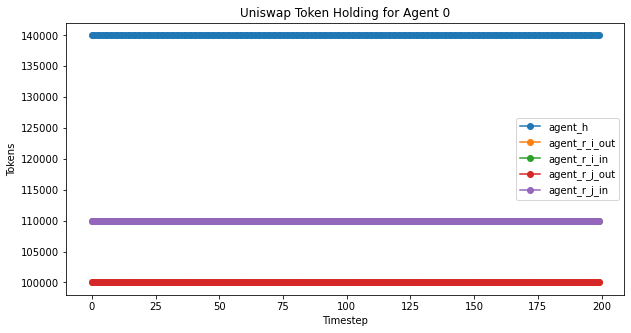

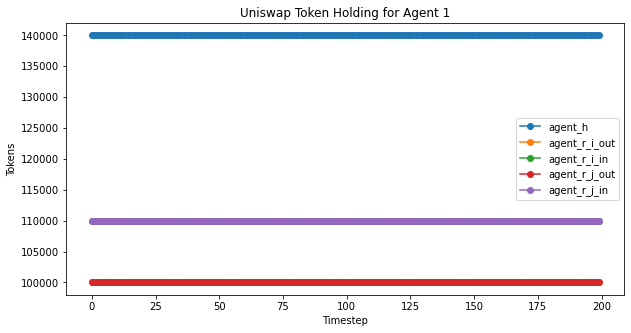

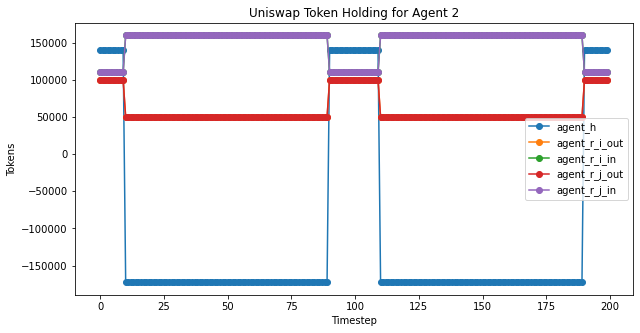

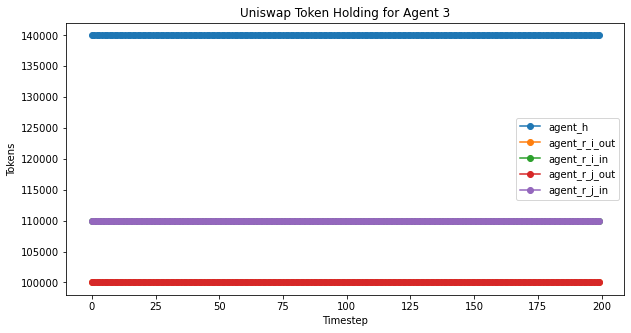

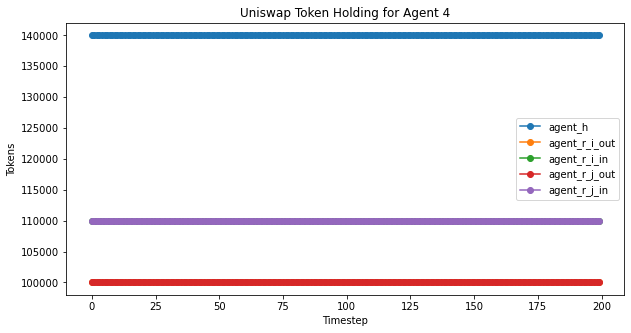

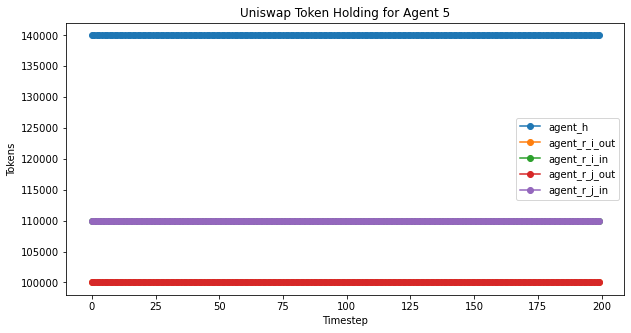

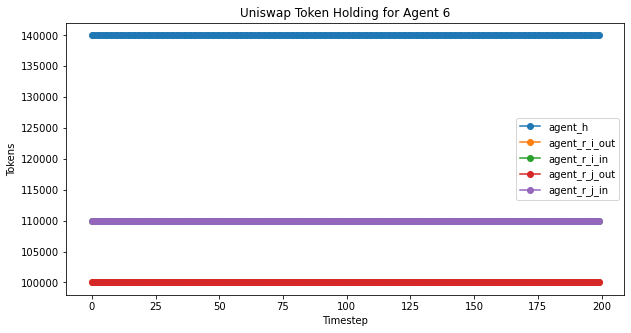

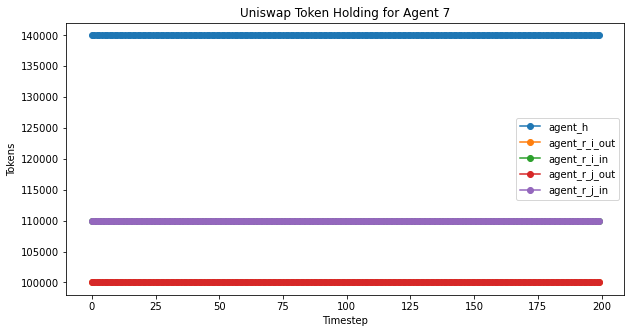

In [57]:
agent_plot(rdf,'Uniswap Token Holding for Agent ', len(rdf['timestep'])) #,4,'j')

## Agent Values - Uniswap World

The following command line creates eight plots, one for each agents showing his values. These are the token holdings multiplied by price.
  



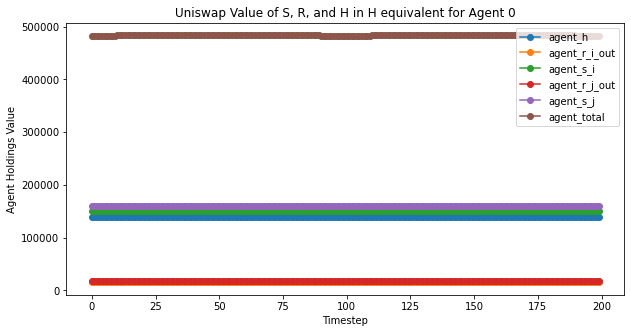

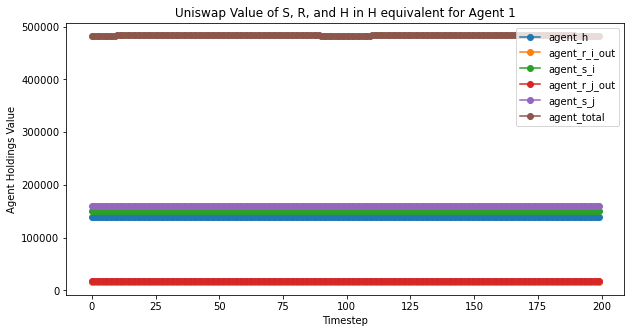

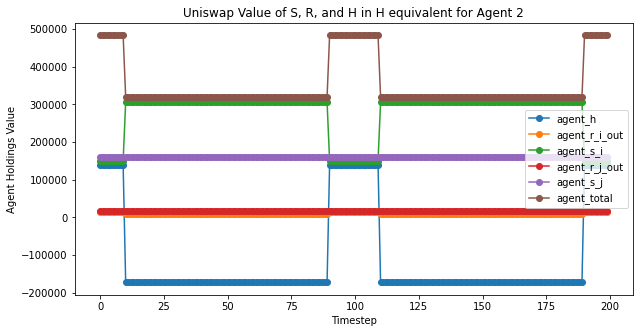

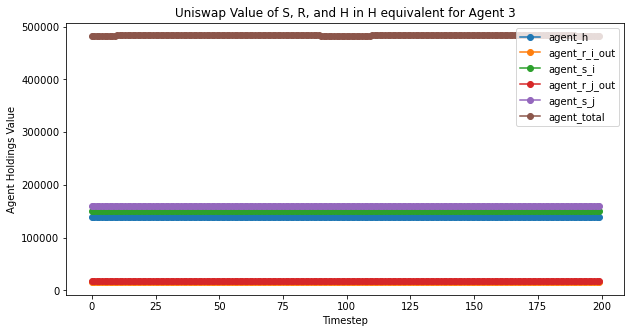

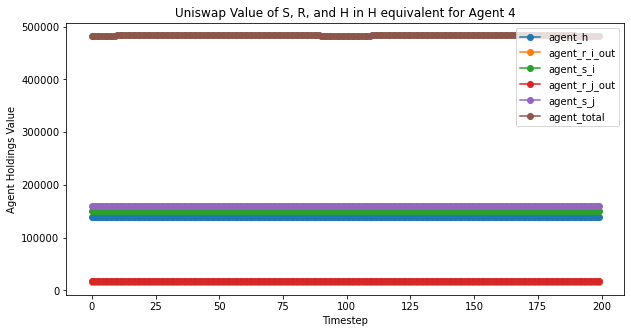

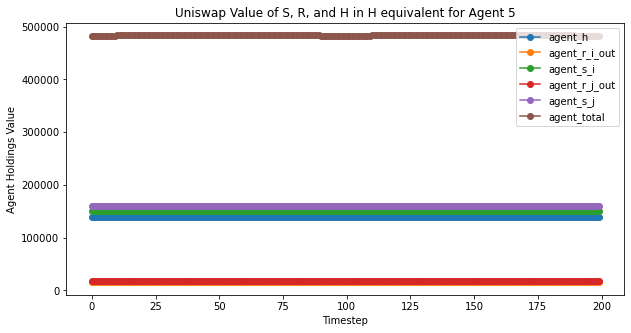

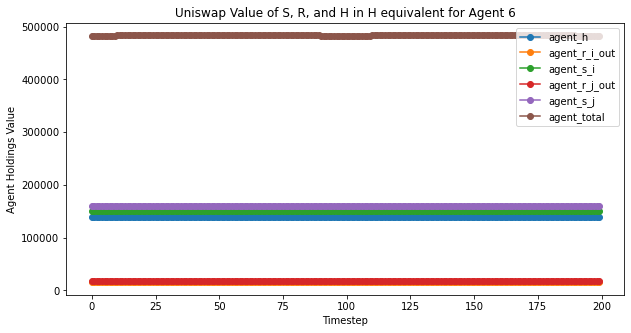

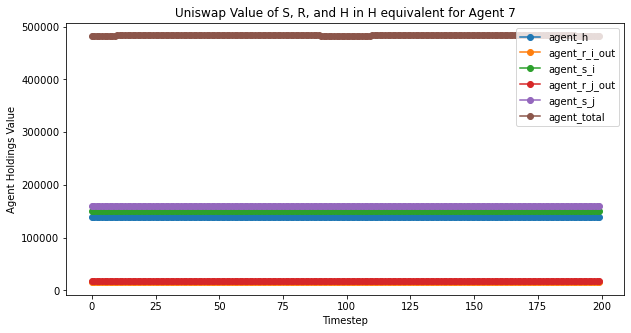

In [58]:
agent_value_plot(rdf,'Uniswap Value of S, R, and H in H equivalent', len(rdf['timestep'])) #,2, 'i')

## Agent Token Holdings - Hydra World

The following command line creates eight plots, one for each agents indivudially, showing his token holdings


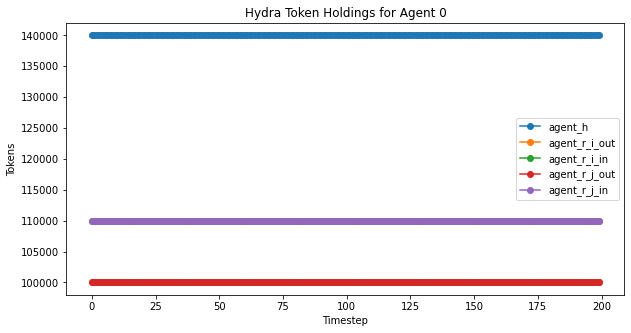

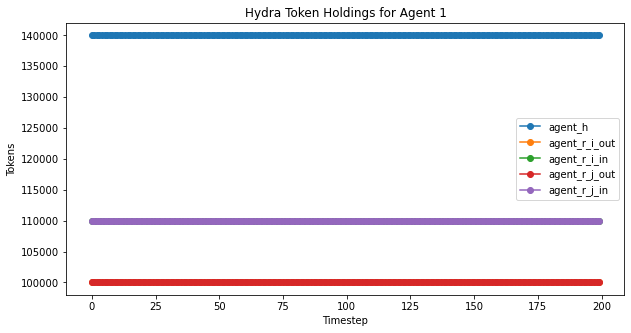

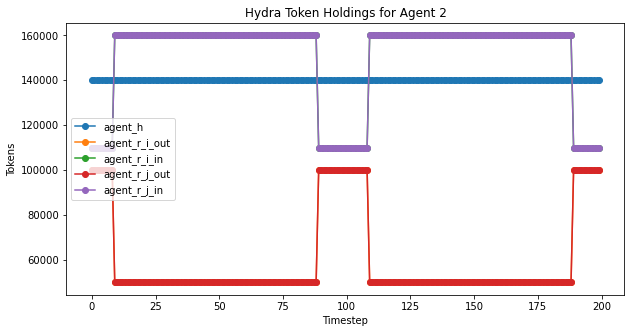

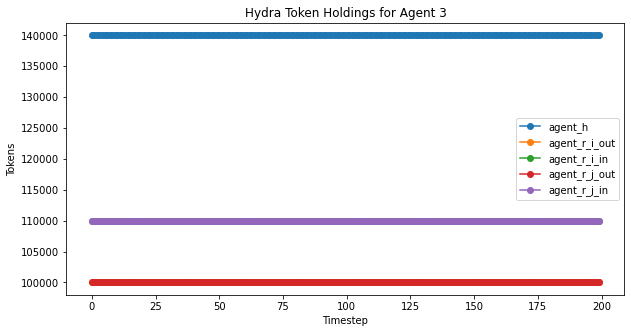

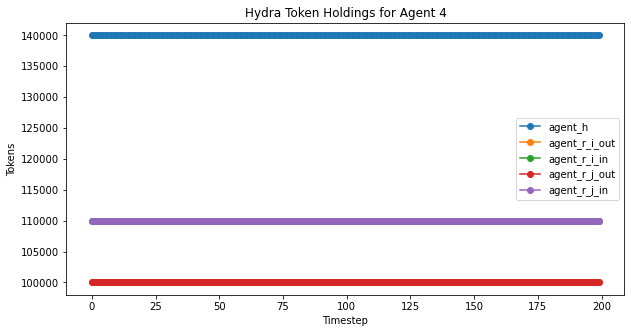

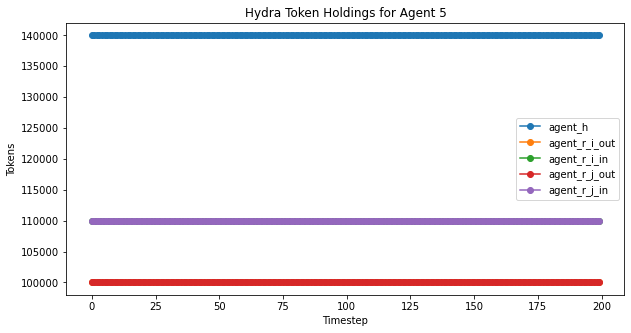

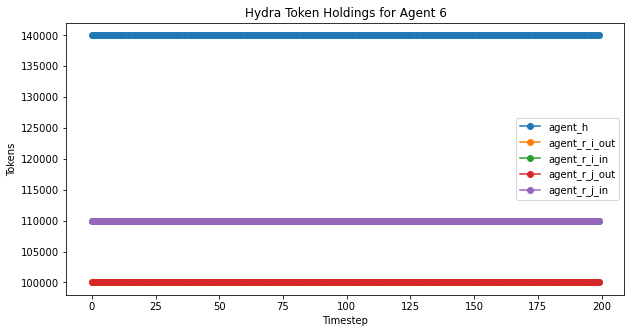

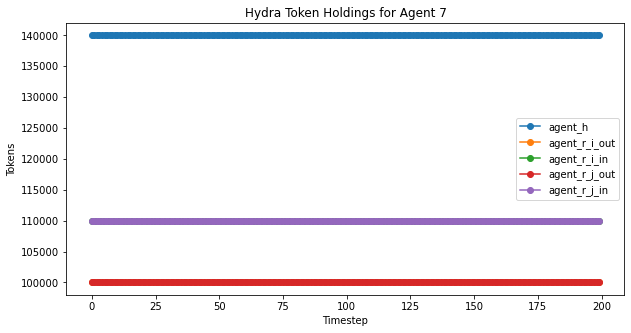

In [59]:
hydra_agent_plot(rdf,'Hydra Token Holdings for Agent ', len(rdf['timestep']))

## Agent Values - Hydra World

The following command line creates eight plots, one for each agents showing his values. These are the token holdings multiplied by price.


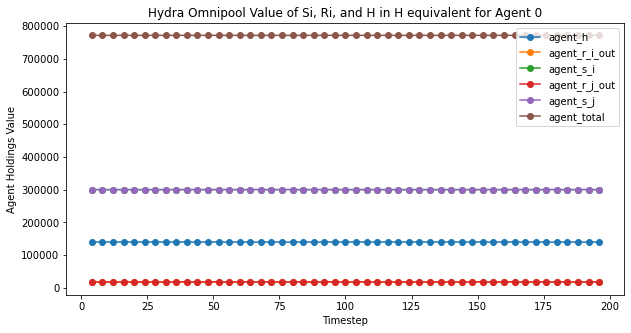

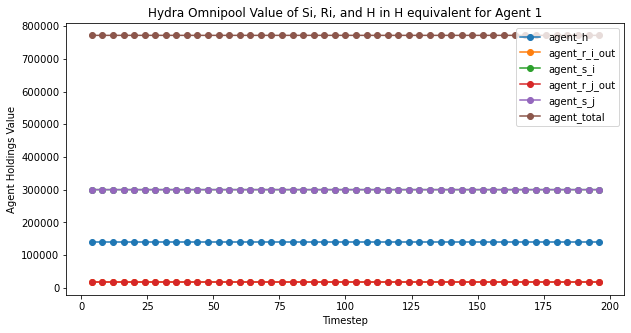

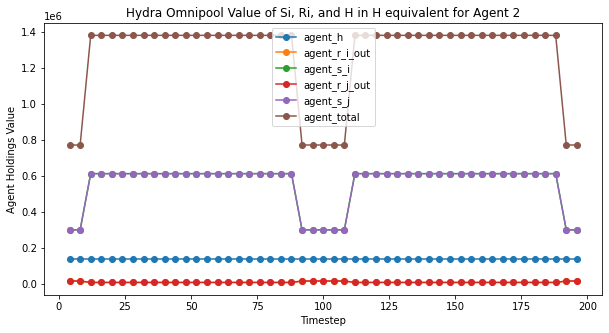

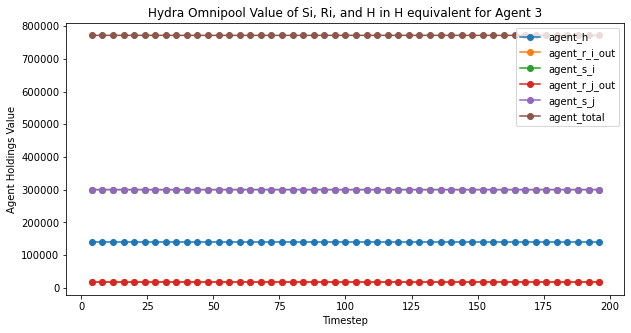

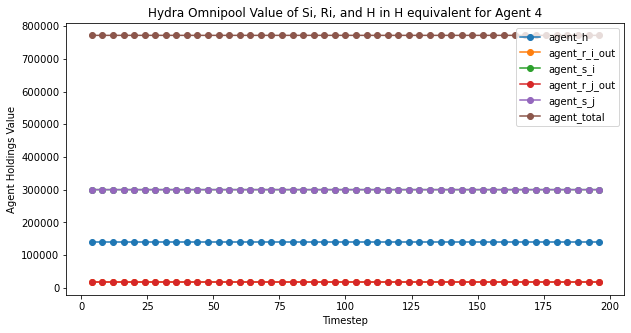

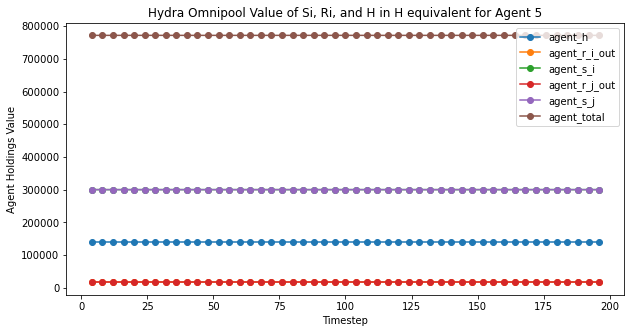

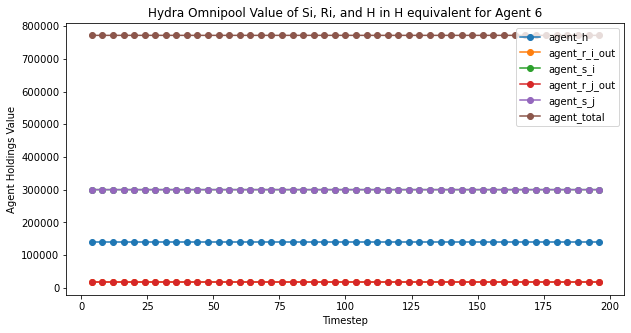

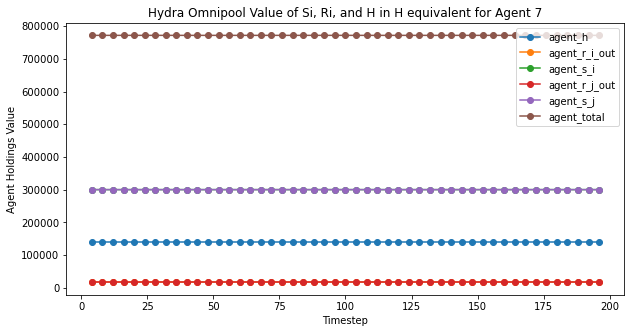

In [60]:
hydra_agent_value_plot(rdf,'Hydra Omnipool Value of Si, Ri, and H in H equivalent', len(rdf['timestep'])) #,2, 'i')

### Impermanent Loss (IL) calculation

Impermanent loss is defined as 

$$
IL = \frac{\delta Pool Value}{\delta Hold Value} - 1
$$


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


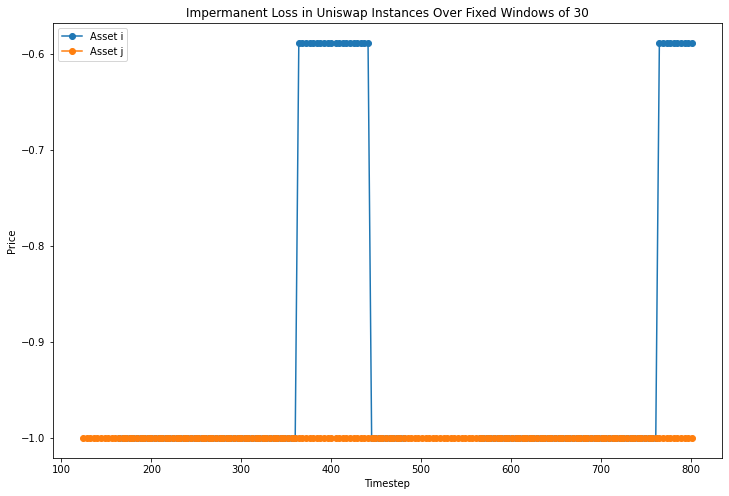

In [61]:
IL_plot(rdf,'Impermanent Loss in Uniswap Instances Over Fixed Windows of ', 30)

## Metric calculations: slippage and impermanent loss

### Slippage

Slippage is calculated in two different, but related ways: the first is as an elasticity, by measuring the percentage change in the price following a trade with respect to the trade size as a percentage of the pool reserve. The second is as the percentage difference between the effective (actual trade) price and the spot price, which measures trader expectations on the execution price.

In [62]:
slippage = {} # dictionary for containing slippage results for both Hydra and Uniswap
elasticity = {} # dictionary for containing elasticity results for both Hydra and Uniswap

### Hydra Calculations

In [63]:
# Assign ids for risk assets IN and OUT for Hydra
asset_in_id = 'i'
asset_out_id = 'j'

# Extract time series - clunky, refactor into comprehensions for performance
reserve_asset_in_dict = {}
reserve_asset_out_dict = {}
asset_price_in_dict = {}  # Note: in terms of HDX as numeraire
asset_price_out_dict = {} # Note: in terms of HDX as numeraire
asset_weight_in_dict = {}
asset_weight_out_dict = {}
for t in rdf.pool.keys():
    reserve_asset_in_dict[t] = rdf.pool[t].pool[asset_in_id]['R']
    reserve_asset_out_dict[t] = rdf.pool[t].pool[asset_out_id]['R']
    asset_price_in_dict[t] = rdf.pool[t].pool[asset_in_id]['P']
    asset_price_out_dict[t] = rdf.pool[t].pool[asset_out_id]['P']
    asset_weight_in_dict[t] = rdf.pool[t].pool[asset_in_id]['W']
    asset_weight_out_dict[t] = rdf.pool[t].pool[asset_out_id]['W']
reserve_asset_in = pd.Series(reserve_asset_in_dict)
reserve_asset_out = pd.Series(reserve_asset_out_dict)
asset_price_in = pd.Series(asset_price_in_dict)
asset_price_out = pd.Series(asset_price_out_dict)
asset_weight_in = pd.Series(asset_weight_in_dict)
asset_weight_out = pd.Series(asset_weight_out_dict)

# Compute percent change in reserve
reserve_in_pct_change = reserve_asset_in.pct_change()
reserve_out_pct_change = reserve_asset_out.pct_change()

# Compute price of OUT asset in terms of IN asset
price_out_for_in = asset_price_in / asset_price_out

# Compute percent change in price (OUT per IN)
price_pct_change = price_out_for_in.pct_change()

# Slippage calculation #1: elasticity of price with respect to transactions size
elasticity['Hydra'] = price_pct_change / reserve_in_pct_change

# Slippage calculation #2: percentage difference between effective and spot price
slippage['Hydra'] = ( (reserve_in_pct_change / reserve_asset_in) / (reserve_out_pct_change / reserve_asset_out)
 * (asset_weight_in / asset_weight_out) - 1 )


#### Slippage Plots

Text(0.5, 1.0, 'Price Elasticity of Transactions, Hydra')

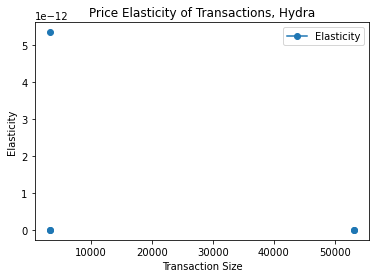

In [64]:
# Plot elasticity as a function of transactions size
plt.plot(reserve_asset_in,elasticity['Hydra'],label='Elasticity', marker='o')
plt.xlabel('Transaction Size')
plt.ylabel('Elasticity')
plt.legend()
plt.title('Price Elasticity of Transactions, Hydra')

Text(0.5, 1.0, 'Slippage By Transaction Size, Hydra')

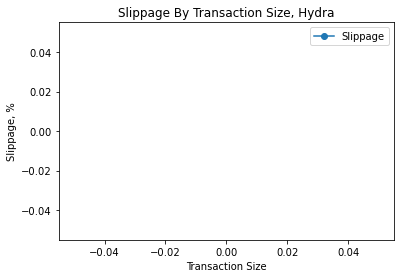

In [65]:
# Plot analytical slippage as a function of transactions size
plt.plot(reserve_asset_in,slippage['Hydra'],label='Slippage', marker='o')
plt.xlabel('Transaction Size')
plt.ylabel('Slippage, %')
plt.legend()
plt.title('Slippage By Transaction Size, Hydra')

### Uniswap Calculations

In [66]:
# Assign ids for risk assets IN and OUT for Uniswap
asset_in_id = 'UNI_Ri'
asset_out_id = 'UNI_Rj'
asset_price_in = 'UNI_P_RQi' # Note: in terms of HDX as numeraire
asset_price_out = 'UNI_P_RQj' # Note: in terms of HDX as numeraire

reserve_asset_in = rdf[asset_in_id]
reserve_asset_out = rdf[asset_out_id]
asset_price_in = rdf[asset_price_in]
asset_price_out = rdf[asset_price_out]

# Compute percent change in reserve
reserve_in_pct_change = reserve_asset_in.pct_change()
reserve_out_pct_change = reserve_asset_out.pct_change()

# Compute price of OUT asset in terms of IN asset
price_out_for_in = asset_price_in / asset_price_out

# Compute percent change in price (OUT per IN)
price_pct_change = price_out_for_in.pct_change()

# Slippage calculation #1: elasticity of price with respect to transactions size
elasticity['UNI'] = price_pct_change / reserve_in_pct_change

# Slippage calculation #2: percentage difference between effective and spot price
slippage['UNI'] = ( (reserve_in_pct_change / reserve_asset_in) / (reserve_out_pct_change / reserve_asset_out) - 1 )


#### Slippage Plots

In [67]:
print(reserve_asset_in)

4      3197
8      3197
12     3197
16     3197
20     3197
       ... 
785    3198
789    3198
793    3198
797    3198
801    3198
Name: UNI_Ri, Length: 200, dtype: int64


Text(0.5, 1.0, 'Price Elasticity of Transactions, Uniswap')

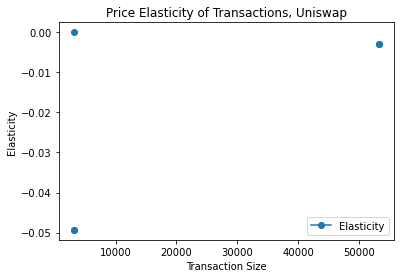

In [68]:
# Plot elasticity as a function of transactions size
plt.plot(reserve_asset_in,elasticity['UNI'],label='Elasticity', marker='o')
plt.xlabel('Transaction Size')
plt.ylabel('Elasticity')
plt.legend()
plt.title('Price Elasticity of Transactions, Uniswap')

Text(0.5, 1.0, 'Slippage By Transaction Size, Uniswap')

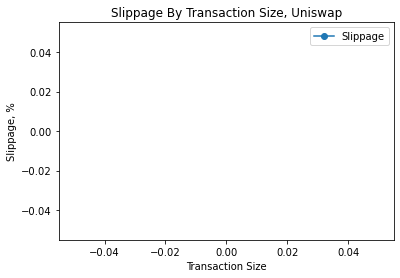

In [69]:
# Plot analytical slippage as a function of transactions size
plt.plot(reserve_asset_in,slippage['UNI'],label='Slippage', marker='o')
plt.xlabel('Transaction Size')
plt.ylabel('Slippage, %')
plt.legend()
plt.title('Slippage By Transaction Size, Uniswap')

### Impermanent Loss

Impermanent Loss (IL) is computed as a final value for a liqudity provider (LP) providing a single asset to the OMNIPool. 

This does not compute the 'running IL', which requires computing the amount of liquidity that would have been removed at each time period using the shares given to the LP when they added liquidity. This can still be post-processed but will require calls to the correct remove liquidity functions in the code, or re-writing the same code into the notebook.

In [70]:
IL = {} # Dictionary for containing IL time series for Hydra and Uniswap

### Hydra Calculations

In [71]:
# Set id of agent (LP) to be assessed for IL
agent_id = 2

# Set ids for asset that the LP has added
asset_id = 'i'
agent_asset_id = 'r_i_out'
share_id = 's_i'

# Set substep size
substep = 4

# Set amount added by LP during addLiquidity event 
# (usually set as an initial condition of the simulation)
liquidity_added = 50000

# Set timestamp of addLiquidity event for LP
time_liquidity_in = 10 # Note: this is different for Uniswap agent than Hydra agent LP!

# Set timestamp of removeLiquidity event for LP
time_liquidity_out = 90

# Get share awarded to LP from addLiquidity event
share_rewarded = ( rdf['hydra_agents'][time_liquidity_in * substep].iloc[agent_id][share_id] - 
                     rdf['hydra_agents'][(time_liquidity_in - 1) * substep].iloc[agent_id][share_id] )

# Compute impermanent loss over entire time series
Ri_over_Wi = []
Price = []
# Build loop computing IL for every timestep
for t in rdf['hydra_agents'].keys():
    if t <= time_liquidity_out * substep:
        Ri_over_Wi.append(rdf.pool[t].pool[asset_id]['R'] / rdf.pool[t].pool[asset_id]['W'])
        Price.append(rdf.pool[t].pool[asset_id]['P'])
Price = pd.Series(Price)
Ri_over_Wi = pd.Series(Ri_over_Wi)
Wq_over_Sq = rdf['Wq'][:time_liquidity_out] / rdf['Sq'][:time_liquidity_out]
liquidity_removed = Wq_over_Sq.reset_index(drop=True) * Ri_over_Wi.reset_index(drop = True) * share_rewarded
hold_value = liquidity_added * Price
pool_value = liquidity_removed * Price
IL['UNI'] = (pool_value / hold_value) - 1
print(IL['UNI'])

0    -0.00
1    -0.00
2    -0.00
3    -0.00
4    -0.00
      ... 
85   -0.00
86   -0.00
87   -0.00
88   -0.00
89   -0.00
Length: 90, dtype: float64


### Uniswap Calculations

In [72]:
# Set id of agent (LP) to be assessed for IL
agent_id = 2

# Set ids for asset that the LP has added
asset_id = 'i'
agent_asset_id = 'r_i_out'
share_id = 's_i'

# Set substep size
substep = 4

# Set amount added by LP during addLiquidity event 
# (usually set as an initial condition of the simulation)
liquidity_added = 50000

# Set timestamp of addLiquidity event for LP
time_liquidity_in = 11 # Note: this is different for Uniswap agent than Hydra agent LP!

# Set timestamp of removeLiquidity event for LP
time_liquidity_out = 90

# Get share awarded to LP from addLiquidity event
share_rewarded = ( rdf['uni_agents'][time_liquidity_in * substep].iloc[agent_id][share_id] - 
                     rdf['uni_agents'][(time_liquidity_in - 1) * substep].iloc[agent_id][share_id] )

# Compute impermanent loss over entire time series

liquidity_removed = (rdf['UNI_Ri'][:time_liquidity_out] / rdf['UNI_Si'][:time_liquidity_out]) * share_rewarded
pool_value = liquidity_removed * rdf['UNI_P_RQi'][:time_liquidity_out] 
hold_value = liquidity_added * rdf['UNI_P_RQi'][:time_liquidity_out] 
IL['Hydra'] = (pool_value / hold_value) - 1
print(IL['Hydra'])

4     -0.00
8     -0.00
12    -0.00
16    -0.00
20    -0.00
       ... 
344   -0.00
348   -0.00
352   -0.00
356   -0.00
360   -0.00
Length: 90, dtype: float64


In [73]:
import math
mu_i_set = 100
sigma_i_set = 5
mu_j_set = 200
sigma_j_set = 10

############ CHOOSE STARTING LIQ TYPE #############################
    
if 'exo_starting_liquidity' == 'stochastic':
    sigma_i = sigma_i_set
    mu_i = mu_i_set
    sigma_j = sigma_j_set
    mu_j = mu_j_set
else:
    sigma_i = 0
    mu_i = mu_i_set
    sigma_j = 0
    mu_j = mu_j_set
            
############ CHOOSE STARTING LIQ TYPE #############################

R_i_start = np.random.normal(mu_i, sigma_i)
R_j_start = np.random.normal(mu_j, sigma_j)

asset_initial_values = {
    'i' : 
        {'R': 1000000,
        'Q': 2000000,
        # 'S': 100000000 * 200000000},
        'S': 10000},

    'j' : 
        {'R': 1000000,
        'Q': 2000000,
        # 'S': 100000000 * 200000000},
        'S': 10000},
}

asset_initial_values['i']['R'] = math.ceil(R_i_start)
asset_initial_values['j']['R'] = math.ceil(R_j_start)

initial_values = {
    'UNI_Qi': asset_initial_values['i']['Q'],
    'UNI_Ri': asset_initial_values['i']['R'],
    'UNI_Si': asset_initial_values['i']['S'],
    'UNI_Qj': asset_initial_values['j']['Q'],
    'UNI_Rj': asset_initial_values['j']['R'],
    'UNI_Sj': asset_initial_values['j']['S'],
    'UNI_ij': asset_initial_values['i']['R'],
    'UNI_ji': asset_initial_values['j']['R'],
    'UNI_Sij': asset_initial_values['j']['R']*asset_initial_values['i']['R'],
    'Ri': asset_initial_values['i']['R'],
    # 'Si': 5*asset_initial_values['i']['R'],
    'Si': asset_initial_values['i']['S'],
    'Rj': asset_initial_values['j']['R'],
    # 'Sj': 5*asset_initial_values['j']['R'],
    'Sj': asset_initial_values['j']['S'],
    'Sq': asset_initial_values['i']['S'] + asset_initial_values['j']['S'],
    # 'Sq': 5*Q,
    'Q':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
    'H':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
}

initial_values['UNI_Ri']

100

In [74]:
import math
import numpy as np

exo_starting_liquidity = 'stochastic'

mu_i_set = 100
sigma_i_set = 5
mu_j_set = 200
sigma_j_set = 10

############ CHOOSE STARTING LIQ TYPE #############################
    
if exo_starting_liquidity == 'stochastic':
    sigma_i = sigma_i_set
    mu_i = mu_i_set
    sigma_j = sigma_j_set
    mu_j = mu_j_set
else:
    sigma_i = 0
    mu_i = mu_i_set
    sigma_j = 0
    mu_j = mu_j_set
            
############ CHOOSE STARTING LIQ TYPE #############################

R_i_start = np.random.normal(mu_i, sigma_i)
R_j_start = np.random.normal(mu_j, sigma_j)

exo_starting_liquidity, R_i_start, R_j_start, mu_i, sigma_i, sigma_i_set

asset_initial_values = {
    'i' : 
        {'R': 1000000,
        'Q': 2000000,
        # 'S': 100000000 * 200000000},
        'S': 10000},

    'j' : 
        {'R': 1000000,
        'Q': 2000000,
        # 'S': 100000000 * 200000000},
        'S': 10000},
}

asset_initial_values['i']['R'] = math.ceil(R_i_start)
asset_initial_values['j']['R'] = math.ceil(R_j_start)

initial_values = {
    'UNI_Qi': asset_initial_values['i']['Q'],
    'UNI_Ri': asset_initial_values['i']['R'],
    'UNI_Si': asset_initial_values['i']['S'],
    'UNI_Qj': asset_initial_values['j']['Q'],
    'UNI_Rj': asset_initial_values['j']['R'],
    'UNI_Sj': asset_initial_values['j']['S'],
    'UNI_ij': asset_initial_values['i']['R'],
    'UNI_ji': asset_initial_values['j']['R'],
    'UNI_Sij': asset_initial_values['j']['R']*asset_initial_values['i']['R'],
    'Ri': asset_initial_values['i']['R'],
    # 'Si': 5*asset_initial_values['i']['R'],
    'Si': asset_initial_values['i']['S'],
    'Rj': asset_initial_values['j']['R'],
    # 'Sj': 5*asset_initial_values['j']['R'],
    'Sj': asset_initial_values['j']['S'],
    'Sq': asset_initial_values['i']['S'] + asset_initial_values['j']['S'],
    # 'Sq': 5*Q,
    'Q':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
    'H':  asset_initial_values['i']['Q'] + asset_initial_values['j']['Q'],
}

exo_starting_liquidity, R_i_start, R_j_start, mu_i, sigma_i, sigma_i_set, asset_initial_values['i']['R'], asset_initial_values['j']['R'], initial_values['UNI_Ri']

('stochastic', 105.088115831716, 217.18819035437684, 100, 5, 5, 106, 218, 106)

In [75]:
exo_fee_size = [0.00] #in percent
fee_denominator = [1000]
fee_numerator = [0]
fee_numerator[0] = fee_denominator[0] - (exo_fee_size[0] / 100) * fee_denominator[0]
fee_numerator

[1000.0]

In [76]:
exo_trade = ['test_r_for_r'] # agent 1
exo_liq = ['test_add']
ENABLE_SYMMETRIC_LIQ = [True] 
exo_asset = ['alternating']
exo_composite = ['alternating']
Ki = [10**7]
ACTION_LIST = [['test_add', 'test_r_for_q', 'test_q_for_r','test_r_for_r', 'test_remove']]
CHANGE_LOG = ['4-01-21']
a = [0.5]
ENABLE_BALANCER_PRICING = [True] 
exo_trade_size = ['fix_size']  # agent 5?
mu = [1000]
sigma = [0]
exo_random_sequence = ['on'] 

params = {
    'fee_numerator': fee_numerator,
    'fee_denominator': fee_denominator,
    'exo_trade': exo_trade, 
    'exo_liq' : exo_liq,
    'ENABLE_SYMMETRIC_LIQ' : ENABLE_SYMMETRIC_LIQ,
    'exo_asset' : exo_asset,
    'exo_composite' : exo_composite,
    'Ki' : Ki,
    'ACTION_LIST': ACTION_LIST,
    'CHANGE_LOG': CHANGE_LOG,
    'a': a, 
    'ENABLE_BALANCER_PRICING': ENABLE_BALANCER_PRICING,
    'exo_trade_size': exo_trade_size,
    'mu': mu,
    'sigma': sigma,
    'exo_random_sequence': exo_random_sequence,
}



if params['exo_random_sequence'] == 'on' :
    if timestep == 1 :
        params['exo_liq'] = 'test_add'
    elif timestep == 4000 :    
        params['exo_liq'] = 'test_remove'
    else :
        params['exo_liq'] = 'pass'

if params['exo_random_sequence'] == 'on':
    if timestep == 1:
        params['exo_trade'] = 'pass'
    elif timestep == 4000:    
        params['exo_trade'] = 'pass'
    else:
        params['exo_trade'] = random.choice(['test_r_for_r'])
            
if params['exo_random_sequence'] == 'on':
    action['asset_id'] = random.choice(['i', 'j'])
            
        
if params['exo_random_sequence'] == 'on':
    agent2_id = 2
    agent3_id = agent2_id 

time = 4000
#######
if params['exo_random_sequence'] == ['on']:
    if time == 1:
        params['exo_liq'] = 'test_add'
    elif time == 4000:    
        params['exo_liq'] = 'test_remove'
    else:    
        params['exo_liq'] = 'pass'    
else:
    params['exo_liq'] = 'pass1'
#######

    

params['exo_random_sequence'], params['exo_liq'], time


(['on'], 'test_remove', 4000)

In [77]:
hydra_agents.values[5]['h'][2] = 100000000

NameError: name 'hydra_agents' is not defined